# SSD300 Training Tutorial

This tutorial explains how to train an SSD300 on the Pascal VOC datasets. The preset parameters reproduce the training of the original SSD300 "07+12" model. Training SSD512 works simiarly, so there's no extra tutorial for that. The same goes for training on other datasets.

You can find a summary of a full training here to get an impression of what it should look like:
[SSD300 "07+12" training summary](https://github.com/pierluigiferrari/ssd_keras/blob/master/training_summaries/ssd300_pascal_07%2B12_training_summary.md)

In [1]:
import tensorflow as tf
from keras.backend.tensorflow_backend import set_session
#config = tf.ConfigProto()
#config.gpu_options.allow_growth = True
#sess = tf.Session(config=config)

from keras.optimizers import Adam, SGD
from keras.callbacks import ModelCheckpoint, LearningRateScheduler, TerminateOnNaN, CSVLogger

from keras import backend as K
# set GPU memory , set the limitation of GPU Memory very important

if('tensorflow' == K.backend()):
    import tensorflow as tf
    from keras.backend.tensorflow_backend import set_session
    config = tf.ConfigProto()
    config.gpu_options.allow_growth = True
    sess = tf.Session(config=config)



from keras.models import load_model
from math import ceil
import numpy as np
from matplotlib import pyplot as plt

from models.keras_ssd300 import ssd_300
from keras_loss_function.keras_ssd_loss import SSDLoss
from keras_layers.keras_layer_AnchorBoxes import AnchorBoxes
from keras_layers.keras_layer_DecodeDetections import DecodeDetections
from keras_layers.keras_layer_DecodeDetectionsFast import DecodeDetectionsFast
from keras_layers.keras_layer_L2Normalization import L2Normalization

from ssd_encoder_decoder.ssd_input_encoder import SSDInputEncoder
from ssd_encoder_decoder.ssd_output_decoder import decode_detections, decode_detections_fast

from data_generator.object_detection_2d_data_generator import DataGenerator
from data_generator.object_detection_2d_geometric_ops import Resize
from data_generator.object_detection_2d_photometric_ops import ConvertTo3Channels
from data_generator.data_augmentation_chain_original_ssd import SSDDataAugmentation
from data_generator.object_detection_2d_misc_utils import apply_inverse_transforms

%matplotlib inline

Using TensorFlow backend.


## 0. Preliminary note

All places in the code where you need to make any changes are marked `TODO` and explained accordingly. All code cells that don't contain `TODO` markers just need to be executed.

## 1. Set the model configuration parameters

This section sets the configuration parameters for the model definition. The parameters set here are being used both by the `ssd_300()` function that builds the SSD300 model as well as further down by the constructor for the `SSDInputEncoder` object that is needed to run the training. Most of these parameters are needed to define the anchor boxes.

The parameters as set below produce the original SSD300 architecture that was trained on the Pascal VOC datsets, i.e. they are all chosen to correspond exactly to their respective counterparts in the `.prototxt` file that defines the original Caffe implementation. Note that the anchor box scaling factors of the original SSD implementation vary depending on the datasets on which the models were trained. The scaling factors used for the MS COCO datasets are smaller than the scaling factors used for the Pascal VOC datasets. The reason why the list of scaling factors has 7 elements while there are only 6 predictor layers is that the last scaling factor is used for the second aspect-ratio-1 box of the last predictor layer. Refer to the documentation for details.

As mentioned above, the parameters set below are not only needed to build the model, but are also passed to the `SSDInputEncoder` constructor further down, which is responsible for matching and encoding ground truth boxes and anchor boxes during the training. In order to do that, it needs to know the anchor box parameters.

In [2]:
img_height = 300 # Height of the model input images
img_width = 300 # Width of the model input images
img_channels = 3 # Number of color channels of the model input images
mean_color = [123, 117, 104] # The per-channel mean of the images in the dataset. Do not change this value if you're using any of the pre-trained weights.
swap_channels = [2, 1, 0] # The color channel order in the original SSD is BGR, so we'll have the model reverse the color channel order of the input images.
n_classes = 5 # Number of positive classes, e.g. 20 for Pascal VOC, 80 for MS COCO

#??what decide the anchor box scaling factor??
scales_pascal = [0.1, 0.2, 0.37, 0.54, 0.71, 0.88, 1.05] # The anchor box scaling factors used in the original SSD300 for the Pascal VOC datasets
scales_coco = [0.07, 0.15, 0.33, 0.51, 0.69, 0.87, 1.05] # The anchor box scaling factors used in the original SSD300 for the MS COCO datasets
scales = scales_pascal
aspect_ratios = [[1.0, 2.0, 0.5],
                 [1.0, 2.0, 0.5, 3.0, 1.0/3.0],
                 [1.0, 2.0, 0.5, 3.0, 1.0/3.0],
                 [1.0, 2.0, 0.5, 3.0, 1.0/3.0],
                 [1.0, 2.0, 0.5],
                 [1.0, 2.0, 0.5]] # The anchor box aspect ratios used in the original SSD300; the order matters

# ??What's the meaning of the factor below??
two_boxes_for_ar1 = True
steps = [8, 16, 32, 64, 100, 300] # The space between two adjacent anchor box center points for each predictor layer.
offsets = [0.5, 0.5, 0.5, 0.5, 0.5, 0.5] # The offsets of the first anchor box center points from the top and left borders of the image as a fraction of the step size for each predictor layer.
clip_boxes = False # Whether or not to clip the anchor boxes to lie entirely within the image boundaries
#?? Didn't figure out the meaning of the param below
variances = [0.1, 0.1, 0.2, 0.2] # The variances by which the encoded target coordinates are divided as in the original implementation
normalize_coords = True

## 2. Build or load the model

You will want to execute either of the two code cells in the subsequent two sub-sections, not both.

### 2.1 Create a new model and load trained VGG-16 weights into it (or trained SSD weights)

If you want to create a new SSD300 model, this is the relevant section for you. If you want to load a previously saved SSD300 model, skip ahead to section 2.2.

The code cell below does the following things:
1. It calls the function `ssd_300()` to build the model.
2. It then loads the weights file that is found at `weights_path` into the model. You could load the trained VGG-16 weights or you could load the weights of a trained model. If you want to reproduce the original SSD training, load the pre-trained VGG-16 weights. In any case, you need to set the path to the weights file you want to load on your local machine. Download links to all the trained weights are provided in the [README](https://github.com/pierluigiferrari/ssd_keras/blob/master/README.md) of this repository.
3. Finally, it compiles the model for the training. In order to do so, we're defining an optimizer (Adam) and a loss function (SSDLoss) to be passed to the `compile()` method.

Normally, the optimizer of choice would be Adam (commented out below), but since the original implementation uses plain SGD with momentum, we'll do the same in order to reproduce the original training. Adam is generally the superior optimizer, so if your goal is not to have everything exactly as in the original training, feel free to switch to Adam. You might need to adjust the learning rate scheduler below slightly in case you use Adam.

Note that the learning rate that is being set here doesn't matter, because further below we'll pass a learning rate scheduler to the training function, which will overwrite any learning rate set here, i.e. what matters are the learning rates that are defined by the learning rate scheduler.

`SSDLoss` is a custom Keras loss function that implements the multi-task that consists of a log loss for classification and a smooth L1 loss for localization. `neg_pos_ratio` and `alpha` are set as in the paper.

In [3]:
# 1: Build the Keras model.

K.clear_session() # Clear previous models from memory.

model = ssd_300(image_size=(img_height, img_width, img_channels),
                n_classes=n_classes,
                mode='training',
                l2_regularization=0.0005,
                scales=scales,
                aspect_ratios_per_layer=aspect_ratios,
                two_boxes_for_ar1=two_boxes_for_ar1,
                steps=steps,
                offsets=offsets,
                clip_boxes=clip_boxes,
                variances=variances,
                normalize_coords=normalize_coords,
                subtract_mean=mean_color,
                swap_channels=swap_channels)

# 2: Load some weights into the model.

# TODO: Set the path to the weights you want to load.
weights_path = './VGG_ILSVRC_16_layers_fc_reduced.h5'

model.load_weights(weights_path, by_name=True)

# 3: Instantiate an optimizer and the SSD loss function and compile the model.
#    If you want to follow the original Caffe implementation, use the preset SGD
#    optimizer, otherwise I'd recommend the commented-out Adam optimizer.

#adam = Adam(lr=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-08, decay=0.0)
sgd = SGD(lr=0.00001, momentum=0.9, decay=0.0, nesterov=False)#0.001 by default

ssd_loss = SSDLoss(neg_pos_ratio=3, alpha=1.0)

model.compile(optimizer=sgd, loss=ssd_loss.compute_loss)













Instructions for updating:
Use `tf.cast` instead.
Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where
Instructions for updating:
Use `tf.cast` instead.


### 2.2 Load a previously created model

If you have previously created and saved a model and would now like to load it, execute the next code cell. The only thing you need to do here is to set the path to the saved model HDF5 file that you would like to load.

The SSD model contains custom objects: Neither the loss function nor the anchor box or L2-normalization layer types are contained in the Keras core library, so we need to provide them to the model loader.

This next code cell assumes that you want to load a model that was created in 'training' mode. If you want to load a model that was created in 'inference' or 'inference_fast' mode, you'll have to add the `DecodeDetections` or `DecodeDetectionsFast` layer type to the `custom_objects` dictionary below.

In [4]:
'''
# TODO: Set the path to the `.h5` file of the model to be loaded.
model_path = 'path/to/trained/model.h5'

# We need to create an SSDLoss object in order to pass that to the model loader.
ssd_loss = SSDLoss(neg_pos_ratio=3, alpha=1.0)

K.clear_session() # Clear previous models from memory.

model = load_model(model_path, custom_objects={'AnchorBoxes': AnchorBoxes,
                                               'L2Normalization': L2Normalization,
                                               'compute_loss': ssd_loss.compute_loss})
                                               '''

"\n# TODO: Set the path to the `.h5` file of the model to be loaded.\nmodel_path = 'path/to/trained/model.h5'\n\n# We need to create an SSDLoss object in order to pass that to the model loader.\nssd_loss = SSDLoss(neg_pos_ratio=3, alpha=1.0)\n\nK.clear_session() # Clear previous models from memory.\n\nmodel = load_model(model_path, custom_objects={'AnchorBoxes': AnchorBoxes,\n                                               'L2Normalization': L2Normalization,\n                                               'compute_loss': ssd_loss.compute_loss})\n                                               "

## 3. Set up the data generators for the training

The code cells below set up the data generators for the training and validation datasets to train the model. The settings below reproduce the original SSD training on Pascal VOC 2007 `trainval` plus 2012 `trainval` and validation on Pascal VOC 2007 `test`.

The only thing you need to change here are the filepaths to the datasets on your local machine. Note that parsing the labels from the XML annotations files can take a while.

Note that the generator provides two options to speed up the training. By default, it loads the individual images for a batch from disk. This has two disadvantages. First, for compressed image formats like JPG, this is a huge computational waste, because every image needs to be decompressed again and again every time it is being loaded. Second, the images on disk are likely not stored in a contiguous block of memory, which may also slow down the loading process. The first option that `DataGenerator` provides to deal with this is to load the entire dataset into memory, which reduces the access time for any image to a negligible amount, but of course this is only an option if you have enough free memory to hold the whole dataset. As a second option, `DataGenerator` provides the possibility to convert the dataset into a single HDF5 file. This HDF5 file stores the images as uncompressed arrays in a contiguous block of memory, which dramatically speeds up the loading time. It's not as good as having the images in memory, but it's a lot better than the default option of loading them from their compressed JPG state every time they are needed. Of course such an HDF5 dataset may require significantly more disk space than the compressed images (around 9 GB total for Pascal VOC 2007 `trainval` plus 2012 `trainval` and another 2.6 GB for 2007 `test`). You can later load these HDF5 datasets directly in the constructor.

The original SSD implementation uses a batch size of 32 for the training. In case you run into GPU memory issues, reduce the batch size accordingly. You need at least 7 GB of free GPU memory to train an SSD300 with 20 object classes with a batch size of 32.

The `DataGenerator` itself is fairly generic. I doesn't contain any data augmentation or bounding box encoding logic. Instead, you pass a list of image transformations and an encoder for the bounding boxes in the `transformations` and `label_encoder` arguments of the data generator's `generate()` method, and the data generator will then apply those given transformations and the encoding to the data. Everything here is preset already, but if you'd like to learn more about the data generator and its data augmentation capabilities, take a look at the detailed tutorial in [this](https://github.com/pierluigiferrari/data_generator_object_detection_2d) repository.

The data augmentation settings defined further down reproduce the data augmentation pipeline of the original SSD training. The training generator receives an object `ssd_data_augmentation`, which is a transformation object that is itself composed of a whole chain of transformations that replicate the data augmentation procedure used to train the original Caffe implementation. The validation generator receives an object `resize`, which simply resizes the input images.

An `SSDInputEncoder` object, `ssd_input_encoder`, is passed to both the training and validation generators. As explained above, it matches the ground truth labels to the model's anchor boxes and encodes the box coordinates into the format that the model needs.

In order to train the model on a dataset other than Pascal VOC, either choose `DataGenerator`'s appropriate parser method that corresponds to your data format, or, if `DataGenerator` does not provide a suitable parser for your data format, you can write an additional parser and add it. Out of the box, `DataGenerator` can handle datasets that use the Pascal VOC format (use `parse_xml()`), the MS COCO format (use `parse_json()`) and a wide range of CSV formats (use `parse_csv()`).

# Data preprocessing

In [5]:
''''
# change the counting dataset to pascal format
import os
import shutil

data_root = '../Data/Img'
anno_root = '../Data/Annotations'
dirs = os.listdir(data_root)

def concate(path='',data_type ='',output_path=''):
    dirs = os.listdir(path)
    for i in dirs:
        if i =='train':
            dirs_t = path+'/'+ i
            subdirs = os.listdir(dirs_t)
            train=[]ConvertTo3Channels
            for j in subdirs:
                files_path = dirs_t +'/'+j
                files = os.listdir(files_path)
                train.append(files.sort())
                for k in files:
                    shutil.copyfile(files_path+'/'+k, output_path+'/'+k)
                    
            if data_type =='img':
                f = open('../train.txt','a')
                for k in train:
                    for l in k:
                        f.write(str(l[:-4])+'\n')
                f.close()
                print(len(train))
                
                    
                
        elif i =='val':
            dirs_t = path+'/'+ i
            print(dirs_t)
            subdirs = os.listdir(dirs_t)
            test=[]nor
            for j in subdirs:
                #test.append()
                files_path = dirs_t +'/'+j
                files = os.listdir(files_path)
                test.append(files.sort())
                for k in files:
                    shutil.copyfile(files_path+'/'+k, output_path+'/'+k)
                    
            if data_type =='img':
                f = open('../Data/testVGG_ILSVRC_16_layers_fc_reduced.txt','a')
                for k in test:
                    for l in k:
                        print(l)
                        f.write(str(l[:-4])+'\n')
                f.close()
                print(len(test))
             print(self.images.shape)

concate(data_root,'img','../Data/result/img')  
concate(anno_root,'anno','../Data/result/anno')  

                    
            
            
            
                
'''
                    
                    

"'\n# change the counting dataset to pascal format\nimport os\nimport shutil\n\ndata_root = '../Data/Img'\nanno_root = '../Data/Annotations'\ndirs = os.listdir(data_root)\n\ndef concate(path='',data_type ='',output_path=''):\n    dirs = os.listdir(path)\n    for i in dirs:\n        if i =='train':\n            dirs_t = path+'/'+ i\n            subdirs = os.listdir(dirs_t)\n            train=[]ConvertTo3Channels\n            for j in subdirs:\n                files_path = dirs_t +'/'+j\n                files = os.listdir(files_path)\n                train.append(files.sort())\n                for k in files:\n                    shutil.copyfile(files_path+'/'+k, output_path+'/'+k)\n                    \n            if data_type =='img':\n                f = open('../train.txt','a')\n                for k in train:\n                    for l in k:\n                        f.write(str(l[:-4])+'\n')\n                f.close()\n                print(len(train))\n                \n          

# Test dataloader

In [6]:
'''
#test data loader
test_loader = DataGenerator(load_images_into_memory=False, hdf5_dataset_path=None)
classes = ['background','human','bicycle','truck','car','bus']
VOC_2007_annotations_dir = '../Data/result/anno/'
VOC_2007_images_dir = '../Data/result/img/'
VOC_2007_train_image_set_filename    = '../Data/result/train1.txt'
VOC_2007_test_image_set_filename     = '../Data/result/test1.txt'
classes = ['background','human','bicycle','truck','car','bus']


images,filenames,labels,image_id,eval_neutral = tescv2 convert grayscale to rgb jpgt_loader.parse_xml(images_dirs=[VOC_2007_images_dir],
                        image_set_filenames=[VOC_2007_trainval_image_set_filename],
                        annotations_dirs=[VOC_2007_annotations_dir],
                        classes=classes,
                        include_classes='all',
                        exclude_truncated=False,
                        exclude_difficult=False,
                        ret=False)
print(len(images))
print(labels[0])
    '''
'''
colors = plt.cm.hsv(np.linspace(0, 1, n_classes+1)).tolist()nor

plt.figure(figsize=(20,12))
plt.imshow(batch_original_images[i])
current_axis = plt.gca()

for box in y_pred_decoded_inv[i]:
    xmin = box[2]
    ymin = box[3]
    xmax = box[4]
    ymax = box[5]
    color = colors[int(box[0])]
    label = '{}: {:.2f}'.format(classes[int(box[0])], box[1])
    current_axis.add_patch(plt.Rectangle((xmin, ymin), xmax-xmin, ymax-ymin, color=color, fill=False, linewidth=2))  
    current_axis.text(xmin, ymin, label, size='x-large', color='white', bbox={'facecolor':color, 'alpha':1.0})
    ''' 

"\ncolors = plt.cm.hsv(np.linspace(0, 1, n_classes+1)).tolist()nor\n\nplt.figure(figsize=(20,12))\nplt.imshow(batch_original_images[i])\ncurrent_axis = plt.gca()\n\nfor box in y_pred_decoded_inv[i]:\n    xmin = box[2]\n    ymin = box[3]\n    xmax = box[4]\n    ymax = box[5]\n    color = colors[int(box[0])]\n    label = '{}: {:.2f}'.format(classes[int(box[0])], box[1])\n    current_axis.add_patch(plt.Rectangle((xmin, ymin), xmax-xmin, ymax-ymin, color=color, fill=False, linewidth=2))  \n    current_axis.text(xmin, ymin, label, size='x-large', color='white', bbox={'facecolor':color, 'alpha':1.0})\n    "

In [5]:
# 1: Instantiate two `DataGenerator` objects: One for training, one for validation.

# Optional: If you have enough memory, consider loading the images into memory for the reasons explained above.

train_dataset = DataGenerator(load_images_into_memory=False, hdf5_dataset_path=None)
val_dataset = DataGenerator(load_images_into_memory=False, hdf5_dataset_path=None)

# 2: Parse the image and label lists for the training and validation datasets. This can take a while.

# TODO: Set the paths to the datasets here.

# The directories that contain the images.
VOC_2007_images_dir = '../Data/noproblem/img/'
#VOC_2007_images_dir      = '../../datasets/VOCdevkit/VOC2007/JPEGImages/'
#VOC_2012_images_dir      = '../../datasets/VOCdevkit/VOC2012/JPEGImages/'

# The directories that contain the annotations.
VOC_2007_annotations_dir = '../Data/noproblem/anno/'
#VOC_2007_annotations_dir      = '../../datasets/VOCdevkit/VOC2007/Annotations/'
#VOC_2012_annotations_dir      = '../../datasets/VOCdevkit/VOC2012/Annotations/'

# The paths to the image sets.
#VOC_2012_train_image_set_75G (5095325696 bytes) filename    = '../../datasets/VOCdevkit/VOC2012/ImageSets/Main/train.txt'
#VOC_2007_val_image_set_filename      = '../../datasets/VOCdevkit/VOC2007/ImageSets/Main/val.txt'
#VOC_2012_val_image_set_filename      = '../../datasets/VOCdevkit/VOC2012/ImageSets/Main/val.txt'
VOC_2007_trainval_image_set_filename = '../Data/noproblem/train_new.txt'
#VOC_2012_trainval_image_set_filename = '../../datasets/VOCdevkit/VOC2012/ImageSets/Main/trainval.txt'
VOC_2007_test_image_set_filename     = '../Data/result/test1.txt'

# The XML parser needs to now what object class names to look for and in which order to map them to integers.
#classes = ['background','human','bicycle','truck','car','bus','motorbike','escooter']
classes = ['background','human','bicycle','truck','car','bus']


train_dataset.parse_xml(images_dirs=[VOC_2007_images_dir],
                        image_set_filenames=[VOC_2007_trainval_image_set_filename],
                        annotations_dirs=[VOC_2007_annotations_dir],
                        classes=classes,
                        include_classes='all',
                        exclude_truncated=False,
                        exclude_difficult=False,
                        ret=False)

val_dataset.parse_xml(images_dirs=[VOC_2007_images_dir],
                      image_set_filenames=[VOC_2007_trainval_image_set_filename],
                      annotations_dirs=[VOC_2007_annotations_dir],
                      classes=classes,
                      include_classes='all',
                      exclude_truncated=False,
                      exclude_difficult=False,#used to be True
                      ret=False)

# Optional: Convert the dataset into an HDF5 dataset. This will require more disk space, but will
# speed up the training. Doing this is not relevant in case you activated the `load_images_into_memory`
# option in the constructor, because in that cas the images are in memory already anyway. If you don't
# want to create HDF5 datasets, comment out the subsequent two function calls.

train_dataset.create_hdf5_dataset(file_path='dataset_pascal_voc_07_trainval.h5',
                                  resize=False,
                                  variable_image_size=True,
                                  verbose=True)

val_dataset.create_hdf5_dataset(file_path='dataset_pascal_voc_07_test.h5',
                                resize=False,
                                variable_image_size=True,
                                verbose=True)

Creating HDF5 dataset: 100%|██████████| 3247/3247 [00:03<00:00, 961.58it/s]


In [ ]:
'''
# 1: Instantiate two `DataGenerator` objects: One for training, one for validation.

# Optional: If you have enough memory, consider loading the images into memory for the reasons explained above.

train_dataset = DataGenerator(load_images_into_memory=False, hdf5_dataset_path=None)
val_dataset = DataGenerator(load_images_into_memory=False, hdf5_dataset_path=None)

# 2: Parse the image and label lists for the training and validation datasets. This can take a while.

# TODO: Set the paths to the datasets here.

# The directories that contain the images.
VOC_2007_images_dir      = '../VOCdevkit/VOC2007/JPEGImages/'
#VOC_2012_images_dir      = '../../datasets/VOCdevkit/VOC2012/JPEGImages/'

# The directories that contain the annotations.
VOC_2007_annotations_dir      = '../VOCdevkit/VOC2007/Annotations/'
#VOC_2012_annotations_dir      = '../../datasets/VOCdevkit/VOC2012/Annotations/'

# The paths to the image sets.
VOC_2007_train_image_set_filename    = '../VOCdevkit/VOC2007/ImageSets/Main/train.txt'
#VOC_2012_train_image_set_filename    = '../../datasets/VOCdevkit/VOC2012/ImageSets/Main/train.txt'
VOC_2007_val_image_set_filename      = '../VOCdevkit/VOC2007/ImageSets/Main/val.txt'
#VOC_2012_val_image_set_filename      = '../../datasets/VOCdevkit/VOC2012/ImageSets/Main/val.txt'
VOC_2007_trainval_image_set_filename = '../VOCdevkit/VOC2007/ImageSets/Main/trainval.txt'
#VOC_2012_trainval_image_set_filename = '../../datasets/VOCdevkit/VOC2012/ImageSets/Main/trainval.txt'
VOC_2007_test_image_set_filename     = '../VOCdevkit/VOC2007/ImageSets/Main/test.txt'

# The XML parser needs to now what object class names to look for and in which order to map them to integers.
classes = ['background',
           'aeroplane', 'bicycle', 'bird', 'boat',
           'bottle', 'bus', 'car', 'cat',
           'chair', 'cow', 'diningtable', 'dog',
           'horse', 'motorbike', 'person', 'pottedplant',nor
           'sheep', 'sofa', 'train', 'tvmonitor']
train_dataset.parse_xml(images_dirs=[VOC_2007_images_dir],
                        image_set_filenames=[VOC_2007_trainval_image_set_filename],
                        annotations_dirs=[VOC_2007_annotations_dir],
                        classes=classes,
                        include_classes='all',
                        exclude_truncated=False,
                        exclude_difficult=False,
                        ret=False)

val_dataset.parse_xml(images_dirs=[VOC_2007_images_dir],
                      image_set_filenames=[VOC_2007_test_image_set_filename],
                      annotations_dirs=[VOC_2007_annotations_dir],
                      classes=classes,
                      include_classes='all',
                      exclude_truncated=False,
                      exclude_difficult=True,
                      ret=False)

# Optional: Convert the dataset into an HDF5 dataset. This will require more disk space, but will
# speed up the training. Doing this is not relevant in case you activated the `load_images_into_memory`
# option in the constructor, because in that cas the images are in memory already anyway. If you don't
# want to create HDF5 datasets, comment out jpgthe subsequent two function calls.
train_dataset.create_hdf5_dataset(file_path='dataset_pascal_voc_07+12_trainval.h5',
                                  resize=False,
                                  variable_image_size=True,
                                  verbose=True)

val_dataset.create_hdf5_dataset(file_path='dataset_pascal_voc_07_test.h5',
                                resize=False,
                                variable_image_size=True,
                                verbose=True)
'''

In [6]:
# 3: Set the batch size.

batch_size = 10 # Change the batch size if you like, or if you run into GPU memory issues.

# 4: Set the image transformations for pre-processing and data augmentation options.

# For the training generator:
ssd_data_augmentation = SSDDataAugmentation(img_height=img_height,
                                            img_width=img_width,
                                            background=mean_color)

# For the validation generator:
convert_to_3_channels = ConvertTo3Channels()
resize = Resize(height=img_height, width=img_width)

# 5: Instantiate an encoder that can encode ground truth labels into the format needed by the SSD loss function.

# The encoder constructor needs the spatial dimensions of the model's predictor layers to create the anchor boxes.
predictor_sizes = [model.get_layer('conv4_3_norm_mbox_conf').output_shape[1:3],
                   model.get_layer('fc7_mbox_conf').output_shape[1:3],
                   model.get_layer('conv6_2_mbox_conf').output_shape[1:3],
                   model.get_layer('conv7_2_mbox_conf').output_shape[1:3],
                   model.get_layer('conv8_2_mbox_conf').output_shape[1:3],
                   model.get_layer('conv9_2_mbox_conf').output_shape[1:3]]

ssd_input_encoder = SSDInputEncoder(img_height=img_height,
                                    img_width=img_width,
                                    n_classes=n_classes,
                                    predictor_sizes=predictor_sizes,
                                    scales=scales,
                                    aspect_ratios_per_layer=aspect_ratios,
                                    two_boxes_for_ar1=two_boxes_for_ar1,
                                    steps=steps,
                                    offsets=offsets,
                                    clip_boxes=clip_boxes,
                                    variances=variances,
                                    matching_type='multi',
                                    pos_iou_threshold=0.5,
                                    neg_iou_limit=0.5,
                                    normalize_coords=normalize_coords)

# 6: Create the generator handles that will be passed to Keras' `fit_generator()` function.

train_generator = train_dataset.generate(batch_size=batch_size,
                                         shuffle=False,
                                         transformations=[convert_to_3_channels,
                                                          resize],# used to be augumentation
                                         label_encoder=ssd_input_encoder,
                                         returns={'processed_images',
                                                  'encoded_labels'},
                                         keep_images_without_gt=False)

val_generator = val_dataset.generate(batch_size=batch_size,
                                     shuffle=False,
                                     transformations=[convert_to_3_channels,
                                                      resize],
                                     label_encoder=ssd_input_encoder,
                                     returns={'processed_images',
                                              'encoded_labels'},
                                     keep_images_without_gt=False)

# Get the number of samples in the training and validations datasets.
train_dataset_size = train_dataset.get_dataset_size()
val_dataset_size   = val_dataset.get_dataset_size()

print("Number of images in the training dataset:\t{:>6}".format(train_dataset_size))
print("Number of images in the validation dataset:\t{:>6}".format(val_dataset_size))

Number of images in the training dataset:	  3247
Number of images in the validation dataset:	  3247


In [10]:
#debug train_generator
'''
train_generator = train_dataset.generate(batch_size=batch_size,
                                         shuffle=False,
                                         transformations=[convert_to_3_channels,
                                                          resize],# used to be augumentation
                                         label_encoder=ssd_input_encoder,
                                         returns={'processed_images',
                                                  'encoded_labels'},
                                         keep_images_without_gt=False)
                                         '''
print(train_generator)

<generator object DataGenerator.generate at 0x7f271817cba0>


## 4. Set the remaining training parameters

We've already chosen an optimizer and set the batch size above, now let's set the remaining training parameters. I'll set one epoch to consist of 1,000 training steps. The next code cell defines a learning rate schedule that replicates the learning rate schedule of the original Caffe implementation for the training of the SSD300 Pascal VOC "07+12" model. That model was trained for 120,000 steps with a learning rate of 0.001 for the first 80,000 steps, 0.0001 for the next 20,000 steps, and 0.00001 for the last 20,000 steps. If you're training on a different dataset, define the learning rate schedule however you see fit.

I'll set only a few essential Keras callbacks below, feel free to add more callbacks if you want TensorBoard summaries or whatever. We obviously need the learning rate scheduler and we want to save the best models during the training. It also makes sense to continuously stream our training history to a CSV log file after every epoch, because if we didn't do that, in case the training terminates with an exception at some point or if the kernel of this Jupyter notebook dies for some reason or anything like that happens, we would lose the entire history for the trained epochs. Finally, we'll also add a callback that makes sure that the training terminates if the loss becomes `NaN`. Depending on the optimizer you use, it can happen that the loss becomes `NaN` during the first iterations of the training. In later iterations it's less of a risk. For example, I've never seen a `NaN` loss when I trained SSD using an Adam optimizer, but I've seen a `NaN` loss a couple of times during the very first couple of hundred training steps of training a new model when I used an SGD optimizer.

In [7]:
# Define a learning rate schedule.

def lr_schedule(epoch):
    if epoch < 80:
        return 0.00001
    elif epoch < 100:
        return 0.0001
    else:
        return 0.00001

In [8]:
# Define model callbacks.

# TODO: Set the filepath under which you want to save the model.
model_checkpoint = ModelCheckpoint(filepath='./log/ssd300_pascal_07+12_epoch-{epoch:02d}_loss-{loss:.4f}_val_loss-{val_loss:.4f}.h5',
                                   monitor='loss',#used to be val_loss
                                   verbose=1,
                                   save_best_only=True,
                                   save_weights_only=False,
                                   mode='auto',
                                   period=1)
#model_checkpoint.best = 

csv_logger = CSVLogger(filename='ssd300_pascal_07+12_training_log.csv',
                       separator=',',
                       append=True)

learning_rate_scheduler = LearningRateScheduler(schedule=lr_schedule,
                                                verbose=1)

terminate_on_nan = TerminateOnNaN()

callbacks = [model_checkpoint,
             csv_logger,
             learning_rate_scheduler,
             terminate_on_nan]

## 5. Train

In order to reproduce the training of the "07+12" model mentioned above, at 1,000 training steps per epoch you'd have to train for 120 epochs. That is going to take really long though, so you might not want to do all 120 epochs in one go and instead train only for a few epochs at a time. You can find a summary of a full training [here](https://github.com/pierluigiferrari/ssd_keras/blob/master/training_summaries/ssd300_pascal_07%2B12_training_summary.md).

In order to only run a partial training and resume smoothly later on, there are a few things you should note:
1. Always load the full model if you can, rather than building a new model and loading previously saved weights into it. Optimizers like SGD or Adam keep running averages of past gradient moments internally. If you always save and load full models when resuming a training, then the state of the optimizer is maintained and the training picks up exactly where it left off. If you build a new model and load weights into it, the optimizer is being initialized from scratch, which, especially in the case of Adam, leads to small but unnecessary setbacks every time you resume the training with previously saved weights.
2. In order for the learning rate scheduler callback above to work properly, `fit_generator()` needs to know which epoch we're in, otherwise it will start with epoch 0 every time you resume the training. Set `initial_epoch` to be the next epoch of your training. Note that this parameter is zero-based, i.e. the first epoch is epoch 0. If you had trained for 10 epochs previously and now you'd want to resume the training from there, you'd set `initial_epoch = 10` (since epoch 10 is the eleventh epoch). Furthermore, set `final_epoch` to the last epoch you want to run. To stick with the previous example, if you had trained for 10 epochs previously and now you'd want to train for another 10 epochs, you'd set `initial_epoch = 10` and `final_epoch = 20`.
3. In order for the model checkpoint callback above to work correctly after a kernel restart, set `model_checkpoint.best` to the best validation loss from the previous training. If you don't do this and a new `ModelCheckpoint` object is created after a kernel restart, that object obviously won't know what the last best validation loss was, so it will always save the weights of the first epoch of your new training and record that loss as its new best loss. This isn't super-important, I just wanted to mention it.

In [9]:
# If you're resuming a previous training, set `initial_epoch` and `final_epoch` accordingly.
initial_epoch   = 0
final_epoch     = 120
steps_per_epoch = 330#6000

history = model.fit_generator(generator=train_generator,
                              steps_per_epoch=steps_per_epoch,
                              epochs=final_epoch,
                              callbacks=callbacks,
                              validation_data=val_generator,
                              validation_steps=ceil(val_dataset_size/batch_size),
                              initial_epoch=initial_epoch)



Epoch 1/120
batch_indices
[0 1 2 3 4 5 6 7 8 9]
shape of self.images
batch_indicesThis is image:['../Data/noproblem/img/192.168.43.211_1596961459324.pgm', '../Data/noproblem/img/192.168.43.116_1596960663911.pgm', '../Data/noproblem/img/192.168.43.116_1596962289619.pgm', '../Data/noproblem/img/192.168.43.211_1596958809750.pgm', '../Data/noproblem/img/192.168.43.211_1596960756803.pgm', '../Data/noproblem/img/192.168.43.211_1596958693811.pgm', '../Data/noproblem/img/192.168.43.211_1596960844109.pgm', '../Data/noproblem/img/192.168.43.211_1596958014033.pgm', '../Data/noproblem/img/192.168.43.211_1596961979415.pgm', '../Data/noproblem/img/192.168.43.211_1596958726018.pgm']


here in resize function:image.shape and labels
[0 1 2 3 4 5 6 7 8 9]
shape of self.images
(300, 300, 3) [[  2  36 122 109 229]]
here in resize function:image.shape and labelsThis is image:['../Data/noproblem/img/192.168.43.211_1596961459324.pgm', '../Data/noproblem/img/192.168.43.116_1596960663911.pgm', '../Data/nopro

batch_indices
[40 41 42 43 44 45 46 47 48 49]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596960787367.pgm', '../Data/noproblem/img/192.168.43.211_1596962329932.pgm', '../Data/noproblem/img/192.168.43.211_1596958921783.pgm', '../Data/noproblem/img/192.168.43.211_1596958813164.pgm', '../Data/noproblem/img/192.168.43.211_1596961587665.pgm', '../Data/noproblem/img/192.168.43.211_1596961308176.pgm', '../Data/noproblem/img/192.168.43.211_1596961979354.pgm', '../Data/noproblem/img/192.168.43.211_1596958665011.pgm', '../Data/noproblem/img/192.168.43.211_1596958661717.pgm', '../Data/noproblem/img/192.168.43.116_1596958679494.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 106  47 215]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   8 109  85 250]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 181 116 256 231]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 175  98 290 272

batch_indices
[70 71 72 73 74 75 76 77 78 79]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596962851881.pgm', '../Data/noproblem/img/192.168.43.116_1596962003083.pgm', '../Data/noproblem/img/192.168.43.211_1596961459654.pgm', '../Data/noproblem/img/192.168.43.211_1596959035982.pgm', '../Data/noproblem/img/192.168.43.116_1596958686425.pgm', '../Data/noproblem/img/192.168.43.211_1596962592334.pgm', '../Data/noproblem/img/192.168.43.211_1596962136732.pgm', '../Data/noproblem/img/192.168.43.116_1596961961351.pgm', '../Data/noproblem/img/192.168.43.211_1596962339210.pgm', '../Data/noproblem/img/192.168.43.211_1596962338561.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 240 118 296 220]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 260  94 300 241]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 128  39 224]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  41 101 144 250


here in resize function:image.shape and labels
(300, 300, 3) [[  2 218  75 300 219]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  25 115  58 238]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  62  95 202 275]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  31 120 111 228]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   3 104  82 251]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 109  67 244]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 185  68 208 212]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  63  82 164 228]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 102 124 189 238]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 228  75 300 231]]
this is the batch size
10
batch_indices
[110 111 112 113 114 115 116 117 118 119]
shape of self.images
This is image:['../Data/noproblem/img/192.168.

  5/330 [..............................] - ETA: 8:05 - loss: 25.8884batch_indices
[160 161 162 163 164 165 166 167 168 169]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960656370.pgm', '../Data/noproblem/img/192.168.43.211_1596962029965.pgm', '../Data/noproblem/img/192.168.43.211_1596958176134.pgm', '../Data/noproblem/img/192.168.43.211_1596959020149.pgm', '../Data/noproblem/img/192.168.43.211_1596963567729.pgm', '../Data/noproblem/img/192.168.43.116_1596962130531.pgm', '../Data/noproblem/img/192.168.43.211_1596958687970.pgm', '../Data/noproblem/img/192.168.43.211_1596960653002.pgm', '../Data/noproblem/img/192.168.43.211_1596963101839.pgm', '../Data/noproblem/img/192.168.43.116_1596961348801.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1 218 124 240 226]
 [  1 247 116 274 241]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  33 125 104 236]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2

 10/330 [..............................] - ETA: 4:39 - loss: 24.9790batch_indices
[210 211 212 213 214 215 216 217 218 219]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958643899.pgm', '../Data/noproblem/img/192.168.43.211_1596958902988.pgm', '../Data/noproblem/img/192.168.43.116_1596958644453.pgm', '../Data/noproblem/img/192.168.43.211_1596960092755.pgm', '../Data/noproblem/img/192.168.43.116_1596958682442.pgm', '../Data/noproblem/img/192.168.43.211_1596961958629.pgm', '../Data/noproblem/img/192.168.43.211_1596958427427.pgm', '../Data/noproblem/img/192.168.43.116_1596959029587.pgm', '../Data/noproblem/img/192.168.43.116_1596958667320.pgm', '../Data/noproblem/img/192.168.43.211_1596957829586.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 257 115 300 239]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 221 110 298 252]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  34  78 136 214]]
here

 15/330 [>.............................] - ETA: 3:27 - loss: 24.1508batch_indices
[260 261 262 263 264 265 266 267 268 269]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960774291.pgm', '../Data/noproblem/img/192.168.43.116_1596960771514.pgm', '../Data/noproblem/img/192.168.43.211_1596962591507.pgm', '../Data/noproblem/img/192.168.43.211_1596962112879.pgm', '../Data/noproblem/img/192.168.43.211_1596962788291.pgm', '../Data/noproblem/img/192.168.43.211_1596961308757.pgm', '../Data/noproblem/img/192.168.43.211_1596961668501.pgm', '../Data/noproblem/img/192.168.43.116_1596958991422.pgm', '../Data/noproblem/img/192.168.43.211_1596960656115.pgm', '../Data/noproblem/img/192.168.43.116_1596960391825.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  38 118 107 229]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  52  95 129 215]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  52  91 176 254]
 [  2

 20/330 [>.............................] - ETA: 2:51 - loss: 23.2975batch_indices
[310 311 312 313 314 315 316 317 318 319]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596961713284.pgm', '../Data/noproblem/img/192.168.43.211_1596963116011.pgm', '../Data/noproblem/img/192.168.43.211_1596958922107.pgm', '../Data/noproblem/img/192.168.43.211_1596960167364.pgm', '../Data/noproblem/img/192.168.43.116_1596960771352.pgm', '../Data/noproblem/img/192.168.43.116_1596961869281.pgm', '../Data/noproblem/img/192.168.43.116_1596962027942.pgm', '../Data/noproblem/img/192.168.43.211_1596962138155.pgm', '../Data/noproblem/img/192.168.43.211_1596959150402.pgm', '../Data/noproblem/img/192.168.43.211_1596960655001.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 129 115 218 234]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  12 125  78 219]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  99 119 186 238]]
here

 25/330 [=>............................] - ETA: 2:29 - loss: 22.4198batch_indices
[360 361 362 363 364 365 366 367 368 369]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596961786784.pgm', '../Data/noproblem/img/192.168.43.116_1596960159855.pgm', '../Data/noproblem/img/192.168.43.116_1596960785832.pgm', '../Data/noproblem/img/192.168.43.211_1596962961118.pgm', '../Data/noproblem/img/192.168.43.211_1596961458845.pgm', '../Data/noproblem/img/192.168.43.116_1596960157715.pgm', '../Data/noproblem/img/192.168.43.211_1596963569933.pgm', '../Data/noproblem/img/192.168.43.211_1596961712962.pgm', '../Data/noproblem/img/192.168.43.211_1596957851337.pgm', '../Data/noproblem/img/192.168.43.211_1596960974159.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1 190  62 230 218]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 107  81 203 219]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 225  72 300 216]]
here

 30/330 [=>............................] - ETA: 2:13 - loss: 21.4607batch_indices
[410 411 412 413 414 415 416 417 418 419]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960858617.pgm', '../Data/noproblem/img/192.168.43.211_1596962220232.pgm', '../Data/noproblem/img/192.168.43.211_1596960393326.pgm', '../Data/noproblem/img/192.168.43.211_1596957830068.pgm', '../Data/noproblem/img/192.168.43.211_1596963568472.pgm', '../Data/noproblem/img/192.168.43.211_1596963031717.pgm', '../Data/noproblem/img/192.168.43.211_1596960416784.pgm', '../Data/noproblem/img/192.168.43.211_1596959020545.pgm', '../Data/noproblem/img/192.168.43.211_1596958661564.pgm', '../Data/noproblem/img/192.168.43.116_1596960011658.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 123 116 218 246]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 247 128 300 248]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 202 122 278 234]]
here

 35/330 [==>...........................] - ETA: 2:02 - loss: 20.6480batch_indices
[460 461 462 463 464 465 466 467 468 469]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596961713760.pgm', '../Data/noproblem/img/192.168.43.211_1596959020595.pgm', '../Data/noproblem/img/192.168.43.211_1596961672838.pgm', '../Data/noproblem/img/192.168.43.211_1596962591007.pgm', '../Data/noproblem/img/192.168.43.211_1596960394289.pgm', '../Data/noproblem/img/192.168.43.211_1596962964084.pgm', '../Data/noproblem/img/192.168.43.211_1596961957577.pgm', '../Data/noproblem/img/192.168.43.116_1596962128312.pgm', '../Data/noproblem/img/192.168.43.211_1596958725790.pgm', '../Data/noproblem/img/192.168.43.211_1596960757207.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 256 110 300 232]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 258 115 300 228]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1   5 130  37 226]]
here

 40/330 [==>...........................] - ETA: 1:53 - loss: 19.9118batch_indices
[510 511 512 513 514 515 516 517 518 519]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596962154562.pgm', '../Data/noproblem/img/192.168.43.211_1596962136251.pgm', '../Data/noproblem/img/192.168.43.211_1596963533206.pgm', '../Data/noproblem/img/192.168.43.116_1596960777283.pgm', '../Data/noproblem/img/192.168.43.211_1596962851962.pgm', '../Data/noproblem/img/192.168.43.116_1596961764055.pgm', '../Data/noproblem/img/192.168.43.211_1596959150084.pgm', '../Data/noproblem/img/192.168.43.211_1596958990480.pgm', '../Data/noproblem/img/192.168.43.116_1596958724755.pgm', '../Data/noproblem/img/192.168.43.211_1596961957362.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  53 119 144 250]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 125  72 168 299]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  24 101 119 255]]
here

 45/330 [===>..........................] - ETA: 1:46 - loss: 19.2696batch_indices
[560 561 562 563 564 565 566 567 568 569]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960858516.pgm', '../Data/noproblem/img/192.168.43.116_1596962153577.pgm', '../Data/noproblem/img/192.168.43.116_1596958725380.pgm', '../Data/noproblem/img/192.168.43.116_1596958640923.pgm', '../Data/noproblem/img/192.168.43.116_1596961763406.pgm', '../Data/noproblem/img/192.168.43.211_1596960654440.pgm', '../Data/noproblem/img/192.168.43.211_1596963532971.pgm', '../Data/noproblem/img/192.168.43.116_1596960158560.pgm', '../Data/noproblem/img/192.168.43.211_1596960654690.pgm', '../Data/noproblem/img/192.168.43.211_1596959027959.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  98 119 193 240]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 209  82 289 215]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1  90  31 198]]
here

 50/330 [===>..........................] - ETA: 1:41 - loss: 18.7109batch_indices
[610 611 612 613 614 615 616 617 618 619]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596962126173.pgm', '../Data/noproblem/img/192.168.43.116_1596961677052.pgm', '../Data/noproblem/img/192.168.43.116_1596960663708.pgm', '../Data/noproblem/img/192.168.43.116_1596960793429.pgm', '../Data/noproblem/img/192.168.43.116_1596961677599.pgm', '../Data/noproblem/img/192.168.43.116_1596959022859.pgm', '../Data/noproblem/img/192.168.43.116_1596961607495.pgm', '../Data/noproblem/img/192.168.43.116_1596958842350.pgm', '../Data/noproblem/img/192.168.43.116_1596962134645.pgm', '../Data/noproblem/img/192.168.43.211_1596960205745.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1 219 116 248 244]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 267  78 300 229]
 [  1 175  75 207 232]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1

 55/330 [====>.........................] - ETA: 1:36 - loss: 18.2186batch_indices
[660 661 662 663 664 665 666 667 668 669]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596957831525.pgm', '../Data/noproblem/img/192.168.43.211_1596961587900.pgm', '../Data/noproblem/img/192.168.43.116_1596960776952.pgm', '../Data/noproblem/img/192.168.43.211_1596960205095.pgm', '../Data/noproblem/img/192.168.43.211_1596960779556.pgm', '../Data/noproblem/img/192.168.43.211_1596960973907.pgm', '../Data/noproblem/img/192.168.43.211_1596958693614.pgm', '../Data/noproblem/img/192.168.43.116_1596961983480.pgm', '../Data/noproblem/img/192.168.43.211_1596960779323.pgm', '../Data/noproblem/img/192.168.43.211_1596957829812.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 189 108 283 245]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  21 118 100 235]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 247  74 300 204]]
here

 60/330 [====>.........................] - ETA: 1:31 - loss: 17.7746batch_indices
[710 711 712 713 714 715 716 717 718 719]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596962329450.pgm', '../Data/noproblem/img/192.168.43.116_1596961586529.pgm', '../Data/noproblem/img/192.168.43.211_1596960789193.pgm', '../Data/noproblem/img/192.168.43.116_1596958817637.pgm', '../Data/noproblem/img/192.168.43.211_1596958664512.pgm', '../Data/noproblem/img/192.168.43.211_1596963055158.pgm', '../Data/noproblem/img/192.168.43.211_1596958812230.pgm', '../Data/noproblem/img/192.168.43.116_1596961962712.pgm', '../Data/noproblem/img/192.168.43.211_1596962943863.pgm', '../Data/noproblem/img/192.168.43.211_1596957852852.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 257  74 300 215]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  14  72 110 222]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 168 120 245 224]
 [  2

 65/330 [====>.........................] - ETA: 1:28 - loss: 17.3985batch_indices
[760 761 762 763 764 765 766 767 768 769]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596960226620.pgm', '../Data/noproblem/img/192.168.43.116_1596961762616.pgm', '../Data/noproblem/img/192.168.43.211_1596962590693.pgm', '../Data/noproblem/img/192.168.43.116_1596961869151.pgm', '../Data/noproblem/img/192.168.43.211_1596961450431.pgm', '../Data/noproblem/img/192.168.43.211_1596960653493.pgm', '../Data/noproblem/img/192.168.43.116_1596962131348.pgm', '../Data/noproblem/img/192.168.43.116_1596959022485.pgm', '../Data/noproblem/img/192.168.43.116_1596961711600.pgm', '../Data/noproblem/img/192.168.43.211_1596962126736.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  74 116 151 225]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 239  75 266 208]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  41 106 148 248]]
here

 70/330 [=====>........................] - ETA: 1:24 - loss: 17.0302batch_indices
[810 811 812 813 814 815 816 817 818 819]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596961673141.pgm', '../Data/noproblem/img/192.168.43.211_1596958618450.pgm', '../Data/noproblem/img/192.168.43.116_1596960157379.pgm', '../Data/noproblem/img/192.168.43.116_1596958807427.pgm', '../Data/noproblem/img/192.168.43.211_1596960653798.pgm', '../Data/noproblem/img/192.168.43.211_1596960858845.pgm', '../Data/noproblem/img/192.168.43.211_1596960656450.pgm', '../Data/noproblem/img/192.168.43.211_1596958591123.pgm', '../Data/noproblem/img/192.168.43.211_1596960022765.pgm', '../Data/noproblem/img/192.168.43.211_1596958843080.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1   4 130  31 228]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 270 112 299 245]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 116  87 226]]
here

 75/330 [=====>........................] - ETA: 1:21 - loss: 16.7276batch_indices
[860 861 862 863 864 865 866 867 868 869]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596960169399.pgm', '../Data/noproblem/img/192.168.43.211_1596963101620.pgm', '../Data/noproblem/img/192.168.43.211_1596958661869.pgm', '../Data/noproblem/img/192.168.43.211_1596960092637.pgm', '../Data/noproblem/img/192.168.43.211_1596961669718.pgm', '../Data/noproblem/img/192.168.43.211_1596960790314.pgm', '../Data/noproblem/img/192.168.43.211_1596960845409.pgm', '../Data/noproblem/img/192.168.43.116_1596960168158.pgm', '../Data/noproblem/img/192.168.43.211_1596958661974.pgm', '../Data/noproblem/img/192.168.43.211_1596961671877.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 261  91 300 194]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 234 130 297 216]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  48  84 186 284]]
here

 80/330 [======>.......................] - ETA: 1:18 - loss: 16.4423batch_indices
[910 911 912 913 914 915 916 917 918 919]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596961588308.pgm', '../Data/noproblem/img/192.168.43.211_1596962127128.pgm', '../Data/noproblem/img/192.168.43.116_1596958808369.pgm', '../Data/noproblem/img/192.168.43.211_1596962590921.pgm', '../Data/noproblem/img/192.168.43.116_1596962127523.pgm', '../Data/noproblem/img/192.168.43.211_1596960780363.pgm', '../Data/noproblem/img/192.168.43.116_1596960011960.pgm', '../Data/noproblem/img/192.168.43.116_1596961679535.pgm', '../Data/noproblem/img/192.168.43.116_1596958696353.pgm', '../Data/noproblem/img/192.168.43.211_1596961803437.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 116 116 206 239]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  37 122  65 224]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  95  92 169 188]]
here

 85/330 [======>.......................] - ETA: 1:15 - loss: 16.1842batch_indices
[960 961 962 963 964 965 966 967 968 969]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958687803.pgm', '../Data/noproblem/img/192.168.43.211_1596959018789.pgm', '../Data/noproblem/img/192.168.43.116_1596960859298.pgm', '../Data/noproblem/img/192.168.43.211_1596960773522.pgm', '../Data/noproblem/img/192.168.43.211_1596961760577.pgm', '../Data/noproblem/img/192.168.43.116_1596958619409.pgm', '../Data/noproblem/img/192.168.43.211_1596958411478.pgm', '../Data/noproblem/img/192.168.43.211_1596958639735.pgm', '../Data/noproblem/img/192.168.43.211_1596958683565.pgm', '../Data/noproblem/img/192.168.43.211_1596961669060.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 202  88 300 300]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  83 112 169 229]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  59 102 140 219]]
here

 90/330 [=======>......................] - ETA: 1:13 - loss: 15.9617batch_indices
[1010 1011 1012 1013 1014 1015 1016 1017 1018 1019]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596960662521.pgm', '../Data/noproblem/img/192.168.43.116_1596962131597.pgm', '../Data/noproblem/img/192.168.43.211_1596960652373.pgm', '../Data/noproblem/img/192.168.43.116_1596960168905.pgm', '../Data/noproblem/img/192.168.43.116_1596962114318.pgm', '../Data/noproblem/img/192.168.43.116_1596960660685.pgm', '../Data/noproblem/img/192.168.43.211_1596960789428.pgm', '../Data/noproblem/img/192.168.43.116_1596960791348.pgm', '../Data/noproblem/img/192.168.43.116_1596960759267.pgm', '../Data/noproblem/img/192.168.43.211_1596960022544.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1 168  72 194 225]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 102  38 158 300]
 [  2   1  74  81 208]]
here in resize function:image.shape and labels
(300, 300

 95/330 [=======>......................] - ETA: 1:10 - loss: 15.7496batch_indices
[1060 1061 1062 1063 1064 1065 1066 1067 1068 1069]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958427000.pgm', '../Data/noproblem/img/192.168.43.116_1596960415219.pgm', '../Data/noproblem/img/192.168.43.211_1596957850612.pgm', '../Data/noproblem/img/192.168.43.116_1596958667550.pgm', '../Data/noproblem/img/192.168.43.116_1596960758411.pgm', '../Data/noproblem/img/192.168.43.116_1596958724261.pgm', '../Data/noproblem/img/192.168.43.116_1596960088763.pgm', '../Data/noproblem/img/192.168.43.116_1596962134053.pgm', '../Data/noproblem/img/192.168.43.116_1596962290257.pgm', '../Data/noproblem/img/192.168.43.211_1596962787998.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   7 112  96 244]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  16 115  67 210]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 124  75 

100/330 [========>.....................] - ETA: 1:08 - loss: 15.5494batch_indices
[1110 1111 1112 1113 1114 1115 1116 1117 1118 1119]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960656266.pgm', '../Data/noproblem/img/192.168.43.116_1596958619641.pgm', '../Data/noproblem/img/192.168.43.116_1596958696993.pgm', '../Data/noproblem/img/192.168.43.116_1596961460582.pgm', '../Data/noproblem/img/192.168.43.116_1596961677918.pgm', '../Data/noproblem/img/192.168.43.116_1596960756231.pgm', '../Data/noproblem/img/192.168.43.211_1596963027730.pgm', '../Data/noproblem/img/192.168.43.211_1596963103298.pgm', '../Data/noproblem/img/192.168.43.211_1596961668897.pgm', '../Data/noproblem/img/192.168.43.211_1596959150181.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1 212 126 230 226]
 [  1 239 114 264 239]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 144  71 174 222]]
here in resize function:image.shape and labels
(300, 300

105/330 [========>.....................] - ETA: 1:06 - loss: 15.3605batch_indices
[1160 1161 1162 1163 1164 1165 1166 1167 1168 1169]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960652762.pgm', '../Data/noproblem/img/192.168.43.211_1596962960138.pgm', '../Data/noproblem/img/192.168.43.211_1596958922495.pgm', '../Data/noproblem/img/192.168.43.116_1596962028118.pgm', '../Data/noproblem/img/192.168.43.116_1596960089465.pgm', '../Data/noproblem/img/192.168.43.211_1596958693137.pgm', '../Data/noproblem/img/192.168.43.211_1596963570691.pgm', '../Data/noproblem/img/192.168.43.116_1596960758273.pgm', '../Data/noproblem/img/192.168.43.116_1596958664615.pgm', '../Data/noproblem/img/192.168.43.211_1596962788398.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1  19 135  35 204]
 [  1   1 124  14 230]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 165 112 257 240]]
here in resize function:image.shape and labels
(300, 300

110/330 [=========>....................] - ETA: 1:04 - loss: 15.1752batch_indices
[1210 1211 1212 1213 1214 1215 1216 1217 1218 1219]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596962329833.pgm', '../Data/noproblem/img/192.168.43.116_1596961868652.pgm', '../Data/noproblem/img/192.168.43.211_1596961459574.pgm', '../Data/noproblem/img/192.168.43.116_1596961960307.pgm', '../Data/noproblem/img/192.168.43.116_1596960664584.pgm', '../Data/noproblem/img/192.168.43.211_1596958639651.pgm', '../Data/noproblem/img/192.168.43.116_1596958620049.pgm', '../Data/noproblem/img/192.168.43.116_1596958724580.pgm', '../Data/noproblem/img/192.168.43.116_1596962289405.pgm', '../Data/noproblem/img/192.168.43.116_1596958904289.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 111  61 244]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   5  78  82 214]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   3 130  54 

115/330 [=========>....................] - ETA: 1:02 - loss: 15.0137batch_indices
[1260 1261 1262 1263 1264 1265 1266 1267 1268 1269]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596960011118.pgm', '../Data/noproblem/img/192.168.43.116_1596962329041.pgm', '../Data/noproblem/img/192.168.43.116_1596958666609.pgm', '../Data/noproblem/img/192.168.43.211_1596958693719.pgm', '../Data/noproblem/img/192.168.43.116_1596960663097.pgm', '../Data/noproblem/img/192.168.43.211_1596961529844.pgm', '../Data/noproblem/img/192.168.43.116_1596958663244.pgm', '../Data/noproblem/img/192.168.43.211_1596962330390.pgm', '../Data/noproblem/img/192.168.43.211_1596962546514.pgm', '../Data/noproblem/img/192.168.43.211_1596961713600.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  12 112  67 212]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 118  62 231 228]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1  80  78 

120/330 [=========>....................] - ETA: 1:00 - loss: 14.8589batch_indices
[1310 1311 1312 1313 1314 1315 1316 1317 1318 1319]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960009369.pgm', '../Data/noproblem/img/192.168.43.211_1596961957902.pgm', '../Data/noproblem/img/192.168.43.116_1596959029979.pgm', '../Data/noproblem/img/192.168.43.211_1596962518728.pgm', '../Data/noproblem/img/192.168.43.116_1596958814245.pgm', '../Data/noproblem/img/192.168.43.211_1596963055205.pgm', '../Data/noproblem/img/192.168.43.211_1596961978234.pgm', '../Data/noproblem/img/192.168.43.211_1596960789914.pgm', '../Data/noproblem/img/192.168.43.211_1596961713362.pgm', '../Data/noproblem/img/192.168.43.211_1596959026949.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  33 124 107 231]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 178 145 257 229]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 174  52 292 

125/330 [==========>...................] - ETA: 58s - loss: 14.7109batch_indices
[1360 1361 1362 1363 1364 1365 1366 1367 1368 1369]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596963569671.pgm', '../Data/noproblem/img/192.168.43.211_1596958245901.pgm', '../Data/noproblem/img/192.168.43.211_1596960652529.pgm', '../Data/noproblem/img/192.168.43.211_1596961451717.pgm', '../Data/noproblem/img/192.168.43.116_1596961309523.pgm', '../Data/noproblem/img/192.168.43.116_1596958841805.pgm', '../Data/noproblem/img/192.168.43.211_1596961670930.pgm', '../Data/noproblem/img/192.168.43.116_1596960751274.pgm', '../Data/noproblem/img/192.168.43.211_1596960856848.pgm', '../Data/noproblem/img/192.168.43.211_1596961979174.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 187 119 268 228]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  16  90  55 300]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  13 139  28 2

130/330 [==========>...................] - ETA: 56s - loss: 14.5823batch_indices
[1410 1411 1412 1413 1414 1415 1416 1417 1418 1419]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596962959040.pgm', '../Data/noproblem/img/192.168.43.211_1596962851644.pgm', '../Data/noproblem/img/192.168.43.211_1596962591254.pgm', '../Data/noproblem/img/192.168.43.211_1596960789741.pgm', '../Data/noproblem/img/192.168.43.211_1596958427309.pgm', '../Data/noproblem/img/192.168.43.211_1596960846993.pgm', '../Data/noproblem/img/192.168.43.211_1596959017566.pgm', '../Data/noproblem/img/192.168.43.211_1596963569015.pgm', '../Data/noproblem/img/192.168.43.116_1596961804448.pgm', '../Data/noproblem/img/192.168.43.116_1596958619258.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 112  51 244]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 197 115 276 222]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   6  95 108 2

135/330 [===========>..................] - ETA: 54s - loss: 14.4549batch_indices
[1460 1461 1462 1463 1464 1465 1466 1467 1468 1469]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596960759177.pgm', '../Data/noproblem/img/192.168.43.211_1596961957522.pgm', '../Data/noproblem/img/192.168.43.211_1596957831247.pgm', '../Data/noproblem/img/192.168.43.211_1596958402558.pgm', '../Data/noproblem/img/192.168.43.211_1596959150325.pgm', '../Data/noproblem/img/192.168.43.116_1596962028922.pgm', '../Data/noproblem/img/192.168.43.211_1596963087842.pgm', '../Data/noproblem/img/192.168.43.211_1596963104327.pgm', '../Data/noproblem/img/192.168.43.116_1596961349200.pgm', '../Data/noproblem/img/192.168.43.211_1596958244940.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 130  92 221 215]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 231 141 299 230]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 144 108 252 2

140/330 [===========>..................] - ETA: 53s - loss: 14.3553batch_indices
[1510 1511 1512 1513 1514 1515 1516 1517 1518 1519]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958902515.pgm', '../Data/noproblem/img/192.168.43.116_1596960771598.pgm', '../Data/noproblem/img/192.168.43.211_1596960009141.pgm', '../Data/noproblem/img/192.168.43.211_1596963534468.pgm', '../Data/noproblem/img/192.168.43.211_1596960845135.pgm', '../Data/noproblem/img/192.168.43.116_1596960791887.pgm', '../Data/noproblem/img/192.168.43.211_1596962546414.pgm', '../Data/noproblem/img/192.168.43.211_1596963533911.pgm', '../Data/noproblem/img/192.168.43.211_1596962126577.pgm', '../Data/noproblem/img/192.168.43.211_1596959017903.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 125 110 238 252]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  40  98 112 211]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 129  47 2

145/330 [============>.................] - ETA: 51s - loss: 14.2369batch_indices
[1560 1561 1562 1563 1564 1565 1566 1567 1568 1569]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960655409.pgm', '../Data/noproblem/img/192.168.43.116_1596960751444.pgm', '../Data/noproblem/img/192.168.43.211_1596958688031.pgm', '../Data/noproblem/img/192.168.43.211_1596962486693.pgm', '../Data/noproblem/img/192.168.43.211_1596961978862.pgm', '../Data/noproblem/img/192.168.43.116_1596960662301.pgm', '../Data/noproblem/img/192.168.43.211_1596962154083.pgm', '../Data/noproblem/img/192.168.43.116_1596960859943.pgm', '../Data/noproblem/img/192.168.43.211_1596958245741.pgm', '../Data/noproblem/img/192.168.43.116_1596958619731.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1 158 129 170 221]
 [  1 168 119 187 239]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 108  39 209]]
here in resize function:image.shape and labels
(300, 300,

150/330 [============>.................] - ETA: 49s - loss: 14.1228batch_indices
[1610 1611 1612 1613 1614 1615 1616 1617 1618 1619]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596961959028.pgm', '../Data/noproblem/img/192.168.43.211_1596958427473.pgm', '../Data/noproblem/img/192.168.43.116_1596962289791.pgm', '../Data/noproblem/img/192.168.43.211_1596961609344.pgm', '../Data/noproblem/img/192.168.43.211_1596957791283.pgm', '../Data/noproblem/img/192.168.43.116_1596960756310.pgm', '../Data/noproblem/img/192.168.43.116_1596961786544.pgm', '../Data/noproblem/img/192.168.43.116_1596960160247.pgm', '../Data/noproblem/img/192.168.43.116_1596958685896.pgm', '../Data/noproblem/img/192.168.43.211_1596962851720.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 176 116 262 225]
 [  2  68 146 126 226]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 162 116 252 240]]
here in resize function:image.shape and labels
(300, 300,

155/330 [=============>................] - ETA: 48s - loss: 14.0265batch_indices
[1660 1661 1662 1663 1664 1665 1666 1667 1668 1669]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596960771114.pgm', '../Data/noproblem/img/192.168.43.211_1596959027324.pgm', '../Data/noproblem/img/192.168.43.116_1596960792542.pgm', '../Data/noproblem/img/192.168.43.116_1596959021013.pgm', '../Data/noproblem/img/192.168.43.211_1596963114898.pgm', '../Data/noproblem/img/192.168.43.116_1596960659719.pgm', '../Data/noproblem/img/192.168.43.116_1596961457478.pgm', '../Data/noproblem/img/192.168.43.211_1596957831028.pgm', '../Data/noproblem/img/192.168.43.211_1596962959518.pgm', '../Data/noproblem/img/192.168.43.211_1596963055948.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 128  82 218 208]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 118  96 253 279]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 106  55 2

160/330 [=============>................] - ETA: 46s - loss: 13.9212batch_indices
[1710 1711 1712 1713 1714 1715 1716 1717 1718 1719]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960393491.pgm', '../Data/noproblem/img/192.168.43.211_1596961673231.pgm', '../Data/noproblem/img/192.168.43.211_1596959018859.pgm', '../Data/noproblem/img/192.168.43.116_1596961957754.pgm', '../Data/noproblem/img/192.168.43.116_1596958807730.pgm', '../Data/noproblem/img/192.168.43.211_1596958662200.pgm', '../Data/noproblem/img/192.168.43.211_1596960773361.pgm', '../Data/noproblem/img/192.168.43.116_1596958724651.pgm', '../Data/noproblem/img/192.168.43.116_1596962152724.pgm', '../Data/noproblem/img/192.168.43.116_1596958814866.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 162 126 246 232]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1   3 128  30 228]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  91 110 178 2

165/330 [==============>...............] - ETA: 44s - loss: 13.8189batch_indices
[1760 1761 1762 1763 1764 1765 1766 1767 1768 1769]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958590007.pgm', '../Data/noproblem/img/192.168.43.211_1596959035510.pgm', '../Data/noproblem/img/192.168.43.211_1596958812776.pgm', '../Data/noproblem/img/192.168.43.211_1596961761841.pgm', '../Data/noproblem/img/192.168.43.211_1596961670518.pgm', '../Data/noproblem/img/192.168.43.211_1596960844430.pgm', '../Data/noproblem/img/192.168.43.211_1596957830159.pgm', '../Data/noproblem/img/192.168.43.116_1596958991911.pgm', '../Data/noproblem/img/192.168.43.211_1596962851209.pgm', '../Data/noproblem/img/192.168.43.211_1596962789624.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 186  91 290 260]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 167 106 265 242]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  36 100 179 2

170/330 [==============>...............] - ETA: 43s - loss: 13.7303batch_indices
[1810 1811 1812 1813 1814 1815 1816 1817 1818 1819]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596962030533.pgm', '../Data/noproblem/img/192.168.43.116_1596960770620.pgm', '../Data/noproblem/img/192.168.43.116_1596961349601.pgm', '../Data/noproblem/img/192.168.43.116_1596960778288.pgm', '../Data/noproblem/img/192.168.43.211_1596962330222.pgm', '../Data/noproblem/img/192.168.43.211_1596958591569.pgm', '../Data/noproblem/img/192.168.43.116_1596960757690.pgm', '../Data/noproblem/img/192.168.43.211_1596962029818.pgm', '../Data/noproblem/img/192.168.43.211_1596958842458.pgm', '../Data/noproblem/img/192.168.43.116_1596960414658.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 135 120 232 255]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 241  71 300 202]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   9  79  82 2

175/330 [==============>...............] - ETA: 41s - loss: 13.6339batch_indices
[1860 1861 1862 1863 1864 1865 1866 1867 1868 1869]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958989923.pgm', '../Data/noproblem/img/192.168.43.211_1596958245057.pgm', '../Data/noproblem/img/192.168.43.211_1596959019560.pgm', '../Data/noproblem/img/192.168.43.211_1596958013993.pgm', '../Data/noproblem/img/192.168.43.116_1596961786207.pgm', '../Data/noproblem/img/192.168.43.211_1596961669429.pgm', '../Data/noproblem/img/192.168.43.211_1596958410921.pgm', '../Data/noproblem/img/192.168.43.211_1596961673476.pgm', '../Data/noproblem/img/192.168.43.211_1596960774627.pgm', '../Data/noproblem/img/192.168.43.211_1596958665697.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  36 120 130 241]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 118 104 147 280]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 157 110 245 2

180/330 [===============>..............] - ETA: 40s - loss: 13.5475batch_indices
[1910 1911 1912 1913 1914 1915 1916 1917 1918 1919]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958842223.pgm', '../Data/noproblem/img/192.168.43.211_1596958014199.pgm', '../Data/noproblem/img/192.168.43.116_1596962028999.pgm', '../Data/noproblem/img/192.168.43.211_1596961347383.pgm', '../Data/noproblem/img/192.168.43.116_1596961963820.pgm', '../Data/noproblem/img/192.168.43.116_1596958645293.pgm', '../Data/noproblem/img/192.168.43.211_1596958640303.pgm', '../Data/noproblem/img/192.168.43.211_1596962850844.pgm', '../Data/noproblem/img/192.168.43.116_1596961457075.pgm', '../Data/noproblem/img/192.168.43.211_1596958682994.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 185 119 263 226]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 190 101 278 242]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 195  89 273 2

185/330 [===============>..............] - ETA: 38s - loss: 13.4632batch_indices
[1960 1961 1962 1963 1964 1965 1966 1967 1968 1969]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596961451574.pgm', '../Data/noproblem/img/192.168.43.116_1596960859190.pgm', '../Data/noproblem/img/192.168.43.116_1596961677559.pgm', '../Data/noproblem/img/192.168.43.116_1596961763354.pgm', '../Data/noproblem/img/192.168.43.116_1596961676908.pgm', '../Data/noproblem/img/192.168.43.211_1596958590724.pgm', '../Data/noproblem/img/192.168.43.116_1596958680571.pgm', '../Data/noproblem/img/192.168.43.211_1596962943359.pgm', '../Data/noproblem/img/192.168.43.211_1596962590532.pgm', '../Data/noproblem/img/192.168.43.116_1596960011342.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  88  74 262 300]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  43 102 118 218]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 150  72 183 2

190/330 [================>.............] - ETA: 37s - loss: 13.3794batch_indices
[2010 2011 2012 2013 2014 2015 2016 2017 2018 2019]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596958686358.pgm', '../Data/noproblem/img/192.168.43.211_1596961673854.pgm', '../Data/noproblem/img/192.168.43.116_1596960157281.pgm', '../Data/noproblem/img/192.168.43.211_1596960205256.pgm', '../Data/noproblem/img/192.168.43.116_1596962028299.pgm', '../Data/noproblem/img/192.168.43.211_1596960393765.pgm', '../Data/noproblem/img/192.168.43.211_1596963055457.pgm', '../Data/noproblem/img/192.168.43.211_1596961959266.pgm', '../Data/noproblem/img/192.168.43.116_1596958681479.pgm', '../Data/noproblem/img/192.168.43.211_1596958922328.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  66  85 143 191]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1   1 130  16 219]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 110  68 2

195/330 [================>.............] - ETA: 35s - loss: 13.3028batch_indices
[2060 2061 2062 2063 2064 2065 2066 2067 2068 2069]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960789674.pgm', '../Data/noproblem/img/192.168.43.211_1596957851098.pgm', '../Data/noproblem/img/192.168.43.116_1596958666507.pgm', '../Data/noproblem/img/192.168.43.211_1596961958067.pgm', '../Data/noproblem/img/192.168.43.211_1596958591511.pgm', '../Data/noproblem/img/192.168.43.211_1596957850280.pgm', '../Data/noproblem/img/192.168.43.116_1596961711686.pgm', '../Data/noproblem/img/192.168.43.211_1596958642679.pgm', '../Data/noproblem/img/192.168.43.211_1596963104103.pgm', '../Data/noproblem/img/192.168.43.211_1596962330573.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 156 104 280 296]
 [  2  94 124 164 219]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 109 129 196 242]]
here in resize function:image.shape and labels
(300, 300,

200/330 [=================>............] - ETA: 34s - loss: 13.2274batch_indices
[2110 2111 2112 2113 2114 2115 2116 2117 2118 2119]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960974850.pgm', '../Data/noproblem/img/192.168.43.116_1596958684706.pgm', '../Data/noproblem/img/192.168.43.211_1596957831162.pgm', '../Data/noproblem/img/192.168.43.211_1596963534221.pgm', '../Data/noproblem/img/192.168.43.211_1596961450673.pgm', '../Data/noproblem/img/192.168.43.211_1596963534007.pgm', '../Data/noproblem/img/192.168.43.211_1596961958801.pgm', '../Data/noproblem/img/192.168.43.211_1596957790965.pgm', '../Data/noproblem/img/192.168.43.116_1596961309862.pgm', '../Data/noproblem/img/192.168.43.211_1596958841339.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 251 111 300 249]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 254  89 300 180]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 128 108 237 2

205/330 [=================>............] - ETA: 33s - loss: 13.1525batch_indices
[2160 2161 2162 2163 2164 2165 2166 2167 2168 2169]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958640431.pgm', '../Data/noproblem/img/192.168.43.211_1596960653311.pgm', '../Data/noproblem/img/192.168.43.211_1596960844536.pgm', '../Data/noproblem/img/192.168.43.211_1596958245421.pgm', '../Data/noproblem/img/192.168.43.211_1596958411325.pgm', '../Data/noproblem/img/192.168.43.211_1596962487189.pgm', '../Data/noproblem/img/192.168.43.211_1596963030450.pgm', '../Data/noproblem/img/192.168.43.116_1596962153114.pgm', '../Data/noproblem/img/192.168.43.211_1596962220792.pgm', '../Data/noproblem/img/192.168.43.116_1596962128963.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 223 112 293 240]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  11 122  33 236]
 [  1  39 135  58 214]]
here in resize function:image.shape and labels
(300, 300,

210/330 [==================>...........] - ETA: 31s - loss: 13.0788batch_indices
[2210 2211 2212 2213 2214 2215 2216 2217 2218 2219]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596958991355.pgm', '../Data/noproblem/img/192.168.43.211_1596961670438.pgm', '../Data/noproblem/img/192.168.43.116_1596961983190.pgm', '../Data/noproblem/img/192.168.43.116_1596960751200.pgm', '../Data/noproblem/img/192.168.43.116_1596960663423.pgm', '../Data/noproblem/img/192.168.43.116_1596961960793.pgm', '../Data/noproblem/img/192.168.43.116_1596961982542.pgm', '../Data/noproblem/img/192.168.43.116_1596958641562.pgm', '../Data/noproblem/img/192.168.43.116_1596958809171.pgm', '../Data/noproblem/img/192.168.43.211_1596961803105.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  76  86 160 205]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  89 100 120 294]
 [  1 123 110 151 262]]
here in resize function:image.shape and labels
(300, 300,

215/330 [==================>...........] - ETA: 30s - loss: 13.0051batch_indices
[2260 2261 2262 2263 2264 2265 2266 2267 2268 2269]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596960157807.pgm', '../Data/noproblem/img/192.168.43.116_1596960793017.pgm', '../Data/noproblem/img/192.168.43.116_1596961961102.pgm', '../Data/noproblem/img/192.168.43.211_1596960847971.pgm', '../Data/noproblem/img/192.168.43.211_1596958811752.pgm', '../Data/noproblem/img/192.168.43.211_1596962136170.pgm', '../Data/noproblem/img/192.168.43.116_1596959022290.pgm', '../Data/noproblem/img/192.168.43.116_1596958812873.pgm', '../Data/noproblem/img/192.168.43.211_1596961672039.pgm', '../Data/noproblem/img/192.168.43.116_1596961962457.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  29  99 128 226]
 [  2   1 115  31 202]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  49  88 144 230]]
here in resize function:image.shape and labels
(300, 300,

220/330 [===================>..........] - ETA: 28s - loss: 12.9367batch_indices
[2310 2311 2312 2313 2314 2315 2316 2317 2318 2319]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596960772072.pgm', '../Data/noproblem/img/192.168.43.211_1596962126397.pgm', '../Data/noproblem/img/192.168.43.116_1596961460114.pgm', '../Data/noproblem/img/192.168.43.211_1596963568361.pgm', '../Data/noproblem/img/192.168.43.211_1596958810953.pgm', '../Data/noproblem/img/192.168.43.116_1596958667068.pgm', '../Data/noproblem/img/192.168.43.211_1596962029465.pgm', '../Data/noproblem/img/192.168.43.211_1596957830703.pgm', '../Data/noproblem/img/192.168.43.211_1596961977827.pgm', '../Data/noproblem/img/192.168.43.211_1596957829915.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 112  34 208]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 170 120 191 229]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 170  82 258 2

225/330 [===================>..........] - ETA: 27s - loss: 12.8709batch_indices
[2360 2361 2362 2363 2364 2365 2366 2367 2368 2369]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596958619586.pgm', '../Data/noproblem/img/192.168.43.116_1596960158627.pgm', '../Data/noproblem/img/192.168.43.211_1596958640373.pgm', '../Data/noproblem/img/192.168.43.211_1596960655159.pgm', '../Data/noproblem/img/192.168.43.116_1596960861139.pgm', '../Data/noproblem/img/192.168.43.211_1596958498103.pgm', '../Data/noproblem/img/192.168.43.211_1596962961012.pgm', '../Data/noproblem/img/192.168.43.211_1596962591348.pgm', '../Data/noproblem/img/192.168.43.211_1596958813014.pgm', '../Data/noproblem/img/192.168.43.116_1596961712398.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1 125  70 154 221]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 155  71 282 231]
 [  2  21 108  76 209]]
here in resize function:image.shape and labels
(300, 300,

230/330 [===================>..........] - ETA: 26s - loss: 12.8071batch_indices
[2410 2411 2412 2413 2414 2415 2416 2417 2418 2419]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596960414389.pgm', '../Data/noproblem/img/192.168.43.211_1596962113437.pgm', '../Data/noproblem/img/192.168.43.116_1596962113842.pgm', '../Data/noproblem/img/192.168.43.211_1596958684178.pgm', '../Data/noproblem/img/192.168.43.211_1596963534325.pgm', '../Data/noproblem/img/192.168.43.211_1596962220623.pgm', '../Data/noproblem/img/192.168.43.116_1596960088366.pgm', '../Data/noproblem/img/192.168.43.116_1596961757825.pgm', '../Data/noproblem/img/192.168.43.116_1596961587027.pgm', '../Data/noproblem/img/192.168.43.211_1596963030533.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 224  85 300 199]
 [  2  80 102 150 206]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  22 119  92 234]]
here in resize function:image.shape and labels
(300, 300,

235/330 [====================>.........] - ETA: 24s - loss: 12.7428batch_indices
[2460 2461 2462 2463 2464 2465 2466 2467 2468 2469]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596957850525.pgm', '../Data/noproblem/img/192.168.43.211_1596959035732.pgm', '../Data/noproblem/img/192.168.43.116_1596962133676.pgm', '../Data/noproblem/img/192.168.43.211_1596958693868.pgm', '../Data/noproblem/img/192.168.43.211_1596958411079.pgm', '../Data/noproblem/img/192.168.43.211_1596961673534.pgm', '../Data/noproblem/img/192.168.43.211_1596958693243.pgm', '../Data/noproblem/img/192.168.43.211_1596961978614.pgm', '../Data/noproblem/img/192.168.43.211_1596961760393.pgm', '../Data/noproblem/img/192.168.43.211_1596963103139.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 207 128 273 230]
 [  2   2 125  89 258]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 102 105 209 248]]
here in resize function:image.shape and labels
(300, 300,

240/330 [====================>.........] - ETA: 23s - loss: 12.6847batch_indices
[2510 2511 2512 2513 2514 2515 2516 2517 2518 2519]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596963568085.pgm', '../Data/noproblem/img/192.168.43.116_1596958813520.pgm', '../Data/noproblem/img/192.168.43.211_1596958426840.pgm', '../Data/noproblem/img/192.168.43.211_1596962964439.pgm', '../Data/noproblem/img/192.168.43.116_1596962028525.pgm', '../Data/noproblem/img/192.168.43.116_1596960158806.pgm', '../Data/noproblem/img/192.168.43.116_1596958841479.pgm', '../Data/noproblem/img/192.168.43.211_1596960206389.pgm', '../Data/noproblem/img/192.168.43.116_1596962135043.pgm', '../Data/noproblem/img/192.168.43.211_1596958498837.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 176 111 261 229]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 260  71 300 209]
 [  2  57  45 206 250]]
here in resize function:image.shape and labels
(300, 300,

245/330 [=====================>........] - ETA: 22s - loss: 12.6218batch_indices
[2560 2561 2562 2563 2564 2565 2566 2567 2568 2569]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596961981513.pgm', '../Data/noproblem/img/192.168.43.211_1596958989583.pgm', '../Data/noproblem/img/192.168.43.116_1596960757612.pgm', '../Data/noproblem/img/192.168.43.211_1596957850952.pgm', '../Data/noproblem/img/192.168.43.116_1596958680967.pgm', '../Data/noproblem/img/192.168.43.211_1596960653089.pgm', '../Data/noproblem/img/192.168.43.211_1596958809115.pgm', '../Data/noproblem/img/192.168.43.211_1596958617169.pgm', '../Data/noproblem/img/192.168.43.116_1596959023874.pgm', '../Data/noproblem/img/192.168.43.211_1596960789832.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 138 128 220 235]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 124  40 241]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  70  91 156 2

250/330 [=====================>........] - ETA: 20s - loss: 12.5650batch_indices
[2610 2611 2612 2613 2614 2615 2616 2617 2618 2619]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960779278.pgm', '../Data/noproblem/img/192.168.43.211_1596963030351.pgm', '../Data/noproblem/img/192.168.43.211_1596960653886.pgm', '../Data/noproblem/img/192.168.43.211_1596960393818.pgm', '../Data/noproblem/img/192.168.43.116_1596960792362.pgm', '../Data/noproblem/img/192.168.43.116_1596960793179.pgm', '../Data/noproblem/img/192.168.43.211_1596958922654.pgm', '../Data/noproblem/img/192.168.43.211_1596958921936.pgm', '../Data/noproblem/img/192.168.43.211_1596960780127.pgm', '../Data/noproblem/img/192.168.43.211_1596960654931.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 226 116 300 238]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  28 120  98 222]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  46 118  69 2

255/330 [======================>.......] - ETA: 19s - loss: 12.5057batch_indices
[2660 2661 2662 2663 2664 2665 2666 2667 2668 2669]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958843007.pgm', '../Data/noproblem/img/192.168.43.116_1596958920826.pgm', '../Data/noproblem/img/192.168.43.211_1596958298571.pgm', '../Data/noproblem/img/192.168.43.211_1596958013875.pgm', '../Data/noproblem/img/192.168.43.116_1596960749693.pgm', '../Data/noproblem/img/192.168.43.116_1596960226737.pgm', '../Data/noproblem/img/192.168.43.116_1596960793496.pgm', '../Data/noproblem/img/192.168.43.116_1596961607399.pgm', '../Data/noproblem/img/192.168.43.211_1596961787739.pgm', '../Data/noproblem/img/192.168.43.211_1596963570457.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 199 120 284 236]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 108  86 183 194]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  27 114 152 2

260/330 [======================>.......] - ETA: 18s - loss: 12.4446batch_indices
[2710 2711 2712 2713 2714 2715 2716 2717 2718 2719]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596960391886.pgm', '../Data/noproblem/img/192.168.43.211_1596962546724.pgm', '../Data/noproblem/img/192.168.43.116_1596958842756.pgm', '../Data/noproblem/img/192.168.43.211_1596957790648.pgm', '../Data/noproblem/img/192.168.43.211_1596963028432.pgm', '../Data/noproblem/img/192.168.43.116_1596960159279.pgm', '../Data/noproblem/img/192.168.43.116_1596961762304.pgm', '../Data/noproblem/img/192.168.43.116_1596961960467.pgm', '../Data/noproblem/img/192.168.43.211_1596961451627.pgm', '../Data/noproblem/img/192.168.43.211_1596961672139.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  37 111 106 212]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 257  94 300 265]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1  96  48 2

265/330 [=======================>......] - ETA: 16s - loss: 12.3808batch_indices
[2760 2761 2762 2763 2764 2765 2766 2767 2768 2769]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596961963509.pgm', '../Data/noproblem/img/192.168.43.211_1596958176246.pgm', '../Data/noproblem/img/192.168.43.116_1596962152956.pgm', '../Data/noproblem/img/192.168.43.211_1596958639422.pgm', '../Data/noproblem/img/192.168.43.116_1596958644852.pgm', '../Data/noproblem/img/192.168.43.211_1596958815902.pgm', '../Data/noproblem/img/192.168.43.211_1596961870037.pgm', '../Data/noproblem/img/192.168.43.116_1596958724500.pgm', '../Data/noproblem/img/192.168.43.211_1596961978148.pgm', '../Data/noproblem/img/192.168.43.116_1596959022229.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   4  86  63 196]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  39 110 157 266]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  26  79 119 2

270/330 [=======================>......] - ETA: 15s - loss: 12.3274batch_indices
[2810 2811 2812 2813 2814 2815 2816 2817 2818 2819]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596963568525.pgm', '../Data/noproblem/img/192.168.43.211_1596957791186.pgm', '../Data/noproblem/img/192.168.43.116_1596961977616.pgm', '../Data/noproblem/img/192.168.43.211_1596962591187.pgm', '../Data/noproblem/img/192.168.43.211_1596961760800.pgm', '../Data/noproblem/img/192.168.43.211_1596961712714.pgm', '../Data/noproblem/img/192.168.43.211_1596959036132.pgm', '../Data/noproblem/img/192.168.43.116_1596960771942.pgm', '../Data/noproblem/img/192.168.43.211_1596961881539.pgm', '../Data/noproblem/img/192.168.43.116_1596961680024.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  58 109 140 222]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 212 108 293 248]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1  74  44 2

275/330 [========================>.....] - ETA: 14s - loss: 12.2712batch_indices
[2860 2861 2862 2863 2864 2865 2866 2867 2868 2869]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596958808049.pgm', '../Data/noproblem/img/192.168.43.116_1596958808148.pgm', '../Data/noproblem/img/192.168.43.211_1596961803519.pgm', '../Data/noproblem/img/192.168.43.116_1596959034900.pgm', '../Data/noproblem/img/192.168.43.116_1596958641895.pgm', '../Data/noproblem/img/192.168.43.116_1596960227108.pgm', '../Data/noproblem/img/192.168.43.116_1596960756163.pgm', '../Data/noproblem/img/192.168.43.211_1596960022068.pgm', '../Data/noproblem/img/192.168.43.211_1596958498355.pgm', '../Data/noproblem/img/192.168.43.116_1596959021809.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 150  90 222 186]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 138  94 206 186]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  87 120 174 2

280/330 [========================>.....] - ETA: 12s - loss: 12.2129batch_indices
[2910 2911 2912 2913 2914 2915 2916 2917 2918 2919]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596961713701.pgm', '../Data/noproblem/img/192.168.43.116_1596961678963.pgm', '../Data/noproblem/img/192.168.43.211_1596960655570.pgm', '../Data/noproblem/img/192.168.43.211_1596960416148.pgm', '../Data/noproblem/img/192.168.43.211_1596962592210.pgm', '../Data/noproblem/img/192.168.43.211_1596962960023.pgm', '../Data/noproblem/img/192.168.43.211_1596958013485.pgm', '../Data/noproblem/img/192.168.43.116_1596958990986.pgm', '../Data/noproblem/img/192.168.43.211_1596958410612.pgm', '../Data/noproblem/img/192.168.43.211_1596961713117.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 236 110 300 236]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  57  65  85 236]
 [  1 128  61 158 232]]
here in resize function:image.shape and labels
(300, 300,

285/330 [========================>.....] - ETA: 11s - loss: 12.1528batch_indices
[2960 2961 2962 2963 2964 2965 2966 2967 2968 2969]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960655782.pgm', '../Data/noproblem/img/192.168.43.211_1596960224310.pgm', '../Data/noproblem/img/192.168.43.116_1596958641171.pgm', '../Data/noproblem/img/192.168.43.211_1596961981172.pgm', '../Data/noproblem/img/192.168.43.211_1596958811586.pgm', '../Data/noproblem/img/192.168.43.211_1596958921708.pgm', '../Data/noproblem/img/192.168.43.211_1596961458750.pgm', '../Data/noproblem/img/192.168.43.211_1596961761282.pgm', '../Data/noproblem/img/192.168.43.116_1596958679708.pgm', '../Data/noproblem/img/192.168.43.211_1596958244595.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1 180 129 199 216]
 [  1 197 119 220 241]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  56 150 113 229]]
here in resize function:image.shape and labels
(300, 300,

290/330 [=========================>....] - ETA: 10s - loss: 12.0894batch_indices
[3010 3011 3012 3013 3014 3015 3016 3017 3018 3019]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596959029497.pgm', '../Data/noproblem/img/192.168.43.211_1596961668279.pgm', '../Data/noproblem/img/192.168.43.211_1596960167216.pgm', '../Data/noproblem/img/192.168.43.116_1596960661056.pgm', '../Data/noproblem/img/192.168.43.211_1596961803309.pgm', '../Data/noproblem/img/192.168.43.211_1596960091315.pgm', '../Data/noproblem/img/192.168.43.211_1596958176968.pgm', '../Data/noproblem/img/192.168.43.116_1596961961824.pgm', '../Data/noproblem/img/192.168.43.116_1596960413930.pgm', '../Data/noproblem/img/192.168.43.116_1596958991239.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  52  56 203 254]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 278 109 300 249]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 187 128 262 2

295/330 [=========================>....] - ETA: 8s - loss: 12.0331batch_indices
[3060 3061 3062 3063 3064 3065 3066 3067 3068 3069]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596958667891.pgm', '../Data/noproblem/img/192.168.43.211_1596958811835.pgm', '../Data/noproblem/img/192.168.43.211_1596960845219.pgm', '../Data/noproblem/img/192.168.43.211_1596960790367.pgm', '../Data/noproblem/img/192.168.43.116_1596960157948.pgm', '../Data/noproblem/img/192.168.43.211_1596958643479.pgm', '../Data/noproblem/img/192.168.43.211_1596958427184.pgm', '../Data/noproblem/img/192.168.43.211_1596958922427.pgm', '../Data/noproblem/img/192.168.43.116_1596961882663.pgm', '../Data/noproblem/img/192.168.43.211_1596958589284.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 241  68 300 228]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   2 100 112 288]
 [  2 234  99 300 274]]
here in resize function:image.shape and labels
(300, 300, 

300/330 [==========================>...] - ETA: 7s - loss: 11.9735batch_indices
[3110 3111 3112 3113 3114 3115 3116 3117 3118 3119]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596957849339.pgm', '../Data/noproblem/img/192.168.43.211_1596961960694.pgm', '../Data/noproblem/img/192.168.43.211_1596960844904.pgm', '../Data/noproblem/img/192.168.43.211_1596958618365.pgm', '../Data/noproblem/img/192.168.43.116_1596958921057.pgm', '../Data/noproblem/img/192.168.43.211_1596958694678.pgm', '../Data/noproblem/img/192.168.43.211_1596962518481.pgm', '../Data/noproblem/img/192.168.43.211_1596958498679.pgm', '../Data/noproblem/img/192.168.43.211_1596961347739.pgm', '../Data/noproblem/img/192.168.43.211_1596958277802.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 214 128 275 221]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   8 119  72 228]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  64 122 151 23

305/330 [==========================>...] - ETA: 6s - loss: 11.9177batch_indices
[3160 3161 3162 3163 3164 3165 3166 3167 3168 3169]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596962114472.pgm', '../Data/noproblem/img/192.168.43.211_1596960858365.pgm', '../Data/noproblem/img/192.168.43.116_1596958644135.pgm', '../Data/noproblem/img/192.168.43.116_1596960793589.pgm', '../Data/noproblem/img/192.168.43.211_1596961431416.pgm', '../Data/noproblem/img/192.168.43.211_1596958662140.pgm', '../Data/noproblem/img/192.168.43.211_1596962113677.pgm', '../Data/noproblem/img/192.168.43.116_1596962129683.pgm', '../Data/noproblem/img/192.168.43.116_1596958814704.pgm', '../Data/noproblem/img/192.168.43.211_1596961762001.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   1  82  42 195]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  51 118 149 242]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1  88  54 21

310/330 [===========================>..] - ETA: 5s - loss: 11.8646batch_indices
[3210 3211 3212 3213 3214 3215 3216 3217 3218 3219]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960857729.pgm', '../Data/noproblem/img/192.168.43.211_1596960779918.pgm', '../Data/noproblem/img/192.168.43.116_1596958619174.pgm', '../Data/noproblem/img/192.168.43.211_1596962850349.pgm', '../Data/noproblem/img/192.168.43.211_1596959026474.pgm', '../Data/noproblem/img/192.168.43.116_1596958841889.pgm', '../Data/noproblem/img/192.168.43.116_1596961457376.pgm', '../Data/noproblem/img/192.168.43.211_1596960205030.pgm', '../Data/noproblem/img/192.168.43.116_1596960089362.pgm', '../Data/noproblem/img/192.168.43.211_1596961459697.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 186 122 269 232]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  64 121 146 235]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  29  79  64 22

316/330 [===========================>..] - ETA: 3s - loss: 11.7954batch_indices
[20 21 22 23 24 25 26 27 28 29]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960974539.pgm', '../Data/noproblem/img/192.168.43.116_1596960663186.pgm', '../Data/noproblem/img/192.168.43.211_1596958643817.pgm', '../Data/noproblem/img/192.168.43.211_1596961450993.pgm', '../Data/noproblem/img/192.168.43.211_1596959017366.pgm', '../Data/noproblem/img/192.168.43.211_1596960652117.pgm', '../Data/noproblem/img/192.168.43.211_1596962958889.pgm', '../Data/noproblem/img/192.168.43.116_1596958991993.pgm', '../Data/noproblem/img/192.168.43.211_1596962137999.pgm', '../Data/noproblem/img/192.168.43.211_1596962964640.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 148 109 246 252]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 206  92 223 195]
 [  1 232  70 263 225]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 239 112 299

322/330 [============================>.] - ETA: 2s - loss: 11.7319batch_indices
[80 81 82 83 84 85 86 87 88 89]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596961675939.pgm', '../Data/noproblem/img/192.168.43.116_1596961679154.pgm', '../Data/noproblem/img/192.168.43.116_1596960791505.pgm', '../Data/noproblem/img/192.168.43.211_1596961788931.pgm', '../Data/noproblem/img/192.168.43.211_1596961803838.pgm', '../Data/noproblem/img/192.168.43.116_1596962131432.pgm', '../Data/noproblem/img/192.168.43.211_1596963114494.pgm', '../Data/noproblem/img/192.168.43.211_1596961529536.pgm', '../Data/noproblem/img/192.168.43.211_1596958402041.pgm', '../Data/noproblem/img/192.168.43.116_1596962369997.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1 249  81 274 228]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 113  60 149 241]
 [  1  41  62  70 244]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  12 116  75

327/330 [============================>.] - ETA: 0s - loss: 11.6770batch_indices
[130 131 132 133 134 135 136 137 138 139]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596963028534.pgm', '../Data/noproblem/img/192.168.43.211_1596962136779.pgm', '../Data/noproblem/img/192.168.43.116_1596960089854.pgm', '../Data/noproblem/img/192.168.43.116_1596961460270.pgm', '../Data/noproblem/img/192.168.43.116_1596960088831.pgm', '../Data/noproblem/img/192.168.43.116_1596959023268.pgm', '../Data/noproblem/img/192.168.43.211_1596958695070.pgm', '../Data/noproblem/img/192.168.43.116_1596959029770.pgm', '../Data/noproblem/img/192.168.43.211_1596962850586.pgm', '../Data/noproblem/img/192.168.43.211_1596962851325.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 107 122 183 221]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 222  66 271 299]
 [  1   1 109  29 298]
 [  2 162 114 249 222]]
here in resize function:image.shape and label

batch_indices
[150 151 152 153 154 155 156 157 158 159]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596963104418.pgm', '../Data/noproblem/img/192.168.43.211_1596963103522.pgm', '../Data/noproblem/img/192.168.43.211_1596959017987.pgm', '../Data/noproblem/img/192.168.43.116_1596961310091.pgm', '../Data/noproblem/img/192.168.43.116_1596960793824.pgm', '../Data/noproblem/img/192.168.43.211_1596961978076.pgm', '../Data/noproblem/img/192.168.43.211_1596958278202.pgm', '../Data/noproblem/img/192.168.43.211_1596960204789.pgm', '../Data/noproblem/img/192.168.43.116_1596960664108.pgm', '../Data/noproblem/img/192.168.43.211_1596961982048.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 120  52 224]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 114 116 195 225]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  23 111 112 235]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1  

batch_indices
[210 211 212 213 214 215 216 217 218 219]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958643899.pgm', '../Data/noproblem/img/192.168.43.211_1596958902988.pgm', '../Data/noproblem/img/192.168.43.116_1596958644453.pgm', '../Data/noproblem/img/192.168.43.211_1596960092755.pgm', '../Data/noproblem/img/192.168.43.116_1596958682442.pgm', '../Data/noproblem/img/192.168.43.211_1596961958629.pgm', '../Data/noproblem/img/192.168.43.211_1596958427427.pgm', '../Data/noproblem/img/192.168.43.116_1596959029587.pgm', '../Data/noproblem/img/192.168.43.116_1596958667320.pgm', '../Data/noproblem/img/192.168.43.211_1596957829586.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 257 115 300 239]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 221 110 298 252]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  34  78 136 214]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  30 1

batch_indices
[270 271 272 273 274 275 276 277 278 279]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960790698.pgm', '../Data/noproblem/img/192.168.43.211_1596962138310.pgm', '../Data/noproblem/img/192.168.43.116_1596960391744.pgm', '../Data/noproblem/img/192.168.43.211_1596958682347.pgm', '../Data/noproblem/img/192.168.43.211_1596961981992.pgm', '../Data/noproblem/img/192.168.43.116_1596962131120.pgm', '../Data/noproblem/img/192.168.43.211_1596960415749.pgm', '../Data/noproblem/img/192.168.43.211_1596962220293.pgm', '../Data/noproblem/img/192.168.43.116_1596962114077.pgm', '../Data/noproblem/img/192.168.43.116_1596960159932.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 174  82 299 291]
 [  2   1 132  32 212]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 185  90 244 298]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  64 109 139 210]]
here in resize function:image.shape and labels
(3

batch_indices
[330 331 332 333 334 335 336 337 338 339]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596962369432.pgm', '../Data/noproblem/img/192.168.43.116_1596961805158.pgm', '../Data/noproblem/img/192.168.43.211_1596962135611.pgm', '../Data/noproblem/img/192.168.43.211_1596958664850.pgm', '../Data/noproblem/img/192.168.43.211_1596962127268.pgm', '../Data/noproblem/img/192.168.43.211_1596961881438.pgm', '../Data/noproblem/img/192.168.43.116_1596962130312.pgm', '../Data/noproblem/img/192.168.43.116_1596961957195.pgm', '../Data/noproblem/img/192.168.43.211_1596960654529.pgm', '../Data/noproblem/img/192.168.43.211_1596958811012.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   1  89  36 204]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1  86  38 200]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1   8  68  60 292]
 [  2  28 121  97 224]]
here in resize function:image.shape and labels
(3

batch_indices
[390 391 392 393 394 395 396 397 398 399]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596963101931.pgm', '../Data/noproblem/img/192.168.43.211_1596961761889.pgm', '../Data/noproblem/img/192.168.43.211_1596958590634.pgm', '../Data/noproblem/img/192.168.43.211_1596961672342.pgm', '../Data/noproblem/img/192.168.43.211_1596958617750.pgm', '../Data/noproblem/img/192.168.43.211_1596960974061.pgm', '../Data/noproblem/img/192.168.43.211_1596963481545.pgm', '../Data/noproblem/img/192.168.43.116_1596958904672.pgm', '../Data/noproblem/img/192.168.43.211_1596962338809.pgm', '../Data/noproblem/img/192.168.43.211_1596960655948.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 182 130 257 218]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1   3 119  29 226]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 109  62 249]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1   1 1

batch_indices
[450 451 452 453 454 455 456 457 458 459]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596962029577.pgm', '../Data/noproblem/img/192.168.43.211_1596960416930.pgm', '../Data/noproblem/img/192.168.43.116_1596958642134.pgm', '../Data/noproblem/img/192.168.43.211_1596962943164.pgm', '../Data/noproblem/img/192.168.43.211_1596958402395.pgm', '../Data/noproblem/img/192.168.43.116_1596961456975.pgm', '../Data/noproblem/img/192.168.43.116_1596960664420.pgm', '../Data/noproblem/img/192.168.43.211_1596960848220.pgm', '../Data/noproblem/img/192.168.43.211_1596961609663.pgm', '../Data/noproblem/img/192.168.43.211_1596960021416.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 131  39 226]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   3 134  42 224]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 245  79 300 198]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  98 1

batch_indices
[510 511 512 513 514 515 516 517 518 519]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596962154562.pgm', '../Data/noproblem/img/192.168.43.211_1596962136251.pgm', '../Data/noproblem/img/192.168.43.211_1596963533206.pgm', '../Data/noproblem/img/192.168.43.116_1596960777283.pgm', '../Data/noproblem/img/192.168.43.211_1596962851962.pgm', '../Data/noproblem/img/192.168.43.116_1596961764055.pgm', '../Data/noproblem/img/192.168.43.211_1596959150084.pgm', '../Data/noproblem/img/192.168.43.211_1596958990480.pgm', '../Data/noproblem/img/192.168.43.116_1596958724755.pgm', '../Data/noproblem/img/192.168.43.211_1596961957362.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  53 119 144 250]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 125  72 168 299]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  24 101 119 255]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 166  

batch_indices
[570 571 572 573 574 575 576 577 578 579]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596961983025.pgm', '../Data/noproblem/img/192.168.43.211_1596959018615.pgm', '../Data/noproblem/img/192.168.43.211_1596960857229.pgm', '../Data/noproblem/img/192.168.43.116_1596962129208.pgm', '../Data/noproblem/img/192.168.43.116_1596961961644.pgm', '../Data/noproblem/img/192.168.43.211_1596961787882.pgm', '../Data/noproblem/img/192.168.43.211_1596960847640.pgm', '../Data/noproblem/img/192.168.43.211_1596962330653.pgm', '../Data/noproblem/img/192.168.43.211_1596960224730.pgm', '../Data/noproblem/img/192.168.43.211_1596961959733.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  95  98 174 209]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  69 112 158 232]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  55 125 139 240]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1   1  

batch_indices
[630 631 632 633 634 635 636 637 638 639]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596963533745.pgm', '../Data/noproblem/img/192.168.43.116_1596960168334.pgm', '../Data/noproblem/img/192.168.43.211_1596960657001.pgm', '../Data/noproblem/img/192.168.43.211_1596958590171.pgm', '../Data/noproblem/img/192.168.43.211_1596960654215.pgm', '../Data/noproblem/img/192.168.43.116_1596960771680.pgm', '../Data/noproblem/img/192.168.43.116_1596962132131.pgm', '../Data/noproblem/img/192.168.43.211_1596962961203.pgm', '../Data/noproblem/img/192.168.43.211_1596959150689.pgm', '../Data/noproblem/img/192.168.43.116_1596960089945.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 128 102 246 261]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  24 118  77 204]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 259 124 278 220]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 232  

batch_indices
[690 691 692 693 694 695 696 697 698 699]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596957831906.pgm', '../Data/noproblem/img/192.168.43.116_1596960750968.pgm', '../Data/noproblem/img/192.168.43.211_1596958276130.pgm', '../Data/noproblem/img/192.168.43.116_1596959021102.pgm', '../Data/noproblem/img/192.168.43.211_1596960843962.pgm', '../Data/noproblem/img/192.168.43.211_1596962545677.pgm', '../Data/noproblem/img/192.168.43.211_1596960844578.pgm', '../Data/noproblem/img/192.168.43.211_1596961788774.pgm', '../Data/noproblem/img/192.168.43.211_1596960166811.pgm', '../Data/noproblem/img/192.168.43.211_1596958590075.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 260 110 300 225]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  46  98 118 215]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1   1  68  40 300]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1  

batch_indices
[750 751 752 753 754 755 756 757 758 759]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596961978457.pgm', '../Data/noproblem/img/192.168.43.211_1596958617271.pgm', '../Data/noproblem/img/192.168.43.211_1596958665950.pgm', '../Data/noproblem/img/192.168.43.116_1596961804215.pgm', '../Data/noproblem/img/192.168.43.116_1596960787203.pgm', '../Data/noproblem/img/192.168.43.211_1596962960273.pgm', '../Data/noproblem/img/192.168.43.211_1596963480828.pgm', '../Data/noproblem/img/192.168.43.116_1596960787613.pgm', '../Data/noproblem/img/192.168.43.211_1596962029647.pgm', '../Data/noproblem/img/192.168.43.211_1596960205410.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 118 105 237 264]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1   8 105  40 252]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 252 104 300 260]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 235  

batch_indices
[810 811 812 813 814 815 816 817 818 819]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596961673141.pgm', '../Data/noproblem/img/192.168.43.211_1596958618450.pgm', '../Data/noproblem/img/192.168.43.116_1596960157379.pgm', '../Data/noproblem/img/192.168.43.116_1596958807427.pgm', '../Data/noproblem/img/192.168.43.211_1596960653798.pgm', '../Data/noproblem/img/192.168.43.211_1596960858845.pgm', '../Data/noproblem/img/192.168.43.211_1596960656450.pgm', '../Data/noproblem/img/192.168.43.211_1596958591123.pgm', '../Data/noproblem/img/192.168.43.211_1596960022765.pgm', '../Data/noproblem/img/192.168.43.211_1596958843080.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1   4 130  31 228]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 270 112 299 245]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 116  87 226]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 262  

batch_indices
[870 871 872 873 874 875 876 877 878 879]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596957790554.pgm', '../Data/noproblem/img/192.168.43.116_1596962329126.pgm', '../Data/noproblem/img/192.168.43.211_1596961958322.pgm', '../Data/noproblem/img/192.168.43.211_1596958809172.pgm', '../Data/noproblem/img/192.168.43.211_1596960022456.pgm', '../Data/noproblem/img/192.168.43.211_1596961870092.pgm', '../Data/noproblem/img/192.168.43.211_1596958639567.pgm', '../Data/noproblem/img/192.168.43.211_1596957850365.pgm', '../Data/noproblem/img/192.168.43.211_1596961869947.pgm', '../Data/noproblem/img/192.168.43.116_1596960159666.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  29 104 165 270]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 147  66 255 224]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 136 142 207 224]
 [  2 256 116 300 228]
 [  2   1 105  63 282]]
here in resize function:im

batch_indices
[930 931 932 933 934 935 936 937 938 939]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958810068.pgm', '../Data/noproblem/img/192.168.43.211_1596961957422.pgm', '../Data/noproblem/img/192.168.43.211_1596960023095.pgm', '../Data/noproblem/img/192.168.43.211_1596957853258.pgm', '../Data/noproblem/img/192.168.43.116_1596959022364.pgm', '../Data/noproblem/img/192.168.43.211_1596960654138.pgm', '../Data/noproblem/img/192.168.43.211_1596958694588.pgm', '../Data/noproblem/img/192.168.43.211_1596963533272.pgm', '../Data/noproblem/img/192.168.43.211_1596961881793.pgm', '../Data/noproblem/img/192.168.43.116_1596962369588.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 113 121 194 231]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 237 141 300 229]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 264 119 300 228]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   8 1

batch_indices
[990 991 992 993 994 995 996 997 998 999]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958410754.pgm', '../Data/noproblem/img/192.168.43.116_1596960089790.pgm', '../Data/noproblem/img/192.168.43.211_1596958811115.pgm', '../Data/noproblem/img/192.168.43.116_1596958619992.pgm', '../Data/noproblem/img/192.168.43.211_1596960022711.pgm', '../Data/noproblem/img/192.168.43.116_1596960758858.pgm', '../Data/noproblem/img/192.168.43.211_1596963533684.pgm', '../Data/noproblem/img/192.168.43.116_1596961757744.pgm', '../Data/noproblem/img/192.168.43.211_1596961671945.pgm', '../Data/noproblem/img/192.168.43.211_1596960790221.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  16 100  90 251]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  26 116  82 205]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   2  89 133 289]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 225  

batch_indices
[1050 1051 1052 1053 1054 1055 1056 1057 1058 1059]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596957849580.pgm', '../Data/noproblem/img/192.168.43.211_1596963103871.pgm', '../Data/noproblem/img/192.168.43.211_1596961977973.pgm', '../Data/noproblem/img/192.168.43.211_1596960166336.pgm', '../Data/noproblem/img/192.168.43.116_1596959021663.pgm', '../Data/noproblem/img/192.168.43.211_1596961451387.pgm', '../Data/noproblem/img/192.168.43.116_1596960660998.pgm', '../Data/noproblem/img/192.168.43.211_1596962486609.pgm', '../Data/noproblem/img/192.168.43.116_1596958991653.pgm', '../Data/noproblem/img/192.168.43.211_1596961431338.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 178 124 249 226]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  61 112 145 225]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   6 115  77 244]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[1110 1111 1112 1113 1114 1115 1116 1117 1118 1119]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960656266.pgm', '../Data/noproblem/img/192.168.43.116_1596958619641.pgm', '../Data/noproblem/img/192.168.43.116_1596958696993.pgm', '../Data/noproblem/img/192.168.43.116_1596961460582.pgm', '../Data/noproblem/img/192.168.43.116_1596961677918.pgm', '../Data/noproblem/img/192.168.43.116_1596960756231.pgm', '../Data/noproblem/img/192.168.43.211_1596963027730.pgm', '../Data/noproblem/img/192.168.43.211_1596963103298.pgm', '../Data/noproblem/img/192.168.43.211_1596961668897.pgm', '../Data/noproblem/img/192.168.43.211_1596959150181.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1 212 126 230 226]
 [  1 239 114 264 239]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 144  71 174 222]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 223  75 277 226]]
here in resize function:image.shape and

batch_indices
[1170 1171 1172 1173 1174 1175 1176 1177 1178 1179]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596961459389.pgm', '../Data/noproblem/img/192.168.43.211_1596958299132.pgm', '../Data/noproblem/img/192.168.43.116_1596959033999.pgm', '../Data/noproblem/img/192.168.43.211_1596963481725.pgm', '../Data/noproblem/img/192.168.43.116_1596961677308.pgm', '../Data/noproblem/img/192.168.43.211_1596960205595.pgm', '../Data/noproblem/img/192.168.43.211_1596962518652.pgm', '../Data/noproblem/img/192.168.43.211_1596962787815.pgm', '../Data/noproblem/img/192.168.43.116_1596961676975.pgm', '../Data/noproblem/img/192.168.43.211_1596961803015.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  24 122  90 232]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 205 116 281 244]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 210  71 285 205]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[1230 1231 1232 1233 1234 1235 1236 1237 1238 1239]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960393990.pgm', '../Data/noproblem/img/192.168.43.116_1596961528307.pgm', '../Data/noproblem/img/192.168.43.116_1596960791256.pgm', '../Data/noproblem/img/192.168.43.211_1596960857069.pgm', '../Data/noproblem/img/192.168.43.211_1596958665163.pgm', '../Data/noproblem/img/192.168.43.116_1596961963732.pgm', '../Data/noproblem/img/192.168.43.211_1596962030119.pgm', '../Data/noproblem/img/192.168.43.211_1596960657637.pgm', '../Data/noproblem/img/192.168.43.116_1596961678324.pgm', '../Data/noproblem/img/192.168.43.211_1596960773405.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  65 128 133 226]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 150  58 274 234]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 122  38 211]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[1290 1291 1292 1293 1294 1295 1296 1297 1298 1299]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596958809091.pgm', '../Data/noproblem/img/192.168.43.211_1596962220456.pgm', '../Data/noproblem/img/192.168.43.211_1596961960640.pgm', '../Data/noproblem/img/192.168.43.211_1596958810471.pgm', '../Data/noproblem/img/192.168.43.116_1596961868749.pgm', '../Data/noproblem/img/192.168.43.211_1596960167290.pgm', '../Data/noproblem/img/192.168.43.211_1596958244221.pgm', '../Data/noproblem/img/192.168.43.211_1596962154322.pgm', '../Data/noproblem/img/192.168.43.211_1596960846578.pgm', '../Data/noproblem/img/192.168.43.116_1596960663546.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   2  98  53 194]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 129 130 225 251]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  10 118  82 230]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[1350 1351 1352 1353 1354 1355 1356 1357 1358 1359]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958662612.pgm', '../Data/noproblem/img/192.168.43.116_1596960090329.pgm', '../Data/noproblem/img/192.168.43.211_1596957830861.pgm', '../Data/noproblem/img/192.168.43.116_1596958685337.pgm', '../Data/noproblem/img/192.168.43.211_1596961348165.pgm', '../Data/noproblem/img/192.168.43.211_1596958809592.pgm', '../Data/noproblem/img/192.168.43.116_1596960787030.pgm', '../Data/noproblem/img/192.168.43.211_1596958591024.pgm', '../Data/noproblem/img/192.168.43.211_1596960091067.pgm', '../Data/noproblem/img/192.168.43.211_1596961959417.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 247  94 300 270]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 121  30 196]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  59 109 174 261]
 [  2 215 122 282 230]]
here in resize function:image.shape and

batch_indices
[1410 1411 1412 1413 1414 1415 1416 1417 1418 1419]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596962959040.pgm', '../Data/noproblem/img/192.168.43.211_1596962851644.pgm', '../Data/noproblem/img/192.168.43.211_1596962591254.pgm', '../Data/noproblem/img/192.168.43.211_1596960789741.pgm', '../Data/noproblem/img/192.168.43.211_1596958427309.pgm', '../Data/noproblem/img/192.168.43.211_1596960846993.pgm', '../Data/noproblem/img/192.168.43.211_1596959017566.pgm', '../Data/noproblem/img/192.168.43.211_1596963569015.pgm', '../Data/noproblem/img/192.168.43.116_1596961804448.pgm', '../Data/noproblem/img/192.168.43.116_1596958619258.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 112  51 244]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 197 115 276 222]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   6  95 108 258]
 [  2 189 104 291 249]]
here in resize function:image.shape and

batch_indices
[1470 1471 1472 1473 1474 1475 1476 1477 1478 1479]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958497786.pgm', '../Data/noproblem/img/192.168.43.211_1596958299072.pgm', '../Data/noproblem/img/192.168.43.116_1596960751582.pgm', '../Data/noproblem/img/192.168.43.116_1596958817902.pgm', '../Data/noproblem/img/192.168.43.116_1596960660118.pgm', '../Data/noproblem/img/192.168.43.211_1596960167418.pgm', '../Data/noproblem/img/192.168.43.211_1596960167523.pgm', '../Data/noproblem/img/192.168.43.211_1596961881690.pgm', '../Data/noproblem/img/192.168.43.211_1596960848127.pgm', '../Data/noproblem/img/192.168.43.211_1596960022144.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 254 120 300 230]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 184 116 270 242]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 114  24 206]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[1530 1531 1532 1533 1534 1535 1536 1537 1538 1539]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960653616.pgm', '../Data/noproblem/img/192.168.43.116_1596958680826.pgm', '../Data/noproblem/img/192.168.43.116_1596958813095.pgm', '../Data/noproblem/img/192.168.43.116_1596960791574.pgm', '../Data/noproblem/img/192.168.43.116_1596958663317.pgm', '../Data/noproblem/img/192.168.43.211_1596958244532.pgm', '../Data/noproblem/img/192.168.43.116_1596958842148.pgm', '../Data/noproblem/img/192.168.43.211_1596958589445.pgm', '../Data/noproblem/img/192.168.43.116_1596959021901.pgm', '../Data/noproblem/img/192.168.43.116_1596961763180.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1  31 119  53 240]
 [  1  56 135  76 220]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 143  90 219 186]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 152  59 263 218]
 [  2   1  90  59 254]]
here in resize f

batch_indices
[1590 1591 1592 1593 1594 1595 1596 1597 1598 1599]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596960758709.pgm', '../Data/noproblem/img/192.168.43.211_1596960022865.pgm', '../Data/noproblem/img/192.168.43.116_1596960750874.pgm', '../Data/noproblem/img/192.168.43.211_1596961760246.pgm', '../Data/noproblem/img/192.168.43.116_1596961804534.pgm', '../Data/noproblem/img/192.168.43.211_1596958812938.pgm', '../Data/noproblem/img/192.168.43.211_1596958811504.pgm', '../Data/noproblem/img/192.168.43.116_1596960157044.pgm', '../Data/noproblem/img/192.168.43.116_1596960860838.pgm', '../Data/noproblem/img/192.168.43.211_1596962155022.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  17 110  82 216]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 222 115 297 231]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  59  92 132 209]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[1650 1651 1652 1653 1654 1655 1656 1657 1658 1659]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960224618.pgm', '../Data/noproblem/img/192.168.43.116_1596961608198.pgm', '../Data/noproblem/img/192.168.43.211_1596962136471.pgm', '../Data/noproblem/img/192.168.43.211_1596958402203.pgm', '../Data/noproblem/img/192.168.43.211_1596961671150.pgm', '../Data/noproblem/img/192.168.43.116_1596959030303.pgm', '../Data/noproblem/img/192.168.43.116_1596961763493.pgm', '../Data/noproblem/img/192.168.43.211_1596960779418.pgm', '../Data/noproblem/img/192.168.43.211_1596963481933.pgm', '../Data/noproblem/img/192.168.43.116_1596962153516.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 128 144 188 234]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 196  89 292 224]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 170  64 223 300]
 [  2 123 119 204 221]]
here in resize function:image.shape and

batch_indices
[1710 1711 1712 1713 1714 1715 1716 1717 1718 1719]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960393491.pgm', '../Data/noproblem/img/192.168.43.211_1596961673231.pgm', '../Data/noproblem/img/192.168.43.211_1596959018859.pgm', '../Data/noproblem/img/192.168.43.116_1596961957754.pgm', '../Data/noproblem/img/192.168.43.116_1596958807730.pgm', '../Data/noproblem/img/192.168.43.211_1596958662200.pgm', '../Data/noproblem/img/192.168.43.211_1596960773361.pgm', '../Data/noproblem/img/192.168.43.116_1596958724651.pgm', '../Data/noproblem/img/192.168.43.116_1596962152724.pgm', '../Data/noproblem/img/192.168.43.116_1596958814866.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 162 126 246 232]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1   3 128  30 228]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  91 110 178 230]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[1770 1771 1772 1773 1774 1775 1776 1777 1778 1779]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596961587265.pgm', '../Data/noproblem/img/192.168.43.211_1596962136890.pgm', '../Data/noproblem/img/192.168.43.116_1596960414930.pgm', '../Data/noproblem/img/192.168.43.116_1596962369745.pgm', '../Data/noproblem/img/192.168.43.211_1596957853093.pgm', '../Data/noproblem/img/192.168.43.211_1596960790891.pgm', '../Data/noproblem/img/192.168.43.211_1596958683640.pgm', '../Data/noproblem/img/192.168.43.211_1596958665491.pgm', '../Data/noproblem/img/192.168.43.211_1596957830353.pgm', '../Data/noproblem/img/192.168.43.116_1596962337749.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 231  81 300 216]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1   1 106  33 298]
 [  1 229  70 285 300]
 [  2 176 115 270 226]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   2 118  37 205]
 [  2  87  95 154

batch_indices
[1830 1831 1832 1833 1834 1835 1836 1837 1838 1839]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596957830791.pgm', '../Data/noproblem/img/192.168.43.211_1596962371477.pgm', '../Data/noproblem/img/192.168.43.211_1596958013639.pgm', '../Data/noproblem/img/192.168.43.116_1596962153353.pgm', '../Data/noproblem/img/192.168.43.211_1596960224383.pgm', '../Data/noproblem/img/192.168.43.211_1596962546652.pgm', '../Data/noproblem/img/192.168.43.211_1596957829668.pgm', '../Data/noproblem/img/192.168.43.211_1596959020063.pgm', '../Data/noproblem/img/192.168.43.211_1596958694495.pgm', '../Data/noproblem/img/192.168.43.116_1596962221097.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  41 106 159 262]
 [  2 201 122 274 231]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  98 112 219 271]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   4 100 112 268]]
here in resize function:image.shape and

batch_indices
[1890 1891 1892 1893 1894 1895 1896 1897 1898 1899]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958990640.pgm', '../Data/noproblem/img/192.168.43.116_1596962130482.pgm', '../Data/noproblem/img/192.168.43.211_1596957829987.pgm', '../Data/noproblem/img/192.168.43.116_1596958684846.pgm', '../Data/noproblem/img/192.168.43.211_1596963114963.pgm', '../Data/noproblem/img/192.168.43.211_1596961529280.pgm', '../Data/noproblem/img/192.168.43.116_1596958809273.pgm', '../Data/noproblem/img/192.168.43.116_1596958921194.pgm', '../Data/noproblem/img/192.168.43.211_1596962787903.pgm', '../Data/noproblem/img/192.168.43.116_1596958817424.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 226 124 294 231]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 190  59 230 260]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  47 122 153 259]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[1950 1951 1952 1953 1954 1955 1956 1957 1958 1959]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596958685074.pgm', '../Data/noproblem/img/192.168.43.211_1596960415584.pgm', '../Data/noproblem/img/192.168.43.211_1596962963759.pgm', '../Data/noproblem/img/192.168.43.211_1596962137449.pgm', '../Data/noproblem/img/192.168.43.211_1596962850513.pgm', '../Data/noproblem/img/192.168.43.211_1596958662373.pgm', '../Data/noproblem/img/192.168.43.116_1596961961594.pgm', '../Data/noproblem/img/192.168.43.116_1596959022548.pgm', '../Data/noproblem/img/192.168.43.116_1596961677229.pgm', '../Data/noproblem/img/192.168.43.211_1596962789194.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 224  84 280 181]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 220 120 290 228]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   6 106  89 246]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[2010 2011 2012 2013 2014 2015 2016 2017 2018 2019]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596958686358.pgm', '../Data/noproblem/img/192.168.43.211_1596961673854.pgm', '../Data/noproblem/img/192.168.43.116_1596960157281.pgm', '../Data/noproblem/img/192.168.43.211_1596960205256.pgm', '../Data/noproblem/img/192.168.43.116_1596962028299.pgm', '../Data/noproblem/img/192.168.43.211_1596960393765.pgm', '../Data/noproblem/img/192.168.43.211_1596963055457.pgm', '../Data/noproblem/img/192.168.43.211_1596961959266.pgm', '../Data/noproblem/img/192.168.43.116_1596958681479.pgm', '../Data/noproblem/img/192.168.43.211_1596958922328.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  66  85 143 191]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1   1 130  16 219]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 110  68 228]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[2070 2071 2072 2073 2074 2075 2076 2077 2078 2079]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596960793694.pgm', '../Data/noproblem/img/192.168.43.211_1596960394066.pgm', '../Data/noproblem/img/192.168.43.116_1596958808703.pgm', '../Data/noproblem/img/192.168.43.116_1596960777522.pgm', '../Data/noproblem/img/192.168.43.116_1596961676267.pgm', '../Data/noproblem/img/192.168.43.116_1596961678430.pgm', '../Data/noproblem/img/192.168.43.211_1596960022620.pgm', '../Data/noproblem/img/192.168.43.116_1596960393407.pgm', '../Data/noproblem/img/192.168.43.211_1596959019669.pgm', '../Data/noproblem/img/192.168.43.211_1596962126638.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 181  54 300 235]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  50 126 114 225]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  42  90 114 194]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[2130 2131 2132 2133 2134 2135 2136 2137 2138 2139]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596957853172.pgm', '../Data/noproblem/img/192.168.43.116_1596960661721.pgm', '../Data/noproblem/img/192.168.43.211_1596959035822.pgm', '../Data/noproblem/img/192.168.43.211_1596962789345.pgm', '../Data/noproblem/img/192.168.43.211_1596960845092.pgm', '../Data/noproblem/img/192.168.43.211_1596962220533.pgm', '../Data/noproblem/img/192.168.43.116_1596961527850.pgm', '../Data/noproblem/img/192.168.43.211_1596962961931.pgm', '../Data/noproblem/img/192.168.43.116_1596961349680.pgm', '../Data/noproblem/img/192.168.43.116_1596962134218.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  28 111 130 265]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  99  85 126 228]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  81  96 188 245]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[2190 2191 2192 2193 2194 2195 2196 2197 2198 2199]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596963028612.pgm', '../Data/noproblem/img/192.168.43.116_1596958695871.pgm', '../Data/noproblem/img/192.168.43.116_1596960158879.pgm', '../Data/noproblem/img/192.168.43.211_1596958687391.pgm', '../Data/noproblem/img/192.168.43.211_1596958990562.pgm', '../Data/noproblem/img/192.168.43.116_1596960168821.pgm', '../Data/noproblem/img/192.168.43.116_1596958696735.pgm', '../Data/noproblem/img/192.168.43.211_1596962959412.pgm', '../Data/noproblem/img/192.168.43.116_1596958663486.pgm', '../Data/noproblem/img/192.168.43.116_1596958642038.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  92 122 166 221]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1   1  85  35 241]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  30 101  92 211]
 [  2 185  62 300 229]]
here in resize function:image.shape and

batch_indices
[2250 2251 2252 2253 2254 2255 2256 2257 2258 2259]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596962135836.pgm', '../Data/noproblem/img/192.168.43.116_1596961762780.pgm', '../Data/noproblem/img/192.168.43.116_1596958807992.pgm', '../Data/noproblem/img/192.168.43.116_1596961983412.pgm', '../Data/noproblem/img/192.168.43.116_1596958903497.pgm', '../Data/noproblem/img/192.168.43.211_1596958688695.pgm', '../Data/noproblem/img/192.168.43.211_1596963534877.pgm', '../Data/noproblem/img/192.168.43.211_1596960092471.pgm', '../Data/noproblem/img/192.168.43.211_1596957852579.pgm', '../Data/noproblem/img/192.168.43.211_1596958246024.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1  41  66 101 300]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 213  68 241 210]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 163  90 233 186]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[2310 2311 2312 2313 2314 2315 2316 2317 2318 2319]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596960772072.pgm', '../Data/noproblem/img/192.168.43.211_1596962126397.pgm', '../Data/noproblem/img/192.168.43.116_1596961460114.pgm', '../Data/noproblem/img/192.168.43.211_1596963568361.pgm', '../Data/noproblem/img/192.168.43.211_1596958810953.pgm', '../Data/noproblem/img/192.168.43.116_1596958667068.pgm', '../Data/noproblem/img/192.168.43.211_1596962029465.pgm', '../Data/noproblem/img/192.168.43.211_1596957830703.pgm', '../Data/noproblem/img/192.168.43.211_1596961977827.pgm', '../Data/noproblem/img/192.168.43.211_1596957829915.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 112  34 208]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 170 120 191 229]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 170  82 258 208]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[2370 2371 2372 2373 2374 2375 2376 2377 2378 2379]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960974693.pgm', '../Data/noproblem/img/192.168.43.116_1596961679232.pgm', '../Data/noproblem/img/192.168.43.116_1596958921464.pgm', '../Data/noproblem/img/192.168.43.116_1596961676427.pgm', '../Data/noproblem/img/192.168.43.116_1596958991124.pgm', '../Data/noproblem/img/192.168.43.211_1596960166951.pgm', '../Data/noproblem/img/192.168.43.116_1596958642206.pgm', '../Data/noproblem/img/192.168.43.211_1596960651798.pgm', '../Data/noproblem/img/192.168.43.116_1596962002769.pgm', '../Data/noproblem/img/192.168.43.116_1596962370250.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 200 109 286 249]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  36  61  63 240]
 [  1 105  61 143 242]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 100  40 195]]
here in resize function:image.shape and

batch_indices
[2430 2431 2432 2433 2434 2435 2436 2437 2438 2439]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596961671318.pgm', '../Data/noproblem/img/192.168.43.116_1596961785729.pgm', '../Data/noproblem/img/192.168.43.211_1596963570613.pgm', '../Data/noproblem/img/192.168.43.211_1596961788440.pgm', '../Data/noproblem/img/192.168.43.211_1596963055876.pgm', '../Data/noproblem/img/192.168.43.211_1596960773585.pgm', '../Data/noproblem/img/192.168.43.211_1596962943476.pgm', '../Data/noproblem/img/192.168.43.211_1596958277382.pgm', '../Data/noproblem/img/192.168.43.211_1596959018133.pgm', '../Data/noproblem/img/192.168.43.116_1596960759124.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1  21 111  55 270]
 [  1  65 120  95 246]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1   1  78  23 202]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   4 122  62 220]]
here in resize function:image.shape and

batch_indices
[2490 2491 2492 2493 2494 2495 2496 2497 2498 2499]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958921548.pgm', '../Data/noproblem/img/192.168.43.211_1596961959682.pgm', '../Data/noproblem/img/192.168.43.211_1596963102967.pgm', '../Data/noproblem/img/192.168.43.211_1596959018228.pgm', '../Data/noproblem/img/192.168.43.211_1596961804079.pgm', '../Data/noproblem/img/192.168.43.211_1596958695006.pgm', '../Data/noproblem/img/192.168.43.211_1596963102896.pgm', '../Data/noproblem/img/192.168.43.116_1596960158410.pgm', '../Data/noproblem/img/192.168.43.211_1596957791357.pgm', '../Data/noproblem/img/192.168.43.116_1596958904038.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 237 121 300 229]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  14 146  65 222]
 [  2 103 115 186 226]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  18 125  95 221]
 [  2 202 118 277 222]]
here in resize f

batch_indices
[2550 2551 2552 2553 2554 2555 2556 2557 2558 2559]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596962114234.pgm', '../Data/noproblem/img/192.168.43.116_1596960793976.pgm', '../Data/noproblem/img/192.168.43.211_1596960415807.pgm', '../Data/noproblem/img/192.168.43.211_1596963027989.pgm', '../Data/noproblem/img/192.168.43.116_1596961460517.pgm', '../Data/noproblem/img/192.168.43.211_1596960009204.pgm', '../Data/noproblem/img/192.168.43.211_1596958639306.pgm', '../Data/noproblem/img/192.168.43.211_1596962591875.pgm', '../Data/noproblem/img/192.168.43.211_1596962942909.pgm', '../Data/noproblem/img/192.168.43.211_1596959027190.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  52  76 135 199]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 266  58 300 219]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 158 126 222 221]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[2610 2611 2612 2613 2614 2615 2616 2617 2618 2619]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960779278.pgm', '../Data/noproblem/img/192.168.43.211_1596963030351.pgm', '../Data/noproblem/img/192.168.43.211_1596960653886.pgm', '../Data/noproblem/img/192.168.43.211_1596960393818.pgm', '../Data/noproblem/img/192.168.43.116_1596960792362.pgm', '../Data/noproblem/img/192.168.43.116_1596960793179.pgm', '../Data/noproblem/img/192.168.43.211_1596958922654.pgm', '../Data/noproblem/img/192.168.43.211_1596958921936.pgm', '../Data/noproblem/img/192.168.43.211_1596960780127.pgm', '../Data/noproblem/img/192.168.43.211_1596960654931.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 226 116 300 238]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  28 120  98 222]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  46 118  69 240]
 [  1  68 135  86 216]]
here in resize function:image.shape and

batch_indices
[2670 2671 2672 2673 2674 2675 2676 2677 2678 2679]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596960088188.pgm', '../Data/noproblem/img/192.168.43.211_1596962788225.pgm', '../Data/noproblem/img/192.168.43.116_1596961677845.pgm', '../Data/noproblem/img/192.168.43.116_1596960661319.pgm', '../Data/noproblem/img/192.168.43.116_1596958813984.pgm', '../Data/noproblem/img/192.168.43.116_1596958842437.pgm', '../Data/noproblem/img/192.168.43.211_1596963115913.pgm', '../Data/noproblem/img/192.168.43.211_1596960652940.pgm', '../Data/noproblem/img/192.168.43.116_1596960792147.pgm', '../Data/noproblem/img/192.168.43.211_1596958639261.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 239  89 300 190]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 106 102 217 251]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 136  71 160 230]
 [  1 220  64 253 234]]
here in resize function:image.shape and

batch_indices
[2730 2731 2732 2733 2734 2735 2736 2737 2738 2739]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596957851175.pgm', '../Data/noproblem/img/192.168.43.211_1596958617413.pgm', '../Data/noproblem/img/192.168.43.211_1596958618121.pgm', '../Data/noproblem/img/192.168.43.211_1596958589835.pgm', '../Data/noproblem/img/192.168.43.116_1596960391504.pgm', '../Data/noproblem/img/192.168.43.116_1596960664036.pgm', '../Data/noproblem/img/192.168.43.116_1596959034261.pgm', '../Data/noproblem/img/192.168.43.211_1596958243740.pgm', '../Data/noproblem/img/192.168.43.211_1596961981346.pgm', '../Data/noproblem/img/192.168.43.211_1596963102503.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  93 131 182 245]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  28 101  67 270]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 202 109 234 259]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[2790 2791 2792 2793 2794 2795 2796 2797 2798 2799]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596959029671.pgm', '../Data/noproblem/img/192.168.43.211_1596958498890.pgm', '../Data/noproblem/img/192.168.43.211_1596962113219.pgm', '../Data/noproblem/img/192.168.43.211_1596958816761.pgm', '../Data/noproblem/img/192.168.43.116_1596961983101.pgm', '../Data/noproblem/img/192.168.43.116_1596962130625.pgm', '../Data/noproblem/img/192.168.43.211_1596962963489.pgm', '../Data/noproblem/img/192.168.43.116_1596958808785.pgm', '../Data/noproblem/img/192.168.43.211_1596960654739.pgm', '../Data/noproblem/img/192.168.43.211_1596960167114.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  93  51 241 251]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   5 114  76 242]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  99 112 183 238]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[2850 2851 2852 2853 2854 2855 2856 2857 2858 2859]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596962154398.pgm', '../Data/noproblem/img/192.168.43.116_1596961607534.pgm', '../Data/noproblem/img/192.168.43.211_1596960790153.pgm', '../Data/noproblem/img/192.168.43.211_1596960654851.pgm', '../Data/noproblem/img/192.168.43.211_1596958989810.pgm', '../Data/noproblem/img/192.168.43.116_1596961978225.pgm', '../Data/noproblem/img/192.168.43.116_1596961757975.pgm', '../Data/noproblem/img/192.168.43.211_1596959019337.pgm', '../Data/noproblem/img/192.168.43.211_1596963088642.pgm', '../Data/noproblem/img/192.168.43.211_1596957851546.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  26 121  98 251]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  10  88  98 219]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   5  86 139 298]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[2910 2911 2912 2913 2914 2915 2916 2917 2918 2919]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596961713701.pgm', '../Data/noproblem/img/192.168.43.116_1596961678963.pgm', '../Data/noproblem/img/192.168.43.211_1596960655570.pgm', '../Data/noproblem/img/192.168.43.211_1596960416148.pgm', '../Data/noproblem/img/192.168.43.211_1596962592210.pgm', '../Data/noproblem/img/192.168.43.211_1596962960023.pgm', '../Data/noproblem/img/192.168.43.211_1596958013485.pgm', '../Data/noproblem/img/192.168.43.116_1596958990986.pgm', '../Data/noproblem/img/192.168.43.211_1596958410612.pgm', '../Data/noproblem/img/192.168.43.211_1596961713117.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 236 110 300 236]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  57  65  85 236]
 [  1 128  61 158 232]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 181 116 199 240]
 [  1 167 132 180 230]]
here in resize f

batch_indices
[2970 2971 2972 2973 2974 2975 2976 2977 2978 2979]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596957852699.pgm', '../Data/noproblem/img/192.168.43.116_1596960791669.pgm', '../Data/noproblem/img/192.168.43.116_1596961607734.pgm', '../Data/noproblem/img/192.168.43.211_1596963115206.pgm', '../Data/noproblem/img/192.168.43.116_1596960090031.pgm', '../Data/noproblem/img/192.168.43.211_1596961431799.pgm', '../Data/noproblem/img/192.168.43.211_1596958683692.pgm', '../Data/noproblem/img/192.168.43.211_1596962546083.pgm', '../Data/noproblem/img/192.168.43.116_1596961804283.pgm', '../Data/noproblem/img/192.168.43.211_1596962330331.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 164 114 242 240]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  35 111 107 218]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  47  85 148 221]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[3030 3031 3032 3033 3034 3035 3036 3037 3038 3039]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958809426.pgm', '../Data/noproblem/img/192.168.43.211_1596963567996.pgm', '../Data/noproblem/img/192.168.43.211_1596957849899.pgm', '../Data/noproblem/img/192.168.43.211_1596960858931.pgm', '../Data/noproblem/img/192.168.43.211_1596958176486.pgm', '../Data/noproblem/img/192.168.43.211_1596963055698.pgm', '../Data/noproblem/img/192.168.43.211_1596962942684.pgm', '../Data/noproblem/img/192.168.43.211_1596960224820.pgm', '../Data/noproblem/img/192.168.43.211_1596959019431.pgm', '../Data/noproblem/img/192.168.43.211_1596963104464.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 218 121 280 228]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 196 112 278 230]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 121 124 202 242]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[3090 3091 3092 3093 3094 3095 3096 3097 3098 3099]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596961457312.pgm', '../Data/noproblem/img/192.168.43.211_1596959018364.pgm', '../Data/noproblem/img/192.168.43.116_1596961711914.pgm', '../Data/noproblem/img/192.168.43.211_1596959035881.pgm', '../Data/noproblem/img/192.168.43.116_1596960793934.pgm', '../Data/noproblem/img/192.168.43.211_1596960009600.pgm', '../Data/noproblem/img/192.168.43.116_1596960750803.pgm', '../Data/noproblem/img/192.168.43.211_1596958843636.pgm', '../Data/noproblem/img/192.168.43.211_1596961450516.pgm', '../Data/noproblem/img/192.168.43.116_1596961962775.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  40  52 169 235]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  52 111 142 234]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 153  75 244 205]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[3150 3151 3152 3153 3154 3155 3156 3157 3158 3159]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596961711211.pgm', '../Data/noproblem/img/192.168.43.211_1596962852017.pgm', '../Data/noproblem/img/192.168.43.116_1596958841664.pgm', '../Data/noproblem/img/192.168.43.211_1596958812615.pgm', '../Data/noproblem/img/192.168.43.211_1596963568180.pgm', '../Data/noproblem/img/192.168.43.116_1596960169298.pgm', '../Data/noproblem/img/192.168.43.211_1596961870432.pgm', '../Data/noproblem/img/192.168.43.211_1596960657098.pgm', '../Data/noproblem/img/192.168.43.116_1596958644294.pgm', '../Data/noproblem/img/192.168.43.211_1596963055291.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   1  82  55 205]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 260 116 300 216]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  57  94 137 190]
 [  2 264  96 299 180]]
here in resize function:image.shape and

batch_indices
[3210 3211 3212 3213 3214 3215 3216 3217 3218 3219]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960857729.pgm', '../Data/noproblem/img/192.168.43.211_1596960779918.pgm', '../Data/noproblem/img/192.168.43.116_1596958619174.pgm', '../Data/noproblem/img/192.168.43.211_1596962850349.pgm', '../Data/noproblem/img/192.168.43.211_1596959026474.pgm', '../Data/noproblem/img/192.168.43.116_1596958841889.pgm', '../Data/noproblem/img/192.168.43.116_1596961457376.pgm', '../Data/noproblem/img/192.168.43.211_1596960205030.pgm', '../Data/noproblem/img/192.168.43.116_1596960089362.pgm', '../Data/noproblem/img/192.168.43.211_1596961459697.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 186 122 269 232]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  64 121 146 235]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  29  79  64 222]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[20 21 22 23 24 25 26 27 28 29]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960974539.pgm', '../Data/noproblem/img/192.168.43.116_1596960663186.pgm', '../Data/noproblem/img/192.168.43.211_1596958643817.pgm', '../Data/noproblem/img/192.168.43.211_1596961450993.pgm', '../Data/noproblem/img/192.168.43.211_1596959017366.pgm', '../Data/noproblem/img/192.168.43.211_1596960652117.pgm', '../Data/noproblem/img/192.168.43.211_1596962958889.pgm', '../Data/noproblem/img/192.168.43.116_1596958991993.pgm', '../Data/noproblem/img/192.168.43.211_1596962137999.pgm', '../Data/noproblem/img/192.168.43.211_1596962964640.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 148 109 246 252]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 206  92 223 195]
 [  1 232  70 263 225]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 239 112 299 242]]
here in resize function:image.shape and labels
(300, 300, 3

batch_indices
[80 81 82 83 84 85 86 87 88 89]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596961675939.pgm', '../Data/noproblem/img/192.168.43.116_1596961679154.pgm', '../Data/noproblem/img/192.168.43.116_1596960791505.pgm', '../Data/noproblem/img/192.168.43.211_1596961788931.pgm', '../Data/noproblem/img/192.168.43.211_1596961803838.pgm', '../Data/noproblem/img/192.168.43.116_1596962131432.pgm', '../Data/noproblem/img/192.168.43.211_1596963114494.pgm', '../Data/noproblem/img/192.168.43.211_1596961529536.pgm', '../Data/noproblem/img/192.168.43.211_1596958402041.pgm', '../Data/noproblem/img/192.168.43.116_1596962369997.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1 249  81 274 228]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 113  60 149 241]
 [  1  41  62  70 244]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  12 116  75 215]]
here in resize function:image.shape and labels
(300, 300, 3

  2/330 [..............................] - ETA: 1:25 - loss: 7.6702batch_indices
[180 181 182 183 184 185 186 187 188 189]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960857167.pgm', '../Data/noproblem/img/192.168.43.211_1596963028209.pgm', '../Data/noproblem/img/192.168.43.211_1596960206129.pgm', '../Data/noproblem/img/192.168.43.211_1596960756964.pgm', '../Data/noproblem/img/192.168.43.116_1596962029255.pgm', '../Data/noproblem/img/192.168.43.211_1596962136394.pgm', '../Data/noproblem/img/192.168.43.116_1596960757441.pgm', '../Data/noproblem/img/192.168.43.211_1596958177128.pgm', '../Data/noproblem/img/192.168.43.211_1596961959201.pgm', '../Data/noproblem/img/192.168.43.116_1596961527751.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  39 124 116 240]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 175 122 248 220]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   8 116  62 238]]
here 

  7/330 [..............................] - ETA: 1:26 - loss: 7.8895batch_indices
[230 231 232 233 234 235 236 237 238 239]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596959021283.pgm', '../Data/noproblem/img/192.168.43.211_1596963534722.pgm', '../Data/noproblem/img/192.168.43.211_1596958177009.pgm', '../Data/noproblem/img/192.168.43.116_1596958680134.pgm', '../Data/noproblem/img/192.168.43.116_1596961678082.pgm', '../Data/noproblem/img/192.168.43.116_1596958904587.pgm', '../Data/noproblem/img/192.168.43.211_1596962031040.pgm', '../Data/noproblem/img/192.168.43.211_1596958687609.pgm', '../Data/noproblem/img/192.168.43.211_1596963103038.pgm', '../Data/noproblem/img/192.168.43.116_1596961962949.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   5  82  76 212]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 142  99 268 272]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 234 112 294 225]]
here 

 12/330 [>.............................] - ETA: 1:24 - loss: 8.0031batch_indices
[280 281 282 283 284 285 286 287 288 289]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596961804834.pgm', '../Data/noproblem/img/192.168.43.211_1596958725693.pgm', '../Data/noproblem/img/192.168.43.211_1596960846738.pgm', '../Data/noproblem/img/192.168.43.116_1596958619003.pgm', '../Data/noproblem/img/192.168.43.211_1596958176296.pgm', '../Data/noproblem/img/192.168.43.211_1596960394221.pgm', '../Data/noproblem/img/192.168.43.211_1596963101780.pgm', '../Data/noproblem/img/192.168.43.116_1596958808848.pgm', '../Data/noproblem/img/192.168.43.211_1596962137116.pgm', '../Data/noproblem/img/192.168.43.211_1596960773268.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  38  80 135 209]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 135 111 220 235]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 198 124 281 226]]
here 

 17/330 [>.............................] - ETA: 1:22 - loss: 8.0186batch_indices
[330 331 332 333 334 335 336 337 338 339]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596962369432.pgm', '../Data/noproblem/img/192.168.43.116_1596961805158.pgm', '../Data/noproblem/img/192.168.43.211_1596962135611.pgm', '../Data/noproblem/img/192.168.43.211_1596958664850.pgm', '../Data/noproblem/img/192.168.43.211_1596962127268.pgm', '../Data/noproblem/img/192.168.43.211_1596961881438.pgm', '../Data/noproblem/img/192.168.43.116_1596962130312.pgm', '../Data/noproblem/img/192.168.43.116_1596961957195.pgm', '../Data/noproblem/img/192.168.43.211_1596960654529.pgm', '../Data/noproblem/img/192.168.43.211_1596958811012.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   1  89  36 204]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1  86  38 200]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1   8  68  60 292]
 [  2 

 22/330 [=>............................] - ETA: 1:21 - loss: 8.0075batch_indices
[380 381 382 383 384 385 386 387 388 389]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596959029107.pgm', '../Data/noproblem/img/192.168.43.211_1596958726187.pgm', '../Data/noproblem/img/192.168.43.211_1596959026138.pgm', '../Data/noproblem/img/192.168.43.116_1596958697135.pgm', '../Data/noproblem/img/192.168.43.211_1596957790371.pgm', '../Data/noproblem/img/192.168.43.116_1596962328675.pgm', '../Data/noproblem/img/192.168.43.116_1596961882180.pgm', '../Data/noproblem/img/192.168.43.116_1596960791971.pgm', '../Data/noproblem/img/192.168.43.116_1596961957357.pgm', '../Data/noproblem/img/192.168.43.211_1596962135508.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   1  65 114 264]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   8 110  81 235]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 100  49 279]]
here 

 27/330 [=>............................] - ETA: 1:20 - loss: 7.9405batch_indices
[430 431 432 433 434 435 436 437 438 439]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958662526.pgm', '../Data/noproblem/img/192.168.43.116_1596960168683.pgm', '../Data/noproblem/img/192.168.43.211_1596961431559.pgm', '../Data/noproblem/img/192.168.43.116_1596958841588.pgm', '../Data/noproblem/img/192.168.43.211_1596962591426.pgm', '../Data/noproblem/img/192.168.43.211_1596963055539.pgm', '../Data/noproblem/img/192.168.43.211_1596962963836.pgm', '../Data/noproblem/img/192.168.43.116_1596958644075.pgm', '../Data/noproblem/img/192.168.43.211_1596958245320.pgm', '../Data/noproblem/img/192.168.43.116_1596961868899.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 225  92 300 280]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  81 109 152 201]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 101 121 183 240]]
here 

 32/330 [=>............................] - ETA: 1:18 - loss: 7.9642batch_indices
[480 481 482 483 484 485 486 487 488 489]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958901959.pgm', '../Data/noproblem/img/192.168.43.211_1596963114240.pgm', '../Data/noproblem/img/192.168.43.116_1596961675837.pgm', '../Data/noproblem/img/192.168.43.211_1596962959642.pgm', '../Data/noproblem/img/192.168.43.116_1596960758484.pgm', '../Data/noproblem/img/192.168.43.116_1596960751127.pgm', '../Data/noproblem/img/192.168.43.211_1596958176778.pgm', '../Data/noproblem/img/192.168.43.211_1596961981030.pgm', '../Data/noproblem/img/192.168.43.211_1596958411238.pgm', '../Data/noproblem/img/192.168.43.211_1596961960846.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  24 105 129 255]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 160 118 238 226]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 250  81 276 231]]
here 

 37/330 [==>...........................] - ETA: 1:16 - loss: 7.9373batch_indices
[530 531 532 533 534 535 536 537 538 539]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596961309692.pgm', '../Data/noproblem/img/192.168.43.211_1596957851464.pgm', '../Data/noproblem/img/192.168.43.116_1596958817340.pgm', '../Data/noproblem/img/192.168.43.211_1596961529060.pgm', '../Data/noproblem/img/192.168.43.211_1596962127393.pgm', '../Data/noproblem/img/192.168.43.116_1596961962305.pgm', '../Data/noproblem/img/192.168.43.211_1596958694439.pgm', '../Data/noproblem/img/192.168.43.211_1596961959522.pgm', '../Data/noproblem/img/192.168.43.211_1596961450834.pgm', '../Data/noproblem/img/192.168.43.116_1596960777991.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  51  85 142 208]
 [  2 104  59 247 251]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  30 131 128 254]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 

 42/330 [==>...........................] - ETA: 1:15 - loss: 7.8837batch_indices
[580 581 582 583 584 585 586 587 588 589]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958816312.pgm', '../Data/noproblem/img/192.168.43.116_1596962129124.pgm', '../Data/noproblem/img/192.168.43.211_1596962330088.pgm', '../Data/noproblem/img/192.168.43.211_1596962788954.pgm', '../Data/noproblem/img/192.168.43.116_1596958904520.pgm', '../Data/noproblem/img/192.168.43.211_1596962330171.pgm', '../Data/noproblem/img/192.168.43.116_1596961586951.pgm', '../Data/noproblem/img/192.168.43.211_1596962135438.pgm', '../Data/noproblem/img/192.168.43.116_1596960757118.pgm', '../Data/noproblem/img/192.168.43.116_1596961786864.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  93 108 214 265]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1   1  38  46 275]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  41 105 135 255]]
here 

 47/330 [===>..........................] - ETA: 1:13 - loss: 7.8268batch_indices
[630 631 632 633 634 635 636 637 638 639]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596963533745.pgm', '../Data/noproblem/img/192.168.43.116_1596960168334.pgm', '../Data/noproblem/img/192.168.43.211_1596960657001.pgm', '../Data/noproblem/img/192.168.43.211_1596958590171.pgm', '../Data/noproblem/img/192.168.43.211_1596960654215.pgm', '../Data/noproblem/img/192.168.43.116_1596960771680.pgm', '../Data/noproblem/img/192.168.43.116_1596962132131.pgm', '../Data/noproblem/img/192.168.43.211_1596962961203.pgm', '../Data/noproblem/img/192.168.43.211_1596959150689.pgm', '../Data/noproblem/img/192.168.43.116_1596960089945.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 128 102 246 261]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  24 118  77 204]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 259 124 278 220]]
here 

 52/330 [===>..........................] - ETA: 1:12 - loss: 7.8043batch_indices
[680 681 682 683 684 685 686 687 688 689]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960656674.pgm', '../Data/noproblem/img/192.168.43.116_1596960227028.pgm', '../Data/noproblem/img/192.168.43.116_1596958619317.pgm', '../Data/noproblem/img/192.168.43.116_1596962134414.pgm', '../Data/noproblem/img/192.168.43.211_1596961803204.pgm', '../Data/noproblem/img/192.168.43.211_1596961761442.pgm', '../Data/noproblem/img/192.168.43.211_1596958176620.pgm', '../Data/noproblem/img/192.168.43.211_1596958812127.pgm', '../Data/noproblem/img/192.168.43.211_1596957831668.pgm', '../Data/noproblem/img/192.168.43.116_1596958645029.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1 240 128 261 221]
 [  1 267 114 291 235]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 188 105 271 225]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 

 57/330 [====>.........................] - ETA: 1:11 - loss: 7.7782batch_indices
[730 731 732 733 734 735 736 737 738 739]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596962002521.pgm', '../Data/noproblem/img/192.168.43.211_1596958618228.pgm', '../Data/noproblem/img/192.168.43.211_1596958921447.pgm', '../Data/noproblem/img/192.168.43.116_1596960088586.pgm', '../Data/noproblem/img/192.168.43.211_1596958842058.pgm', '../Data/noproblem/img/192.168.43.211_1596962961610.pgm', '../Data/noproblem/img/192.168.43.211_1596962851800.pgm', '../Data/noproblem/img/192.168.43.116_1596958641317.pgm', '../Data/noproblem/img/192.168.43.211_1596958245260.pgm', '../Data/noproblem/img/192.168.43.211_1596961789090.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   1  72  74 246]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 218 109 249 259]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 253 121 300 226]]
here 

 62/330 [====>.........................] - ETA: 1:09 - loss: 7.7411batch_indices
[780 781 782 783 784 785 786 787 788 789]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958811985.pgm', '../Data/noproblem/img/192.168.43.211_1596959020300.pgm', '../Data/noproblem/img/192.168.43.116_1596961882332.pgm', '../Data/noproblem/img/192.168.43.211_1596961458495.pgm', '../Data/noproblem/img/192.168.43.211_1596961673404.pgm', '../Data/noproblem/img/192.168.43.116_1596961460824.pgm', '../Data/noproblem/img/192.168.43.211_1596958842834.pgm', '../Data/noproblem/img/192.168.43.116_1596960757853.pgm', '../Data/noproblem/img/192.168.43.116_1596960786875.pgm', '../Data/noproblem/img/192.168.43.211_1596958725457.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  31  86 175 294]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 227 111 296 234]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 104  81 199 218]]
here 

 67/330 [=====>........................] - ETA: 1:08 - loss: 7.7008batch_indices
[830 831 832 833 834 835 836 837 838 839]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596961981112.pgm', '../Data/noproblem/img/192.168.43.211_1596961672683.pgm', '../Data/noproblem/img/192.168.43.211_1596963114727.pgm', '../Data/noproblem/img/192.168.43.211_1596958276602.pgm', '../Data/noproblem/img/192.168.43.116_1596958920214.pgm', '../Data/noproblem/img/192.168.43.211_1596958617330.pgm', '../Data/noproblem/img/192.168.43.116_1596958920988.pgm', '../Data/noproblem/img/192.168.43.116_1596962369521.pgm', '../Data/noproblem/img/192.168.43.211_1596962339354.pgm', '../Data/noproblem/img/192.168.43.211_1596962942594.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 250 125 300 231]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  10 125  38 226]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  26 118 106 224]]
here 

 72/330 [=====>........................] - ETA: 1:07 - loss: 7.6797batch_indices
[880 881 882 883 884 885 886 887 888 889]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596958808501.pgm', '../Data/noproblem/img/192.168.43.211_1596957852541.pgm', '../Data/noproblem/img/192.168.43.116_1596960787480.pgm', '../Data/noproblem/img/192.168.43.211_1596958642780.pgm', '../Data/noproblem/img/192.168.43.211_1596963056103.pgm', '../Data/noproblem/img/192.168.43.211_1596958809349.pgm', '../Data/noproblem/img/192.168.43.211_1596958664614.pgm', '../Data/noproblem/img/192.168.43.211_1596958816057.pgm', '../Data/noproblem/img/192.168.43.211_1596962154705.pgm', '../Data/noproblem/img/192.168.43.211_1596962487292.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  82  91 154 189]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 218 115 279 226]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 110  38 214]]
here 

 77/330 [======>.......................] - ETA: 1:05 - loss: 7.6400batch_indices
[930 931 932 933 934 935 936 937 938 939]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958810068.pgm', '../Data/noproblem/img/192.168.43.211_1596961957422.pgm', '../Data/noproblem/img/192.168.43.211_1596960023095.pgm', '../Data/noproblem/img/192.168.43.211_1596957853258.pgm', '../Data/noproblem/img/192.168.43.116_1596959022364.pgm', '../Data/noproblem/img/192.168.43.211_1596960654138.pgm', '../Data/noproblem/img/192.168.43.211_1596958694588.pgm', '../Data/noproblem/img/192.168.43.211_1596963533272.pgm', '../Data/noproblem/img/192.168.43.211_1596961881793.pgm', '../Data/noproblem/img/192.168.43.116_1596962369588.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 113 121 194 231]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 237 141 300 229]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 264 119 300 228]]
here 

 82/330 [======>.......................] - ETA: 1:04 - loss: 7.6318batch_indices
[980 981 982 983 984 985 986 987 988 989]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596958685780.pgm', '../Data/noproblem/img/192.168.43.211_1596958816635.pgm', '../Data/noproblem/img/192.168.43.211_1596963101515.pgm', '../Data/noproblem/img/192.168.43.211_1596960757376.pgm', '../Data/noproblem/img/192.168.43.211_1596960167044.pgm', '../Data/noproblem/img/192.168.43.211_1596960394389.pgm', '../Data/noproblem/img/192.168.43.116_1596960785739.pgm', '../Data/noproblem/img/192.168.43.211_1596960224468.pgm', '../Data/noproblem/img/192.168.43.211_1596961712872.pgm', '../Data/noproblem/img/192.168.43.211_1596957790332.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 137  82 207 186]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 195 106 290 251]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 246 130 299 216]]
here 

 87/330 [======>.......................] - ETA: 1:03 - loss: 7.6028batch_indices
[1030 1031 1032 1033 1034 1035 1036 1037 1038 1039]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596963102716.pgm', '../Data/noproblem/img/192.168.43.211_1596958902831.pgm', '../Data/noproblem/img/192.168.43.211_1596961668438.pgm', '../Data/noproblem/img/192.168.43.211_1596958591200.pgm', '../Data/noproblem/img/192.168.43.116_1596961962849.pgm', '../Data/noproblem/img/192.168.43.211_1596960757449.pgm', '../Data/noproblem/img/192.168.43.211_1596961347634.pgm', '../Data/noproblem/img/192.168.43.116_1596958641638.pgm', '../Data/noproblem/img/192.168.43.211_1596961670360.pgm', '../Data/noproblem/img/192.168.43.211_1596963535044.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  52 128 135 222]
 [  2 242 119 300 220]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 188 110 291 250]]
here in resize function:image.shape and labels
(300, 300,

 92/330 [=======>......................] - ETA: 1:01 - loss: 7.5829batch_indices
[1080 1081 1082 1083 1084 1085 1086 1087 1088 1089]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596962028764.pgm', '../Data/noproblem/img/192.168.43.116_1596958644917.pgm', '../Data/noproblem/img/192.168.43.116_1596960659317.pgm', '../Data/noproblem/img/192.168.43.211_1596958989757.pgm', '../Data/noproblem/img/192.168.43.116_1596961711453.pgm', '../Data/noproblem/img/192.168.43.211_1596961713196.pgm', '../Data/noproblem/img/192.168.43.211_1596963535106.pgm', '../Data/noproblem/img/192.168.43.116_1596962128242.pgm', '../Data/noproblem/img/192.168.43.211_1596958244657.pgm', '../Data/noproblem/img/192.168.43.211_1596958842779.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 145  88 231 208]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 157  69 258 211]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1   1 125  15 1

 97/330 [=======>......................] - ETA: 1:00 - loss: 7.5578batch_indices
[1130 1131 1132 1133 1134 1135 1136 1137 1138 1139]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596962369806.pgm', '../Data/noproblem/img/192.168.43.116_1596962328882.pgm', '../Data/noproblem/img/192.168.43.211_1596961671002.pgm', '../Data/noproblem/img/192.168.43.116_1596960664361.pgm', '../Data/noproblem/img/192.168.43.211_1596961881296.pgm', '../Data/noproblem/img/192.168.43.211_1596960166565.pgm', '../Data/noproblem/img/192.168.43.116_1596961758548.pgm', '../Data/noproblem/img/192.168.43.116_1596958920905.pgm', '../Data/noproblem/img/192.168.43.211_1596958810703.pgm', '../Data/noproblem/img/192.168.43.211_1596961458911.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  50  84 148 212]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  62  62 172 220]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  34 102  76 2

102/330 [========>.....................] - ETA: 58s - loss: 7.5254batch_indices
[1180 1181 1182 1183 1184 1185 1186 1187 1188 1189]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596958904921.pgm', '../Data/noproblem/img/192.168.43.211_1596960091131.pgm', '../Data/noproblem/img/192.168.43.211_1596960847478.pgm', '../Data/noproblem/img/192.168.43.211_1596960022299.pgm', '../Data/noproblem/img/192.168.43.211_1596963104182.pgm', '../Data/noproblem/img/192.168.43.211_1596958643722.pgm', '../Data/noproblem/img/192.168.43.211_1596962850739.pgm', '../Data/noproblem/img/192.168.43.116_1596960859032.pgm', '../Data/noproblem/img/192.168.43.211_1596961587592.pgm', '../Data/noproblem/img/192.168.43.211_1596960974215.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 206  75 296 205]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 255 126 300 218]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  69 129 148 23

107/330 [========>.....................] - ETA: 57s - loss: 7.4965batch_indices
[1230 1231 1232 1233 1234 1235 1236 1237 1238 1239]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960393990.pgm', '../Data/noproblem/img/192.168.43.116_1596961528307.pgm', '../Data/noproblem/img/192.168.43.116_1596960791256.pgm', '../Data/noproblem/img/192.168.43.211_1596960857069.pgm', '../Data/noproblem/img/192.168.43.211_1596958665163.pgm', '../Data/noproblem/img/192.168.43.116_1596961963732.pgm', '../Data/noproblem/img/192.168.43.211_1596962030119.pgm', '../Data/noproblem/img/192.168.43.211_1596960657637.pgm', '../Data/noproblem/img/192.168.43.116_1596961678324.pgm', '../Data/noproblem/img/192.168.43.211_1596960773405.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  65 128 133 226]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 150  58 274 234]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 122  38 21

112/330 [=========>....................] - ETA: 56s - loss: 7.4706batch_indices
[1280 1281 1282 1283 1284 1285 1286 1287 1288 1289]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596961680079.pgm', '../Data/noproblem/img/192.168.43.116_1596961963415.pgm', '../Data/noproblem/img/192.168.43.116_1596960659941.pgm', '../Data/noproblem/img/192.168.43.211_1596958244990.pgm', '../Data/noproblem/img/192.168.43.211_1596961869884.pgm', '../Data/noproblem/img/192.168.43.211_1596959026866.pgm', '../Data/noproblem/img/192.168.43.116_1596961678588.pgm', '../Data/noproblem/img/192.168.43.211_1596957791434.pgm', '../Data/noproblem/img/192.168.43.211_1596963533445.pgm', '../Data/noproblem/img/192.168.43.116_1596961680494.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1  20  61  60 244]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  12  81  74 196]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  16 122  37 19

117/330 [=========>....................] - ETA: 55s - loss: 7.4414batch_indices
[1330 1331 1332 1333 1334 1335 1336 1337 1338 1339]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596961758049.pgm', '../Data/noproblem/img/192.168.43.116_1596962337361.pgm', '../Data/noproblem/img/192.168.43.116_1596961957263.pgm', '../Data/noproblem/img/192.168.43.116_1596962135106.pgm', '../Data/noproblem/img/192.168.43.116_1596962370550.pgm', '../Data/noproblem/img/192.168.43.211_1596962127213.pgm', '../Data/noproblem/img/192.168.43.116_1596960391351.pgm', '../Data/noproblem/img/192.168.43.211_1596958276651.pgm', '../Data/noproblem/img/192.168.43.211_1596960846429.pgm', '../Data/noproblem/img/192.168.43.211_1596960847538.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 156  88 244 209]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1  79  68 226]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1  54 107 25

122/330 [==========>...................] - ETA: 53s - loss: 7.4050batch_indices
[1380 1381 1382 1383 1384 1385 1386 1387 1388 1389]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596961882094.pgm', '../Data/noproblem/img/192.168.43.116_1596961680410.pgm', '../Data/noproblem/img/192.168.43.211_1596961957821.pgm', '../Data/noproblem/img/192.168.43.211_1596960394536.pgm', '../Data/noproblem/img/192.168.43.211_1596958298681.pgm', '../Data/noproblem/img/192.168.43.211_1596958688598.pgm', '../Data/noproblem/img/192.168.43.211_1596958661646.pgm', '../Data/noproblem/img/192.168.43.211_1596963569248.pgm', '../Data/noproblem/img/192.168.43.116_1596962134489.pgm', '../Data/noproblem/img/192.168.43.211_1596958687876.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 227  85 298 212]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1   1  64  36 244]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 188 142 265 23

127/330 [==========>...................] - ETA: 52s - loss: 7.3838batch_indices
[1430 1431 1432 1433 1434 1435 1436 1437 1438 1439]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960974321.pgm', '../Data/noproblem/img/192.168.43.116_1596958817974.pgm', '../Data/noproblem/img/192.168.43.211_1596962137358.pgm', '../Data/noproblem/img/192.168.43.116_1596958679626.pgm', '../Data/noproblem/img/192.168.43.211_1596961348242.pgm', '../Data/noproblem/img/192.168.43.116_1596958841284.pgm', '../Data/noproblem/img/192.168.43.211_1596962787749.pgm', '../Data/noproblem/img/192.168.43.116_1596961785967.pgm', '../Data/noproblem/img/192.168.43.211_1596959027409.pgm', '../Data/noproblem/img/192.168.43.211_1596960757609.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  68 110 166 251]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 189  68 294 220]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  24  95  82 29

132/330 [===========>..................] - ETA: 51s - loss: 7.3680batch_indices
[1480 1481 1482 1483 1484 1485 1486 1487 1488 1489]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596958680917.pgm', '../Data/noproblem/img/192.168.43.211_1596959020385.pgm', '../Data/noproblem/img/192.168.43.211_1596958245821.pgm', '../Data/noproblem/img/192.168.43.211_1596962154485.pgm', '../Data/noproblem/img/192.168.43.211_1596960224161.pgm', '../Data/noproblem/img/192.168.43.116_1596960758955.pgm', '../Data/noproblem/img/192.168.43.211_1596958842680.pgm', '../Data/noproblem/img/192.168.43.116_1596960159067.pgm', '../Data/noproblem/img/192.168.43.116_1596960860159.pgm', '../Data/noproblem/img/192.168.43.116_1596961349828.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 136  92 213 188]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 235 112 300 232]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  27  89  63 30

137/330 [===========>..................] - ETA: 49s - loss: 7.3766batch_indices
[1530 1531 1532 1533 1534 1535 1536 1537 1538 1539]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960653616.pgm', '../Data/noproblem/img/192.168.43.116_1596958680826.pgm', '../Data/noproblem/img/192.168.43.116_1596958813095.pgm', '../Data/noproblem/img/192.168.43.116_1596960791574.pgm', '../Data/noproblem/img/192.168.43.116_1596958663317.pgm', '../Data/noproblem/img/192.168.43.211_1596958244532.pgm', '../Data/noproblem/img/192.168.43.116_1596958842148.pgm', '../Data/noproblem/img/192.168.43.211_1596958589445.pgm', '../Data/noproblem/img/192.168.43.116_1596959021901.pgm', '../Data/noproblem/img/192.168.43.116_1596961763180.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1  31 119  53 240]
 [  1  56 135  76 220]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 143  90 219 186]]
here in resize function:image.shape and labels
(300, 300, 

142/330 [===========>..................] - ETA: 48s - loss: 7.3526batch_indices
[1580 1581 1582 1583 1584 1585 1586 1587 1588 1589]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596962788517.pgm', '../Data/noproblem/img/192.168.43.211_1596960091642.pgm', '../Data/noproblem/img/192.168.43.211_1596961609511.pgm', '../Data/noproblem/img/192.168.43.116_1596958679879.pgm', '../Data/noproblem/img/192.168.43.116_1596958807898.pgm', '../Data/noproblem/img/192.168.43.211_1596961670204.pgm', '../Data/noproblem/img/192.168.43.116_1596960011750.pgm', '../Data/noproblem/img/192.168.43.211_1596958498733.pgm', '../Data/noproblem/img/192.168.43.116_1596960759030.pgm', '../Data/noproblem/img/192.168.43.211_1596961668839.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 168 100 279 250]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 179 124 263 229]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 138 124 254 26

147/330 [============>.................] - ETA: 47s - loss: 7.3295batch_indices
[1630 1631 1632 1633 1634 1635 1636 1637 1638 1639]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596958641735.pgm', '../Data/noproblem/img/192.168.43.211_1596960844271.pgm', '../Data/noproblem/img/192.168.43.211_1596961761358.pgm', '../Data/noproblem/img/192.168.43.116_1596962337982.pgm', '../Data/noproblem/img/192.168.43.211_1596962030265.pgm', '../Data/noproblem/img/192.168.43.116_1596961309127.pgm', '../Data/noproblem/img/192.168.43.211_1596960205830.pgm', '../Data/noproblem/img/192.168.43.116_1596962127995.pgm', '../Data/noproblem/img/192.168.43.116_1596961348879.pgm', '../Data/noproblem/img/192.168.43.116_1596960859565.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 156  75 254 201]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 191 119 274 226]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  67 110  93 23

152/330 [============>.................] - ETA: 45s - loss: 7.3156batch_indices
[1680 1681 1682 1683 1684 1685 1686 1687 1688 1689]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596959034375.pgm', '../Data/noproblem/img/192.168.43.116_1596960860278.pgm', '../Data/noproblem/img/192.168.43.211_1596960656743.pgm', '../Data/noproblem/img/192.168.43.211_1596958922175.pgm', '../Data/noproblem/img/192.168.43.116_1596958812410.pgm', '../Data/noproblem/img/192.168.43.116_1596962128548.pgm', '../Data/noproblem/img/192.168.43.116_1596960659397.pgm', '../Data/noproblem/img/192.168.43.211_1596962963915.pgm', '../Data/noproblem/img/192.168.43.211_1596960856909.pgm', '../Data/noproblem/img/192.168.43.116_1596961459794.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 100  72 205 215]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  40 102 119 214]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 247 125 264 22

157/330 [=============>................] - ETA: 44s - loss: 7.2840batch_indices
[1730 1731 1732 1733 1734 1735 1736 1737 1738 1739]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958243901.pgm', '../Data/noproblem/img/192.168.43.211_1596958809902.pgm', '../Data/noproblem/img/192.168.43.211_1596959036212.pgm', '../Data/noproblem/img/192.168.43.211_1596961609583.pgm', '../Data/noproblem/img/192.168.43.211_1596960091397.pgm', '../Data/noproblem/img/192.168.43.116_1596961310017.pgm', '../Data/noproblem/img/192.168.43.211_1596958683945.pgm', '../Data/noproblem/img/192.168.43.211_1596962518333.pgm', '../Data/noproblem/img/192.168.43.211_1596962113379.pgm', '../Data/noproblem/img/192.168.43.211_1596959020227.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1 223  98 262 275]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 139 122 219 231]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 110  78 24

162/330 [=============>................] - ETA: 43s - loss: 7.2629batch_indices
[1780 1781 1782 1783 1784 1785 1786 1787 1788 1789]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596960792620.pgm', '../Data/noproblem/img/192.168.43.211_1596963532805.pgm', '../Data/noproblem/img/192.168.43.211_1596958812470.pgm', '../Data/noproblem/img/192.168.43.211_1596961958743.pgm', '../Data/noproblem/img/192.168.43.116_1596960011443.pgm', '../Data/noproblem/img/192.168.43.116_1596960771855.pgm', '../Data/noproblem/img/192.168.43.116_1596958808560.pgm', '../Data/noproblem/img/192.168.43.116_1596960786303.pgm', '../Data/noproblem/img/192.168.43.116_1596960393511.pgm', '../Data/noproblem/img/192.168.43.211_1596960655648.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 249  75 300 220]
 [  2   1 104  68 221]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 112  42 238]]
here in resize function:image.shape and labels
(300, 300, 

167/330 [==============>...............] - ETA: 42s - loss: 7.2418batch_indices
[1830 1831 1832 1833 1834 1835 1836 1837 1838 1839]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596957830791.pgm', '../Data/noproblem/img/192.168.43.211_1596962371477.pgm', '../Data/noproblem/img/192.168.43.211_1596958013639.pgm', '../Data/noproblem/img/192.168.43.116_1596962153353.pgm', '../Data/noproblem/img/192.168.43.211_1596960224383.pgm', '../Data/noproblem/img/192.168.43.211_1596962546652.pgm', '../Data/noproblem/img/192.168.43.211_1596957829668.pgm', '../Data/noproblem/img/192.168.43.211_1596959020063.pgm', '../Data/noproblem/img/192.168.43.211_1596958694495.pgm', '../Data/noproblem/img/192.168.43.116_1596962221097.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  41 106 159 262]
 [  2 201 122 274 231]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  98 112 219 271]]
here in resize function:image.shape and labels
(300, 300, 

172/330 [==============>...............] - ETA: 40s - loss: 7.2164batch_indices
[1880 1881 1882 1883 1884 1885 1886 1887 1888 1889]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596963088018.pgm', '../Data/noproblem/img/192.168.43.116_1596960760991.pgm', '../Data/noproblem/img/192.168.43.116_1596958812789.pgm', '../Data/noproblem/img/192.168.43.211_1596960773119.pgm', '../Data/noproblem/img/192.168.43.211_1596963103350.pgm', '../Data/noproblem/img/192.168.43.116_1596959022699.pgm', '../Data/noproblem/img/192.168.43.116_1596961711776.pgm', '../Data/noproblem/img/192.168.43.116_1596958920610.pgm', '../Data/noproblem/img/192.168.43.211_1596958810397.pgm', '../Data/noproblem/img/192.168.43.211_1596960656838.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  22 114 112 251]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 240  84 300 205]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  57  62 178 22

177/330 [===============>..............] - ETA: 39s - loss: 7.1994batch_indices
[1930 1931 1932 1933 1934 1935 1936 1937 1938 1939]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596957852139.pgm', '../Data/noproblem/img/192.168.43.211_1596960655247.pgm', '../Data/noproblem/img/192.168.43.116_1596961607953.pgm', '../Data/noproblem/img/192.168.43.116_1596962133289.pgm', '../Data/noproblem/img/192.168.43.116_1596962290035.pgm', '../Data/noproblem/img/192.168.43.116_1596960662052.pgm', '../Data/noproblem/img/192.168.43.116_1596960391239.pgm', '../Data/noproblem/img/192.168.43.211_1596961958001.pgm', '../Data/noproblem/img/192.168.43.211_1596962943288.pgm', '../Data/noproblem/img/192.168.43.116_1596962132286.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 269 116 300 219]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 152 114 172 242]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 120  89 227 22

182/330 [===============>..............] - ETA: 38s - loss: 7.1776batch_indices
[1980 1981 1982 1983 1984 1985 1986 1987 1988 1989]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958694344.pgm', '../Data/noproblem/img/192.168.43.116_1596960167998.pgm', '../Data/noproblem/img/192.168.43.116_1596961607893.pgm', '../Data/noproblem/img/192.168.43.116_1596959029012.pgm', '../Data/noproblem/img/192.168.43.211_1596960973978.pgm', '../Data/noproblem/img/192.168.43.211_1596962591666.pgm', '../Data/noproblem/img/192.168.43.116_1596962129908.pgm', '../Data/noproblem/img/192.168.43.211_1596962126080.pgm', '../Data/noproblem/img/192.168.43.116_1596961528478.pgm', '../Data/noproblem/img/192.168.43.116_1596961712309.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1 152 115 188 278]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 125  22 198]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  95  89 199 22

187/330 [================>.............] - ETA: 36s - loss: 7.1529batch_indices
[2030 2031 2032 2033 2034 2035 2036 2037 2038 2039]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596962137751.pgm', '../Data/noproblem/img/192.168.43.116_1596958807828.pgm', '../Data/noproblem/img/192.168.43.211_1596958277722.pgm', '../Data/noproblem/img/192.168.43.211_1596962338623.pgm', '../Data/noproblem/img/192.168.43.211_1596958665325.pgm', '../Data/noproblem/img/192.168.43.211_1596960416454.pgm', '../Data/noproblem/img/192.168.43.116_1596958696593.pgm', '../Data/noproblem/img/192.168.43.116_1596962132468.pgm', '../Data/noproblem/img/192.168.43.211_1596963116176.pgm', '../Data/noproblem/img/192.168.43.211_1596962851097.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1  86  99 144 300]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 192  89 260 184]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 233  96 264 25

192/330 [================>.............] - ETA: 35s - loss: 7.1455batch_indices
[2080 2081 2082 2083 2084 2085 2086 2087 2088 2089]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958815832.pgm', '../Data/noproblem/img/192.168.43.211_1596961672519.pgm', '../Data/noproblem/img/192.168.43.211_1596960756888.pgm', '../Data/noproblem/img/192.168.43.211_1596961957263.pgm', '../Data/noproblem/img/192.168.43.116_1596959021194.pgm', '../Data/noproblem/img/192.168.43.116_1596961762713.pgm', '../Data/noproblem/img/192.168.43.116_1596960860992.pgm', '../Data/noproblem/img/192.168.43.211_1596962545764.pgm', '../Data/noproblem/img/192.168.43.116_1596960757518.pgm', '../Data/noproblem/img/192.168.43.211_1596960394476.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 110  60 254]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  15 128  41 228]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   3 126  58 25

197/330 [================>.............] - ETA: 34s - loss: 7.1213batch_indices
[2130 2131 2132 2133 2134 2135 2136 2137 2138 2139]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596957853172.pgm', '../Data/noproblem/img/192.168.43.116_1596960661721.pgm', '../Data/noproblem/img/192.168.43.211_1596959035822.pgm', '../Data/noproblem/img/192.168.43.211_1596962789345.pgm', '../Data/noproblem/img/192.168.43.211_1596960845092.pgm', '../Data/noproblem/img/192.168.43.211_1596962220533.pgm', '../Data/noproblem/img/192.168.43.116_1596961527850.pgm', '../Data/noproblem/img/192.168.43.211_1596962961931.pgm', '../Data/noproblem/img/192.168.43.116_1596961349680.pgm', '../Data/noproblem/img/192.168.43.116_1596962134218.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  28 111 130 265]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  99  85 126 228]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  81  96 188 24

202/330 [=================>............] - ETA: 32s - loss: 7.1078batch_indices
[2180 2181 2182 2183 2184 2185 2186 2187 2188 2189]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596962129995.pgm', '../Data/noproblem/img/192.168.43.211_1596959035259.pgm', '../Data/noproblem/img/192.168.43.211_1596961788615.pgm', '../Data/noproblem/img/192.168.43.116_1596958842521.pgm', '../Data/noproblem/img/192.168.43.116_1596960089566.pgm', '../Data/noproblem/img/192.168.43.116_1596962028350.pgm', '../Data/noproblem/img/192.168.43.211_1596960393232.pgm', '../Data/noproblem/img/192.168.43.116_1596960088103.pgm', '../Data/noproblem/img/192.168.43.116_1596958696913.pgm', '../Data/noproblem/img/192.168.43.211_1596958401729.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1 136  52 169 254]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 228 109 300 241]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 124 119 156 24

207/330 [=================>............] - ETA: 31s - loss: 7.0936batch_indices
[2230 2231 2232 2233 2234 2235 2236 2237 2238 2239]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596958686703.pgm', '../Data/noproblem/img/192.168.43.116_1596960750371.pgm', '../Data/noproblem/img/192.168.43.116_1596961586383.pgm', '../Data/noproblem/img/192.168.43.116_1596961785817.pgm', '../Data/noproblem/img/192.168.43.211_1596958841082.pgm', '../Data/noproblem/img/192.168.43.116_1596961679616.pgm', '../Data/noproblem/img/192.168.43.211_1596961672758.pgm', '../Data/noproblem/img/192.168.43.116_1596961678027.pgm', '../Data/noproblem/img/192.168.43.116_1596958684345.pgm', '../Data/noproblem/img/192.168.43.116_1596962221665.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  18  82 102 201]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 158  66 261 214]
 [  2  11 112  69 208]]
here in resize function:image.shape and labels
(300, 300, 

212/330 [==================>...........] - ETA: 30s - loss: 7.0744batch_indices
[2280 2281 2282 2283 2284 2285 2286 2287 2288 2289]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596963113909.pgm', '../Data/noproblem/img/192.168.43.116_1596961309619.pgm', '../Data/noproblem/img/192.168.43.116_1596962153421.pgm', '../Data/noproblem/img/192.168.43.211_1596960858106.pgm', '../Data/noproblem/img/192.168.43.211_1596963028071.pgm', '../Data/noproblem/img/192.168.43.211_1596960857572.pgm', '../Data/noproblem/img/192.168.43.211_1596960393878.pgm', '../Data/noproblem/img/192.168.43.211_1596958813258.pgm', '../Data/noproblem/img/192.168.43.116_1596961762864.pgm', '../Data/noproblem/img/192.168.43.211_1596960092037.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 243 119 300 219]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  79  86 173 211]
 [  2 144  59 285 251]]
here in resize function:image.shape and labels
(300, 300, 

217/330 [==================>...........] - ETA: 29s - loss: 7.0587batch_indices
[2330 2331 2332 2333 2334 2335 2336 2337 2338 2339]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596962153257.pgm', '../Data/noproblem/img/192.168.43.116_1596958645360.pgm', '../Data/noproblem/img/192.168.43.116_1596962113666.pgm', '../Data/noproblem/img/192.168.43.211_1596961609748.pgm', '../Data/noproblem/img/192.168.43.211_1596960774382.pgm', '../Data/noproblem/img/192.168.43.211_1596957831976.pgm', '../Data/noproblem/img/192.168.43.211_1596961870731.pgm', '../Data/noproblem/img/192.168.43.116_1596961962594.pgm', '../Data/noproblem/img/192.168.43.116_1596961677378.pgm', '../Data/noproblem/img/192.168.43.211_1596958682614.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 114  84 212 218]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 261  80 300 204]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 265 100 300 19

222/330 [===================>..........] - ETA: 27s - loss: 7.0497batch_indices
[2380 2381 2382 2383 2384 2385 2386 2387 2388 2389]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596960226315.pgm', '../Data/noproblem/img/192.168.43.211_1596963102183.pgm', '../Data/noproblem/img/192.168.43.116_1596960089270.pgm', '../Data/noproblem/img/192.168.43.211_1596960657149.pgm', '../Data/noproblem/img/192.168.43.116_1596960860520.pgm', '../Data/noproblem/img/192.168.43.116_1596960750678.pgm', '../Data/noproblem/img/192.168.43.211_1596961981821.pgm', '../Data/noproblem/img/192.168.43.211_1596960653969.pgm', '../Data/noproblem/img/192.168.43.211_1596961588711.pgm', '../Data/noproblem/img/192.168.43.211_1596961762061.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  14 128  63 230]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 147 131 222 216]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  81 106 158 20

227/330 [===================>..........] - ETA: 26s - loss: 7.0296batch_indices
[2430 2431 2432 2433 2434 2435 2436 2437 2438 2439]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596961671318.pgm', '../Data/noproblem/img/192.168.43.116_1596961785729.pgm', '../Data/noproblem/img/192.168.43.211_1596963570613.pgm', '../Data/noproblem/img/192.168.43.211_1596961788440.pgm', '../Data/noproblem/img/192.168.43.211_1596963055876.pgm', '../Data/noproblem/img/192.168.43.211_1596960773585.pgm', '../Data/noproblem/img/192.168.43.211_1596962943476.pgm', '../Data/noproblem/img/192.168.43.211_1596958277382.pgm', '../Data/noproblem/img/192.168.43.211_1596959018133.pgm', '../Data/noproblem/img/192.168.43.116_1596960759124.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1  21 111  55 270]
 [  1  65 120  95 246]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1   1  78  23 202]]
here in resize function:image.shape and labels
(300, 300, 

232/330 [====================>.........] - ETA: 25s - loss: 7.0137batch_indices
[2480 2481 2482 2483 2484 2485 2486 2487 2488 2489]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596961712797.pgm', '../Data/noproblem/img/192.168.43.211_1596960773925.pgm', '../Data/noproblem/img/192.168.43.116_1596960659876.pgm', '../Data/noproblem/img/192.168.43.211_1596958902032.pgm', '../Data/noproblem/img/192.168.43.211_1596958841660.pgm', '../Data/noproblem/img/192.168.43.116_1596958817182.pgm', '../Data/noproblem/img/192.168.43.211_1596958810137.pgm', '../Data/noproblem/img/192.168.43.116_1596960662374.pgm', '../Data/noproblem/img/192.168.43.211_1596959018695.pgm', '../Data/noproblem/img/192.168.43.211_1596963103971.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  31 120 105 229]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  98 120 180 234]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  19 124  33 19

237/330 [====================>.........] - ETA: 23s - loss: 7.0048batch_indices
[2530 2531 2532 2533 2534 2535 2536 2537 2538 2539]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596962943691.pgm', '../Data/noproblem/img/192.168.43.211_1596960416538.pgm', '../Data/noproblem/img/192.168.43.116_1596958809029.pgm', '../Data/noproblem/img/192.168.43.116_1596960758090.pgm', '../Data/noproblem/img/192.168.43.116_1596958682198.pgm', '../Data/noproblem/img/192.168.43.211_1596958811911.pgm', '../Data/noproblem/img/192.168.43.116_1596962131516.pgm', '../Data/noproblem/img/192.168.43.211_1596957852392.pgm', '../Data/noproblem/img/192.168.43.116_1596960860350.pgm', '../Data/noproblem/img/192.168.43.211_1596962339040.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 120  57 212]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  82 124 155 232]
 [  2   9 132  49 211]]
here in resize function:image.shape and labels
(300, 300, 

242/330 [=====================>........] - ETA: 22s - loss: 6.9908batch_indices
[2580 2581 2582 2583 2584 2585 2586 2587 2588 2589]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596963534783.pgm', '../Data/noproblem/img/192.168.43.211_1596962787586.pgm', '../Data/noproblem/img/192.168.43.116_1596958644614.pgm', '../Data/noproblem/img/192.168.43.211_1596963115698.pgm', '../Data/noproblem/img/192.168.43.211_1596961669643.pgm', '../Data/noproblem/img/192.168.43.211_1596958989689.pgm', '../Data/noproblem/img/192.168.43.116_1596961679926.pgm', '../Data/noproblem/img/192.168.43.211_1596960206213.pgm', '../Data/noproblem/img/192.168.43.116_1596960756645.pgm', '../Data/noproblem/img/192.168.43.211_1596961609114.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 162  99 281 271]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 109  45 240]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  71  74 174 21

247/330 [=====================>........] - ETA: 21s - loss: 6.9760batch_indices
[2630 2631 2632 2633 2634 2635 2636 2637 2638 2639]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596961713062.pgm', '../Data/noproblem/img/192.168.43.116_1596960749775.pgm', '../Data/noproblem/img/192.168.43.116_1596960786238.pgm', '../Data/noproblem/img/192.168.43.116_1596960778179.pgm', '../Data/noproblem/img/192.168.43.116_1596960770873.pgm', '../Data/noproblem/img/192.168.43.116_1596961983262.pgm', '../Data/noproblem/img/192.168.43.211_1596960010072.pgm', '../Data/noproblem/img/192.168.43.211_1596962113120.pgm', '../Data/noproblem/img/192.168.43.211_1596962030709.pgm', '../Data/noproblem/img/192.168.43.211_1596958590825.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  79 120 156 228]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  82 101 158 208]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 142  68 249 22

252/330 [=====================>........] - ETA: 20s - loss: 6.9646batch_indices
[2680 2681 2682 2683 2684 2685 2686 2687 2688 2689]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958277880.pgm', '../Data/noproblem/img/192.168.43.116_1596958685990.pgm', '../Data/noproblem/img/192.168.43.116_1596960160459.pgm', '../Data/noproblem/img/192.168.43.211_1596960021664.pgm', '../Data/noproblem/img/192.168.43.211_1596958688769.pgm', '../Data/noproblem/img/192.168.43.211_1596960651968.pgm', '../Data/noproblem/img/192.168.43.211_1596962125938.pgm', '../Data/noproblem/img/192.168.43.116_1596960793359.pgm', '../Data/noproblem/img/192.168.43.211_1596958816706.pgm', '../Data/noproblem/img/192.168.43.211_1596961451080.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1 241  98 275 258]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 117  85 189 188]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 168  69 274 22

257/330 [======================>.......] - ETA: 18s - loss: 6.9486batch_indices
[2730 2731 2732 2733 2734 2735 2736 2737 2738 2739]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596957851175.pgm', '../Data/noproblem/img/192.168.43.211_1596958617413.pgm', '../Data/noproblem/img/192.168.43.211_1596958618121.pgm', '../Data/noproblem/img/192.168.43.211_1596958589835.pgm', '../Data/noproblem/img/192.168.43.116_1596960391504.pgm', '../Data/noproblem/img/192.168.43.116_1596960664036.pgm', '../Data/noproblem/img/192.168.43.116_1596959034261.pgm', '../Data/noproblem/img/192.168.43.211_1596958243740.pgm', '../Data/noproblem/img/192.168.43.211_1596961981346.pgm', '../Data/noproblem/img/192.168.43.211_1596963102503.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  93 131 182 245]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  28 101  67 270]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 202 109 234 25

262/330 [======================>.......] - ETA: 17s - loss: 6.9291batch_indices
[2780 2781 2782 2783 2784 2785 2786 2787 2788 2789]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958176693.pgm', '../Data/noproblem/img/192.168.43.211_1596962137037.pgm', '../Data/noproblem/img/192.168.43.211_1596962138628.pgm', '../Data/noproblem/img/192.168.43.211_1596957850688.pgm', '../Data/noproblem/img/192.168.43.116_1596958640680.pgm', '../Data/noproblem/img/192.168.43.211_1596958841244.pgm', '../Data/noproblem/img/192.168.43.116_1596961460354.pgm', '../Data/noproblem/img/192.168.43.116_1596960659495.pgm', '../Data/noproblem/img/192.168.43.116_1596962129352.pgm', '../Data/noproblem/img/192.168.43.211_1596960859064.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 175 112 256 238]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1   7 106  45 298]
 [  1 252  70 300 300]
 [  2 199 114 287 228]]
here in resize function:image.shape

267/330 [=======================>......] - ETA: 16s - loss: 6.9265batch_indices
[2830 2831 2832 2833 2834 2835 2836 2837 2838 2839]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960092265.pgm', '../Data/noproblem/img/192.168.43.116_1596961712239.pgm', '../Data/noproblem/img/192.168.43.116_1596960756539.pgm', '../Data/noproblem/img/192.168.43.116_1596960777677.pgm', '../Data/noproblem/img/192.168.43.116_1596961678908.pgm', '../Data/noproblem/img/192.168.43.211_1596960010238.pgm', '../Data/noproblem/img/192.168.43.211_1596962518815.pgm', '../Data/noproblem/img/192.168.43.116_1596961960541.pgm', '../Data/noproblem/img/192.168.43.116_1596960088479.pgm', '../Data/noproblem/img/192.168.43.211_1596957850997.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  82 128 163 229]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 238  81 300 202]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  30 114  92 21

272/330 [=======================>......] - ETA: 14s - loss: 6.9126batch_indices
[2880 2881 2882 2883 2884 2885 2886 2887 2888 2889]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596961308579.pgm', '../Data/noproblem/img/192.168.43.116_1596962133418.pgm', '../Data/noproblem/img/192.168.43.211_1596960009825.pgm', '../Data/noproblem/img/192.168.43.116_1596958992047.pgm', '../Data/noproblem/img/192.168.43.211_1596959027890.pgm', '../Data/noproblem/img/192.168.43.116_1596961804375.pgm', '../Data/noproblem/img/192.168.43.116_1596961348952.pgm', '../Data/noproblem/img/192.168.43.211_1596958688427.pgm', '../Data/noproblem/img/192.168.43.116_1596962028032.pgm', '../Data/noproblem/img/192.168.43.211_1596963481834.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  36 132 112 230]
 [  2  58 106 188 286]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 131  84 212 195]]
here in resize function:image.shape and labels
(300, 300, 

277/330 [========================>.....] - ETA: 13s - loss: 6.9018batch_indices
[2930 2931 2932 2933 2934 2935 2936 2937 2938 2939]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960974801.pgm', '../Data/noproblem/img/192.168.43.116_1596958818077.pgm', '../Data/noproblem/img/192.168.43.211_1596958640198.pgm', '../Data/noproblem/img/192.168.43.116_1596962129768.pgm', '../Data/noproblem/img/192.168.43.211_1596961978714.pgm', '../Data/noproblem/img/192.168.43.116_1596958920341.pgm', '../Data/noproblem/img/192.168.43.211_1596959027098.pgm', '../Data/noproblem/img/192.168.43.211_1596959020475.pgm', '../Data/noproblem/img/192.168.43.211_1596958683485.pgm', '../Data/noproblem/img/192.168.43.116_1596962337592.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 227 109 299 242]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 213  71 300 220]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 169 111 262 25

282/330 [========================>.....] - ETA: 12s - loss: 6.8875batch_indices
[2980 2981 2982 2983 2984 2985 2986 2987 2988 2989]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596961982465.pgm', '../Data/noproblem/img/192.168.43.116_1596960158973.pgm', '../Data/noproblem/img/192.168.43.211_1596960774240.pgm', '../Data/noproblem/img/192.168.43.116_1596962114411.pgm', '../Data/noproblem/img/192.168.43.116_1596958812642.pgm', '../Data/noproblem/img/192.168.43.211_1596960022395.pgm', '../Data/noproblem/img/192.168.43.116_1596960226409.pgm', '../Data/noproblem/img/192.168.43.211_1596958402449.pgm', '../Data/noproblem/img/192.168.43.116_1596958817742.pgm', '../Data/noproblem/img/192.168.43.211_1596958277147.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 249  98 297 200]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 194  59 300 230]
 [  2  35 100 101 211]]
here in resize function:image.shape and labels
(300, 300, 

287/330 [=========================>....] - ETA: 11s - loss: 6.8750batch_indices
[3030 3031 3032 3033 3034 3035 3036 3037 3038 3039]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958809426.pgm', '../Data/noproblem/img/192.168.43.211_1596963567996.pgm', '../Data/noproblem/img/192.168.43.211_1596957849899.pgm', '../Data/noproblem/img/192.168.43.211_1596960858931.pgm', '../Data/noproblem/img/192.168.43.211_1596958176486.pgm', '../Data/noproblem/img/192.168.43.211_1596963055698.pgm', '../Data/noproblem/img/192.168.43.211_1596962942684.pgm', '../Data/noproblem/img/192.168.43.211_1596960224820.pgm', '../Data/noproblem/img/192.168.43.211_1596959019431.pgm', '../Data/noproblem/img/192.168.43.211_1596963104464.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 218 121 280 228]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 196 112 278 230]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 121 124 202 24

292/330 [=========================>....] - ETA: 9s - loss: 6.8613 batch_indices
[3080 3081 3082 3083 3084 3085 3086 3087 3088 3089]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596961978386.pgm', '../Data/noproblem/img/192.168.43.211_1596958688281.pgm', '../Data/noproblem/img/192.168.43.211_1596960858661.pgm', '../Data/noproblem/img/192.168.43.211_1596962112980.pgm', '../Data/noproblem/img/192.168.43.116_1596961586698.pgm', '../Data/noproblem/img/192.168.43.116_1596960751044.pgm', '../Data/noproblem/img/192.168.43.211_1596957849088.pgm', '../Data/noproblem/img/192.168.43.211_1596961670037.pgm', '../Data/noproblem/img/192.168.43.211_1596963102340.pgm', '../Data/noproblem/img/192.168.43.211_1596960415508.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 267  82 300 202]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  80  65 247 300]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 144 116 241 24

297/330 [==========================>...] - ETA: 8s - loss: 6.8488batch_indices
[3130 3131 3132 3133 3134 3135 3136 3137 3138 3139]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596960660567.pgm', '../Data/noproblem/img/192.168.43.211_1596961713438.pgm', '../Data/noproblem/img/192.168.43.211_1596958812385.pgm', '../Data/noproblem/img/192.168.43.211_1596958902118.pgm', '../Data/noproblem/img/192.168.43.116_1596960088275.pgm', '../Data/noproblem/img/192.168.43.211_1596961870277.pgm', '../Data/noproblem/img/192.168.43.116_1596958619091.pgm', '../Data/noproblem/img/192.168.43.211_1596958687722.pgm', '../Data/noproblem/img/192.168.43.116_1596961963344.pgm', '../Data/noproblem/img/192.168.43.211_1596961671366.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1  14 100  38 218]
 [  1  38 115  59 194]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 171 112 260 235]]
here in resize function:image.shape and labels
(300, 300, 3

302/330 [==========================>...] - ETA: 7s - loss: 6.8343batch_indices
[3180 3181 3182 3183 3184 3185 3186 3187 3188 3189]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596961348396.pgm', '../Data/noproblem/img/192.168.43.211_1596958665413.pgm', '../Data/noproblem/img/192.168.43.116_1596960012262.pgm', '../Data/noproblem/img/192.168.43.116_1596958687171.pgm', '../Data/noproblem/img/192.168.43.116_1596959023821.pgm', '../Data/noproblem/img/192.168.43.211_1596961671481.pgm', '../Data/noproblem/img/192.168.43.211_1596961668678.pgm', '../Data/noproblem/img/192.168.43.211_1596960779679.pgm', '../Data/noproblem/img/192.168.43.211_1596957852937.pgm', '../Data/noproblem/img/192.168.43.211_1596961979493.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 125  29 224]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 116 102 243 270]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 242  81 300 201

307/330 [==========================>...] - ETA: 5s - loss: 6.8210batch_indices
[3230 3231 3232 3233 3234 3235 3236 3237 3238 3239]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596959150477.pgm', '../Data/noproblem/img/192.168.43.211_1596958843721.pgm', '../Data/noproblem/img/192.168.43.211_1596962942251.pgm', '../Data/noproblem/img/192.168.43.211_1596961960321.pgm', '../Data/noproblem/img/192.168.43.211_1596958842277.pgm', '../Data/noproblem/img/192.168.43.211_1596959151373.pgm', '../Data/noproblem/img/192.168.43.116_1596960770945.pgm', '../Data/noproblem/img/192.168.43.116_1596958808298.pgm', '../Data/noproblem/img/192.168.43.211_1596958298808.pgm', '../Data/noproblem/img/192.168.43.116_1596962131830.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  46  95 154 255]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 116  44 245]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 267 124 300 215

313/330 [===========================>..] - ETA: 4s - loss: 6.8071batch_indices
[40 41 42 43 44 45 46 47 48 49]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596960787367.pgm', '../Data/noproblem/img/192.168.43.211_1596962329932.pgm', '../Data/noproblem/img/192.168.43.211_1596958921783.pgm', '../Data/noproblem/img/192.168.43.211_1596958813164.pgm', '../Data/noproblem/img/192.168.43.211_1596961587665.pgm', '../Data/noproblem/img/192.168.43.211_1596961308176.pgm', '../Data/noproblem/img/192.168.43.211_1596961979354.pgm', '../Data/noproblem/img/192.168.43.211_1596958665011.pgm', '../Data/noproblem/img/192.168.43.211_1596958661717.pgm', '../Data/noproblem/img/192.168.43.116_1596958679494.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 106  47 215]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   8 109  85 250]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 181 116 256 231]]
here in resize fu

318/330 [===========================>..] - ETA: 3s - loss: 6.7955batch_indices
[90 91 92 93 94 95 96 97 98 99]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958682836.pgm', '../Data/noproblem/img/192.168.43.211_1596958990400.pgm', '../Data/noproblem/img/192.168.43.116_1596958686138.pgm', '../Data/noproblem/img/192.168.43.116_1596961786458.pgm', '../Data/noproblem/img/192.168.43.211_1596958683309.pgm', '../Data/noproblem/img/192.168.43.211_1596961588472.pgm', '../Data/noproblem/img/192.168.43.116_1596960662931.pgm', '../Data/noproblem/img/192.168.43.116_1596958814158.pgm', '../Data/noproblem/img/192.168.43.211_1596963103201.pgm', '../Data/noproblem/img/192.168.43.116_1596960751513.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 188 120 273 229]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 167 122 247 235]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  99  85 171 188]]
here in resize fu

323/330 [============================>.] - ETA: 1s - loss: 6.7856batch_indices
[140 141 142 143 144 145 146 147 148 149]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960788954.pgm', '../Data/noproblem/img/192.168.43.116_1596961961441.pgm', '../Data/noproblem/img/192.168.43.116_1596958905168.pgm', '../Data/noproblem/img/192.168.43.116_1596961460183.pgm', '../Data/noproblem/img/192.168.43.211_1596962850680.pgm', '../Data/noproblem/img/192.168.43.116_1596960661641.pgm', '../Data/noproblem/img/192.168.43.116_1596960159474.pgm', '../Data/noproblem/img/192.168.43.116_1596960777898.pgm', '../Data/noproblem/img/192.168.43.211_1596962371372.pgm', '../Data/noproblem/img/192.168.43.211_1596960652591.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 202 119 283 225]
 [  2   1 112  75 294]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 106 111 186 204]
 [  2 248  81 300 204]]
here in resize function:image.shape and labels

328/330 [============================>.] - ETA: 0s - loss: 6.7731batch_indices
[190 191 192 193 194 195 196 197 198 199]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596961960233.pgm', '../Data/noproblem/img/192.168.43.116_1596959030081.pgm', '../Data/noproblem/img/192.168.43.211_1596962338714.pgm', '../Data/noproblem/img/192.168.43.211_1596963114654.pgm', '../Data/noproblem/img/192.168.43.211_1596963570382.pgm', '../Data/noproblem/img/192.168.43.116_1596961587104.pgm', '../Data/noproblem/img/192.168.43.211_1596961588216.pgm', '../Data/noproblem/img/192.168.43.116_1596960759349.pgm', '../Data/noproblem/img/192.168.43.211_1596960847050.pgm', '../Data/noproblem/img/192.168.43.116_1596958920734.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 265 112 300 199]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 194  55 300 240]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 115  75 265]]
here in

batch_indices
[170 171 172 173 174 175 176 177 178 179]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960416065.pgm', '../Data/noproblem/img/192.168.43.116_1596962028691.pgm', '../Data/noproblem/img/192.168.43.116_1596961868495.pgm', '../Data/noproblem/img/192.168.43.211_1596960021579.pgm', '../Data/noproblem/img/192.168.43.116_1596960391425.pgm', '../Data/noproblem/img/192.168.43.211_1596958687479.pgm', '../Data/noproblem/img/192.168.43.116_1596958696674.pgm', '../Data/noproblem/img/192.168.43.116_1596961678818.pgm', '../Data/noproblem/img/192.168.43.116_1596960415012.pgm', '../Data/noproblem/img/192.168.43.211_1596963087763.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 230 119 293 232]
 [  2  96 128 158 220]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 127  85 214 208]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1  82  37 208]]
here in resize function:image.shape and labels
(3

batch_indices
[230 231 232 233 234 235 236 237 238 239]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596959021283.pgm', '../Data/noproblem/img/192.168.43.211_1596963534722.pgm', '../Data/noproblem/img/192.168.43.211_1596958177009.pgm', '../Data/noproblem/img/192.168.43.116_1596958680134.pgm', '../Data/noproblem/img/192.168.43.116_1596961678082.pgm', '../Data/noproblem/img/192.168.43.116_1596958904587.pgm', '../Data/noproblem/img/192.168.43.211_1596962031040.pgm', '../Data/noproblem/img/192.168.43.211_1596958687609.pgm', '../Data/noproblem/img/192.168.43.211_1596963103038.pgm', '../Data/noproblem/img/192.168.43.116_1596961962949.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   5  82  76 212]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 142  99 268 272]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 234 112 294 225]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 218  

batch_indices
[290 291 292 293 294 295 296 297 298 299]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958276369.pgm', '../Data/noproblem/img/192.168.43.211_1596958402118.pgm', '../Data/noproblem/img/192.168.43.211_1596958688186.pgm', '../Data/noproblem/img/192.168.43.211_1596962943773.pgm', '../Data/noproblem/img/192.168.43.211_1596961431883.pgm', '../Data/noproblem/img/192.168.43.211_1596960655887.pgm', '../Data/noproblem/img/192.168.43.211_1596961588065.pgm', '../Data/noproblem/img/192.168.43.211_1596959151295.pgm', '../Data/noproblem/img/192.168.43.116_1596958903701.pgm', '../Data/noproblem/img/192.168.43.211_1596958990303.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1  23  61  82 300]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 131 112 226 241]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 101  71 255 300]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 1

batch_indices
[350 351 352 353 354 355 356 357 358 359]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958684345.pgm', '../Data/noproblem/img/192.168.43.116_1596961711291.pgm', '../Data/noproblem/img/192.168.43.211_1596963533586.pgm', '../Data/noproblem/img/192.168.43.211_1596962964168.pgm', '../Data/noproblem/img/192.168.43.211_1596960204838.pgm', '../Data/noproblem/img/192.168.43.116_1596958807257.pgm', '../Data/noproblem/img/192.168.43.116_1596962128803.pgm', '../Data/noproblem/img/192.168.43.211_1596960656903.pgm', '../Data/noproblem/img/192.168.43.116_1596960659798.pgm', '../Data/noproblem/img/192.168.43.116_1596962132646.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 110  57 245]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1  80  74 205]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  93  99 209 259]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  98 1

batch_indices
[410 411 412 413 414 415 416 417 418 419]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960858617.pgm', '../Data/noproblem/img/192.168.43.211_1596962220232.pgm', '../Data/noproblem/img/192.168.43.211_1596960393326.pgm', '../Data/noproblem/img/192.168.43.211_1596957830068.pgm', '../Data/noproblem/img/192.168.43.211_1596963568472.pgm', '../Data/noproblem/img/192.168.43.211_1596963031717.pgm', '../Data/noproblem/img/192.168.43.211_1596960416784.pgm', '../Data/noproblem/img/192.168.43.211_1596959020545.pgm', '../Data/noproblem/img/192.168.43.211_1596958661564.pgm', '../Data/noproblem/img/192.168.43.116_1596960011658.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 123 116 218 246]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 247 128 300 248]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 202 122 278 234]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  62 1

batch_indices
[470 471 472 473 474 475 476 477 478 479]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596961671228.pgm', '../Data/noproblem/img/192.168.43.211_1596961458984.pgm', '../Data/noproblem/img/192.168.43.116_1596960414824.pgm', '../Data/noproblem/img/192.168.43.211_1596958277212.pgm', '../Data/noproblem/img/192.168.43.116_1596961762381.pgm', '../Data/noproblem/img/192.168.43.211_1596962154153.pgm', '../Data/noproblem/img/192.168.43.116_1596962370083.pgm', '../Data/noproblem/img/192.168.43.211_1596963055398.pgm', '../Data/noproblem/img/192.168.43.116_1596962135206.pgm', '../Data/noproblem/img/192.168.43.116_1596958686230.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1  26 109  61 279]
 [  1  70 118 101 248]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 110 118 194 231]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   8 116  50 205]
 [  2 108  98 178 204]]
here in resize function:im

batch_indices
[530 531 532 533 534 535 536 537 538 539]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596961309692.pgm', '../Data/noproblem/img/192.168.43.211_1596957851464.pgm', '../Data/noproblem/img/192.168.43.116_1596958817340.pgm', '../Data/noproblem/img/192.168.43.211_1596961529060.pgm', '../Data/noproblem/img/192.168.43.211_1596962127393.pgm', '../Data/noproblem/img/192.168.43.116_1596961962305.pgm', '../Data/noproblem/img/192.168.43.211_1596958694439.pgm', '../Data/noproblem/img/192.168.43.211_1596961959522.pgm', '../Data/noproblem/img/192.168.43.211_1596961450834.pgm', '../Data/noproblem/img/192.168.43.116_1596960777991.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  51  85 142 208]
 [  2 104  59 247 251]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  30 131 128 254]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  11  81 114 221]]
here in resize function:image.shape and labels
(3

batch_indices
[590 591 592 593 594 595 596 597 598 599]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596962486837.pgm', '../Data/noproblem/img/192.168.43.211_1596958175905.pgm', '../Data/noproblem/img/192.168.43.211_1596961761743.pgm', '../Data/noproblem/img/192.168.43.211_1596960653166.pgm', '../Data/noproblem/img/192.168.43.116_1596960089016.pgm', '../Data/noproblem/img/192.168.43.116_1596960791728.pgm', '../Data/noproblem/img/192.168.43.116_1596961869213.pgm', '../Data/noproblem/img/192.168.43.211_1596962127510.pgm', '../Data/noproblem/img/192.168.43.211_1596962961831.pgm', '../Data/noproblem/img/192.168.43.211_1596962154624.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  85 115 176 241]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 111  71 268]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  17 119  43 226]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1   5 1

batch_indices
[650 651 652 653 654 655 656 657 658 659]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596962221422.pgm', '../Data/noproblem/img/192.168.43.211_1596958427627.pgm', '../Data/noproblem/img/192.168.43.211_1596963481306.pgm', '../Data/noproblem/img/192.168.43.211_1596961760335.pgm', '../Data/noproblem/img/192.168.43.116_1596958681734.pgm', '../Data/noproblem/img/192.168.43.116_1596958684607.pgm', '../Data/noproblem/img/192.168.43.116_1596960159743.pgm', '../Data/noproblem/img/192.168.43.116_1596960771026.pgm', '../Data/noproblem/img/192.168.43.116_1596962133108.pgm', '../Data/noproblem/img/192.168.43.116_1596961882505.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 115 101 195 204]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 215 116 293 239]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  75 135 163 234]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 247 1

batch_indices
[710 711 712 713 714 715 716 717 718 719]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596962329450.pgm', '../Data/noproblem/img/192.168.43.116_1596961586529.pgm', '../Data/noproblem/img/192.168.43.211_1596960789193.pgm', '../Data/noproblem/img/192.168.43.116_1596958817637.pgm', '../Data/noproblem/img/192.168.43.211_1596958664512.pgm', '../Data/noproblem/img/192.168.43.211_1596963055158.pgm', '../Data/noproblem/img/192.168.43.211_1596958812230.pgm', '../Data/noproblem/img/192.168.43.116_1596961962712.pgm', '../Data/noproblem/img/192.168.43.211_1596962943863.pgm', '../Data/noproblem/img/192.168.43.211_1596957852852.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 257  74 300 215]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  14  72 110 222]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 168 120 245 224]
 [  2  11 106 158 300]]
here in resize function:image.shape and labels
(3

batch_indices
[770 771 772 773 774 775 776 777 778 779]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960846851.pgm', '../Data/noproblem/img/192.168.43.116_1596962221252.pgm', '../Data/noproblem/img/192.168.43.211_1596961670740.pgm', '../Data/noproblem/img/192.168.43.116_1596958842206.pgm', '../Data/noproblem/img/192.168.43.116_1596961528568.pgm', '../Data/noproblem/img/192.168.43.211_1596963570791.pgm', '../Data/noproblem/img/192.168.43.211_1596958639899.pgm', '../Data/noproblem/img/192.168.43.211_1596961668583.pgm', '../Data/noproblem/img/192.168.43.211_1596962154802.pgm', '../Data/noproblem/img/192.168.43.116_1596958620228.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 185 125 265 229]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 184  98 264 208]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  62 105  95 288]
 [  1 104 118 131 256]]
here in resize function:image.shape and labels
(3

batch_indices
[830 831 832 833 834 835 836 837 838 839]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596961981112.pgm', '../Data/noproblem/img/192.168.43.211_1596961672683.pgm', '../Data/noproblem/img/192.168.43.211_1596963114727.pgm', '../Data/noproblem/img/192.168.43.211_1596958276602.pgm', '../Data/noproblem/img/192.168.43.116_1596958920214.pgm', '../Data/noproblem/img/192.168.43.211_1596958617330.pgm', '../Data/noproblem/img/192.168.43.116_1596958920988.pgm', '../Data/noproblem/img/192.168.43.116_1596962369521.pgm', '../Data/noproblem/img/192.168.43.211_1596962339354.pgm', '../Data/noproblem/img/192.168.43.211_1596962942594.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 250 125 300 231]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  10 125  38 226]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  26 118 106 224]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  92  

batch_indices
[890 891 892 893 894 895 896 897 898 899]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596958817241.pgm', '../Data/noproblem/img/192.168.43.211_1596963534064.pgm', '../Data/noproblem/img/192.168.43.116_1596962027884.pgm', '../Data/noproblem/img/192.168.43.211_1596958843578.pgm', '../Data/noproblem/img/192.168.43.116_1596960860047.pgm', '../Data/noproblem/img/192.168.43.116_1596961348720.pgm', '../Data/noproblem/img/192.168.43.116_1596962370464.pgm', '../Data/noproblem/img/192.168.43.116_1596960663332.pgm', '../Data/noproblem/img/192.168.43.116_1596961763982.pgm', '../Data/noproblem/img/192.168.43.211_1596962787487.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   1  79  89 221]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   3  96 107 272]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1  88  35 209]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   8 1

batch_indices
[950 951 952 953 954 955 956 957 958 959]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596957851417.pgm', '../Data/noproblem/img/192.168.43.211_1596962136571.pgm', '../Data/noproblem/img/192.168.43.211_1596963534564.pgm', '../Data/noproblem/img/192.168.43.116_1596960659555.pgm', '../Data/noproblem/img/192.168.43.116_1596962131998.pgm', '../Data/noproblem/img/192.168.43.211_1596960846503.pgm', '../Data/noproblem/img/192.168.43.116_1596962131744.pgm', '../Data/noproblem/img/192.168.43.211_1596961789030.pgm', '../Data/noproblem/img/192.168.43.211_1596960022938.pgm', '../Data/noproblem/img/192.168.43.116_1596960662608.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  43 130 142 255]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 178  58 239 299]
 [  2 135 118 214 218]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 101  96 236 272]]
here in resize function:image.shape and labels
(3

batch_indices
[1010 1011 1012 1013 1014 1015 1016 1017 1018 1019]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596960662521.pgm', '../Data/noproblem/img/192.168.43.116_1596962131597.pgm', '../Data/noproblem/img/192.168.43.211_1596960652373.pgm', '../Data/noproblem/img/192.168.43.116_1596960168905.pgm', '../Data/noproblem/img/192.168.43.116_1596962114318.pgm', '../Data/noproblem/img/192.168.43.116_1596960660685.pgm', '../Data/noproblem/img/192.168.43.211_1596960789428.pgm', '../Data/noproblem/img/192.168.43.116_1596960791348.pgm', '../Data/noproblem/img/192.168.43.116_1596960759267.pgm', '../Data/noproblem/img/192.168.43.211_1596960022544.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1 168  72 194 225]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 102  38 158 300]
 [  2   1  74  81 208]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1   8 138  22 201]]
here in resize function:image.shape and

batch_indices
[1070 1071 1072 1073 1074 1075 1076 1077 1078 1079]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596962590351.pgm', '../Data/noproblem/img/192.168.43.211_1596958427549.pgm', '../Data/noproblem/img/192.168.43.211_1596960092195.pgm', '../Data/noproblem/img/192.168.43.211_1596958902189.pgm', '../Data/noproblem/img/192.168.43.211_1596963087956.pgm', '../Data/noproblem/img/192.168.43.116_1596961763649.pgm', '../Data/noproblem/img/192.168.43.211_1596963027777.pgm', '../Data/noproblem/img/192.168.43.116_1596961460675.pgm', '../Data/noproblem/img/192.168.43.211_1596958921871.pgm', '../Data/noproblem/img/192.168.43.116_1596962129597.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 112  44 242]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 188 116 274 240]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  93 125 176 232]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[1130 1131 1132 1133 1134 1135 1136 1137 1138 1139]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596962369806.pgm', '../Data/noproblem/img/192.168.43.116_1596962328882.pgm', '../Data/noproblem/img/192.168.43.211_1596961671002.pgm', '../Data/noproblem/img/192.168.43.116_1596960664361.pgm', '../Data/noproblem/img/192.168.43.211_1596961881296.pgm', '../Data/noproblem/img/192.168.43.211_1596960166565.pgm', '../Data/noproblem/img/192.168.43.116_1596961758548.pgm', '../Data/noproblem/img/192.168.43.116_1596958920905.pgm', '../Data/noproblem/img/192.168.43.211_1596958810703.pgm', '../Data/noproblem/img/192.168.43.211_1596961458911.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  50  84 148 212]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  62  62 172 220]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  34 102  76 282]
 [  1  82 111 113 248]]
here in resize function:image.shape and

batch_indices
[1190 1191 1192 1193 1194 1195 1196 1197 1198 1199]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596963101460.pgm', '../Data/noproblem/img/192.168.43.211_1596962788680.pgm', '../Data/noproblem/img/192.168.43.116_1596962152863.pgm', '../Data/noproblem/img/192.168.43.116_1596962329192.pgm', '../Data/noproblem/img/192.168.43.211_1596963570289.pgm', '../Data/noproblem/img/192.168.43.116_1596961763748.pgm', '../Data/noproblem/img/192.168.43.211_1596958694172.pgm', '../Data/noproblem/img/192.168.43.211_1596961788850.pgm', '../Data/noproblem/img/192.168.43.116_1596958921142.pgm', '../Data/noproblem/img/192.168.43.211_1596958990719.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 256 131 300 212]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 216 101 300 248]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  12  82  96 218]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[1250 1251 1252 1253 1254 1255 1256 1257 1258 1259]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596962963612.pgm', '../Data/noproblem/img/192.168.43.116_1596962002917.pgm', '../Data/noproblem/img/192.168.43.211_1596961978310.pgm', '../Data/noproblem/img/192.168.43.116_1596958681378.pgm', '../Data/noproblem/img/192.168.43.116_1596960859476.pgm', '../Data/noproblem/img/192.168.43.116_1596961309461.pgm', '../Data/noproblem/img/192.168.43.211_1596958922013.pgm', '../Data/noproblem/img/192.168.43.116_1596959021504.pgm', '../Data/noproblem/img/192.168.43.116_1596961528391.pgm', '../Data/noproblem/img/192.168.43.211_1596961713541.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 109  52 240]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 169  61 290 245]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  72 108 173 256]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[1330 1331 1332 1333 1334 1335 1336 1337 1338 1339]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596961758049.pgm', '../Data/noproblem/img/192.168.43.116_1596962337361.pgm', '../Data/noproblem/img/192.168.43.116_1596961957263.pgm', '../Data/noproblem/img/192.168.43.116_1596962135106.pgm', '../Data/noproblem/img/192.168.43.116_1596962370550.pgm', '../Data/noproblem/img/192.168.43.211_1596962127213.pgm', '../Data/noproblem/img/192.168.43.116_1596960391351.pgm', '../Data/noproblem/img/192.168.43.211_1596958276651.pgm', '../Data/noproblem/img/192.168.43.211_1596960846429.pgm', '../Data/noproblem/img/192.168.43.211_1596960847538.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 156  88 244 209]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1  79  68 226]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1  54 107 259]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[1390 1391 1392 1393 1394 1395 1396 1397 1398 1399]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596961960541.pgm', '../Data/noproblem/img/192.168.43.211_1596958841964.pgm', '../Data/noproblem/img/192.168.43.211_1596963102259.pgm', '../Data/noproblem/img/192.168.43.211_1596960790467.pgm', '../Data/noproblem/img/192.168.43.211_1596958841411.pgm', '../Data/noproblem/img/192.168.43.116_1596958696185.pgm', '../Data/noproblem/img/192.168.43.116_1596961460008.pgm', '../Data/noproblem/img/192.168.43.211_1596963570143.pgm', '../Data/noproblem/img/192.168.43.211_1596960789109.pgm', '../Data/noproblem/img/192.168.43.116_1596962129501.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  20 119  89 229]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 250 124 300 222]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 138 132 208 216]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[1450 1451 1452 1453 1454 1455 1456 1457 1458 1459]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958246112.pgm', '../Data/noproblem/img/192.168.43.211_1596958902253.pgm', '../Data/noproblem/img/192.168.43.116_1596960777603.pgm', '../Data/noproblem/img/192.168.43.211_1596960848290.pgm', '../Data/noproblem/img/192.168.43.116_1596961786067.pgm', '../Data/noproblem/img/192.168.43.116_1596961762472.pgm', '../Data/noproblem/img/192.168.43.211_1596958902890.pgm', '../Data/noproblem/img/192.168.43.211_1596958842607.pgm', '../Data/noproblem/img/192.168.43.211_1596958618309.pgm', '../Data/noproblem/img/192.168.43.116_1596960088674.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1   1  85  26 300]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  78 111 192 256]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  98  95 187 211]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[1510 1511 1512 1513 1514 1515 1516 1517 1518 1519]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958902515.pgm', '../Data/noproblem/img/192.168.43.116_1596960771598.pgm', '../Data/noproblem/img/192.168.43.211_1596960009141.pgm', '../Data/noproblem/img/192.168.43.211_1596963534468.pgm', '../Data/noproblem/img/192.168.43.211_1596960845135.pgm', '../Data/noproblem/img/192.168.43.116_1596960791887.pgm', '../Data/noproblem/img/192.168.43.211_1596962546414.pgm', '../Data/noproblem/img/192.168.43.211_1596963533911.pgm', '../Data/noproblem/img/192.168.43.211_1596962126577.pgm', '../Data/noproblem/img/192.168.43.211_1596959017903.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 125 110 238 252]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  40  98 112 211]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 129  47 229]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[1570 1571 1572 1573 1574 1575 1576 1577 1578 1579]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596958619507.pgm', '../Data/noproblem/img/192.168.43.211_1596963534164.pgm', '../Data/noproblem/img/192.168.43.116_1596960757200.pgm', '../Data/noproblem/img/192.168.43.116_1596961586788.pgm', '../Data/noproblem/img/192.168.43.211_1596960093045.pgm', '../Data/noproblem/img/192.168.43.116_1596962289921.pgm', '../Data/noproblem/img/192.168.43.211_1596960844854.pgm', '../Data/noproblem/img/192.168.43.211_1596960416625.pgm', '../Data/noproblem/img/192.168.43.211_1596958843165.pgm', '../Data/noproblem/img/192.168.43.116_1596961982874.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1 104  71 134 219]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  13  96 130 278]
 [  2 214  98 300 254]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  12 108  77 211]
 [  2 158  90 262 209]]
here in resize f

batch_indices
[1630 1631 1632 1633 1634 1635 1636 1637 1638 1639]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596958641735.pgm', '../Data/noproblem/img/192.168.43.211_1596960844271.pgm', '../Data/noproblem/img/192.168.43.211_1596961761358.pgm', '../Data/noproblem/img/192.168.43.116_1596962337982.pgm', '../Data/noproblem/img/192.168.43.211_1596962030265.pgm', '../Data/noproblem/img/192.168.43.116_1596961309127.pgm', '../Data/noproblem/img/192.168.43.211_1596960205830.pgm', '../Data/noproblem/img/192.168.43.116_1596962127995.pgm', '../Data/noproblem/img/192.168.43.116_1596961348879.pgm', '../Data/noproblem/img/192.168.43.116_1596960859565.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 156  75 254 201]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 191 119 274 226]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  67 110  93 232]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[1690 1691 1692 1693 1694 1695 1696 1697 1698 1699]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596960158727.pgm', '../Data/noproblem/img/192.168.43.116_1596962129442.pgm', '../Data/noproblem/img/192.168.43.211_1596963114556.pgm', '../Data/noproblem/img/192.168.43.211_1596961307972.pgm', '../Data/noproblem/img/192.168.43.116_1596960158481.pgm', '../Data/noproblem/img/192.168.43.116_1596960391121.pgm', '../Data/noproblem/img/192.168.43.211_1596961459130.pgm', '../Data/noproblem/img/192.168.43.211_1596960757051.pgm', '../Data/noproblem/img/192.168.43.211_1596960790964.pgm', '../Data/noproblem/img/192.168.43.211_1596961669248.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  22 102  79 210]
 [  2 164  68 296 235]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  37  34  91 281]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  68 116 151 226]]
here in resize function:image.shape and

batch_indices
[1750 1751 1752 1753 1754 1755 1756 1757 1758 1759]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596963113996.pgm', '../Data/noproblem/img/192.168.43.211_1596962850100.pgm', '../Data/noproblem/img/192.168.43.116_1596958696104.pgm', '../Data/noproblem/img/192.168.43.211_1596961529135.pgm', '../Data/noproblem/img/192.168.43.116_1596958663405.pgm', '../Data/noproblem/img/192.168.43.116_1596962130723.pgm', '../Data/noproblem/img/192.168.43.211_1596958683160.pgm', '../Data/noproblem/img/192.168.43.211_1596961450772.pgm', '../Data/noproblem/img/192.168.43.116_1596960750034.pgm', '../Data/noproblem/img/192.168.43.211_1596962113283.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 224 119 290 224]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1  99  66 261]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  43  78  79 231]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[1810 1811 1812 1813 1814 1815 1816 1817 1818 1819]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596962030533.pgm', '../Data/noproblem/img/192.168.43.116_1596960770620.pgm', '../Data/noproblem/img/192.168.43.116_1596961349601.pgm', '../Data/noproblem/img/192.168.43.116_1596960778288.pgm', '../Data/noproblem/img/192.168.43.211_1596962330222.pgm', '../Data/noproblem/img/192.168.43.211_1596958591569.pgm', '../Data/noproblem/img/192.168.43.116_1596960757690.pgm', '../Data/noproblem/img/192.168.43.211_1596962029818.pgm', '../Data/noproblem/img/192.168.43.211_1596958842458.pgm', '../Data/noproblem/img/192.168.43.116_1596960414658.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 135 120 232 255]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 241  71 300 202]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   9  79  82 200]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[1870 1871 1872 1873 1874 1875 1876 1877 1878 1879]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596960792773.pgm', '../Data/noproblem/img/192.168.43.211_1596958402721.pgm', '../Data/noproblem/img/192.168.43.211_1596960857492.pgm', '../Data/noproblem/img/192.168.43.211_1596963569511.pgm', '../Data/noproblem/img/192.168.43.116_1596960226933.pgm', '../Data/noproblem/img/192.168.43.116_1596958724868.pgm', '../Data/noproblem/img/192.168.43.211_1596961959898.pgm', '../Data/noproblem/img/192.168.43.116_1596958685548.pgm', '../Data/noproblem/img/192.168.43.211_1596961982152.pgm', '../Data/noproblem/img/192.168.43.211_1596960206065.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  13  95  96 224]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 112  43 238]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 121 124 206 236]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[1930 1931 1932 1933 1934 1935 1936 1937 1938 1939]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596957852139.pgm', '../Data/noproblem/img/192.168.43.211_1596960655247.pgm', '../Data/noproblem/img/192.168.43.116_1596961607953.pgm', '../Data/noproblem/img/192.168.43.116_1596962133289.pgm', '../Data/noproblem/img/192.168.43.116_1596962290035.pgm', '../Data/noproblem/img/192.168.43.116_1596960662052.pgm', '../Data/noproblem/img/192.168.43.116_1596960391239.pgm', '../Data/noproblem/img/192.168.43.211_1596961958001.pgm', '../Data/noproblem/img/192.168.43.211_1596962943288.pgm', '../Data/noproblem/img/192.168.43.116_1596962132286.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 269 116 300 219]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 152 114 172 242]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 120  89 227 224]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596957853296.pgm', '../Data/noproblem/img/192.168.43.211_1596961761512.pgm', '../Data/noproblem/img/192.168.43.116_1596960791426.pgm', '../Data/noproblem/img/192.168.43.211_1596958809832.pgm', '../Data/noproblem/img/192.168.43.116_1596959022046.pgm', '../Data/noproblem/img/192.168.43.116_1596960157432.pgm', '../Data/noproblem/img/192.168.43.211_1596957853006.pgm', '../Data/noproblem/img/192.168.43.116_1596961349025.pgm', '../Data/noproblem/img/192.168.43.116_1596960860755.pgm', '../Data/noproblem/img/192.168.43.211_1596958245580.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 110  85 262]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  43 112  70 231]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   2 118  60 216]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[2050 2051 2052 2053 2054 2055 2056 2057 2058 2059]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960859006.pgm', '../Data/noproblem/img/192.168.43.116_1596958686938.pgm', '../Data/noproblem/img/192.168.43.211_1596961881867.pgm', '../Data/noproblem/img/192.168.43.116_1596961977815.pgm', '../Data/noproblem/img/192.168.43.211_1596962371037.pgm', '../Data/noproblem/img/192.168.43.116_1596960663805.pgm', '../Data/noproblem/img/192.168.43.211_1596958298752.pgm', '../Data/noproblem/img/192.168.43.116_1596960089669.pgm', '../Data/noproblem/img/192.168.43.116_1596961758491.pgm', '../Data/noproblem/img/192.168.43.211_1596963116090.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 236 116 300 239]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1  81  68 202]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 128  23 235]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[2110 2111 2112 2113 2114 2115 2116 2117 2118 2119]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960974850.pgm', '../Data/noproblem/img/192.168.43.116_1596958684706.pgm', '../Data/noproblem/img/192.168.43.211_1596957831162.pgm', '../Data/noproblem/img/192.168.43.211_1596963534221.pgm', '../Data/noproblem/img/192.168.43.211_1596961450673.pgm', '../Data/noproblem/img/192.168.43.211_1596963534007.pgm', '../Data/noproblem/img/192.168.43.211_1596961958801.pgm', '../Data/noproblem/img/192.168.43.211_1596957790965.pgm', '../Data/noproblem/img/192.168.43.116_1596961309862.pgm', '../Data/noproblem/img/192.168.43.211_1596958841339.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 251 111 300 249]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 254  89 300 180]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 128 108 237 250]
 [  2 257 122 300 226]]
here in resize function:image.shape and

batch_indices
[2170 2171 2172 2173 2174 2175 2176 2177 2178 2179]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960416384.pgm', '../Data/noproblem/img/192.168.43.211_1596958245491.pgm', '../Data/noproblem/img/192.168.43.211_1596963534633.pgm', '../Data/noproblem/img/192.168.43.211_1596962154948.pgm', '../Data/noproblem/img/192.168.43.211_1596958725608.pgm', '../Data/noproblem/img/192.168.43.211_1596960021751.pgm', '../Data/noproblem/img/192.168.43.116_1596962114170.pgm', '../Data/noproblem/img/192.168.43.211_1596963088563.pgm', '../Data/noproblem/img/192.168.43.116_1596958681544.pgm', '../Data/noproblem/img/192.168.43.211_1596958694272.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  29 128  78 218]
 [  2 128 126 204 232]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  72  94 101 288]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 120  98 253 275]]
here in resize function:image.shape and

batch_indices
[2230 2231 2232 2233 2234 2235 2236 2237 2238 2239]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596958686703.pgm', '../Data/noproblem/img/192.168.43.116_1596960750371.pgm', '../Data/noproblem/img/192.168.43.116_1596961586383.pgm', '../Data/noproblem/img/192.168.43.116_1596961785817.pgm', '../Data/noproblem/img/192.168.43.211_1596958841082.pgm', '../Data/noproblem/img/192.168.43.116_1596961679616.pgm', '../Data/noproblem/img/192.168.43.211_1596961672758.pgm', '../Data/noproblem/img/192.168.43.116_1596961678027.pgm', '../Data/noproblem/img/192.168.43.116_1596958684345.pgm', '../Data/noproblem/img/192.168.43.116_1596962221665.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  18  82 102 201]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 158  66 261 214]
 [  2  11 112  69 208]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1  79  60 218]]
here in resize function:image.shape and

batch_indices
[2290 2291 2292 2293 2294 2295 2296 2297 2298 2299]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958901795.pgm', '../Data/noproblem/img/192.168.43.211_1596957849461.pgm', '../Data/noproblem/img/192.168.43.211_1596963104259.pgm', '../Data/noproblem/img/192.168.43.211_1596962135109.pgm', '../Data/noproblem/img/192.168.43.211_1596958411432.pgm', '../Data/noproblem/img/192.168.43.211_1596958810773.pgm', '../Data/noproblem/img/192.168.43.116_1596958682040.pgm', '../Data/noproblem/img/192.168.43.116_1596961608135.pgm', '../Data/noproblem/img/192.168.43.116_1596960413825.pgm', '../Data/noproblem/img/192.168.43.116_1596961963181.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   6 109  96 250]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 190 124 260 226]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   8 118  77 226]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[2350 2351 2352 2353 2354 2355 2356 2357 2358 2359]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958901556.pgm', '../Data/noproblem/img/192.168.43.211_1596960655081.pgm', '../Data/noproblem/img/192.168.43.116_1596960160882.pgm', '../Data/noproblem/img/192.168.43.211_1596961881384.pgm', '../Data/noproblem/img/192.168.43.211_1596963027888.pgm', '../Data/noproblem/img/192.168.43.211_1596961977914.pgm', '../Data/noproblem/img/192.168.43.211_1596963115107.pgm', '../Data/noproblem/img/192.168.43.211_1596960788701.pgm', '../Data/noproblem/img/192.168.43.211_1596962330724.pgm', '../Data/noproblem/img/192.168.43.211_1596960773976.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 116  50 244]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 141 118 159 240]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 232  70 300 212]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[2410 2411 2412 2413 2414 2415 2416 2417 2418 2419]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596960414389.pgm', '../Data/noproblem/img/192.168.43.211_1596962113437.pgm', '../Data/noproblem/img/192.168.43.116_1596962113842.pgm', '../Data/noproblem/img/192.168.43.211_1596958684178.pgm', '../Data/noproblem/img/192.168.43.211_1596963534325.pgm', '../Data/noproblem/img/192.168.43.211_1596962220623.pgm', '../Data/noproblem/img/192.168.43.116_1596960088366.pgm', '../Data/noproblem/img/192.168.43.116_1596961757825.pgm', '../Data/noproblem/img/192.168.43.116_1596961587027.pgm', '../Data/noproblem/img/192.168.43.211_1596963030533.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 224  85 300 199]
 [  2  80 102 150 206]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  22 119  92 234]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 207  79 283 201]]
here in resize function:image.shape and

batch_indices
[2470 2471 2472 2473 2474 2475 2476 2477 2478 2479]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596962002604.pgm', '../Data/noproblem/img/192.168.43.211_1596962546309.pgm', '../Data/noproblem/img/192.168.43.116_1596960660055.pgm', '../Data/noproblem/img/192.168.43.211_1596958683070.pgm', '../Data/noproblem/img/192.168.43.211_1596958276900.pgm', '../Data/noproblem/img/192.168.43.211_1596958298491.pgm', '../Data/noproblem/img/192.168.43.116_1596958664448.pgm', '../Data/noproblem/img/192.168.43.211_1596963101363.pgm', '../Data/noproblem/img/192.168.43.211_1596962220938.pgm', '../Data/noproblem/img/192.168.43.211_1596960756716.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   6  64 120 250]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 122  79 261 270]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1   1 109  15 215]
 [  1  21 118  38 190]]
here in resize function:image.shape and

batch_indices
[2530 2531 2532 2533 2534 2535 2536 2537 2538 2539]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596962943691.pgm', '../Data/noproblem/img/192.168.43.211_1596960416538.pgm', '../Data/noproblem/img/192.168.43.116_1596958809029.pgm', '../Data/noproblem/img/192.168.43.116_1596960758090.pgm', '../Data/noproblem/img/192.168.43.116_1596958682198.pgm', '../Data/noproblem/img/192.168.43.211_1596958811911.pgm', '../Data/noproblem/img/192.168.43.116_1596962131516.pgm', '../Data/noproblem/img/192.168.43.211_1596957852392.pgm', '../Data/noproblem/img/192.168.43.116_1596960860350.pgm', '../Data/noproblem/img/192.168.43.211_1596962339040.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 120  57 212]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  82 124 155 232]
 [  2   9 132  49 211]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   6  98  65 194]]
here in resize function:image.shape and

batch_indices
[2590 2591 2592 2593 2594 2595 2596 2597 2598 2599]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596962030946.pgm', '../Data/noproblem/img/192.168.43.211_1596960224555.pgm', '../Data/noproblem/img/192.168.43.211_1596958810227.pgm', '../Data/noproblem/img/192.168.43.211_1596960091805.pgm', '../Data/noproblem/img/192.168.43.211_1596958589359.pgm', '../Data/noproblem/img/192.168.43.211_1596960779760.pgm', '../Data/noproblem/img/192.168.43.116_1596958664215.pgm', '../Data/noproblem/img/192.168.43.116_1596960771751.pgm', '../Data/noproblem/img/192.168.43.211_1596958277082.pgm', '../Data/noproblem/img/192.168.43.116_1596958696423.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 230 115 300 256]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 111 146 167 230]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  88 118 167 230]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[2650 2651 2652 2653 2654 2655 2656 2657 2658 2659]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596962113618.pgm', '../Data/noproblem/img/192.168.43.116_1596960858952.pgm', '../Data/noproblem/img/192.168.43.116_1596961978147.pgm', '../Data/noproblem/img/192.168.43.211_1596961348075.pgm', '../Data/noproblem/img/192.168.43.211_1596959017660.pgm', '../Data/noproblem/img/192.168.43.211_1596962789430.pgm', '../Data/noproblem/img/192.168.43.116_1596961459855.pgm', '../Data/noproblem/img/192.168.43.211_1596958843470.pgm', '../Data/noproblem/img/192.168.43.116_1596962132707.pgm', '../Data/noproblem/img/192.168.43.211_1596958841483.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 121  42 225]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   7 116  60 212]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 188  72 278 206]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[2710 2711 2712 2713 2714 2715 2716 2717 2718 2719]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596960391886.pgm', '../Data/noproblem/img/192.168.43.211_1596962546724.pgm', '../Data/noproblem/img/192.168.43.116_1596958842756.pgm', '../Data/noproblem/img/192.168.43.211_1596957790648.pgm', '../Data/noproblem/img/192.168.43.211_1596963028432.pgm', '../Data/noproblem/img/192.168.43.116_1596960159279.pgm', '../Data/noproblem/img/192.168.43.116_1596961762304.pgm', '../Data/noproblem/img/192.168.43.116_1596961960467.pgm', '../Data/noproblem/img/192.168.43.211_1596961451627.pgm', '../Data/noproblem/img/192.168.43.211_1596961672139.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  37 111 106 212]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 257  94 300 265]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1  96  48 202]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[2770 2771 2772 2773 2774 2775 2776 2777 2778 2779]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596962133025.pgm', '../Data/noproblem/img/192.168.43.211_1596961789190.pgm', '../Data/noproblem/img/192.168.43.211_1596958176565.pgm', '../Data/noproblem/img/192.168.43.211_1596960417027.pgm', '../Data/noproblem/img/192.168.43.116_1596962128713.pgm', '../Data/noproblem/img/192.168.43.211_1596958014452.pgm', '../Data/noproblem/img/192.168.43.211_1596957830614.pgm', '../Data/noproblem/img/192.168.43.116_1596961349119.pgm', '../Data/noproblem/img/192.168.43.116_1596960391969.pgm', '../Data/noproblem/img/192.168.43.116_1596961786933.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1 269  86 300 281]
 [  2  98  84 183 199]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 256 102 290 278]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 135 114 227 249]]
here in resize function:image.shape and

batch_indices
[2830 2831 2832 2833 2834 2835 2836 2837 2838 2839]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960092265.pgm', '../Data/noproblem/img/192.168.43.116_1596961712239.pgm', '../Data/noproblem/img/192.168.43.116_1596960756539.pgm', '../Data/noproblem/img/192.168.43.116_1596960777677.pgm', '../Data/noproblem/img/192.168.43.116_1596961678908.pgm', '../Data/noproblem/img/192.168.43.211_1596960010238.pgm', '../Data/noproblem/img/192.168.43.211_1596962518815.pgm', '../Data/noproblem/img/192.168.43.116_1596961960541.pgm', '../Data/noproblem/img/192.168.43.116_1596960088479.pgm', '../Data/noproblem/img/192.168.43.211_1596957850997.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  82 128 163 229]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 238  81 300 202]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  30 114  92 210]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[2890 2891 2892 2893 2894 2895 2896 2897 2898 2899]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596961609010.pgm', '../Data/noproblem/img/192.168.43.211_1596960091468.pgm', '../Data/noproblem/img/192.168.43.116_1596958666928.pgm', '../Data/noproblem/img/192.168.43.211_1596960393101.pgm', '../Data/noproblem/img/192.168.43.211_1596960093241.pgm', '../Data/noproblem/img/192.168.43.116_1596961680344.pgm', '../Data/noproblem/img/192.168.43.116_1596960169053.pgm', '../Data/noproblem/img/192.168.43.116_1596959034443.pgm', '../Data/noproblem/img/192.168.43.211_1596959019269.pgm', '../Data/noproblem/img/192.168.43.116_1596958681953.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   5 131  63 249]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 208 128 283 229]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  27  66 154 236]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[2950 2951 2952 2953 2954 2955 2956 2957 2958 2959]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596961347139.pgm', '../Data/noproblem/img/192.168.43.211_1596957853387.pgm', '../Data/noproblem/img/192.168.43.211_1596958589618.pgm', '../Data/noproblem/img/192.168.43.116_1596960786013.pgm', '../Data/noproblem/img/192.168.43.211_1596960774880.pgm', '../Data/noproblem/img/192.168.43.211_1596958498041.pgm', '../Data/noproblem/img/192.168.43.211_1596958665872.pgm', '../Data/noproblem/img/192.168.43.211_1596961982218.pgm', '../Data/noproblem/img/192.168.43.211_1596961712560.pgm', '../Data/noproblem/img/192.168.43.211_1596958990082.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 227 105 300 242]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 112  64 265]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  59  90 188 269]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[3010 3011 3012 3013 3014 3015 3016 3017 3018 3019]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596959029497.pgm', '../Data/noproblem/img/192.168.43.211_1596961668279.pgm', '../Data/noproblem/img/192.168.43.211_1596960167216.pgm', '../Data/noproblem/img/192.168.43.116_1596960661056.pgm', '../Data/noproblem/img/192.168.43.211_1596961803309.pgm', '../Data/noproblem/img/192.168.43.211_1596960091315.pgm', '../Data/noproblem/img/192.168.43.211_1596958176968.pgm', '../Data/noproblem/img/192.168.43.116_1596961961824.pgm', '../Data/noproblem/img/192.168.43.116_1596960413930.pgm', '../Data/noproblem/img/192.168.43.116_1596958991239.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  52  56 203 254]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 278 109 300 249]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 187 128 262 229]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[3070 3071 3072 3073 3074 3075 3076 3077 3078 3079]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596959026707.pgm', '../Data/noproblem/img/192.168.43.116_1596958814599.pgm', '../Data/noproblem/img/192.168.43.211_1596963101698.pgm', '../Data/noproblem/img/192.168.43.211_1596958499060.pgm', '../Data/noproblem/img/192.168.43.211_1596958277650.pgm', '../Data/noproblem/img/192.168.43.211_1596958427709.pgm', '../Data/noproblem/img/192.168.43.211_1596962961696.pgm', '../Data/noproblem/img/192.168.43.116_1596958667225.pgm', '../Data/noproblem/img/192.168.43.211_1596958276407.pgm', '../Data/noproblem/img/192.168.43.211_1596962788129.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  15  99 147 281]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 176  61 283 222]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 221 128 286 215]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[3130 3131 3132 3133 3134 3135 3136 3137 3138 3139]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596960660567.pgm', '../Data/noproblem/img/192.168.43.211_1596961713438.pgm', '../Data/noproblem/img/192.168.43.211_1596958812385.pgm', '../Data/noproblem/img/192.168.43.211_1596958902118.pgm', '../Data/noproblem/img/192.168.43.116_1596960088275.pgm', '../Data/noproblem/img/192.168.43.211_1596961870277.pgm', '../Data/noproblem/img/192.168.43.116_1596958619091.pgm', '../Data/noproblem/img/192.168.43.211_1596958687722.pgm', '../Data/noproblem/img/192.168.43.116_1596961963344.pgm', '../Data/noproblem/img/192.168.43.211_1596961671366.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1  14 100  38 218]
 [  1  38 115  59 194]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 171 112 260 235]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 172  89 298 278]]
here in resize function:image.shape and

batch_indices
[3190 3191 3192 3193 3194 3195 3196 3197 3198 3199]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596961528157.pgm', '../Data/noproblem/img/192.168.43.211_1596961804000.pgm', '../Data/noproblem/img/192.168.43.211_1596963088264.pgm', '../Data/noproblem/img/192.168.43.211_1596960774719.pgm', '../Data/noproblem/img/192.168.43.116_1596958641957.pgm', '../Data/noproblem/img/192.168.43.211_1596960653250.pgm', '../Data/noproblem/img/192.168.43.211_1596960021507.pgm', '../Data/noproblem/img/192.168.43.211_1596962125836.pgm', '../Data/noproblem/img/192.168.43.211_1596961981570.pgm', '../Data/noproblem/img/192.168.43.116_1596958667804.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  86  58 217 236]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 128  46 225]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 101 122 202 252]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[0 1 2 3 4 5 6 7 8 9]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596961459324.pgm', '../Data/noproblem/img/192.168.43.116_1596960663911.pgm', '../Data/noproblem/img/192.168.43.116_1596962289619.pgm', '../Data/noproblem/img/192.168.43.211_1596958809750.pgm', '../Data/noproblem/img/192.168.43.211_1596960756803.pgm', '../Data/noproblem/img/192.168.43.211_1596958693811.pgm', '../Data/noproblem/img/192.168.43.211_1596960844109.pgm', '../Data/noproblem/img/192.168.43.211_1596958014033.pgm', '../Data/noproblem/img/192.168.43.211_1596961979415.pgm', '../Data/noproblem/img/192.168.43.211_1596958726018.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  36 122 109 229]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 252  94 274 194]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 189  89 268 208]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 165 125 243 229]]
here in

batch_indices
[60 61 62 63 64 65 66 67 68 69]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596959034686.pgm', '../Data/noproblem/img/192.168.43.211_1596960166711.pgm', '../Data/noproblem/img/192.168.43.211_1596962134807.pgm', '../Data/noproblem/img/192.168.43.211_1596960848051.pgm', '../Data/noproblem/img/192.168.43.211_1596963088507.pgm', '../Data/noproblem/img/192.168.43.211_1596962127613.pgm', '../Data/noproblem/img/192.168.43.211_1596960780052.pgm', '../Data/noproblem/img/192.168.43.116_1596961961973.pgm', '../Data/noproblem/img/192.168.43.116_1596961349443.pgm', '../Data/noproblem/img/192.168.43.116_1596960160739.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  22  71 120 221]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  48 130 131 236]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   2 131  36 214]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 129  52 226

  1/330 [..............................] - ETA: 1:23 - loss: 5.9675batch_indices
[220 221 222 223 224 225 226 227 228 229]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958811273.pgm', '../Data/noproblem/img/192.168.43.211_1596961347850.pgm', '../Data/noproblem/img/192.168.43.116_1596959023561.pgm', '../Data/noproblem/img/192.168.43.116_1596962130163.pgm', '../Data/noproblem/img/192.168.43.116_1596958842294.pgm', '../Data/noproblem/img/192.168.43.116_1596962130392.pgm', '../Data/noproblem/img/192.168.43.211_1596958810632.pgm', '../Data/noproblem/img/192.168.43.211_1596960010325.pgm', '../Data/noproblem/img/192.168.43.211_1596963114416.pgm', '../Data/noproblem/img/192.168.43.116_1596958686784.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  43  85 192 291]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  53 116 132 238]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 236  78 299 191]]
here 

  6/330 [..............................] - ETA: 1:23 - loss: 6.2185batch_indices
[270 271 272 273 274 275 276 277 278 279]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960790698.pgm', '../Data/noproblem/img/192.168.43.211_1596962138310.pgm', '../Data/noproblem/img/192.168.43.116_1596960391744.pgm', '../Data/noproblem/img/192.168.43.211_1596958682347.pgm', '../Data/noproblem/img/192.168.43.211_1596961981992.pgm', '../Data/noproblem/img/192.168.43.116_1596962131120.pgm', '../Data/noproblem/img/192.168.43.211_1596960415749.pgm', '../Data/noproblem/img/192.168.43.211_1596962220293.pgm', '../Data/noproblem/img/192.168.43.116_1596962114077.pgm', '../Data/noproblem/img/192.168.43.116_1596960159932.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 174  82 299 291]
 [  2   1 132  32 212]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 185  90 244 298]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 

 11/330 [>.............................] - ETA: 1:22 - loss: 6.2392batch_indices
[320 321 322 323 324 325 326 327 328 329]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596958697231.pgm', '../Data/noproblem/img/192.168.43.116_1596958724080.pgm', '../Data/noproblem/img/192.168.43.211_1596960206434.pgm', '../Data/noproblem/img/192.168.43.116_1596958680757.pgm', '../Data/noproblem/img/192.168.43.211_1596958589673.pgm', '../Data/noproblem/img/192.168.43.211_1596963103691.pgm', '../Data/noproblem/img/192.168.43.211_1596958816219.pgm', '../Data/noproblem/img/192.168.43.211_1596958277968.pgm', '../Data/noproblem/img/192.168.43.211_1596962788874.pgm', '../Data/noproblem/img/192.168.43.116_1596961960941.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1 271  82 300 214]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 270  85 299 184]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 121  22 222]]
here 

 16/330 [>.............................] - ETA: 1:21 - loss: 6.2431batch_indices
[370 371 372 373 374 375 376 377 378 379]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596961868987.pgm', '../Data/noproblem/img/192.168.43.116_1596960771439.pgm', '../Data/noproblem/img/192.168.43.211_1596963115464.pgm', '../Data/noproblem/img/192.168.43.116_1596961805084.pgm', '../Data/noproblem/img/192.168.43.116_1596961787082.pgm', '../Data/noproblem/img/192.168.43.116_1596960792229.pgm', '../Data/noproblem/img/192.168.43.116_1596960771181.pgm', '../Data/noproblem/img/192.168.43.211_1596960857409.pgm', '../Data/noproblem/img/192.168.43.116_1596962128473.pgm', '../Data/noproblem/img/192.168.43.211_1596960780237.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  85  72 185 218]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  63  94 144 212]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 142 125 217 219]]
here 

 21/330 [>.............................] - ETA: 1:20 - loss: 6.1668batch_indices
[420 421 422 423 424 425 426 427 428 429]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596958813859.pgm', '../Data/noproblem/img/192.168.43.116_1596958682265.pgm', '../Data/noproblem/img/192.168.43.116_1596958685255.pgm', '../Data/noproblem/img/192.168.43.211_1596960844052.pgm', '../Data/noproblem/img/192.168.43.211_1596957830958.pgm', '../Data/noproblem/img/192.168.43.211_1596960415905.pgm', '../Data/noproblem/img/192.168.43.116_1596961678188.pgm', '../Data/noproblem/img/192.168.43.211_1596963102398.pgm', '../Data/noproblem/img/192.168.43.116_1596961962390.pgm', '../Data/noproblem/img/192.168.43.211_1596962487069.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 101  52 232]
 [  2 174  46 292 241]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1  94  55 198]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 

 26/330 [=>............................] - ETA: 1:18 - loss: 6.2058batch_indices
[470 471 472 473 474 475 476 477 478 479]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596961671228.pgm', '../Data/noproblem/img/192.168.43.211_1596961458984.pgm', '../Data/noproblem/img/192.168.43.116_1596960414824.pgm', '../Data/noproblem/img/192.168.43.211_1596958277212.pgm', '../Data/noproblem/img/192.168.43.116_1596961762381.pgm', '../Data/noproblem/img/192.168.43.211_1596962154153.pgm', '../Data/noproblem/img/192.168.43.116_1596962370083.pgm', '../Data/noproblem/img/192.168.43.211_1596963055398.pgm', '../Data/noproblem/img/192.168.43.116_1596962135206.pgm', '../Data/noproblem/img/192.168.43.116_1596958686230.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1  26 109  61 279]
 [  1  70 118 101 248]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 110 118 194 231]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 

 31/330 [=>............................] - ETA: 1:17 - loss: 6.1747batch_indices
[520 521 522 523 524 525 526 527 528 529]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596963103459.pgm', '../Data/noproblem/img/192.168.43.116_1596958814545.pgm', '../Data/noproblem/img/192.168.43.211_1596960656608.pgm', '../Data/noproblem/img/192.168.43.211_1596961788698.pgm', '../Data/noproblem/img/192.168.43.211_1596962136632.pgm', '../Data/noproblem/img/192.168.43.116_1596962132402.pgm', '../Data/noproblem/img/192.168.43.116_1596962290335.pgm', '../Data/noproblem/img/192.168.43.211_1596962137932.pgm', '../Data/noproblem/img/192.168.43.211_1596961609834.pgm', '../Data/noproblem/img/192.168.43.211_1596960415987.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 127 121 209 228]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 151  59 268 225]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 235 130 257 221]
 [  1 

 36/330 [==>...........................] - ETA: 1:16 - loss: 6.1248batch_indices
[570 571 572 573 574 575 576 577 578 579]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596961983025.pgm', '../Data/noproblem/img/192.168.43.211_1596959018615.pgm', '../Data/noproblem/img/192.168.43.211_1596960857229.pgm', '../Data/noproblem/img/192.168.43.116_1596962129208.pgm', '../Data/noproblem/img/192.168.43.116_1596961961644.pgm', '../Data/noproblem/img/192.168.43.211_1596961787882.pgm', '../Data/noproblem/img/192.168.43.211_1596960847640.pgm', '../Data/noproblem/img/192.168.43.211_1596962330653.pgm', '../Data/noproblem/img/192.168.43.211_1596960224730.pgm', '../Data/noproblem/img/192.168.43.211_1596961959733.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  95  98 174 209]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  69 112 158 232]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  55 125 139 240]]
here 

 41/330 [==>...........................] - ETA: 1:16 - loss: 6.0908batch_indices
[620 621 622 623 624 625 626 627 628 629]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958402606.pgm', '../Data/noproblem/img/192.168.43.211_1596961670577.pgm', '../Data/noproblem/img/192.168.43.211_1596961608890.pgm', '../Data/noproblem/img/192.168.43.116_1596962134702.pgm', '../Data/noproblem/img/192.168.43.211_1596962851563.pgm', '../Data/noproblem/img/192.168.43.116_1596958641402.pgm', '../Data/noproblem/img/192.168.43.211_1596962546144.pgm', '../Data/noproblem/img/192.168.43.116_1596960777170.pgm', '../Data/noproblem/img/192.168.43.211_1596963569353.pgm', '../Data/noproblem/img/192.168.43.211_1596961588622.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 111  65 239]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  76 102 107 291]
 [  1 113 115 140 259]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 

 46/330 [===>..........................] - ETA: 1:15 - loss: 6.0815batch_indices
[670 671 672 673 674 675 676 677 678 679]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596962133188.pgm', '../Data/noproblem/img/192.168.43.116_1596961528088.pgm', '../Data/noproblem/img/192.168.43.116_1596961957680.pgm', '../Data/noproblem/img/192.168.43.116_1596958905001.pgm', '../Data/noproblem/img/192.168.43.211_1596963055639.pgm', '../Data/noproblem/img/192.168.43.116_1596960661539.pgm', '../Data/noproblem/img/192.168.43.211_1596963533831.pgm', '../Data/noproblem/img/192.168.43.211_1596959027022.pgm', '../Data/noproblem/img/192.168.43.116_1596960859642.pgm', '../Data/noproblem/img/192.168.43.211_1596958809488.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 111  82 194 196]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  53  58 187 236]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 201  54 300 261]]
here 

 51/330 [===>..........................] - ETA: 1:13 - loss: 6.0662batch_indices
[720 721 722 723 724 725 726 727 728 729]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596959027814.pgm', '../Data/noproblem/img/192.168.43.116_1596958686517.pgm', '../Data/noproblem/img/192.168.43.211_1596961760161.pgm', '../Data/noproblem/img/192.168.43.116_1596960415113.pgm', '../Data/noproblem/img/192.168.43.116_1596960391664.pgm', '../Data/noproblem/img/192.168.43.211_1596960092835.pgm', '../Data/noproblem/img/192.168.43.116_1596958663779.pgm', '../Data/noproblem/img/192.168.43.116_1596961608038.pgm', '../Data/noproblem/img/192.168.43.116_1596958686586.pgm', '../Data/noproblem/img/192.168.43.116_1596961456827.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 211  96 297 278]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  41  85 125 195]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 271 106 300 235]]
here 

 56/330 [====>.........................] - ETA: 1:12 - loss: 6.0703batch_indices
[770 771 772 773 774 775 776 777 778 779]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960846851.pgm', '../Data/noproblem/img/192.168.43.116_1596962221252.pgm', '../Data/noproblem/img/192.168.43.211_1596961670740.pgm', '../Data/noproblem/img/192.168.43.116_1596958842206.pgm', '../Data/noproblem/img/192.168.43.116_1596961528568.pgm', '../Data/noproblem/img/192.168.43.211_1596963570791.pgm', '../Data/noproblem/img/192.168.43.211_1596958639899.pgm', '../Data/noproblem/img/192.168.43.211_1596961668583.pgm', '../Data/noproblem/img/192.168.43.211_1596962154802.pgm', '../Data/noproblem/img/192.168.43.116_1596958620228.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 185 125 265 229]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 184  98 264 208]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  62 105  95 288]
 [  1 

 61/330 [====>.........................] - ETA: 1:10 - loss: 6.0434batch_indices
[820 821 822 823 824 825 826 827 828 829]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960788800.pgm', '../Data/noproblem/img/192.168.43.211_1596963056047.pgm', '../Data/noproblem/img/192.168.43.211_1596959035584.pgm', '../Data/noproblem/img/192.168.43.116_1596961963670.pgm', '../Data/noproblem/img/192.168.43.116_1596958812953.pgm', '../Data/noproblem/img/192.168.43.116_1596959035015.pgm', '../Data/noproblem/img/192.168.43.211_1596960652686.pgm', '../Data/noproblem/img/192.168.43.211_1596961787831.pgm', '../Data/noproblem/img/192.168.43.116_1596958814444.pgm', '../Data/noproblem/img/192.168.43.116_1596961963578.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 231 121 300 225]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 218 125 293 232]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 148 105 248 245]]
here 

 66/330 [=====>........................] - ETA: 1:09 - loss: 6.0377batch_indices
[870 871 872 873 874 875 876 877 878 879]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596957790554.pgm', '../Data/noproblem/img/192.168.43.116_1596962329126.pgm', '../Data/noproblem/img/192.168.43.211_1596961958322.pgm', '../Data/noproblem/img/192.168.43.211_1596958809172.pgm', '../Data/noproblem/img/192.168.43.211_1596960022456.pgm', '../Data/noproblem/img/192.168.43.211_1596961870092.pgm', '../Data/noproblem/img/192.168.43.211_1596958639567.pgm', '../Data/noproblem/img/192.168.43.211_1596957850365.pgm', '../Data/noproblem/img/192.168.43.211_1596961869947.pgm', '../Data/noproblem/img/192.168.43.116_1596960159666.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  29 104 165 270]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 147  66 255 224]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 136 142 207 224]
 [  2 

 71/330 [=====>........................] - ETA: 1:07 - loss: 6.0407batch_indices
[920 921 922 923 924 925 926 927 928 929]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960010151.pgm', '../Data/noproblem/img/192.168.43.211_1596958299282.pgm', '../Data/noproblem/img/192.168.43.211_1596961671633.pgm', '../Data/noproblem/img/192.168.43.211_1596961788550.pgm', '../Data/noproblem/img/192.168.43.211_1596960393665.pgm', '../Data/noproblem/img/192.168.43.116_1596962329525.pgm', '../Data/noproblem/img/192.168.43.211_1596960657401.pgm', '../Data/noproblem/img/192.168.43.211_1596958298359.pgm', '../Data/noproblem/img/192.168.43.211_1596961668998.pgm', '../Data/noproblem/img/192.168.43.211_1596960651892.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 231 120 300 228]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 246 116 298 234]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1   9 112  35 271]
 [  1 

 76/330 [=====>........................] - ETA: 1:06 - loss: 6.0300batch_indices
[970 971 972 973 974 975 976 977 978 979]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596961672206.pgm', '../Data/noproblem/img/192.168.43.211_1596960021887.pgm', '../Data/noproblem/img/192.168.43.116_1596962153176.pgm', '../Data/noproblem/img/192.168.43.211_1596961450927.pgm', '../Data/noproblem/img/192.168.43.116_1596962133519.pgm', '../Data/noproblem/img/192.168.43.211_1596963115390.pgm', '../Data/noproblem/img/192.168.43.211_1596960009039.pgm', '../Data/noproblem/img/192.168.43.211_1596960206288.pgm', '../Data/noproblem/img/192.168.43.211_1596957849970.pgm', '../Data/noproblem/img/192.168.43.116_1596960662859.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1   1 116  19 254]
 [  1  24 121  54 235]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  40 124 120 235]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 

 81/330 [======>.......................] - ETA: 1:05 - loss: 6.0422batch_indices
[1020 1021 1022 1023 1024 1025 1026 1027 1028 1029]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596958679305.pgm', '../Data/noproblem/img/192.168.43.211_1596959018468.pgm', '../Data/noproblem/img/192.168.43.116_1596960160106.pgm', '../Data/noproblem/img/192.168.43.211_1596960774458.pgm', '../Data/noproblem/img/192.168.43.211_1596960652201.pgm', '../Data/noproblem/img/192.168.43.116_1596961712141.pgm', '../Data/noproblem/img/192.168.43.211_1596959018068.pgm', '../Data/noproblem/img/192.168.43.211_1596961960800.pgm', '../Data/noproblem/img/192.168.43.116_1596962337820.pgm', '../Data/noproblem/img/192.168.43.116_1596958667164.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 278  90 300 175]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  58 110 147 238]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 131  76 239 2

 86/330 [======>.......................] - ETA: 1:03 - loss: 6.0427batch_indices
[1070 1071 1072 1073 1074 1075 1076 1077 1078 1079]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596962590351.pgm', '../Data/noproblem/img/192.168.43.211_1596958427549.pgm', '../Data/noproblem/img/192.168.43.211_1596960092195.pgm', '../Data/noproblem/img/192.168.43.211_1596958902189.pgm', '../Data/noproblem/img/192.168.43.211_1596963087956.pgm', '../Data/noproblem/img/192.168.43.116_1596961763649.pgm', '../Data/noproblem/img/192.168.43.211_1596963027777.pgm', '../Data/noproblem/img/192.168.43.116_1596961460675.pgm', '../Data/noproblem/img/192.168.43.211_1596958921871.pgm', '../Data/noproblem/img/192.168.43.116_1596962129597.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 112  44 242]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 188 116 274 240]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  93 125 176 2

 91/330 [=======>......................] - ETA: 1:02 - loss: 6.0243batch_indices
[1120 1121 1122 1123 1124 1125 1126 1127 1128 1129]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596960414206.pgm', '../Data/noproblem/img/192.168.43.211_1596963569979.pgm', '../Data/noproblem/img/192.168.43.116_1596958813407.pgm', '../Data/noproblem/img/192.168.43.116_1596961869457.pgm', '../Data/noproblem/img/192.168.43.116_1596962221559.pgm', '../Data/noproblem/img/192.168.43.211_1596959019020.pgm', '../Data/noproblem/img/192.168.43.211_1596958809273.pgm', '../Data/noproblem/img/192.168.43.211_1596958410875.pgm', '../Data/noproblem/img/192.168.43.116_1596959029363.pgm', '../Data/noproblem/img/192.168.43.211_1596961803659.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 123  99 195 202]
 [  2 269  81 300 195]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 120 119 199 226]]
here in resize function:image.shape and labels
(300, 300,

 96/330 [=======>......................] - ETA: 1:01 - loss: 6.0175batch_indices
[1170 1171 1172 1173 1174 1175 1176 1177 1178 1179]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596961459389.pgm', '../Data/noproblem/img/192.168.43.211_1596958299132.pgm', '../Data/noproblem/img/192.168.43.116_1596959033999.pgm', '../Data/noproblem/img/192.168.43.211_1596963481725.pgm', '../Data/noproblem/img/192.168.43.116_1596961677308.pgm', '../Data/noproblem/img/192.168.43.211_1596960205595.pgm', '../Data/noproblem/img/192.168.43.211_1596962518652.pgm', '../Data/noproblem/img/192.168.43.211_1596962787815.pgm', '../Data/noproblem/img/192.168.43.116_1596961676975.pgm', '../Data/noproblem/img/192.168.43.211_1596961803015.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  24 122  90 232]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 205 116 281 244]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 210  71 285 2

101/330 [========>.....................] - ETA: 1:00 - loss: 6.0003batch_indices
[1220 1221 1222 1223 1224 1225 1226 1227 1228 1229]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596958725253.pgm', '../Data/noproblem/img/192.168.43.211_1596960773821.pgm', '../Data/noproblem/img/192.168.43.116_1596959030180.pgm', '../Data/noproblem/img/192.168.43.116_1596959023090.pgm', '../Data/noproblem/img/192.168.43.116_1596959021440.pgm', '../Data/noproblem/img/192.168.43.211_1596959027260.pgm', '../Data/noproblem/img/192.168.43.116_1596958724978.pgm', '../Data/noproblem/img/192.168.43.211_1596962138569.pgm', '../Data/noproblem/img/192.168.43.211_1596958816469.pgm', '../Data/noproblem/img/192.168.43.116_1596960160611.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   1  86  46 201]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 112 120 194 235]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 213  59 300 2

106/330 [========>.....................] - ETA: 58s - loss: 5.9955batch_indices
[1270 1271 1272 1273 1274 1275 1276 1277 1278 1279]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596961977897.pgm', '../Data/noproblem/img/192.168.43.211_1596958299443.pgm', '../Data/noproblem/img/192.168.43.116_1596960661791.pgm', '../Data/noproblem/img/192.168.43.211_1596961958861.pgm', '../Data/noproblem/img/192.168.43.211_1596961760883.pgm', '../Data/noproblem/img/192.168.43.116_1596959029906.pgm', '../Data/noproblem/img/192.168.43.211_1596962371607.pgm', '../Data/noproblem/img/192.168.43.211_1596960225086.pgm', '../Data/noproblem/img/192.168.43.116_1596958695952.pgm', '../Data/noproblem/img/192.168.43.116_1596958684939.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 118  68 205 209]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 274 124 300 221]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 107  84 136 22

111/330 [=========>....................] - ETA: 57s - loss: 5.9885batch_indices
[1320 1321 1322 1323 1324 1325 1326 1327 1328 1329]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960393433.pgm', '../Data/noproblem/img/192.168.43.211_1596962850282.pgm', '../Data/noproblem/img/192.168.43.211_1596960416235.pgm', '../Data/noproblem/img/192.168.43.211_1596962545987.pgm', '../Data/noproblem/img/192.168.43.116_1596962132534.pgm', '../Data/noproblem/img/192.168.43.116_1596959021723.pgm', '../Data/noproblem/img/192.168.43.211_1596959027659.pgm', '../Data/noproblem/img/192.168.43.116_1596960090109.pgm', '../Data/noproblem/img/192.168.43.211_1596963532874.pgm', '../Data/noproblem/img/192.168.43.116_1596958904755.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 180 122 260 238]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   8  94 111 269]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  58 125 119 21

116/330 [=========>....................] - ETA: 56s - loss: 5.9631batch_indices
[1370 1371 1372 1373 1374 1375 1376 1377 1378 1379]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960415425.pgm', '../Data/noproblem/img/192.168.43.116_1596962130803.pgm', '../Data/noproblem/img/192.168.43.116_1596962127846.pgm', '../Data/noproblem/img/192.168.43.211_1596960021985.pgm', '../Data/noproblem/img/192.168.43.211_1596960790788.pgm', '../Data/noproblem/img/192.168.43.211_1596960790615.pgm', '../Data/noproblem/img/192.168.43.116_1596961456919.pgm', '../Data/noproblem/img/192.168.43.116_1596958724167.pgm', '../Data/noproblem/img/192.168.43.116_1596960660841.pgm', '../Data/noproblem/img/192.168.43.116_1596961457137.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 270 124 300 220]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 222  56 262 256]
 [  1   1  45  50 292]]
here in resize function:image.shape and labels
(300, 300, 

121/330 [==========>...................] - ETA: 54s - loss: 5.9582batch_indices
[1420 1421 1422 1423 1424 1425 1426 1427 1428 1429]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958842122.pgm', '../Data/noproblem/img/192.168.43.116_1596960756912.pgm', '../Data/noproblem/img/192.168.43.211_1596962964001.pgm', '../Data/noproblem/img/192.168.43.211_1596958427230.pgm', '../Data/noproblem/img/192.168.43.116_1596961678241.pgm', '../Data/noproblem/img/192.168.43.116_1596958641233.pgm', '../Data/noproblem/img/192.168.43.211_1596963533112.pgm', '../Data/noproblem/img/192.168.43.211_1596963102579.pgm', '../Data/noproblem/img/192.168.43.211_1596960858410.pgm', '../Data/noproblem/img/192.168.43.211_1596962943607.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 207 121 278 224]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  93 101 176 211]
 [  2   1 118  29 208]]
here in resize function:image.shape and labels
(300, 300, 

126/330 [==========>...................] - ETA: 53s - loss: 5.9487batch_indices
[1470 1471 1472 1473 1474 1475 1476 1477 1478 1479]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958497786.pgm', '../Data/noproblem/img/192.168.43.211_1596958299072.pgm', '../Data/noproblem/img/192.168.43.116_1596960751582.pgm', '../Data/noproblem/img/192.168.43.116_1596958817902.pgm', '../Data/noproblem/img/192.168.43.116_1596960660118.pgm', '../Data/noproblem/img/192.168.43.211_1596960167418.pgm', '../Data/noproblem/img/192.168.43.211_1596960167523.pgm', '../Data/noproblem/img/192.168.43.211_1596961881690.pgm', '../Data/noproblem/img/192.168.43.211_1596960848127.pgm', '../Data/noproblem/img/192.168.43.211_1596960022144.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 254 120 300 230]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 184 116 270 242]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 114  24 20

131/330 [==========>...................] - ETA: 52s - loss: 5.9722batch_indices
[1520 1521 1522 1523 1524 1525 1526 1527 1528 1529]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596958667482.pgm', '../Data/noproblem/img/192.168.43.116_1596958663661.pgm', '../Data/noproblem/img/192.168.43.116_1596958666702.pgm', '../Data/noproblem/img/192.168.43.211_1596961669535.pgm', '../Data/noproblem/img/192.168.43.116_1596958817814.pgm', '../Data/noproblem/img/192.168.43.211_1596958244452.pgm', '../Data/noproblem/img/192.168.43.116_1596958685711.pgm', '../Data/noproblem/img/192.168.43.211_1596961803760.pgm', '../Data/noproblem/img/192.168.43.116_1596962128062.pgm', '../Data/noproblem/img/192.168.43.211_1596963114337.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 150  58 276 230]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  16  46 146 256]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1  76  97 23

136/330 [===========>..................] - ETA: 51s - loss: 5.9596batch_indices
[1570 1571 1572 1573 1574 1575 1576 1577 1578 1579]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596958619507.pgm', '../Data/noproblem/img/192.168.43.211_1596963534164.pgm', '../Data/noproblem/img/192.168.43.116_1596960757200.pgm', '../Data/noproblem/img/192.168.43.116_1596961586788.pgm', '../Data/noproblem/img/192.168.43.211_1596960093045.pgm', '../Data/noproblem/img/192.168.43.116_1596962289921.pgm', '../Data/noproblem/img/192.168.43.211_1596960844854.pgm', '../Data/noproblem/img/192.168.43.211_1596960416625.pgm', '../Data/noproblem/img/192.168.43.211_1596958843165.pgm', '../Data/noproblem/img/192.168.43.116_1596961982874.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1 104  71 134 219]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  13  96 130 278]
 [  2 214  98 300 254]]
here in resize function:image.shape and labels
(300, 300, 

141/330 [===========>..................] - ETA: 49s - loss: 5.9504batch_indices
[1620 1621 1622 1623 1624 1625 1626 1627 1628 1629]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596962125995.pgm', '../Data/noproblem/img/192.168.43.211_1596960656209.pgm', '../Data/noproblem/img/192.168.43.211_1596960857319.pgm', '../Data/noproblem/img/192.168.43.211_1596963568951.pgm', '../Data/noproblem/img/192.168.43.211_1596958276805.pgm', '../Data/noproblem/img/192.168.43.116_1596961868589.pgm', '../Data/noproblem/img/192.168.43.116_1596958681324.pgm', '../Data/noproblem/img/192.168.43.211_1596958810554.pgm', '../Data/noproblem/img/192.168.43.211_1596961788210.pgm', '../Data/noproblem/img/192.168.43.116_1596962221187.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1 252 118 282 240]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 209 128 225 225]
 [  1 235 112 259 239]]
here in resize function:image.shape and labels
(300, 300, 

146/330 [============>.................] - ETA: 48s - loss: 5.9457batch_indices
[1670 1671 1672 1673 1674 1675 1676 1677 1678 1679]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596961527995.pgm', '../Data/noproblem/img/192.168.43.211_1596958682444.pgm', '../Data/noproblem/img/192.168.43.211_1596963102799.pgm', '../Data/noproblem/img/192.168.43.211_1596962136300.pgm', '../Data/noproblem/img/192.168.43.116_1596961868830.pgm', '../Data/noproblem/img/192.168.43.116_1596958680250.pgm', '../Data/noproblem/img/192.168.43.211_1596962546244.pgm', '../Data/noproblem/img/192.168.43.116_1596960758791.pgm', '../Data/noproblem/img/192.168.43.211_1596959151126.pgm', '../Data/noproblem/img/192.168.43.116_1596961680258.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  26  61 156 240]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 246 122 300 221]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  38 128 122 22

151/330 [============>.................] - ETA: 47s - loss: 5.9346batch_indices
[1720 1721 1722 1723 1724 1725 1726 1727 1728 1729]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960789593.pgm', '../Data/noproblem/img/192.168.43.116_1596961679308.pgm', '../Data/noproblem/img/192.168.43.211_1596958617491.pgm', '../Data/noproblem/img/192.168.43.211_1596963569738.pgm', '../Data/noproblem/img/192.168.43.116_1596961676611.pgm', '../Data/noproblem/img/192.168.43.211_1596958815991.pgm', '../Data/noproblem/img/192.168.43.211_1596958810299.pgm', '../Data/noproblem/img/192.168.43.116_1596961460409.pgm', '../Data/noproblem/img/192.168.43.211_1596961673714.pgm', '../Data/noproblem/img/192.168.43.211_1596962030451.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 109 122 173 215]
 [  2 131 112 273 299]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  25  61  55 250]
 [  1  95  64 135 242]]
here in resize function:image.shape

156/330 [=============>................] - ETA: 45s - loss: 5.9268batch_indices
[1770 1771 1772 1773 1774 1775 1776 1777 1778 1779]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596961587265.pgm', '../Data/noproblem/img/192.168.43.211_1596962136890.pgm', '../Data/noproblem/img/192.168.43.116_1596960414930.pgm', '../Data/noproblem/img/192.168.43.116_1596962369745.pgm', '../Data/noproblem/img/192.168.43.211_1596957853093.pgm', '../Data/noproblem/img/192.168.43.211_1596960790891.pgm', '../Data/noproblem/img/192.168.43.211_1596958683640.pgm', '../Data/noproblem/img/192.168.43.211_1596958665491.pgm', '../Data/noproblem/img/192.168.43.211_1596957830353.pgm', '../Data/noproblem/img/192.168.43.116_1596962337749.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 231  81 300 216]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1   1 106  33 298]
 [  1 229  70 285 300]
 [  2 176 115 270 226]]
here in resize function:image.shape

161/330 [=============>................] - ETA: 44s - loss: 5.9226batch_indices
[1820 1821 1822 1823 1824 1825 1826 1827 1828 1829]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958014356.pgm', '../Data/noproblem/img/192.168.43.116_1596958812469.pgm', '../Data/noproblem/img/192.168.43.211_1596962371713.pgm', '../Data/noproblem/img/192.168.43.116_1596962153020.pgm', '../Data/noproblem/img/192.168.43.211_1596959019983.pgm', '../Data/noproblem/img/192.168.43.211_1596961308354.pgm', '../Data/noproblem/img/192.168.43.211_1596959026551.pgm', '../Data/noproblem/img/192.168.43.116_1596961961247.pgm', '../Data/noproblem/img/192.168.43.211_1596958639972.pgm', '../Data/noproblem/img/192.168.43.116_1596962131274.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 240 109 300 236]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1  70  86 229]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 181 105 299 26

166/330 [==============>...............] - ETA: 43s - loss: 5.9135batch_indices
[1870 1871 1872 1873 1874 1875 1876 1877 1878 1879]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596960792773.pgm', '../Data/noproblem/img/192.168.43.211_1596958402721.pgm', '../Data/noproblem/img/192.168.43.211_1596960857492.pgm', '../Data/noproblem/img/192.168.43.211_1596963569511.pgm', '../Data/noproblem/img/192.168.43.116_1596960226933.pgm', '../Data/noproblem/img/192.168.43.116_1596958724868.pgm', '../Data/noproblem/img/192.168.43.211_1596961959898.pgm', '../Data/noproblem/img/192.168.43.116_1596958685548.pgm', '../Data/noproblem/img/192.168.43.211_1596961982152.pgm', '../Data/noproblem/img/192.168.43.211_1596960206065.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  13  95  96 224]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 112  43 238]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 121 124 206 23

171/330 [==============>...............] - ETA: 41s - loss: 5.9101batch_indices
[1920 1921 1922 1923 1924 1925 1926 1927 1928 1929]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958243421.pgm', '../Data/noproblem/img/192.168.43.211_1596961459488.pgm', '../Data/noproblem/img/192.168.43.211_1596958903123.pgm', '../Data/noproblem/img/192.168.43.211_1596958841011.pgm', '../Data/noproblem/img/192.168.43.116_1596962129008.pgm', '../Data/noproblem/img/192.168.43.116_1596962134292.pgm', '../Data/noproblem/img/192.168.43.211_1596958688921.pgm', '../Data/noproblem/img/192.168.43.211_1596962789080.pgm', '../Data/noproblem/img/192.168.43.116_1596960662167.pgm', '../Data/noproblem/img/192.168.43.211_1596960974638.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1 273  92 300 272]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  11 125  70 230]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 254 115 300 24

176/330 [===============>..............] - ETA: 40s - loss: 5.8998batch_indices
[1970 1971 1972 1973 1974 1975 1976 1977 1978 1979]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596960414038.pgm', '../Data/noproblem/img/192.168.43.116_1596960858724.pgm', '../Data/noproblem/img/192.168.43.211_1596960653408.pgm', '../Data/noproblem/img/192.168.43.211_1596958902578.pgm', '../Data/noproblem/img/192.168.43.211_1596958411006.pgm', '../Data/noproblem/img/192.168.43.116_1596960011020.pgm', '../Data/noproblem/img/192.168.43.116_1596961961030.pgm', '../Data/noproblem/img/192.168.43.211_1596959019180.pgm', '../Data/noproblem/img/192.168.43.116_1596961460734.pgm', '../Data/noproblem/img/192.168.43.116_1596962133985.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 185  86 260 191]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 119  33 209]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  15 121  38 23

181/330 [===============>..............] - ETA: 39s - loss: 5.8873batch_indices
[2020 2021 2022 2023 2024 2025 2026 2027 2028 2029]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596957790722.pgm', '../Data/noproblem/img/192.168.43.211_1596960654288.pgm', '../Data/noproblem/img/192.168.43.116_1596958903625.pgm', '../Data/noproblem/img/192.168.43.211_1596961669949.pgm', '../Data/noproblem/img/192.168.43.116_1596958619902.pgm', '../Data/noproblem/img/192.168.43.116_1596960664279.pgm', '../Data/noproblem/img/192.168.43.116_1596960089131.pgm', '../Data/noproblem/img/192.168.43.211_1596958643568.pgm', '../Data/noproblem/img/192.168.43.116_1596958813245.pgm', '../Data/noproblem/img/192.168.43.211_1596959150251.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  82 104 205 262]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  75 119  97 236]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1  89  61 21

186/330 [===============>..............] - ETA: 37s - loss: 5.8846batch_indices
[2070 2071 2072 2073 2074 2075 2076 2077 2078 2079]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596960793694.pgm', '../Data/noproblem/img/192.168.43.211_1596960394066.pgm', '../Data/noproblem/img/192.168.43.116_1596958808703.pgm', '../Data/noproblem/img/192.168.43.116_1596960777522.pgm', '../Data/noproblem/img/192.168.43.116_1596961676267.pgm', '../Data/noproblem/img/192.168.43.116_1596961678430.pgm', '../Data/noproblem/img/192.168.43.211_1596960022620.pgm', '../Data/noproblem/img/192.168.43.116_1596960393407.pgm', '../Data/noproblem/img/192.168.43.211_1596959019669.pgm', '../Data/noproblem/img/192.168.43.211_1596962126638.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 181  54 300 235]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  50 126 114 225]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  42  90 114 19

191/330 [================>.............] - ETA: 36s - loss: 5.8760batch_indices
[2120 2121 2122 2123 2124 2125 2126 2127 2128 2129]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596960750270.pgm', '../Data/noproblem/img/192.168.43.211_1596962126475.pgm', '../Data/noproblem/img/192.168.43.211_1596960022218.pgm', '../Data/noproblem/img/192.168.43.211_1596958922258.pgm', '../Data/noproblem/img/192.168.43.211_1596957851721.pgm', '../Data/noproblem/img/192.168.43.211_1596963481368.pgm', '../Data/noproblem/img/192.168.43.211_1596963028271.pgm', '../Data/noproblem/img/192.168.43.116_1596960158002.pgm', '../Data/noproblem/img/192.168.43.116_1596958645112.pgm', '../Data/noproblem/img/192.168.43.211_1596958277507.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  22 110  79 208]
 [  2 174  64 275 214]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 155 121 178 231]]
here in resize function:image.shape and labels
(300, 300, 

196/330 [================>.............] - ETA: 35s - loss: 5.8701batch_indices
[2170 2171 2172 2173 2174 2175 2176 2177 2178 2179]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960416384.pgm', '../Data/noproblem/img/192.168.43.211_1596958245491.pgm', '../Data/noproblem/img/192.168.43.211_1596963534633.pgm', '../Data/noproblem/img/192.168.43.211_1596962154948.pgm', '../Data/noproblem/img/192.168.43.211_1596958725608.pgm', '../Data/noproblem/img/192.168.43.211_1596960021751.pgm', '../Data/noproblem/img/192.168.43.116_1596962114170.pgm', '../Data/noproblem/img/192.168.43.211_1596963088563.pgm', '../Data/noproblem/img/192.168.43.116_1596958681544.pgm', '../Data/noproblem/img/192.168.43.211_1596958694272.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  29 128  78 218]
 [  2 128 126 204 232]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  72  94 101 288]]
here in resize function:image.shape and labels
(300, 300, 

201/330 [=================>............] - ETA: 33s - loss: 5.8664batch_indices
[2220 2221 2222 2223 2224 2225 2226 2227 2228 2229]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596961309783.pgm', '../Data/noproblem/img/192.168.43.116_1596958641817.pgm', '../Data/noproblem/img/192.168.43.116_1596959034613.pgm', '../Data/noproblem/img/192.168.43.211_1596958684123.pgm', '../Data/noproblem/img/192.168.43.211_1596962135200.pgm', '../Data/noproblem/img/192.168.43.116_1596958814953.pgm', '../Data/noproblem/img/192.168.43.116_1596961978307.pgm', '../Data/noproblem/img/192.168.43.116_1596958681884.pgm', '../Data/noproblem/img/192.168.43.211_1596961609407.pgm', '../Data/noproblem/img/192.168.43.211_1596959150873.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  29  84 113 205]
 [  2  66  58 207 251]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 173  75 267 202]]
here in resize function:image.shape and labels
(300, 300, 

206/330 [=================>............] - ETA: 32s - loss: 5.8618batch_indices
[2270 2271 2272 2273 2274 2275 2276 2277 2278 2279]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596961959362.pgm', '../Data/noproblem/img/192.168.43.116_1596961982622.pgm', '../Data/noproblem/img/192.168.43.211_1596961451329.pgm', '../Data/noproblem/img/192.168.43.211_1596958813112.pgm', '../Data/noproblem/img/192.168.43.211_1596959026292.pgm', '../Data/noproblem/img/192.168.43.211_1596961529379.pgm', '../Data/noproblem/img/192.168.43.116_1596961786673.pgm', '../Data/noproblem/img/192.168.43.211_1596961308265.pgm', '../Data/noproblem/img/192.168.43.211_1596962155122.pgm', '../Data/noproblem/img/192.168.43.116_1596962289672.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 142 114 225 226]
 [  2  43 146  91 224]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 205  95 278 202]]
here in resize function:image.shape and labels
(300, 300, 

211/330 [==================>...........] - ETA: 31s - loss: 5.8600batch_indices
[2320 2321 2322 2323 2324 2325 2326 2327 2328 2329]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596961979008.pgm', '../Data/noproblem/img/192.168.43.211_1596958694841.pgm', '../Data/noproblem/img/192.168.43.211_1596958693399.pgm', '../Data/noproblem/img/192.168.43.116_1596960757360.pgm', '../Data/noproblem/img/192.168.43.116_1596961586852.pgm', '../Data/noproblem/img/192.168.43.116_1596958667963.pgm', '../Data/noproblem/img/192.168.43.116_1596962128637.pgm', '../Data/noproblem/img/192.168.43.211_1596963535204.pgm', '../Data/noproblem/img/192.168.43.116_1596961676806.pgm', '../Data/noproblem/img/192.168.43.116_1596960661157.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  78 102 182 260]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 238 110 271 258]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  11 122  39 23

216/330 [==================>...........] - ETA: 29s - loss: 5.8603batch_indices
[2370 2371 2372 2373 2374 2375 2376 2377 2378 2379]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960974693.pgm', '../Data/noproblem/img/192.168.43.116_1596961679232.pgm', '../Data/noproblem/img/192.168.43.116_1596958921464.pgm', '../Data/noproblem/img/192.168.43.116_1596961676427.pgm', '../Data/noproblem/img/192.168.43.116_1596958991124.pgm', '../Data/noproblem/img/192.168.43.211_1596960166951.pgm', '../Data/noproblem/img/192.168.43.116_1596958642206.pgm', '../Data/noproblem/img/192.168.43.211_1596960651798.pgm', '../Data/noproblem/img/192.168.43.116_1596962002769.pgm', '../Data/noproblem/img/192.168.43.116_1596962370250.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 200 109 286 249]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  36  61  63 240]
 [  1 105  61 143 242]]
here in resize function:image.shape and labels
(300, 300, 

221/330 [===================>..........] - ETA: 28s - loss: 5.8527batch_indices
[2420 2421 2422 2423 2424 2425 2426 2427 2428 2429]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596962329366.pgm', '../Data/noproblem/img/192.168.43.211_1596957831335.pgm', '../Data/noproblem/img/192.168.43.211_1596958243662.pgm', '../Data/noproblem/img/192.168.43.211_1596958726089.pgm', '../Data/noproblem/img/192.168.43.211_1596958498302.pgm', '../Data/noproblem/img/192.168.43.211_1596960654011.pgm', '../Data/noproblem/img/192.168.43.211_1596962155273.pgm', '../Data/noproblem/img/192.168.43.211_1596958688122.pgm', '../Data/noproblem/img/192.168.43.211_1596959017443.pgm', '../Data/noproblem/img/192.168.43.211_1596958989997.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 232  70 300 220]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 160 109 262 246]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 257  90 287 27

226/330 [===================>..........] - ETA: 27s - loss: 5.8478batch_indices
[2470 2471 2472 2473 2474 2475 2476 2477 2478 2479]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596962002604.pgm', '../Data/noproblem/img/192.168.43.211_1596962546309.pgm', '../Data/noproblem/img/192.168.43.116_1596960660055.pgm', '../Data/noproblem/img/192.168.43.211_1596958683070.pgm', '../Data/noproblem/img/192.168.43.211_1596958276900.pgm', '../Data/noproblem/img/192.168.43.211_1596958298491.pgm', '../Data/noproblem/img/192.168.43.116_1596958664448.pgm', '../Data/noproblem/img/192.168.43.211_1596963101363.pgm', '../Data/noproblem/img/192.168.43.211_1596962220938.pgm', '../Data/noproblem/img/192.168.43.211_1596960756716.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   6  64 120 250]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 122  79 261 270]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1   1 109  15 21

231/330 [====================>.........] - ETA: 25s - loss: 5.8485batch_indices
[2520 2521 2522 2523 2524 2525 2526 2527 2528 2529]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960857646.pgm', '../Data/noproblem/img/192.168.43.116_1596960750486.pgm', '../Data/noproblem/img/192.168.43.211_1596958694909.pgm', '../Data/noproblem/img/192.168.43.116_1596961711831.pgm', '../Data/noproblem/img/192.168.43.211_1596962137596.pgm', '../Data/noproblem/img/192.168.43.211_1596961760649.pgm', '../Data/noproblem/img/192.168.43.116_1596960778056.pgm', '../Data/noproblem/img/192.168.43.116_1596962337919.pgm', '../Data/noproblem/img/192.168.43.116_1596960226857.pgm', '../Data/noproblem/img/192.168.43.116_1596961680576.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 164 121 251 234]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 118  48 205]
 [  2 125  79 222 214]]
here in resize function:image.shape and labels
(300, 300, 

236/330 [====================>.........] - ETA: 24s - loss: 5.8432batch_indices
[2570 2571 2572 2573 2574 2575 2576 2577 2578 2579]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596961881633.pgm', '../Data/noproblem/img/192.168.43.116_1596958685488.pgm', '../Data/noproblem/img/192.168.43.211_1596962959241.pgm', '../Data/noproblem/img/192.168.43.211_1596960788873.pgm', '../Data/noproblem/img/192.168.43.116_1596959023659.pgm', '../Data/noproblem/img/192.168.43.211_1596963102086.pgm', '../Data/noproblem/img/192.168.43.116_1596958697059.pgm', '../Data/noproblem/img/192.168.43.211_1596958665077.pgm', '../Data/noproblem/img/192.168.43.211_1596959019740.pgm', '../Data/noproblem/img/192.168.43.211_1596957851263.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  37 125 112 248]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 172  81 241 184]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   9 110 101 24

241/330 [====================>.........] - ETA: 23s - loss: 5.8379batch_indices
[2620 2621 2622 2623 2624 2625 2626 2627 2628 2629]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596962030831.pgm', '../Data/noproblem/img/192.168.43.211_1596961788390.pgm', '../Data/noproblem/img/192.168.43.116_1596962370351.pgm', '../Data/noproblem/img/192.168.43.116_1596958687058.pgm', '../Data/noproblem/img/192.168.43.211_1596958617115.pgm', '../Data/noproblem/img/192.168.43.116_1596958813761.pgm', '../Data/noproblem/img/192.168.43.116_1596960160351.pgm', '../Data/noproblem/img/192.168.43.211_1596961982312.pgm', '../Data/noproblem/img/192.168.43.211_1596960773732.pgm', '../Data/noproblem/img/192.168.43.116_1596962152796.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 188 114 292 258]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  74 121 109 234]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 188  84 285 21

246/330 [=====================>........] - ETA: 21s - loss: 5.8342batch_indices
[2670 2671 2672 2673 2674 2675 2676 2677 2678 2679]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596960088188.pgm', '../Data/noproblem/img/192.168.43.211_1596962788225.pgm', '../Data/noproblem/img/192.168.43.116_1596961677845.pgm', '../Data/noproblem/img/192.168.43.116_1596960661319.pgm', '../Data/noproblem/img/192.168.43.116_1596958813984.pgm', '../Data/noproblem/img/192.168.43.116_1596958842437.pgm', '../Data/noproblem/img/192.168.43.211_1596963115913.pgm', '../Data/noproblem/img/192.168.43.211_1596960652940.pgm', '../Data/noproblem/img/192.168.43.116_1596960792147.pgm', '../Data/noproblem/img/192.168.43.211_1596958639261.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 239  89 300 190]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 106 102 217 251]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 136  71 160 23

251/330 [=====================>........] - ETA: 20s - loss: 5.8275batch_indices
[2720 2721 2722 2723 2724 2725 2726 2727 2728 2729]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596962221753.pgm', '../Data/noproblem/img/192.168.43.116_1596958840837.pgm', '../Data/noproblem/img/192.168.43.116_1596958696273.pgm', '../Data/noproblem/img/192.168.43.116_1596960390929.pgm', '../Data/noproblem/img/192.168.43.211_1596959027725.pgm', '../Data/noproblem/img/192.168.43.116_1596960859879.pgm', '../Data/noproblem/img/192.168.43.211_1596957831108.pgm', '../Data/noproblem/img/192.168.43.116_1596961983335.pgm', '../Data/noproblem/img/192.168.43.211_1596963481464.pgm', '../Data/noproblem/img/192.168.43.211_1596961673012.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 102  64 199]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 264  92 300 176]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  80  75 108 22

256/330 [======================>.......] - ETA: 19s - loss: 5.8181batch_indices
[2770 2771 2772 2773 2774 2775 2776 2777 2778 2779]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596962133025.pgm', '../Data/noproblem/img/192.168.43.211_1596961789190.pgm', '../Data/noproblem/img/192.168.43.211_1596958176565.pgm', '../Data/noproblem/img/192.168.43.211_1596960417027.pgm', '../Data/noproblem/img/192.168.43.116_1596962128713.pgm', '../Data/noproblem/img/192.168.43.211_1596958014452.pgm', '../Data/noproblem/img/192.168.43.211_1596957830614.pgm', '../Data/noproblem/img/192.168.43.116_1596961349119.pgm', '../Data/noproblem/img/192.168.43.116_1596960391969.pgm', '../Data/noproblem/img/192.168.43.116_1596961786933.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1 269  86 300 281]
 [  2  98  84 183 199]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 256 102 290 278]]
here in resize function:image.shape and labels
(300, 300, 

261/330 [======================>.......] - ETA: 18s - loss: 5.8193batch_indices
[2820 2821 2822 2823 2824 2825 2826 2827 2828 2829]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596961308675.pgm', '../Data/noproblem/img/192.168.43.211_1596958683244.pgm', '../Data/noproblem/img/192.168.43.211_1596960844751.pgm', '../Data/noproblem/img/192.168.43.211_1596961673324.pgm', '../Data/noproblem/img/192.168.43.116_1596961869065.pgm', '../Data/noproblem/img/192.168.43.211_1596958811193.pgm', '../Data/noproblem/img/192.168.43.211_1596960653732.pgm', '../Data/noproblem/img/192.168.43.211_1596961347913.pgm', '../Data/noproblem/img/192.168.43.211_1596962850921.pgm', '../Data/noproblem/img/192.168.43.211_1596958684274.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  20 130  85 222]
 [  2  35 108 147 282]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 136 119 223 231]]
here in resize function:image.shape and labels
(300, 300, 

266/330 [=======================>......] - ETA: 16s - loss: 5.8166batch_indices
[2870 2871 2872 2873 2874 2875 2876 2877 2878 2879]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596962129821.pgm', '../Data/noproblem/img/192.168.43.211_1596962135930.pgm', '../Data/noproblem/img/192.168.43.211_1596958842925.pgm', '../Data/noproblem/img/192.168.43.116_1596958644363.pgm', '../Data/noproblem/img/192.168.43.116_1596961348484.pgm', '../Data/noproblem/img/192.168.43.116_1596961882254.pgm', '../Data/noproblem/img/192.168.43.116_1596959023032.pgm', '../Data/noproblem/img/192.168.43.211_1596958014151.pgm', '../Data/noproblem/img/192.168.43.211_1596963569805.pgm', '../Data/noproblem/img/192.168.43.116_1596961676077.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1 110  46 145 281]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  55  65 115 295]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 121  53 23

271/330 [=======================>......] - ETA: 15s - loss: 5.8115batch_indices
[2920 2921 2922 2923 2924 2925 2926 2927 2928 2929]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960844197.pgm', '../Data/noproblem/img/192.168.43.211_1596960790062.pgm', '../Data/noproblem/img/192.168.43.211_1596960223991.pgm', '../Data/noproblem/img/192.168.43.211_1596961451895.pgm', '../Data/noproblem/img/192.168.43.211_1596958841178.pgm', '../Data/noproblem/img/192.168.43.116_1596959034533.pgm', '../Data/noproblem/img/192.168.43.116_1596961349366.pgm', '../Data/noproblem/img/192.168.43.211_1596962137500.pgm', '../Data/noproblem/img/192.168.43.211_1596960655489.pgm', '../Data/noproblem/img/192.168.43.211_1596960166631.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 204 116 281 224]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1  89 109 298]
 [  2  49 124 106 218]]
here in resize function:image.shape and labels
(300, 300, 

276/330 [========================>.....] - ETA: 14s - loss: 5.8077batch_indices
[2970 2971 2972 2973 2974 2975 2976 2977 2978 2979]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596957852699.pgm', '../Data/noproblem/img/192.168.43.116_1596960791669.pgm', '../Data/noproblem/img/192.168.43.116_1596961607734.pgm', '../Data/noproblem/img/192.168.43.211_1596963115206.pgm', '../Data/noproblem/img/192.168.43.116_1596960090031.pgm', '../Data/noproblem/img/192.168.43.211_1596961431799.pgm', '../Data/noproblem/img/192.168.43.211_1596958683692.pgm', '../Data/noproblem/img/192.168.43.211_1596962546083.pgm', '../Data/noproblem/img/192.168.43.116_1596961804283.pgm', '../Data/noproblem/img/192.168.43.211_1596962330331.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 164 114 242 240]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  35 111 107 218]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  47  85 148 22

281/330 [========================>.....] - ETA: 12s - loss: 5.8009batch_indices
[3020 3021 3022 3023 3024 3025 3026 3027 3028 3029]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596958664071.pgm', '../Data/noproblem/img/192.168.43.116_1596958725138.pgm', '../Data/noproblem/img/192.168.43.211_1596958640046.pgm', '../Data/noproblem/img/192.168.43.116_1596958841389.pgm', '../Data/noproblem/img/192.168.43.211_1596960205992.pgm', '../Data/noproblem/img/192.168.43.211_1596958842526.pgm', '../Data/noproblem/img/192.168.43.211_1596963102019.pgm', '../Data/noproblem/img/192.168.43.211_1596962850040.pgm', '../Data/noproblem/img/192.168.43.116_1596958667730.pgm', '../Data/noproblem/img/192.168.43.116_1596958813590.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 114  35 258 249]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   3  82  68 201]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 130 110 231 24

286/330 [=========================>....] - ETA: 11s - loss: 5.7955batch_indices
[3070 3071 3072 3073 3074 3075 3076 3077 3078 3079]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596959026707.pgm', '../Data/noproblem/img/192.168.43.116_1596958814599.pgm', '../Data/noproblem/img/192.168.43.211_1596963101698.pgm', '../Data/noproblem/img/192.168.43.211_1596958499060.pgm', '../Data/noproblem/img/192.168.43.211_1596958277650.pgm', '../Data/noproblem/img/192.168.43.211_1596958427709.pgm', '../Data/noproblem/img/192.168.43.211_1596962961696.pgm', '../Data/noproblem/img/192.168.43.116_1596958667225.pgm', '../Data/noproblem/img/192.168.43.211_1596958276407.pgm', '../Data/noproblem/img/192.168.43.211_1596962788129.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  15  99 147 281]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 176  61 283 222]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 221 128 286 21

291/330 [=========================>....] - ETA: 10s - loss: 5.7883batch_indices
[3120 3121 3122 3123 3124 3125 3126 3127 3128 3129]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596957849418.pgm', '../Data/noproblem/img/192.168.43.211_1596961308505.pgm', '../Data/noproblem/img/192.168.43.211_1596960091225.pgm', '../Data/noproblem/img/192.168.43.116_1596960660334.pgm', '../Data/noproblem/img/192.168.43.211_1596957830245.pgm', '../Data/noproblem/img/192.168.43.211_1596961958966.pgm', '../Data/noproblem/img/192.168.43.211_1596958642853.pgm', '../Data/noproblem/img/192.168.43.211_1596962964517.pgm', '../Data/noproblem/img/192.168.43.211_1596963570549.pgm', '../Data/noproblem/img/192.168.43.116_1596958724432.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 201 122 268 225]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  53 124 138 235]
 [  2  90 101 230 289]]
here in resize function:image.shape and labels
(300, 300, 

296/330 [=========================>....] - ETA: 8s - loss: 5.7838batch_indices
[3170 3171 3172 3173 3174 3175 3176 3177 3178 3179]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596961669332.pgm', '../Data/noproblem/img/192.168.43.211_1596958245152.pgm', '../Data/noproblem/img/192.168.43.116_1596960760917.pgm', '../Data/noproblem/img/192.168.43.116_1596958991510.pgm', '../Data/noproblem/img/192.168.43.211_1596961959108.pgm', '../Data/noproblem/img/192.168.43.116_1596958842607.pgm', '../Data/noproblem/img/192.168.43.116_1596958920131.pgm', '../Data/noproblem/img/192.168.43.116_1596960770553.pgm', '../Data/noproblem/img/192.168.43.116_1596960011831.pgm', '../Data/noproblem/img/192.168.43.116_1596961758148.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1 205  95 236 294]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 111 102 139 281]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 219  84 292 209

301/330 [==========================>...] - ETA: 7s - loss: 5.7785batch_indices
[3220 3221 3222 3223 3224 3225 3226 3227 3228 3229]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958244140.pgm', '../Data/noproblem/img/192.168.43.116_1596961758253.pgm', '../Data/noproblem/img/192.168.43.211_1596962545925.pgm', '../Data/noproblem/img/192.168.43.211_1596960009429.pgm', '../Data/noproblem/img/192.168.43.116_1596962127750.pgm', '../Data/noproblem/img/192.168.43.211_1596962339285.pgm', '../Data/noproblem/img/192.168.43.211_1596962330494.pgm', '../Data/noproblem/img/192.168.43.211_1596962964279.pgm', '../Data/noproblem/img/192.168.43.211_1596959035663.pgm', '../Data/noproblem/img/192.168.43.211_1596962590461.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1 201 100 234 279]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 105  88 194 209]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  11  86 120 269

307/330 [==========================>...] - ETA: 6s - loss: 5.7726batch_indices
[30 31 32 33 34 35 36 37 38 39]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596962126231.pgm', '../Data/noproblem/img/192.168.43.116_1596958818158.pgm', '../Data/noproblem/img/192.168.43.211_1596957830566.pgm', '../Data/noproblem/img/192.168.43.211_1596958590225.pgm', '../Data/noproblem/img/192.168.43.116_1596960662738.pgm', '../Data/noproblem/img/192.168.43.211_1596961960081.pgm', '../Data/noproblem/img/192.168.43.116_1596960757981.pgm', '../Data/noproblem/img/192.168.43.116_1596959033928.pgm', '../Data/noproblem/img/192.168.43.116_1596958990886.pgm', '../Data/noproblem/img/192.168.43.211_1596961761173.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1 202 119 230 241]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 239  75 300 216]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   5 112 106 264]
 [  2 161 124 243 

312/330 [===========================>..] - ETA: 4s - loss: 5.7689batch_indices
[80 81 82 83 84 85 86 87 88 89]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596961675939.pgm', '../Data/noproblem/img/192.168.43.116_1596961679154.pgm', '../Data/noproblem/img/192.168.43.116_1596960791505.pgm', '../Data/noproblem/img/192.168.43.211_1596961788931.pgm', '../Data/noproblem/img/192.168.43.211_1596961803838.pgm', '../Data/noproblem/img/192.168.43.116_1596962131432.pgm', '../Data/noproblem/img/192.168.43.211_1596963114494.pgm', '../Data/noproblem/img/192.168.43.211_1596961529536.pgm', '../Data/noproblem/img/192.168.43.211_1596958402041.pgm', '../Data/noproblem/img/192.168.43.116_1596962369997.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1 249  81 274 228]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 113  60 149 241]
 [  1  41  62  70 244]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  12 116  75 

317/330 [===========================>..] - ETA: 3s - loss: 5.7616batch_indices
[130 131 132 133 134 135 136 137 138 139]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596963028534.pgm', '../Data/noproblem/img/192.168.43.211_1596962136779.pgm', '../Data/noproblem/img/192.168.43.116_1596960089854.pgm', '../Data/noproblem/img/192.168.43.116_1596961460270.pgm', '../Data/noproblem/img/192.168.43.116_1596960088831.pgm', '../Data/noproblem/img/192.168.43.116_1596959023268.pgm', '../Data/noproblem/img/192.168.43.211_1596958695070.pgm', '../Data/noproblem/img/192.168.43.116_1596959029770.pgm', '../Data/noproblem/img/192.168.43.211_1596962850586.pgm', '../Data/noproblem/img/192.168.43.211_1596962851325.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 107 122 183 221]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 222  66 271 299]
 [  1   1 109  29 298]
 [  2 162 114 249 222]]
here in resize function:image.shape and labels

322/330 [============================>.] - ETA: 2s - loss: 5.7568batch_indices
[180 181 182 183 184 185 186 187 188 189]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960857167.pgm', '../Data/noproblem/img/192.168.43.211_1596963028209.pgm', '../Data/noproblem/img/192.168.43.211_1596960206129.pgm', '../Data/noproblem/img/192.168.43.211_1596960756964.pgm', '../Data/noproblem/img/192.168.43.116_1596962029255.pgm', '../Data/noproblem/img/192.168.43.211_1596962136394.pgm', '../Data/noproblem/img/192.168.43.116_1596960757441.pgm', '../Data/noproblem/img/192.168.43.211_1596958177128.pgm', '../Data/noproblem/img/192.168.43.211_1596961959201.pgm', '../Data/noproblem/img/192.168.43.116_1596961527751.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  39 124 116 240]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 175 122 248 220]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   8 116  62 238]]
here in

327/330 [============================>.] - ETA: 0s - loss: 5.7536batch_indices
[230 231 232 233 234 235 236 237 238 239]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596959021283.pgm', '../Data/noproblem/img/192.168.43.211_1596963534722.pgm', '../Data/noproblem/img/192.168.43.211_1596958177009.pgm', '../Data/noproblem/img/192.168.43.116_1596958680134.pgm', '../Data/noproblem/img/192.168.43.116_1596961678082.pgm', '../Data/noproblem/img/192.168.43.116_1596958904587.pgm', '../Data/noproblem/img/192.168.43.211_1596962031040.pgm', '../Data/noproblem/img/192.168.43.211_1596958687609.pgm', '../Data/noproblem/img/192.168.43.211_1596963103038.pgm', '../Data/noproblem/img/192.168.43.116_1596961962949.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   5  82  76 212]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 142  99 268 272]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 234 112 294 225]]
here in

batch_indices
[140 141 142 143 144 145 146 147 148 149]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960788954.pgm', '../Data/noproblem/img/192.168.43.116_1596961961441.pgm', '../Data/noproblem/img/192.168.43.116_1596958905168.pgm', '../Data/noproblem/img/192.168.43.116_1596961460183.pgm', '../Data/noproblem/img/192.168.43.211_1596962850680.pgm', '../Data/noproblem/img/192.168.43.116_1596960661641.pgm', '../Data/noproblem/img/192.168.43.116_1596960159474.pgm', '../Data/noproblem/img/192.168.43.116_1596960777898.pgm', '../Data/noproblem/img/192.168.43.211_1596962371372.pgm', '../Data/noproblem/img/192.168.43.211_1596960652591.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 202 119 283 225]
 [  2   1 112  75 294]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 106 111 186 204]
 [  2 248  81 300 204]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 250  79 300 202]]
here in resize function:im

batch_indices
[200 201 202 203 204 205 206 207 208 209]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596960168448.pgm', '../Data/noproblem/img/192.168.43.211_1596959026368.pgm', '../Data/noproblem/img/192.168.43.211_1596958725387.pgm', '../Data/noproblem/img/192.168.43.211_1596961669144.pgm', '../Data/noproblem/img/192.168.43.211_1596958243980.pgm', '../Data/noproblem/img/192.168.43.211_1596962960642.pgm', '../Data/noproblem/img/192.168.43.211_1596960845304.pgm', '../Data/noproblem/img/192.168.43.116_1596958684500.pgm', '../Data/noproblem/img/192.168.43.211_1596958617802.pgm', '../Data/noproblem/img/192.168.43.116_1596961787173.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  37 116  94 204]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1  99  88 285]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 224 111 300 230]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 222  

batch_indices
[260 261 262 263 264 265 266 267 268 269]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960774291.pgm', '../Data/noproblem/img/192.168.43.116_1596960771514.pgm', '../Data/noproblem/img/192.168.43.211_1596962591507.pgm', '../Data/noproblem/img/192.168.43.211_1596962112879.pgm', '../Data/noproblem/img/192.168.43.211_1596962788291.pgm', '../Data/noproblem/img/192.168.43.211_1596961308757.pgm', '../Data/noproblem/img/192.168.43.211_1596961668501.pgm', '../Data/noproblem/img/192.168.43.116_1596958991422.pgm', '../Data/noproblem/img/192.168.43.211_1596960656115.pgm', '../Data/noproblem/img/192.168.43.116_1596960391825.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  38 118 107 229]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  52  95 129 215]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  52  91 176 254]
 [  2 251 101 300 242]]
here in resize function:image.shape and labels
(3

batch_indices
[320 321 322 323 324 325 326 327 328 329]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596958697231.pgm', '../Data/noproblem/img/192.168.43.116_1596958724080.pgm', '../Data/noproblem/img/192.168.43.211_1596960206434.pgm', '../Data/noproblem/img/192.168.43.116_1596958680757.pgm', '../Data/noproblem/img/192.168.43.211_1596958589673.pgm', '../Data/noproblem/img/192.168.43.211_1596963103691.pgm', '../Data/noproblem/img/192.168.43.211_1596958816219.pgm', '../Data/noproblem/img/192.168.43.211_1596958277968.pgm', '../Data/noproblem/img/192.168.43.211_1596962788874.pgm', '../Data/noproblem/img/192.168.43.116_1596961960941.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1 271  82 300 214]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 270  85 299 184]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 121  22 222]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 152  

batch_indices
[380 381 382 383 384 385 386 387 388 389]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596959029107.pgm', '../Data/noproblem/img/192.168.43.211_1596958726187.pgm', '../Data/noproblem/img/192.168.43.211_1596959026138.pgm', '../Data/noproblem/img/192.168.43.116_1596958697135.pgm', '../Data/noproblem/img/192.168.43.211_1596957790371.pgm', '../Data/noproblem/img/192.168.43.116_1596962328675.pgm', '../Data/noproblem/img/192.168.43.116_1596961882180.pgm', '../Data/noproblem/img/192.168.43.116_1596960791971.pgm', '../Data/noproblem/img/192.168.43.116_1596961957357.pgm', '../Data/noproblem/img/192.168.43.211_1596962135508.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   1  65 114 264]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   8 110  81 235]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 100  49 279]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 258  

batch_indices
[440 441 442 443 444 445 446 447 448 449]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596962132798.pgm', '../Data/noproblem/img/192.168.43.116_1596958641013.pgm', '../Data/noproblem/img/192.168.43.211_1596959151215.pgm', '../Data/noproblem/img/192.168.43.116_1596961962229.pgm', '../Data/noproblem/img/192.168.43.116_1596961676028.pgm', '../Data/noproblem/img/192.168.43.116_1596958904188.pgm', '../Data/noproblem/img/192.168.43.116_1596958920425.pgm', '../Data/noproblem/img/192.168.43.211_1596961670655.pgm', '../Data/noproblem/img/192.168.43.211_1596958693308.pgm', '../Data/noproblem/img/192.168.43.211_1596960789038.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1 252  59 300 286]
 [  2  75  82 164 200]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  14  85  98 202]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 216 102 294 248]]
here in resize function:image.shape and labels
(3

batch_indices
[500 501 502 503 504 505 506 507 508 509]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596961957754.pgm', '../Data/noproblem/img/192.168.43.116_1596961679384.pgm', '../Data/noproblem/img/192.168.43.116_1596960661961.pgm', '../Data/noproblem/img/192.168.43.116_1596958991738.pgm', '../Data/noproblem/img/192.168.43.211_1596961459240.pgm', '../Data/noproblem/img/192.168.43.211_1596958176854.pgm', '../Data/noproblem/img/192.168.43.116_1596961960374.pgm', '../Data/noproblem/img/192.168.43.211_1596960021820.pgm', '../Data/noproblem/img/192.168.43.116_1596961804996.pgm', '../Data/noproblem/img/192.168.43.211_1596960757527.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 199 141 277 228]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  20  64  51 248]
 [  1  86  62 127 246]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 119  79 142 220]]
here in resize function:image.shape and labels
(3

batch_indices
[560 561 562 563 564 565 566 567 568 569]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960858516.pgm', '../Data/noproblem/img/192.168.43.116_1596962153577.pgm', '../Data/noproblem/img/192.168.43.116_1596958725380.pgm', '../Data/noproblem/img/192.168.43.116_1596958640923.pgm', '../Data/noproblem/img/192.168.43.116_1596961763406.pgm', '../Data/noproblem/img/192.168.43.211_1596960654440.pgm', '../Data/noproblem/img/192.168.43.211_1596963532971.pgm', '../Data/noproblem/img/192.168.43.116_1596960158560.pgm', '../Data/noproblem/img/192.168.43.211_1596960654690.pgm', '../Data/noproblem/img/192.168.43.211_1596959027959.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  98 119 193 240]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 209  82 289 215]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1  90  31 198]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   5  

batch_indices
[620 621 622 623 624 625 626 627 628 629]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958402606.pgm', '../Data/noproblem/img/192.168.43.211_1596961670577.pgm', '../Data/noproblem/img/192.168.43.211_1596961608890.pgm', '../Data/noproblem/img/192.168.43.116_1596962134702.pgm', '../Data/noproblem/img/192.168.43.211_1596962851563.pgm', '../Data/noproblem/img/192.168.43.116_1596958641402.pgm', '../Data/noproblem/img/192.168.43.211_1596962546144.pgm', '../Data/noproblem/img/192.168.43.116_1596960777170.pgm', '../Data/noproblem/img/192.168.43.211_1596963569353.pgm', '../Data/noproblem/img/192.168.43.211_1596961588622.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 111  65 239]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  76 102 107 291]
 [  1 113 115 140 259]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 135  45 246]]
here in resize function:image.shape and labels
(3

batch_indices
[680 681 682 683 684 685 686 687 688 689]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960656674.pgm', '../Data/noproblem/img/192.168.43.116_1596960227028.pgm', '../Data/noproblem/img/192.168.43.116_1596958619317.pgm', '../Data/noproblem/img/192.168.43.116_1596962134414.pgm', '../Data/noproblem/img/192.168.43.211_1596961803204.pgm', '../Data/noproblem/img/192.168.43.211_1596961761442.pgm', '../Data/noproblem/img/192.168.43.211_1596958176620.pgm', '../Data/noproblem/img/192.168.43.211_1596958812127.pgm', '../Data/noproblem/img/192.168.43.211_1596957831668.pgm', '../Data/noproblem/img/192.168.43.116_1596958645029.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1 240 128 261 221]
 [  1 267 114 291 235]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 188 105 271 225]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  65  71  97 224]]
here in resize function:image.shape and labels
(3

batch_indices
[740 741 742 743 744 745 746 747 748 749]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958642929.pgm', '../Data/noproblem/img/192.168.43.211_1596960093313.pgm', '../Data/noproblem/img/192.168.43.211_1596961529698.pgm', '../Data/noproblem/img/192.168.43.116_1596960777012.pgm', '../Data/noproblem/img/192.168.43.211_1596960789341.pgm', '../Data/noproblem/img/192.168.43.116_1596961963110.pgm', '../Data/noproblem/img/192.168.43.211_1596958902651.pgm', '../Data/noproblem/img/192.168.43.211_1596958278102.pgm', '../Data/noproblem/img/192.168.43.211_1596958498598.pgm', '../Data/noproblem/img/192.168.43.211_1596961588770.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  14 109 111 256]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 134  25 216]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 166  90 300 280]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 223  

batch_indices
[800 801 802 803 804 805 806 807 808 809]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958426929.pgm', '../Data/noproblem/img/192.168.43.211_1596962545824.pgm', '../Data/noproblem/img/192.168.43.211_1596960773670.pgm', '../Data/noproblem/img/192.168.43.211_1596960847800.pgm', '../Data/noproblem/img/192.168.43.211_1596960774122.pgm', '../Data/noproblem/img/192.168.43.211_1596962154862.pgm', '../Data/noproblem/img/192.168.43.211_1596957851817.pgm', '../Data/noproblem/img/192.168.43.116_1596960759439.pgm', '../Data/noproblem/img/192.168.43.116_1596960787119.pgm', '../Data/noproblem/img/192.168.43.211_1596958013722.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 112  70 244]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1  89  94 266]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 142 118 227 232]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  23 1

batch_indices
[860 861 862 863 864 865 866 867 868 869]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596960169399.pgm', '../Data/noproblem/img/192.168.43.211_1596963101620.pgm', '../Data/noproblem/img/192.168.43.211_1596958661869.pgm', '../Data/noproblem/img/192.168.43.211_1596960092637.pgm', '../Data/noproblem/img/192.168.43.211_1596961669718.pgm', '../Data/noproblem/img/192.168.43.211_1596960790314.pgm', '../Data/noproblem/img/192.168.43.211_1596960845409.pgm', '../Data/noproblem/img/192.168.43.116_1596960168158.pgm', '../Data/noproblem/img/192.168.43.211_1596958661974.pgm', '../Data/noproblem/img/192.168.43.211_1596961671877.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 261  91 300 194]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 234 130 297 216]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  48  84 186 284]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  38 1

batch_indices
[920 921 922 923 924 925 926 927 928 929]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960010151.pgm', '../Data/noproblem/img/192.168.43.211_1596958299282.pgm', '../Data/noproblem/img/192.168.43.211_1596961671633.pgm', '../Data/noproblem/img/192.168.43.211_1596961788550.pgm', '../Data/noproblem/img/192.168.43.211_1596960393665.pgm', '../Data/noproblem/img/192.168.43.116_1596962329525.pgm', '../Data/noproblem/img/192.168.43.211_1596960657401.pgm', '../Data/noproblem/img/192.168.43.211_1596958298359.pgm', '../Data/noproblem/img/192.168.43.211_1596961668998.pgm', '../Data/noproblem/img/192.168.43.211_1596960651892.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 231 120 300 228]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 246 116 298 234]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1   9 112  35 271]
 [  1  41 118  75 248]]
here in resize function:image.shape and labels
(3

batch_indices
[980 981 982 983 984 985 986 987 988 989]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596958685780.pgm', '../Data/noproblem/img/192.168.43.211_1596958816635.pgm', '../Data/noproblem/img/192.168.43.211_1596963101515.pgm', '../Data/noproblem/img/192.168.43.211_1596960757376.pgm', '../Data/noproblem/img/192.168.43.211_1596960167044.pgm', '../Data/noproblem/img/192.168.43.211_1596960394389.pgm', '../Data/noproblem/img/192.168.43.116_1596960785739.pgm', '../Data/noproblem/img/192.168.43.211_1596960224468.pgm', '../Data/noproblem/img/192.168.43.211_1596961712872.pgm', '../Data/noproblem/img/192.168.43.211_1596957790332.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 137  82 207 186]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 195 106 290 251]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 246 130 299 216]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 139 1

batch_indices
[1040 1041 1042 1043 1044 1045 1046 1047 1048 1049]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596962113031.pgm', '../Data/noproblem/img/192.168.43.211_1596961959585.pgm', '../Data/noproblem/img/192.168.43.116_1596960660782.pgm', '../Data/noproblem/img/192.168.43.116_1596958679419.pgm', '../Data/noproblem/img/192.168.43.211_1596960655319.pgm', '../Data/noproblem/img/192.168.43.211_1596958589501.pgm', '../Data/noproblem/img/192.168.43.116_1596961607640.pgm', '../Data/noproblem/img/192.168.43.211_1596963115054.pgm', '../Data/noproblem/img/192.168.43.211_1596960789257.pgm', '../Data/noproblem/img/192.168.43.116_1596961961499.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 157 110 254 240]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 115 121 196 228]
 [  2  21 146  71 224]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  50 116  71 196]
 [  1  25 100  52 224]]
here in resize f

batch_indices
[1100 1101 1102 1103 1104 1105 1106 1107 1108 1109]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596961963276.pgm', '../Data/noproblem/img/192.168.43.116_1596960011252.pgm', '../Data/noproblem/img/192.168.43.211_1596961672578.pgm', '../Data/noproblem/img/192.168.43.211_1596960652287.pgm', '../Data/noproblem/img/192.168.43.116_1596962328964.pgm', '../Data/noproblem/img/192.168.43.211_1596958176406.pgm', '../Data/noproblem/img/192.168.43.211_1596960654370.pgm', '../Data/noproblem/img/192.168.43.211_1596962959741.pgm', '../Data/noproblem/img/192.168.43.211_1596962852181.pgm', '../Data/noproblem/img/192.168.43.116_1596960660450.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  23  81  93 198]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  22 111  82 211]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  11 125  40 222]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[1160 1161 1162 1163 1164 1165 1166 1167 1168 1169]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960652762.pgm', '../Data/noproblem/img/192.168.43.211_1596962960138.pgm', '../Data/noproblem/img/192.168.43.211_1596958922495.pgm', '../Data/noproblem/img/192.168.43.116_1596962028118.pgm', '../Data/noproblem/img/192.168.43.116_1596960089465.pgm', '../Data/noproblem/img/192.168.43.211_1596958693137.pgm', '../Data/noproblem/img/192.168.43.211_1596963570691.pgm', '../Data/noproblem/img/192.168.43.116_1596960758273.pgm', '../Data/noproblem/img/192.168.43.116_1596958664615.pgm', '../Data/noproblem/img/192.168.43.211_1596962788398.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1  19 135  35 204]
 [  1   1 124  14 230]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 165 112 257 240]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   4 115  79 240]]
here in resize function:image.shape and

batch_indices
[1220 1221 1222 1223 1224 1225 1226 1227 1228 1229]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596958725253.pgm', '../Data/noproblem/img/192.168.43.211_1596960773821.pgm', '../Data/noproblem/img/192.168.43.116_1596959030180.pgm', '../Data/noproblem/img/192.168.43.116_1596959023090.pgm', '../Data/noproblem/img/192.168.43.116_1596959021440.pgm', '../Data/noproblem/img/192.168.43.211_1596959027260.pgm', '../Data/noproblem/img/192.168.43.116_1596958724978.pgm', '../Data/noproblem/img/192.168.43.211_1596962138569.pgm', '../Data/noproblem/img/192.168.43.211_1596958816469.pgm', '../Data/noproblem/img/192.168.43.116_1596960160611.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   1  86  46 201]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 112 120 194 235]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 213  59 300 236]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[1280 1281 1282 1283 1284 1285 1286 1287 1288 1289]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596961680079.pgm', '../Data/noproblem/img/192.168.43.116_1596961963415.pgm', '../Data/noproblem/img/192.168.43.116_1596960659941.pgm', '../Data/noproblem/img/192.168.43.211_1596958244990.pgm', '../Data/noproblem/img/192.168.43.211_1596961869884.pgm', '../Data/noproblem/img/192.168.43.211_1596959026866.pgm', '../Data/noproblem/img/192.168.43.116_1596961678588.pgm', '../Data/noproblem/img/192.168.43.211_1596957791434.pgm', '../Data/noproblem/img/192.168.43.211_1596963533445.pgm', '../Data/noproblem/img/192.168.43.116_1596961680494.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1  20  61  60 244]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  12  81  74 196]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  16 122  37 199]
 [  1   1 109  14 220]]
here in resize function:image.shape and

batch_indices
[1340 1341 1342 1343 1344 1345 1346 1347 1348 1349]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596959019110.pgm', '../Data/noproblem/img/192.168.43.116_1596961957420.pgm', '../Data/noproblem/img/192.168.43.116_1596960751361.pgm', '../Data/noproblem/img/192.168.43.211_1596961761044.pgm', '../Data/noproblem/img/192.168.43.211_1596958665571.pgm', '../Data/noproblem/img/192.168.43.116_1596958682501.pgm', '../Data/noproblem/img/192.168.43.211_1596958402287.pgm', '../Data/noproblem/img/192.168.43.116_1596958903809.pgm', '../Data/noproblem/img/192.168.43.116_1596960168100.pgm', '../Data/noproblem/img/192.168.43.116_1596960792050.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 112 111 199 235]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  56  46 203 262]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 109  50 212]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[1400 1401 1402 1403 1404 1405 1406 1407 1408 1409]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596958642292.pgm', '../Data/noproblem/img/192.168.43.211_1596957850778.pgm', '../Data/noproblem/img/192.168.43.116_1596960226534.pgm', '../Data/noproblem/img/192.168.43.211_1596961959987.pgm', '../Data/noproblem/img/192.168.43.116_1596961960701.pgm', '../Data/noproblem/img/192.168.43.211_1596957848940.pgm', '../Data/noproblem/img/192.168.43.116_1596960756989.pgm', '../Data/noproblem/img/192.168.43.211_1596960846659.pgm', '../Data/noproblem/img/192.168.43.211_1596962960863.pgm', '../Data/noproblem/img/192.168.43.211_1596959026224.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 273  82 300 198]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 124  45 256]
 [  2 166 128 245 231]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  53 122 128 229]]
here in resize function:image.shape and

batch_indices
[1460 1461 1462 1463 1464 1465 1466 1467 1468 1469]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596960759177.pgm', '../Data/noproblem/img/192.168.43.211_1596961957522.pgm', '../Data/noproblem/img/192.168.43.211_1596957831247.pgm', '../Data/noproblem/img/192.168.43.211_1596958402558.pgm', '../Data/noproblem/img/192.168.43.211_1596959150325.pgm', '../Data/noproblem/img/192.168.43.116_1596962028922.pgm', '../Data/noproblem/img/192.168.43.211_1596963087842.pgm', '../Data/noproblem/img/192.168.43.211_1596963104327.pgm', '../Data/noproblem/img/192.168.43.116_1596961349200.pgm', '../Data/noproblem/img/192.168.43.211_1596958244940.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 130  92 221 215]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 231 141 299 230]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 144 108 252 251]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[1520 1521 1522 1523 1524 1525 1526 1527 1528 1529]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596958667482.pgm', '../Data/noproblem/img/192.168.43.116_1596958663661.pgm', '../Data/noproblem/img/192.168.43.116_1596958666702.pgm', '../Data/noproblem/img/192.168.43.211_1596961669535.pgm', '../Data/noproblem/img/192.168.43.116_1596958817814.pgm', '../Data/noproblem/img/192.168.43.211_1596958244452.pgm', '../Data/noproblem/img/192.168.43.116_1596958685711.pgm', '../Data/noproblem/img/192.168.43.211_1596961803760.pgm', '../Data/noproblem/img/192.168.43.116_1596962128062.pgm', '../Data/noproblem/img/192.168.43.211_1596963114337.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 150  58 276 230]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  16  46 146 256]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1  76  97 238]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[1580 1581 1582 1583 1584 1585 1586 1587 1588 1589]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596962788517.pgm', '../Data/noproblem/img/192.168.43.211_1596960091642.pgm', '../Data/noproblem/img/192.168.43.211_1596961609511.pgm', '../Data/noproblem/img/192.168.43.116_1596958679879.pgm', '../Data/noproblem/img/192.168.43.116_1596958807898.pgm', '../Data/noproblem/img/192.168.43.211_1596961670204.pgm', '../Data/noproblem/img/192.168.43.116_1596960011750.pgm', '../Data/noproblem/img/192.168.43.211_1596958498733.pgm', '../Data/noproblem/img/192.168.43.116_1596960759030.pgm', '../Data/noproblem/img/192.168.43.211_1596961668839.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 168 100 279 250]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 179 124 263 229]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 138 124 254 269]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[1640 1641 1642 1643 1644 1645 1646 1647 1648 1649]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596961961120.pgm', '../Data/noproblem/img/192.168.43.211_1596958639826.pgm', '../Data/noproblem/img/192.168.43.211_1596961978369.pgm', '../Data/noproblem/img/192.168.43.211_1596957849021.pgm', '../Data/noproblem/img/192.168.43.211_1596961348481.pgm', '../Data/noproblem/img/192.168.43.211_1596963481073.pgm', '../Data/noproblem/img/192.168.43.116_1596962133727.pgm', '../Data/noproblem/img/192.168.43.211_1596958177206.pgm', '../Data/noproblem/img/192.168.43.211_1596957851930.pgm', '../Data/noproblem/img/192.168.43.116_1596958813186.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 122  34 228]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  76 110 172 245]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  92 110 205 261]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[1700 1701 1702 1703 1704 1705 1706 1707 1708 1709]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960653569.pgm', '../Data/noproblem/img/192.168.43.116_1596960860424.pgm', '../Data/noproblem/img/192.168.43.211_1596962518561.pgm', '../Data/noproblem/img/192.168.43.211_1596957850824.pgm', '../Data/noproblem/img/192.168.43.116_1596960749610.pgm', '../Data/noproblem/img/192.168.43.116_1596961982361.pgm', '../Data/noproblem/img/192.168.43.211_1596961671551.pgm', '../Data/noproblem/img/192.168.43.211_1596958725308.pgm', '../Data/noproblem/img/192.168.43.211_1596958618069.pgm', '../Data/noproblem/img/192.168.43.211_1596960780290.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1  26 118  48 239]
 [  1  52 136  70 221]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  72 100 161 209]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 101 111 195 245]]
here in resize function:image.shape and

batch_indices
[1760 1761 1762 1763 1764 1765 1766 1767 1768 1769]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958590007.pgm', '../Data/noproblem/img/192.168.43.211_1596959035510.pgm', '../Data/noproblem/img/192.168.43.211_1596958812776.pgm', '../Data/noproblem/img/192.168.43.211_1596961761841.pgm', '../Data/noproblem/img/192.168.43.211_1596961670518.pgm', '../Data/noproblem/img/192.168.43.211_1596960844430.pgm', '../Data/noproblem/img/192.168.43.211_1596957830159.pgm', '../Data/noproblem/img/192.168.43.116_1596958991911.pgm', '../Data/noproblem/img/192.168.43.211_1596962851209.pgm', '../Data/noproblem/img/192.168.43.211_1596962789624.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 186  91 290 260]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 167 106 265 242]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  36 100 179 279]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[1820 1821 1822 1823 1824 1825 1826 1827 1828 1829]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958014356.pgm', '../Data/noproblem/img/192.168.43.116_1596958812469.pgm', '../Data/noproblem/img/192.168.43.211_1596962371713.pgm', '../Data/noproblem/img/192.168.43.116_1596962153020.pgm', '../Data/noproblem/img/192.168.43.211_1596959019983.pgm', '../Data/noproblem/img/192.168.43.211_1596961308354.pgm', '../Data/noproblem/img/192.168.43.211_1596959026551.pgm', '../Data/noproblem/img/192.168.43.116_1596961961247.pgm', '../Data/noproblem/img/192.168.43.211_1596958639972.pgm', '../Data/noproblem/img/192.168.43.116_1596962131274.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 240 109 300 236]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1  70  86 229]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 181 105 299 269]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[1880 1881 1882 1883 1884 1885 1886 1887 1888 1889]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596963088018.pgm', '../Data/noproblem/img/192.168.43.116_1596960760991.pgm', '../Data/noproblem/img/192.168.43.116_1596958812789.pgm', '../Data/noproblem/img/192.168.43.211_1596960773119.pgm', '../Data/noproblem/img/192.168.43.211_1596963103350.pgm', '../Data/noproblem/img/192.168.43.116_1596959022699.pgm', '../Data/noproblem/img/192.168.43.116_1596961711776.pgm', '../Data/noproblem/img/192.168.43.116_1596958920610.pgm', '../Data/noproblem/img/192.168.43.211_1596958810397.pgm', '../Data/noproblem/img/192.168.43.211_1596960656838.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  22 114 112 251]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 240  84 300 205]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  57  62 178 225]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[1940 1941 1942 1943 1944 1945 1946 1947 1948 1949]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596962486971.pgm', '../Data/noproblem/img/192.168.43.211_1596961870194.pgm', '../Data/noproblem/img/192.168.43.116_1596958664528.pgm', '../Data/noproblem/img/192.168.43.211_1596960657553.pgm', '../Data/noproblem/img/192.168.43.116_1596960786789.pgm', '../Data/noproblem/img/192.168.43.211_1596958498201.pgm', '../Data/noproblem/img/192.168.43.211_1596962590866.pgm', '../Data/noproblem/img/192.168.43.211_1596960023025.pgm', '../Data/noproblem/img/192.168.43.116_1596962132846.pgm', '../Data/noproblem/img/192.168.43.211_1596958276260.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 142 114 232 241]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  38 108 133 274]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 248  52 299 235]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[2000 2001 2002 2003 2004 2005 2006 2007 2008 2009]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596963481148.pgm', '../Data/noproblem/img/192.168.43.116_1596958817483.pgm', '../Data/noproblem/img/192.168.43.211_1596957849180.pgm', '../Data/noproblem/img/192.168.43.211_1596958639485.pgm', '../Data/noproblem/img/192.168.43.211_1596962852120.pgm', '../Data/noproblem/img/192.168.43.211_1596958643661.pgm', '../Data/noproblem/img/192.168.43.211_1596962590768.pgm', '../Data/noproblem/img/192.168.43.116_1596960391034.pgm', '../Data/noproblem/img/192.168.43.211_1596961712662.pgm', '../Data/noproblem/img/192.168.43.116_1596961978060.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  30 129 112 238]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  47  72 161 219]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 236 125 292 212]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[2060 2061 2062 2063 2064 2065 2066 2067 2068 2069]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960789674.pgm', '../Data/noproblem/img/192.168.43.211_1596957851098.pgm', '../Data/noproblem/img/192.168.43.116_1596958666507.pgm', '../Data/noproblem/img/192.168.43.211_1596961958067.pgm', '../Data/noproblem/img/192.168.43.211_1596958591511.pgm', '../Data/noproblem/img/192.168.43.211_1596957850280.pgm', '../Data/noproblem/img/192.168.43.116_1596961711686.pgm', '../Data/noproblem/img/192.168.43.211_1596958642679.pgm', '../Data/noproblem/img/192.168.43.211_1596963104103.pgm', '../Data/noproblem/img/192.168.43.211_1596962330573.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 156 104 280 296]
 [  2  94 124 164 219]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 109 129 196 242]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1  84  59 234]]
here in resize function:image.shape and

batch_indices
[2120 2121 2122 2123 2124 2125 2126 2127 2128 2129]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596960750270.pgm', '../Data/noproblem/img/192.168.43.211_1596962126475.pgm', '../Data/noproblem/img/192.168.43.211_1596960022218.pgm', '../Data/noproblem/img/192.168.43.211_1596958922258.pgm', '../Data/noproblem/img/192.168.43.211_1596957851721.pgm', '../Data/noproblem/img/192.168.43.211_1596963481368.pgm', '../Data/noproblem/img/192.168.43.211_1596963028271.pgm', '../Data/noproblem/img/192.168.43.116_1596960158002.pgm', '../Data/noproblem/img/192.168.43.116_1596958645112.pgm', '../Data/noproblem/img/192.168.43.211_1596958277507.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  22 110  79 208]
 [  2 174  64 275 214]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 155 121 178 231]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  98 119 182 235]]
here in resize function:image.shape and

batch_indices
[2180 2181 2182 2183 2184 2185 2186 2187 2188 2189]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596962129995.pgm', '../Data/noproblem/img/192.168.43.211_1596959035259.pgm', '../Data/noproblem/img/192.168.43.211_1596961788615.pgm', '../Data/noproblem/img/192.168.43.116_1596958842521.pgm', '../Data/noproblem/img/192.168.43.116_1596960089566.pgm', '../Data/noproblem/img/192.168.43.116_1596962028350.pgm', '../Data/noproblem/img/192.168.43.211_1596960393232.pgm', '../Data/noproblem/img/192.168.43.116_1596960088103.pgm', '../Data/noproblem/img/192.168.43.116_1596958696913.pgm', '../Data/noproblem/img/192.168.43.211_1596958401729.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1 136  52 169 254]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 228 109 300 241]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 124 119 156 240]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[2240 2241 2242 2243 2244 2245 2246 2247 2248 2249]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596961459083.pgm', '../Data/noproblem/img/192.168.43.211_1596961588380.pgm', '../Data/noproblem/img/192.168.43.116_1596959023424.pgm', '../Data/noproblem/img/192.168.43.116_1596958682348.pgm', '../Data/noproblem/img/192.168.43.116_1596962029339.pgm', '../Data/noproblem/img/192.168.43.211_1596962592079.pgm', '../Data/noproblem/img/192.168.43.211_1596958688980.pgm', '../Data/noproblem/img/192.168.43.211_1596958498997.pgm', '../Data/noproblem/img/192.168.43.116_1596961677127.pgm', '../Data/noproblem/img/192.168.43.116_1596958685166.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  89 121 172 232]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 131 115 233 241]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 220  78 287 195]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[2300 2301 2302 2303 2304 2305 2306 2307 2308 2309]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596961529753.pgm', '../Data/noproblem/img/192.168.43.116_1596961349256.pgm', '../Data/noproblem/img/192.168.43.211_1596963103772.pgm', '../Data/noproblem/img/192.168.43.116_1596958644767.pgm', '../Data/noproblem/img/192.168.43.211_1596961881234.pgm', '../Data/noproblem/img/192.168.43.211_1596960757260.pgm', '../Data/noproblem/img/192.168.43.211_1596961347474.pgm', '../Data/noproblem/img/192.168.43.211_1596961960964.pgm', '../Data/noproblem/img/192.168.43.116_1596960157141.pgm', '../Data/noproblem/img/192.168.43.211_1596958014312.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 202  89 300 276]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  71  84 156 198]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  71 118 156 226]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[2360 2361 2362 2363 2364 2365 2366 2367 2368 2369]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596958619586.pgm', '../Data/noproblem/img/192.168.43.116_1596960158627.pgm', '../Data/noproblem/img/192.168.43.211_1596958640373.pgm', '../Data/noproblem/img/192.168.43.211_1596960655159.pgm', '../Data/noproblem/img/192.168.43.116_1596960861139.pgm', '../Data/noproblem/img/192.168.43.211_1596958498103.pgm', '../Data/noproblem/img/192.168.43.211_1596962961012.pgm', '../Data/noproblem/img/192.168.43.211_1596962591348.pgm', '../Data/noproblem/img/192.168.43.211_1596958813014.pgm', '../Data/noproblem/img/192.168.43.116_1596961712398.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1 125  70 154 221]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 155  71 282 231]
 [  2  21 108  76 209]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 207 111 285 240]]
here in resize function:image.shape and

batch_indices
[2420 2421 2422 2423 2424 2425 2426 2427 2428 2429]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596962329366.pgm', '../Data/noproblem/img/192.168.43.211_1596957831335.pgm', '../Data/noproblem/img/192.168.43.211_1596958243662.pgm', '../Data/noproblem/img/192.168.43.211_1596958726089.pgm', '../Data/noproblem/img/192.168.43.211_1596958498302.pgm', '../Data/noproblem/img/192.168.43.211_1596960654011.pgm', '../Data/noproblem/img/192.168.43.211_1596962155273.pgm', '../Data/noproblem/img/192.168.43.211_1596958688122.pgm', '../Data/noproblem/img/192.168.43.211_1596959017443.pgm', '../Data/noproblem/img/192.168.43.211_1596958989997.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 232  70 300 220]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 160 109 262 246]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 257  90 287 272]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[2480 2481 2482 2483 2484 2485 2486 2487 2488 2489]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596961712797.pgm', '../Data/noproblem/img/192.168.43.211_1596960773925.pgm', '../Data/noproblem/img/192.168.43.116_1596960659876.pgm', '../Data/noproblem/img/192.168.43.211_1596958902032.pgm', '../Data/noproblem/img/192.168.43.211_1596958841660.pgm', '../Data/noproblem/img/192.168.43.116_1596958817182.pgm', '../Data/noproblem/img/192.168.43.211_1596958810137.pgm', '../Data/noproblem/img/192.168.43.116_1596960662374.pgm', '../Data/noproblem/img/192.168.43.211_1596959018695.pgm', '../Data/noproblem/img/192.168.43.211_1596963103971.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  31 120 105 229]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  98 120 180 234]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  19 124  33 192]
 [  1   1 115  13 210]]
here in resize function:image.shape and

batch_indices
[2540 2541 2542 2543 2544 2545 2546 2547 2548 2549]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596961977736.pgm', '../Data/noproblem/img/192.168.43.116_1596960012139.pgm', '../Data/noproblem/img/192.168.43.211_1596960773190.pgm', '../Data/noproblem/img/192.168.43.116_1596961982761.pgm', '../Data/noproblem/img/192.168.43.116_1596961349759.pgm', '../Data/noproblem/img/192.168.43.211_1596961308089.pgm', '../Data/noproblem/img/192.168.43.116_1596961349525.pgm', '../Data/noproblem/img/192.168.43.116_1596958666366.pgm', '../Data/noproblem/img/192.168.43.116_1596958840941.pgm', '../Data/noproblem/img/192.168.43.211_1596960009930.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  64  68 157 204]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 221  80 300 206]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 235 112 300 232]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[2600 2601 2602 2603 2604 2605 2606 2607 2608 2609]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596960785922.pgm', '../Data/noproblem/img/192.168.43.211_1596961431958.pgm', '../Data/noproblem/img/192.168.43.211_1596960847409.pgm', '../Data/noproblem/img/192.168.43.211_1596960393584.pgm', '../Data/noproblem/img/192.168.43.211_1596962154219.pgm', '../Data/noproblem/img/192.168.43.116_1596962128178.pgm', '../Data/noproblem/img/192.168.43.116_1596961607791.pgm', '../Data/noproblem/img/192.168.43.211_1596962959134.pgm', '../Data/noproblem/img/192.168.43.116_1596962328789.pgm', '../Data/noproblem/img/192.168.43.211_1596962591594.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 207  71 300 219]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 131  29 221]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  83 126 164 231]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[2660 2661 2662 2663 2664 2665 2666 2667 2668 2669]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958843007.pgm', '../Data/noproblem/img/192.168.43.116_1596958920826.pgm', '../Data/noproblem/img/192.168.43.211_1596958298571.pgm', '../Data/noproblem/img/192.168.43.211_1596958013875.pgm', '../Data/noproblem/img/192.168.43.116_1596960749693.pgm', '../Data/noproblem/img/192.168.43.116_1596960226737.pgm', '../Data/noproblem/img/192.168.43.116_1596960793496.pgm', '../Data/noproblem/img/192.168.43.116_1596961607399.pgm', '../Data/noproblem/img/192.168.43.211_1596961787739.pgm', '../Data/noproblem/img/192.168.43.211_1596963570457.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 199 120 284 236]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 108  86 183 194]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  27 114 152 266]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[2720 2721 2722 2723 2724 2725 2726 2727 2728 2729]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596962221753.pgm', '../Data/noproblem/img/192.168.43.116_1596958840837.pgm', '../Data/noproblem/img/192.168.43.116_1596958696273.pgm', '../Data/noproblem/img/192.168.43.116_1596960390929.pgm', '../Data/noproblem/img/192.168.43.211_1596959027725.pgm', '../Data/noproblem/img/192.168.43.116_1596960859879.pgm', '../Data/noproblem/img/192.168.43.211_1596957831108.pgm', '../Data/noproblem/img/192.168.43.116_1596961983335.pgm', '../Data/noproblem/img/192.168.43.211_1596963481464.pgm', '../Data/noproblem/img/192.168.43.211_1596961673012.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 102  64 199]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 264  92 300 176]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  80  75 108 221]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[2780 2781 2782 2783 2784 2785 2786 2787 2788 2789]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958176693.pgm', '../Data/noproblem/img/192.168.43.211_1596962137037.pgm', '../Data/noproblem/img/192.168.43.211_1596962138628.pgm', '../Data/noproblem/img/192.168.43.211_1596957850688.pgm', '../Data/noproblem/img/192.168.43.116_1596958640680.pgm', '../Data/noproblem/img/192.168.43.211_1596958841244.pgm', '../Data/noproblem/img/192.168.43.116_1596961460354.pgm', '../Data/noproblem/img/192.168.43.116_1596960659495.pgm', '../Data/noproblem/img/192.168.43.116_1596962129352.pgm', '../Data/noproblem/img/192.168.43.211_1596960859064.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 175 112 256 238]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1   7 106  45 298]
 [  1 252  70 300 300]
 [  2 199 114 287 228]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 239  80 300 298]]
here in resize f

batch_indices
[2840 2841 2842 2843 2844 2845 2846 2847 2848 2849]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958693079.pgm', '../Data/noproblem/img/192.168.43.116_1596960791827.pgm', '../Data/noproblem/img/192.168.43.211_1596963055795.pgm', '../Data/noproblem/img/192.168.43.211_1596958244383.pgm', '../Data/noproblem/img/192.168.43.211_1596958643419.pgm', '../Data/noproblem/img/192.168.43.211_1596958643019.pgm', '../Data/noproblem/img/192.168.43.116_1596960792460.pgm', '../Data/noproblem/img/192.168.43.116_1596960786567.pgm', '../Data/noproblem/img/192.168.43.211_1596958688370.pgm', '../Data/noproblem/img/192.168.43.116_1596960786484.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1   1 129  15 230]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  61 106 141 216]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 138 128 224 240]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[2900 2901 2902 2903 2904 2905 2906 2907 2908 2909]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596958680659.pgm', '../Data/noproblem/img/192.168.43.116_1596962133602.pgm', '../Data/noproblem/img/192.168.43.211_1596963113850.pgm', '../Data/noproblem/img/192.168.43.211_1596960394153.pgm', '../Data/noproblem/img/192.168.43.211_1596959026053.pgm', '../Data/noproblem/img/192.168.43.116_1596961457543.pgm', '../Data/noproblem/img/192.168.43.116_1596961676492.pgm', '../Data/noproblem/img/192.168.43.211_1596961959841.pgm', '../Data/noproblem/img/192.168.43.116_1596961962070.pgm', '../Data/noproblem/img/192.168.43.116_1596958904401.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 158  89 236 188]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 143  82 222 194]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 262 121 300 218]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[2960 2961 2962 2963 2964 2965 2966 2967 2968 2969]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960655782.pgm', '../Data/noproblem/img/192.168.43.211_1596960224310.pgm', '../Data/noproblem/img/192.168.43.116_1596958641171.pgm', '../Data/noproblem/img/192.168.43.211_1596961981172.pgm', '../Data/noproblem/img/192.168.43.211_1596958811586.pgm', '../Data/noproblem/img/192.168.43.211_1596958921708.pgm', '../Data/noproblem/img/192.168.43.211_1596961458750.pgm', '../Data/noproblem/img/192.168.43.211_1596961761282.pgm', '../Data/noproblem/img/192.168.43.116_1596958679708.pgm', '../Data/noproblem/img/192.168.43.211_1596958244595.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1 180 129 199 216]
 [  1 197 119 220 241]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  56 150 113 229]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  41  84 130 204]]
here in resize function:image.shape and

batch_indices
[3020 3021 3022 3023 3024 3025 3026 3027 3028 3029]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596958664071.pgm', '../Data/noproblem/img/192.168.43.116_1596958725138.pgm', '../Data/noproblem/img/192.168.43.211_1596958640046.pgm', '../Data/noproblem/img/192.168.43.116_1596958841389.pgm', '../Data/noproblem/img/192.168.43.211_1596960205992.pgm', '../Data/noproblem/img/192.168.43.211_1596958842526.pgm', '../Data/noproblem/img/192.168.43.211_1596963102019.pgm', '../Data/noproblem/img/192.168.43.211_1596962850040.pgm', '../Data/noproblem/img/192.168.43.116_1596958667730.pgm', '../Data/noproblem/img/192.168.43.116_1596958813590.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 114  35 258 249]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   3  82  68 201]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 130 110 231 246]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[3080 3081 3082 3083 3084 3085 3086 3087 3088 3089]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596961978386.pgm', '../Data/noproblem/img/192.168.43.211_1596958688281.pgm', '../Data/noproblem/img/192.168.43.211_1596960858661.pgm', '../Data/noproblem/img/192.168.43.211_1596962112980.pgm', '../Data/noproblem/img/192.168.43.116_1596961586698.pgm', '../Data/noproblem/img/192.168.43.116_1596960751044.pgm', '../Data/noproblem/img/192.168.43.211_1596957849088.pgm', '../Data/noproblem/img/192.168.43.211_1596961670037.pgm', '../Data/noproblem/img/192.168.43.211_1596963102340.pgm', '../Data/noproblem/img/192.168.43.211_1596960415508.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 267  82 300 202]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  80  65 247 300]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 144 116 241 242]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[3140 3141 3142 3143 3144 3145 3146 3147 3148 3149]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596961587985.pgm', '../Data/noproblem/img/192.168.43.211_1596958693463.pgm', '../Data/noproblem/img/192.168.43.211_1596962030617.pgm', '../Data/noproblem/img/192.168.43.211_1596958682506.pgm', '../Data/noproblem/img/192.168.43.211_1596957831448.pgm', '../Data/noproblem/img/192.168.43.211_1596960779174.pgm', '../Data/noproblem/img/192.168.43.211_1596962960549.pgm', '../Data/noproblem/img/192.168.43.211_1596960847147.pgm', '../Data/noproblem/img/192.168.43.211_1596959150970.pgm', '../Data/noproblem/img/192.168.43.116_1596961787021.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  36 119 121 238]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  19 124  48 239]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 154 116 253 254]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[3200 3201 3202 3203 3204 3205 3206 3207 3208 3209]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596963568633.pgm', '../Data/noproblem/img/192.168.43.116_1596958679799.pgm', '../Data/noproblem/img/192.168.43.116_1596960786650.pgm', '../Data/noproblem/img/192.168.43.211_1596960656526.pgm', '../Data/noproblem/img/192.168.43.211_1596961958170.pgm', '../Data/noproblem/img/192.168.43.211_1596962851391.pgm', '../Data/noproblem/img/192.168.43.211_1596961668347.pgm', '../Data/noproblem/img/192.168.43.116_1596958904832.pgm', '../Data/noproblem/img/192.168.43.211_1596962961316.pgm', '../Data/noproblem/img/192.168.43.116_1596959023743.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  40 108 121 222]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 245  91 296 181]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  73  85 166 221]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[10 11 12 13 14 15 16 17 18 19]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596962137265.pgm', '../Data/noproblem/img/192.168.43.211_1596963030608.pgm', '../Data/noproblem/img/192.168.43.211_1596963534935.pgm', '../Data/noproblem/img/192.168.43.211_1596960654612.pgm', '../Data/noproblem/img/192.168.43.211_1596959036303.pgm', '../Data/noproblem/img/192.168.43.211_1596960092102.pgm', '../Data/noproblem/img/192.168.43.211_1596962330007.pgm', '../Data/noproblem/img/192.168.43.116_1596962134934.pgm', '../Data/noproblem/img/192.168.43.116_1596962128395.pgm', '../Data/noproblem/img/192.168.43.116_1596960664202.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1  14 101  74 299]
 [  2 238 109 300 234]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 122  51 219]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 202 100 300 270]]
here in resize function:image.shape and labels
(300, 300, 3

batch_indices
[70 71 72 73 74 75 76 77 78 79]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596962851881.pgm', '../Data/noproblem/img/192.168.43.116_1596962003083.pgm', '../Data/noproblem/img/192.168.43.211_1596961459654.pgm', '../Data/noproblem/img/192.168.43.211_1596959035982.pgm', '../Data/noproblem/img/192.168.43.116_1596958686425.pgm', '../Data/noproblem/img/192.168.43.211_1596962592334.pgm', '../Data/noproblem/img/192.168.43.211_1596962136732.pgm', '../Data/noproblem/img/192.168.43.116_1596961961351.pgm', '../Data/noproblem/img/192.168.43.211_1596962339210.pgm', '../Data/noproblem/img/192.168.43.211_1596962338561.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 240 118 296 220]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 260  94 300 241]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 128  39 224]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  41 101 144 250

  1/330 [..............................] - ETA: 1:25 - loss: 5.5181batch_indices
[270 271 272 273 274 275 276 277 278 279]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960790698.pgm', '../Data/noproblem/img/192.168.43.211_1596962138310.pgm', '../Data/noproblem/img/192.168.43.116_1596960391744.pgm', '../Data/noproblem/img/192.168.43.211_1596958682347.pgm', '../Data/noproblem/img/192.168.43.211_1596961981992.pgm', '../Data/noproblem/img/192.168.43.116_1596962131120.pgm', '../Data/noproblem/img/192.168.43.211_1596960415749.pgm', '../Data/noproblem/img/192.168.43.211_1596962220293.pgm', '../Data/noproblem/img/192.168.43.116_1596962114077.pgm', '../Data/noproblem/img/192.168.43.116_1596960159932.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 174  82 299 291]
 [  2   1 132  32 212]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 185  90 244 298]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 

  6/330 [..............................] - ETA: 1:23 - loss: 5.6985batch_indices
[320 321 322 323 324 325 326 327 328 329]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596958697231.pgm', '../Data/noproblem/img/192.168.43.116_1596958724080.pgm', '../Data/noproblem/img/192.168.43.211_1596960206434.pgm', '../Data/noproblem/img/192.168.43.116_1596958680757.pgm', '../Data/noproblem/img/192.168.43.211_1596958589673.pgm', '../Data/noproblem/img/192.168.43.211_1596963103691.pgm', '../Data/noproblem/img/192.168.43.211_1596958816219.pgm', '../Data/noproblem/img/192.168.43.211_1596958277968.pgm', '../Data/noproblem/img/192.168.43.211_1596962788874.pgm', '../Data/noproblem/img/192.168.43.116_1596961960941.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1 271  82 300 214]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 270  85 299 184]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 121  22 222]]
here 

 11/330 [>.............................] - ETA: 1:22 - loss: 5.6789batch_indices
[370 371 372 373 374 375 376 377 378 379]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596961868987.pgm', '../Data/noproblem/img/192.168.43.116_1596960771439.pgm', '../Data/noproblem/img/192.168.43.211_1596963115464.pgm', '../Data/noproblem/img/192.168.43.116_1596961805084.pgm', '../Data/noproblem/img/192.168.43.116_1596961787082.pgm', '../Data/noproblem/img/192.168.43.116_1596960792229.pgm', '../Data/noproblem/img/192.168.43.116_1596960771181.pgm', '../Data/noproblem/img/192.168.43.211_1596960857409.pgm', '../Data/noproblem/img/192.168.43.116_1596962128473.pgm', '../Data/noproblem/img/192.168.43.211_1596960780237.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  85  72 185 218]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  63  94 144 212]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 142 125 217 219]]
here 

 16/330 [>.............................] - ETA: 1:21 - loss: 5.6124batch_indices
[420 421 422 423 424 425 426 427 428 429]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596958813859.pgm', '../Data/noproblem/img/192.168.43.116_1596958682265.pgm', '../Data/noproblem/img/192.168.43.116_1596958685255.pgm', '../Data/noproblem/img/192.168.43.211_1596960844052.pgm', '../Data/noproblem/img/192.168.43.211_1596957830958.pgm', '../Data/noproblem/img/192.168.43.211_1596960415905.pgm', '../Data/noproblem/img/192.168.43.116_1596961678188.pgm', '../Data/noproblem/img/192.168.43.211_1596963102398.pgm', '../Data/noproblem/img/192.168.43.116_1596961962390.pgm', '../Data/noproblem/img/192.168.43.211_1596962487069.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 101  52 232]
 [  2 174  46 292 241]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1  94  55 198]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 

 21/330 [>.............................] - ETA: 1:20 - loss: 5.6607batch_indices
[470 471 472 473 474 475 476 477 478 479]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596961671228.pgm', '../Data/noproblem/img/192.168.43.211_1596961458984.pgm', '../Data/noproblem/img/192.168.43.116_1596960414824.pgm', '../Data/noproblem/img/192.168.43.211_1596958277212.pgm', '../Data/noproblem/img/192.168.43.116_1596961762381.pgm', '../Data/noproblem/img/192.168.43.211_1596962154153.pgm', '../Data/noproblem/img/192.168.43.116_1596962370083.pgm', '../Data/noproblem/img/192.168.43.211_1596963055398.pgm', '../Data/noproblem/img/192.168.43.116_1596962135206.pgm', '../Data/noproblem/img/192.168.43.116_1596958686230.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1  26 109  61 279]
 [  1  70 118 101 248]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 110 118 194 231]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 

 26/330 [=>............................] - ETA: 1:19 - loss: 5.6334batch_indices
[520 521 522 523 524 525 526 527 528 529]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596963103459.pgm', '../Data/noproblem/img/192.168.43.116_1596958814545.pgm', '../Data/noproblem/img/192.168.43.211_1596960656608.pgm', '../Data/noproblem/img/192.168.43.211_1596961788698.pgm', '../Data/noproblem/img/192.168.43.211_1596962136632.pgm', '../Data/noproblem/img/192.168.43.116_1596962132402.pgm', '../Data/noproblem/img/192.168.43.116_1596962290335.pgm', '../Data/noproblem/img/192.168.43.211_1596962137932.pgm', '../Data/noproblem/img/192.168.43.211_1596961609834.pgm', '../Data/noproblem/img/192.168.43.211_1596960415987.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 127 121 209 228]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 151  59 268 225]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 235 130 257 221]
 [  1 

 31/330 [=>............................] - ETA: 1:18 - loss: 5.5896batch_indices
[570 571 572 573 574 575 576 577 578 579]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596961983025.pgm', '../Data/noproblem/img/192.168.43.211_1596959018615.pgm', '../Data/noproblem/img/192.168.43.211_1596960857229.pgm', '../Data/noproblem/img/192.168.43.116_1596962129208.pgm', '../Data/noproblem/img/192.168.43.116_1596961961644.pgm', '../Data/noproblem/img/192.168.43.211_1596961787882.pgm', '../Data/noproblem/img/192.168.43.211_1596960847640.pgm', '../Data/noproblem/img/192.168.43.211_1596962330653.pgm', '../Data/noproblem/img/192.168.43.211_1596960224730.pgm', '../Data/noproblem/img/192.168.43.211_1596961959733.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  95  98 174 209]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  69 112 158 232]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  55 125 139 240]]
here 

 36/330 [==>...........................] - ETA: 1:17 - loss: 5.5632batch_indices
[620 621 622 623 624 625 626 627 628 629]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958402606.pgm', '../Data/noproblem/img/192.168.43.211_1596961670577.pgm', '../Data/noproblem/img/192.168.43.211_1596961608890.pgm', '../Data/noproblem/img/192.168.43.116_1596962134702.pgm', '../Data/noproblem/img/192.168.43.211_1596962851563.pgm', '../Data/noproblem/img/192.168.43.116_1596958641402.pgm', '../Data/noproblem/img/192.168.43.211_1596962546144.pgm', '../Data/noproblem/img/192.168.43.116_1596960777170.pgm', '../Data/noproblem/img/192.168.43.211_1596963569353.pgm', '../Data/noproblem/img/192.168.43.211_1596961588622.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 111  65 239]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  76 102 107 291]
 [  1 113 115 140 259]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 

 41/330 [==>...........................] - ETA: 1:15 - loss: 5.5541batch_indices
[670 671 672 673 674 675 676 677 678 679]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596962133188.pgm', '../Data/noproblem/img/192.168.43.116_1596961528088.pgm', '../Data/noproblem/img/192.168.43.116_1596961957680.pgm', '../Data/noproblem/img/192.168.43.116_1596958905001.pgm', '../Data/noproblem/img/192.168.43.211_1596963055639.pgm', '../Data/noproblem/img/192.168.43.116_1596960661539.pgm', '../Data/noproblem/img/192.168.43.211_1596963533831.pgm', '../Data/noproblem/img/192.168.43.211_1596959027022.pgm', '../Data/noproblem/img/192.168.43.116_1596960859642.pgm', '../Data/noproblem/img/192.168.43.211_1596958809488.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 111  82 194 196]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  53  58 187 236]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 201  54 300 261]]
here 

 46/330 [===>..........................] - ETA: 1:14 - loss: 5.5397batch_indices
[720 721 722 723 724 725 726 727 728 729]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596959027814.pgm', '../Data/noproblem/img/192.168.43.116_1596958686517.pgm', '../Data/noproblem/img/192.168.43.211_1596961760161.pgm', '../Data/noproblem/img/192.168.43.116_1596960415113.pgm', '../Data/noproblem/img/192.168.43.116_1596960391664.pgm', '../Data/noproblem/img/192.168.43.211_1596960092835.pgm', '../Data/noproblem/img/192.168.43.116_1596958663779.pgm', '../Data/noproblem/img/192.168.43.116_1596961608038.pgm', '../Data/noproblem/img/192.168.43.116_1596958686586.pgm', '../Data/noproblem/img/192.168.43.116_1596961456827.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 211  96 297 278]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  41  85 125 195]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 271 106 300 235]]
here 

 51/330 [===>..........................] - ETA: 1:13 - loss: 5.5431batch_indices
[770 771 772 773 774 775 776 777 778 779]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960846851.pgm', '../Data/noproblem/img/192.168.43.116_1596962221252.pgm', '../Data/noproblem/img/192.168.43.211_1596961670740.pgm', '../Data/noproblem/img/192.168.43.116_1596958842206.pgm', '../Data/noproblem/img/192.168.43.116_1596961528568.pgm', '../Data/noproblem/img/192.168.43.211_1596963570791.pgm', '../Data/noproblem/img/192.168.43.211_1596958639899.pgm', '../Data/noproblem/img/192.168.43.211_1596961668583.pgm', '../Data/noproblem/img/192.168.43.211_1596962154802.pgm', '../Data/noproblem/img/192.168.43.116_1596958620228.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 185 125 265 229]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 184  98 264 208]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  62 105  95 288]
 [  1 

 56/330 [====>.........................] - ETA: 1:11 - loss: 5.5170batch_indices
[820 821 822 823 824 825 826 827 828 829]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960788800.pgm', '../Data/noproblem/img/192.168.43.211_1596963056047.pgm', '../Data/noproblem/img/192.168.43.211_1596959035584.pgm', '../Data/noproblem/img/192.168.43.116_1596961963670.pgm', '../Data/noproblem/img/192.168.43.116_1596958812953.pgm', '../Data/noproblem/img/192.168.43.116_1596959035015.pgm', '../Data/noproblem/img/192.168.43.211_1596960652686.pgm', '../Data/noproblem/img/192.168.43.211_1596961787831.pgm', '../Data/noproblem/img/192.168.43.116_1596958814444.pgm', '../Data/noproblem/img/192.168.43.116_1596961963578.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 231 121 300 225]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 218 125 293 232]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 148 105 248 245]]
here 

 61/330 [====>.........................] - ETA: 1:10 - loss: 5.5168batch_indices
[870 871 872 873 874 875 876 877 878 879]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596957790554.pgm', '../Data/noproblem/img/192.168.43.116_1596962329126.pgm', '../Data/noproblem/img/192.168.43.211_1596961958322.pgm', '../Data/noproblem/img/192.168.43.211_1596958809172.pgm', '../Data/noproblem/img/192.168.43.211_1596960022456.pgm', '../Data/noproblem/img/192.168.43.211_1596961870092.pgm', '../Data/noproblem/img/192.168.43.211_1596958639567.pgm', '../Data/noproblem/img/192.168.43.211_1596957850365.pgm', '../Data/noproblem/img/192.168.43.211_1596961869947.pgm', '../Data/noproblem/img/192.168.43.116_1596960159666.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  29 104 165 270]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 147  66 255 224]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 136 142 207 224]
 [  2 

 66/330 [=====>........................] - ETA: 1:09 - loss: 5.5254batch_indices
[920 921 922 923 924 925 926 927 928 929]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960010151.pgm', '../Data/noproblem/img/192.168.43.211_1596958299282.pgm', '../Data/noproblem/img/192.168.43.211_1596961671633.pgm', '../Data/noproblem/img/192.168.43.211_1596961788550.pgm', '../Data/noproblem/img/192.168.43.211_1596960393665.pgm', '../Data/noproblem/img/192.168.43.116_1596962329525.pgm', '../Data/noproblem/img/192.168.43.211_1596960657401.pgm', '../Data/noproblem/img/192.168.43.211_1596958298359.pgm', '../Data/noproblem/img/192.168.43.211_1596961668998.pgm', '../Data/noproblem/img/192.168.43.211_1596960651892.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 231 120 300 228]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 246 116 298 234]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1   9 112  35 271]
 [  1 

 71/330 [=====>........................] - ETA: 1:07 - loss: 5.5190batch_indices
[970 971 972 973 974 975 976 977 978 979]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596961672206.pgm', '../Data/noproblem/img/192.168.43.211_1596960021887.pgm', '../Data/noproblem/img/192.168.43.116_1596962153176.pgm', '../Data/noproblem/img/192.168.43.211_1596961450927.pgm', '../Data/noproblem/img/192.168.43.116_1596962133519.pgm', '../Data/noproblem/img/192.168.43.211_1596963115390.pgm', '../Data/noproblem/img/192.168.43.211_1596960009039.pgm', '../Data/noproblem/img/192.168.43.211_1596960206288.pgm', '../Data/noproblem/img/192.168.43.211_1596957849970.pgm', '../Data/noproblem/img/192.168.43.116_1596960662859.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1   1 116  19 254]
 [  1  24 121  54 235]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  40 124 120 235]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 

 76/330 [=====>........................] - ETA: 1:06 - loss: 5.5351batch_indices
[1020 1021 1022 1023 1024 1025 1026 1027 1028 1029]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596958679305.pgm', '../Data/noproblem/img/192.168.43.211_1596959018468.pgm', '../Data/noproblem/img/192.168.43.116_1596960160106.pgm', '../Data/noproblem/img/192.168.43.211_1596960774458.pgm', '../Data/noproblem/img/192.168.43.211_1596960652201.pgm', '../Data/noproblem/img/192.168.43.116_1596961712141.pgm', '../Data/noproblem/img/192.168.43.211_1596959018068.pgm', '../Data/noproblem/img/192.168.43.211_1596961960800.pgm', '../Data/noproblem/img/192.168.43.116_1596962337820.pgm', '../Data/noproblem/img/192.168.43.116_1596958667164.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 278  90 300 175]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  58 110 147 238]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 131  76 239 2

 81/330 [======>.......................] - ETA: 1:05 - loss: 5.5377batch_indices
[1070 1071 1072 1073 1074 1075 1076 1077 1078 1079]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596962590351.pgm', '../Data/noproblem/img/192.168.43.211_1596958427549.pgm', '../Data/noproblem/img/192.168.43.211_1596960092195.pgm', '../Data/noproblem/img/192.168.43.211_1596958902189.pgm', '../Data/noproblem/img/192.168.43.211_1596963087956.pgm', '../Data/noproblem/img/192.168.43.116_1596961763649.pgm', '../Data/noproblem/img/192.168.43.211_1596963027777.pgm', '../Data/noproblem/img/192.168.43.116_1596961460675.pgm', '../Data/noproblem/img/192.168.43.211_1596958921871.pgm', '../Data/noproblem/img/192.168.43.116_1596962129597.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 112  44 242]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 188 116 274 240]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  93 125 176 2

 86/330 [======>.......................] - ETA: 1:03 - loss: 5.5218batch_indices
[1120 1121 1122 1123 1124 1125 1126 1127 1128 1129]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596960414206.pgm', '../Data/noproblem/img/192.168.43.211_1596963569979.pgm', '../Data/noproblem/img/192.168.43.116_1596958813407.pgm', '../Data/noproblem/img/192.168.43.116_1596961869457.pgm', '../Data/noproblem/img/192.168.43.116_1596962221559.pgm', '../Data/noproblem/img/192.168.43.211_1596959019020.pgm', '../Data/noproblem/img/192.168.43.211_1596958809273.pgm', '../Data/noproblem/img/192.168.43.211_1596958410875.pgm', '../Data/noproblem/img/192.168.43.116_1596959029363.pgm', '../Data/noproblem/img/192.168.43.211_1596961803659.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 123  99 195 202]
 [  2 269  81 300 195]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 120 119 199 226]]
here in resize function:image.shape and labels
(300, 300,

 91/330 [=======>......................] - ETA: 1:02 - loss: 5.5164batch_indices
[1170 1171 1172 1173 1174 1175 1176 1177 1178 1179]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596961459389.pgm', '../Data/noproblem/img/192.168.43.211_1596958299132.pgm', '../Data/noproblem/img/192.168.43.116_1596959033999.pgm', '../Data/noproblem/img/192.168.43.211_1596963481725.pgm', '../Data/noproblem/img/192.168.43.116_1596961677308.pgm', '../Data/noproblem/img/192.168.43.211_1596960205595.pgm', '../Data/noproblem/img/192.168.43.211_1596962518652.pgm', '../Data/noproblem/img/192.168.43.211_1596962787815.pgm', '../Data/noproblem/img/192.168.43.116_1596961676975.pgm', '../Data/noproblem/img/192.168.43.211_1596961803015.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  24 122  90 232]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 205 116 281 244]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 210  71 285 2

 96/330 [=======>......................] - ETA: 1:01 - loss: 5.5042batch_indices
[1220 1221 1222 1223 1224 1225 1226 1227 1228 1229]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596958725253.pgm', '../Data/noproblem/img/192.168.43.211_1596960773821.pgm', '../Data/noproblem/img/192.168.43.116_1596959030180.pgm', '../Data/noproblem/img/192.168.43.116_1596959023090.pgm', '../Data/noproblem/img/192.168.43.116_1596959021440.pgm', '../Data/noproblem/img/192.168.43.211_1596959027260.pgm', '../Data/noproblem/img/192.168.43.116_1596958724978.pgm', '../Data/noproblem/img/192.168.43.211_1596962138569.pgm', '../Data/noproblem/img/192.168.43.211_1596958816469.pgm', '../Data/noproblem/img/192.168.43.116_1596960160611.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   1  86  46 201]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 112 120 194 235]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 213  59 300 2

101/330 [========>.....................] - ETA: 59s - loss: 5.5018 batch_indices
[1270 1271 1272 1273 1274 1275 1276 1277 1278 1279]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596961977897.pgm', '../Data/noproblem/img/192.168.43.211_1596958299443.pgm', '../Data/noproblem/img/192.168.43.116_1596960661791.pgm', '../Data/noproblem/img/192.168.43.211_1596961958861.pgm', '../Data/noproblem/img/192.168.43.211_1596961760883.pgm', '../Data/noproblem/img/192.168.43.116_1596959029906.pgm', '../Data/noproblem/img/192.168.43.211_1596962371607.pgm', '../Data/noproblem/img/192.168.43.211_1596960225086.pgm', '../Data/noproblem/img/192.168.43.116_1596958695952.pgm', '../Data/noproblem/img/192.168.43.116_1596958684939.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 118  68 205 209]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 274 124 300 221]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 107  84 136 2

106/330 [========>.....................] - ETA: 58s - loss: 5.4979batch_indices
[1320 1321 1322 1323 1324 1325 1326 1327 1328 1329]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960393433.pgm', '../Data/noproblem/img/192.168.43.211_1596962850282.pgm', '../Data/noproblem/img/192.168.43.211_1596960416235.pgm', '../Data/noproblem/img/192.168.43.211_1596962545987.pgm', '../Data/noproblem/img/192.168.43.116_1596962132534.pgm', '../Data/noproblem/img/192.168.43.116_1596959021723.pgm', '../Data/noproblem/img/192.168.43.211_1596959027659.pgm', '../Data/noproblem/img/192.168.43.116_1596960090109.pgm', '../Data/noproblem/img/192.168.43.211_1596963532874.pgm', '../Data/noproblem/img/192.168.43.116_1596958904755.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 180 122 260 238]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   8  94 111 269]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  58 125 119 21

111/330 [=========>....................] - ETA: 57s - loss: 5.4744batch_indices
[1370 1371 1372 1373 1374 1375 1376 1377 1378 1379]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960415425.pgm', '../Data/noproblem/img/192.168.43.116_1596962130803.pgm', '../Data/noproblem/img/192.168.43.116_1596962127846.pgm', '../Data/noproblem/img/192.168.43.211_1596960021985.pgm', '../Data/noproblem/img/192.168.43.211_1596960790788.pgm', '../Data/noproblem/img/192.168.43.211_1596960790615.pgm', '../Data/noproblem/img/192.168.43.116_1596961456919.pgm', '../Data/noproblem/img/192.168.43.116_1596958724167.pgm', '../Data/noproblem/img/192.168.43.116_1596960660841.pgm', '../Data/noproblem/img/192.168.43.116_1596961457137.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 270 124 300 220]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 222  56 262 256]
 [  1   1  45  50 292]]
here in resize function:image.shape and labels
(300, 300, 

116/330 [=========>....................] - ETA: 55s - loss: 5.4707batch_indices
[1420 1421 1422 1423 1424 1425 1426 1427 1428 1429]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958842122.pgm', '../Data/noproblem/img/192.168.43.116_1596960756912.pgm', '../Data/noproblem/img/192.168.43.211_1596962964001.pgm', '../Data/noproblem/img/192.168.43.211_1596958427230.pgm', '../Data/noproblem/img/192.168.43.116_1596961678241.pgm', '../Data/noproblem/img/192.168.43.116_1596958641233.pgm', '../Data/noproblem/img/192.168.43.211_1596963533112.pgm', '../Data/noproblem/img/192.168.43.211_1596963102579.pgm', '../Data/noproblem/img/192.168.43.211_1596960858410.pgm', '../Data/noproblem/img/192.168.43.211_1596962943607.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 207 121 278 224]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  93 101 176 211]
 [  2   1 118  29 208]]
here in resize function:image.shape and labels
(300, 300, 

121/330 [==========>...................] - ETA: 54s - loss: 5.4617batch_indices
[1470 1471 1472 1473 1474 1475 1476 1477 1478 1479]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958497786.pgm', '../Data/noproblem/img/192.168.43.211_1596958299072.pgm', '../Data/noproblem/img/192.168.43.116_1596960751582.pgm', '../Data/noproblem/img/192.168.43.116_1596958817902.pgm', '../Data/noproblem/img/192.168.43.116_1596960660118.pgm', '../Data/noproblem/img/192.168.43.211_1596960167418.pgm', '../Data/noproblem/img/192.168.43.211_1596960167523.pgm', '../Data/noproblem/img/192.168.43.211_1596961881690.pgm', '../Data/noproblem/img/192.168.43.211_1596960848127.pgm', '../Data/noproblem/img/192.168.43.211_1596960022144.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 254 120 300 230]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 184 116 270 242]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 114  24 20

126/330 [==========>...................] - ETA: 53s - loss: 5.4861batch_indices
[1520 1521 1522 1523 1524 1525 1526 1527 1528 1529]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596958667482.pgm', '../Data/noproblem/img/192.168.43.116_1596958663661.pgm', '../Data/noproblem/img/192.168.43.116_1596958666702.pgm', '../Data/noproblem/img/192.168.43.211_1596961669535.pgm', '../Data/noproblem/img/192.168.43.116_1596958817814.pgm', '../Data/noproblem/img/192.168.43.211_1596958244452.pgm', '../Data/noproblem/img/192.168.43.116_1596958685711.pgm', '../Data/noproblem/img/192.168.43.211_1596961803760.pgm', '../Data/noproblem/img/192.168.43.116_1596962128062.pgm', '../Data/noproblem/img/192.168.43.211_1596963114337.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 150  58 276 230]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  16  46 146 256]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1  76  97 23

131/330 [==========>...................] - ETA: 51s - loss: 5.4759batch_indices
[1570 1571 1572 1573 1574 1575 1576 1577 1578 1579]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596958619507.pgm', '../Data/noproblem/img/192.168.43.211_1596963534164.pgm', '../Data/noproblem/img/192.168.43.116_1596960757200.pgm', '../Data/noproblem/img/192.168.43.116_1596961586788.pgm', '../Data/noproblem/img/192.168.43.211_1596960093045.pgm', '../Data/noproblem/img/192.168.43.116_1596962289921.pgm', '../Data/noproblem/img/192.168.43.211_1596960844854.pgm', '../Data/noproblem/img/192.168.43.211_1596960416625.pgm', '../Data/noproblem/img/192.168.43.211_1596958843165.pgm', '../Data/noproblem/img/192.168.43.116_1596961982874.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1 104  71 134 219]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  13  96 130 278]
 [  2 214  98 300 254]]
here in resize function:image.shape and labels
(300, 300, 

136/330 [===========>..................] - ETA: 50s - loss: 5.4711batch_indices
[1620 1621 1622 1623 1624 1625 1626 1627 1628 1629]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596962125995.pgm', '../Data/noproblem/img/192.168.43.211_1596960656209.pgm', '../Data/noproblem/img/192.168.43.211_1596960857319.pgm', '../Data/noproblem/img/192.168.43.211_1596963568951.pgm', '../Data/noproblem/img/192.168.43.211_1596958276805.pgm', '../Data/noproblem/img/192.168.43.116_1596961868589.pgm', '../Data/noproblem/img/192.168.43.116_1596958681324.pgm', '../Data/noproblem/img/192.168.43.211_1596958810554.pgm', '../Data/noproblem/img/192.168.43.211_1596961788210.pgm', '../Data/noproblem/img/192.168.43.116_1596962221187.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1 252 118 282 240]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 209 128 225 225]
 [  1 235 112 259 239]]
here in resize function:image.shape and labels
(300, 300, 

141/330 [===========>..................] - ETA: 49s - loss: 5.4655batch_indices
[1670 1671 1672 1673 1674 1675 1676 1677 1678 1679]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596961527995.pgm', '../Data/noproblem/img/192.168.43.211_1596958682444.pgm', '../Data/noproblem/img/192.168.43.211_1596963102799.pgm', '../Data/noproblem/img/192.168.43.211_1596962136300.pgm', '../Data/noproblem/img/192.168.43.116_1596961868830.pgm', '../Data/noproblem/img/192.168.43.116_1596958680250.pgm', '../Data/noproblem/img/192.168.43.211_1596962546244.pgm', '../Data/noproblem/img/192.168.43.116_1596960758791.pgm', '../Data/noproblem/img/192.168.43.211_1596959151126.pgm', '../Data/noproblem/img/192.168.43.116_1596961680258.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  26  61 156 240]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 246 122 300 221]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  38 128 122 22

146/330 [============>.................] - ETA: 47s - loss: 5.4581batch_indices
[1720 1721 1722 1723 1724 1725 1726 1727 1728 1729]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960789593.pgm', '../Data/noproblem/img/192.168.43.116_1596961679308.pgm', '../Data/noproblem/img/192.168.43.211_1596958617491.pgm', '../Data/noproblem/img/192.168.43.211_1596963569738.pgm', '../Data/noproblem/img/192.168.43.116_1596961676611.pgm', '../Data/noproblem/img/192.168.43.211_1596958815991.pgm', '../Data/noproblem/img/192.168.43.211_1596958810299.pgm', '../Data/noproblem/img/192.168.43.116_1596961460409.pgm', '../Data/noproblem/img/192.168.43.211_1596961673714.pgm', '../Data/noproblem/img/192.168.43.211_1596962030451.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 109 122 173 215]
 [  2 131 112 273 299]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  25  61  55 250]
 [  1  95  64 135 242]]
here in resize function:image.shape

151/330 [============>.................] - ETA: 46s - loss: 5.4548batch_indices
[1770 1771 1772 1773 1774 1775 1776 1777 1778 1779]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596961587265.pgm', '../Data/noproblem/img/192.168.43.211_1596962136890.pgm', '../Data/noproblem/img/192.168.43.116_1596960414930.pgm', '../Data/noproblem/img/192.168.43.116_1596962369745.pgm', '../Data/noproblem/img/192.168.43.211_1596957853093.pgm', '../Data/noproblem/img/192.168.43.211_1596960790891.pgm', '../Data/noproblem/img/192.168.43.211_1596958683640.pgm', '../Data/noproblem/img/192.168.43.211_1596958665491.pgm', '../Data/noproblem/img/192.168.43.211_1596957830353.pgm', '../Data/noproblem/img/192.168.43.116_1596962337749.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 231  81 300 216]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1   1 106  33 298]
 [  1 229  70 285 300]
 [  2 176 115 270 226]]
here in resize function:image.shape

156/330 [=============>................] - ETA: 45s - loss: 5.4521batch_indices
[1820 1821 1822 1823 1824 1825 1826 1827 1828 1829]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958014356.pgm', '../Data/noproblem/img/192.168.43.116_1596958812469.pgm', '../Data/noproblem/img/192.168.43.211_1596962371713.pgm', '../Data/noproblem/img/192.168.43.116_1596962153020.pgm', '../Data/noproblem/img/192.168.43.211_1596959019983.pgm', '../Data/noproblem/img/192.168.43.211_1596961308354.pgm', '../Data/noproblem/img/192.168.43.211_1596959026551.pgm', '../Data/noproblem/img/192.168.43.116_1596961961247.pgm', '../Data/noproblem/img/192.168.43.211_1596958639972.pgm', '../Data/noproblem/img/192.168.43.116_1596962131274.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 240 109 300 236]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1  70  86 229]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 181 105 299 26

161/330 [=============>................] - ETA: 44s - loss: 5.4450batch_indices
[1870 1871 1872 1873 1874 1875 1876 1877 1878 1879]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596960792773.pgm', '../Data/noproblem/img/192.168.43.211_1596958402721.pgm', '../Data/noproblem/img/192.168.43.211_1596960857492.pgm', '../Data/noproblem/img/192.168.43.211_1596963569511.pgm', '../Data/noproblem/img/192.168.43.116_1596960226933.pgm', '../Data/noproblem/img/192.168.43.116_1596958724868.pgm', '../Data/noproblem/img/192.168.43.211_1596961959898.pgm', '../Data/noproblem/img/192.168.43.116_1596958685548.pgm', '../Data/noproblem/img/192.168.43.211_1596961982152.pgm', '../Data/noproblem/img/192.168.43.211_1596960206065.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  13  95  96 224]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 112  43 238]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 121 124 206 23

166/330 [==============>...............] - ETA: 42s - loss: 5.4434batch_indices
[1920 1921 1922 1923 1924 1925 1926 1927 1928 1929]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958243421.pgm', '../Data/noproblem/img/192.168.43.211_1596961459488.pgm', '../Data/noproblem/img/192.168.43.211_1596958903123.pgm', '../Data/noproblem/img/192.168.43.211_1596958841011.pgm', '../Data/noproblem/img/192.168.43.116_1596962129008.pgm', '../Data/noproblem/img/192.168.43.116_1596962134292.pgm', '../Data/noproblem/img/192.168.43.211_1596958688921.pgm', '../Data/noproblem/img/192.168.43.211_1596962789080.pgm', '../Data/noproblem/img/192.168.43.116_1596960662167.pgm', '../Data/noproblem/img/192.168.43.211_1596960974638.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1 273  92 300 272]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  11 125  70 230]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 254 115 300 24

171/330 [==============>...............] - ETA: 41s - loss: 5.4359batch_indices
[1970 1971 1972 1973 1974 1975 1976 1977 1978 1979]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596960414038.pgm', '../Data/noproblem/img/192.168.43.116_1596960858724.pgm', '../Data/noproblem/img/192.168.43.211_1596960653408.pgm', '../Data/noproblem/img/192.168.43.211_1596958902578.pgm', '../Data/noproblem/img/192.168.43.211_1596958411006.pgm', '../Data/noproblem/img/192.168.43.116_1596960011020.pgm', '../Data/noproblem/img/192.168.43.116_1596961961030.pgm', '../Data/noproblem/img/192.168.43.211_1596959019180.pgm', '../Data/noproblem/img/192.168.43.116_1596961460734.pgm', '../Data/noproblem/img/192.168.43.116_1596962133985.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 185  86 260 191]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 119  33 209]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  15 121  38 23

176/330 [===============>..............] - ETA: 40s - loss: 5.4255batch_indices
[2020 2021 2022 2023 2024 2025 2026 2027 2028 2029]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596957790722.pgm', '../Data/noproblem/img/192.168.43.211_1596960654288.pgm', '../Data/noproblem/img/192.168.43.116_1596958903625.pgm', '../Data/noproblem/img/192.168.43.211_1596961669949.pgm', '../Data/noproblem/img/192.168.43.116_1596958619902.pgm', '../Data/noproblem/img/192.168.43.116_1596960664279.pgm', '../Data/noproblem/img/192.168.43.116_1596960089131.pgm', '../Data/noproblem/img/192.168.43.211_1596958643568.pgm', '../Data/noproblem/img/192.168.43.116_1596958813245.pgm', '../Data/noproblem/img/192.168.43.211_1596959150251.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  82 104 205 262]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  75 119  97 236]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1  89  61 21

181/330 [===============>..............] - ETA: 38s - loss: 5.4244batch_indices
[2070 2071 2072 2073 2074 2075 2076 2077 2078 2079]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596960793694.pgm', '../Data/noproblem/img/192.168.43.211_1596960394066.pgm', '../Data/noproblem/img/192.168.43.116_1596958808703.pgm', '../Data/noproblem/img/192.168.43.116_1596960777522.pgm', '../Data/noproblem/img/192.168.43.116_1596961676267.pgm', '../Data/noproblem/img/192.168.43.116_1596961678430.pgm', '../Data/noproblem/img/192.168.43.211_1596960022620.pgm', '../Data/noproblem/img/192.168.43.116_1596960393407.pgm', '../Data/noproblem/img/192.168.43.211_1596959019669.pgm', '../Data/noproblem/img/192.168.43.211_1596962126638.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 181  54 300 235]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  50 126 114 225]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  42  90 114 19

186/330 [===============>..............] - ETA: 37s - loss: 5.4176batch_indices
[2120 2121 2122 2123 2124 2125 2126 2127 2128 2129]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596960750270.pgm', '../Data/noproblem/img/192.168.43.211_1596962126475.pgm', '../Data/noproblem/img/192.168.43.211_1596960022218.pgm', '../Data/noproblem/img/192.168.43.211_1596958922258.pgm', '../Data/noproblem/img/192.168.43.211_1596957851721.pgm', '../Data/noproblem/img/192.168.43.211_1596963481368.pgm', '../Data/noproblem/img/192.168.43.211_1596963028271.pgm', '../Data/noproblem/img/192.168.43.116_1596960158002.pgm', '../Data/noproblem/img/192.168.43.116_1596958645112.pgm', '../Data/noproblem/img/192.168.43.211_1596958277507.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  22 110  79 208]
 [  2 174  64 275 214]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 155 121 178 231]]
here in resize function:image.shape and labels
(300, 300, 

191/330 [================>.............] - ETA: 36s - loss: 5.4135batch_indices
[2170 2171 2172 2173 2174 2175 2176 2177 2178 2179]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960416384.pgm', '../Data/noproblem/img/192.168.43.211_1596958245491.pgm', '../Data/noproblem/img/192.168.43.211_1596963534633.pgm', '../Data/noproblem/img/192.168.43.211_1596962154948.pgm', '../Data/noproblem/img/192.168.43.211_1596958725608.pgm', '../Data/noproblem/img/192.168.43.211_1596960021751.pgm', '../Data/noproblem/img/192.168.43.116_1596962114170.pgm', '../Data/noproblem/img/192.168.43.211_1596963088563.pgm', '../Data/noproblem/img/192.168.43.116_1596958681544.pgm', '../Data/noproblem/img/192.168.43.211_1596958694272.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  29 128  78 218]
 [  2 128 126 204 232]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  72  94 101 288]]
here in resize function:image.shape and labels
(300, 300, 

196/330 [================>.............] - ETA: 35s - loss: 5.4115batch_indices
[2220 2221 2222 2223 2224 2225 2226 2227 2228 2229]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596961309783.pgm', '../Data/noproblem/img/192.168.43.116_1596958641817.pgm', '../Data/noproblem/img/192.168.43.116_1596959034613.pgm', '../Data/noproblem/img/192.168.43.211_1596958684123.pgm', '../Data/noproblem/img/192.168.43.211_1596962135200.pgm', '../Data/noproblem/img/192.168.43.116_1596958814953.pgm', '../Data/noproblem/img/192.168.43.116_1596961978307.pgm', '../Data/noproblem/img/192.168.43.116_1596958681884.pgm', '../Data/noproblem/img/192.168.43.211_1596961609407.pgm', '../Data/noproblem/img/192.168.43.211_1596959150873.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  29  84 113 205]
 [  2  66  58 207 251]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 173  75 267 202]]
here in resize function:image.shape and labels
(300, 300, 

201/330 [=================>............] - ETA: 33s - loss: 5.4085batch_indices
[2270 2271 2272 2273 2274 2275 2276 2277 2278 2279]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596961959362.pgm', '../Data/noproblem/img/192.168.43.116_1596961982622.pgm', '../Data/noproblem/img/192.168.43.211_1596961451329.pgm', '../Data/noproblem/img/192.168.43.211_1596958813112.pgm', '../Data/noproblem/img/192.168.43.211_1596959026292.pgm', '../Data/noproblem/img/192.168.43.211_1596961529379.pgm', '../Data/noproblem/img/192.168.43.116_1596961786673.pgm', '../Data/noproblem/img/192.168.43.211_1596961308265.pgm', '../Data/noproblem/img/192.168.43.211_1596962155122.pgm', '../Data/noproblem/img/192.168.43.116_1596962289672.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 142 114 225 226]
 [  2  43 146  91 224]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 205  95 278 202]]
here in resize function:image.shape and labels
(300, 300, 

206/330 [=================>............] - ETA: 32s - loss: 5.4085batch_indices
[2320 2321 2322 2323 2324 2325 2326 2327 2328 2329]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596961979008.pgm', '../Data/noproblem/img/192.168.43.211_1596958694841.pgm', '../Data/noproblem/img/192.168.43.211_1596958693399.pgm', '../Data/noproblem/img/192.168.43.116_1596960757360.pgm', '../Data/noproblem/img/192.168.43.116_1596961586852.pgm', '../Data/noproblem/img/192.168.43.116_1596958667963.pgm', '../Data/noproblem/img/192.168.43.116_1596962128637.pgm', '../Data/noproblem/img/192.168.43.211_1596963535204.pgm', '../Data/noproblem/img/192.168.43.116_1596961676806.pgm', '../Data/noproblem/img/192.168.43.116_1596960661157.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  78 102 182 260]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 238 110 271 258]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  11 122  39 23

211/330 [==================>...........] - ETA: 31s - loss: 5.4109batch_indices
[2370 2371 2372 2373 2374 2375 2376 2377 2378 2379]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960974693.pgm', '../Data/noproblem/img/192.168.43.116_1596961679232.pgm', '../Data/noproblem/img/192.168.43.116_1596958921464.pgm', '../Data/noproblem/img/192.168.43.116_1596961676427.pgm', '../Data/noproblem/img/192.168.43.116_1596958991124.pgm', '../Data/noproblem/img/192.168.43.211_1596960166951.pgm', '../Data/noproblem/img/192.168.43.116_1596958642206.pgm', '../Data/noproblem/img/192.168.43.211_1596960651798.pgm', '../Data/noproblem/img/192.168.43.116_1596962002769.pgm', '../Data/noproblem/img/192.168.43.116_1596962370250.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 200 109 286 249]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  36  61  63 240]
 [  1 105  61 143 242]]
here in resize function:image.shape and labels
(300, 300, 

216/330 [==================>...........] - ETA: 29s - loss: 5.4059batch_indices
[2420 2421 2422 2423 2424 2425 2426 2427 2428 2429]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596962329366.pgm', '../Data/noproblem/img/192.168.43.211_1596957831335.pgm', '../Data/noproblem/img/192.168.43.211_1596958243662.pgm', '../Data/noproblem/img/192.168.43.211_1596958726089.pgm', '../Data/noproblem/img/192.168.43.211_1596958498302.pgm', '../Data/noproblem/img/192.168.43.211_1596960654011.pgm', '../Data/noproblem/img/192.168.43.211_1596962155273.pgm', '../Data/noproblem/img/192.168.43.211_1596958688122.pgm', '../Data/noproblem/img/192.168.43.211_1596959017443.pgm', '../Data/noproblem/img/192.168.43.211_1596958989997.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 232  70 300 220]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 160 109 262 246]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 257  90 287 27

221/330 [===================>..........] - ETA: 28s - loss: 5.4025batch_indices
[2470 2471 2472 2473 2474 2475 2476 2477 2478 2479]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596962002604.pgm', '../Data/noproblem/img/192.168.43.211_1596962546309.pgm', '../Data/noproblem/img/192.168.43.116_1596960660055.pgm', '../Data/noproblem/img/192.168.43.211_1596958683070.pgm', '../Data/noproblem/img/192.168.43.211_1596958276900.pgm', '../Data/noproblem/img/192.168.43.211_1596958298491.pgm', '../Data/noproblem/img/192.168.43.116_1596958664448.pgm', '../Data/noproblem/img/192.168.43.211_1596963101363.pgm', '../Data/noproblem/img/192.168.43.211_1596962220938.pgm', '../Data/noproblem/img/192.168.43.211_1596960756716.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   6  64 120 250]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 122  79 261 270]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1   1 109  15 21

226/330 [===================>..........] - ETA: 27s - loss: 5.4050batch_indices
[2520 2521 2522 2523 2524 2525 2526 2527 2528 2529]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960857646.pgm', '../Data/noproblem/img/192.168.43.116_1596960750486.pgm', '../Data/noproblem/img/192.168.43.211_1596958694909.pgm', '../Data/noproblem/img/192.168.43.116_1596961711831.pgm', '../Data/noproblem/img/192.168.43.211_1596962137596.pgm', '../Data/noproblem/img/192.168.43.211_1596961760649.pgm', '../Data/noproblem/img/192.168.43.116_1596960778056.pgm', '../Data/noproblem/img/192.168.43.116_1596962337919.pgm', '../Data/noproblem/img/192.168.43.116_1596960226857.pgm', '../Data/noproblem/img/192.168.43.116_1596961680576.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 164 121 251 234]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 118  48 205]
 [  2 125  79 222 214]]
here in resize function:image.shape and labels
(300, 300, 

231/330 [====================>.........] - ETA: 25s - loss: 5.4018batch_indices
[2570 2571 2572 2573 2574 2575 2576 2577 2578 2579]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596961881633.pgm', '../Data/noproblem/img/192.168.43.116_1596958685488.pgm', '../Data/noproblem/img/192.168.43.211_1596962959241.pgm', '../Data/noproblem/img/192.168.43.211_1596960788873.pgm', '../Data/noproblem/img/192.168.43.116_1596959023659.pgm', '../Data/noproblem/img/192.168.43.211_1596963102086.pgm', '../Data/noproblem/img/192.168.43.116_1596958697059.pgm', '../Data/noproblem/img/192.168.43.211_1596958665077.pgm', '../Data/noproblem/img/192.168.43.211_1596959019740.pgm', '../Data/noproblem/img/192.168.43.211_1596957851263.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  37 125 112 248]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 172  81 241 184]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   9 110 101 24

236/330 [====================>.........] - ETA: 24s - loss: 5.3994batch_indices
[2620 2621 2622 2623 2624 2625 2626 2627 2628 2629]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596962030831.pgm', '../Data/noproblem/img/192.168.43.211_1596961788390.pgm', '../Data/noproblem/img/192.168.43.116_1596962370351.pgm', '../Data/noproblem/img/192.168.43.116_1596958687058.pgm', '../Data/noproblem/img/192.168.43.211_1596958617115.pgm', '../Data/noproblem/img/192.168.43.116_1596958813761.pgm', '../Data/noproblem/img/192.168.43.116_1596960160351.pgm', '../Data/noproblem/img/192.168.43.211_1596961982312.pgm', '../Data/noproblem/img/192.168.43.211_1596960773732.pgm', '../Data/noproblem/img/192.168.43.116_1596962152796.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 188 114 292 258]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  74 121 109 234]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 188  84 285 21

241/330 [====================>.........] - ETA: 23s - loss: 5.3984batch_indices
[2670 2671 2672 2673 2674 2675 2676 2677 2678 2679]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596960088188.pgm', '../Data/noproblem/img/192.168.43.211_1596962788225.pgm', '../Data/noproblem/img/192.168.43.116_1596961677845.pgm', '../Data/noproblem/img/192.168.43.116_1596960661319.pgm', '../Data/noproblem/img/192.168.43.116_1596958813984.pgm', '../Data/noproblem/img/192.168.43.116_1596958842437.pgm', '../Data/noproblem/img/192.168.43.211_1596963115913.pgm', '../Data/noproblem/img/192.168.43.211_1596960652940.pgm', '../Data/noproblem/img/192.168.43.116_1596960792147.pgm', '../Data/noproblem/img/192.168.43.211_1596958639261.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 239  89 300 190]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 106 102 217 251]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 136  71 160 23

246/330 [=====================>........] - ETA: 21s - loss: 5.3947batch_indices
[2720 2721 2722 2723 2724 2725 2726 2727 2728 2729]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596962221753.pgm', '../Data/noproblem/img/192.168.43.116_1596958840837.pgm', '../Data/noproblem/img/192.168.43.116_1596958696273.pgm', '../Data/noproblem/img/192.168.43.116_1596960390929.pgm', '../Data/noproblem/img/192.168.43.211_1596959027725.pgm', '../Data/noproblem/img/192.168.43.116_1596960859879.pgm', '../Data/noproblem/img/192.168.43.211_1596957831108.pgm', '../Data/noproblem/img/192.168.43.116_1596961983335.pgm', '../Data/noproblem/img/192.168.43.211_1596963481464.pgm', '../Data/noproblem/img/192.168.43.211_1596961673012.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 102  64 199]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 264  92 300 176]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  80  75 108 22

251/330 [=====================>........] - ETA: 20s - loss: 5.3874batch_indices
[2770 2771 2772 2773 2774 2775 2776 2777 2778 2779]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596962133025.pgm', '../Data/noproblem/img/192.168.43.211_1596961789190.pgm', '../Data/noproblem/img/192.168.43.211_1596958176565.pgm', '../Data/noproblem/img/192.168.43.211_1596960417027.pgm', '../Data/noproblem/img/192.168.43.116_1596962128713.pgm', '../Data/noproblem/img/192.168.43.211_1596958014452.pgm', '../Data/noproblem/img/192.168.43.211_1596957830614.pgm', '../Data/noproblem/img/192.168.43.116_1596961349119.pgm', '../Data/noproblem/img/192.168.43.116_1596960391969.pgm', '../Data/noproblem/img/192.168.43.116_1596961786933.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1 269  86 300 281]
 [  2  98  84 183 199]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 256 102 290 278]]
here in resize function:image.shape and labels
(300, 300, 

256/330 [======================>.......] - ETA: 19s - loss: 5.3896batch_indices
[2820 2821 2822 2823 2824 2825 2826 2827 2828 2829]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596961308675.pgm', '../Data/noproblem/img/192.168.43.211_1596958683244.pgm', '../Data/noproblem/img/192.168.43.211_1596960844751.pgm', '../Data/noproblem/img/192.168.43.211_1596961673324.pgm', '../Data/noproblem/img/192.168.43.116_1596961869065.pgm', '../Data/noproblem/img/192.168.43.211_1596958811193.pgm', '../Data/noproblem/img/192.168.43.211_1596960653732.pgm', '../Data/noproblem/img/192.168.43.211_1596961347913.pgm', '../Data/noproblem/img/192.168.43.211_1596962850921.pgm', '../Data/noproblem/img/192.168.43.211_1596958684274.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  20 130  85 222]
 [  2  35 108 147 282]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 136 119 223 231]]
here in resize function:image.shape and labels
(300, 300, 

261/330 [======================>.......] - ETA: 18s - loss: 5.3880batch_indices
[2870 2871 2872 2873 2874 2875 2876 2877 2878 2879]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596962129821.pgm', '../Data/noproblem/img/192.168.43.211_1596962135930.pgm', '../Data/noproblem/img/192.168.43.211_1596958842925.pgm', '../Data/noproblem/img/192.168.43.116_1596958644363.pgm', '../Data/noproblem/img/192.168.43.116_1596961348484.pgm', '../Data/noproblem/img/192.168.43.116_1596961882254.pgm', '../Data/noproblem/img/192.168.43.116_1596959023032.pgm', '../Data/noproblem/img/192.168.43.211_1596958014151.pgm', '../Data/noproblem/img/192.168.43.211_1596963569805.pgm', '../Data/noproblem/img/192.168.43.116_1596961676077.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1 110  46 145 281]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  55  65 115 295]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 121  53 23

266/330 [=======================>......] - ETA: 16s - loss: 5.3837batch_indices
[2920 2921 2922 2923 2924 2925 2926 2927 2928 2929]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960844197.pgm', '../Data/noproblem/img/192.168.43.211_1596960790062.pgm', '../Data/noproblem/img/192.168.43.211_1596960223991.pgm', '../Data/noproblem/img/192.168.43.211_1596961451895.pgm', '../Data/noproblem/img/192.168.43.211_1596958841178.pgm', '../Data/noproblem/img/192.168.43.116_1596959034533.pgm', '../Data/noproblem/img/192.168.43.116_1596961349366.pgm', '../Data/noproblem/img/192.168.43.211_1596962137500.pgm', '../Data/noproblem/img/192.168.43.211_1596960655489.pgm', '../Data/noproblem/img/192.168.43.211_1596960166631.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 204 116 281 224]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1  89 109 298]
 [  2  49 124 106 218]]
here in resize function:image.shape and labels
(300, 300, 

271/330 [=======================>......] - ETA: 15s - loss: 5.3818batch_indices
[2970 2971 2972 2973 2974 2975 2976 2977 2978 2979]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596957852699.pgm', '../Data/noproblem/img/192.168.43.116_1596960791669.pgm', '../Data/noproblem/img/192.168.43.116_1596961607734.pgm', '../Data/noproblem/img/192.168.43.211_1596963115206.pgm', '../Data/noproblem/img/192.168.43.116_1596960090031.pgm', '../Data/noproblem/img/192.168.43.211_1596961431799.pgm', '../Data/noproblem/img/192.168.43.211_1596958683692.pgm', '../Data/noproblem/img/192.168.43.211_1596962546083.pgm', '../Data/noproblem/img/192.168.43.116_1596961804283.pgm', '../Data/noproblem/img/192.168.43.211_1596962330331.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 164 114 242 240]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  35 111 107 218]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  47  85 148 22

276/330 [========================>.....] - ETA: 14s - loss: 5.3771batch_indices
[3020 3021 3022 3023 3024 3025 3026 3027 3028 3029]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596958664071.pgm', '../Data/noproblem/img/192.168.43.116_1596958725138.pgm', '../Data/noproblem/img/192.168.43.211_1596958640046.pgm', '../Data/noproblem/img/192.168.43.116_1596958841389.pgm', '../Data/noproblem/img/192.168.43.211_1596960205992.pgm', '../Data/noproblem/img/192.168.43.211_1596958842526.pgm', '../Data/noproblem/img/192.168.43.211_1596963102019.pgm', '../Data/noproblem/img/192.168.43.211_1596962850040.pgm', '../Data/noproblem/img/192.168.43.116_1596958667730.pgm', '../Data/noproblem/img/192.168.43.116_1596958813590.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 114  35 258 249]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   3  82  68 201]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 130 110 231 24

281/330 [========================>.....] - ETA: 12s - loss: 5.3738batch_indices
[3070 3071 3072 3073 3074 3075 3076 3077 3078 3079]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596959026707.pgm', '../Data/noproblem/img/192.168.43.116_1596958814599.pgm', '../Data/noproblem/img/192.168.43.211_1596963101698.pgm', '../Data/noproblem/img/192.168.43.211_1596958499060.pgm', '../Data/noproblem/img/192.168.43.211_1596958277650.pgm', '../Data/noproblem/img/192.168.43.211_1596958427709.pgm', '../Data/noproblem/img/192.168.43.211_1596962961696.pgm', '../Data/noproblem/img/192.168.43.116_1596958667225.pgm', '../Data/noproblem/img/192.168.43.211_1596958276407.pgm', '../Data/noproblem/img/192.168.43.211_1596962788129.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  15  99 147 281]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 176  61 283 222]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 221 128 286 21

286/330 [=========================>....] - ETA: 11s - loss: 5.3681batch_indices
[3120 3121 3122 3123 3124 3125 3126 3127 3128 3129]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596957849418.pgm', '../Data/noproblem/img/192.168.43.211_1596961308505.pgm', '../Data/noproblem/img/192.168.43.211_1596960091225.pgm', '../Data/noproblem/img/192.168.43.116_1596960660334.pgm', '../Data/noproblem/img/192.168.43.211_1596957830245.pgm', '../Data/noproblem/img/192.168.43.211_1596961958966.pgm', '../Data/noproblem/img/192.168.43.211_1596958642853.pgm', '../Data/noproblem/img/192.168.43.211_1596962964517.pgm', '../Data/noproblem/img/192.168.43.211_1596963570549.pgm', '../Data/noproblem/img/192.168.43.116_1596958724432.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 201 122 268 225]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  53 124 138 235]
 [  2  90 101 230 289]]
here in resize function:image.shape and labels
(300, 300, 

291/330 [=========================>....] - ETA: 10s - loss: 5.3657batch_indices
[3170 3171 3172 3173 3174 3175 3176 3177 3178 3179]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596961669332.pgm', '../Data/noproblem/img/192.168.43.211_1596958245152.pgm', '../Data/noproblem/img/192.168.43.116_1596960760917.pgm', '../Data/noproblem/img/192.168.43.116_1596958991510.pgm', '../Data/noproblem/img/192.168.43.211_1596961959108.pgm', '../Data/noproblem/img/192.168.43.116_1596958842607.pgm', '../Data/noproblem/img/192.168.43.116_1596958920131.pgm', '../Data/noproblem/img/192.168.43.116_1596960770553.pgm', '../Data/noproblem/img/192.168.43.116_1596960011831.pgm', '../Data/noproblem/img/192.168.43.116_1596961758148.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1 205  95 236 294]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 111 102 139 281]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 219  84 292 20

296/330 [=========================>....] - ETA: 8s - loss: 5.3618batch_indices
[3220 3221 3222 3223 3224 3225 3226 3227 3228 3229]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958244140.pgm', '../Data/noproblem/img/192.168.43.116_1596961758253.pgm', '../Data/noproblem/img/192.168.43.211_1596962545925.pgm', '../Data/noproblem/img/192.168.43.211_1596960009429.pgm', '../Data/noproblem/img/192.168.43.116_1596962127750.pgm', '../Data/noproblem/img/192.168.43.211_1596962339285.pgm', '../Data/noproblem/img/192.168.43.211_1596962330494.pgm', '../Data/noproblem/img/192.168.43.211_1596962964279.pgm', '../Data/noproblem/img/192.168.43.211_1596959035663.pgm', '../Data/noproblem/img/192.168.43.211_1596962590461.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1 201 100 234 279]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 105  88 194 209]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  11  86 120 269

302/330 [==========================>...] - ETA: 7s - loss: 5.3581batch_indices
[30 31 32 33 34 35 36 37 38 39]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596962126231.pgm', '../Data/noproblem/img/192.168.43.116_1596958818158.pgm', '../Data/noproblem/img/192.168.43.211_1596957830566.pgm', '../Data/noproblem/img/192.168.43.211_1596958590225.pgm', '../Data/noproblem/img/192.168.43.116_1596960662738.pgm', '../Data/noproblem/img/192.168.43.211_1596961960081.pgm', '../Data/noproblem/img/192.168.43.116_1596960757981.pgm', '../Data/noproblem/img/192.168.43.116_1596959033928.pgm', '../Data/noproblem/img/192.168.43.116_1596958990886.pgm', '../Data/noproblem/img/192.168.43.211_1596961761173.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1 202 119 230 241]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 239  75 300 216]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   5 112 106 264]
 [  2 161 124 243 

307/330 [==========================>...] - ETA: 6s - loss: 5.3553batch_indices
[80 81 82 83 84 85 86 87 88 89]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596961675939.pgm', '../Data/noproblem/img/192.168.43.116_1596961679154.pgm', '../Data/noproblem/img/192.168.43.116_1596960791505.pgm', '../Data/noproblem/img/192.168.43.211_1596961788931.pgm', '../Data/noproblem/img/192.168.43.211_1596961803838.pgm', '../Data/noproblem/img/192.168.43.116_1596962131432.pgm', '../Data/noproblem/img/192.168.43.211_1596963114494.pgm', '../Data/noproblem/img/192.168.43.211_1596961529536.pgm', '../Data/noproblem/img/192.168.43.211_1596958402041.pgm', '../Data/noproblem/img/192.168.43.116_1596962369997.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1 249  81 274 228]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 113  60 149 241]
 [  1  41  62  70 244]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  12 116  75 

312/330 [===========================>..] - ETA: 4s - loss: 5.3496batch_indices
[130 131 132 133 134 135 136 137 138 139]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596963028534.pgm', '../Data/noproblem/img/192.168.43.211_1596962136779.pgm', '../Data/noproblem/img/192.168.43.116_1596960089854.pgm', '../Data/noproblem/img/192.168.43.116_1596961460270.pgm', '../Data/noproblem/img/192.168.43.116_1596960088831.pgm', '../Data/noproblem/img/192.168.43.116_1596959023268.pgm', '../Data/noproblem/img/192.168.43.211_1596958695070.pgm', '../Data/noproblem/img/192.168.43.116_1596959029770.pgm', '../Data/noproblem/img/192.168.43.211_1596962850586.pgm', '../Data/noproblem/img/192.168.43.211_1596962851325.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 107 122 183 221]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 222  66 271 299]
 [  1   1 109  29 298]
 [  2 162 114 249 222]]
here in resize function:image.shape and labels

317/330 [===========================>..] - ETA: 3s - loss: 5.3463batch_indices
[180 181 182 183 184 185 186 187 188 189]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960857167.pgm', '../Data/noproblem/img/192.168.43.211_1596963028209.pgm', '../Data/noproblem/img/192.168.43.211_1596960206129.pgm', '../Data/noproblem/img/192.168.43.211_1596960756964.pgm', '../Data/noproblem/img/192.168.43.116_1596962029255.pgm', '../Data/noproblem/img/192.168.43.211_1596962136394.pgm', '../Data/noproblem/img/192.168.43.116_1596960757441.pgm', '../Data/noproblem/img/192.168.43.211_1596958177128.pgm', '../Data/noproblem/img/192.168.43.211_1596961959201.pgm', '../Data/noproblem/img/192.168.43.116_1596961527751.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  39 124 116 240]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 175 122 248 220]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   8 116  62 238]]
here in

322/330 [============================>.] - ETA: 2s - loss: 5.3447batch_indices
[230 231 232 233 234 235 236 237 238 239]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596959021283.pgm', '../Data/noproblem/img/192.168.43.211_1596963534722.pgm', '../Data/noproblem/img/192.168.43.211_1596958177009.pgm', '../Data/noproblem/img/192.168.43.116_1596958680134.pgm', '../Data/noproblem/img/192.168.43.116_1596961678082.pgm', '../Data/noproblem/img/192.168.43.116_1596958904587.pgm', '../Data/noproblem/img/192.168.43.211_1596962031040.pgm', '../Data/noproblem/img/192.168.43.211_1596958687609.pgm', '../Data/noproblem/img/192.168.43.211_1596963103038.pgm', '../Data/noproblem/img/192.168.43.116_1596961962949.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   5  82  76 212]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 142  99 268 272]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 234 112 294 225]]
here in

327/330 [============================>.] - ETA: 0s - loss: 5.3473batch_indices
[280 281 282 283 284 285 286 287 288 289]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596961804834.pgm', '../Data/noproblem/img/192.168.43.211_1596958725693.pgm', '../Data/noproblem/img/192.168.43.211_1596960846738.pgm', '../Data/noproblem/img/192.168.43.116_1596958619003.pgm', '../Data/noproblem/img/192.168.43.211_1596958176296.pgm', '../Data/noproblem/img/192.168.43.211_1596960394221.pgm', '../Data/noproblem/img/192.168.43.211_1596963101780.pgm', '../Data/noproblem/img/192.168.43.116_1596958808848.pgm', '../Data/noproblem/img/192.168.43.211_1596962137116.pgm', '../Data/noproblem/img/192.168.43.211_1596960773268.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  38  80 135 209]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 135 111 220 235]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 198 124 281 226]]
here in

batch_indices
[140 141 142 143 144 145 146 147 148 149]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960788954.pgm', '../Data/noproblem/img/192.168.43.116_1596961961441.pgm', '../Data/noproblem/img/192.168.43.116_1596958905168.pgm', '../Data/noproblem/img/192.168.43.116_1596961460183.pgm', '../Data/noproblem/img/192.168.43.211_1596962850680.pgm', '../Data/noproblem/img/192.168.43.116_1596960661641.pgm', '../Data/noproblem/img/192.168.43.116_1596960159474.pgm', '../Data/noproblem/img/192.168.43.116_1596960777898.pgm', '../Data/noproblem/img/192.168.43.211_1596962371372.pgm', '../Data/noproblem/img/192.168.43.211_1596960652591.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 202 119 283 225]
 [  2   1 112  75 294]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 106 111 186 204]
 [  2 248  81 300 204]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 250  79 300 202]]
here in resize function:im

batch_indices
[200 201 202 203 204 205 206 207 208 209]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596960168448.pgm', '../Data/noproblem/img/192.168.43.211_1596959026368.pgm', '../Data/noproblem/img/192.168.43.211_1596958725387.pgm', '../Data/noproblem/img/192.168.43.211_1596961669144.pgm', '../Data/noproblem/img/192.168.43.211_1596958243980.pgm', '../Data/noproblem/img/192.168.43.211_1596962960642.pgm', '../Data/noproblem/img/192.168.43.211_1596960845304.pgm', '../Data/noproblem/img/192.168.43.116_1596958684500.pgm', '../Data/noproblem/img/192.168.43.211_1596958617802.pgm', '../Data/noproblem/img/192.168.43.116_1596961787173.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  37 116  94 204]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1  99  88 285]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 224 111 300 230]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 222  

batch_indices
[260 261 262 263 264 265 266 267 268 269]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960774291.pgm', '../Data/noproblem/img/192.168.43.116_1596960771514.pgm', '../Data/noproblem/img/192.168.43.211_1596962591507.pgm', '../Data/noproblem/img/192.168.43.211_1596962112879.pgm', '../Data/noproblem/img/192.168.43.211_1596962788291.pgm', '../Data/noproblem/img/192.168.43.211_1596961308757.pgm', '../Data/noproblem/img/192.168.43.211_1596961668501.pgm', '../Data/noproblem/img/192.168.43.116_1596958991422.pgm', '../Data/noproblem/img/192.168.43.211_1596960656115.pgm', '../Data/noproblem/img/192.168.43.116_1596960391825.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  38 118 107 229]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  52  95 129 215]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  52  91 176 254]
 [  2 251 101 300 242]]
here in resize function:image.shape and labels
(3

batch_indices
[320 321 322 323 324 325 326 327 328 329]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596958697231.pgm', '../Data/noproblem/img/192.168.43.116_1596958724080.pgm', '../Data/noproblem/img/192.168.43.211_1596960206434.pgm', '../Data/noproblem/img/192.168.43.116_1596958680757.pgm', '../Data/noproblem/img/192.168.43.211_1596958589673.pgm', '../Data/noproblem/img/192.168.43.211_1596963103691.pgm', '../Data/noproblem/img/192.168.43.211_1596958816219.pgm', '../Data/noproblem/img/192.168.43.211_1596958277968.pgm', '../Data/noproblem/img/192.168.43.211_1596962788874.pgm', '../Data/noproblem/img/192.168.43.116_1596961960941.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1 271  82 300 214]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 270  85 299 184]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 121  22 222]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 152  

batch_indices
[380 381 382 383 384 385 386 387 388 389]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596959029107.pgm', '../Data/noproblem/img/192.168.43.211_1596958726187.pgm', '../Data/noproblem/img/192.168.43.211_1596959026138.pgm', '../Data/noproblem/img/192.168.43.116_1596958697135.pgm', '../Data/noproblem/img/192.168.43.211_1596957790371.pgm', '../Data/noproblem/img/192.168.43.116_1596962328675.pgm', '../Data/noproblem/img/192.168.43.116_1596961882180.pgm', '../Data/noproblem/img/192.168.43.116_1596960791971.pgm', '../Data/noproblem/img/192.168.43.116_1596961957357.pgm', '../Data/noproblem/img/192.168.43.211_1596962135508.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   1  65 114 264]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   8 110  81 235]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 100  49 279]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 258  

batch_indices
[440 441 442 443 444 445 446 447 448 449]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596962132798.pgm', '../Data/noproblem/img/192.168.43.116_1596958641013.pgm', '../Data/noproblem/img/192.168.43.211_1596959151215.pgm', '../Data/noproblem/img/192.168.43.116_1596961962229.pgm', '../Data/noproblem/img/192.168.43.116_1596961676028.pgm', '../Data/noproblem/img/192.168.43.116_1596958904188.pgm', '../Data/noproblem/img/192.168.43.116_1596958920425.pgm', '../Data/noproblem/img/192.168.43.211_1596961670655.pgm', '../Data/noproblem/img/192.168.43.211_1596958693308.pgm', '../Data/noproblem/img/192.168.43.211_1596960789038.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1 252  59 300 286]
 [  2  75  82 164 200]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  14  85  98 202]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 216 102 294 248]]
here in resize function:image.shape and labels
(3

batch_indices
[500 501 502 503 504 505 506 507 508 509]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596961957754.pgm', '../Data/noproblem/img/192.168.43.116_1596961679384.pgm', '../Data/noproblem/img/192.168.43.116_1596960661961.pgm', '../Data/noproblem/img/192.168.43.116_1596958991738.pgm', '../Data/noproblem/img/192.168.43.211_1596961459240.pgm', '../Data/noproblem/img/192.168.43.211_1596958176854.pgm', '../Data/noproblem/img/192.168.43.116_1596961960374.pgm', '../Data/noproblem/img/192.168.43.211_1596960021820.pgm', '../Data/noproblem/img/192.168.43.116_1596961804996.pgm', '../Data/noproblem/img/192.168.43.211_1596960757527.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 199 141 277 228]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  20  64  51 248]
 [  1  86  62 127 246]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 119  79 142 220]]
here in resize function:image.shape and labels
(3

batch_indices
[560 561 562 563 564 565 566 567 568 569]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960858516.pgm', '../Data/noproblem/img/192.168.43.116_1596962153577.pgm', '../Data/noproblem/img/192.168.43.116_1596958725380.pgm', '../Data/noproblem/img/192.168.43.116_1596958640923.pgm', '../Data/noproblem/img/192.168.43.116_1596961763406.pgm', '../Data/noproblem/img/192.168.43.211_1596960654440.pgm', '../Data/noproblem/img/192.168.43.211_1596963532971.pgm', '../Data/noproblem/img/192.168.43.116_1596960158560.pgm', '../Data/noproblem/img/192.168.43.211_1596960654690.pgm', '../Data/noproblem/img/192.168.43.211_1596959027959.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  98 119 193 240]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 209  82 289 215]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1  90  31 198]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   5  

batch_indices
[620 621 622 623 624 625 626 627 628 629]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958402606.pgm', '../Data/noproblem/img/192.168.43.211_1596961670577.pgm', '../Data/noproblem/img/192.168.43.211_1596961608890.pgm', '../Data/noproblem/img/192.168.43.116_1596962134702.pgm', '../Data/noproblem/img/192.168.43.211_1596962851563.pgm', '../Data/noproblem/img/192.168.43.116_1596958641402.pgm', '../Data/noproblem/img/192.168.43.211_1596962546144.pgm', '../Data/noproblem/img/192.168.43.116_1596960777170.pgm', '../Data/noproblem/img/192.168.43.211_1596963569353.pgm', '../Data/noproblem/img/192.168.43.211_1596961588622.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 111  65 239]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  76 102 107 291]
 [  1 113 115 140 259]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 135  45 246]]
here in resize function:image.shape and labels
(3

batch_indices
[680 681 682 683 684 685 686 687 688 689]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960656674.pgm', '../Data/noproblem/img/192.168.43.116_1596960227028.pgm', '../Data/noproblem/img/192.168.43.116_1596958619317.pgm', '../Data/noproblem/img/192.168.43.116_1596962134414.pgm', '../Data/noproblem/img/192.168.43.211_1596961803204.pgm', '../Data/noproblem/img/192.168.43.211_1596961761442.pgm', '../Data/noproblem/img/192.168.43.211_1596958176620.pgm', '../Data/noproblem/img/192.168.43.211_1596958812127.pgm', '../Data/noproblem/img/192.168.43.211_1596957831668.pgm', '../Data/noproblem/img/192.168.43.116_1596958645029.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1 240 128 261 221]
 [  1 267 114 291 235]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 188 105 271 225]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  65  71  97 224]]
here in resize function:image.shape and labels
(3

batch_indices
[740 741 742 743 744 745 746 747 748 749]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958642929.pgm', '../Data/noproblem/img/192.168.43.211_1596960093313.pgm', '../Data/noproblem/img/192.168.43.211_1596961529698.pgm', '../Data/noproblem/img/192.168.43.116_1596960777012.pgm', '../Data/noproblem/img/192.168.43.211_1596960789341.pgm', '../Data/noproblem/img/192.168.43.116_1596961963110.pgm', '../Data/noproblem/img/192.168.43.211_1596958902651.pgm', '../Data/noproblem/img/192.168.43.211_1596958278102.pgm', '../Data/noproblem/img/192.168.43.211_1596958498598.pgm', '../Data/noproblem/img/192.168.43.211_1596961588770.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  14 109 111 256]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 134  25 216]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 166  90 300 280]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 223  

batch_indices
[800 801 802 803 804 805 806 807 808 809]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958426929.pgm', '../Data/noproblem/img/192.168.43.211_1596962545824.pgm', '../Data/noproblem/img/192.168.43.211_1596960773670.pgm', '../Data/noproblem/img/192.168.43.211_1596960847800.pgm', '../Data/noproblem/img/192.168.43.211_1596960774122.pgm', '../Data/noproblem/img/192.168.43.211_1596962154862.pgm', '../Data/noproblem/img/192.168.43.211_1596957851817.pgm', '../Data/noproblem/img/192.168.43.116_1596960759439.pgm', '../Data/noproblem/img/192.168.43.116_1596960787119.pgm', '../Data/noproblem/img/192.168.43.211_1596958013722.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 112  70 244]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1  89  94 266]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 142 118 227 232]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  23 1

batch_indices
[860 861 862 863 864 865 866 867 868 869]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596960169399.pgm', '../Data/noproblem/img/192.168.43.211_1596963101620.pgm', '../Data/noproblem/img/192.168.43.211_1596958661869.pgm', '../Data/noproblem/img/192.168.43.211_1596960092637.pgm', '../Data/noproblem/img/192.168.43.211_1596961669718.pgm', '../Data/noproblem/img/192.168.43.211_1596960790314.pgm', '../Data/noproblem/img/192.168.43.211_1596960845409.pgm', '../Data/noproblem/img/192.168.43.116_1596960168158.pgm', '../Data/noproblem/img/192.168.43.211_1596958661974.pgm', '../Data/noproblem/img/192.168.43.211_1596961671877.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 261  91 300 194]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 234 130 297 216]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  48  84 186 284]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  38 1

batch_indices
[920 921 922 923 924 925 926 927 928 929]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960010151.pgm', '../Data/noproblem/img/192.168.43.211_1596958299282.pgm', '../Data/noproblem/img/192.168.43.211_1596961671633.pgm', '../Data/noproblem/img/192.168.43.211_1596961788550.pgm', '../Data/noproblem/img/192.168.43.211_1596960393665.pgm', '../Data/noproblem/img/192.168.43.116_1596962329525.pgm', '../Data/noproblem/img/192.168.43.211_1596960657401.pgm', '../Data/noproblem/img/192.168.43.211_1596958298359.pgm', '../Data/noproblem/img/192.168.43.211_1596961668998.pgm', '../Data/noproblem/img/192.168.43.211_1596960651892.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 231 120 300 228]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 246 116 298 234]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1   9 112  35 271]
 [  1  41 118  75 248]]
here in resize function:image.shape and labels
(3

batch_indices
[980 981 982 983 984 985 986 987 988 989]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596958685780.pgm', '../Data/noproblem/img/192.168.43.211_1596958816635.pgm', '../Data/noproblem/img/192.168.43.211_1596963101515.pgm', '../Data/noproblem/img/192.168.43.211_1596960757376.pgm', '../Data/noproblem/img/192.168.43.211_1596960167044.pgm', '../Data/noproblem/img/192.168.43.211_1596960394389.pgm', '../Data/noproblem/img/192.168.43.116_1596960785739.pgm', '../Data/noproblem/img/192.168.43.211_1596960224468.pgm', '../Data/noproblem/img/192.168.43.211_1596961712872.pgm', '../Data/noproblem/img/192.168.43.211_1596957790332.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 137  82 207 186]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 195 106 290 251]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 246 130 299 216]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 139 1

batch_indices
[1040 1041 1042 1043 1044 1045 1046 1047 1048 1049]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596962113031.pgm', '../Data/noproblem/img/192.168.43.211_1596961959585.pgm', '../Data/noproblem/img/192.168.43.116_1596960660782.pgm', '../Data/noproblem/img/192.168.43.116_1596958679419.pgm', '../Data/noproblem/img/192.168.43.211_1596960655319.pgm', '../Data/noproblem/img/192.168.43.211_1596958589501.pgm', '../Data/noproblem/img/192.168.43.116_1596961607640.pgm', '../Data/noproblem/img/192.168.43.211_1596963115054.pgm', '../Data/noproblem/img/192.168.43.211_1596960789257.pgm', '../Data/noproblem/img/192.168.43.116_1596961961499.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 157 110 254 240]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 115 121 196 228]
 [  2  21 146  71 224]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  50 116  71 196]
 [  1  25 100  52 224]]
here in resize f

batch_indices
[1100 1101 1102 1103 1104 1105 1106 1107 1108 1109]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596961963276.pgm', '../Data/noproblem/img/192.168.43.116_1596960011252.pgm', '../Data/noproblem/img/192.168.43.211_1596961672578.pgm', '../Data/noproblem/img/192.168.43.211_1596960652287.pgm', '../Data/noproblem/img/192.168.43.116_1596962328964.pgm', '../Data/noproblem/img/192.168.43.211_1596958176406.pgm', '../Data/noproblem/img/192.168.43.211_1596960654370.pgm', '../Data/noproblem/img/192.168.43.211_1596962959741.pgm', '../Data/noproblem/img/192.168.43.211_1596962852181.pgm', '../Data/noproblem/img/192.168.43.116_1596960660450.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  23  81  93 198]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  22 111  82 211]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  11 125  40 222]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[1160 1161 1162 1163 1164 1165 1166 1167 1168 1169]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960652762.pgm', '../Data/noproblem/img/192.168.43.211_1596962960138.pgm', '../Data/noproblem/img/192.168.43.211_1596958922495.pgm', '../Data/noproblem/img/192.168.43.116_1596962028118.pgm', '../Data/noproblem/img/192.168.43.116_1596960089465.pgm', '../Data/noproblem/img/192.168.43.211_1596958693137.pgm', '../Data/noproblem/img/192.168.43.211_1596963570691.pgm', '../Data/noproblem/img/192.168.43.116_1596960758273.pgm', '../Data/noproblem/img/192.168.43.116_1596958664615.pgm', '../Data/noproblem/img/192.168.43.211_1596962788398.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1  19 135  35 204]
 [  1   1 124  14 230]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 165 112 257 240]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   4 115  79 240]]
here in resize function:image.shape and

batch_indices
[1220 1221 1222 1223 1224 1225 1226 1227 1228 1229]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596958725253.pgm', '../Data/noproblem/img/192.168.43.211_1596960773821.pgm', '../Data/noproblem/img/192.168.43.116_1596959030180.pgm', '../Data/noproblem/img/192.168.43.116_1596959023090.pgm', '../Data/noproblem/img/192.168.43.116_1596959021440.pgm', '../Data/noproblem/img/192.168.43.211_1596959027260.pgm', '../Data/noproblem/img/192.168.43.116_1596958724978.pgm', '../Data/noproblem/img/192.168.43.211_1596962138569.pgm', '../Data/noproblem/img/192.168.43.211_1596958816469.pgm', '../Data/noproblem/img/192.168.43.116_1596960160611.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   1  86  46 201]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 112 120 194 235]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 213  59 300 236]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[1280 1281 1282 1283 1284 1285 1286 1287 1288 1289]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596961680079.pgm', '../Data/noproblem/img/192.168.43.116_1596961963415.pgm', '../Data/noproblem/img/192.168.43.116_1596960659941.pgm', '../Data/noproblem/img/192.168.43.211_1596958244990.pgm', '../Data/noproblem/img/192.168.43.211_1596961869884.pgm', '../Data/noproblem/img/192.168.43.211_1596959026866.pgm', '../Data/noproblem/img/192.168.43.116_1596961678588.pgm', '../Data/noproblem/img/192.168.43.211_1596957791434.pgm', '../Data/noproblem/img/192.168.43.211_1596963533445.pgm', '../Data/noproblem/img/192.168.43.116_1596961680494.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1  20  61  60 244]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  12  81  74 196]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  16 122  37 199]
 [  1   1 109  14 220]]
here in resize function:image.shape and

batch_indices
[1340 1341 1342 1343 1344 1345 1346 1347 1348 1349]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596959019110.pgm', '../Data/noproblem/img/192.168.43.116_1596961957420.pgm', '../Data/noproblem/img/192.168.43.116_1596960751361.pgm', '../Data/noproblem/img/192.168.43.211_1596961761044.pgm', '../Data/noproblem/img/192.168.43.211_1596958665571.pgm', '../Data/noproblem/img/192.168.43.116_1596958682501.pgm', '../Data/noproblem/img/192.168.43.211_1596958402287.pgm', '../Data/noproblem/img/192.168.43.116_1596958903809.pgm', '../Data/noproblem/img/192.168.43.116_1596960168100.pgm', '../Data/noproblem/img/192.168.43.116_1596960792050.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 112 111 199 235]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  56  46 203 262]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 109  50 212]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[1400 1401 1402 1403 1404 1405 1406 1407 1408 1409]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596958642292.pgm', '../Data/noproblem/img/192.168.43.211_1596957850778.pgm', '../Data/noproblem/img/192.168.43.116_1596960226534.pgm', '../Data/noproblem/img/192.168.43.211_1596961959987.pgm', '../Data/noproblem/img/192.168.43.116_1596961960701.pgm', '../Data/noproblem/img/192.168.43.211_1596957848940.pgm', '../Data/noproblem/img/192.168.43.116_1596960756989.pgm', '../Data/noproblem/img/192.168.43.211_1596960846659.pgm', '../Data/noproblem/img/192.168.43.211_1596962960863.pgm', '../Data/noproblem/img/192.168.43.211_1596959026224.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 273  82 300 198]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 124  45 256]
 [  2 166 128 245 231]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  53 122 128 229]]
here in resize function:image.shape and

batch_indices
[1460 1461 1462 1463 1464 1465 1466 1467 1468 1469]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596960759177.pgm', '../Data/noproblem/img/192.168.43.211_1596961957522.pgm', '../Data/noproblem/img/192.168.43.211_1596957831247.pgm', '../Data/noproblem/img/192.168.43.211_1596958402558.pgm', '../Data/noproblem/img/192.168.43.211_1596959150325.pgm', '../Data/noproblem/img/192.168.43.116_1596962028922.pgm', '../Data/noproblem/img/192.168.43.211_1596963087842.pgm', '../Data/noproblem/img/192.168.43.211_1596963104327.pgm', '../Data/noproblem/img/192.168.43.116_1596961349200.pgm', '../Data/noproblem/img/192.168.43.211_1596958244940.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 130  92 221 215]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 231 141 299 230]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 144 108 252 251]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[1520 1521 1522 1523 1524 1525 1526 1527 1528 1529]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596958667482.pgm', '../Data/noproblem/img/192.168.43.116_1596958663661.pgm', '../Data/noproblem/img/192.168.43.116_1596958666702.pgm', '../Data/noproblem/img/192.168.43.211_1596961669535.pgm', '../Data/noproblem/img/192.168.43.116_1596958817814.pgm', '../Data/noproblem/img/192.168.43.211_1596958244452.pgm', '../Data/noproblem/img/192.168.43.116_1596958685711.pgm', '../Data/noproblem/img/192.168.43.211_1596961803760.pgm', '../Data/noproblem/img/192.168.43.116_1596962128062.pgm', '../Data/noproblem/img/192.168.43.211_1596963114337.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 150  58 276 230]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  16  46 146 256]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1  76  97 238]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[1580 1581 1582 1583 1584 1585 1586 1587 1588 1589]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596962788517.pgm', '../Data/noproblem/img/192.168.43.211_1596960091642.pgm', '../Data/noproblem/img/192.168.43.211_1596961609511.pgm', '../Data/noproblem/img/192.168.43.116_1596958679879.pgm', '../Data/noproblem/img/192.168.43.116_1596958807898.pgm', '../Data/noproblem/img/192.168.43.211_1596961670204.pgm', '../Data/noproblem/img/192.168.43.116_1596960011750.pgm', '../Data/noproblem/img/192.168.43.211_1596958498733.pgm', '../Data/noproblem/img/192.168.43.116_1596960759030.pgm', '../Data/noproblem/img/192.168.43.211_1596961668839.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 168 100 279 250]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 179 124 263 229]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 138 124 254 269]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[1640 1641 1642 1643 1644 1645 1646 1647 1648 1649]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596961961120.pgm', '../Data/noproblem/img/192.168.43.211_1596958639826.pgm', '../Data/noproblem/img/192.168.43.211_1596961978369.pgm', '../Data/noproblem/img/192.168.43.211_1596957849021.pgm', '../Data/noproblem/img/192.168.43.211_1596961348481.pgm', '../Data/noproblem/img/192.168.43.211_1596963481073.pgm', '../Data/noproblem/img/192.168.43.116_1596962133727.pgm', '../Data/noproblem/img/192.168.43.211_1596958177206.pgm', '../Data/noproblem/img/192.168.43.211_1596957851930.pgm', '../Data/noproblem/img/192.168.43.116_1596958813186.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 122  34 228]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  76 110 172 245]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  92 110 205 261]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[1700 1701 1702 1703 1704 1705 1706 1707 1708 1709]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960653569.pgm', '../Data/noproblem/img/192.168.43.116_1596960860424.pgm', '../Data/noproblem/img/192.168.43.211_1596962518561.pgm', '../Data/noproblem/img/192.168.43.211_1596957850824.pgm', '../Data/noproblem/img/192.168.43.116_1596960749610.pgm', '../Data/noproblem/img/192.168.43.116_1596961982361.pgm', '../Data/noproblem/img/192.168.43.211_1596961671551.pgm', '../Data/noproblem/img/192.168.43.211_1596958725308.pgm', '../Data/noproblem/img/192.168.43.211_1596958618069.pgm', '../Data/noproblem/img/192.168.43.211_1596960780290.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1  26 118  48 239]
 [  1  52 136  70 221]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  72 100 161 209]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 101 111 195 245]]
here in resize function:image.shape and

batch_indices
[1760 1761 1762 1763 1764 1765 1766 1767 1768 1769]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958590007.pgm', '../Data/noproblem/img/192.168.43.211_1596959035510.pgm', '../Data/noproblem/img/192.168.43.211_1596958812776.pgm', '../Data/noproblem/img/192.168.43.211_1596961761841.pgm', '../Data/noproblem/img/192.168.43.211_1596961670518.pgm', '../Data/noproblem/img/192.168.43.211_1596960844430.pgm', '../Data/noproblem/img/192.168.43.211_1596957830159.pgm', '../Data/noproblem/img/192.168.43.116_1596958991911.pgm', '../Data/noproblem/img/192.168.43.211_1596962851209.pgm', '../Data/noproblem/img/192.168.43.211_1596962789624.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 186  91 290 260]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 167 106 265 242]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  36 100 179 279]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[1820 1821 1822 1823 1824 1825 1826 1827 1828 1829]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958014356.pgm', '../Data/noproblem/img/192.168.43.116_1596958812469.pgm', '../Data/noproblem/img/192.168.43.211_1596962371713.pgm', '../Data/noproblem/img/192.168.43.116_1596962153020.pgm', '../Data/noproblem/img/192.168.43.211_1596959019983.pgm', '../Data/noproblem/img/192.168.43.211_1596961308354.pgm', '../Data/noproblem/img/192.168.43.211_1596959026551.pgm', '../Data/noproblem/img/192.168.43.116_1596961961247.pgm', '../Data/noproblem/img/192.168.43.211_1596958639972.pgm', '../Data/noproblem/img/192.168.43.116_1596962131274.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 240 109 300 236]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1  70  86 229]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 181 105 299 269]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[1880 1881 1882 1883 1884 1885 1886 1887 1888 1889]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596963088018.pgm', '../Data/noproblem/img/192.168.43.116_1596960760991.pgm', '../Data/noproblem/img/192.168.43.116_1596958812789.pgm', '../Data/noproblem/img/192.168.43.211_1596960773119.pgm', '../Data/noproblem/img/192.168.43.211_1596963103350.pgm', '../Data/noproblem/img/192.168.43.116_1596959022699.pgm', '../Data/noproblem/img/192.168.43.116_1596961711776.pgm', '../Data/noproblem/img/192.168.43.116_1596958920610.pgm', '../Data/noproblem/img/192.168.43.211_1596958810397.pgm', '../Data/noproblem/img/192.168.43.211_1596960656838.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  22 114 112 251]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 240  84 300 205]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  57  62 178 225]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[1940 1941 1942 1943 1944 1945 1946 1947 1948 1949]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596962486971.pgm', '../Data/noproblem/img/192.168.43.211_1596961870194.pgm', '../Data/noproblem/img/192.168.43.116_1596958664528.pgm', '../Data/noproblem/img/192.168.43.211_1596960657553.pgm', '../Data/noproblem/img/192.168.43.116_1596960786789.pgm', '../Data/noproblem/img/192.168.43.211_1596958498201.pgm', '../Data/noproblem/img/192.168.43.211_1596962590866.pgm', '../Data/noproblem/img/192.168.43.211_1596960023025.pgm', '../Data/noproblem/img/192.168.43.116_1596962132846.pgm', '../Data/noproblem/img/192.168.43.211_1596958276260.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 142 114 232 241]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  38 108 133 274]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 248  52 299 235]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[2000 2001 2002 2003 2004 2005 2006 2007 2008 2009]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596963481148.pgm', '../Data/noproblem/img/192.168.43.116_1596958817483.pgm', '../Data/noproblem/img/192.168.43.211_1596957849180.pgm', '../Data/noproblem/img/192.168.43.211_1596958639485.pgm', '../Data/noproblem/img/192.168.43.211_1596962852120.pgm', '../Data/noproblem/img/192.168.43.211_1596958643661.pgm', '../Data/noproblem/img/192.168.43.211_1596962590768.pgm', '../Data/noproblem/img/192.168.43.116_1596960391034.pgm', '../Data/noproblem/img/192.168.43.211_1596961712662.pgm', '../Data/noproblem/img/192.168.43.116_1596961978060.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  30 129 112 238]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  47  72 161 219]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 236 125 292 212]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[2060 2061 2062 2063 2064 2065 2066 2067 2068 2069]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960789674.pgm', '../Data/noproblem/img/192.168.43.211_1596957851098.pgm', '../Data/noproblem/img/192.168.43.116_1596958666507.pgm', '../Data/noproblem/img/192.168.43.211_1596961958067.pgm', '../Data/noproblem/img/192.168.43.211_1596958591511.pgm', '../Data/noproblem/img/192.168.43.211_1596957850280.pgm', '../Data/noproblem/img/192.168.43.116_1596961711686.pgm', '../Data/noproblem/img/192.168.43.211_1596958642679.pgm', '../Data/noproblem/img/192.168.43.211_1596963104103.pgm', '../Data/noproblem/img/192.168.43.211_1596962330573.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 156 104 280 296]
 [  2  94 124 164 219]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 109 129 196 242]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1  84  59 234]]
here in resize function:image.shape and

batch_indices
[2120 2121 2122 2123 2124 2125 2126 2127 2128 2129]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596960750270.pgm', '../Data/noproblem/img/192.168.43.211_1596962126475.pgm', '../Data/noproblem/img/192.168.43.211_1596960022218.pgm', '../Data/noproblem/img/192.168.43.211_1596958922258.pgm', '../Data/noproblem/img/192.168.43.211_1596957851721.pgm', '../Data/noproblem/img/192.168.43.211_1596963481368.pgm', '../Data/noproblem/img/192.168.43.211_1596963028271.pgm', '../Data/noproblem/img/192.168.43.116_1596960158002.pgm', '../Data/noproblem/img/192.168.43.116_1596958645112.pgm', '../Data/noproblem/img/192.168.43.211_1596958277507.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  22 110  79 208]
 [  2 174  64 275 214]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 155 121 178 231]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  98 119 182 235]]
here in resize function:image.shape and

batch_indices
[2180 2181 2182 2183 2184 2185 2186 2187 2188 2189]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596962129995.pgm', '../Data/noproblem/img/192.168.43.211_1596959035259.pgm', '../Data/noproblem/img/192.168.43.211_1596961788615.pgm', '../Data/noproblem/img/192.168.43.116_1596958842521.pgm', '../Data/noproblem/img/192.168.43.116_1596960089566.pgm', '../Data/noproblem/img/192.168.43.116_1596962028350.pgm', '../Data/noproblem/img/192.168.43.211_1596960393232.pgm', '../Data/noproblem/img/192.168.43.116_1596960088103.pgm', '../Data/noproblem/img/192.168.43.116_1596958696913.pgm', '../Data/noproblem/img/192.168.43.211_1596958401729.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1 136  52 169 254]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 228 109 300 241]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 124 119 156 240]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[2240 2241 2242 2243 2244 2245 2246 2247 2248 2249]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596961459083.pgm', '../Data/noproblem/img/192.168.43.211_1596961588380.pgm', '../Data/noproblem/img/192.168.43.116_1596959023424.pgm', '../Data/noproblem/img/192.168.43.116_1596958682348.pgm', '../Data/noproblem/img/192.168.43.116_1596962029339.pgm', '../Data/noproblem/img/192.168.43.211_1596962592079.pgm', '../Data/noproblem/img/192.168.43.211_1596958688980.pgm', '../Data/noproblem/img/192.168.43.211_1596958498997.pgm', '../Data/noproblem/img/192.168.43.116_1596961677127.pgm', '../Data/noproblem/img/192.168.43.116_1596958685166.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  89 121 172 232]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 131 115 233 241]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 220  78 287 195]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[2300 2301 2302 2303 2304 2305 2306 2307 2308 2309]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596961529753.pgm', '../Data/noproblem/img/192.168.43.116_1596961349256.pgm', '../Data/noproblem/img/192.168.43.211_1596963103772.pgm', '../Data/noproblem/img/192.168.43.116_1596958644767.pgm', '../Data/noproblem/img/192.168.43.211_1596961881234.pgm', '../Data/noproblem/img/192.168.43.211_1596960757260.pgm', '../Data/noproblem/img/192.168.43.211_1596961347474.pgm', '../Data/noproblem/img/192.168.43.211_1596961960964.pgm', '../Data/noproblem/img/192.168.43.116_1596960157141.pgm', '../Data/noproblem/img/192.168.43.211_1596958014312.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 202  89 300 276]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  71  84 156 198]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  71 118 156 226]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[2360 2361 2362 2363 2364 2365 2366 2367 2368 2369]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596958619586.pgm', '../Data/noproblem/img/192.168.43.116_1596960158627.pgm', '../Data/noproblem/img/192.168.43.211_1596958640373.pgm', '../Data/noproblem/img/192.168.43.211_1596960655159.pgm', '../Data/noproblem/img/192.168.43.116_1596960861139.pgm', '../Data/noproblem/img/192.168.43.211_1596958498103.pgm', '../Data/noproblem/img/192.168.43.211_1596962961012.pgm', '../Data/noproblem/img/192.168.43.211_1596962591348.pgm', '../Data/noproblem/img/192.168.43.211_1596958813014.pgm', '../Data/noproblem/img/192.168.43.116_1596961712398.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1 125  70 154 221]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 155  71 282 231]
 [  2  21 108  76 209]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 207 111 285 240]]
here in resize function:image.shape and

batch_indices
[2420 2421 2422 2423 2424 2425 2426 2427 2428 2429]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596962329366.pgm', '../Data/noproblem/img/192.168.43.211_1596957831335.pgm', '../Data/noproblem/img/192.168.43.211_1596958243662.pgm', '../Data/noproblem/img/192.168.43.211_1596958726089.pgm', '../Data/noproblem/img/192.168.43.211_1596958498302.pgm', '../Data/noproblem/img/192.168.43.211_1596960654011.pgm', '../Data/noproblem/img/192.168.43.211_1596962155273.pgm', '../Data/noproblem/img/192.168.43.211_1596958688122.pgm', '../Data/noproblem/img/192.168.43.211_1596959017443.pgm', '../Data/noproblem/img/192.168.43.211_1596958989997.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 232  70 300 220]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 160 109 262 246]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 257  90 287 272]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[2480 2481 2482 2483 2484 2485 2486 2487 2488 2489]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596961712797.pgm', '../Data/noproblem/img/192.168.43.211_1596960773925.pgm', '../Data/noproblem/img/192.168.43.116_1596960659876.pgm', '../Data/noproblem/img/192.168.43.211_1596958902032.pgm', '../Data/noproblem/img/192.168.43.211_1596958841660.pgm', '../Data/noproblem/img/192.168.43.116_1596958817182.pgm', '../Data/noproblem/img/192.168.43.211_1596958810137.pgm', '../Data/noproblem/img/192.168.43.116_1596960662374.pgm', '../Data/noproblem/img/192.168.43.211_1596959018695.pgm', '../Data/noproblem/img/192.168.43.211_1596963103971.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  31 120 105 229]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  98 120 180 234]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  19 124  33 192]
 [  1   1 115  13 210]]
here in resize function:image.shape and

batch_indices
[2540 2541 2542 2543 2544 2545 2546 2547 2548 2549]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596961977736.pgm', '../Data/noproblem/img/192.168.43.116_1596960012139.pgm', '../Data/noproblem/img/192.168.43.211_1596960773190.pgm', '../Data/noproblem/img/192.168.43.116_1596961982761.pgm', '../Data/noproblem/img/192.168.43.116_1596961349759.pgm', '../Data/noproblem/img/192.168.43.211_1596961308089.pgm', '../Data/noproblem/img/192.168.43.116_1596961349525.pgm', '../Data/noproblem/img/192.168.43.116_1596958666366.pgm', '../Data/noproblem/img/192.168.43.116_1596958840941.pgm', '../Data/noproblem/img/192.168.43.211_1596960009930.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  64  68 157 204]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 221  80 300 206]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 235 112 300 232]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[2600 2601 2602 2603 2604 2605 2606 2607 2608 2609]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596960785922.pgm', '../Data/noproblem/img/192.168.43.211_1596961431958.pgm', '../Data/noproblem/img/192.168.43.211_1596960847409.pgm', '../Data/noproblem/img/192.168.43.211_1596960393584.pgm', '../Data/noproblem/img/192.168.43.211_1596962154219.pgm', '../Data/noproblem/img/192.168.43.116_1596962128178.pgm', '../Data/noproblem/img/192.168.43.116_1596961607791.pgm', '../Data/noproblem/img/192.168.43.211_1596962959134.pgm', '../Data/noproblem/img/192.168.43.116_1596962328789.pgm', '../Data/noproblem/img/192.168.43.211_1596962591594.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 207  71 300 219]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 131  29 221]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  83 126 164 231]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[2660 2661 2662 2663 2664 2665 2666 2667 2668 2669]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958843007.pgm', '../Data/noproblem/img/192.168.43.116_1596958920826.pgm', '../Data/noproblem/img/192.168.43.211_1596958298571.pgm', '../Data/noproblem/img/192.168.43.211_1596958013875.pgm', '../Data/noproblem/img/192.168.43.116_1596960749693.pgm', '../Data/noproblem/img/192.168.43.116_1596960226737.pgm', '../Data/noproblem/img/192.168.43.116_1596960793496.pgm', '../Data/noproblem/img/192.168.43.116_1596961607399.pgm', '../Data/noproblem/img/192.168.43.211_1596961787739.pgm', '../Data/noproblem/img/192.168.43.211_1596963570457.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 199 120 284 236]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 108  86 183 194]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  27 114 152 266]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[2720 2721 2722 2723 2724 2725 2726 2727 2728 2729]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596962221753.pgm', '../Data/noproblem/img/192.168.43.116_1596958840837.pgm', '../Data/noproblem/img/192.168.43.116_1596958696273.pgm', '../Data/noproblem/img/192.168.43.116_1596960390929.pgm', '../Data/noproblem/img/192.168.43.211_1596959027725.pgm', '../Data/noproblem/img/192.168.43.116_1596960859879.pgm', '../Data/noproblem/img/192.168.43.211_1596957831108.pgm', '../Data/noproblem/img/192.168.43.116_1596961983335.pgm', '../Data/noproblem/img/192.168.43.211_1596963481464.pgm', '../Data/noproblem/img/192.168.43.211_1596961673012.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 102  64 199]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 264  92 300 176]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  80  75 108 221]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[2780 2781 2782 2783 2784 2785 2786 2787 2788 2789]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958176693.pgm', '../Data/noproblem/img/192.168.43.211_1596962137037.pgm', '../Data/noproblem/img/192.168.43.211_1596962138628.pgm', '../Data/noproblem/img/192.168.43.211_1596957850688.pgm', '../Data/noproblem/img/192.168.43.116_1596958640680.pgm', '../Data/noproblem/img/192.168.43.211_1596958841244.pgm', '../Data/noproblem/img/192.168.43.116_1596961460354.pgm', '../Data/noproblem/img/192.168.43.116_1596960659495.pgm', '../Data/noproblem/img/192.168.43.116_1596962129352.pgm', '../Data/noproblem/img/192.168.43.211_1596960859064.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 175 112 256 238]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1   7 106  45 298]
 [  1 252  70 300 300]
 [  2 199 114 287 228]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 239  80 300 298]]
here in resize f

batch_indices
[2840 2841 2842 2843 2844 2845 2846 2847 2848 2849]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958693079.pgm', '../Data/noproblem/img/192.168.43.116_1596960791827.pgm', '../Data/noproblem/img/192.168.43.211_1596963055795.pgm', '../Data/noproblem/img/192.168.43.211_1596958244383.pgm', '../Data/noproblem/img/192.168.43.211_1596958643419.pgm', '../Data/noproblem/img/192.168.43.211_1596958643019.pgm', '../Data/noproblem/img/192.168.43.116_1596960792460.pgm', '../Data/noproblem/img/192.168.43.116_1596960786567.pgm', '../Data/noproblem/img/192.168.43.211_1596958688370.pgm', '../Data/noproblem/img/192.168.43.116_1596960786484.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1   1 129  15 230]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  61 106 141 216]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 138 128 224 240]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[2900 2901 2902 2903 2904 2905 2906 2907 2908 2909]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596958680659.pgm', '../Data/noproblem/img/192.168.43.116_1596962133602.pgm', '../Data/noproblem/img/192.168.43.211_1596963113850.pgm', '../Data/noproblem/img/192.168.43.211_1596960394153.pgm', '../Data/noproblem/img/192.168.43.211_1596959026053.pgm', '../Data/noproblem/img/192.168.43.116_1596961457543.pgm', '../Data/noproblem/img/192.168.43.116_1596961676492.pgm', '../Data/noproblem/img/192.168.43.211_1596961959841.pgm', '../Data/noproblem/img/192.168.43.116_1596961962070.pgm', '../Data/noproblem/img/192.168.43.116_1596958904401.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 158  89 236 188]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 143  82 222 194]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 262 121 300 218]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[2960 2961 2962 2963 2964 2965 2966 2967 2968 2969]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960655782.pgm', '../Data/noproblem/img/192.168.43.211_1596960224310.pgm', '../Data/noproblem/img/192.168.43.116_1596958641171.pgm', '../Data/noproblem/img/192.168.43.211_1596961981172.pgm', '../Data/noproblem/img/192.168.43.211_1596958811586.pgm', '../Data/noproblem/img/192.168.43.211_1596958921708.pgm', '../Data/noproblem/img/192.168.43.211_1596961458750.pgm', '../Data/noproblem/img/192.168.43.211_1596961761282.pgm', '../Data/noproblem/img/192.168.43.116_1596958679708.pgm', '../Data/noproblem/img/192.168.43.211_1596958244595.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1 180 129 199 216]
 [  1 197 119 220 241]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  56 150 113 229]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  41  84 130 204]]
here in resize function:image.shape and

batch_indices
[3020 3021 3022 3023 3024 3025 3026 3027 3028 3029]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596958664071.pgm', '../Data/noproblem/img/192.168.43.116_1596958725138.pgm', '../Data/noproblem/img/192.168.43.211_1596958640046.pgm', '../Data/noproblem/img/192.168.43.116_1596958841389.pgm', '../Data/noproblem/img/192.168.43.211_1596960205992.pgm', '../Data/noproblem/img/192.168.43.211_1596958842526.pgm', '../Data/noproblem/img/192.168.43.211_1596963102019.pgm', '../Data/noproblem/img/192.168.43.211_1596962850040.pgm', '../Data/noproblem/img/192.168.43.116_1596958667730.pgm', '../Data/noproblem/img/192.168.43.116_1596958813590.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 114  35 258 249]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   3  82  68 201]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 130 110 231 246]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[3080 3081 3082 3083 3084 3085 3086 3087 3088 3089]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596961978386.pgm', '../Data/noproblem/img/192.168.43.211_1596958688281.pgm', '../Data/noproblem/img/192.168.43.211_1596960858661.pgm', '../Data/noproblem/img/192.168.43.211_1596962112980.pgm', '../Data/noproblem/img/192.168.43.116_1596961586698.pgm', '../Data/noproblem/img/192.168.43.116_1596960751044.pgm', '../Data/noproblem/img/192.168.43.211_1596957849088.pgm', '../Data/noproblem/img/192.168.43.211_1596961670037.pgm', '../Data/noproblem/img/192.168.43.211_1596963102340.pgm', '../Data/noproblem/img/192.168.43.211_1596960415508.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 267  82 300 202]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  80  65 247 300]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 144 116 241 242]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[3140 3141 3142 3143 3144 3145 3146 3147 3148 3149]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596961587985.pgm', '../Data/noproblem/img/192.168.43.211_1596958693463.pgm', '../Data/noproblem/img/192.168.43.211_1596962030617.pgm', '../Data/noproblem/img/192.168.43.211_1596958682506.pgm', '../Data/noproblem/img/192.168.43.211_1596957831448.pgm', '../Data/noproblem/img/192.168.43.211_1596960779174.pgm', '../Data/noproblem/img/192.168.43.211_1596962960549.pgm', '../Data/noproblem/img/192.168.43.211_1596960847147.pgm', '../Data/noproblem/img/192.168.43.211_1596959150970.pgm', '../Data/noproblem/img/192.168.43.116_1596961787021.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  36 119 121 238]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  19 124  48 239]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 154 116 253 254]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[3200 3201 3202 3203 3204 3205 3206 3207 3208 3209]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596963568633.pgm', '../Data/noproblem/img/192.168.43.116_1596958679799.pgm', '../Data/noproblem/img/192.168.43.116_1596960786650.pgm', '../Data/noproblem/img/192.168.43.211_1596960656526.pgm', '../Data/noproblem/img/192.168.43.211_1596961958170.pgm', '../Data/noproblem/img/192.168.43.211_1596962851391.pgm', '../Data/noproblem/img/192.168.43.211_1596961668347.pgm', '../Data/noproblem/img/192.168.43.116_1596958904832.pgm', '../Data/noproblem/img/192.168.43.211_1596962961316.pgm', '../Data/noproblem/img/192.168.43.116_1596959023743.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  40 108 121 222]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 245  91 296 181]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  73  85 166 221]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[10 11 12 13 14 15 16 17 18 19]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596962137265.pgm', '../Data/noproblem/img/192.168.43.211_1596963030608.pgm', '../Data/noproblem/img/192.168.43.211_1596963534935.pgm', '../Data/noproblem/img/192.168.43.211_1596960654612.pgm', '../Data/noproblem/img/192.168.43.211_1596959036303.pgm', '../Data/noproblem/img/192.168.43.211_1596960092102.pgm', '../Data/noproblem/img/192.168.43.211_1596962330007.pgm', '../Data/noproblem/img/192.168.43.116_1596962134934.pgm', '../Data/noproblem/img/192.168.43.116_1596962128395.pgm', '../Data/noproblem/img/192.168.43.116_1596960664202.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1  14 101  74 299]
 [  2 238 109 300 234]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 122  51 219]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 202 100 300 270]]
here in resize function:image.shape and labels
(300, 300, 3

batch_indices
[70 71 72 73 74 75 76 77 78 79]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596962851881.pgm', '../Data/noproblem/img/192.168.43.116_1596962003083.pgm', '../Data/noproblem/img/192.168.43.211_1596961459654.pgm', '../Data/noproblem/img/192.168.43.211_1596959035982.pgm', '../Data/noproblem/img/192.168.43.116_1596958686425.pgm', '../Data/noproblem/img/192.168.43.211_1596962592334.pgm', '../Data/noproblem/img/192.168.43.211_1596962136732.pgm', '../Data/noproblem/img/192.168.43.116_1596961961351.pgm', '../Data/noproblem/img/192.168.43.211_1596962339210.pgm', '../Data/noproblem/img/192.168.43.211_1596962338561.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 240 118 296 220]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 260  94 300 241]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 128  39 224]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  41 101 144 250

  1/330 [..............................] - ETA: 1:24 - loss: 5.9709batch_indices
[320 321 322 323 324 325 326 327 328 329]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596958697231.pgm', '../Data/noproblem/img/192.168.43.116_1596958724080.pgm', '../Data/noproblem/img/192.168.43.211_1596960206434.pgm', '../Data/noproblem/img/192.168.43.116_1596958680757.pgm', '../Data/noproblem/img/192.168.43.211_1596958589673.pgm', '../Data/noproblem/img/192.168.43.211_1596963103691.pgm', '../Data/noproblem/img/192.168.43.211_1596958816219.pgm', '../Data/noproblem/img/192.168.43.211_1596958277968.pgm', '../Data/noproblem/img/192.168.43.211_1596962788874.pgm', '../Data/noproblem/img/192.168.43.116_1596961960941.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1 271  82 300 214]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 270  85 299 184]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 121  22 222]]
here 

  6/330 [..............................] - ETA: 1:22 - loss: 5.4318batch_indices
[370 371 372 373 374 375 376 377 378 379]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596961868987.pgm', '../Data/noproblem/img/192.168.43.116_1596960771439.pgm', '../Data/noproblem/img/192.168.43.211_1596963115464.pgm', '../Data/noproblem/img/192.168.43.116_1596961805084.pgm', '../Data/noproblem/img/192.168.43.116_1596961787082.pgm', '../Data/noproblem/img/192.168.43.116_1596960792229.pgm', '../Data/noproblem/img/192.168.43.116_1596960771181.pgm', '../Data/noproblem/img/192.168.43.211_1596960857409.pgm', '../Data/noproblem/img/192.168.43.116_1596962128473.pgm', '../Data/noproblem/img/192.168.43.211_1596960780237.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  85  72 185 218]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  63  94 144 212]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 142 125 217 219]]
here 

 11/330 [>.............................] - ETA: 1:21 - loss: 5.3311batch_indices
[420 421 422 423 424 425 426 427 428 429]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596958813859.pgm', '../Data/noproblem/img/192.168.43.116_1596958682265.pgm', '../Data/noproblem/img/192.168.43.116_1596958685255.pgm', '../Data/noproblem/img/192.168.43.211_1596960844052.pgm', '../Data/noproblem/img/192.168.43.211_1596957830958.pgm', '../Data/noproblem/img/192.168.43.211_1596960415905.pgm', '../Data/noproblem/img/192.168.43.116_1596961678188.pgm', '../Data/noproblem/img/192.168.43.211_1596963102398.pgm', '../Data/noproblem/img/192.168.43.116_1596961962390.pgm', '../Data/noproblem/img/192.168.43.211_1596962487069.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 101  52 232]
 [  2 174  46 292 241]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1  94  55 198]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 

 16/330 [>.............................] - ETA: 1:20 - loss: 5.3672batch_indices
[470 471 472 473 474 475 476 477 478 479]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596961671228.pgm', '../Data/noproblem/img/192.168.43.211_1596961458984.pgm', '../Data/noproblem/img/192.168.43.116_1596960414824.pgm', '../Data/noproblem/img/192.168.43.211_1596958277212.pgm', '../Data/noproblem/img/192.168.43.116_1596961762381.pgm', '../Data/noproblem/img/192.168.43.211_1596962154153.pgm', '../Data/noproblem/img/192.168.43.116_1596962370083.pgm', '../Data/noproblem/img/192.168.43.211_1596963055398.pgm', '../Data/noproblem/img/192.168.43.116_1596962135206.pgm', '../Data/noproblem/img/192.168.43.116_1596958686230.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1  26 109  61 279]
 [  1  70 118 101 248]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 110 118 194 231]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 

 21/330 [>.............................] - ETA: 1:19 - loss: 5.3287batch_indices
[520 521 522 523 524 525 526 527 528 529]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596963103459.pgm', '../Data/noproblem/img/192.168.43.116_1596958814545.pgm', '../Data/noproblem/img/192.168.43.211_1596960656608.pgm', '../Data/noproblem/img/192.168.43.211_1596961788698.pgm', '../Data/noproblem/img/192.168.43.211_1596962136632.pgm', '../Data/noproblem/img/192.168.43.116_1596962132402.pgm', '../Data/noproblem/img/192.168.43.116_1596962290335.pgm', '../Data/noproblem/img/192.168.43.211_1596962137932.pgm', '../Data/noproblem/img/192.168.43.211_1596961609834.pgm', '../Data/noproblem/img/192.168.43.211_1596960415987.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 127 121 209 228]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 151  59 268 225]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 235 130 257 221]
 [  1 

 26/330 [=>............................] - ETA: 1:18 - loss: 5.2843batch_indices
[570 571 572 573 574 575 576 577 578 579]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596961983025.pgm', '../Data/noproblem/img/192.168.43.211_1596959018615.pgm', '../Data/noproblem/img/192.168.43.211_1596960857229.pgm', '../Data/noproblem/img/192.168.43.116_1596962129208.pgm', '../Data/noproblem/img/192.168.43.116_1596961961644.pgm', '../Data/noproblem/img/192.168.43.211_1596961787882.pgm', '../Data/noproblem/img/192.168.43.211_1596960847640.pgm', '../Data/noproblem/img/192.168.43.211_1596962330653.pgm', '../Data/noproblem/img/192.168.43.211_1596960224730.pgm', '../Data/noproblem/img/192.168.43.211_1596961959733.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  95  98 174 209]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  69 112 158 232]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  55 125 139 240]]
here 

 31/330 [=>............................] - ETA: 1:17 - loss: 5.2548batch_indices
[620 621 622 623 624 625 626 627 628 629]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958402606.pgm', '../Data/noproblem/img/192.168.43.211_1596961670577.pgm', '../Data/noproblem/img/192.168.43.211_1596961608890.pgm', '../Data/noproblem/img/192.168.43.116_1596962134702.pgm', '../Data/noproblem/img/192.168.43.211_1596962851563.pgm', '../Data/noproblem/img/192.168.43.116_1596958641402.pgm', '../Data/noproblem/img/192.168.43.211_1596962546144.pgm', '../Data/noproblem/img/192.168.43.116_1596960777170.pgm', '../Data/noproblem/img/192.168.43.211_1596963569353.pgm', '../Data/noproblem/img/192.168.43.211_1596961588622.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 111  65 239]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  76 102 107 291]
 [  1 113 115 140 259]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 

 36/330 [==>...........................] - ETA: 1:15 - loss: 5.2419batch_indices
[670 671 672 673 674 675 676 677 678 679]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596962133188.pgm', '../Data/noproblem/img/192.168.43.116_1596961528088.pgm', '../Data/noproblem/img/192.168.43.116_1596961957680.pgm', '../Data/noproblem/img/192.168.43.116_1596958905001.pgm', '../Data/noproblem/img/192.168.43.211_1596963055639.pgm', '../Data/noproblem/img/192.168.43.116_1596960661539.pgm', '../Data/noproblem/img/192.168.43.211_1596963533831.pgm', '../Data/noproblem/img/192.168.43.211_1596959027022.pgm', '../Data/noproblem/img/192.168.43.116_1596960859642.pgm', '../Data/noproblem/img/192.168.43.211_1596958809488.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 111  82 194 196]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  53  58 187 236]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 201  54 300 261]]
here 

 41/330 [==>...........................] - ETA: 1:14 - loss: 5.2259batch_indices
[720 721 722 723 724 725 726 727 728 729]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596959027814.pgm', '../Data/noproblem/img/192.168.43.116_1596958686517.pgm', '../Data/noproblem/img/192.168.43.211_1596961760161.pgm', '../Data/noproblem/img/192.168.43.116_1596960415113.pgm', '../Data/noproblem/img/192.168.43.116_1596960391664.pgm', '../Data/noproblem/img/192.168.43.211_1596960092835.pgm', '../Data/noproblem/img/192.168.43.116_1596958663779.pgm', '../Data/noproblem/img/192.168.43.116_1596961608038.pgm', '../Data/noproblem/img/192.168.43.116_1596958686586.pgm', '../Data/noproblem/img/192.168.43.116_1596961456827.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 211  96 297 278]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  41  85 125 195]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 271 106 300 235]]
here 

 46/330 [===>..........................] - ETA: 1:13 - loss: 5.2260batch_indices
[770 771 772 773 774 775 776 777 778 779]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960846851.pgm', '../Data/noproblem/img/192.168.43.116_1596962221252.pgm', '../Data/noproblem/img/192.168.43.211_1596961670740.pgm', '../Data/noproblem/img/192.168.43.116_1596958842206.pgm', '../Data/noproblem/img/192.168.43.116_1596961528568.pgm', '../Data/noproblem/img/192.168.43.211_1596963570791.pgm', '../Data/noproblem/img/192.168.43.211_1596958639899.pgm', '../Data/noproblem/img/192.168.43.211_1596961668583.pgm', '../Data/noproblem/img/192.168.43.211_1596962154802.pgm', '../Data/noproblem/img/192.168.43.116_1596958620228.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 185 125 265 229]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 184  98 264 208]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  62 105  95 288]
 [  1 

 51/330 [===>..........................] - ETA: 1:12 - loss: 5.2005batch_indices
[820 821 822 823 824 825 826 827 828 829]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960788800.pgm', '../Data/noproblem/img/192.168.43.211_1596963056047.pgm', '../Data/noproblem/img/192.168.43.211_1596959035584.pgm', '../Data/noproblem/img/192.168.43.116_1596961963670.pgm', '../Data/noproblem/img/192.168.43.116_1596958812953.pgm', '../Data/noproblem/img/192.168.43.116_1596959035015.pgm', '../Data/noproblem/img/192.168.43.211_1596960652686.pgm', '../Data/noproblem/img/192.168.43.211_1596961787831.pgm', '../Data/noproblem/img/192.168.43.116_1596958814444.pgm', '../Data/noproblem/img/192.168.43.116_1596961963578.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 231 121 300 225]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 218 125 293 232]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 148 105 248 245]]
here 

 56/330 [====>.........................] - ETA: 1:10 - loss: 5.2044batch_indices
[870 871 872 873 874 875 876 877 878 879]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596957790554.pgm', '../Data/noproblem/img/192.168.43.116_1596962329126.pgm', '../Data/noproblem/img/192.168.43.211_1596961958322.pgm', '../Data/noproblem/img/192.168.43.211_1596958809172.pgm', '../Data/noproblem/img/192.168.43.211_1596960022456.pgm', '../Data/noproblem/img/192.168.43.211_1596961870092.pgm', '../Data/noproblem/img/192.168.43.211_1596958639567.pgm', '../Data/noproblem/img/192.168.43.211_1596957850365.pgm', '../Data/noproblem/img/192.168.43.211_1596961869947.pgm', '../Data/noproblem/img/192.168.43.116_1596960159666.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  29 104 165 270]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 147  66 255 224]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 136 142 207 224]
 [  2 

 61/330 [====>.........................] - ETA: 1:09 - loss: 5.2157batch_indices
[920 921 922 923 924 925 926 927 928 929]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960010151.pgm', '../Data/noproblem/img/192.168.43.211_1596958299282.pgm', '../Data/noproblem/img/192.168.43.211_1596961671633.pgm', '../Data/noproblem/img/192.168.43.211_1596961788550.pgm', '../Data/noproblem/img/192.168.43.211_1596960393665.pgm', '../Data/noproblem/img/192.168.43.116_1596962329525.pgm', '../Data/noproblem/img/192.168.43.211_1596960657401.pgm', '../Data/noproblem/img/192.168.43.211_1596958298359.pgm', '../Data/noproblem/img/192.168.43.211_1596961668998.pgm', '../Data/noproblem/img/192.168.43.211_1596960651892.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 231 120 300 228]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 246 116 298 234]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1   9 112  35 271]
 [  1 

 66/330 [=====>........................] - ETA: 1:08 - loss: 5.2107batch_indices
[970 971 972 973 974 975 976 977 978 979]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596961672206.pgm', '../Data/noproblem/img/192.168.43.211_1596960021887.pgm', '../Data/noproblem/img/192.168.43.116_1596962153176.pgm', '../Data/noproblem/img/192.168.43.211_1596961450927.pgm', '../Data/noproblem/img/192.168.43.116_1596962133519.pgm', '../Data/noproblem/img/192.168.43.211_1596963115390.pgm', '../Data/noproblem/img/192.168.43.211_1596960009039.pgm', '../Data/noproblem/img/192.168.43.211_1596960206288.pgm', '../Data/noproblem/img/192.168.43.211_1596957849970.pgm', '../Data/noproblem/img/192.168.43.116_1596960662859.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1   1 116  19 254]
 [  1  24 121  54 235]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  40 124 120 235]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 

 71/330 [=====>........................] - ETA: 1:07 - loss: 5.2293batch_indices
[1020 1021 1022 1023 1024 1025 1026 1027 1028 1029]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596958679305.pgm', '../Data/noproblem/img/192.168.43.211_1596959018468.pgm', '../Data/noproblem/img/192.168.43.116_1596960160106.pgm', '../Data/noproblem/img/192.168.43.211_1596960774458.pgm', '../Data/noproblem/img/192.168.43.211_1596960652201.pgm', '../Data/noproblem/img/192.168.43.116_1596961712141.pgm', '../Data/noproblem/img/192.168.43.211_1596959018068.pgm', '../Data/noproblem/img/192.168.43.211_1596961960800.pgm', '../Data/noproblem/img/192.168.43.116_1596962337820.pgm', '../Data/noproblem/img/192.168.43.116_1596958667164.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 278  90 300 175]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  58 110 147 238]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 131  76 239 2

 76/330 [=====>........................] - ETA: 1:05 - loss: 5.2333batch_indices
[1070 1071 1072 1073 1074 1075 1076 1077 1078 1079]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596962590351.pgm', '../Data/noproblem/img/192.168.43.211_1596958427549.pgm', '../Data/noproblem/img/192.168.43.211_1596960092195.pgm', '../Data/noproblem/img/192.168.43.211_1596958902189.pgm', '../Data/noproblem/img/192.168.43.211_1596963087956.pgm', '../Data/noproblem/img/192.168.43.116_1596961763649.pgm', '../Data/noproblem/img/192.168.43.211_1596963027777.pgm', '../Data/noproblem/img/192.168.43.116_1596961460675.pgm', '../Data/noproblem/img/192.168.43.211_1596958921871.pgm', '../Data/noproblem/img/192.168.43.116_1596962129597.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 112  44 242]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 188 116 274 240]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  93 125 176 2

 81/330 [======>.......................] - ETA: 1:04 - loss: 5.2203batch_indices
[1120 1121 1122 1123 1124 1125 1126 1127 1128 1129]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596960414206.pgm', '../Data/noproblem/img/192.168.43.211_1596963569979.pgm', '../Data/noproblem/img/192.168.43.116_1596958813407.pgm', '../Data/noproblem/img/192.168.43.116_1596961869457.pgm', '../Data/noproblem/img/192.168.43.116_1596962221559.pgm', '../Data/noproblem/img/192.168.43.211_1596959019020.pgm', '../Data/noproblem/img/192.168.43.211_1596958809273.pgm', '../Data/noproblem/img/192.168.43.211_1596958410875.pgm', '../Data/noproblem/img/192.168.43.116_1596959029363.pgm', '../Data/noproblem/img/192.168.43.211_1596961803659.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 123  99 195 202]
 [  2 269  81 300 195]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 120 119 199 226]]
here in resize function:image.shape and labels
(300, 300,

 86/330 [======>.......................] - ETA: 1:03 - loss: 5.2160batch_indices
[1170 1171 1172 1173 1174 1175 1176 1177 1178 1179]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596961459389.pgm', '../Data/noproblem/img/192.168.43.211_1596958299132.pgm', '../Data/noproblem/img/192.168.43.116_1596959033999.pgm', '../Data/noproblem/img/192.168.43.211_1596963481725.pgm', '../Data/noproblem/img/192.168.43.116_1596961677308.pgm', '../Data/noproblem/img/192.168.43.211_1596960205595.pgm', '../Data/noproblem/img/192.168.43.211_1596962518652.pgm', '../Data/noproblem/img/192.168.43.211_1596962787815.pgm', '../Data/noproblem/img/192.168.43.116_1596961676975.pgm', '../Data/noproblem/img/192.168.43.211_1596961803015.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  24 122  90 232]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 205 116 281 244]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 210  71 285 2

 91/330 [=======>......................] - ETA: 1:01 - loss: 5.2072batch_indices
[1220 1221 1222 1223 1224 1225 1226 1227 1228 1229]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596958725253.pgm', '../Data/noproblem/img/192.168.43.211_1596960773821.pgm', '../Data/noproblem/img/192.168.43.116_1596959030180.pgm', '../Data/noproblem/img/192.168.43.116_1596959023090.pgm', '../Data/noproblem/img/192.168.43.116_1596959021440.pgm', '../Data/noproblem/img/192.168.43.211_1596959027260.pgm', '../Data/noproblem/img/192.168.43.116_1596958724978.pgm', '../Data/noproblem/img/192.168.43.211_1596962138569.pgm', '../Data/noproblem/img/192.168.43.211_1596958816469.pgm', '../Data/noproblem/img/192.168.43.116_1596960160611.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   1  86  46 201]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 112 120 194 235]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 213  59 300 2

 96/330 [=======>......................] - ETA: 1:00 - loss: 5.2054batch_indices
[1270 1271 1272 1273 1274 1275 1276 1277 1278 1279]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596961977897.pgm', '../Data/noproblem/img/192.168.43.211_1596958299443.pgm', '../Data/noproblem/img/192.168.43.116_1596960661791.pgm', '../Data/noproblem/img/192.168.43.211_1596961958861.pgm', '../Data/noproblem/img/192.168.43.211_1596961760883.pgm', '../Data/noproblem/img/192.168.43.116_1596959029906.pgm', '../Data/noproblem/img/192.168.43.211_1596962371607.pgm', '../Data/noproblem/img/192.168.43.211_1596960225086.pgm', '../Data/noproblem/img/192.168.43.116_1596958695952.pgm', '../Data/noproblem/img/192.168.43.116_1596958684939.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 118  68 205 209]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 274 124 300 221]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 107  84 136 2

101/330 [========>.....................] - ETA: 59s - loss: 5.2033batch_indices
[1320 1321 1322 1323 1324 1325 1326 1327 1328 1329]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960393433.pgm', '../Data/noproblem/img/192.168.43.211_1596962850282.pgm', '../Data/noproblem/img/192.168.43.211_1596960416235.pgm', '../Data/noproblem/img/192.168.43.211_1596962545987.pgm', '../Data/noproblem/img/192.168.43.116_1596962132534.pgm', '../Data/noproblem/img/192.168.43.116_1596959021723.pgm', '../Data/noproblem/img/192.168.43.211_1596959027659.pgm', '../Data/noproblem/img/192.168.43.116_1596960090109.pgm', '../Data/noproblem/img/192.168.43.211_1596963532874.pgm', '../Data/noproblem/img/192.168.43.116_1596958904755.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 180 122 260 238]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   8  94 111 269]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  58 125 119 21

106/330 [========>.....................] - ETA: 57s - loss: 5.1820batch_indices
[1370 1371 1372 1373 1374 1375 1376 1377 1378 1379]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960415425.pgm', '../Data/noproblem/img/192.168.43.116_1596962130803.pgm', '../Data/noproblem/img/192.168.43.116_1596962127846.pgm', '../Data/noproblem/img/192.168.43.211_1596960021985.pgm', '../Data/noproblem/img/192.168.43.211_1596960790788.pgm', '../Data/noproblem/img/192.168.43.211_1596960790615.pgm', '../Data/noproblem/img/192.168.43.116_1596961456919.pgm', '../Data/noproblem/img/192.168.43.116_1596958724167.pgm', '../Data/noproblem/img/192.168.43.116_1596960660841.pgm', '../Data/noproblem/img/192.168.43.116_1596961457137.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 270 124 300 220]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 222  56 262 256]
 [  1   1  45  50 292]]
here in resize function:image.shape and labels
(300, 300, 

111/330 [=========>....................] - ETA: 56s - loss: 5.1805batch_indices
[1420 1421 1422 1423 1424 1425 1426 1427 1428 1429]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958842122.pgm', '../Data/noproblem/img/192.168.43.116_1596960756912.pgm', '../Data/noproblem/img/192.168.43.211_1596962964001.pgm', '../Data/noproblem/img/192.168.43.211_1596958427230.pgm', '../Data/noproblem/img/192.168.43.116_1596961678241.pgm', '../Data/noproblem/img/192.168.43.116_1596958641233.pgm', '../Data/noproblem/img/192.168.43.211_1596963533112.pgm', '../Data/noproblem/img/192.168.43.211_1596963102579.pgm', '../Data/noproblem/img/192.168.43.211_1596960858410.pgm', '../Data/noproblem/img/192.168.43.211_1596962943607.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 207 121 278 224]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  93 101 176 211]
 [  2   1 118  29 208]]
here in resize function:image.shape and labels
(300, 300, 

116/330 [=========>....................] - ETA: 55s - loss: 5.1721batch_indices
[1470 1471 1472 1473 1474 1475 1476 1477 1478 1479]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958497786.pgm', '../Data/noproblem/img/192.168.43.211_1596958299072.pgm', '../Data/noproblem/img/192.168.43.116_1596960751582.pgm', '../Data/noproblem/img/192.168.43.116_1596958817902.pgm', '../Data/noproblem/img/192.168.43.116_1596960660118.pgm', '../Data/noproblem/img/192.168.43.211_1596960167418.pgm', '../Data/noproblem/img/192.168.43.211_1596960167523.pgm', '../Data/noproblem/img/192.168.43.211_1596961881690.pgm', '../Data/noproblem/img/192.168.43.211_1596960848127.pgm', '../Data/noproblem/img/192.168.43.211_1596960022144.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 254 120 300 230]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 184 116 270 242]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 114  24 20

121/330 [==========>...................] - ETA: 54s - loss: 5.1960batch_indices
[1520 1521 1522 1523 1524 1525 1526 1527 1528 1529]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596958667482.pgm', '../Data/noproblem/img/192.168.43.116_1596958663661.pgm', '../Data/noproblem/img/192.168.43.116_1596958666702.pgm', '../Data/noproblem/img/192.168.43.211_1596961669535.pgm', '../Data/noproblem/img/192.168.43.116_1596958817814.pgm', '../Data/noproblem/img/192.168.43.211_1596958244452.pgm', '../Data/noproblem/img/192.168.43.116_1596958685711.pgm', '../Data/noproblem/img/192.168.43.211_1596961803760.pgm', '../Data/noproblem/img/192.168.43.116_1596962128062.pgm', '../Data/noproblem/img/192.168.43.211_1596963114337.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 150  58 276 230]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  16  46 146 256]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1  76  97 23

126/330 [==========>...................] - ETA: 52s - loss: 5.1881batch_indices
[1570 1571 1572 1573 1574 1575 1576 1577 1578 1579]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596958619507.pgm', '../Data/noproblem/img/192.168.43.211_1596963534164.pgm', '../Data/noproblem/img/192.168.43.116_1596960757200.pgm', '../Data/noproblem/img/192.168.43.116_1596961586788.pgm', '../Data/noproblem/img/192.168.43.211_1596960093045.pgm', '../Data/noproblem/img/192.168.43.116_1596962289921.pgm', '../Data/noproblem/img/192.168.43.211_1596960844854.pgm', '../Data/noproblem/img/192.168.43.211_1596960416625.pgm', '../Data/noproblem/img/192.168.43.211_1596958843165.pgm', '../Data/noproblem/img/192.168.43.116_1596961982874.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1 104  71 134 219]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  13  96 130 278]
 [  2 214  98 300 254]]
here in resize function:image.shape and labels
(300, 300, 

131/330 [==========>...................] - ETA: 51s - loss: 5.1851batch_indices
[1620 1621 1622 1623 1624 1625 1626 1627 1628 1629]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596962125995.pgm', '../Data/noproblem/img/192.168.43.211_1596960656209.pgm', '../Data/noproblem/img/192.168.43.211_1596960857319.pgm', '../Data/noproblem/img/192.168.43.211_1596963568951.pgm', '../Data/noproblem/img/192.168.43.211_1596958276805.pgm', '../Data/noproblem/img/192.168.43.116_1596961868589.pgm', '../Data/noproblem/img/192.168.43.116_1596958681324.pgm', '../Data/noproblem/img/192.168.43.211_1596958810554.pgm', '../Data/noproblem/img/192.168.43.211_1596961788210.pgm', '../Data/noproblem/img/192.168.43.116_1596962221187.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1 252 118 282 240]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 209 128 225 225]
 [  1 235 112 259 239]]
here in resize function:image.shape and labels
(300, 300, 

136/330 [===========>..................] - ETA: 50s - loss: 5.1784batch_indices
[1670 1671 1672 1673 1674 1675 1676 1677 1678 1679]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596961527995.pgm', '../Data/noproblem/img/192.168.43.211_1596958682444.pgm', '../Data/noproblem/img/192.168.43.211_1596963102799.pgm', '../Data/noproblem/img/192.168.43.211_1596962136300.pgm', '../Data/noproblem/img/192.168.43.116_1596961868830.pgm', '../Data/noproblem/img/192.168.43.116_1596958680250.pgm', '../Data/noproblem/img/192.168.43.211_1596962546244.pgm', '../Data/noproblem/img/192.168.43.116_1596960758791.pgm', '../Data/noproblem/img/192.168.43.211_1596959151126.pgm', '../Data/noproblem/img/192.168.43.116_1596961680258.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  26  61 156 240]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 246 122 300 221]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  38 128 122 22

141/330 [===========>..................] - ETA: 48s - loss: 5.1730batch_indices
[1720 1721 1722 1723 1724 1725 1726 1727 1728 1729]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960789593.pgm', '../Data/noproblem/img/192.168.43.116_1596961679308.pgm', '../Data/noproblem/img/192.168.43.211_1596958617491.pgm', '../Data/noproblem/img/192.168.43.211_1596963569738.pgm', '../Data/noproblem/img/192.168.43.116_1596961676611.pgm', '../Data/noproblem/img/192.168.43.211_1596958815991.pgm', '../Data/noproblem/img/192.168.43.211_1596958810299.pgm', '../Data/noproblem/img/192.168.43.116_1596961460409.pgm', '../Data/noproblem/img/192.168.43.211_1596961673714.pgm', '../Data/noproblem/img/192.168.43.211_1596962030451.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 109 122 173 215]
 [  2 131 112 273 299]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  25  61  55 250]
 [  1  95  64 135 242]]
here in resize function:image.shape

146/330 [============>.................] - ETA: 47s - loss: 5.1711batch_indices
[1770 1771 1772 1773 1774 1775 1776 1777 1778 1779]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596961587265.pgm', '../Data/noproblem/img/192.168.43.211_1596962136890.pgm', '../Data/noproblem/img/192.168.43.116_1596960414930.pgm', '../Data/noproblem/img/192.168.43.116_1596962369745.pgm', '../Data/noproblem/img/192.168.43.211_1596957853093.pgm', '../Data/noproblem/img/192.168.43.211_1596960790891.pgm', '../Data/noproblem/img/192.168.43.211_1596958683640.pgm', '../Data/noproblem/img/192.168.43.211_1596958665491.pgm', '../Data/noproblem/img/192.168.43.211_1596957830353.pgm', '../Data/noproblem/img/192.168.43.116_1596962337749.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 231  81 300 216]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1   1 106  33 298]
 [  1 229  70 285 300]
 [  2 176 115 270 226]]
here in resize function:image.shape

151/330 [============>.................] - ETA: 46s - loss: 5.1695batch_indices
[1820 1821 1822 1823 1824 1825 1826 1827 1828 1829]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958014356.pgm', '../Data/noproblem/img/192.168.43.116_1596958812469.pgm', '../Data/noproblem/img/192.168.43.211_1596962371713.pgm', '../Data/noproblem/img/192.168.43.116_1596962153020.pgm', '../Data/noproblem/img/192.168.43.211_1596959019983.pgm', '../Data/noproblem/img/192.168.43.211_1596961308354.pgm', '../Data/noproblem/img/192.168.43.211_1596959026551.pgm', '../Data/noproblem/img/192.168.43.116_1596961961247.pgm', '../Data/noproblem/img/192.168.43.211_1596958639972.pgm', '../Data/noproblem/img/192.168.43.116_1596962131274.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 240 109 300 236]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1  70  86 229]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 181 105 299 26

156/330 [=============>................] - ETA: 45s - loss: 5.1630batch_indices
[1870 1871 1872 1873 1874 1875 1876 1877 1878 1879]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596960792773.pgm', '../Data/noproblem/img/192.168.43.211_1596958402721.pgm', '../Data/noproblem/img/192.168.43.211_1596960857492.pgm', '../Data/noproblem/img/192.168.43.211_1596963569511.pgm', '../Data/noproblem/img/192.168.43.116_1596960226933.pgm', '../Data/noproblem/img/192.168.43.116_1596958724868.pgm', '../Data/noproblem/img/192.168.43.211_1596961959898.pgm', '../Data/noproblem/img/192.168.43.116_1596958685548.pgm', '../Data/noproblem/img/192.168.43.211_1596961982152.pgm', '../Data/noproblem/img/192.168.43.211_1596960206065.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  13  95  96 224]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 112  43 238]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 121 124 206 23

161/330 [=============>................] - ETA: 43s - loss: 5.1621batch_indices
[1920 1921 1922 1923 1924 1925 1926 1927 1928 1929]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958243421.pgm', '../Data/noproblem/img/192.168.43.211_1596961459488.pgm', '../Data/noproblem/img/192.168.43.211_1596958903123.pgm', '../Data/noproblem/img/192.168.43.211_1596958841011.pgm', '../Data/noproblem/img/192.168.43.116_1596962129008.pgm', '../Data/noproblem/img/192.168.43.116_1596962134292.pgm', '../Data/noproblem/img/192.168.43.211_1596958688921.pgm', '../Data/noproblem/img/192.168.43.211_1596962789080.pgm', '../Data/noproblem/img/192.168.43.116_1596960662167.pgm', '../Data/noproblem/img/192.168.43.211_1596960974638.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1 273  92 300 272]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  11 125  70 230]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 254 115 300 24

166/330 [==============>...............] - ETA: 42s - loss: 5.1562batch_indices
[1970 1971 1972 1973 1974 1975 1976 1977 1978 1979]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596960414038.pgm', '../Data/noproblem/img/192.168.43.116_1596960858724.pgm', '../Data/noproblem/img/192.168.43.211_1596960653408.pgm', '../Data/noproblem/img/192.168.43.211_1596958902578.pgm', '../Data/noproblem/img/192.168.43.211_1596958411006.pgm', '../Data/noproblem/img/192.168.43.116_1596960011020.pgm', '../Data/noproblem/img/192.168.43.116_1596961961030.pgm', '../Data/noproblem/img/192.168.43.211_1596959019180.pgm', '../Data/noproblem/img/192.168.43.116_1596961460734.pgm', '../Data/noproblem/img/192.168.43.116_1596962133985.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 185  86 260 191]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 119  33 209]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  15 121  38 23

171/330 [==============>...............] - ETA: 41s - loss: 5.1475batch_indices
[2020 2021 2022 2023 2024 2025 2026 2027 2028 2029]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596957790722.pgm', '../Data/noproblem/img/192.168.43.211_1596960654288.pgm', '../Data/noproblem/img/192.168.43.116_1596958903625.pgm', '../Data/noproblem/img/192.168.43.211_1596961669949.pgm', '../Data/noproblem/img/192.168.43.116_1596958619902.pgm', '../Data/noproblem/img/192.168.43.116_1596960664279.pgm', '../Data/noproblem/img/192.168.43.116_1596960089131.pgm', '../Data/noproblem/img/192.168.43.211_1596958643568.pgm', '../Data/noproblem/img/192.168.43.116_1596958813245.pgm', '../Data/noproblem/img/192.168.43.211_1596959150251.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  82 104 205 262]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  75 119  97 236]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1  89  61 21

176/330 [===============>..............] - ETA: 40s - loss: 5.1481batch_indices
[2070 2071 2072 2073 2074 2075 2076 2077 2078 2079]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596960793694.pgm', '../Data/noproblem/img/192.168.43.211_1596960394066.pgm', '../Data/noproblem/img/192.168.43.116_1596958808703.pgm', '../Data/noproblem/img/192.168.43.116_1596960777522.pgm', '../Data/noproblem/img/192.168.43.116_1596961676267.pgm', '../Data/noproblem/img/192.168.43.116_1596961678430.pgm', '../Data/noproblem/img/192.168.43.211_1596960022620.pgm', '../Data/noproblem/img/192.168.43.116_1596960393407.pgm', '../Data/noproblem/img/192.168.43.211_1596959019669.pgm', '../Data/noproblem/img/192.168.43.211_1596962126638.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 181  54 300 235]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  50 126 114 225]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  42  90 114 19

181/330 [===============>..............] - ETA: 38s - loss: 5.1420batch_indices
[2120 2121 2122 2123 2124 2125 2126 2127 2128 2129]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596960750270.pgm', '../Data/noproblem/img/192.168.43.211_1596962126475.pgm', '../Data/noproblem/img/192.168.43.211_1596960022218.pgm', '../Data/noproblem/img/192.168.43.211_1596958922258.pgm', '../Data/noproblem/img/192.168.43.211_1596957851721.pgm', '../Data/noproblem/img/192.168.43.211_1596963481368.pgm', '../Data/noproblem/img/192.168.43.211_1596963028271.pgm', '../Data/noproblem/img/192.168.43.116_1596960158002.pgm', '../Data/noproblem/img/192.168.43.116_1596958645112.pgm', '../Data/noproblem/img/192.168.43.211_1596958277507.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  22 110  79 208]
 [  2 174  64 275 214]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 155 121 178 231]]
here in resize function:image.shape and labels
(300, 300, 

186/330 [===============>..............] - ETA: 37s - loss: 5.1390batch_indices
[2170 2171 2172 2173 2174 2175 2176 2177 2178 2179]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960416384.pgm', '../Data/noproblem/img/192.168.43.211_1596958245491.pgm', '../Data/noproblem/img/192.168.43.211_1596963534633.pgm', '../Data/noproblem/img/192.168.43.211_1596962154948.pgm', '../Data/noproblem/img/192.168.43.211_1596958725608.pgm', '../Data/noproblem/img/192.168.43.211_1596960021751.pgm', '../Data/noproblem/img/192.168.43.116_1596962114170.pgm', '../Data/noproblem/img/192.168.43.211_1596963088563.pgm', '../Data/noproblem/img/192.168.43.116_1596958681544.pgm', '../Data/noproblem/img/192.168.43.211_1596958694272.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  29 128  78 218]
 [  2 128 126 204 232]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  72  94 101 288]]
here in resize function:image.shape and labels
(300, 300, 

191/330 [================>.............] - ETA: 36s - loss: 5.1370batch_indices
[2220 2221 2222 2223 2224 2225 2226 2227 2228 2229]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596961309783.pgm', '../Data/noproblem/img/192.168.43.116_1596958641817.pgm', '../Data/noproblem/img/192.168.43.116_1596959034613.pgm', '../Data/noproblem/img/192.168.43.211_1596958684123.pgm', '../Data/noproblem/img/192.168.43.211_1596962135200.pgm', '../Data/noproblem/img/192.168.43.116_1596958814953.pgm', '../Data/noproblem/img/192.168.43.116_1596961978307.pgm', '../Data/noproblem/img/192.168.43.116_1596958681884.pgm', '../Data/noproblem/img/192.168.43.211_1596961609407.pgm', '../Data/noproblem/img/192.168.43.211_1596959150873.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  29  84 113 205]
 [  2  66  58 207 251]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 173  75 267 202]]
here in resize function:image.shape and labels
(300, 300, 

196/330 [================>.............] - ETA: 34s - loss: 5.1336batch_indices
[2270 2271 2272 2273 2274 2275 2276 2277 2278 2279]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596961959362.pgm', '../Data/noproblem/img/192.168.43.116_1596961982622.pgm', '../Data/noproblem/img/192.168.43.211_1596961451329.pgm', '../Data/noproblem/img/192.168.43.211_1596958813112.pgm', '../Data/noproblem/img/192.168.43.211_1596959026292.pgm', '../Data/noproblem/img/192.168.43.211_1596961529379.pgm', '../Data/noproblem/img/192.168.43.116_1596961786673.pgm', '../Data/noproblem/img/192.168.43.211_1596961308265.pgm', '../Data/noproblem/img/192.168.43.211_1596962155122.pgm', '../Data/noproblem/img/192.168.43.116_1596962289672.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 142 114 225 226]
 [  2  43 146  91 224]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 205  95 278 202]]
here in resize function:image.shape and labels
(300, 300, 

201/330 [=================>............] - ETA: 33s - loss: 5.1342batch_indices
[2320 2321 2322 2323 2324 2325 2326 2327 2328 2329]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596961979008.pgm', '../Data/noproblem/img/192.168.43.211_1596958694841.pgm', '../Data/noproblem/img/192.168.43.211_1596958693399.pgm', '../Data/noproblem/img/192.168.43.116_1596960757360.pgm', '../Data/noproblem/img/192.168.43.116_1596961586852.pgm', '../Data/noproblem/img/192.168.43.116_1596958667963.pgm', '../Data/noproblem/img/192.168.43.116_1596962128637.pgm', '../Data/noproblem/img/192.168.43.211_1596963535204.pgm', '../Data/noproblem/img/192.168.43.116_1596961676806.pgm', '../Data/noproblem/img/192.168.43.116_1596960661157.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  78 102 182 260]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 238 110 271 258]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  11 122  39 23

206/330 [=================>............] - ETA: 32s - loss: 5.1371batch_indices
[2370 2371 2372 2373 2374 2375 2376 2377 2378 2379]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960974693.pgm', '../Data/noproblem/img/192.168.43.116_1596961679232.pgm', '../Data/noproblem/img/192.168.43.116_1596958921464.pgm', '../Data/noproblem/img/192.168.43.116_1596961676427.pgm', '../Data/noproblem/img/192.168.43.116_1596958991124.pgm', '../Data/noproblem/img/192.168.43.211_1596960166951.pgm', '../Data/noproblem/img/192.168.43.116_1596958642206.pgm', '../Data/noproblem/img/192.168.43.211_1596960651798.pgm', '../Data/noproblem/img/192.168.43.116_1596962002769.pgm', '../Data/noproblem/img/192.168.43.116_1596962370250.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 200 109 286 249]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  36  61  63 240]
 [  1 105  61 143 242]]
here in resize function:image.shape and labels
(300, 300, 

211/330 [==================>...........] - ETA: 30s - loss: 5.1334batch_indices
[2420 2421 2422 2423 2424 2425 2426 2427 2428 2429]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596962329366.pgm', '../Data/noproblem/img/192.168.43.211_1596957831335.pgm', '../Data/noproblem/img/192.168.43.211_1596958243662.pgm', '../Data/noproblem/img/192.168.43.211_1596958726089.pgm', '../Data/noproblem/img/192.168.43.211_1596958498302.pgm', '../Data/noproblem/img/192.168.43.211_1596960654011.pgm', '../Data/noproblem/img/192.168.43.211_1596962155273.pgm', '../Data/noproblem/img/192.168.43.211_1596958688122.pgm', '../Data/noproblem/img/192.168.43.211_1596959017443.pgm', '../Data/noproblem/img/192.168.43.211_1596958989997.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 232  70 300 220]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 160 109 262 246]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 257  90 287 27

216/330 [==================>...........] - ETA: 29s - loss: 5.1301batch_indices
[2470 2471 2472 2473 2474 2475 2476 2477 2478 2479]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596962002604.pgm', '../Data/noproblem/img/192.168.43.211_1596962546309.pgm', '../Data/noproblem/img/192.168.43.116_1596960660055.pgm', '../Data/noproblem/img/192.168.43.211_1596958683070.pgm', '../Data/noproblem/img/192.168.43.211_1596958276900.pgm', '../Data/noproblem/img/192.168.43.211_1596958298491.pgm', '../Data/noproblem/img/192.168.43.116_1596958664448.pgm', '../Data/noproblem/img/192.168.43.211_1596963101363.pgm', '../Data/noproblem/img/192.168.43.211_1596962220938.pgm', '../Data/noproblem/img/192.168.43.211_1596960756716.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   6  64 120 250]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 122  79 261 270]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1   1 109  15 21

221/330 [===================>..........] - ETA: 28s - loss: 5.1337batch_indices
[2520 2521 2522 2523 2524 2525 2526 2527 2528 2529]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960857646.pgm', '../Data/noproblem/img/192.168.43.116_1596960750486.pgm', '../Data/noproblem/img/192.168.43.211_1596958694909.pgm', '../Data/noproblem/img/192.168.43.116_1596961711831.pgm', '../Data/noproblem/img/192.168.43.211_1596962137596.pgm', '../Data/noproblem/img/192.168.43.211_1596961760649.pgm', '../Data/noproblem/img/192.168.43.116_1596960778056.pgm', '../Data/noproblem/img/192.168.43.116_1596962337919.pgm', '../Data/noproblem/img/192.168.43.116_1596960226857.pgm', '../Data/noproblem/img/192.168.43.116_1596961680576.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 164 121 251 234]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 118  48 205]
 [  2 125  79 222 214]]
here in resize function:image.shape and labels
(300, 300, 

226/330 [===================>..........] - ETA: 27s - loss: 5.1315batch_indices
[2570 2571 2572 2573 2574 2575 2576 2577 2578 2579]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596961881633.pgm', '../Data/noproblem/img/192.168.43.116_1596958685488.pgm', '../Data/noproblem/img/192.168.43.211_1596962959241.pgm', '../Data/noproblem/img/192.168.43.211_1596960788873.pgm', '../Data/noproblem/img/192.168.43.116_1596959023659.pgm', '../Data/noproblem/img/192.168.43.211_1596963102086.pgm', '../Data/noproblem/img/192.168.43.116_1596958697059.pgm', '../Data/noproblem/img/192.168.43.211_1596958665077.pgm', '../Data/noproblem/img/192.168.43.211_1596959019740.pgm', '../Data/noproblem/img/192.168.43.211_1596957851263.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  37 125 112 248]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 172  81 241 184]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   9 110 101 24

231/330 [====================>.........] - ETA: 25s - loss: 5.1297batch_indices
[2620 2621 2622 2623 2624 2625 2626 2627 2628 2629]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596962030831.pgm', '../Data/noproblem/img/192.168.43.211_1596961788390.pgm', '../Data/noproblem/img/192.168.43.116_1596962370351.pgm', '../Data/noproblem/img/192.168.43.116_1596958687058.pgm', '../Data/noproblem/img/192.168.43.211_1596958617115.pgm', '../Data/noproblem/img/192.168.43.116_1596958813761.pgm', '../Data/noproblem/img/192.168.43.116_1596960160351.pgm', '../Data/noproblem/img/192.168.43.211_1596961982312.pgm', '../Data/noproblem/img/192.168.43.211_1596960773732.pgm', '../Data/noproblem/img/192.168.43.116_1596962152796.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 188 114 292 258]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  74 121 109 234]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 188  84 285 21

236/330 [====================>.........] - ETA: 24s - loss: 5.1298batch_indices
[2670 2671 2672 2673 2674 2675 2676 2677 2678 2679]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596960088188.pgm', '../Data/noproblem/img/192.168.43.211_1596962788225.pgm', '../Data/noproblem/img/192.168.43.116_1596961677845.pgm', '../Data/noproblem/img/192.168.43.116_1596960661319.pgm', '../Data/noproblem/img/192.168.43.116_1596958813984.pgm', '../Data/noproblem/img/192.168.43.116_1596958842437.pgm', '../Data/noproblem/img/192.168.43.211_1596963115913.pgm', '../Data/noproblem/img/192.168.43.211_1596960652940.pgm', '../Data/noproblem/img/192.168.43.116_1596960792147.pgm', '../Data/noproblem/img/192.168.43.211_1596958639261.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 239  89 300 190]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 106 102 217 251]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 136  71 160 23

241/330 [====================>.........] - ETA: 23s - loss: 5.1268batch_indices
[2720 2721 2722 2723 2724 2725 2726 2727 2728 2729]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596962221753.pgm', '../Data/noproblem/img/192.168.43.116_1596958840837.pgm', '../Data/noproblem/img/192.168.43.116_1596958696273.pgm', '../Data/noproblem/img/192.168.43.116_1596960390929.pgm', '../Data/noproblem/img/192.168.43.211_1596959027725.pgm', '../Data/noproblem/img/192.168.43.116_1596960859879.pgm', '../Data/noproblem/img/192.168.43.211_1596957831108.pgm', '../Data/noproblem/img/192.168.43.116_1596961983335.pgm', '../Data/noproblem/img/192.168.43.211_1596963481464.pgm', '../Data/noproblem/img/192.168.43.211_1596961673012.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 102  64 199]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 264  92 300 176]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  80  75 108 22

246/330 [=====================>........] - ETA: 21s - loss: 5.1206batch_indices
[2770 2771 2772 2773 2774 2775 2776 2777 2778 2779]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596962133025.pgm', '../Data/noproblem/img/192.168.43.211_1596961789190.pgm', '../Data/noproblem/img/192.168.43.211_1596958176565.pgm', '../Data/noproblem/img/192.168.43.211_1596960417027.pgm', '../Data/noproblem/img/192.168.43.116_1596962128713.pgm', '../Data/noproblem/img/192.168.43.211_1596958014452.pgm', '../Data/noproblem/img/192.168.43.211_1596957830614.pgm', '../Data/noproblem/img/192.168.43.116_1596961349119.pgm', '../Data/noproblem/img/192.168.43.116_1596960391969.pgm', '../Data/noproblem/img/192.168.43.116_1596961786933.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1 269  86 300 281]
 [  2  98  84 183 199]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 256 102 290 278]]
here in resize function:image.shape and labels
(300, 300, 

251/330 [=====================>........] - ETA: 20s - loss: 5.1229batch_indices
[2820 2821 2822 2823 2824 2825 2826 2827 2828 2829]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596961308675.pgm', '../Data/noproblem/img/192.168.43.211_1596958683244.pgm', '../Data/noproblem/img/192.168.43.211_1596960844751.pgm', '../Data/noproblem/img/192.168.43.211_1596961673324.pgm', '../Data/noproblem/img/192.168.43.116_1596961869065.pgm', '../Data/noproblem/img/192.168.43.211_1596958811193.pgm', '../Data/noproblem/img/192.168.43.211_1596960653732.pgm', '../Data/noproblem/img/192.168.43.211_1596961347913.pgm', '../Data/noproblem/img/192.168.43.211_1596962850921.pgm', '../Data/noproblem/img/192.168.43.211_1596958684274.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  20 130  85 222]
 [  2  35 108 147 282]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 136 119 223 231]]
here in resize function:image.shape and labels
(300, 300, 

256/330 [======================>.......] - ETA: 19s - loss: 5.1218batch_indices
[2870 2871 2872 2873 2874 2875 2876 2877 2878 2879]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596962129821.pgm', '../Data/noproblem/img/192.168.43.211_1596962135930.pgm', '../Data/noproblem/img/192.168.43.211_1596958842925.pgm', '../Data/noproblem/img/192.168.43.116_1596958644363.pgm', '../Data/noproblem/img/192.168.43.116_1596961348484.pgm', '../Data/noproblem/img/192.168.43.116_1596961882254.pgm', '../Data/noproblem/img/192.168.43.116_1596959023032.pgm', '../Data/noproblem/img/192.168.43.211_1596958014151.pgm', '../Data/noproblem/img/192.168.43.211_1596963569805.pgm', '../Data/noproblem/img/192.168.43.116_1596961676077.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1 110  46 145 281]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  55  65 115 295]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 121  53 23

261/330 [======================>.......] - ETA: 17s - loss: 5.1180batch_indices
[2920 2921 2922 2923 2924 2925 2926 2927 2928 2929]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960844197.pgm', '../Data/noproblem/img/192.168.43.211_1596960790062.pgm', '../Data/noproblem/img/192.168.43.211_1596960223991.pgm', '../Data/noproblem/img/192.168.43.211_1596961451895.pgm', '../Data/noproblem/img/192.168.43.211_1596958841178.pgm', '../Data/noproblem/img/192.168.43.116_1596959034533.pgm', '../Data/noproblem/img/192.168.43.116_1596961349366.pgm', '../Data/noproblem/img/192.168.43.211_1596962137500.pgm', '../Data/noproblem/img/192.168.43.211_1596960655489.pgm', '../Data/noproblem/img/192.168.43.211_1596960166631.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 204 116 281 224]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1  89 109 298]
 [  2  49 124 106 218]]
here in resize function:image.shape and labels
(300, 300, 

266/330 [=======================>......] - ETA: 16s - loss: 5.1170batch_indices
[2970 2971 2972 2973 2974 2975 2976 2977 2978 2979]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596957852699.pgm', '../Data/noproblem/img/192.168.43.116_1596960791669.pgm', '../Data/noproblem/img/192.168.43.116_1596961607734.pgm', '../Data/noproblem/img/192.168.43.211_1596963115206.pgm', '../Data/noproblem/img/192.168.43.116_1596960090031.pgm', '../Data/noproblem/img/192.168.43.211_1596961431799.pgm', '../Data/noproblem/img/192.168.43.211_1596958683692.pgm', '../Data/noproblem/img/192.168.43.211_1596962546083.pgm', '../Data/noproblem/img/192.168.43.116_1596961804283.pgm', '../Data/noproblem/img/192.168.43.211_1596962330331.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 164 114 242 240]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  35 111 107 218]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  47  85 148 22

271/330 [=======================>......] - ETA: 15s - loss: 5.1133batch_indices
[3020 3021 3022 3023 3024 3025 3026 3027 3028 3029]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596958664071.pgm', '../Data/noproblem/img/192.168.43.116_1596958725138.pgm', '../Data/noproblem/img/192.168.43.211_1596958640046.pgm', '../Data/noproblem/img/192.168.43.116_1596958841389.pgm', '../Data/noproblem/img/192.168.43.211_1596960205992.pgm', '../Data/noproblem/img/192.168.43.211_1596958842526.pgm', '../Data/noproblem/img/192.168.43.211_1596963102019.pgm', '../Data/noproblem/img/192.168.43.211_1596962850040.pgm', '../Data/noproblem/img/192.168.43.116_1596958667730.pgm', '../Data/noproblem/img/192.168.43.116_1596958813590.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 114  35 258 249]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   3  82  68 201]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 130 110 231 24

276/330 [========================>.....] - ETA: 14s - loss: 5.1109batch_indices
[3070 3071 3072 3073 3074 3075 3076 3077 3078 3079]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596959026707.pgm', '../Data/noproblem/img/192.168.43.116_1596958814599.pgm', '../Data/noproblem/img/192.168.43.211_1596963101698.pgm', '../Data/noproblem/img/192.168.43.211_1596958499060.pgm', '../Data/noproblem/img/192.168.43.211_1596958277650.pgm', '../Data/noproblem/img/192.168.43.211_1596958427709.pgm', '../Data/noproblem/img/192.168.43.211_1596962961696.pgm', '../Data/noproblem/img/192.168.43.116_1596958667225.pgm', '../Data/noproblem/img/192.168.43.211_1596958276407.pgm', '../Data/noproblem/img/192.168.43.211_1596962788129.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  15  99 147 281]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 176  61 283 222]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 221 128 286 21

281/330 [========================>.....] - ETA: 12s - loss: 5.1057batch_indices
[3120 3121 3122 3123 3124 3125 3126 3127 3128 3129]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596957849418.pgm', '../Data/noproblem/img/192.168.43.211_1596961308505.pgm', '../Data/noproblem/img/192.168.43.211_1596960091225.pgm', '../Data/noproblem/img/192.168.43.116_1596960660334.pgm', '../Data/noproblem/img/192.168.43.211_1596957830245.pgm', '../Data/noproblem/img/192.168.43.211_1596961958966.pgm', '../Data/noproblem/img/192.168.43.211_1596958642853.pgm', '../Data/noproblem/img/192.168.43.211_1596962964517.pgm', '../Data/noproblem/img/192.168.43.211_1596963570549.pgm', '../Data/noproblem/img/192.168.43.116_1596958724432.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 201 122 268 225]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  53 124 138 235]
 [  2  90 101 230 289]]
here in resize function:image.shape and labels
(300, 300, 

286/330 [=========================>....] - ETA: 11s - loss: 5.1043batch_indices
[3170 3171 3172 3173 3174 3175 3176 3177 3178 3179]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596961669332.pgm', '../Data/noproblem/img/192.168.43.211_1596958245152.pgm', '../Data/noproblem/img/192.168.43.116_1596960760917.pgm', '../Data/noproblem/img/192.168.43.116_1596958991510.pgm', '../Data/noproblem/img/192.168.43.211_1596961959108.pgm', '../Data/noproblem/img/192.168.43.116_1596958842607.pgm', '../Data/noproblem/img/192.168.43.116_1596958920131.pgm', '../Data/noproblem/img/192.168.43.116_1596960770553.pgm', '../Data/noproblem/img/192.168.43.116_1596960011831.pgm', '../Data/noproblem/img/192.168.43.116_1596961758148.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1 205  95 236 294]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 111 102 139 281]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 219  84 292 20

291/330 [=========================>....] - ETA: 10s - loss: 5.1008batch_indices
[3220 3221 3222 3223 3224 3225 3226 3227 3228 3229]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958244140.pgm', '../Data/noproblem/img/192.168.43.116_1596961758253.pgm', '../Data/noproblem/img/192.168.43.211_1596962545925.pgm', '../Data/noproblem/img/192.168.43.211_1596960009429.pgm', '../Data/noproblem/img/192.168.43.116_1596962127750.pgm', '../Data/noproblem/img/192.168.43.211_1596962339285.pgm', '../Data/noproblem/img/192.168.43.211_1596962330494.pgm', '../Data/noproblem/img/192.168.43.211_1596962964279.pgm', '../Data/noproblem/img/192.168.43.211_1596959035663.pgm', '../Data/noproblem/img/192.168.43.211_1596962590461.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1 201 100 234 279]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 105  88 194 209]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  11  86 120 26

297/330 [==========================>...] - ETA: 8s - loss: 5.0983batch_indices
[30 31 32 33 34 35 36 37 38 39]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596962126231.pgm', '../Data/noproblem/img/192.168.43.116_1596958818158.pgm', '../Data/noproblem/img/192.168.43.211_1596957830566.pgm', '../Data/noproblem/img/192.168.43.211_1596958590225.pgm', '../Data/noproblem/img/192.168.43.116_1596960662738.pgm', '../Data/noproblem/img/192.168.43.211_1596961960081.pgm', '../Data/noproblem/img/192.168.43.116_1596960757981.pgm', '../Data/noproblem/img/192.168.43.116_1596959033928.pgm', '../Data/noproblem/img/192.168.43.116_1596958990886.pgm', '../Data/noproblem/img/192.168.43.211_1596961761173.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1 202 119 230 241]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 239  75 300 216]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   5 112 106 264]
 [  2 161 124 243 

302/330 [==========================>...] - ETA: 7s - loss: 5.0961batch_indices
[80 81 82 83 84 85 86 87 88 89]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596961675939.pgm', '../Data/noproblem/img/192.168.43.116_1596961679154.pgm', '../Data/noproblem/img/192.168.43.116_1596960791505.pgm', '../Data/noproblem/img/192.168.43.211_1596961788931.pgm', '../Data/noproblem/img/192.168.43.211_1596961803838.pgm', '../Data/noproblem/img/192.168.43.116_1596962131432.pgm', '../Data/noproblem/img/192.168.43.211_1596963114494.pgm', '../Data/noproblem/img/192.168.43.211_1596961529536.pgm', '../Data/noproblem/img/192.168.43.211_1596958402041.pgm', '../Data/noproblem/img/192.168.43.116_1596962369997.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1 249  81 274 228]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 113  60 149 241]
 [  1  41  62  70 244]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  12 116  75 

307/330 [==========================>...] - ETA: 5s - loss: 5.0911batch_indices
[130 131 132 133 134 135 136 137 138 139]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596963028534.pgm', '../Data/noproblem/img/192.168.43.211_1596962136779.pgm', '../Data/noproblem/img/192.168.43.116_1596960089854.pgm', '../Data/noproblem/img/192.168.43.116_1596961460270.pgm', '../Data/noproblem/img/192.168.43.116_1596960088831.pgm', '../Data/noproblem/img/192.168.43.116_1596959023268.pgm', '../Data/noproblem/img/192.168.43.211_1596958695070.pgm', '../Data/noproblem/img/192.168.43.116_1596959029770.pgm', '../Data/noproblem/img/192.168.43.211_1596962850586.pgm', '../Data/noproblem/img/192.168.43.211_1596962851325.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 107 122 183 221]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 222  66 271 299]
 [  1   1 109  29 298]
 [  2 162 114 249 222]]
here in resize function:image.shape and labels

312/330 [===========================>..] - ETA: 4s - loss: 5.0888batch_indices
[180 181 182 183 184 185 186 187 188 189]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960857167.pgm', '../Data/noproblem/img/192.168.43.211_1596963028209.pgm', '../Data/noproblem/img/192.168.43.211_1596960206129.pgm', '../Data/noproblem/img/192.168.43.211_1596960756964.pgm', '../Data/noproblem/img/192.168.43.116_1596962029255.pgm', '../Data/noproblem/img/192.168.43.211_1596962136394.pgm', '../Data/noproblem/img/192.168.43.116_1596960757441.pgm', '../Data/noproblem/img/192.168.43.211_1596958177128.pgm', '../Data/noproblem/img/192.168.43.211_1596961959201.pgm', '../Data/noproblem/img/192.168.43.116_1596961527751.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  39 124 116 240]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 175 122 248 220]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   8 116  62 238]]
here in

317/330 [===========================>..] - ETA: 3s - loss: 5.0881batch_indices
[230 231 232 233 234 235 236 237 238 239]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596959021283.pgm', '../Data/noproblem/img/192.168.43.211_1596963534722.pgm', '../Data/noproblem/img/192.168.43.211_1596958177009.pgm', '../Data/noproblem/img/192.168.43.116_1596958680134.pgm', '../Data/noproblem/img/192.168.43.116_1596961678082.pgm', '../Data/noproblem/img/192.168.43.116_1596958904587.pgm', '../Data/noproblem/img/192.168.43.211_1596962031040.pgm', '../Data/noproblem/img/192.168.43.211_1596958687609.pgm', '../Data/noproblem/img/192.168.43.211_1596963103038.pgm', '../Data/noproblem/img/192.168.43.116_1596961962949.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   5  82  76 212]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 142  99 268 272]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 234 112 294 225]]
here in

322/330 [============================>.] - ETA: 2s - loss: 5.0916batch_indices
[280 281 282 283 284 285 286 287 288 289]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596961804834.pgm', '../Data/noproblem/img/192.168.43.211_1596958725693.pgm', '../Data/noproblem/img/192.168.43.211_1596960846738.pgm', '../Data/noproblem/img/192.168.43.116_1596958619003.pgm', '../Data/noproblem/img/192.168.43.211_1596958176296.pgm', '../Data/noproblem/img/192.168.43.211_1596960394221.pgm', '../Data/noproblem/img/192.168.43.211_1596963101780.pgm', '../Data/noproblem/img/192.168.43.116_1596958808848.pgm', '../Data/noproblem/img/192.168.43.211_1596962137116.pgm', '../Data/noproblem/img/192.168.43.211_1596960773268.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  38  80 135 209]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 135 111 220 235]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 198 124 281 226]]
here in

327/330 [============================>.] - ETA: 0s - loss: 5.0951batch_indices
[330 331 332 333 334 335 336 337 338 339]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596962369432.pgm', '../Data/noproblem/img/192.168.43.116_1596961805158.pgm', '../Data/noproblem/img/192.168.43.211_1596962135611.pgm', '../Data/noproblem/img/192.168.43.211_1596958664850.pgm', '../Data/noproblem/img/192.168.43.211_1596962127268.pgm', '../Data/noproblem/img/192.168.43.211_1596961881438.pgm', '../Data/noproblem/img/192.168.43.116_1596962130312.pgm', '../Data/noproblem/img/192.168.43.116_1596961957195.pgm', '../Data/noproblem/img/192.168.43.211_1596960654529.pgm', '../Data/noproblem/img/192.168.43.211_1596958811012.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   1  89  36 204]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1  86  38 200]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1   8  68  60 292]
 [  2  2

batch_indices
[140 141 142 143 144 145 146 147 148 149]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960788954.pgm', '../Data/noproblem/img/192.168.43.116_1596961961441.pgm', '../Data/noproblem/img/192.168.43.116_1596958905168.pgm', '../Data/noproblem/img/192.168.43.116_1596961460183.pgm', '../Data/noproblem/img/192.168.43.211_1596962850680.pgm', '../Data/noproblem/img/192.168.43.116_1596960661641.pgm', '../Data/noproblem/img/192.168.43.116_1596960159474.pgm', '../Data/noproblem/img/192.168.43.116_1596960777898.pgm', '../Data/noproblem/img/192.168.43.211_1596962371372.pgm', '../Data/noproblem/img/192.168.43.211_1596960652591.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 202 119 283 225]
 [  2   1 112  75 294]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 106 111 186 204]
 [  2 248  81 300 204]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 250  79 300 202]]
here in resize function:im

batch_indices
[200 201 202 203 204 205 206 207 208 209]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596960168448.pgm', '../Data/noproblem/img/192.168.43.211_1596959026368.pgm', '../Data/noproblem/img/192.168.43.211_1596958725387.pgm', '../Data/noproblem/img/192.168.43.211_1596961669144.pgm', '../Data/noproblem/img/192.168.43.211_1596958243980.pgm', '../Data/noproblem/img/192.168.43.211_1596962960642.pgm', '../Data/noproblem/img/192.168.43.211_1596960845304.pgm', '../Data/noproblem/img/192.168.43.116_1596958684500.pgm', '../Data/noproblem/img/192.168.43.211_1596958617802.pgm', '../Data/noproblem/img/192.168.43.116_1596961787173.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  37 116  94 204]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1  99  88 285]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 224 111 300 230]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 222  

batch_indices
[260 261 262 263 264 265 266 267 268 269]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960774291.pgm', '../Data/noproblem/img/192.168.43.116_1596960771514.pgm', '../Data/noproblem/img/192.168.43.211_1596962591507.pgm', '../Data/noproblem/img/192.168.43.211_1596962112879.pgm', '../Data/noproblem/img/192.168.43.211_1596962788291.pgm', '../Data/noproblem/img/192.168.43.211_1596961308757.pgm', '../Data/noproblem/img/192.168.43.211_1596961668501.pgm', '../Data/noproblem/img/192.168.43.116_1596958991422.pgm', '../Data/noproblem/img/192.168.43.211_1596960656115.pgm', '../Data/noproblem/img/192.168.43.116_1596960391825.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  38 118 107 229]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  52  95 129 215]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  52  91 176 254]
 [  2 251 101 300 242]]
here in resize function:image.shape and labels
(3

batch_indices
[330 331 332 333 334 335 336 337 338 339]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596962369432.pgm', '../Data/noproblem/img/192.168.43.116_1596961805158.pgm', '../Data/noproblem/img/192.168.43.211_1596962135611.pgm', '../Data/noproblem/img/192.168.43.211_1596958664850.pgm', '../Data/noproblem/img/192.168.43.211_1596962127268.pgm', '../Data/noproblem/img/192.168.43.211_1596961881438.pgm', '../Data/noproblem/img/192.168.43.116_1596962130312.pgm', '../Data/noproblem/img/192.168.43.116_1596961957195.pgm', '../Data/noproblem/img/192.168.43.211_1596960654529.pgm', '../Data/noproblem/img/192.168.43.211_1596958811012.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   1  89  36 204]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1  86  38 200]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1   8  68  60 292]
 [  2  28 121  97 224]]
here in resize function:image.shape and labels
(3

batch_indices
[390 391 392 393 394 395 396 397 398 399]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596963101931.pgm', '../Data/noproblem/img/192.168.43.211_1596961761889.pgm', '../Data/noproblem/img/192.168.43.211_1596958590634.pgm', '../Data/noproblem/img/192.168.43.211_1596961672342.pgm', '../Data/noproblem/img/192.168.43.211_1596958617750.pgm', '../Data/noproblem/img/192.168.43.211_1596960974061.pgm', '../Data/noproblem/img/192.168.43.211_1596963481545.pgm', '../Data/noproblem/img/192.168.43.116_1596958904672.pgm', '../Data/noproblem/img/192.168.43.211_1596962338809.pgm', '../Data/noproblem/img/192.168.43.211_1596960655948.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 182 130 257 218]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1   3 119  29 226]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 109  62 249]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1   1 1

batch_indices
[450 451 452 453 454 455 456 457 458 459]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596962029577.pgm', '../Data/noproblem/img/192.168.43.211_1596960416930.pgm', '../Data/noproblem/img/192.168.43.116_1596958642134.pgm', '../Data/noproblem/img/192.168.43.211_1596962943164.pgm', '../Data/noproblem/img/192.168.43.211_1596958402395.pgm', '../Data/noproblem/img/192.168.43.116_1596961456975.pgm', '../Data/noproblem/img/192.168.43.116_1596960664420.pgm', '../Data/noproblem/img/192.168.43.211_1596960848220.pgm', '../Data/noproblem/img/192.168.43.211_1596961609663.pgm', '../Data/noproblem/img/192.168.43.211_1596960021416.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 131  39 226]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   3 134  42 224]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 245  79 300 198]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  98 1

batch_indices
[510 511 512 513 514 515 516 517 518 519]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596962154562.pgm', '../Data/noproblem/img/192.168.43.211_1596962136251.pgm', '../Data/noproblem/img/192.168.43.211_1596963533206.pgm', '../Data/noproblem/img/192.168.43.116_1596960777283.pgm', '../Data/noproblem/img/192.168.43.211_1596962851962.pgm', '../Data/noproblem/img/192.168.43.116_1596961764055.pgm', '../Data/noproblem/img/192.168.43.211_1596959150084.pgm', '../Data/noproblem/img/192.168.43.211_1596958990480.pgm', '../Data/noproblem/img/192.168.43.116_1596958724755.pgm', '../Data/noproblem/img/192.168.43.211_1596961957362.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  53 119 144 250]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 125  72 168 299]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  24 101 119 255]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 166  

batch_indices
[570 571 572 573 574 575 576 577 578 579]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596961983025.pgm', '../Data/noproblem/img/192.168.43.211_1596959018615.pgm', '../Data/noproblem/img/192.168.43.211_1596960857229.pgm', '../Data/noproblem/img/192.168.43.116_1596962129208.pgm', '../Data/noproblem/img/192.168.43.116_1596961961644.pgm', '../Data/noproblem/img/192.168.43.211_1596961787882.pgm', '../Data/noproblem/img/192.168.43.211_1596960847640.pgm', '../Data/noproblem/img/192.168.43.211_1596962330653.pgm', '../Data/noproblem/img/192.168.43.211_1596960224730.pgm', '../Data/noproblem/img/192.168.43.211_1596961959733.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  95  98 174 209]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  69 112 158 232]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  55 125 139 240]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1   1  

batch_indices
[630 631 632 633 634 635 636 637 638 639]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596963533745.pgm', '../Data/noproblem/img/192.168.43.116_1596960168334.pgm', '../Data/noproblem/img/192.168.43.211_1596960657001.pgm', '../Data/noproblem/img/192.168.43.211_1596958590171.pgm', '../Data/noproblem/img/192.168.43.211_1596960654215.pgm', '../Data/noproblem/img/192.168.43.116_1596960771680.pgm', '../Data/noproblem/img/192.168.43.116_1596962132131.pgm', '../Data/noproblem/img/192.168.43.211_1596962961203.pgm', '../Data/noproblem/img/192.168.43.211_1596959150689.pgm', '../Data/noproblem/img/192.168.43.116_1596960089945.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 128 102 246 261]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  24 118  77 204]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 259 124 278 220]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 232  

batch_indices
[690 691 692 693 694 695 696 697 698 699]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596957831906.pgm', '../Data/noproblem/img/192.168.43.116_1596960750968.pgm', '../Data/noproblem/img/192.168.43.211_1596958276130.pgm', '../Data/noproblem/img/192.168.43.116_1596959021102.pgm', '../Data/noproblem/img/192.168.43.211_1596960843962.pgm', '../Data/noproblem/img/192.168.43.211_1596962545677.pgm', '../Data/noproblem/img/192.168.43.211_1596960844578.pgm', '../Data/noproblem/img/192.168.43.211_1596961788774.pgm', '../Data/noproblem/img/192.168.43.211_1596960166811.pgm', '../Data/noproblem/img/192.168.43.211_1596958590075.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 260 110 300 225]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  46  98 118 215]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1   1  68  40 300]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1  

batch_indices
[750 751 752 753 754 755 756 757 758 759]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596961978457.pgm', '../Data/noproblem/img/192.168.43.211_1596958617271.pgm', '../Data/noproblem/img/192.168.43.211_1596958665950.pgm', '../Data/noproblem/img/192.168.43.116_1596961804215.pgm', '../Data/noproblem/img/192.168.43.116_1596960787203.pgm', '../Data/noproblem/img/192.168.43.211_1596962960273.pgm', '../Data/noproblem/img/192.168.43.211_1596963480828.pgm', '../Data/noproblem/img/192.168.43.116_1596960787613.pgm', '../Data/noproblem/img/192.168.43.211_1596962029647.pgm', '../Data/noproblem/img/192.168.43.211_1596960205410.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 118 105 237 264]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1   8 105  40 252]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 252 104 300 260]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 235  

batch_indices
[810 811 812 813 814 815 816 817 818 819]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596961673141.pgm', '../Data/noproblem/img/192.168.43.211_1596958618450.pgm', '../Data/noproblem/img/192.168.43.116_1596960157379.pgm', '../Data/noproblem/img/192.168.43.116_1596958807427.pgm', '../Data/noproblem/img/192.168.43.211_1596960653798.pgm', '../Data/noproblem/img/192.168.43.211_1596960858845.pgm', '../Data/noproblem/img/192.168.43.211_1596960656450.pgm', '../Data/noproblem/img/192.168.43.211_1596958591123.pgm', '../Data/noproblem/img/192.168.43.211_1596960022765.pgm', '../Data/noproblem/img/192.168.43.211_1596958843080.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1   4 130  31 228]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 270 112 299 245]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 116  87 226]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 262  

batch_indices
[870 871 872 873 874 875 876 877 878 879]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596957790554.pgm', '../Data/noproblem/img/192.168.43.116_1596962329126.pgm', '../Data/noproblem/img/192.168.43.211_1596961958322.pgm', '../Data/noproblem/img/192.168.43.211_1596958809172.pgm', '../Data/noproblem/img/192.168.43.211_1596960022456.pgm', '../Data/noproblem/img/192.168.43.211_1596961870092.pgm', '../Data/noproblem/img/192.168.43.211_1596958639567.pgm', '../Data/noproblem/img/192.168.43.211_1596957850365.pgm', '../Data/noproblem/img/192.168.43.211_1596961869947.pgm', '../Data/noproblem/img/192.168.43.116_1596960159666.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  29 104 165 270]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 147  66 255 224]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 136 142 207 224]
 [  2 256 116 300 228]
 [  2   1 105  63 282]]
here in resize function:im

batch_indices
[930 931 932 933 934 935 936 937 938 939]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958810068.pgm', '../Data/noproblem/img/192.168.43.211_1596961957422.pgm', '../Data/noproblem/img/192.168.43.211_1596960023095.pgm', '../Data/noproblem/img/192.168.43.211_1596957853258.pgm', '../Data/noproblem/img/192.168.43.116_1596959022364.pgm', '../Data/noproblem/img/192.168.43.211_1596960654138.pgm', '../Data/noproblem/img/192.168.43.211_1596958694588.pgm', '../Data/noproblem/img/192.168.43.211_1596963533272.pgm', '../Data/noproblem/img/192.168.43.211_1596961881793.pgm', '../Data/noproblem/img/192.168.43.116_1596962369588.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 113 121 194 231]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 237 141 300 229]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 264 119 300 228]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   8 1

batch_indices
[990 991 992 993 994 995 996 997 998 999]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958410754.pgm', '../Data/noproblem/img/192.168.43.116_1596960089790.pgm', '../Data/noproblem/img/192.168.43.211_1596958811115.pgm', '../Data/noproblem/img/192.168.43.116_1596958619992.pgm', '../Data/noproblem/img/192.168.43.211_1596960022711.pgm', '../Data/noproblem/img/192.168.43.116_1596960758858.pgm', '../Data/noproblem/img/192.168.43.211_1596963533684.pgm', '../Data/noproblem/img/192.168.43.116_1596961757744.pgm', '../Data/noproblem/img/192.168.43.211_1596961671945.pgm', '../Data/noproblem/img/192.168.43.211_1596960790221.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  16 100  90 251]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  26 116  82 205]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   2  89 133 289]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 225  

batch_indices
[1050 1051 1052 1053 1054 1055 1056 1057 1058 1059]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596957849580.pgm', '../Data/noproblem/img/192.168.43.211_1596963103871.pgm', '../Data/noproblem/img/192.168.43.211_1596961977973.pgm', '../Data/noproblem/img/192.168.43.211_1596960166336.pgm', '../Data/noproblem/img/192.168.43.116_1596959021663.pgm', '../Data/noproblem/img/192.168.43.211_1596961451387.pgm', '../Data/noproblem/img/192.168.43.116_1596960660998.pgm', '../Data/noproblem/img/192.168.43.211_1596962486609.pgm', '../Data/noproblem/img/192.168.43.116_1596958991653.pgm', '../Data/noproblem/img/192.168.43.211_1596961431338.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 178 124 249 226]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  61 112 145 225]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   6 115  77 244]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[1110 1111 1112 1113 1114 1115 1116 1117 1118 1119]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960656266.pgm', '../Data/noproblem/img/192.168.43.116_1596958619641.pgm', '../Data/noproblem/img/192.168.43.116_1596958696993.pgm', '../Data/noproblem/img/192.168.43.116_1596961460582.pgm', '../Data/noproblem/img/192.168.43.116_1596961677918.pgm', '../Data/noproblem/img/192.168.43.116_1596960756231.pgm', '../Data/noproblem/img/192.168.43.211_1596963027730.pgm', '../Data/noproblem/img/192.168.43.211_1596963103298.pgm', '../Data/noproblem/img/192.168.43.211_1596961668897.pgm', '../Data/noproblem/img/192.168.43.211_1596959150181.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1 212 126 230 226]
 [  1 239 114 264 239]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 144  71 174 222]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 223  75 277 226]]
here in resize function:image.shape and

batch_indices
[1170 1171 1172 1173 1174 1175 1176 1177 1178 1179]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596961459389.pgm', '../Data/noproblem/img/192.168.43.211_1596958299132.pgm', '../Data/noproblem/img/192.168.43.116_1596959033999.pgm', '../Data/noproblem/img/192.168.43.211_1596963481725.pgm', '../Data/noproblem/img/192.168.43.116_1596961677308.pgm', '../Data/noproblem/img/192.168.43.211_1596960205595.pgm', '../Data/noproblem/img/192.168.43.211_1596962518652.pgm', '../Data/noproblem/img/192.168.43.211_1596962787815.pgm', '../Data/noproblem/img/192.168.43.116_1596961676975.pgm', '../Data/noproblem/img/192.168.43.211_1596961803015.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  24 122  90 232]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 205 116 281 244]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 210  71 285 205]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[1230 1231 1232 1233 1234 1235 1236 1237 1238 1239]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960393990.pgm', '../Data/noproblem/img/192.168.43.116_1596961528307.pgm', '../Data/noproblem/img/192.168.43.116_1596960791256.pgm', '../Data/noproblem/img/192.168.43.211_1596960857069.pgm', '../Data/noproblem/img/192.168.43.211_1596958665163.pgm', '../Data/noproblem/img/192.168.43.116_1596961963732.pgm', '../Data/noproblem/img/192.168.43.211_1596962030119.pgm', '../Data/noproblem/img/192.168.43.211_1596960657637.pgm', '../Data/noproblem/img/192.168.43.116_1596961678324.pgm', '../Data/noproblem/img/192.168.43.211_1596960773405.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  65 128 133 226]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 150  58 274 234]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 122  38 211]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[1310 1311 1312 1313 1314 1315 1316 1317 1318 1319]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960009369.pgm', '../Data/noproblem/img/192.168.43.211_1596961957902.pgm', '../Data/noproblem/img/192.168.43.116_1596959029979.pgm', '../Data/noproblem/img/192.168.43.211_1596962518728.pgm', '../Data/noproblem/img/192.168.43.116_1596958814245.pgm', '../Data/noproblem/img/192.168.43.211_1596963055205.pgm', '../Data/noproblem/img/192.168.43.211_1596961978234.pgm', '../Data/noproblem/img/192.168.43.211_1596960789914.pgm', '../Data/noproblem/img/192.168.43.211_1596961713362.pgm', '../Data/noproblem/img/192.168.43.211_1596959026949.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  33 124 107 231]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 178 145 257 229]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 174  52 292 244]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[1370 1371 1372 1373 1374 1375 1376 1377 1378 1379]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960415425.pgm', '../Data/noproblem/img/192.168.43.116_1596962130803.pgm', '../Data/noproblem/img/192.168.43.116_1596962127846.pgm', '../Data/noproblem/img/192.168.43.211_1596960021985.pgm', '../Data/noproblem/img/192.168.43.211_1596960790788.pgm', '../Data/noproblem/img/192.168.43.211_1596960790615.pgm', '../Data/noproblem/img/192.168.43.116_1596961456919.pgm', '../Data/noproblem/img/192.168.43.116_1596958724167.pgm', '../Data/noproblem/img/192.168.43.116_1596960660841.pgm', '../Data/noproblem/img/192.168.43.116_1596961457137.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 270 124 300 220]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 222  56 262 256]
 [  1   1  45  50 292]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 242  86 270 199]]
here in resize function:image.shape and

batch_indices
[1430 1431 1432 1433 1434 1435 1436 1437 1438 1439]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960974321.pgm', '../Data/noproblem/img/192.168.43.116_1596958817974.pgm', '../Data/noproblem/img/192.168.43.211_1596962137358.pgm', '../Data/noproblem/img/192.168.43.116_1596958679626.pgm', '../Data/noproblem/img/192.168.43.211_1596961348242.pgm', '../Data/noproblem/img/192.168.43.116_1596958841284.pgm', '../Data/noproblem/img/192.168.43.211_1596962787749.pgm', '../Data/noproblem/img/192.168.43.116_1596961785967.pgm', '../Data/noproblem/img/192.168.43.211_1596959027409.pgm', '../Data/noproblem/img/192.168.43.211_1596960757609.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  68 110 166 251]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 189  68 294 220]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  24  95  82 296]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[1490 1491 1492 1493 1494 1495 1496 1497 1498 1499]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596959027506.pgm', '../Data/noproblem/img/192.168.43.211_1596962591987.pgm', '../Data/noproblem/img/192.168.43.211_1596962137214.pgm', '../Data/noproblem/img/192.168.43.211_1596962788069.pgm', '../Data/noproblem/img/192.168.43.116_1596962337683.pgm', '../Data/noproblem/img/192.168.43.211_1596958725911.pgm', '../Data/noproblem/img/192.168.43.116_1596958641488.pgm', '../Data/noproblem/img/192.168.43.211_1596963568853.pgm', '../Data/noproblem/img/192.168.43.211_1596961671785.pgm', '../Data/noproblem/img/192.168.43.211_1596958299401.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 148  99 277 280]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 172  94 279 251]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1   5 106  65 300]
 [  1 263  72 300 300]
 [  2 228 110 300 230]]
here in resize f

batch_indices
[1550 1551 1552 1553 1554 1555 1556 1557 1558 1559]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596961962549.pgm', '../Data/noproblem/img/192.168.43.211_1596960845617.pgm', '../Data/noproblem/img/192.168.43.116_1596958991835.pgm', '../Data/noproblem/img/192.168.43.211_1596958809655.pgm', '../Data/noproblem/img/192.168.43.211_1596961308879.pgm', '../Data/noproblem/img/192.168.43.116_1596960159202.pgm', '../Data/noproblem/img/192.168.43.116_1596961712092.pgm', '../Data/noproblem/img/192.168.43.116_1596959020941.pgm', '../Data/noproblem/img/192.168.43.211_1596961673780.pgm', '../Data/noproblem/img/192.168.43.211_1596958013834.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  98  78 182 201]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 126  28 221]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 202  82 283 201]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[1610 1611 1612 1613 1614 1615 1616 1617 1618 1619]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596961959028.pgm', '../Data/noproblem/img/192.168.43.211_1596958427473.pgm', '../Data/noproblem/img/192.168.43.116_1596962289791.pgm', '../Data/noproblem/img/192.168.43.211_1596961609344.pgm', '../Data/noproblem/img/192.168.43.211_1596957791283.pgm', '../Data/noproblem/img/192.168.43.116_1596960756310.pgm', '../Data/noproblem/img/192.168.43.116_1596961786544.pgm', '../Data/noproblem/img/192.168.43.116_1596960160247.pgm', '../Data/noproblem/img/192.168.43.116_1596958685896.pgm', '../Data/noproblem/img/192.168.43.211_1596962851720.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 176 116 262 225]
 [  2  68 146 126 226]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 162 116 252 240]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 138  88 221 208]]
here in resize function:image.shape and

batch_indices
[1670 1671 1672 1673 1674 1675 1676 1677 1678 1679]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596961527995.pgm', '../Data/noproblem/img/192.168.43.211_1596958682444.pgm', '../Data/noproblem/img/192.168.43.211_1596963102799.pgm', '../Data/noproblem/img/192.168.43.211_1596962136300.pgm', '../Data/noproblem/img/192.168.43.116_1596961868830.pgm', '../Data/noproblem/img/192.168.43.116_1596958680250.pgm', '../Data/noproblem/img/192.168.43.211_1596962546244.pgm', '../Data/noproblem/img/192.168.43.116_1596960758791.pgm', '../Data/noproblem/img/192.168.43.211_1596959151126.pgm', '../Data/noproblem/img/192.168.43.116_1596961680258.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  26  61 156 240]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 246 122 300 221]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  38 128 122 220]
 [  2 229 120 295 221]]
here in resize function:image.shape and

batch_indices
[1730 1731 1732 1733 1734 1735 1736 1737 1738 1739]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958243901.pgm', '../Data/noproblem/img/192.168.43.211_1596958809902.pgm', '../Data/noproblem/img/192.168.43.211_1596959036212.pgm', '../Data/noproblem/img/192.168.43.211_1596961609583.pgm', '../Data/noproblem/img/192.168.43.211_1596960091397.pgm', '../Data/noproblem/img/192.168.43.116_1596961310017.pgm', '../Data/noproblem/img/192.168.43.211_1596958683945.pgm', '../Data/noproblem/img/192.168.43.211_1596962518333.pgm', '../Data/noproblem/img/192.168.43.211_1596962113379.pgm', '../Data/noproblem/img/192.168.43.211_1596959020227.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1 223  98 262 275]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 139 122 219 231]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 110  78 248]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[1790 1791 1792 1793 1794 1795 1796 1797 1798 1799]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596963114080.pgm', '../Data/noproblem/img/192.168.43.116_1596960777091.pgm', '../Data/noproblem/img/192.168.43.116_1596960792693.pgm', '../Data/noproblem/img/192.168.43.211_1596958276978.pgm', '../Data/noproblem/img/192.168.43.211_1596961981284.pgm', '../Data/noproblem/img/192.168.43.211_1596962135660.pgm', '../Data/noproblem/img/192.168.43.116_1596960860585.pgm', '../Data/noproblem/img/192.168.43.211_1596958812873.pgm', '../Data/noproblem/img/192.168.43.211_1596960205200.pgm', '../Data/noproblem/img/192.168.43.116_1596961786131.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 200 116 278 226]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 205  75 294 209]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   5  98  82 222]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[1850 1851 1852 1853 1854 1855 1856 1857 1858 1859]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596958679959.pgm', '../Data/noproblem/img/192.168.43.211_1596962959863.pgm', '../Data/noproblem/img/192.168.43.211_1596960779838.pgm', '../Data/noproblem/img/192.168.43.211_1596961978555.pgm', '../Data/noproblem/img/192.168.43.211_1596961431464.pgm', '../Data/noproblem/img/192.168.43.116_1596960661459.pgm', '../Data/noproblem/img/192.168.43.211_1596961760947.pgm', '../Data/noproblem/img/192.168.43.211_1596958243501.pgm', '../Data/noproblem/img/192.168.43.211_1596959018950.pgm', '../Data/noproblem/img/192.168.43.211_1596959026778.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 233  90 290 182]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 120 108 221 240]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  82 120 167 235]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[1910 1911 1912 1913 1914 1915 1916 1917 1918 1919]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958842223.pgm', '../Data/noproblem/img/192.168.43.211_1596958014199.pgm', '../Data/noproblem/img/192.168.43.116_1596962028999.pgm', '../Data/noproblem/img/192.168.43.211_1596961347383.pgm', '../Data/noproblem/img/192.168.43.116_1596961963820.pgm', '../Data/noproblem/img/192.168.43.116_1596958645293.pgm', '../Data/noproblem/img/192.168.43.211_1596958640303.pgm', '../Data/noproblem/img/192.168.43.211_1596962850844.pgm', '../Data/noproblem/img/192.168.43.116_1596961457075.pgm', '../Data/noproblem/img/192.168.43.211_1596958682994.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 185 119 263 226]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 190 101 278 242]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 195  89 273 205]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[1970 1971 1972 1973 1974 1975 1976 1977 1978 1979]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596960414038.pgm', '../Data/noproblem/img/192.168.43.116_1596960858724.pgm', '../Data/noproblem/img/192.168.43.211_1596960653408.pgm', '../Data/noproblem/img/192.168.43.211_1596958902578.pgm', '../Data/noproblem/img/192.168.43.211_1596958411006.pgm', '../Data/noproblem/img/192.168.43.116_1596960011020.pgm', '../Data/noproblem/img/192.168.43.116_1596961961030.pgm', '../Data/noproblem/img/192.168.43.211_1596959019180.pgm', '../Data/noproblem/img/192.168.43.116_1596961460734.pgm', '../Data/noproblem/img/192.168.43.116_1596962133985.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 185  86 260 191]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 119  33 209]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  15 121  38 238]
 [  1  45 135  63 216]]
here in resize function:image.shape and

batch_indices
[2030 2031 2032 2033 2034 2035 2036 2037 2038 2039]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596962137751.pgm', '../Data/noproblem/img/192.168.43.116_1596958807828.pgm', '../Data/noproblem/img/192.168.43.211_1596958277722.pgm', '../Data/noproblem/img/192.168.43.211_1596962338623.pgm', '../Data/noproblem/img/192.168.43.211_1596958665325.pgm', '../Data/noproblem/img/192.168.43.211_1596960416454.pgm', '../Data/noproblem/img/192.168.43.116_1596958696593.pgm', '../Data/noproblem/img/192.168.43.116_1596962132468.pgm', '../Data/noproblem/img/192.168.43.211_1596963116176.pgm', '../Data/noproblem/img/192.168.43.211_1596962851097.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1  86  99 144 300]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 192  89 260 184]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 233  96 264 259]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[2090 2091 2092 2093 2094 2095 2096 2097 2098 2099]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596959018527.pgm', '../Data/noproblem/img/192.168.43.116_1596958921292.pgm', '../Data/noproblem/img/192.168.43.116_1596962134807.pgm', '../Data/noproblem/img/192.168.43.116_1596958808946.pgm', '../Data/noproblem/img/192.168.43.211_1596957831826.pgm', '../Data/noproblem/img/192.168.43.116_1596960770718.pgm', '../Data/noproblem/img/192.168.43.211_1596960845558.pgm', '../Data/noproblem/img/192.168.43.211_1596963567899.pgm', '../Data/noproblem/img/192.168.43.116_1596962131683.pgm', '../Data/noproblem/img/192.168.43.211_1596960223862.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  63 110 153 231]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  11  95  72 196]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 243  91 296 190]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[2150 2151 2152 2153 2154 2155 2156 2157 2158 2159]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596962591094.pgm', '../Data/noproblem/img/192.168.43.211_1596963103619.pgm', '../Data/noproblem/img/192.168.43.211_1596958497849.pgm', '../Data/noproblem/img/192.168.43.211_1596961958251.pgm', '../Data/noproblem/img/192.168.43.211_1596961451480.pgm', '../Data/noproblem/img/192.168.43.116_1596960659240.pgm', '../Data/noproblem/img/192.168.43.211_1596962220707.pgm', '../Data/noproblem/img/192.168.43.211_1596962789750.pgm', '../Data/noproblem/img/192.168.43.211_1596962591736.pgm', '../Data/noproblem/img/192.168.43.211_1596960847251.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   1  99  62 249]
 [  2 147 106 258 249]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  99 118 182 229]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 238 120 298 230]]
here in resize function:image.shape and

batch_indices
[2210 2211 2212 2213 2214 2215 2216 2217 2218 2219]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596958991355.pgm', '../Data/noproblem/img/192.168.43.211_1596961670438.pgm', '../Data/noproblem/img/192.168.43.116_1596961983190.pgm', '../Data/noproblem/img/192.168.43.116_1596960751200.pgm', '../Data/noproblem/img/192.168.43.116_1596960663423.pgm', '../Data/noproblem/img/192.168.43.116_1596961960793.pgm', '../Data/noproblem/img/192.168.43.116_1596961982542.pgm', '../Data/noproblem/img/192.168.43.116_1596958641562.pgm', '../Data/noproblem/img/192.168.43.116_1596958809171.pgm', '../Data/noproblem/img/192.168.43.211_1596961803105.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  76  86 160 205]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  89 100 120 294]
 [  1 123 110 151 262]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  53  90 131 199]]
here in resize function:image.shape and

batch_indices
[2270 2271 2272 2273 2274 2275 2276 2277 2278 2279]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596961959362.pgm', '../Data/noproblem/img/192.168.43.116_1596961982622.pgm', '../Data/noproblem/img/192.168.43.211_1596961451329.pgm', '../Data/noproblem/img/192.168.43.211_1596958813112.pgm', '../Data/noproblem/img/192.168.43.211_1596959026292.pgm', '../Data/noproblem/img/192.168.43.211_1596961529379.pgm', '../Data/noproblem/img/192.168.43.116_1596961786673.pgm', '../Data/noproblem/img/192.168.43.211_1596961308265.pgm', '../Data/noproblem/img/192.168.43.211_1596962155122.pgm', '../Data/noproblem/img/192.168.43.116_1596962289672.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 142 114 225 226]
 [  2  43 146  91 224]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 205  95 278 202]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  17  86 135 300]]
here in resize function:image.shape and

batch_indices
[2330 2331 2332 2333 2334 2335 2336 2337 2338 2339]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596962153257.pgm', '../Data/noproblem/img/192.168.43.116_1596958645360.pgm', '../Data/noproblem/img/192.168.43.116_1596962113666.pgm', '../Data/noproblem/img/192.168.43.211_1596961609748.pgm', '../Data/noproblem/img/192.168.43.211_1596960774382.pgm', '../Data/noproblem/img/192.168.43.211_1596957831976.pgm', '../Data/noproblem/img/192.168.43.211_1596961870731.pgm', '../Data/noproblem/img/192.168.43.116_1596961962594.pgm', '../Data/noproblem/img/192.168.43.116_1596961677378.pgm', '../Data/noproblem/img/192.168.43.211_1596958682614.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 114  84 212 218]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 261  80 300 204]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 265 100 300 198]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[2390 2391 2392 2393 2394 2395 2396 2397 2398 2399]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596962134871.pgm', '../Data/noproblem/img/192.168.43.116_1596960663640.pgm', '../Data/noproblem/img/192.168.43.211_1596957849652.pgm', '../Data/noproblem/img/192.168.43.116_1596961679864.pgm', '../Data/noproblem/img/192.168.43.211_1596958726248.pgm', '../Data/noproblem/img/192.168.43.211_1596960224083.pgm', '../Data/noproblem/img/192.168.43.211_1596959036045.pgm', '../Data/noproblem/img/192.168.43.211_1596959026608.pgm', '../Data/noproblem/img/192.168.43.211_1596963481213.pgm', '../Data/noproblem/img/192.168.43.211_1596962138238.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 128  41 214]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 238  88 261 195]
 [  1 269  66 300 210]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 164 122 236 230]]
here in resize function:image.shape and

batch_indices
[2450 2451 2452 2453 2454 2455 2456 2457 2458 2459]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596962590610.pgm', '../Data/noproblem/img/192.168.43.116_1596958813344.pgm', '../Data/noproblem/img/192.168.43.116_1596961676324.pgm', '../Data/noproblem/img/192.168.43.116_1596960778405.pgm', '../Data/noproblem/img/192.168.43.211_1596958693559.pgm', '../Data/noproblem/img/192.168.43.116_1596961679757.pgm', '../Data/noproblem/img/192.168.43.211_1596963028369.pgm', '../Data/noproblem/img/192.168.43.211_1596958401812.pgm', '../Data/noproblem/img/192.168.43.211_1596963569564.pgm', '../Data/noproblem/img/192.168.43.116_1596962029395.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  28 102 128 248]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   9  51 149 251]
 [  2 219  64 300 220]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 226  76 253 228]]
here in resize function:image.shape and

batch_indices
[2510 2511 2512 2513 2514 2515 2516 2517 2518 2519]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596963568085.pgm', '../Data/noproblem/img/192.168.43.116_1596958813520.pgm', '../Data/noproblem/img/192.168.43.211_1596958426840.pgm', '../Data/noproblem/img/192.168.43.211_1596962964439.pgm', '../Data/noproblem/img/192.168.43.116_1596962028525.pgm', '../Data/noproblem/img/192.168.43.116_1596960158806.pgm', '../Data/noproblem/img/192.168.43.116_1596958841479.pgm', '../Data/noproblem/img/192.168.43.211_1596960206389.pgm', '../Data/noproblem/img/192.168.43.116_1596962135043.pgm', '../Data/noproblem/img/192.168.43.211_1596958498837.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 176 111 261 229]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 260  71 300 209]
 [  2  57  45 206 250]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 112  46 246]]
here in resize function:image.shape and

batch_indices
[2570 2571 2572 2573 2574 2575 2576 2577 2578 2579]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596961881633.pgm', '../Data/noproblem/img/192.168.43.116_1596958685488.pgm', '../Data/noproblem/img/192.168.43.211_1596962959241.pgm', '../Data/noproblem/img/192.168.43.211_1596960788873.pgm', '../Data/noproblem/img/192.168.43.116_1596959023659.pgm', '../Data/noproblem/img/192.168.43.211_1596963102086.pgm', '../Data/noproblem/img/192.168.43.116_1596958697059.pgm', '../Data/noproblem/img/192.168.43.211_1596958665077.pgm', '../Data/noproblem/img/192.168.43.211_1596959019740.pgm', '../Data/noproblem/img/192.168.43.211_1596957851263.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  37 125 112 248]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 172  81 241 184]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   9 110 101 245]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[2630 2631 2632 2633 2634 2635 2636 2637 2638 2639]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596961713062.pgm', '../Data/noproblem/img/192.168.43.116_1596960749775.pgm', '../Data/noproblem/img/192.168.43.116_1596960786238.pgm', '../Data/noproblem/img/192.168.43.116_1596960778179.pgm', '../Data/noproblem/img/192.168.43.116_1596960770873.pgm', '../Data/noproblem/img/192.168.43.116_1596961983262.pgm', '../Data/noproblem/img/192.168.43.211_1596960010072.pgm', '../Data/noproblem/img/192.168.43.211_1596962113120.pgm', '../Data/noproblem/img/192.168.43.211_1596962030709.pgm', '../Data/noproblem/img/192.168.43.211_1596958590825.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  79 120 156 228]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  82 101 158 208]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 142  68 249 220]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[2690 2691 2692 2693 2694 2695 2696 2697 2698 2699]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596962028204.pgm', '../Data/noproblem/img/192.168.43.211_1596958298882.pgm', '../Data/noproblem/img/192.168.43.116_1596959028938.pgm', '../Data/noproblem/img/192.168.43.211_1596963533365.pgm', '../Data/noproblem/img/192.168.43.211_1596961669868.pgm', '../Data/noproblem/img/192.168.43.211_1596962138722.pgm', '../Data/noproblem/img/192.168.43.211_1596960092909.pgm', '../Data/noproblem/img/192.168.43.211_1596962371844.pgm', '../Data/noproblem/img/192.168.43.211_1596962127035.pgm', '../Data/noproblem/img/192.168.43.211_1596961587834.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  18  81 109 215]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 140 115 235 258]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1  71  74 261]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[2750 2751 2752 2753 2754 2755 2756 2757 2758 2759]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596960159372.pgm', '../Data/noproblem/img/192.168.43.211_1596962518399.pgm', '../Data/noproblem/img/192.168.43.116_1596960168583.pgm', '../Data/noproblem/img/192.168.43.116_1596962153753.pgm', '../Data/noproblem/img/192.168.43.116_1596960756710.pgm', '../Data/noproblem/img/192.168.43.116_1596958663549.pgm', '../Data/noproblem/img/192.168.43.116_1596962131906.pgm', '../Data/noproblem/img/192.168.43.211_1596961588152.pgm', '../Data/noproblem/img/192.168.43.116_1596958807507.pgm', '../Data/noproblem/img/192.168.43.211_1596960393194.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  67  94 140 216]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  34 116 120 244]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  64 112 131 202]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[2810 2811 2812 2813 2814 2815 2816 2817 2818 2819]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596963568525.pgm', '../Data/noproblem/img/192.168.43.211_1596957791186.pgm', '../Data/noproblem/img/192.168.43.116_1596961977616.pgm', '../Data/noproblem/img/192.168.43.211_1596962591187.pgm', '../Data/noproblem/img/192.168.43.211_1596961760800.pgm', '../Data/noproblem/img/192.168.43.211_1596961712714.pgm', '../Data/noproblem/img/192.168.43.211_1596959036132.pgm', '../Data/noproblem/img/192.168.43.116_1596960771942.pgm', '../Data/noproblem/img/192.168.43.211_1596961881539.pgm', '../Data/noproblem/img/192.168.43.116_1596961680024.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  58 109 140 222]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 212 108 293 248]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1  74  44 220]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[2870 2871 2872 2873 2874 2875 2876 2877 2878 2879]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596962129821.pgm', '../Data/noproblem/img/192.168.43.211_1596962135930.pgm', '../Data/noproblem/img/192.168.43.211_1596958842925.pgm', '../Data/noproblem/img/192.168.43.116_1596958644363.pgm', '../Data/noproblem/img/192.168.43.116_1596961348484.pgm', '../Data/noproblem/img/192.168.43.116_1596961882254.pgm', '../Data/noproblem/img/192.168.43.116_1596959023032.pgm', '../Data/noproblem/img/192.168.43.211_1596958014151.pgm', '../Data/noproblem/img/192.168.43.211_1596963569805.pgm', '../Data/noproblem/img/192.168.43.116_1596961676077.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1 110  46 145 281]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  55  65 115 295]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 121  53 238]
 [  2 224 118 300 236]]
here in resize function:image.shape and

batch_indices
[2930 2931 2932 2933 2934 2935 2936 2937 2938 2939]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960974801.pgm', '../Data/noproblem/img/192.168.43.116_1596958818077.pgm', '../Data/noproblem/img/192.168.43.211_1596958640198.pgm', '../Data/noproblem/img/192.168.43.116_1596962129768.pgm', '../Data/noproblem/img/192.168.43.211_1596961978714.pgm', '../Data/noproblem/img/192.168.43.116_1596958920341.pgm', '../Data/noproblem/img/192.168.43.211_1596959027098.pgm', '../Data/noproblem/img/192.168.43.211_1596959020475.pgm', '../Data/noproblem/img/192.168.43.211_1596958683485.pgm', '../Data/noproblem/img/192.168.43.116_1596962337592.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 227 109 299 242]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 213  71 300 220]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 169 111 262 251]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[2990 2991 2992 2993 2994 2995 2996 2997 2998 2999]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596960777344.pgm', '../Data/noproblem/img/192.168.43.116_1596960756422.pgm', '../Data/noproblem/img/192.168.43.116_1596960414548.pgm', '../Data/noproblem/img/192.168.43.116_1596960792950.pgm', '../Data/noproblem/img/192.168.43.211_1596958816391.pgm', '../Data/noproblem/img/192.168.43.211_1596958661813.pgm', '../Data/noproblem/img/192.168.43.211_1596959019828.pgm', '../Data/noproblem/img/192.168.43.116_1596961587188.pgm', '../Data/noproblem/img/192.168.43.116_1596961961191.pgm', '../Data/noproblem/img/192.168.43.211_1596963568682.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 148  79 247 212]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  20 114  77 209]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  45 111 108 208]
 [  2 173  92 255 204]]
here in resize function:image.shape and

batch_indices
[3050 3051 3052 3053 3054 3055 3056 3057 3058 3059]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596958682099.pgm', '../Data/noproblem/img/192.168.43.116_1596960664518.pgm', '../Data/noproblem/img/192.168.43.211_1596963533525.pgm', '../Data/noproblem/img/192.168.43.211_1596963568791.pgm', '../Data/noproblem/img/192.168.43.211_1596958843404.pgm', '../Data/noproblem/img/192.168.43.116_1596960770798.pgm', '../Data/noproblem/img/192.168.43.116_1596962128863.pgm', '../Data/noproblem/img/192.168.43.116_1596961678648.pgm', '../Data/noproblem/img/192.168.43.116_1596958681169.pgm', '../Data/noproblem/img/192.168.43.211_1596961712481.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   6  94  74 198]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 282  94 300 184]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  77  99 190 260]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[3110 3111 3112 3113 3114 3115 3116 3117 3118 3119]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596957849339.pgm', '../Data/noproblem/img/192.168.43.211_1596961960694.pgm', '../Data/noproblem/img/192.168.43.211_1596960844904.pgm', '../Data/noproblem/img/192.168.43.211_1596958618365.pgm', '../Data/noproblem/img/192.168.43.116_1596958921057.pgm', '../Data/noproblem/img/192.168.43.211_1596958694678.pgm', '../Data/noproblem/img/192.168.43.211_1596962518481.pgm', '../Data/noproblem/img/192.168.43.211_1596958498679.pgm', '../Data/noproblem/img/192.168.43.211_1596961347739.pgm', '../Data/noproblem/img/192.168.43.211_1596958277802.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 214 128 275 221]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   8 119  72 228]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  64 122 151 231]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[3170 3171 3172 3173 3174 3175 3176 3177 3178 3179]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596961669332.pgm', '../Data/noproblem/img/192.168.43.211_1596958245152.pgm', '../Data/noproblem/img/192.168.43.116_1596960760917.pgm', '../Data/noproblem/img/192.168.43.116_1596958991510.pgm', '../Data/noproblem/img/192.168.43.211_1596961959108.pgm', '../Data/noproblem/img/192.168.43.116_1596958842607.pgm', '../Data/noproblem/img/192.168.43.116_1596958920131.pgm', '../Data/noproblem/img/192.168.43.116_1596960770553.pgm', '../Data/noproblem/img/192.168.43.116_1596960011831.pgm', '../Data/noproblem/img/192.168.43.116_1596961758148.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1 205  95 236 294]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 111 102 139 281]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 219  84 292 209]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[3230 3231 3232 3233 3234 3235 3236 3237 3238 3239]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596959150477.pgm', '../Data/noproblem/img/192.168.43.211_1596958843721.pgm', '../Data/noproblem/img/192.168.43.211_1596962942251.pgm', '../Data/noproblem/img/192.168.43.211_1596961960321.pgm', '../Data/noproblem/img/192.168.43.211_1596958842277.pgm', '../Data/noproblem/img/192.168.43.211_1596959151373.pgm', '../Data/noproblem/img/192.168.43.116_1596960770945.pgm', '../Data/noproblem/img/192.168.43.116_1596958808298.pgm', '../Data/noproblem/img/192.168.43.211_1596958298808.pgm', '../Data/noproblem/img/192.168.43.116_1596962131830.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  46  95 154 255]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 116  44 245]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 267 124 300 215]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[40 41 42 43 44 45 46 47 48 49]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596960787367.pgm', '../Data/noproblem/img/192.168.43.211_1596962329932.pgm', '../Data/noproblem/img/192.168.43.211_1596958921783.pgm', '../Data/noproblem/img/192.168.43.211_1596958813164.pgm', '../Data/noproblem/img/192.168.43.211_1596961587665.pgm', '../Data/noproblem/img/192.168.43.211_1596961308176.pgm', '../Data/noproblem/img/192.168.43.211_1596961979354.pgm', '../Data/noproblem/img/192.168.43.211_1596958665011.pgm', '../Data/noproblem/img/192.168.43.211_1596958661717.pgm', '../Data/noproblem/img/192.168.43.116_1596958679494.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 106  47 215]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   8 109  85 250]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 181 116 256 231]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 175  98 290 272

batch_indices
[100 101 102 103 104 105 106 107 108 109]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596961869384.pgm', '../Data/noproblem/img/192.168.43.211_1596961788073.pgm', '../Data/noproblem/img/192.168.43.211_1596963534375.pgm', '../Data/noproblem/img/192.168.43.211_1596961960380.pgm', '../Data/noproblem/img/192.168.43.211_1596963533033.pgm', '../Data/noproblem/img/192.168.43.211_1596962787660.pgm', '../Data/noproblem/img/192.168.43.116_1596961762955.pgm', '../Data/noproblem/img/192.168.43.116_1596960793125.pgm', '../Data/noproblem/img/192.168.43.211_1596958990160.pgm', '../Data/noproblem/img/192.168.43.116_1596962338081.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 218  75 300 219]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  25 115  58 238]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  62  95 202 275]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  31 1

  4/330 [..............................] - ETA: 1:26 - loss: 5.0026batch_indices
[400 401 402 403 404 405 406 407 408 409]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596961527903.pgm', '../Data/noproblem/img/192.168.43.116_1596958619822.pgm', '../Data/noproblem/img/192.168.43.116_1596961804619.pgm', '../Data/noproblem/img/192.168.43.211_1596958640521.pgm', '../Data/noproblem/img/192.168.43.211_1596958640614.pgm', '../Data/noproblem/img/192.168.43.116_1596962127683.pgm', '../Data/noproblem/img/192.168.43.116_1596962130084.pgm', '../Data/noproblem/img/192.168.43.211_1596958498481.pgm', '../Data/noproblem/img/192.168.43.211_1596962942355.pgm', '../Data/noproblem/img/192.168.43.116_1596958814054.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   6  62 123 240]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 188  66 220 221]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 113  82 207 205]]
here 

  9/330 [..............................] - ETA: 1:23 - loss: 4.9811batch_indices
[450 451 452 453 454 455 456 457 458 459]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596962029577.pgm', '../Data/noproblem/img/192.168.43.211_1596960416930.pgm', '../Data/noproblem/img/192.168.43.116_1596958642134.pgm', '../Data/noproblem/img/192.168.43.211_1596962943164.pgm', '../Data/noproblem/img/192.168.43.211_1596958402395.pgm', '../Data/noproblem/img/192.168.43.116_1596961456975.pgm', '../Data/noproblem/img/192.168.43.116_1596960664420.pgm', '../Data/noproblem/img/192.168.43.211_1596960848220.pgm', '../Data/noproblem/img/192.168.43.211_1596961609663.pgm', '../Data/noproblem/img/192.168.43.211_1596960021416.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 131  39 226]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   3 134  42 224]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 245  79 300 198]]
here 

 14/330 [>.............................] - ETA: 1:22 - loss: 5.0482batch_indices
[500 501 502 503 504 505 506 507 508 509]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596961957754.pgm', '../Data/noproblem/img/192.168.43.116_1596961679384.pgm', '../Data/noproblem/img/192.168.43.116_1596960661961.pgm', '../Data/noproblem/img/192.168.43.116_1596958991738.pgm', '../Data/noproblem/img/192.168.43.211_1596961459240.pgm', '../Data/noproblem/img/192.168.43.211_1596958176854.pgm', '../Data/noproblem/img/192.168.43.116_1596961960374.pgm', '../Data/noproblem/img/192.168.43.211_1596960021820.pgm', '../Data/noproblem/img/192.168.43.116_1596961804996.pgm', '../Data/noproblem/img/192.168.43.211_1596960757527.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 199 141 277 228]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  20  64  51 248]
 [  1  86  62 127 246]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 

 19/330 [>.............................] - ETA: 1:20 - loss: 5.0199batch_indices
[550 551 552 553 554 555 556 557 558 559]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596960157606.pgm', '../Data/noproblem/img/192.168.43.211_1596958816148.pgm', '../Data/noproblem/img/192.168.43.211_1596962134954.pgm', '../Data/noproblem/img/192.168.43.211_1596962942804.pgm', '../Data/noproblem/img/192.168.43.211_1596957852292.pgm', '../Data/noproblem/img/192.168.43.116_1596961459954.pgm', '../Data/noproblem/img/192.168.43.116_1596960861077.pgm', '../Data/noproblem/img/192.168.43.116_1596958725073.pgm', '../Data/noproblem/img/192.168.43.116_1596958666809.pgm', '../Data/noproblem/img/192.168.43.116_1596961957599.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  12 108 112 225]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  43 106 163 261]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   4 126  44 215]]
here 

 24/330 [=>............................] - ETA: 1:20 - loss: 5.0004batch_indices
[600 601 602 603 604 605 606 607 608 609]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958694742.pgm', '../Data/noproblem/img/192.168.43.116_1596959034163.pgm', '../Data/noproblem/img/192.168.43.116_1596958905251.pgm', '../Data/noproblem/img/192.168.43.116_1596958663890.pgm', '../Data/noproblem/img/192.168.43.211_1596960652841.pgm', '../Data/noproblem/img/192.168.43.116_1596961957509.pgm', '../Data/noproblem/img/192.168.43.211_1596962960424.pgm', '../Data/noproblem/img/192.168.43.211_1596961587750.pgm', '../Data/noproblem/img/192.168.43.116_1596960786130.pgm', '../Data/noproblem/img/192.168.43.211_1596958298966.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1 223 109 262 260]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 167  70 262 210]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 266  88 299 200]]
here 

 29/330 [=>............................] - ETA: 1:18 - loss: 5.0158batch_indices
[650 651 652 653 654 655 656 657 658 659]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596962221422.pgm', '../Data/noproblem/img/192.168.43.211_1596958427627.pgm', '../Data/noproblem/img/192.168.43.211_1596963481306.pgm', '../Data/noproblem/img/192.168.43.211_1596961760335.pgm', '../Data/noproblem/img/192.168.43.116_1596958681734.pgm', '../Data/noproblem/img/192.168.43.116_1596958684607.pgm', '../Data/noproblem/img/192.168.43.116_1596960159743.pgm', '../Data/noproblem/img/192.168.43.116_1596960771026.pgm', '../Data/noproblem/img/192.168.43.116_1596962133108.pgm', '../Data/noproblem/img/192.168.43.116_1596961882505.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 115 101 195 204]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 215 116 293 239]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  75 135 163 234]]
here 

 34/330 [==>...........................] - ETA: 1:17 - loss: 4.9776batch_indices
[700 701 702 703 704 705 706 707 708 709]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596961763577.pgm', '../Data/noproblem/img/192.168.43.211_1596961870593.pgm', '../Data/noproblem/img/192.168.43.116_1596962337491.pgm', '../Data/noproblem/img/192.168.43.211_1596960166874.pgm', '../Data/noproblem/img/192.168.43.211_1596962371269.pgm', '../Data/noproblem/img/192.168.43.116_1596961882579.pgm', '../Data/noproblem/img/192.168.43.211_1596960224942.pgm', '../Data/noproblem/img/192.168.43.211_1596958176054.pgm', '../Data/noproblem/img/192.168.43.211_1596958902740.pgm', '../Data/noproblem/img/192.168.43.211_1596960225023.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1  68  69  91 210]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 174  95 289 268]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  25  69 128 231]]
here 

 39/330 [==>...........................] - ETA: 1:15 - loss: 4.9787batch_indices
[750 751 752 753 754 755 756 757 758 759]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596961978457.pgm', '../Data/noproblem/img/192.168.43.211_1596958617271.pgm', '../Data/noproblem/img/192.168.43.211_1596958665950.pgm', '../Data/noproblem/img/192.168.43.116_1596961804215.pgm', '../Data/noproblem/img/192.168.43.116_1596960787203.pgm', '../Data/noproblem/img/192.168.43.211_1596962960273.pgm', '../Data/noproblem/img/192.168.43.211_1596963480828.pgm', '../Data/noproblem/img/192.168.43.116_1596960787613.pgm', '../Data/noproblem/img/192.168.43.211_1596962029647.pgm', '../Data/noproblem/img/192.168.43.211_1596960205410.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 118 105 237 264]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1   8 105  40 252]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 252 104 300 260]]
here 

 44/330 [===>..........................] - ETA: 1:14 - loss: 4.9661batch_indices
[800 801 802 803 804 805 806 807 808 809]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958426929.pgm', '../Data/noproblem/img/192.168.43.211_1596962545824.pgm', '../Data/noproblem/img/192.168.43.211_1596960773670.pgm', '../Data/noproblem/img/192.168.43.211_1596960847800.pgm', '../Data/noproblem/img/192.168.43.211_1596960774122.pgm', '../Data/noproblem/img/192.168.43.211_1596962154862.pgm', '../Data/noproblem/img/192.168.43.211_1596957851817.pgm', '../Data/noproblem/img/192.168.43.116_1596960759439.pgm', '../Data/noproblem/img/192.168.43.116_1596960787119.pgm', '../Data/noproblem/img/192.168.43.211_1596958013722.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 112  70 244]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1  89  94 266]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 142 118 227 232]]
here 

 49/330 [===>..........................] - ETA: 1:13 - loss: 4.9616batch_indices
[850 851 852 853 854 855 856 857 858 859]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596958808227.pgm', '../Data/noproblem/img/192.168.43.116_1596962290107.pgm', '../Data/noproblem/img/192.168.43.116_1596962153675.pgm', '../Data/noproblem/img/192.168.43.211_1596963031796.pgm', '../Data/noproblem/img/192.168.43.211_1596960656047.pgm', '../Data/noproblem/img/192.168.43.116_1596959023499.pgm', '../Data/noproblem/img/192.168.43.211_1596961979261.pgm', '../Data/noproblem/img/192.168.43.116_1596958921375.pgm', '../Data/noproblem/img/192.168.43.211_1596960757677.pgm', '../Data/noproblem/img/192.168.43.116_1596960169198.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 124  94 192 188]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  33  82 118 206]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 232  86 300 215]]
here 

 54/330 [===>..........................] - ETA: 1:11 - loss: 4.9856batch_indices
[900 901 902 903 904 905 906 907 908 909]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596960661397.pgm', '../Data/noproblem/img/192.168.43.116_1596958684429.pgm', '../Data/noproblem/img/192.168.43.211_1596958276767.pgm', '../Data/noproblem/img/192.168.43.211_1596958841583.pgm', '../Data/noproblem/img/192.168.43.116_1596958841177.pgm', '../Data/noproblem/img/192.168.43.116_1596960011518.pgm', '../Data/noproblem/img/192.168.43.211_1596961348330.pgm', '../Data/noproblem/img/192.168.43.116_1596961675774.pgm', '../Data/noproblem/img/192.168.43.211_1596962942470.pgm', '../Data/noproblem/img/192.168.43.116_1596961678497.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1  70  90  98 231]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 273  89 300 176]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 123  86 161 300]]
here 

 59/330 [====>.........................] - ETA: 1:10 - loss: 4.9841batch_indices
[950 951 952 953 954 955 956 957 958 959]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596957851417.pgm', '../Data/noproblem/img/192.168.43.211_1596962136571.pgm', '../Data/noproblem/img/192.168.43.211_1596963534564.pgm', '../Data/noproblem/img/192.168.43.116_1596960659555.pgm', '../Data/noproblem/img/192.168.43.116_1596962131998.pgm', '../Data/noproblem/img/192.168.43.211_1596960846503.pgm', '../Data/noproblem/img/192.168.43.116_1596962131744.pgm', '../Data/noproblem/img/192.168.43.211_1596961789030.pgm', '../Data/noproblem/img/192.168.43.211_1596960022938.pgm', '../Data/noproblem/img/192.168.43.116_1596960662608.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  43 130 142 255]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 178  58 239 299]
 [  2 135 118 214 218]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 

 64/330 [====>.........................] - ETA: 1:08 - loss: 4.9974batch_indices
[1000 1001 1002 1003 1004 1005 1006 1007 1008 1009]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596961870519.pgm', '../Data/noproblem/img/192.168.43.116_1596958696821.pgm', '../Data/noproblem/img/192.168.43.211_1596963088407.pgm', '../Data/noproblem/img/192.168.43.116_1596961676665.pgm', '../Data/noproblem/img/192.168.43.211_1596961961023.pgm', '../Data/noproblem/img/192.168.43.211_1596958990236.pgm', '../Data/noproblem/img/192.168.43.211_1596962126318.pgm', '../Data/noproblem/img/192.168.43.211_1596958243822.pgm', '../Data/noproblem/img/192.168.43.116_1596959034824.pgm', '../Data/noproblem/img/192.168.43.211_1596959018306.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 142  99 262 272]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 188  75 237 222]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 161 121 262 2

 69/330 [=====>........................] - ETA: 1:07 - loss: 5.0028batch_indices
[1050 1051 1052 1053 1054 1055 1056 1057 1058 1059]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596957849580.pgm', '../Data/noproblem/img/192.168.43.211_1596963103871.pgm', '../Data/noproblem/img/192.168.43.211_1596961977973.pgm', '../Data/noproblem/img/192.168.43.211_1596960166336.pgm', '../Data/noproblem/img/192.168.43.116_1596959021663.pgm', '../Data/noproblem/img/192.168.43.211_1596961451387.pgm', '../Data/noproblem/img/192.168.43.116_1596960660998.pgm', '../Data/noproblem/img/192.168.43.211_1596962486609.pgm', '../Data/noproblem/img/192.168.43.116_1596958991653.pgm', '../Data/noproblem/img/192.168.43.211_1596961431338.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 178 124 249 226]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  61 112 145 225]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   6 115  77 2

 74/330 [=====>........................] - ETA: 1:06 - loss: 5.0001batch_indices
[1100 1101 1102 1103 1104 1105 1106 1107 1108 1109]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596961963276.pgm', '../Data/noproblem/img/192.168.43.116_1596960011252.pgm', '../Data/noproblem/img/192.168.43.211_1596961672578.pgm', '../Data/noproblem/img/192.168.43.211_1596960652287.pgm', '../Data/noproblem/img/192.168.43.116_1596962328964.pgm', '../Data/noproblem/img/192.168.43.211_1596958176406.pgm', '../Data/noproblem/img/192.168.43.211_1596960654370.pgm', '../Data/noproblem/img/192.168.43.211_1596962959741.pgm', '../Data/noproblem/img/192.168.43.211_1596962852181.pgm', '../Data/noproblem/img/192.168.43.116_1596960660450.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  23  81  93 198]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  22 111  82 211]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  11 125  40 2

 79/330 [======>.......................] - ETA: 1:04 - loss: 4.9963batch_indices
[1150 1151 1152 1153 1154 1155 1156 1157 1158 1159]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596962029072.pgm', '../Data/noproblem/img/192.168.43.116_1596961763901.pgm', '../Data/noproblem/img/192.168.43.211_1596960757119.pgm', '../Data/noproblem/img/192.168.43.211_1596958661473.pgm', '../Data/noproblem/img/192.168.43.211_1596960657729.pgm', '../Data/noproblem/img/192.168.43.211_1596960790536.pgm', '../Data/noproblem/img/192.168.43.116_1596962002682.pgm', '../Data/noproblem/img/192.168.43.211_1596958244020.pgm', '../Data/noproblem/img/192.168.43.116_1596958696507.pgm', '../Data/noproblem/img/192.168.43.211_1596960844356.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 214  88 284 202]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  16  72  39 210]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  53 126 145 2

 84/330 [======>.......................] - ETA: 1:03 - loss: 4.9777batch_indices
[1200 1201 1202 1203 1204 1205 1206 1207 1208 1209]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596961786301.pgm', '../Data/noproblem/img/192.168.43.211_1596962789525.pgm', '../Data/noproblem/img/192.168.43.211_1596958843257.pgm', '../Data/noproblem/img/192.168.43.116_1596958841967.pgm', '../Data/noproblem/img/192.168.43.116_1596961608349.pgm', '../Data/noproblem/img/192.168.43.211_1596958298413.pgm', '../Data/noproblem/img/192.168.43.116_1596961679047.pgm', '../Data/noproblem/img/192.168.43.211_1596958725866.pgm', '../Data/noproblem/img/192.168.43.116_1596961961912.pgm', '../Data/noproblem/img/192.168.43.211_1596962135292.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1  95  75 121 209]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 160 100 277 255]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 112 115 214 2

 89/330 [=======>......................] - ETA: 1:02 - loss: 4.9852batch_indices
[1250 1251 1252 1253 1254 1255 1256 1257 1258 1259]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596962963612.pgm', '../Data/noproblem/img/192.168.43.116_1596962002917.pgm', '../Data/noproblem/img/192.168.43.211_1596961978310.pgm', '../Data/noproblem/img/192.168.43.116_1596958681378.pgm', '../Data/noproblem/img/192.168.43.116_1596960859476.pgm', '../Data/noproblem/img/192.168.43.116_1596961309461.pgm', '../Data/noproblem/img/192.168.43.211_1596958922013.pgm', '../Data/noproblem/img/192.168.43.116_1596959021504.pgm', '../Data/noproblem/img/192.168.43.116_1596961528391.pgm', '../Data/noproblem/img/192.168.43.211_1596961713541.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 109  52 240]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 169  61 290 245]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  72 108 173 2

 94/330 [=======>......................] - ETA: 1:00 - loss: 4.9824batch_indices
[1300 1301 1302 1303 1304 1305 1306 1307 1308 1309]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958244781.pgm', '../Data/noproblem/img/192.168.43.116_1596958807330.pgm', '../Data/noproblem/img/192.168.43.211_1596960844693.pgm', '../Data/noproblem/img/192.168.43.211_1596960655728.pgm', '../Data/noproblem/img/192.168.43.116_1596960414139.pgm', '../Data/noproblem/img/192.168.43.116_1596961785902.pgm', '../Data/noproblem/img/192.168.43.211_1596962371116.pgm', '../Data/noproblem/img/192.168.43.211_1596959150816.pgm', '../Data/noproblem/img/192.168.43.116_1596961982948.pgm', '../Data/noproblem/img/192.168.43.211_1596958687562.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1 149  99 174 276]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 272  98 300 179]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 112 120 196 2

 99/330 [========>.....................] - ETA: 59s - loss: 4.9753batch_indices
[1350 1351 1352 1353 1354 1355 1356 1357 1358 1359]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958662612.pgm', '../Data/noproblem/img/192.168.43.116_1596960090329.pgm', '../Data/noproblem/img/192.168.43.211_1596957830861.pgm', '../Data/noproblem/img/192.168.43.116_1596958685337.pgm', '../Data/noproblem/img/192.168.43.211_1596961348165.pgm', '../Data/noproblem/img/192.168.43.211_1596958809592.pgm', '../Data/noproblem/img/192.168.43.116_1596960787030.pgm', '../Data/noproblem/img/192.168.43.211_1596958591024.pgm', '../Data/noproblem/img/192.168.43.211_1596960091067.pgm', '../Data/noproblem/img/192.168.43.211_1596961959417.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 247  94 300 270]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 121  30 196]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  59 109 174 26

104/330 [========>.....................] - ETA: 58s - loss: 4.9703batch_indices
[1400 1401 1402 1403 1404 1405 1406 1407 1408 1409]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596958642292.pgm', '../Data/noproblem/img/192.168.43.211_1596957850778.pgm', '../Data/noproblem/img/192.168.43.116_1596960226534.pgm', '../Data/noproblem/img/192.168.43.211_1596961959987.pgm', '../Data/noproblem/img/192.168.43.116_1596961960701.pgm', '../Data/noproblem/img/192.168.43.211_1596957848940.pgm', '../Data/noproblem/img/192.168.43.116_1596960756989.pgm', '../Data/noproblem/img/192.168.43.211_1596960846659.pgm', '../Data/noproblem/img/192.168.43.211_1596962960863.pgm', '../Data/noproblem/img/192.168.43.211_1596959026224.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 273  82 300 198]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 124  45 256]
 [  2 166 128 245 231]]
here in resize function:image.shape and labels
(300, 300, 

109/330 [========>.....................] - ETA: 57s - loss: 4.9612batch_indices
[1450 1451 1452 1453 1454 1455 1456 1457 1458 1459]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958246112.pgm', '../Data/noproblem/img/192.168.43.211_1596958902253.pgm', '../Data/noproblem/img/192.168.43.116_1596960777603.pgm', '../Data/noproblem/img/192.168.43.211_1596960848290.pgm', '../Data/noproblem/img/192.168.43.116_1596961786067.pgm', '../Data/noproblem/img/192.168.43.116_1596961762472.pgm', '../Data/noproblem/img/192.168.43.211_1596958902890.pgm', '../Data/noproblem/img/192.168.43.211_1596958842607.pgm', '../Data/noproblem/img/192.168.43.211_1596958618309.pgm', '../Data/noproblem/img/192.168.43.116_1596960088674.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1   1  85  26 300]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  78 111 192 256]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  98  95 187 21

114/330 [=========>....................] - ETA: 55s - loss: 4.9783batch_indices
[1500 1501 1502 1503 1504 1505 1506 1507 1508 1509]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958276014.pgm', '../Data/noproblem/img/192.168.43.211_1596959017161.pgm', '../Data/noproblem/img/192.168.43.116_1596961786604.pgm', '../Data/noproblem/img/192.168.43.116_1596958680367.pgm', '../Data/noproblem/img/192.168.43.211_1596960416306.pgm', '../Data/noproblem/img/192.168.43.116_1596962133818.pgm', '../Data/noproblem/img/192.168.43.116_1596961960132.pgm', '../Data/noproblem/img/192.168.43.211_1596960857895.pgm', '../Data/noproblem/img/192.168.43.116_1596960757259.pgm', '../Data/noproblem/img/192.168.43.211_1596957829505.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1   1  71  34 300]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 110  65 229]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 158  65 192 21

119/330 [=========>....................] - ETA: 54s - loss: 4.9792batch_indices
[1550 1551 1552 1553 1554 1555 1556 1557 1558 1559]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596961962549.pgm', '../Data/noproblem/img/192.168.43.211_1596960845617.pgm', '../Data/noproblem/img/192.168.43.116_1596958991835.pgm', '../Data/noproblem/img/192.168.43.211_1596958809655.pgm', '../Data/noproblem/img/192.168.43.211_1596961308879.pgm', '../Data/noproblem/img/192.168.43.116_1596960159202.pgm', '../Data/noproblem/img/192.168.43.116_1596961712092.pgm', '../Data/noproblem/img/192.168.43.116_1596959020941.pgm', '../Data/noproblem/img/192.168.43.211_1596961673780.pgm', '../Data/noproblem/img/192.168.43.211_1596958013834.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  98  78 182 201]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 126  28 221]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 202  82 283 20

124/330 [==========>...................] - ETA: 53s - loss: 4.9754batch_indices
[1600 1601 1602 1603 1604 1605 1606 1607 1608 1609]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596959150591.pgm', '../Data/noproblem/img/192.168.43.211_1596962964741.pgm', '../Data/noproblem/img/192.168.43.211_1596960779495.pgm', '../Data/noproblem/img/192.168.43.211_1596962788785.pgm', '../Data/noproblem/img/192.168.43.211_1596958725546.pgm', '../Data/noproblem/img/192.168.43.116_1596962133343.pgm', '../Data/noproblem/img/192.168.43.211_1596961451783.pgm', '../Data/noproblem/img/192.168.43.211_1596958245975.pgm', '../Data/noproblem/img/192.168.43.211_1596960652437.pgm', '../Data/noproblem/img/192.168.43.116_1596960860685.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  68 100 172 246]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 248 100 300 248]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 159 118 254 23

129/330 [==========>...................] - ETA: 51s - loss: 4.9675batch_indices
[1650 1651 1652 1653 1654 1655 1656 1657 1658 1659]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960224618.pgm', '../Data/noproblem/img/192.168.43.116_1596961608198.pgm', '../Data/noproblem/img/192.168.43.211_1596962136471.pgm', '../Data/noproblem/img/192.168.43.211_1596958402203.pgm', '../Data/noproblem/img/192.168.43.211_1596961671150.pgm', '../Data/noproblem/img/192.168.43.116_1596959030303.pgm', '../Data/noproblem/img/192.168.43.116_1596961763493.pgm', '../Data/noproblem/img/192.168.43.211_1596960779418.pgm', '../Data/noproblem/img/192.168.43.211_1596963481933.pgm', '../Data/noproblem/img/192.168.43.116_1596962153516.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 128 144 188 234]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 196  89 292 224]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 170  64 223 30

134/330 [===========>..................] - ETA: 50s - loss: 4.9672batch_indices
[1700 1701 1702 1703 1704 1705 1706 1707 1708 1709]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960653569.pgm', '../Data/noproblem/img/192.168.43.116_1596960860424.pgm', '../Data/noproblem/img/192.168.43.211_1596962518561.pgm', '../Data/noproblem/img/192.168.43.211_1596957850824.pgm', '../Data/noproblem/img/192.168.43.116_1596960749610.pgm', '../Data/noproblem/img/192.168.43.116_1596961982361.pgm', '../Data/noproblem/img/192.168.43.211_1596961671551.pgm', '../Data/noproblem/img/192.168.43.211_1596958725308.pgm', '../Data/noproblem/img/192.168.43.211_1596958618069.pgm', '../Data/noproblem/img/192.168.43.211_1596960780290.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1  26 118  48 239]
 [  1  52 136  70 221]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  72 100 161 209]]
here in resize function:image.shape and labels
(300, 300, 

139/330 [===========>..................] - ETA: 49s - loss: 4.9639batch_indices
[1750 1751 1752 1753 1754 1755 1756 1757 1758 1759]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596963113996.pgm', '../Data/noproblem/img/192.168.43.211_1596962850100.pgm', '../Data/noproblem/img/192.168.43.116_1596958696104.pgm', '../Data/noproblem/img/192.168.43.211_1596961529135.pgm', '../Data/noproblem/img/192.168.43.116_1596958663405.pgm', '../Data/noproblem/img/192.168.43.116_1596962130723.pgm', '../Data/noproblem/img/192.168.43.211_1596958683160.pgm', '../Data/noproblem/img/192.168.43.211_1596961450772.pgm', '../Data/noproblem/img/192.168.43.116_1596960750034.pgm', '../Data/noproblem/img/192.168.43.211_1596962113283.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 224 119 290 224]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1  99  66 261]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  43  78  79 23

144/330 [============>.................] - ETA: 47s - loss: 4.9649batch_indices
[1800 1801 1802 1803 1804 1805 1806 1807 1808 1809]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596961587328.pgm', '../Data/noproblem/img/192.168.43.116_1596961711511.pgm', '../Data/noproblem/img/192.168.43.211_1596957852217.pgm', '../Data/noproblem/img/192.168.43.116_1596960226135.pgm', '../Data/noproblem/img/192.168.43.116_1596958903909.pgm', '../Data/noproblem/img/192.168.43.211_1596958244264.pgm', '../Data/noproblem/img/192.168.43.211_1596957831736.pgm', '../Data/noproblem/img/192.168.43.116_1596959023346.pgm', '../Data/noproblem/img/192.168.43.116_1596962329270.pgm', '../Data/noproblem/img/192.168.43.116_1596960415328.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 250  88 300 211]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  49  74 142 208]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 263 116 300 22

149/330 [============>.................] - ETA: 46s - loss: 4.9615batch_indices
[1850 1851 1852 1853 1854 1855 1856 1857 1858 1859]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596958679959.pgm', '../Data/noproblem/img/192.168.43.211_1596962959863.pgm', '../Data/noproblem/img/192.168.43.211_1596960779838.pgm', '../Data/noproblem/img/192.168.43.211_1596961978555.pgm', '../Data/noproblem/img/192.168.43.211_1596961431464.pgm', '../Data/noproblem/img/192.168.43.116_1596960661459.pgm', '../Data/noproblem/img/192.168.43.211_1596961760947.pgm', '../Data/noproblem/img/192.168.43.211_1596958243501.pgm', '../Data/noproblem/img/192.168.43.211_1596959018950.pgm', '../Data/noproblem/img/192.168.43.211_1596959026778.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 233  90 290 182]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 120 108 221 240]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  82 120 167 23

154/330 [=============>................] - ETA: 45s - loss: 4.9595batch_indices
[1900 1901 1902 1903 1904 1905 1906 1907 1908 1909]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958277300.pgm', '../Data/noproblem/img/192.168.43.211_1596958244860.pgm', '../Data/noproblem/img/192.168.43.116_1596962028614.pgm', '../Data/noproblem/img/192.168.43.116_1596958667009.pgm', '../Data/noproblem/img/192.168.43.211_1596958401958.pgm', '../Data/noproblem/img/192.168.43.116_1596960226225.pgm', '../Data/noproblem/img/192.168.43.211_1596958809979.pgm', '../Data/noproblem/img/192.168.43.211_1596962137670.pgm', '../Data/noproblem/img/192.168.43.211_1596958411166.pgm', '../Data/noproblem/img/192.168.43.116_1596961763241.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1 190  86 228 295]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 142  95 166 278]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 107  88 197 21

159/330 [=============>................] - ETA: 44s - loss: 4.9560batch_indices
[1950 1951 1952 1953 1954 1955 1956 1957 1958 1959]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596958685074.pgm', '../Data/noproblem/img/192.168.43.211_1596960415584.pgm', '../Data/noproblem/img/192.168.43.211_1596962963759.pgm', '../Data/noproblem/img/192.168.43.211_1596962137449.pgm', '../Data/noproblem/img/192.168.43.211_1596962850513.pgm', '../Data/noproblem/img/192.168.43.211_1596958662373.pgm', '../Data/noproblem/img/192.168.43.116_1596961961594.pgm', '../Data/noproblem/img/192.168.43.116_1596959022548.pgm', '../Data/noproblem/img/192.168.43.116_1596961677229.pgm', '../Data/noproblem/img/192.168.43.211_1596962789194.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 224  84 280 181]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 220 120 290 228]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   6 106  89 24

164/330 [=============>................] - ETA: 42s - loss: 4.9510batch_indices
[2000 2001 2002 2003 2004 2005 2006 2007 2008 2009]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596963481148.pgm', '../Data/noproblem/img/192.168.43.116_1596958817483.pgm', '../Data/noproblem/img/192.168.43.211_1596957849180.pgm', '../Data/noproblem/img/192.168.43.211_1596958639485.pgm', '../Data/noproblem/img/192.168.43.211_1596962852120.pgm', '../Data/noproblem/img/192.168.43.211_1596958643661.pgm', '../Data/noproblem/img/192.168.43.211_1596962590768.pgm', '../Data/noproblem/img/192.168.43.116_1596960391034.pgm', '../Data/noproblem/img/192.168.43.211_1596961712662.pgm', '../Data/noproblem/img/192.168.43.116_1596961978060.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  30 129 112 238]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  47  72 161 219]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 236 125 292 21

169/330 [==============>...............] - ETA: 41s - loss: 4.9504batch_indices
[2050 2051 2052 2053 2054 2055 2056 2057 2058 2059]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960859006.pgm', '../Data/noproblem/img/192.168.43.116_1596958686938.pgm', '../Data/noproblem/img/192.168.43.211_1596961881867.pgm', '../Data/noproblem/img/192.168.43.116_1596961977815.pgm', '../Data/noproblem/img/192.168.43.211_1596962371037.pgm', '../Data/noproblem/img/192.168.43.116_1596960663805.pgm', '../Data/noproblem/img/192.168.43.211_1596958298752.pgm', '../Data/noproblem/img/192.168.43.116_1596960089669.pgm', '../Data/noproblem/img/192.168.43.116_1596961758491.pgm', '../Data/noproblem/img/192.168.43.211_1596963116090.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 236 116 300 239]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1  81  68 202]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 128  23 23

174/330 [==============>...............] - ETA: 40s - loss: 4.9471batch_indices
[2100 2101 2102 2103 2104 2105 2106 2107 2108 2109]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958175981.pgm', '../Data/noproblem/img/192.168.43.116_1596958904097.pgm', '../Data/noproblem/img/192.168.43.116_1596962127895.pgm', '../Data/noproblem/img/192.168.43.116_1596958641099.pgm', '../Data/noproblem/img/192.168.43.116_1596962132963.pgm', '../Data/noproblem/img/192.168.43.116_1596962134163.pgm', '../Data/noproblem/img/192.168.43.211_1596958640141.pgm', '../Data/noproblem/img/192.168.43.211_1596958812300.pgm', '../Data/noproblem/img/192.168.43.211_1596963480886.pgm', '../Data/noproblem/img/192.168.43.211_1596958694120.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 111  95 268]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  59  82 161 209]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 229  88 254 19

179/330 [===============>..............] - ETA: 39s - loss: 4.9418batch_indices
[2150 2151 2152 2153 2154 2155 2156 2157 2158 2159]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596962591094.pgm', '../Data/noproblem/img/192.168.43.211_1596963103619.pgm', '../Data/noproblem/img/192.168.43.211_1596958497849.pgm', '../Data/noproblem/img/192.168.43.211_1596961958251.pgm', '../Data/noproblem/img/192.168.43.211_1596961451480.pgm', '../Data/noproblem/img/192.168.43.116_1596960659240.pgm', '../Data/noproblem/img/192.168.43.211_1596962220707.pgm', '../Data/noproblem/img/192.168.43.211_1596962789750.pgm', '../Data/noproblem/img/192.168.43.211_1596962591736.pgm', '../Data/noproblem/img/192.168.43.211_1596960847251.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   1  99  62 249]
 [  2 147 106 258 249]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  99 118 182 229]]
here in resize function:image.shape and labels
(300, 300, 

184/330 [===============>..............] - ETA: 37s - loss: 4.9405batch_indices
[2200 2201 2202 2203 2204 2205 2206 2207 2208 2209]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596962113762.pgm', '../Data/noproblem/img/192.168.43.116_1596958680446.pgm', '../Data/noproblem/img/192.168.43.116_1596962131054.pgm', '../Data/noproblem/img/192.168.43.211_1596962136954.pgm', '../Data/noproblem/img/192.168.43.211_1596961960461.pgm', '../Data/noproblem/img/192.168.43.116_1596962028849.pgm', '../Data/noproblem/img/192.168.43.116_1596961586609.pgm', '../Data/noproblem/img/192.168.43.116_1596960758175.pgm', '../Data/noproblem/img/192.168.43.116_1596961960636.pgm', '../Data/noproblem/img/192.168.43.211_1596962138396.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 239  84 300 199]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 185  88 257 189]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1   6  46  75 30

189/330 [================>.............] - ETA: 36s - loss: 4.9383batch_indices
[2250 2251 2252 2253 2254 2255 2256 2257 2258 2259]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596962135836.pgm', '../Data/noproblem/img/192.168.43.116_1596961762780.pgm', '../Data/noproblem/img/192.168.43.116_1596958807992.pgm', '../Data/noproblem/img/192.168.43.116_1596961983412.pgm', '../Data/noproblem/img/192.168.43.116_1596958903497.pgm', '../Data/noproblem/img/192.168.43.211_1596958688695.pgm', '../Data/noproblem/img/192.168.43.211_1596963534877.pgm', '../Data/noproblem/img/192.168.43.211_1596960092471.pgm', '../Data/noproblem/img/192.168.43.211_1596957852579.pgm', '../Data/noproblem/img/192.168.43.211_1596958246024.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1  41  66 101 300]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 213  68 241 210]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 163  90 233 18

194/330 [================>.............] - ETA: 35s - loss: 4.9366batch_indices
[2300 2301 2302 2303 2304 2305 2306 2307 2308 2309]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596961529753.pgm', '../Data/noproblem/img/192.168.43.116_1596961349256.pgm', '../Data/noproblem/img/192.168.43.211_1596963103772.pgm', '../Data/noproblem/img/192.168.43.116_1596958644767.pgm', '../Data/noproblem/img/192.168.43.211_1596961881234.pgm', '../Data/noproblem/img/192.168.43.211_1596960757260.pgm', '../Data/noproblem/img/192.168.43.211_1596961347474.pgm', '../Data/noproblem/img/192.168.43.211_1596961960964.pgm', '../Data/noproblem/img/192.168.43.116_1596960157141.pgm', '../Data/noproblem/img/192.168.43.211_1596958014312.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 202  89 300 276]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  71  84 156 198]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  71 118 156 22

199/330 [=================>............] - ETA: 33s - loss: 4.9405batch_indices
[2350 2351 2352 2353 2354 2355 2356 2357 2358 2359]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958901556.pgm', '../Data/noproblem/img/192.168.43.211_1596960655081.pgm', '../Data/noproblem/img/192.168.43.116_1596960160882.pgm', '../Data/noproblem/img/192.168.43.211_1596961881384.pgm', '../Data/noproblem/img/192.168.43.211_1596963027888.pgm', '../Data/noproblem/img/192.168.43.211_1596961977914.pgm', '../Data/noproblem/img/192.168.43.211_1596963115107.pgm', '../Data/noproblem/img/192.168.43.211_1596960788701.pgm', '../Data/noproblem/img/192.168.43.211_1596962330724.pgm', '../Data/noproblem/img/192.168.43.211_1596960773976.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 116  50 244]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 141 118 159 240]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 232  70 300 21

204/330 [=================>............] - ETA: 32s - loss: 4.9401batch_indices
[2400 2401 2402 2403 2404 2405 2406 2407 2408 2409]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596962135346.pgm', '../Data/noproblem/img/192.168.43.116_1596961309936.pgm', '../Data/noproblem/img/192.168.43.211_1596961529611.pgm', '../Data/noproblem/img/192.168.43.116_1596960391587.pgm', '../Data/noproblem/img/192.168.43.116_1596961763819.pgm', '../Data/noproblem/img/192.168.43.116_1596959033824.pgm', '../Data/noproblem/img/192.168.43.211_1596958590945.pgm', '../Data/noproblem/img/192.168.43.211_1596961981752.pgm', '../Data/noproblem/img/192.168.43.211_1596958903062.pgm', '../Data/noproblem/img/192.168.43.116_1596960792304.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1   1  81  38 294]
 [  2  17 131  73 215]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   2  88  64 200]
 [  2   7  51 127 250]]
here in resize function:image.shape

209/330 [==================>...........] - ETA: 31s - loss: 4.9369batch_indices
[2450 2451 2452 2453 2454 2455 2456 2457 2458 2459]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596962590610.pgm', '../Data/noproblem/img/192.168.43.116_1596958813344.pgm', '../Data/noproblem/img/192.168.43.116_1596961676324.pgm', '../Data/noproblem/img/192.168.43.116_1596960778405.pgm', '../Data/noproblem/img/192.168.43.211_1596958693559.pgm', '../Data/noproblem/img/192.168.43.116_1596961679757.pgm', '../Data/noproblem/img/192.168.43.211_1596963028369.pgm', '../Data/noproblem/img/192.168.43.211_1596958401812.pgm', '../Data/noproblem/img/192.168.43.211_1596963569564.pgm', '../Data/noproblem/img/192.168.43.116_1596962029395.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  28 102 128 248]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   9  51 149 251]
 [  2 219  64 300 220]]
here in resize function:image.shape and labels
(300, 300, 

214/330 [==================>...........] - ETA: 29s - loss: 4.9322batch_indices
[2500 2501 2502 2503 2504 2505 2506 2507 2508 2509]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596961712003.pgm', '../Data/noproblem/img/192.168.43.211_1596958665639.pgm', '../Data/noproblem/img/192.168.43.211_1596958276165.pgm', '../Data/noproblem/img/192.168.43.211_1596962030375.pgm', '../Data/noproblem/img/192.168.43.116_1596960758619.pgm', '../Data/noproblem/img/192.168.43.211_1596960091732.pgm', '../Data/noproblem/img/192.168.43.211_1596958591284.pgm', '../Data/noproblem/img/192.168.43.211_1596961672430.pgm', '../Data/noproblem/img/192.168.43.211_1596963088345.pgm', '../Data/noproblem/img/192.168.43.211_1596961788128.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 175  76 262 206]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 179 102 286 262]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1   1  61  51 30

219/330 [==================>...........] - ETA: 28s - loss: 4.9377batch_indices
[2550 2551 2552 2553 2554 2555 2556 2557 2558 2559]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596962114234.pgm', '../Data/noproblem/img/192.168.43.116_1596960793976.pgm', '../Data/noproblem/img/192.168.43.211_1596960415807.pgm', '../Data/noproblem/img/192.168.43.211_1596963027989.pgm', '../Data/noproblem/img/192.168.43.116_1596961460517.pgm', '../Data/noproblem/img/192.168.43.211_1596960009204.pgm', '../Data/noproblem/img/192.168.43.211_1596958639306.pgm', '../Data/noproblem/img/192.168.43.211_1596962591875.pgm', '../Data/noproblem/img/192.168.43.211_1596962942909.pgm', '../Data/noproblem/img/192.168.43.211_1596959027190.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  52  76 135 199]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 266  58 300 219]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 158 126 222 22

224/330 [===================>..........] - ETA: 27s - loss: 4.9378batch_indices
[2600 2601 2602 2603 2604 2605 2606 2607 2608 2609]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596960785922.pgm', '../Data/noproblem/img/192.168.43.211_1596961431958.pgm', '../Data/noproblem/img/192.168.43.211_1596960847409.pgm', '../Data/noproblem/img/192.168.43.211_1596960393584.pgm', '../Data/noproblem/img/192.168.43.211_1596962154219.pgm', '../Data/noproblem/img/192.168.43.116_1596962128178.pgm', '../Data/noproblem/img/192.168.43.116_1596961607791.pgm', '../Data/noproblem/img/192.168.43.211_1596962959134.pgm', '../Data/noproblem/img/192.168.43.116_1596962328789.pgm', '../Data/noproblem/img/192.168.43.211_1596962591594.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 207  71 300 219]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 131  29 221]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  83 126 164 23

229/330 [===================>..........] - ETA: 26s - loss: 4.9377batch_indices
[2650 2651 2652 2653 2654 2655 2656 2657 2658 2659]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596962113618.pgm', '../Data/noproblem/img/192.168.43.116_1596960858952.pgm', '../Data/noproblem/img/192.168.43.116_1596961978147.pgm', '../Data/noproblem/img/192.168.43.211_1596961348075.pgm', '../Data/noproblem/img/192.168.43.211_1596959017660.pgm', '../Data/noproblem/img/192.168.43.211_1596962789430.pgm', '../Data/noproblem/img/192.168.43.116_1596961459855.pgm', '../Data/noproblem/img/192.168.43.211_1596958843470.pgm', '../Data/noproblem/img/192.168.43.116_1596962132707.pgm', '../Data/noproblem/img/192.168.43.211_1596958841483.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 121  42 225]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   7 116  60 212]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 188  72 278 20

234/330 [====================>.........] - ETA: 24s - loss: 4.9351batch_indices
[2700 2701 2702 2703 2704 2705 2706 2707 2708 2709]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596958807649.pgm', '../Data/noproblem/img/192.168.43.116_1596962289500.pgm', '../Data/noproblem/img/192.168.43.211_1596957790805.pgm', '../Data/noproblem/img/192.168.43.211_1596960857826.pgm', '../Data/noproblem/img/192.168.43.211_1596957829713.pgm', '../Data/noproblem/img/192.168.43.116_1596961309295.pgm', '../Data/noproblem/img/192.168.43.211_1596961788284.pgm', '../Data/noproblem/img/192.168.43.116_1596959029272.pgm', '../Data/noproblem/img/192.168.43.211_1596963567811.pgm', '../Data/noproblem/img/192.168.43.211_1596961981670.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 222  89 279 180]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 242  91 300 206]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 105 106 223 25

239/330 [====================>.........] - ETA: 23s - loss: 4.9304batch_indices
[2750 2751 2752 2753 2754 2755 2756 2757 2758 2759]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596960159372.pgm', '../Data/noproblem/img/192.168.43.211_1596962518399.pgm', '../Data/noproblem/img/192.168.43.116_1596960168583.pgm', '../Data/noproblem/img/192.168.43.116_1596962153753.pgm', '../Data/noproblem/img/192.168.43.116_1596960756710.pgm', '../Data/noproblem/img/192.168.43.116_1596958663549.pgm', '../Data/noproblem/img/192.168.43.116_1596962131906.pgm', '../Data/noproblem/img/192.168.43.211_1596961588152.pgm', '../Data/noproblem/img/192.168.43.116_1596958807507.pgm', '../Data/noproblem/img/192.168.43.211_1596960393194.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  67  94 140 216]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  34 116 120 244]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  64 112 131 20

244/330 [=====================>........] - ETA: 22s - loss: 4.9329batch_indices
[2800 2801 2802 2803 2804 2805 2806 2807 2808 2809]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596963115774.pgm', '../Data/noproblem/img/192.168.43.116_1596960414307.pgm', '../Data/noproblem/img/192.168.43.211_1596958812714.pgm', '../Data/noproblem/img/192.168.43.116_1596961804682.pgm', '../Data/noproblem/img/192.168.43.211_1596960091561.pgm', '../Data/noproblem/img/192.168.43.116_1596960413683.pgm', '../Data/noproblem/img/192.168.43.211_1596962136092.pgm', '../Data/noproblem/img/192.168.43.116_1596961962135.pgm', '../Data/noproblem/img/192.168.43.211_1596958665795.pgm', '../Data/noproblem/img/192.168.43.116_1596960756803.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  62 121 137 221]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  99 108 172 204]
 [  2 248  80 300 199]]
here in resize function:image.shape and labels
(300, 300, 

249/330 [=====================>........] - ETA: 21s - loss: 4.9309batch_indices
[2850 2851 2852 2853 2854 2855 2856 2857 2858 2859]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596962154398.pgm', '../Data/noproblem/img/192.168.43.116_1596961607534.pgm', '../Data/noproblem/img/192.168.43.211_1596960790153.pgm', '../Data/noproblem/img/192.168.43.211_1596960654851.pgm', '../Data/noproblem/img/192.168.43.211_1596958989810.pgm', '../Data/noproblem/img/192.168.43.116_1596961978225.pgm', '../Data/noproblem/img/192.168.43.116_1596961757975.pgm', '../Data/noproblem/img/192.168.43.211_1596959019337.pgm', '../Data/noproblem/img/192.168.43.211_1596963088642.pgm', '../Data/noproblem/img/192.168.43.211_1596957851546.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  26 121  98 251]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  10  88  98 219]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   5  86 139 29

254/330 [======================>.......] - ETA: 19s - loss: 4.9280batch_indices
[2900 2901 2902 2903 2904 2905 2906 2907 2908 2909]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596958680659.pgm', '../Data/noproblem/img/192.168.43.116_1596962133602.pgm', '../Data/noproblem/img/192.168.43.211_1596963113850.pgm', '../Data/noproblem/img/192.168.43.211_1596960394153.pgm', '../Data/noproblem/img/192.168.43.211_1596959026053.pgm', '../Data/noproblem/img/192.168.43.116_1596961457543.pgm', '../Data/noproblem/img/192.168.43.116_1596961676492.pgm', '../Data/noproblem/img/192.168.43.211_1596961959841.pgm', '../Data/noproblem/img/192.168.43.116_1596961962070.pgm', '../Data/noproblem/img/192.168.43.116_1596958904401.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 158  89 236 188]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 143  82 222 194]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 262 121 300 21

259/330 [======================>.......] - ETA: 18s - loss: 4.9256batch_indices
[2950 2951 2952 2953 2954 2955 2956 2957 2958 2959]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596961347139.pgm', '../Data/noproblem/img/192.168.43.211_1596957853387.pgm', '../Data/noproblem/img/192.168.43.211_1596958589618.pgm', '../Data/noproblem/img/192.168.43.116_1596960786013.pgm', '../Data/noproblem/img/192.168.43.211_1596960774880.pgm', '../Data/noproblem/img/192.168.43.211_1596958498041.pgm', '../Data/noproblem/img/192.168.43.211_1596958665872.pgm', '../Data/noproblem/img/192.168.43.211_1596961982218.pgm', '../Data/noproblem/img/192.168.43.211_1596961712560.pgm', '../Data/noproblem/img/192.168.43.211_1596958990082.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 227 105 300 242]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 112  64 265]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  59  90 188 26

264/330 [=======================>......] - ETA: 17s - loss: 4.9233batch_indices
[3000 3001 3002 3003 3004 3005 3006 3007 3008 3009]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596958680034.pgm', '../Data/noproblem/img/192.168.43.211_1596960204671.pgm', '../Data/noproblem/img/192.168.43.211_1596957850189.pgm', '../Data/noproblem/img/192.168.43.211_1596958694029.pgm', '../Data/noproblem/img/192.168.43.211_1596962138469.pgm', '../Data/noproblem/img/192.168.43.211_1596962338980.pgm', '../Data/noproblem/img/192.168.43.211_1596963570232.pgm', '../Data/noproblem/img/192.168.43.116_1596962132244.pgm', '../Data/noproblem/img/192.168.43.211_1596963030228.pgm', '../Data/noproblem/img/192.168.43.116_1596958667395.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 228  89 285 184]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 265 115 300 230]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  54 121 154 25

269/330 [=======================>......] - ETA: 15s - loss: 4.9238batch_indices
[3050 3051 3052 3053 3054 3055 3056 3057 3058 3059]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596958682099.pgm', '../Data/noproblem/img/192.168.43.116_1596960664518.pgm', '../Data/noproblem/img/192.168.43.211_1596963533525.pgm', '../Data/noproblem/img/192.168.43.211_1596963568791.pgm', '../Data/noproblem/img/192.168.43.211_1596958843404.pgm', '../Data/noproblem/img/192.168.43.116_1596960770798.pgm', '../Data/noproblem/img/192.168.43.116_1596962128863.pgm', '../Data/noproblem/img/192.168.43.116_1596961678648.pgm', '../Data/noproblem/img/192.168.43.116_1596958681169.pgm', '../Data/noproblem/img/192.168.43.211_1596961712481.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   6  94  74 198]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 282  94 300 184]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  77  99 190 26

274/330 [=======================>......] - ETA: 14s - loss: 4.9166batch_indices
[3100 3101 3102 3103 3104 3105 3106 3107 3108 3109]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596957850459.pgm', '../Data/noproblem/img/192.168.43.211_1596963088186.pgm', '../Data/noproblem/img/192.168.43.211_1596958617972.pgm', '../Data/noproblem/img/192.168.43.116_1596958812579.pgm', '../Data/noproblem/img/192.168.43.211_1596959017754.pgm', '../Data/noproblem/img/192.168.43.211_1596961978781.pgm', '../Data/noproblem/img/192.168.43.116_1596958807588.pgm', '../Data/noproblem/img/192.168.43.211_1596961978953.pgm', '../Data/noproblem/img/192.168.43.211_1596958277567.pgm', '../Data/noproblem/img/192.168.43.211_1596960847720.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   7 122 109 258]
 [  2 217 128 281 228]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  72 122 170 252]]
here in resize function:image.shape and labels
(300, 300, 

279/330 [========================>.....] - ETA: 13s - loss: 4.9157batch_indices
[3150 3151 3152 3153 3154 3155 3156 3157 3158 3159]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596961711211.pgm', '../Data/noproblem/img/192.168.43.211_1596962852017.pgm', '../Data/noproblem/img/192.168.43.116_1596958841664.pgm', '../Data/noproblem/img/192.168.43.211_1596958812615.pgm', '../Data/noproblem/img/192.168.43.211_1596963568180.pgm', '../Data/noproblem/img/192.168.43.116_1596960169298.pgm', '../Data/noproblem/img/192.168.43.211_1596961870432.pgm', '../Data/noproblem/img/192.168.43.211_1596960657098.pgm', '../Data/noproblem/img/192.168.43.116_1596958644294.pgm', '../Data/noproblem/img/192.168.43.211_1596963055291.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   1  82  55 205]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 260 116 300 216]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  57  94 137 19

284/330 [========================>.....] - ETA: 11s - loss: 4.9146batch_indices
[3200 3201 3202 3203 3204 3205 3206 3207 3208 3209]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596963568633.pgm', '../Data/noproblem/img/192.168.43.116_1596958679799.pgm', '../Data/noproblem/img/192.168.43.116_1596960786650.pgm', '../Data/noproblem/img/192.168.43.211_1596960656526.pgm', '../Data/noproblem/img/192.168.43.211_1596961958170.pgm', '../Data/noproblem/img/192.168.43.211_1596962851391.pgm', '../Data/noproblem/img/192.168.43.211_1596961668347.pgm', '../Data/noproblem/img/192.168.43.116_1596958904832.pgm', '../Data/noproblem/img/192.168.43.211_1596962961316.pgm', '../Data/noproblem/img/192.168.43.116_1596959023743.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  40 108 121 222]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 245  91 296 181]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  73  85 166 22

290/330 [=========================>....] - ETA: 10s - loss: 4.9112batch_indices
[10 11 12 13 14 15 16 17 18 19]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596962137265.pgm', '../Data/noproblem/img/192.168.43.211_1596963030608.pgm', '../Data/noproblem/img/192.168.43.211_1596963534935.pgm', '../Data/noproblem/img/192.168.43.211_1596960654612.pgm', '../Data/noproblem/img/192.168.43.211_1596959036303.pgm', '../Data/noproblem/img/192.168.43.211_1596960092102.pgm', '../Data/noproblem/img/192.168.43.211_1596962330007.pgm', '../Data/noproblem/img/192.168.43.116_1596962134934.pgm', '../Data/noproblem/img/192.168.43.116_1596962128395.pgm', '../Data/noproblem/img/192.168.43.116_1596960664202.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1  14 101  74 299]
 [  2 238 109 300 234]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 122  51 219]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 202 100 300

296/330 [=========================>....] - ETA: 8s - loss: 4.9093batch_indices
[70 71 72 73 74 75 76 77 78 79]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596962851881.pgm', '../Data/noproblem/img/192.168.43.116_1596962003083.pgm', '../Data/noproblem/img/192.168.43.211_1596961459654.pgm', '../Data/noproblem/img/192.168.43.211_1596959035982.pgm', '../Data/noproblem/img/192.168.43.116_1596958686425.pgm', '../Data/noproblem/img/192.168.43.211_1596962592334.pgm', '../Data/noproblem/img/192.168.43.211_1596962136732.pgm', '../Data/noproblem/img/192.168.43.116_1596961961351.pgm', '../Data/noproblem/img/192.168.43.211_1596962339210.pgm', '../Data/noproblem/img/192.168.43.211_1596962338561.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 240 118 296 220]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 260  94 300 241]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 128  39 224]]
here in resize fu

301/330 [==========================>...] - ETA: 7s - loss: 4.9039batch_indices
[120 121 122 123 124 125 126 127 128 129]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596963532730.pgm', '../Data/noproblem/img/192.168.43.211_1596958843317.pgm', '../Data/noproblem/img/192.168.43.211_1596960225198.pgm', '../Data/noproblem/img/192.168.43.211_1596961870360.pgm', '../Data/noproblem/img/192.168.43.116_1596962127571.pgm', '../Data/noproblem/img/192.168.43.116_1596960390818.pgm', '../Data/noproblem/img/192.168.43.211_1596957850139.pgm', '../Data/noproblem/img/192.168.43.116_1596960660278.pgm', '../Data/noproblem/img/192.168.43.211_1596960416846.pgm', '../Data/noproblem/img/192.168.43.211_1596958662280.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 118  33 235]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  79 111 189 254]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 274 142 300 229]]
here in

306/330 [==========================>...] - ETA: 6s - loss: 4.9040batch_indices
[170 171 172 173 174 175 176 177 178 179]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960416065.pgm', '../Data/noproblem/img/192.168.43.116_1596962028691.pgm', '../Data/noproblem/img/192.168.43.116_1596961868495.pgm', '../Data/noproblem/img/192.168.43.211_1596960021579.pgm', '../Data/noproblem/img/192.168.43.116_1596960391425.pgm', '../Data/noproblem/img/192.168.43.211_1596958687479.pgm', '../Data/noproblem/img/192.168.43.116_1596958696674.pgm', '../Data/noproblem/img/192.168.43.116_1596961678818.pgm', '../Data/noproblem/img/192.168.43.116_1596960415012.pgm', '../Data/noproblem/img/192.168.43.211_1596963087763.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 230 119 293 232]
 [  2  96 128 158 220]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 127  85 214 208]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   

311/330 [===========================>..] - ETA: 4s - loss: 4.9022batch_indices
[220 221 222 223 224 225 226 227 228 229]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958811273.pgm', '../Data/noproblem/img/192.168.43.211_1596961347850.pgm', '../Data/noproblem/img/192.168.43.116_1596959023561.pgm', '../Data/noproblem/img/192.168.43.116_1596962130163.pgm', '../Data/noproblem/img/192.168.43.116_1596958842294.pgm', '../Data/noproblem/img/192.168.43.116_1596962130392.pgm', '../Data/noproblem/img/192.168.43.211_1596958810632.pgm', '../Data/noproblem/img/192.168.43.211_1596960010325.pgm', '../Data/noproblem/img/192.168.43.211_1596963114416.pgm', '../Data/noproblem/img/192.168.43.116_1596958686784.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  43  85 192 291]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  53 116 132 238]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 236  78 299 191]]
here in

316/330 [===========================>..] - ETA: 3s - loss: 4.9062batch_indices
[270 271 272 273 274 275 276 277 278 279]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960790698.pgm', '../Data/noproblem/img/192.168.43.211_1596962138310.pgm', '../Data/noproblem/img/192.168.43.116_1596960391744.pgm', '../Data/noproblem/img/192.168.43.211_1596958682347.pgm', '../Data/noproblem/img/192.168.43.211_1596961981992.pgm', '../Data/noproblem/img/192.168.43.116_1596962131120.pgm', '../Data/noproblem/img/192.168.43.211_1596960415749.pgm', '../Data/noproblem/img/192.168.43.211_1596962220293.pgm', '../Data/noproblem/img/192.168.43.116_1596962114077.pgm', '../Data/noproblem/img/192.168.43.116_1596960159932.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 174  82 299 291]
 [  2   1 132  32 212]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 185  90 244 298]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  6

321/330 [============================>.] - ETA: 2s - loss: 4.9082batch_indices
[320 321 322 323 324 325 326 327 328 329]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596958697231.pgm', '../Data/noproblem/img/192.168.43.116_1596958724080.pgm', '../Data/noproblem/img/192.168.43.211_1596960206434.pgm', '../Data/noproblem/img/192.168.43.116_1596958680757.pgm', '../Data/noproblem/img/192.168.43.211_1596958589673.pgm', '../Data/noproblem/img/192.168.43.211_1596963103691.pgm', '../Data/noproblem/img/192.168.43.211_1596958816219.pgm', '../Data/noproblem/img/192.168.43.211_1596958277968.pgm', '../Data/noproblem/img/192.168.43.211_1596962788874.pgm', '../Data/noproblem/img/192.168.43.116_1596961960941.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1 271  82 300 214]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 270  85 299 184]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 121  22 222]]
here in

326/330 [============================>.] - ETA: 1s - loss: 4.9080batch_indices
[370 371 372 373 374 375 376 377 378 379]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596961868987.pgm', '../Data/noproblem/img/192.168.43.116_1596960771439.pgm', '../Data/noproblem/img/192.168.43.211_1596963115464.pgm', '../Data/noproblem/img/192.168.43.116_1596961805084.pgm', '../Data/noproblem/img/192.168.43.116_1596961787082.pgm', '../Data/noproblem/img/192.168.43.116_1596960792229.pgm', '../Data/noproblem/img/192.168.43.116_1596960771181.pgm', '../Data/noproblem/img/192.168.43.211_1596960857409.pgm', '../Data/noproblem/img/192.168.43.116_1596962128473.pgm', '../Data/noproblem/img/192.168.43.211_1596960780237.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  85  72 185 218]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  63  94 144 212]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 142 125 217 219]]
here in

batch_indices
[140 141 142 143 144 145 146 147 148 149]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960788954.pgm', '../Data/noproblem/img/192.168.43.116_1596961961441.pgm', '../Data/noproblem/img/192.168.43.116_1596958905168.pgm', '../Data/noproblem/img/192.168.43.116_1596961460183.pgm', '../Data/noproblem/img/192.168.43.211_1596962850680.pgm', '../Data/noproblem/img/192.168.43.116_1596960661641.pgm', '../Data/noproblem/img/192.168.43.116_1596960159474.pgm', '../Data/noproblem/img/192.168.43.116_1596960777898.pgm', '../Data/noproblem/img/192.168.43.211_1596962371372.pgm', '../Data/noproblem/img/192.168.43.211_1596960652591.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 202 119 283 225]
 [  2   1 112  75 294]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 106 111 186 204]
 [  2 248  81 300 204]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 250  79 300 202]]
here in resize function:im

batch_indices
[200 201 202 203 204 205 206 207 208 209]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596960168448.pgm', '../Data/noproblem/img/192.168.43.211_1596959026368.pgm', '../Data/noproblem/img/192.168.43.211_1596958725387.pgm', '../Data/noproblem/img/192.168.43.211_1596961669144.pgm', '../Data/noproblem/img/192.168.43.211_1596958243980.pgm', '../Data/noproblem/img/192.168.43.211_1596962960642.pgm', '../Data/noproblem/img/192.168.43.211_1596960845304.pgm', '../Data/noproblem/img/192.168.43.116_1596958684500.pgm', '../Data/noproblem/img/192.168.43.211_1596958617802.pgm', '../Data/noproblem/img/192.168.43.116_1596961787173.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  37 116  94 204]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1  99  88 285]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 224 111 300 230]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 222  

batch_indices
[260 261 262 263 264 265 266 267 268 269]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960774291.pgm', '../Data/noproblem/img/192.168.43.116_1596960771514.pgm', '../Data/noproblem/img/192.168.43.211_1596962591507.pgm', '../Data/noproblem/img/192.168.43.211_1596962112879.pgm', '../Data/noproblem/img/192.168.43.211_1596962788291.pgm', '../Data/noproblem/img/192.168.43.211_1596961308757.pgm', '../Data/noproblem/img/192.168.43.211_1596961668501.pgm', '../Data/noproblem/img/192.168.43.116_1596958991422.pgm', '../Data/noproblem/img/192.168.43.211_1596960656115.pgm', '../Data/noproblem/img/192.168.43.116_1596960391825.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  38 118 107 229]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  52  95 129 215]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  52  91 176 254]
 [  2 251 101 300 242]]
here in resize function:image.shape and labels
(3

batch_indices
[320 321 322 323 324 325 326 327 328 329]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596958697231.pgm', '../Data/noproblem/img/192.168.43.116_1596958724080.pgm', '../Data/noproblem/img/192.168.43.211_1596960206434.pgm', '../Data/noproblem/img/192.168.43.116_1596958680757.pgm', '../Data/noproblem/img/192.168.43.211_1596958589673.pgm', '../Data/noproblem/img/192.168.43.211_1596963103691.pgm', '../Data/noproblem/img/192.168.43.211_1596958816219.pgm', '../Data/noproblem/img/192.168.43.211_1596958277968.pgm', '../Data/noproblem/img/192.168.43.211_1596962788874.pgm', '../Data/noproblem/img/192.168.43.116_1596961960941.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1 271  82 300 214]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 270  85 299 184]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 121  22 222]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 152  

batch_indices
[380 381 382 383 384 385 386 387 388 389]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596959029107.pgm', '../Data/noproblem/img/192.168.43.211_1596958726187.pgm', '../Data/noproblem/img/192.168.43.211_1596959026138.pgm', '../Data/noproblem/img/192.168.43.116_1596958697135.pgm', '../Data/noproblem/img/192.168.43.211_1596957790371.pgm', '../Data/noproblem/img/192.168.43.116_1596962328675.pgm', '../Data/noproblem/img/192.168.43.116_1596961882180.pgm', '../Data/noproblem/img/192.168.43.116_1596960791971.pgm', '../Data/noproblem/img/192.168.43.116_1596961957357.pgm', '../Data/noproblem/img/192.168.43.211_1596962135508.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   1  65 114 264]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   8 110  81 235]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 100  49 279]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 258  

batch_indices
[440 441 442 443 444 445 446 447 448 449]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596962132798.pgm', '../Data/noproblem/img/192.168.43.116_1596958641013.pgm', '../Data/noproblem/img/192.168.43.211_1596959151215.pgm', '../Data/noproblem/img/192.168.43.116_1596961962229.pgm', '../Data/noproblem/img/192.168.43.116_1596961676028.pgm', '../Data/noproblem/img/192.168.43.116_1596958904188.pgm', '../Data/noproblem/img/192.168.43.116_1596958920425.pgm', '../Data/noproblem/img/192.168.43.211_1596961670655.pgm', '../Data/noproblem/img/192.168.43.211_1596958693308.pgm', '../Data/noproblem/img/192.168.43.211_1596960789038.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1 252  59 300 286]
 [  2  75  82 164 200]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  14  85  98 202]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 216 102 294 248]]
here in resize function:image.shape and labels
(3

batch_indices
[500 501 502 503 504 505 506 507 508 509]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596961957754.pgm', '../Data/noproblem/img/192.168.43.116_1596961679384.pgm', '../Data/noproblem/img/192.168.43.116_1596960661961.pgm', '../Data/noproblem/img/192.168.43.116_1596958991738.pgm', '../Data/noproblem/img/192.168.43.211_1596961459240.pgm', '../Data/noproblem/img/192.168.43.211_1596958176854.pgm', '../Data/noproblem/img/192.168.43.116_1596961960374.pgm', '../Data/noproblem/img/192.168.43.211_1596960021820.pgm', '../Data/noproblem/img/192.168.43.116_1596961804996.pgm', '../Data/noproblem/img/192.168.43.211_1596960757527.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 199 141 277 228]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  20  64  51 248]
 [  1  86  62 127 246]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 119  79 142 220]]
here in resize function:image.shape and labels
(3

batch_indices
[560 561 562 563 564 565 566 567 568 569]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960858516.pgm', '../Data/noproblem/img/192.168.43.116_1596962153577.pgm', '../Data/noproblem/img/192.168.43.116_1596958725380.pgm', '../Data/noproblem/img/192.168.43.116_1596958640923.pgm', '../Data/noproblem/img/192.168.43.116_1596961763406.pgm', '../Data/noproblem/img/192.168.43.211_1596960654440.pgm', '../Data/noproblem/img/192.168.43.211_1596963532971.pgm', '../Data/noproblem/img/192.168.43.116_1596960158560.pgm', '../Data/noproblem/img/192.168.43.211_1596960654690.pgm', '../Data/noproblem/img/192.168.43.211_1596959027959.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  98 119 193 240]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 209  82 289 215]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1  90  31 198]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   5  

batch_indices
[620 621 622 623 624 625 626 627 628 629]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958402606.pgm', '../Data/noproblem/img/192.168.43.211_1596961670577.pgm', '../Data/noproblem/img/192.168.43.211_1596961608890.pgm', '../Data/noproblem/img/192.168.43.116_1596962134702.pgm', '../Data/noproblem/img/192.168.43.211_1596962851563.pgm', '../Data/noproblem/img/192.168.43.116_1596958641402.pgm', '../Data/noproblem/img/192.168.43.211_1596962546144.pgm', '../Data/noproblem/img/192.168.43.116_1596960777170.pgm', '../Data/noproblem/img/192.168.43.211_1596963569353.pgm', '../Data/noproblem/img/192.168.43.211_1596961588622.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 111  65 239]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  76 102 107 291]
 [  1 113 115 140 259]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 135  45 246]]
here in resize function:image.shape and labels
(3

batch_indices
[680 681 682 683 684 685 686 687 688 689]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960656674.pgm', '../Data/noproblem/img/192.168.43.116_1596960227028.pgm', '../Data/noproblem/img/192.168.43.116_1596958619317.pgm', '../Data/noproblem/img/192.168.43.116_1596962134414.pgm', '../Data/noproblem/img/192.168.43.211_1596961803204.pgm', '../Data/noproblem/img/192.168.43.211_1596961761442.pgm', '../Data/noproblem/img/192.168.43.211_1596958176620.pgm', '../Data/noproblem/img/192.168.43.211_1596958812127.pgm', '../Data/noproblem/img/192.168.43.211_1596957831668.pgm', '../Data/noproblem/img/192.168.43.116_1596958645029.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1 240 128 261 221]
 [  1 267 114 291 235]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 188 105 271 225]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  65  71  97 224]]
here in resize function:image.shape and labels
(3

batch_indices
[740 741 742 743 744 745 746 747 748 749]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958642929.pgm', '../Data/noproblem/img/192.168.43.211_1596960093313.pgm', '../Data/noproblem/img/192.168.43.211_1596961529698.pgm', '../Data/noproblem/img/192.168.43.116_1596960777012.pgm', '../Data/noproblem/img/192.168.43.211_1596960789341.pgm', '../Data/noproblem/img/192.168.43.116_1596961963110.pgm', '../Data/noproblem/img/192.168.43.211_1596958902651.pgm', '../Data/noproblem/img/192.168.43.211_1596958278102.pgm', '../Data/noproblem/img/192.168.43.211_1596958498598.pgm', '../Data/noproblem/img/192.168.43.211_1596961588770.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  14 109 111 256]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 134  25 216]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 166  90 300 280]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 223  

batch_indices
[800 801 802 803 804 805 806 807 808 809]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958426929.pgm', '../Data/noproblem/img/192.168.43.211_1596962545824.pgm', '../Data/noproblem/img/192.168.43.211_1596960773670.pgm', '../Data/noproblem/img/192.168.43.211_1596960847800.pgm', '../Data/noproblem/img/192.168.43.211_1596960774122.pgm', '../Data/noproblem/img/192.168.43.211_1596962154862.pgm', '../Data/noproblem/img/192.168.43.211_1596957851817.pgm', '../Data/noproblem/img/192.168.43.116_1596960759439.pgm', '../Data/noproblem/img/192.168.43.116_1596960787119.pgm', '../Data/noproblem/img/192.168.43.211_1596958013722.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 112  70 244]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1  89  94 266]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 142 118 227 232]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  23 1

batch_indices
[860 861 862 863 864 865 866 867 868 869]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596960169399.pgm', '../Data/noproblem/img/192.168.43.211_1596963101620.pgm', '../Data/noproblem/img/192.168.43.211_1596958661869.pgm', '../Data/noproblem/img/192.168.43.211_1596960092637.pgm', '../Data/noproblem/img/192.168.43.211_1596961669718.pgm', '../Data/noproblem/img/192.168.43.211_1596960790314.pgm', '../Data/noproblem/img/192.168.43.211_1596960845409.pgm', '../Data/noproblem/img/192.168.43.116_1596960168158.pgm', '../Data/noproblem/img/192.168.43.211_1596958661974.pgm', '../Data/noproblem/img/192.168.43.211_1596961671877.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 261  91 300 194]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 234 130 297 216]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  48  84 186 284]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  38 1

batch_indices
[920 921 922 923 924 925 926 927 928 929]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960010151.pgm', '../Data/noproblem/img/192.168.43.211_1596958299282.pgm', '../Data/noproblem/img/192.168.43.211_1596961671633.pgm', '../Data/noproblem/img/192.168.43.211_1596961788550.pgm', '../Data/noproblem/img/192.168.43.211_1596960393665.pgm', '../Data/noproblem/img/192.168.43.116_1596962329525.pgm', '../Data/noproblem/img/192.168.43.211_1596960657401.pgm', '../Data/noproblem/img/192.168.43.211_1596958298359.pgm', '../Data/noproblem/img/192.168.43.211_1596961668998.pgm', '../Data/noproblem/img/192.168.43.211_1596960651892.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 231 120 300 228]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 246 116 298 234]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1   9 112  35 271]
 [  1  41 118  75 248]]
here in resize function:image.shape and labels
(3

batch_indices
[980 981 982 983 984 985 986 987 988 989]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596958685780.pgm', '../Data/noproblem/img/192.168.43.211_1596958816635.pgm', '../Data/noproblem/img/192.168.43.211_1596963101515.pgm', '../Data/noproblem/img/192.168.43.211_1596960757376.pgm', '../Data/noproblem/img/192.168.43.211_1596960167044.pgm', '../Data/noproblem/img/192.168.43.211_1596960394389.pgm', '../Data/noproblem/img/192.168.43.116_1596960785739.pgm', '../Data/noproblem/img/192.168.43.211_1596960224468.pgm', '../Data/noproblem/img/192.168.43.211_1596961712872.pgm', '../Data/noproblem/img/192.168.43.211_1596957790332.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 137  82 207 186]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 195 106 290 251]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 246 130 299 216]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 139 1

batch_indices
[1040 1041 1042 1043 1044 1045 1046 1047 1048 1049]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596962113031.pgm', '../Data/noproblem/img/192.168.43.211_1596961959585.pgm', '../Data/noproblem/img/192.168.43.116_1596960660782.pgm', '../Data/noproblem/img/192.168.43.116_1596958679419.pgm', '../Data/noproblem/img/192.168.43.211_1596960655319.pgm', '../Data/noproblem/img/192.168.43.211_1596958589501.pgm', '../Data/noproblem/img/192.168.43.116_1596961607640.pgm', '../Data/noproblem/img/192.168.43.211_1596963115054.pgm', '../Data/noproblem/img/192.168.43.211_1596960789257.pgm', '../Data/noproblem/img/192.168.43.116_1596961961499.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 157 110 254 240]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 115 121 196 228]
 [  2  21 146  71 224]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  50 116  71 196]
 [  1  25 100  52 224]]
here in resize f

batch_indices
[1100 1101 1102 1103 1104 1105 1106 1107 1108 1109]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596961963276.pgm', '../Data/noproblem/img/192.168.43.116_1596960011252.pgm', '../Data/noproblem/img/192.168.43.211_1596961672578.pgm', '../Data/noproblem/img/192.168.43.211_1596960652287.pgm', '../Data/noproblem/img/192.168.43.116_1596962328964.pgm', '../Data/noproblem/img/192.168.43.211_1596958176406.pgm', '../Data/noproblem/img/192.168.43.211_1596960654370.pgm', '../Data/noproblem/img/192.168.43.211_1596962959741.pgm', '../Data/noproblem/img/192.168.43.211_1596962852181.pgm', '../Data/noproblem/img/192.168.43.116_1596960660450.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  23  81  93 198]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  22 111  82 211]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  11 125  40 222]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[1160 1161 1162 1163 1164 1165 1166 1167 1168 1169]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960652762.pgm', '../Data/noproblem/img/192.168.43.211_1596962960138.pgm', '../Data/noproblem/img/192.168.43.211_1596958922495.pgm', '../Data/noproblem/img/192.168.43.116_1596962028118.pgm', '../Data/noproblem/img/192.168.43.116_1596960089465.pgm', '../Data/noproblem/img/192.168.43.211_1596958693137.pgm', '../Data/noproblem/img/192.168.43.211_1596963570691.pgm', '../Data/noproblem/img/192.168.43.116_1596960758273.pgm', '../Data/noproblem/img/192.168.43.116_1596958664615.pgm', '../Data/noproblem/img/192.168.43.211_1596962788398.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1  19 135  35 204]
 [  1   1 124  14 230]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 165 112 257 240]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   4 115  79 240]]
here in resize function:image.shape and

batch_indices
[1220 1221 1222 1223 1224 1225 1226 1227 1228 1229]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596958725253.pgm', '../Data/noproblem/img/192.168.43.211_1596960773821.pgm', '../Data/noproblem/img/192.168.43.116_1596959030180.pgm', '../Data/noproblem/img/192.168.43.116_1596959023090.pgm', '../Data/noproblem/img/192.168.43.116_1596959021440.pgm', '../Data/noproblem/img/192.168.43.211_1596959027260.pgm', '../Data/noproblem/img/192.168.43.116_1596958724978.pgm', '../Data/noproblem/img/192.168.43.211_1596962138569.pgm', '../Data/noproblem/img/192.168.43.211_1596958816469.pgm', '../Data/noproblem/img/192.168.43.116_1596960160611.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   1  86  46 201]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 112 120 194 235]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 213  59 300 236]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[1280 1281 1282 1283 1284 1285 1286 1287 1288 1289]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596961680079.pgm', '../Data/noproblem/img/192.168.43.116_1596961963415.pgm', '../Data/noproblem/img/192.168.43.116_1596960659941.pgm', '../Data/noproblem/img/192.168.43.211_1596958244990.pgm', '../Data/noproblem/img/192.168.43.211_1596961869884.pgm', '../Data/noproblem/img/192.168.43.211_1596959026866.pgm', '../Data/noproblem/img/192.168.43.116_1596961678588.pgm', '../Data/noproblem/img/192.168.43.211_1596957791434.pgm', '../Data/noproblem/img/192.168.43.211_1596963533445.pgm', '../Data/noproblem/img/192.168.43.116_1596961680494.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1  20  61  60 244]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  12  81  74 196]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  16 122  37 199]
 [  1   1 109  14 220]]
here in resize function:image.shape and

batch_indices
[1340 1341 1342 1343 1344 1345 1346 1347 1348 1349]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596959019110.pgm', '../Data/noproblem/img/192.168.43.116_1596961957420.pgm', '../Data/noproblem/img/192.168.43.116_1596960751361.pgm', '../Data/noproblem/img/192.168.43.211_1596961761044.pgm', '../Data/noproblem/img/192.168.43.211_1596958665571.pgm', '../Data/noproblem/img/192.168.43.116_1596958682501.pgm', '../Data/noproblem/img/192.168.43.211_1596958402287.pgm', '../Data/noproblem/img/192.168.43.116_1596958903809.pgm', '../Data/noproblem/img/192.168.43.116_1596960168100.pgm', '../Data/noproblem/img/192.168.43.116_1596960792050.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 112 111 199 235]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  56  46 203 262]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 109  50 212]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[1400 1401 1402 1403 1404 1405 1406 1407 1408 1409]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596958642292.pgm', '../Data/noproblem/img/192.168.43.211_1596957850778.pgm', '../Data/noproblem/img/192.168.43.116_1596960226534.pgm', '../Data/noproblem/img/192.168.43.211_1596961959987.pgm', '../Data/noproblem/img/192.168.43.116_1596961960701.pgm', '../Data/noproblem/img/192.168.43.211_1596957848940.pgm', '../Data/noproblem/img/192.168.43.116_1596960756989.pgm', '../Data/noproblem/img/192.168.43.211_1596960846659.pgm', '../Data/noproblem/img/192.168.43.211_1596962960863.pgm', '../Data/noproblem/img/192.168.43.211_1596959026224.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 273  82 300 198]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 124  45 256]
 [  2 166 128 245 231]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  53 122 128 229]]
here in resize function:image.shape and

batch_indices
[1460 1461 1462 1463 1464 1465 1466 1467 1468 1469]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596960759177.pgm', '../Data/noproblem/img/192.168.43.211_1596961957522.pgm', '../Data/noproblem/img/192.168.43.211_1596957831247.pgm', '../Data/noproblem/img/192.168.43.211_1596958402558.pgm', '../Data/noproblem/img/192.168.43.211_1596959150325.pgm', '../Data/noproblem/img/192.168.43.116_1596962028922.pgm', '../Data/noproblem/img/192.168.43.211_1596963087842.pgm', '../Data/noproblem/img/192.168.43.211_1596963104327.pgm', '../Data/noproblem/img/192.168.43.116_1596961349200.pgm', '../Data/noproblem/img/192.168.43.211_1596958244940.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 130  92 221 215]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 231 141 299 230]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 144 108 252 251]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[1520 1521 1522 1523 1524 1525 1526 1527 1528 1529]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596958667482.pgm', '../Data/noproblem/img/192.168.43.116_1596958663661.pgm', '../Data/noproblem/img/192.168.43.116_1596958666702.pgm', '../Data/noproblem/img/192.168.43.211_1596961669535.pgm', '../Data/noproblem/img/192.168.43.116_1596958817814.pgm', '../Data/noproblem/img/192.168.43.211_1596958244452.pgm', '../Data/noproblem/img/192.168.43.116_1596958685711.pgm', '../Data/noproblem/img/192.168.43.211_1596961803760.pgm', '../Data/noproblem/img/192.168.43.116_1596962128062.pgm', '../Data/noproblem/img/192.168.43.211_1596963114337.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 150  58 276 230]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  16  46 146 256]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1  76  97 238]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[1580 1581 1582 1583 1584 1585 1586 1587 1588 1589]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596962788517.pgm', '../Data/noproblem/img/192.168.43.211_1596960091642.pgm', '../Data/noproblem/img/192.168.43.211_1596961609511.pgm', '../Data/noproblem/img/192.168.43.116_1596958679879.pgm', '../Data/noproblem/img/192.168.43.116_1596958807898.pgm', '../Data/noproblem/img/192.168.43.211_1596961670204.pgm', '../Data/noproblem/img/192.168.43.116_1596960011750.pgm', '../Data/noproblem/img/192.168.43.211_1596958498733.pgm', '../Data/noproblem/img/192.168.43.116_1596960759030.pgm', '../Data/noproblem/img/192.168.43.211_1596961668839.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 168 100 279 250]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 179 124 263 229]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 138 124 254 269]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[1640 1641 1642 1643 1644 1645 1646 1647 1648 1649]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596961961120.pgm', '../Data/noproblem/img/192.168.43.211_1596958639826.pgm', '../Data/noproblem/img/192.168.43.211_1596961978369.pgm', '../Data/noproblem/img/192.168.43.211_1596957849021.pgm', '../Data/noproblem/img/192.168.43.211_1596961348481.pgm', '../Data/noproblem/img/192.168.43.211_1596963481073.pgm', '../Data/noproblem/img/192.168.43.116_1596962133727.pgm', '../Data/noproblem/img/192.168.43.211_1596958177206.pgm', '../Data/noproblem/img/192.168.43.211_1596957851930.pgm', '../Data/noproblem/img/192.168.43.116_1596958813186.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 122  34 228]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  76 110 172 245]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  92 110 205 261]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[1700 1701 1702 1703 1704 1705 1706 1707 1708 1709]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960653569.pgm', '../Data/noproblem/img/192.168.43.116_1596960860424.pgm', '../Data/noproblem/img/192.168.43.211_1596962518561.pgm', '../Data/noproblem/img/192.168.43.211_1596957850824.pgm', '../Data/noproblem/img/192.168.43.116_1596960749610.pgm', '../Data/noproblem/img/192.168.43.116_1596961982361.pgm', '../Data/noproblem/img/192.168.43.211_1596961671551.pgm', '../Data/noproblem/img/192.168.43.211_1596958725308.pgm', '../Data/noproblem/img/192.168.43.211_1596958618069.pgm', '../Data/noproblem/img/192.168.43.211_1596960780290.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1  26 118  48 239]
 [  1  52 136  70 221]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  72 100 161 209]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 101 111 195 245]]
here in resize function:image.shape and

batch_indices
[1760 1761 1762 1763 1764 1765 1766 1767 1768 1769]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958590007.pgm', '../Data/noproblem/img/192.168.43.211_1596959035510.pgm', '../Data/noproblem/img/192.168.43.211_1596958812776.pgm', '../Data/noproblem/img/192.168.43.211_1596961761841.pgm', '../Data/noproblem/img/192.168.43.211_1596961670518.pgm', '../Data/noproblem/img/192.168.43.211_1596960844430.pgm', '../Data/noproblem/img/192.168.43.211_1596957830159.pgm', '../Data/noproblem/img/192.168.43.116_1596958991911.pgm', '../Data/noproblem/img/192.168.43.211_1596962851209.pgm', '../Data/noproblem/img/192.168.43.211_1596962789624.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 186  91 290 260]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 167 106 265 242]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  36 100 179 279]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[1820 1821 1822 1823 1824 1825 1826 1827 1828 1829]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958014356.pgm', '../Data/noproblem/img/192.168.43.116_1596958812469.pgm', '../Data/noproblem/img/192.168.43.211_1596962371713.pgm', '../Data/noproblem/img/192.168.43.116_1596962153020.pgm', '../Data/noproblem/img/192.168.43.211_1596959019983.pgm', '../Data/noproblem/img/192.168.43.211_1596961308354.pgm', '../Data/noproblem/img/192.168.43.211_1596959026551.pgm', '../Data/noproblem/img/192.168.43.116_1596961961247.pgm', '../Data/noproblem/img/192.168.43.211_1596958639972.pgm', '../Data/noproblem/img/192.168.43.116_1596962131274.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 240 109 300 236]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1  70  86 229]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 181 105 299 269]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[1880 1881 1882 1883 1884 1885 1886 1887 1888 1889]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596963088018.pgm', '../Data/noproblem/img/192.168.43.116_1596960760991.pgm', '../Data/noproblem/img/192.168.43.116_1596958812789.pgm', '../Data/noproblem/img/192.168.43.211_1596960773119.pgm', '../Data/noproblem/img/192.168.43.211_1596963103350.pgm', '../Data/noproblem/img/192.168.43.116_1596959022699.pgm', '../Data/noproblem/img/192.168.43.116_1596961711776.pgm', '../Data/noproblem/img/192.168.43.116_1596958920610.pgm', '../Data/noproblem/img/192.168.43.211_1596958810397.pgm', '../Data/noproblem/img/192.168.43.211_1596960656838.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  22 114 112 251]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 240  84 300 205]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  57  62 178 225]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[1940 1941 1942 1943 1944 1945 1946 1947 1948 1949]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596962486971.pgm', '../Data/noproblem/img/192.168.43.211_1596961870194.pgm', '../Data/noproblem/img/192.168.43.116_1596958664528.pgm', '../Data/noproblem/img/192.168.43.211_1596960657553.pgm', '../Data/noproblem/img/192.168.43.116_1596960786789.pgm', '../Data/noproblem/img/192.168.43.211_1596958498201.pgm', '../Data/noproblem/img/192.168.43.211_1596962590866.pgm', '../Data/noproblem/img/192.168.43.211_1596960023025.pgm', '../Data/noproblem/img/192.168.43.116_1596962132846.pgm', '../Data/noproblem/img/192.168.43.211_1596958276260.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 142 114 232 241]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  38 108 133 274]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 248  52 299 235]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[2000 2001 2002 2003 2004 2005 2006 2007 2008 2009]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596963481148.pgm', '../Data/noproblem/img/192.168.43.116_1596958817483.pgm', '../Data/noproblem/img/192.168.43.211_1596957849180.pgm', '../Data/noproblem/img/192.168.43.211_1596958639485.pgm', '../Data/noproblem/img/192.168.43.211_1596962852120.pgm', '../Data/noproblem/img/192.168.43.211_1596958643661.pgm', '../Data/noproblem/img/192.168.43.211_1596962590768.pgm', '../Data/noproblem/img/192.168.43.116_1596960391034.pgm', '../Data/noproblem/img/192.168.43.211_1596961712662.pgm', '../Data/noproblem/img/192.168.43.116_1596961978060.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  30 129 112 238]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  47  72 161 219]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 236 125 292 212]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[2060 2061 2062 2063 2064 2065 2066 2067 2068 2069]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960789674.pgm', '../Data/noproblem/img/192.168.43.211_1596957851098.pgm', '../Data/noproblem/img/192.168.43.116_1596958666507.pgm', '../Data/noproblem/img/192.168.43.211_1596961958067.pgm', '../Data/noproblem/img/192.168.43.211_1596958591511.pgm', '../Data/noproblem/img/192.168.43.211_1596957850280.pgm', '../Data/noproblem/img/192.168.43.116_1596961711686.pgm', '../Data/noproblem/img/192.168.43.211_1596958642679.pgm', '../Data/noproblem/img/192.168.43.211_1596963104103.pgm', '../Data/noproblem/img/192.168.43.211_1596962330573.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 156 104 280 296]
 [  2  94 124 164 219]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 109 129 196 242]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1  84  59 234]]
here in resize function:image.shape and

batch_indices
[2120 2121 2122 2123 2124 2125 2126 2127 2128 2129]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596960750270.pgm', '../Data/noproblem/img/192.168.43.211_1596962126475.pgm', '../Data/noproblem/img/192.168.43.211_1596960022218.pgm', '../Data/noproblem/img/192.168.43.211_1596958922258.pgm', '../Data/noproblem/img/192.168.43.211_1596957851721.pgm', '../Data/noproblem/img/192.168.43.211_1596963481368.pgm', '../Data/noproblem/img/192.168.43.211_1596963028271.pgm', '../Data/noproblem/img/192.168.43.116_1596960158002.pgm', '../Data/noproblem/img/192.168.43.116_1596958645112.pgm', '../Data/noproblem/img/192.168.43.211_1596958277507.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  22 110  79 208]
 [  2 174  64 275 214]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 155 121 178 231]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  98 119 182 235]]
here in resize function:image.shape and

batch_indices
[2180 2181 2182 2183 2184 2185 2186 2187 2188 2189]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596962129995.pgm', '../Data/noproblem/img/192.168.43.211_1596959035259.pgm', '../Data/noproblem/img/192.168.43.211_1596961788615.pgm', '../Data/noproblem/img/192.168.43.116_1596958842521.pgm', '../Data/noproblem/img/192.168.43.116_1596960089566.pgm', '../Data/noproblem/img/192.168.43.116_1596962028350.pgm', '../Data/noproblem/img/192.168.43.211_1596960393232.pgm', '../Data/noproblem/img/192.168.43.116_1596960088103.pgm', '../Data/noproblem/img/192.168.43.116_1596958696913.pgm', '../Data/noproblem/img/192.168.43.211_1596958401729.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1 136  52 169 254]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 228 109 300 241]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 124 119 156 240]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[2240 2241 2242 2243 2244 2245 2246 2247 2248 2249]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596961459083.pgm', '../Data/noproblem/img/192.168.43.211_1596961588380.pgm', '../Data/noproblem/img/192.168.43.116_1596959023424.pgm', '../Data/noproblem/img/192.168.43.116_1596958682348.pgm', '../Data/noproblem/img/192.168.43.116_1596962029339.pgm', '../Data/noproblem/img/192.168.43.211_1596962592079.pgm', '../Data/noproblem/img/192.168.43.211_1596958688980.pgm', '../Data/noproblem/img/192.168.43.211_1596958498997.pgm', '../Data/noproblem/img/192.168.43.116_1596961677127.pgm', '../Data/noproblem/img/192.168.43.116_1596958685166.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  89 121 172 232]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 131 115 233 241]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 220  78 287 195]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[2300 2301 2302 2303 2304 2305 2306 2307 2308 2309]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596961529753.pgm', '../Data/noproblem/img/192.168.43.116_1596961349256.pgm', '../Data/noproblem/img/192.168.43.211_1596963103772.pgm', '../Data/noproblem/img/192.168.43.116_1596958644767.pgm', '../Data/noproblem/img/192.168.43.211_1596961881234.pgm', '../Data/noproblem/img/192.168.43.211_1596960757260.pgm', '../Data/noproblem/img/192.168.43.211_1596961347474.pgm', '../Data/noproblem/img/192.168.43.211_1596961960964.pgm', '../Data/noproblem/img/192.168.43.116_1596960157141.pgm', '../Data/noproblem/img/192.168.43.211_1596958014312.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 202  89 300 276]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  71  84 156 198]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  71 118 156 226]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[2360 2361 2362 2363 2364 2365 2366 2367 2368 2369]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596958619586.pgm', '../Data/noproblem/img/192.168.43.116_1596960158627.pgm', '../Data/noproblem/img/192.168.43.211_1596958640373.pgm', '../Data/noproblem/img/192.168.43.211_1596960655159.pgm', '../Data/noproblem/img/192.168.43.116_1596960861139.pgm', '../Data/noproblem/img/192.168.43.211_1596958498103.pgm', '../Data/noproblem/img/192.168.43.211_1596962961012.pgm', '../Data/noproblem/img/192.168.43.211_1596962591348.pgm', '../Data/noproblem/img/192.168.43.211_1596958813014.pgm', '../Data/noproblem/img/192.168.43.116_1596961712398.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1 125  70 154 221]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 155  71 282 231]
 [  2  21 108  76 209]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 207 111 285 240]]
here in resize function:image.shape and

batch_indices
[2420 2421 2422 2423 2424 2425 2426 2427 2428 2429]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596962329366.pgm', '../Data/noproblem/img/192.168.43.211_1596957831335.pgm', '../Data/noproblem/img/192.168.43.211_1596958243662.pgm', '../Data/noproblem/img/192.168.43.211_1596958726089.pgm', '../Data/noproblem/img/192.168.43.211_1596958498302.pgm', '../Data/noproblem/img/192.168.43.211_1596960654011.pgm', '../Data/noproblem/img/192.168.43.211_1596962155273.pgm', '../Data/noproblem/img/192.168.43.211_1596958688122.pgm', '../Data/noproblem/img/192.168.43.211_1596959017443.pgm', '../Data/noproblem/img/192.168.43.211_1596958989997.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 232  70 300 220]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 160 109 262 246]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 257  90 287 272]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[2480 2481 2482 2483 2484 2485 2486 2487 2488 2489]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596961712797.pgm', '../Data/noproblem/img/192.168.43.211_1596960773925.pgm', '../Data/noproblem/img/192.168.43.116_1596960659876.pgm', '../Data/noproblem/img/192.168.43.211_1596958902032.pgm', '../Data/noproblem/img/192.168.43.211_1596958841660.pgm', '../Data/noproblem/img/192.168.43.116_1596958817182.pgm', '../Data/noproblem/img/192.168.43.211_1596958810137.pgm', '../Data/noproblem/img/192.168.43.116_1596960662374.pgm', '../Data/noproblem/img/192.168.43.211_1596959018695.pgm', '../Data/noproblem/img/192.168.43.211_1596963103971.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  31 120 105 229]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  98 120 180 234]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  19 124  33 192]
 [  1   1 115  13 210]]
here in resize function:image.shape and

batch_indices
[2540 2541 2542 2543 2544 2545 2546 2547 2548 2549]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596961977736.pgm', '../Data/noproblem/img/192.168.43.116_1596960012139.pgm', '../Data/noproblem/img/192.168.43.211_1596960773190.pgm', '../Data/noproblem/img/192.168.43.116_1596961982761.pgm', '../Data/noproblem/img/192.168.43.116_1596961349759.pgm', '../Data/noproblem/img/192.168.43.211_1596961308089.pgm', '../Data/noproblem/img/192.168.43.116_1596961349525.pgm', '../Data/noproblem/img/192.168.43.116_1596958666366.pgm', '../Data/noproblem/img/192.168.43.116_1596958840941.pgm', '../Data/noproblem/img/192.168.43.211_1596960009930.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  64  68 157 204]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 221  80 300 206]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 235 112 300 232]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[2600 2601 2602 2603 2604 2605 2606 2607 2608 2609]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596960785922.pgm', '../Data/noproblem/img/192.168.43.211_1596961431958.pgm', '../Data/noproblem/img/192.168.43.211_1596960847409.pgm', '../Data/noproblem/img/192.168.43.211_1596960393584.pgm', '../Data/noproblem/img/192.168.43.211_1596962154219.pgm', '../Data/noproblem/img/192.168.43.116_1596962128178.pgm', '../Data/noproblem/img/192.168.43.116_1596961607791.pgm', '../Data/noproblem/img/192.168.43.211_1596962959134.pgm', '../Data/noproblem/img/192.168.43.116_1596962328789.pgm', '../Data/noproblem/img/192.168.43.211_1596962591594.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 207  71 300 219]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 131  29 221]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  83 126 164 231]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[2660 2661 2662 2663 2664 2665 2666 2667 2668 2669]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958843007.pgm', '../Data/noproblem/img/192.168.43.116_1596958920826.pgm', '../Data/noproblem/img/192.168.43.211_1596958298571.pgm', '../Data/noproblem/img/192.168.43.211_1596958013875.pgm', '../Data/noproblem/img/192.168.43.116_1596960749693.pgm', '../Data/noproblem/img/192.168.43.116_1596960226737.pgm', '../Data/noproblem/img/192.168.43.116_1596960793496.pgm', '../Data/noproblem/img/192.168.43.116_1596961607399.pgm', '../Data/noproblem/img/192.168.43.211_1596961787739.pgm', '../Data/noproblem/img/192.168.43.211_1596963570457.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 199 120 284 236]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 108  86 183 194]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  27 114 152 266]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[2720 2721 2722 2723 2724 2725 2726 2727 2728 2729]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596962221753.pgm', '../Data/noproblem/img/192.168.43.116_1596958840837.pgm', '../Data/noproblem/img/192.168.43.116_1596958696273.pgm', '../Data/noproblem/img/192.168.43.116_1596960390929.pgm', '../Data/noproblem/img/192.168.43.211_1596959027725.pgm', '../Data/noproblem/img/192.168.43.116_1596960859879.pgm', '../Data/noproblem/img/192.168.43.211_1596957831108.pgm', '../Data/noproblem/img/192.168.43.116_1596961983335.pgm', '../Data/noproblem/img/192.168.43.211_1596963481464.pgm', '../Data/noproblem/img/192.168.43.211_1596961673012.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 102  64 199]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 264  92 300 176]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  80  75 108 221]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[2780 2781 2782 2783 2784 2785 2786 2787 2788 2789]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958176693.pgm', '../Data/noproblem/img/192.168.43.211_1596962137037.pgm', '../Data/noproblem/img/192.168.43.211_1596962138628.pgm', '../Data/noproblem/img/192.168.43.211_1596957850688.pgm', '../Data/noproblem/img/192.168.43.116_1596958640680.pgm', '../Data/noproblem/img/192.168.43.211_1596958841244.pgm', '../Data/noproblem/img/192.168.43.116_1596961460354.pgm', '../Data/noproblem/img/192.168.43.116_1596960659495.pgm', '../Data/noproblem/img/192.168.43.116_1596962129352.pgm', '../Data/noproblem/img/192.168.43.211_1596960859064.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 175 112 256 238]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1   7 106  45 298]
 [  1 252  70 300 300]
 [  2 199 114 287 228]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 239  80 300 298]]
here in resize f

batch_indices
[2840 2841 2842 2843 2844 2845 2846 2847 2848 2849]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958693079.pgm', '../Data/noproblem/img/192.168.43.116_1596960791827.pgm', '../Data/noproblem/img/192.168.43.211_1596963055795.pgm', '../Data/noproblem/img/192.168.43.211_1596958244383.pgm', '../Data/noproblem/img/192.168.43.211_1596958643419.pgm', '../Data/noproblem/img/192.168.43.211_1596958643019.pgm', '../Data/noproblem/img/192.168.43.116_1596960792460.pgm', '../Data/noproblem/img/192.168.43.116_1596960786567.pgm', '../Data/noproblem/img/192.168.43.211_1596958688370.pgm', '../Data/noproblem/img/192.168.43.116_1596960786484.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1   1 129  15 230]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  61 106 141 216]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 138 128 224 240]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[2900 2901 2902 2903 2904 2905 2906 2907 2908 2909]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596958680659.pgm', '../Data/noproblem/img/192.168.43.116_1596962133602.pgm', '../Data/noproblem/img/192.168.43.211_1596963113850.pgm', '../Data/noproblem/img/192.168.43.211_1596960394153.pgm', '../Data/noproblem/img/192.168.43.211_1596959026053.pgm', '../Data/noproblem/img/192.168.43.116_1596961457543.pgm', '../Data/noproblem/img/192.168.43.116_1596961676492.pgm', '../Data/noproblem/img/192.168.43.211_1596961959841.pgm', '../Data/noproblem/img/192.168.43.116_1596961962070.pgm', '../Data/noproblem/img/192.168.43.116_1596958904401.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 158  89 236 188]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 143  82 222 194]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 262 121 300 218]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[2960 2961 2962 2963 2964 2965 2966 2967 2968 2969]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960655782.pgm', '../Data/noproblem/img/192.168.43.211_1596960224310.pgm', '../Data/noproblem/img/192.168.43.116_1596958641171.pgm', '../Data/noproblem/img/192.168.43.211_1596961981172.pgm', '../Data/noproblem/img/192.168.43.211_1596958811586.pgm', '../Data/noproblem/img/192.168.43.211_1596958921708.pgm', '../Data/noproblem/img/192.168.43.211_1596961458750.pgm', '../Data/noproblem/img/192.168.43.211_1596961761282.pgm', '../Data/noproblem/img/192.168.43.116_1596958679708.pgm', '../Data/noproblem/img/192.168.43.211_1596958244595.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1 180 129 199 216]
 [  1 197 119 220 241]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  56 150 113 229]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  41  84 130 204]]
here in resize function:image.shape and

batch_indices
[3020 3021 3022 3023 3024 3025 3026 3027 3028 3029]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596958664071.pgm', '../Data/noproblem/img/192.168.43.116_1596958725138.pgm', '../Data/noproblem/img/192.168.43.211_1596958640046.pgm', '../Data/noproblem/img/192.168.43.116_1596958841389.pgm', '../Data/noproblem/img/192.168.43.211_1596960205992.pgm', '../Data/noproblem/img/192.168.43.211_1596958842526.pgm', '../Data/noproblem/img/192.168.43.211_1596963102019.pgm', '../Data/noproblem/img/192.168.43.211_1596962850040.pgm', '../Data/noproblem/img/192.168.43.116_1596958667730.pgm', '../Data/noproblem/img/192.168.43.116_1596958813590.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 114  35 258 249]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   3  82  68 201]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 130 110 231 246]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[3080 3081 3082 3083 3084 3085 3086 3087 3088 3089]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596961978386.pgm', '../Data/noproblem/img/192.168.43.211_1596958688281.pgm', '../Data/noproblem/img/192.168.43.211_1596960858661.pgm', '../Data/noproblem/img/192.168.43.211_1596962112980.pgm', '../Data/noproblem/img/192.168.43.116_1596961586698.pgm', '../Data/noproblem/img/192.168.43.116_1596960751044.pgm', '../Data/noproblem/img/192.168.43.211_1596957849088.pgm', '../Data/noproblem/img/192.168.43.211_1596961670037.pgm', '../Data/noproblem/img/192.168.43.211_1596963102340.pgm', '../Data/noproblem/img/192.168.43.211_1596960415508.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 267  82 300 202]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  80  65 247 300]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 144 116 241 242]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[3140 3141 3142 3143 3144 3145 3146 3147 3148 3149]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596961587985.pgm', '../Data/noproblem/img/192.168.43.211_1596958693463.pgm', '../Data/noproblem/img/192.168.43.211_1596962030617.pgm', '../Data/noproblem/img/192.168.43.211_1596958682506.pgm', '../Data/noproblem/img/192.168.43.211_1596957831448.pgm', '../Data/noproblem/img/192.168.43.211_1596960779174.pgm', '../Data/noproblem/img/192.168.43.211_1596962960549.pgm', '../Data/noproblem/img/192.168.43.211_1596960847147.pgm', '../Data/noproblem/img/192.168.43.211_1596959150970.pgm', '../Data/noproblem/img/192.168.43.116_1596961787021.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  36 119 121 238]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  19 124  48 239]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 154 116 253 254]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[3200 3201 3202 3203 3204 3205 3206 3207 3208 3209]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596963568633.pgm', '../Data/noproblem/img/192.168.43.116_1596958679799.pgm', '../Data/noproblem/img/192.168.43.116_1596960786650.pgm', '../Data/noproblem/img/192.168.43.211_1596960656526.pgm', '../Data/noproblem/img/192.168.43.211_1596961958170.pgm', '../Data/noproblem/img/192.168.43.211_1596962851391.pgm', '../Data/noproblem/img/192.168.43.211_1596961668347.pgm', '../Data/noproblem/img/192.168.43.116_1596958904832.pgm', '../Data/noproblem/img/192.168.43.211_1596962961316.pgm', '../Data/noproblem/img/192.168.43.116_1596959023743.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  40 108 121 222]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 245  91 296 181]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  73  85 166 221]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[10 11 12 13 14 15 16 17 18 19]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596962137265.pgm', '../Data/noproblem/img/192.168.43.211_1596963030608.pgm', '../Data/noproblem/img/192.168.43.211_1596963534935.pgm', '../Data/noproblem/img/192.168.43.211_1596960654612.pgm', '../Data/noproblem/img/192.168.43.211_1596959036303.pgm', '../Data/noproblem/img/192.168.43.211_1596960092102.pgm', '../Data/noproblem/img/192.168.43.211_1596962330007.pgm', '../Data/noproblem/img/192.168.43.116_1596962134934.pgm', '../Data/noproblem/img/192.168.43.116_1596962128395.pgm', '../Data/noproblem/img/192.168.43.116_1596960664202.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1  14 101  74 299]
 [  2 238 109 300 234]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 122  51 219]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 202 100 300 270]]
here in resize function:image.shape and labels
(300, 300, 3

batch_indices
[70 71 72 73 74 75 76 77 78 79]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596962851881.pgm', '../Data/noproblem/img/192.168.43.116_1596962003083.pgm', '../Data/noproblem/img/192.168.43.211_1596961459654.pgm', '../Data/noproblem/img/192.168.43.211_1596959035982.pgm', '../Data/noproblem/img/192.168.43.116_1596958686425.pgm', '../Data/noproblem/img/192.168.43.211_1596962592334.pgm', '../Data/noproblem/img/192.168.43.211_1596962136732.pgm', '../Data/noproblem/img/192.168.43.116_1596961961351.pgm', '../Data/noproblem/img/192.168.43.211_1596962339210.pgm', '../Data/noproblem/img/192.168.43.211_1596962338561.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 240 118 296 220]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 260  94 300 241]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 128  39 224]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  41 101 144 250

  1/330 [..............................] - ETA: 1:23 - loss: 4.6868batch_indices
[420 421 422 423 424 425 426 427 428 429]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596958813859.pgm', '../Data/noproblem/img/192.168.43.116_1596958682265.pgm', '../Data/noproblem/img/192.168.43.116_1596958685255.pgm', '../Data/noproblem/img/192.168.43.211_1596960844052.pgm', '../Data/noproblem/img/192.168.43.211_1596957830958.pgm', '../Data/noproblem/img/192.168.43.211_1596960415905.pgm', '../Data/noproblem/img/192.168.43.116_1596961678188.pgm', '../Data/noproblem/img/192.168.43.211_1596963102398.pgm', '../Data/noproblem/img/192.168.43.116_1596961962390.pgm', '../Data/noproblem/img/192.168.43.211_1596962487069.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 101  52 232]
 [  2 174  46 292 241]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1  94  55 198]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 

  6/330 [..............................] - ETA: 1:23 - loss: 4.9612batch_indices
[470 471 472 473 474 475 476 477 478 479]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596961671228.pgm', '../Data/noproblem/img/192.168.43.211_1596961458984.pgm', '../Data/noproblem/img/192.168.43.116_1596960414824.pgm', '../Data/noproblem/img/192.168.43.211_1596958277212.pgm', '../Data/noproblem/img/192.168.43.116_1596961762381.pgm', '../Data/noproblem/img/192.168.43.211_1596962154153.pgm', '../Data/noproblem/img/192.168.43.116_1596962370083.pgm', '../Data/noproblem/img/192.168.43.211_1596963055398.pgm', '../Data/noproblem/img/192.168.43.116_1596962135206.pgm', '../Data/noproblem/img/192.168.43.116_1596958686230.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1  26 109  61 279]
 [  1  70 118 101 248]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 110 118 194 231]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 

 11/330 [>.............................] - ETA: 1:22 - loss: 4.8913batch_indices
[520 521 522 523 524 525 526 527 528 529]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596963103459.pgm', '../Data/noproblem/img/192.168.43.116_1596958814545.pgm', '../Data/noproblem/img/192.168.43.211_1596960656608.pgm', '../Data/noproblem/img/192.168.43.211_1596961788698.pgm', '../Data/noproblem/img/192.168.43.211_1596962136632.pgm', '../Data/noproblem/img/192.168.43.116_1596962132402.pgm', '../Data/noproblem/img/192.168.43.116_1596962290335.pgm', '../Data/noproblem/img/192.168.43.211_1596962137932.pgm', '../Data/noproblem/img/192.168.43.211_1596961609834.pgm', '../Data/noproblem/img/192.168.43.211_1596960415987.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 127 121 209 228]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 151  59 268 225]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 235 130 257 221]
 [  1 

 16/330 [>.............................] - ETA: 1:21 - loss: 4.8493batch_indices
[570 571 572 573 574 575 576 577 578 579]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596961983025.pgm', '../Data/noproblem/img/192.168.43.211_1596959018615.pgm', '../Data/noproblem/img/192.168.43.211_1596960857229.pgm', '../Data/noproblem/img/192.168.43.116_1596962129208.pgm', '../Data/noproblem/img/192.168.43.116_1596961961644.pgm', '../Data/noproblem/img/192.168.43.211_1596961787882.pgm', '../Data/noproblem/img/192.168.43.211_1596960847640.pgm', '../Data/noproblem/img/192.168.43.211_1596962330653.pgm', '../Data/noproblem/img/192.168.43.211_1596960224730.pgm', '../Data/noproblem/img/192.168.43.211_1596961959733.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  95  98 174 209]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  69 112 158 232]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  55 125 139 240]]
here 

 21/330 [>.............................] - ETA: 1:19 - loss: 4.8236batch_indices
[620 621 622 623 624 625 626 627 628 629]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958402606.pgm', '../Data/noproblem/img/192.168.43.211_1596961670577.pgm', '../Data/noproblem/img/192.168.43.211_1596961608890.pgm', '../Data/noproblem/img/192.168.43.116_1596962134702.pgm', '../Data/noproblem/img/192.168.43.211_1596962851563.pgm', '../Data/noproblem/img/192.168.43.116_1596958641402.pgm', '../Data/noproblem/img/192.168.43.211_1596962546144.pgm', '../Data/noproblem/img/192.168.43.116_1596960777170.pgm', '../Data/noproblem/img/192.168.43.211_1596963569353.pgm', '../Data/noproblem/img/192.168.43.211_1596961588622.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 111  65 239]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  76 102 107 291]
 [  1 113 115 140 259]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 

 26/330 [=>............................] - ETA: 1:18 - loss: 4.8134batch_indices
[670 671 672 673 674 675 676 677 678 679]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596962133188.pgm', '../Data/noproblem/img/192.168.43.116_1596961528088.pgm', '../Data/noproblem/img/192.168.43.116_1596961957680.pgm', '../Data/noproblem/img/192.168.43.116_1596958905001.pgm', '../Data/noproblem/img/192.168.43.211_1596963055639.pgm', '../Data/noproblem/img/192.168.43.116_1596960661539.pgm', '../Data/noproblem/img/192.168.43.211_1596963533831.pgm', '../Data/noproblem/img/192.168.43.211_1596959027022.pgm', '../Data/noproblem/img/192.168.43.116_1596960859642.pgm', '../Data/noproblem/img/192.168.43.211_1596958809488.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 111  82 194 196]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  53  58 187 236]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 201  54 300 261]]
here 

 31/330 [=>............................] - ETA: 1:17 - loss: 4.8028batch_indices
[720 721 722 723 724 725 726 727 728 729]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596959027814.pgm', '../Data/noproblem/img/192.168.43.116_1596958686517.pgm', '../Data/noproblem/img/192.168.43.211_1596961760161.pgm', '../Data/noproblem/img/192.168.43.116_1596960415113.pgm', '../Data/noproblem/img/192.168.43.116_1596960391664.pgm', '../Data/noproblem/img/192.168.43.211_1596960092835.pgm', '../Data/noproblem/img/192.168.43.116_1596958663779.pgm', '../Data/noproblem/img/192.168.43.116_1596961608038.pgm', '../Data/noproblem/img/192.168.43.116_1596958686586.pgm', '../Data/noproblem/img/192.168.43.116_1596961456827.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 211  96 297 278]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  41  85 125 195]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 271 106 300 235]]
here 

 36/330 [==>...........................] - ETA: 1:15 - loss: 4.8072batch_indices
[770 771 772 773 774 775 776 777 778 779]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960846851.pgm', '../Data/noproblem/img/192.168.43.116_1596962221252.pgm', '../Data/noproblem/img/192.168.43.211_1596961670740.pgm', '../Data/noproblem/img/192.168.43.116_1596958842206.pgm', '../Data/noproblem/img/192.168.43.116_1596961528568.pgm', '../Data/noproblem/img/192.168.43.211_1596963570791.pgm', '../Data/noproblem/img/192.168.43.211_1596958639899.pgm', '../Data/noproblem/img/192.168.43.211_1596961668583.pgm', '../Data/noproblem/img/192.168.43.211_1596962154802.pgm', '../Data/noproblem/img/192.168.43.116_1596958620228.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 185 125 265 229]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 184  98 264 208]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  62 105  95 288]
 [  1 

 41/330 [==>...........................] - ETA: 1:14 - loss: 4.7889batch_indices
[820 821 822 823 824 825 826 827 828 829]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960788800.pgm', '../Data/noproblem/img/192.168.43.211_1596963056047.pgm', '../Data/noproblem/img/192.168.43.211_1596959035584.pgm', '../Data/noproblem/img/192.168.43.116_1596961963670.pgm', '../Data/noproblem/img/192.168.43.116_1596958812953.pgm', '../Data/noproblem/img/192.168.43.116_1596959035015.pgm', '../Data/noproblem/img/192.168.43.211_1596960652686.pgm', '../Data/noproblem/img/192.168.43.211_1596961787831.pgm', '../Data/noproblem/img/192.168.43.116_1596958814444.pgm', '../Data/noproblem/img/192.168.43.116_1596961963578.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 231 121 300 225]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 218 125 293 232]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 148 105 248 245]]
here 

 46/330 [===>..........................] - ETA: 1:13 - loss: 4.8055batch_indices
[870 871 872 873 874 875 876 877 878 879]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596957790554.pgm', '../Data/noproblem/img/192.168.43.116_1596962329126.pgm', '../Data/noproblem/img/192.168.43.211_1596961958322.pgm', '../Data/noproblem/img/192.168.43.211_1596958809172.pgm', '../Data/noproblem/img/192.168.43.211_1596960022456.pgm', '../Data/noproblem/img/192.168.43.211_1596961870092.pgm', '../Data/noproblem/img/192.168.43.211_1596958639567.pgm', '../Data/noproblem/img/192.168.43.211_1596957850365.pgm', '../Data/noproblem/img/192.168.43.211_1596961869947.pgm', '../Data/noproblem/img/192.168.43.116_1596960159666.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  29 104 165 270]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 147  66 255 224]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 136 142 207 224]
 [  2 

 51/330 [===>..........................] - ETA: 1:12 - loss: 4.8217batch_indices
[920 921 922 923 924 925 926 927 928 929]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960010151.pgm', '../Data/noproblem/img/192.168.43.211_1596958299282.pgm', '../Data/noproblem/img/192.168.43.211_1596961671633.pgm', '../Data/noproblem/img/192.168.43.211_1596961788550.pgm', '../Data/noproblem/img/192.168.43.211_1596960393665.pgm', '../Data/noproblem/img/192.168.43.116_1596962329525.pgm', '../Data/noproblem/img/192.168.43.211_1596960657401.pgm', '../Data/noproblem/img/192.168.43.211_1596958298359.pgm', '../Data/noproblem/img/192.168.43.211_1596961668998.pgm', '../Data/noproblem/img/192.168.43.211_1596960651892.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 231 120 300 228]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 246 116 298 234]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1   9 112  35 271]
 [  1 

 56/330 [====>.........................] - ETA: 1:10 - loss: 4.8178batch_indices
[970 971 972 973 974 975 976 977 978 979]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596961672206.pgm', '../Data/noproblem/img/192.168.43.211_1596960021887.pgm', '../Data/noproblem/img/192.168.43.116_1596962153176.pgm', '../Data/noproblem/img/192.168.43.211_1596961450927.pgm', '../Data/noproblem/img/192.168.43.116_1596962133519.pgm', '../Data/noproblem/img/192.168.43.211_1596963115390.pgm', '../Data/noproblem/img/192.168.43.211_1596960009039.pgm', '../Data/noproblem/img/192.168.43.211_1596960206288.pgm', '../Data/noproblem/img/192.168.43.211_1596957849970.pgm', '../Data/noproblem/img/192.168.43.116_1596960662859.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1   1 116  19 254]
 [  1  24 121  54 235]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  40 124 120 235]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 

 61/330 [====>.........................] - ETA: 1:09 - loss: 4.8412batch_indices
[1020 1021 1022 1023 1024 1025 1026 1027 1028 1029]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596958679305.pgm', '../Data/noproblem/img/192.168.43.211_1596959018468.pgm', '../Data/noproblem/img/192.168.43.116_1596960160106.pgm', '../Data/noproblem/img/192.168.43.211_1596960774458.pgm', '../Data/noproblem/img/192.168.43.211_1596960652201.pgm', '../Data/noproblem/img/192.168.43.116_1596961712141.pgm', '../Data/noproblem/img/192.168.43.211_1596959018068.pgm', '../Data/noproblem/img/192.168.43.211_1596961960800.pgm', '../Data/noproblem/img/192.168.43.116_1596962337820.pgm', '../Data/noproblem/img/192.168.43.116_1596958667164.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 278  90 300 175]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  58 110 147 238]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 131  76 239 2

 66/330 [=====>........................] - ETA: 1:08 - loss: 4.8485batch_indices
[1070 1071 1072 1073 1074 1075 1076 1077 1078 1079]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596962590351.pgm', '../Data/noproblem/img/192.168.43.211_1596958427549.pgm', '../Data/noproblem/img/192.168.43.211_1596960092195.pgm', '../Data/noproblem/img/192.168.43.211_1596958902189.pgm', '../Data/noproblem/img/192.168.43.211_1596963087956.pgm', '../Data/noproblem/img/192.168.43.116_1596961763649.pgm', '../Data/noproblem/img/192.168.43.211_1596963027777.pgm', '../Data/noproblem/img/192.168.43.116_1596961460675.pgm', '../Data/noproblem/img/192.168.43.211_1596958921871.pgm', '../Data/noproblem/img/192.168.43.116_1596962129597.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 112  44 242]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 188 116 274 240]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  93 125 176 2

 71/330 [=====>........................] - ETA: 1:07 - loss: 4.8385batch_indices
[1120 1121 1122 1123 1124 1125 1126 1127 1128 1129]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596960414206.pgm', '../Data/noproblem/img/192.168.43.211_1596963569979.pgm', '../Data/noproblem/img/192.168.43.116_1596958813407.pgm', '../Data/noproblem/img/192.168.43.116_1596961869457.pgm', '../Data/noproblem/img/192.168.43.116_1596962221559.pgm', '../Data/noproblem/img/192.168.43.211_1596959019020.pgm', '../Data/noproblem/img/192.168.43.211_1596958809273.pgm', '../Data/noproblem/img/192.168.43.211_1596958410875.pgm', '../Data/noproblem/img/192.168.43.116_1596959029363.pgm', '../Data/noproblem/img/192.168.43.211_1596961803659.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 123  99 195 202]
 [  2 269  81 300 195]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 120 119 199 226]]
here in resize function:image.shape and labels
(300, 300,

 76/330 [=====>........................] - ETA: 1:05 - loss: 4.8345batch_indices
[1170 1171 1172 1173 1174 1175 1176 1177 1178 1179]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596961459389.pgm', '../Data/noproblem/img/192.168.43.211_1596958299132.pgm', '../Data/noproblem/img/192.168.43.116_1596959033999.pgm', '../Data/noproblem/img/192.168.43.211_1596963481725.pgm', '../Data/noproblem/img/192.168.43.116_1596961677308.pgm', '../Data/noproblem/img/192.168.43.211_1596960205595.pgm', '../Data/noproblem/img/192.168.43.211_1596962518652.pgm', '../Data/noproblem/img/192.168.43.211_1596962787815.pgm', '../Data/noproblem/img/192.168.43.116_1596961676975.pgm', '../Data/noproblem/img/192.168.43.211_1596961803015.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  24 122  90 232]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 205 116 281 244]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 210  71 285 2

 81/330 [======>.......................] - ETA: 1:04 - loss: 4.8291batch_indices
[1220 1221 1222 1223 1224 1225 1226 1227 1228 1229]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596958725253.pgm', '../Data/noproblem/img/192.168.43.211_1596960773821.pgm', '../Data/noproblem/img/192.168.43.116_1596959030180.pgm', '../Data/noproblem/img/192.168.43.116_1596959023090.pgm', '../Data/noproblem/img/192.168.43.116_1596959021440.pgm', '../Data/noproblem/img/192.168.43.211_1596959027260.pgm', '../Data/noproblem/img/192.168.43.116_1596958724978.pgm', '../Data/noproblem/img/192.168.43.211_1596962138569.pgm', '../Data/noproblem/img/192.168.43.211_1596958816469.pgm', '../Data/noproblem/img/192.168.43.116_1596960160611.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   1  86  46 201]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 112 120 194 235]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 213  59 300 2

 86/330 [======>.......................] - ETA: 1:03 - loss: 4.8280batch_indices
[1270 1271 1272 1273 1274 1275 1276 1277 1278 1279]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596961977897.pgm', '../Data/noproblem/img/192.168.43.211_1596958299443.pgm', '../Data/noproblem/img/192.168.43.116_1596960661791.pgm', '../Data/noproblem/img/192.168.43.211_1596961958861.pgm', '../Data/noproblem/img/192.168.43.211_1596961760883.pgm', '../Data/noproblem/img/192.168.43.116_1596959029906.pgm', '../Data/noproblem/img/192.168.43.211_1596962371607.pgm', '../Data/noproblem/img/192.168.43.211_1596960225086.pgm', '../Data/noproblem/img/192.168.43.116_1596958695952.pgm', '../Data/noproblem/img/192.168.43.116_1596958684939.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 118  68 205 209]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 274 124 300 221]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 107  84 136 2

 91/330 [=======>......................] - ETA: 1:02 - loss: 4.8276batch_indices
[1320 1321 1322 1323 1324 1325 1326 1327 1328 1329]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960393433.pgm', '../Data/noproblem/img/192.168.43.211_1596962850282.pgm', '../Data/noproblem/img/192.168.43.211_1596960416235.pgm', '../Data/noproblem/img/192.168.43.211_1596962545987.pgm', '../Data/noproblem/img/192.168.43.116_1596962132534.pgm', '../Data/noproblem/img/192.168.43.116_1596959021723.pgm', '../Data/noproblem/img/192.168.43.211_1596959027659.pgm', '../Data/noproblem/img/192.168.43.116_1596960090109.pgm', '../Data/noproblem/img/192.168.43.211_1596963532874.pgm', '../Data/noproblem/img/192.168.43.116_1596958904755.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 180 122 260 238]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   8  94 111 269]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  58 125 119 2

 96/330 [=======>......................] - ETA: 1:00 - loss: 4.8099batch_indices
[1370 1371 1372 1373 1374 1375 1376 1377 1378 1379]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960415425.pgm', '../Data/noproblem/img/192.168.43.116_1596962130803.pgm', '../Data/noproblem/img/192.168.43.116_1596962127846.pgm', '../Data/noproblem/img/192.168.43.211_1596960021985.pgm', '../Data/noproblem/img/192.168.43.211_1596960790788.pgm', '../Data/noproblem/img/192.168.43.211_1596960790615.pgm', '../Data/noproblem/img/192.168.43.116_1596961456919.pgm', '../Data/noproblem/img/192.168.43.116_1596958724167.pgm', '../Data/noproblem/img/192.168.43.116_1596960660841.pgm', '../Data/noproblem/img/192.168.43.116_1596961457137.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 270 124 300 220]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 222  56 262 256]
 [  1   1  45  50 292]]
here in resize function:image.shape and labels
(300, 300,

101/330 [========>.....................] - ETA: 59s - loss: 4.8131batch_indices
[1420 1421 1422 1423 1424 1425 1426 1427 1428 1429]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958842122.pgm', '../Data/noproblem/img/192.168.43.116_1596960756912.pgm', '../Data/noproblem/img/192.168.43.211_1596962964001.pgm', '../Data/noproblem/img/192.168.43.211_1596958427230.pgm', '../Data/noproblem/img/192.168.43.116_1596961678241.pgm', '../Data/noproblem/img/192.168.43.116_1596958641233.pgm', '../Data/noproblem/img/192.168.43.211_1596963533112.pgm', '../Data/noproblem/img/192.168.43.211_1596963102579.pgm', '../Data/noproblem/img/192.168.43.211_1596960858410.pgm', '../Data/noproblem/img/192.168.43.211_1596962943607.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 207 121 278 224]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  93 101 176 211]
 [  2   1 118  29 208]]
here in resize function:image.shape and labels
(300, 300, 

106/330 [========>.....................] - ETA: 58s - loss: 4.8070batch_indices
[1470 1471 1472 1473 1474 1475 1476 1477 1478 1479]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958497786.pgm', '../Data/noproblem/img/192.168.43.211_1596958299072.pgm', '../Data/noproblem/img/192.168.43.116_1596960751582.pgm', '../Data/noproblem/img/192.168.43.116_1596958817902.pgm', '../Data/noproblem/img/192.168.43.116_1596960660118.pgm', '../Data/noproblem/img/192.168.43.211_1596960167418.pgm', '../Data/noproblem/img/192.168.43.211_1596960167523.pgm', '../Data/noproblem/img/192.168.43.211_1596961881690.pgm', '../Data/noproblem/img/192.168.43.211_1596960848127.pgm', '../Data/noproblem/img/192.168.43.211_1596960022144.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 254 120 300 230]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 184 116 270 242]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 114  24 20

111/330 [=========>....................] - ETA: 57s - loss: 4.8302batch_indices
[1520 1521 1522 1523 1524 1525 1526 1527 1528 1529]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596958667482.pgm', '../Data/noproblem/img/192.168.43.116_1596958663661.pgm', '../Data/noproblem/img/192.168.43.116_1596958666702.pgm', '../Data/noproblem/img/192.168.43.211_1596961669535.pgm', '../Data/noproblem/img/192.168.43.116_1596958817814.pgm', '../Data/noproblem/img/192.168.43.211_1596958244452.pgm', '../Data/noproblem/img/192.168.43.116_1596958685711.pgm', '../Data/noproblem/img/192.168.43.211_1596961803760.pgm', '../Data/noproblem/img/192.168.43.116_1596962128062.pgm', '../Data/noproblem/img/192.168.43.211_1596963114337.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 150  58 276 230]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  16  46 146 256]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1  76  97 23

116/330 [=========>....................] - ETA: 55s - loss: 4.8252batch_indices
[1570 1571 1572 1573 1574 1575 1576 1577 1578 1579]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596958619507.pgm', '../Data/noproblem/img/192.168.43.211_1596963534164.pgm', '../Data/noproblem/img/192.168.43.116_1596960757200.pgm', '../Data/noproblem/img/192.168.43.116_1596961586788.pgm', '../Data/noproblem/img/192.168.43.211_1596960093045.pgm', '../Data/noproblem/img/192.168.43.116_1596962289921.pgm', '../Data/noproblem/img/192.168.43.211_1596960844854.pgm', '../Data/noproblem/img/192.168.43.211_1596960416625.pgm', '../Data/noproblem/img/192.168.43.211_1596958843165.pgm', '../Data/noproblem/img/192.168.43.116_1596961982874.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1 104  71 134 219]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  13  96 130 278]
 [  2 214  98 300 254]]
here in resize function:image.shape and labels
(300, 300, 

121/330 [==========>...................] - ETA: 54s - loss: 4.8246batch_indices
[1620 1621 1622 1623 1624 1625 1626 1627 1628 1629]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596962125995.pgm', '../Data/noproblem/img/192.168.43.211_1596960656209.pgm', '../Data/noproblem/img/192.168.43.211_1596960857319.pgm', '../Data/noproblem/img/192.168.43.211_1596963568951.pgm', '../Data/noproblem/img/192.168.43.211_1596958276805.pgm', '../Data/noproblem/img/192.168.43.116_1596961868589.pgm', '../Data/noproblem/img/192.168.43.116_1596958681324.pgm', '../Data/noproblem/img/192.168.43.211_1596958810554.pgm', '../Data/noproblem/img/192.168.43.211_1596961788210.pgm', '../Data/noproblem/img/192.168.43.116_1596962221187.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1 252 118 282 240]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 209 128 225 225]
 [  1 235 112 259 239]]
here in resize function:image.shape and labels
(300, 300, 

126/330 [==========>...................] - ETA: 53s - loss: 4.8181batch_indices
[1670 1671 1672 1673 1674 1675 1676 1677 1678 1679]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596961527995.pgm', '../Data/noproblem/img/192.168.43.211_1596958682444.pgm', '../Data/noproblem/img/192.168.43.211_1596963102799.pgm', '../Data/noproblem/img/192.168.43.211_1596962136300.pgm', '../Data/noproblem/img/192.168.43.116_1596961868830.pgm', '../Data/noproblem/img/192.168.43.116_1596958680250.pgm', '../Data/noproblem/img/192.168.43.211_1596962546244.pgm', '../Data/noproblem/img/192.168.43.116_1596960758791.pgm', '../Data/noproblem/img/192.168.43.211_1596959151126.pgm', '../Data/noproblem/img/192.168.43.116_1596961680258.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  26  61 156 240]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 246 122 300 221]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  38 128 122 22

131/330 [==========>...................] - ETA: 52s - loss: 4.8152batch_indices
[1720 1721 1722 1723 1724 1725 1726 1727 1728 1729]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960789593.pgm', '../Data/noproblem/img/192.168.43.116_1596961679308.pgm', '../Data/noproblem/img/192.168.43.211_1596958617491.pgm', '../Data/noproblem/img/192.168.43.211_1596963569738.pgm', '../Data/noproblem/img/192.168.43.116_1596961676611.pgm', '../Data/noproblem/img/192.168.43.211_1596958815991.pgm', '../Data/noproblem/img/192.168.43.211_1596958810299.pgm', '../Data/noproblem/img/192.168.43.116_1596961460409.pgm', '../Data/noproblem/img/192.168.43.211_1596961673714.pgm', '../Data/noproblem/img/192.168.43.211_1596962030451.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 109 122 173 215]
 [  2 131 112 273 299]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  25  61  55 250]
 [  1  95  64 135 242]]
here in resize function:image.shape

136/330 [===========>..................] - ETA: 50s - loss: 4.8151batch_indices
[1770 1771 1772 1773 1774 1775 1776 1777 1778 1779]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596961587265.pgm', '../Data/noproblem/img/192.168.43.211_1596962136890.pgm', '../Data/noproblem/img/192.168.43.116_1596960414930.pgm', '../Data/noproblem/img/192.168.43.116_1596962369745.pgm', '../Data/noproblem/img/192.168.43.211_1596957853093.pgm', '../Data/noproblem/img/192.168.43.211_1596960790891.pgm', '../Data/noproblem/img/192.168.43.211_1596958683640.pgm', '../Data/noproblem/img/192.168.43.211_1596958665491.pgm', '../Data/noproblem/img/192.168.43.211_1596957830353.pgm', '../Data/noproblem/img/192.168.43.116_1596962337749.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 231  81 300 216]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1   1 106  33 298]
 [  1 229  70 285 300]
 [  2 176 115 270 226]]
here in resize function:image.shape

141/330 [===========>..................] - ETA: 49s - loss: 4.8150batch_indices
[1820 1821 1822 1823 1824 1825 1826 1827 1828 1829]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958014356.pgm', '../Data/noproblem/img/192.168.43.116_1596958812469.pgm', '../Data/noproblem/img/192.168.43.211_1596962371713.pgm', '../Data/noproblem/img/192.168.43.116_1596962153020.pgm', '../Data/noproblem/img/192.168.43.211_1596959019983.pgm', '../Data/noproblem/img/192.168.43.211_1596961308354.pgm', '../Data/noproblem/img/192.168.43.211_1596959026551.pgm', '../Data/noproblem/img/192.168.43.116_1596961961247.pgm', '../Data/noproblem/img/192.168.43.211_1596958639972.pgm', '../Data/noproblem/img/192.168.43.116_1596962131274.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 240 109 300 236]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1  70  86 229]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 181 105 299 26

146/330 [============>.................] - ETA: 48s - loss: 4.8091batch_indices
[1870 1871 1872 1873 1874 1875 1876 1877 1878 1879]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596960792773.pgm', '../Data/noproblem/img/192.168.43.211_1596958402721.pgm', '../Data/noproblem/img/192.168.43.211_1596960857492.pgm', '../Data/noproblem/img/192.168.43.211_1596963569511.pgm', '../Data/noproblem/img/192.168.43.116_1596960226933.pgm', '../Data/noproblem/img/192.168.43.116_1596958724868.pgm', '../Data/noproblem/img/192.168.43.211_1596961959898.pgm', '../Data/noproblem/img/192.168.43.116_1596958685548.pgm', '../Data/noproblem/img/192.168.43.211_1596961982152.pgm', '../Data/noproblem/img/192.168.43.211_1596960206065.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  13  95  96 224]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 112  43 238]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 121 124 206 23

151/330 [============>.................] - ETA: 46s - loss: 4.8098batch_indices
[1920 1921 1922 1923 1924 1925 1926 1927 1928 1929]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958243421.pgm', '../Data/noproblem/img/192.168.43.211_1596961459488.pgm', '../Data/noproblem/img/192.168.43.211_1596958903123.pgm', '../Data/noproblem/img/192.168.43.211_1596958841011.pgm', '../Data/noproblem/img/192.168.43.116_1596962129008.pgm', '../Data/noproblem/img/192.168.43.116_1596962134292.pgm', '../Data/noproblem/img/192.168.43.211_1596958688921.pgm', '../Data/noproblem/img/192.168.43.211_1596962789080.pgm', '../Data/noproblem/img/192.168.43.116_1596960662167.pgm', '../Data/noproblem/img/192.168.43.211_1596960974638.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1 273  92 300 272]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  11 125  70 230]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 254 115 300 24

156/330 [=============>................] - ETA: 45s - loss: 4.8058batch_indices
[1970 1971 1972 1973 1974 1975 1976 1977 1978 1979]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596960414038.pgm', '../Data/noproblem/img/192.168.43.116_1596960858724.pgm', '../Data/noproblem/img/192.168.43.211_1596960653408.pgm', '../Data/noproblem/img/192.168.43.211_1596958902578.pgm', '../Data/noproblem/img/192.168.43.211_1596958411006.pgm', '../Data/noproblem/img/192.168.43.116_1596960011020.pgm', '../Data/noproblem/img/192.168.43.116_1596961961030.pgm', '../Data/noproblem/img/192.168.43.211_1596959019180.pgm', '../Data/noproblem/img/192.168.43.116_1596961460734.pgm', '../Data/noproblem/img/192.168.43.116_1596962133985.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 185  86 260 191]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 119  33 209]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  15 121  38 23

161/330 [=============>................] - ETA: 44s - loss: 4.7990batch_indices
[2020 2021 2022 2023 2024 2025 2026 2027 2028 2029]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596957790722.pgm', '../Data/noproblem/img/192.168.43.211_1596960654288.pgm', '../Data/noproblem/img/192.168.43.116_1596958903625.pgm', '../Data/noproblem/img/192.168.43.211_1596961669949.pgm', '../Data/noproblem/img/192.168.43.116_1596958619902.pgm', '../Data/noproblem/img/192.168.43.116_1596960664279.pgm', '../Data/noproblem/img/192.168.43.116_1596960089131.pgm', '../Data/noproblem/img/192.168.43.211_1596958643568.pgm', '../Data/noproblem/img/192.168.43.116_1596958813245.pgm', '../Data/noproblem/img/192.168.43.211_1596959150251.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  82 104 205 262]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  75 119  97 236]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1  89  61 21

166/330 [==============>...............] - ETA: 42s - loss: 4.8008batch_indices
[2070 2071 2072 2073 2074 2075 2076 2077 2078 2079]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596960793694.pgm', '../Data/noproblem/img/192.168.43.211_1596960394066.pgm', '../Data/noproblem/img/192.168.43.116_1596958808703.pgm', '../Data/noproblem/img/192.168.43.116_1596960777522.pgm', '../Data/noproblem/img/192.168.43.116_1596961676267.pgm', '../Data/noproblem/img/192.168.43.116_1596961678430.pgm', '../Data/noproblem/img/192.168.43.211_1596960022620.pgm', '../Data/noproblem/img/192.168.43.116_1596960393407.pgm', '../Data/noproblem/img/192.168.43.211_1596959019669.pgm', '../Data/noproblem/img/192.168.43.211_1596962126638.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 181  54 300 235]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  50 126 114 225]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  42  90 114 19

171/330 [==============>...............] - ETA: 41s - loss: 4.7955batch_indices
[2120 2121 2122 2123 2124 2125 2126 2127 2128 2129]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596960750270.pgm', '../Data/noproblem/img/192.168.43.211_1596962126475.pgm', '../Data/noproblem/img/192.168.43.211_1596960022218.pgm', '../Data/noproblem/img/192.168.43.211_1596958922258.pgm', '../Data/noproblem/img/192.168.43.211_1596957851721.pgm', '../Data/noproblem/img/192.168.43.211_1596963481368.pgm', '../Data/noproblem/img/192.168.43.211_1596963028271.pgm', '../Data/noproblem/img/192.168.43.116_1596960158002.pgm', '../Data/noproblem/img/192.168.43.116_1596958645112.pgm', '../Data/noproblem/img/192.168.43.211_1596958277507.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  22 110  79 208]
 [  2 174  64 275 214]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 155 121 178 231]]
here in resize function:image.shape and labels
(300, 300, 

176/330 [===============>..............] - ETA: 40s - loss: 4.7928batch_indices
[2170 2171 2172 2173 2174 2175 2176 2177 2178 2179]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960416384.pgm', '../Data/noproblem/img/192.168.43.211_1596958245491.pgm', '../Data/noproblem/img/192.168.43.211_1596963534633.pgm', '../Data/noproblem/img/192.168.43.211_1596962154948.pgm', '../Data/noproblem/img/192.168.43.211_1596958725608.pgm', '../Data/noproblem/img/192.168.43.211_1596960021751.pgm', '../Data/noproblem/img/192.168.43.116_1596962114170.pgm', '../Data/noproblem/img/192.168.43.211_1596963088563.pgm', '../Data/noproblem/img/192.168.43.116_1596958681544.pgm', '../Data/noproblem/img/192.168.43.211_1596958694272.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  29 128  78 218]
 [  2 128 126 204 232]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  72  94 101 288]]
here in resize function:image.shape and labels
(300, 300, 

181/330 [===============>..............] - ETA: 38s - loss: 4.7912batch_indices
[2220 2221 2222 2223 2224 2225 2226 2227 2228 2229]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596961309783.pgm', '../Data/noproblem/img/192.168.43.116_1596958641817.pgm', '../Data/noproblem/img/192.168.43.116_1596959034613.pgm', '../Data/noproblem/img/192.168.43.211_1596958684123.pgm', '../Data/noproblem/img/192.168.43.211_1596962135200.pgm', '../Data/noproblem/img/192.168.43.116_1596958814953.pgm', '../Data/noproblem/img/192.168.43.116_1596961978307.pgm', '../Data/noproblem/img/192.168.43.116_1596958681884.pgm', '../Data/noproblem/img/192.168.43.211_1596961609407.pgm', '../Data/noproblem/img/192.168.43.211_1596959150873.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  29  84 113 205]
 [  2  66  58 207 251]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 173  75 267 202]]
here in resize function:image.shape and labels
(300, 300, 

186/330 [===============>..............] - ETA: 37s - loss: 4.7900batch_indices
[2270 2271 2272 2273 2274 2275 2276 2277 2278 2279]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596961959362.pgm', '../Data/noproblem/img/192.168.43.116_1596961982622.pgm', '../Data/noproblem/img/192.168.43.211_1596961451329.pgm', '../Data/noproblem/img/192.168.43.211_1596958813112.pgm', '../Data/noproblem/img/192.168.43.211_1596959026292.pgm', '../Data/noproblem/img/192.168.43.211_1596961529379.pgm', '../Data/noproblem/img/192.168.43.116_1596961786673.pgm', '../Data/noproblem/img/192.168.43.211_1596961308265.pgm', '../Data/noproblem/img/192.168.43.211_1596962155122.pgm', '../Data/noproblem/img/192.168.43.116_1596962289672.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 142 114 225 226]
 [  2  43 146  91 224]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 205  95 278 202]]
here in resize function:image.shape and labels
(300, 300, 

191/330 [================>.............] - ETA: 36s - loss: 4.7924batch_indices
[2320 2321 2322 2323 2324 2325 2326 2327 2328 2329]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596961979008.pgm', '../Data/noproblem/img/192.168.43.211_1596958694841.pgm', '../Data/noproblem/img/192.168.43.211_1596958693399.pgm', '../Data/noproblem/img/192.168.43.116_1596960757360.pgm', '../Data/noproblem/img/192.168.43.116_1596961586852.pgm', '../Data/noproblem/img/192.168.43.116_1596958667963.pgm', '../Data/noproblem/img/192.168.43.116_1596962128637.pgm', '../Data/noproblem/img/192.168.43.211_1596963535204.pgm', '../Data/noproblem/img/192.168.43.116_1596961676806.pgm', '../Data/noproblem/img/192.168.43.116_1596960661157.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  78 102 182 260]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 238 110 271 258]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  11 122  39 23

196/330 [================>.............] - ETA: 35s - loss: 4.7960batch_indices
[2370 2371 2372 2373 2374 2375 2376 2377 2378 2379]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960974693.pgm', '../Data/noproblem/img/192.168.43.116_1596961679232.pgm', '../Data/noproblem/img/192.168.43.116_1596958921464.pgm', '../Data/noproblem/img/192.168.43.116_1596961676427.pgm', '../Data/noproblem/img/192.168.43.116_1596958991124.pgm', '../Data/noproblem/img/192.168.43.211_1596960166951.pgm', '../Data/noproblem/img/192.168.43.116_1596958642206.pgm', '../Data/noproblem/img/192.168.43.211_1596960651798.pgm', '../Data/noproblem/img/192.168.43.116_1596962002769.pgm', '../Data/noproblem/img/192.168.43.116_1596962370250.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 200 109 286 249]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  36  61  63 240]
 [  1 105  61 143 242]]
here in resize function:image.shape and labels
(300, 300, 

201/330 [=================>............] - ETA: 33s - loss: 4.7938batch_indices
[2420 2421 2422 2423 2424 2425 2426 2427 2428 2429]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596962329366.pgm', '../Data/noproblem/img/192.168.43.211_1596957831335.pgm', '../Data/noproblem/img/192.168.43.211_1596958243662.pgm', '../Data/noproblem/img/192.168.43.211_1596958726089.pgm', '../Data/noproblem/img/192.168.43.211_1596958498302.pgm', '../Data/noproblem/img/192.168.43.211_1596960654011.pgm', '../Data/noproblem/img/192.168.43.211_1596962155273.pgm', '../Data/noproblem/img/192.168.43.211_1596958688122.pgm', '../Data/noproblem/img/192.168.43.211_1596959017443.pgm', '../Data/noproblem/img/192.168.43.211_1596958989997.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 232  70 300 220]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 160 109 262 246]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 257  90 287 27

206/330 [=================>............] - ETA: 32s - loss: 4.7904batch_indices
[2470 2471 2472 2473 2474 2475 2476 2477 2478 2479]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596962002604.pgm', '../Data/noproblem/img/192.168.43.211_1596962546309.pgm', '../Data/noproblem/img/192.168.43.116_1596960660055.pgm', '../Data/noproblem/img/192.168.43.211_1596958683070.pgm', '../Data/noproblem/img/192.168.43.211_1596958276900.pgm', '../Data/noproblem/img/192.168.43.211_1596958298491.pgm', '../Data/noproblem/img/192.168.43.116_1596958664448.pgm', '../Data/noproblem/img/192.168.43.211_1596963101363.pgm', '../Data/noproblem/img/192.168.43.211_1596962220938.pgm', '../Data/noproblem/img/192.168.43.211_1596960756716.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   6  64 120 250]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 122  79 261 270]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1   1 109  15 21

211/330 [==================>...........] - ETA: 31s - loss: 4.7946batch_indices
[2520 2521 2522 2523 2524 2525 2526 2527 2528 2529]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960857646.pgm', '../Data/noproblem/img/192.168.43.116_1596960750486.pgm', '../Data/noproblem/img/192.168.43.211_1596958694909.pgm', '../Data/noproblem/img/192.168.43.116_1596961711831.pgm', '../Data/noproblem/img/192.168.43.211_1596962137596.pgm', '../Data/noproblem/img/192.168.43.211_1596961760649.pgm', '../Data/noproblem/img/192.168.43.116_1596960778056.pgm', '../Data/noproblem/img/192.168.43.116_1596962337919.pgm', '../Data/noproblem/img/192.168.43.116_1596960226857.pgm', '../Data/noproblem/img/192.168.43.116_1596961680576.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 164 121 251 234]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 118  48 205]
 [  2 125  79 222 214]]
here in resize function:image.shape and labels
(300, 300, 

216/330 [==================>...........] - ETA: 29s - loss: 4.7934batch_indices
[2570 2571 2572 2573 2574 2575 2576 2577 2578 2579]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596961881633.pgm', '../Data/noproblem/img/192.168.43.116_1596958685488.pgm', '../Data/noproblem/img/192.168.43.211_1596962959241.pgm', '../Data/noproblem/img/192.168.43.211_1596960788873.pgm', '../Data/noproblem/img/192.168.43.116_1596959023659.pgm', '../Data/noproblem/img/192.168.43.211_1596963102086.pgm', '../Data/noproblem/img/192.168.43.116_1596958697059.pgm', '../Data/noproblem/img/192.168.43.211_1596958665077.pgm', '../Data/noproblem/img/192.168.43.211_1596959019740.pgm', '../Data/noproblem/img/192.168.43.211_1596957851263.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  37 125 112 248]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 172  81 241 184]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   9 110 101 24

221/330 [===================>..........] - ETA: 28s - loss: 4.7908batch_indices
[2620 2621 2622 2623 2624 2625 2626 2627 2628 2629]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596962030831.pgm', '../Data/noproblem/img/192.168.43.211_1596961788390.pgm', '../Data/noproblem/img/192.168.43.116_1596962370351.pgm', '../Data/noproblem/img/192.168.43.116_1596958687058.pgm', '../Data/noproblem/img/192.168.43.211_1596958617115.pgm', '../Data/noproblem/img/192.168.43.116_1596958813761.pgm', '../Data/noproblem/img/192.168.43.116_1596960160351.pgm', '../Data/noproblem/img/192.168.43.211_1596961982312.pgm', '../Data/noproblem/img/192.168.43.211_1596960773732.pgm', '../Data/noproblem/img/192.168.43.116_1596962152796.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 188 114 292 258]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  74 121 109 234]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 188  84 285 21

226/330 [===================>..........] - ETA: 27s - loss: 4.7916batch_indices
[2670 2671 2672 2673 2674 2675 2676 2677 2678 2679]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596960088188.pgm', '../Data/noproblem/img/192.168.43.211_1596962788225.pgm', '../Data/noproblem/img/192.168.43.116_1596961677845.pgm', '../Data/noproblem/img/192.168.43.116_1596960661319.pgm', '../Data/noproblem/img/192.168.43.116_1596958813984.pgm', '../Data/noproblem/img/192.168.43.116_1596958842437.pgm', '../Data/noproblem/img/192.168.43.211_1596963115913.pgm', '../Data/noproblem/img/192.168.43.211_1596960652940.pgm', '../Data/noproblem/img/192.168.43.116_1596960792147.pgm', '../Data/noproblem/img/192.168.43.211_1596958639261.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 239  89 300 190]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 106 102 217 251]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 136  71 160 23

231/330 [====================>.........] - ETA: 25s - loss: 4.7885batch_indices
[2720 2721 2722 2723 2724 2725 2726 2727 2728 2729]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596962221753.pgm', '../Data/noproblem/img/192.168.43.116_1596958840837.pgm', '../Data/noproblem/img/192.168.43.116_1596958696273.pgm', '../Data/noproblem/img/192.168.43.116_1596960390929.pgm', '../Data/noproblem/img/192.168.43.211_1596959027725.pgm', '../Data/noproblem/img/192.168.43.116_1596960859879.pgm', '../Data/noproblem/img/192.168.43.211_1596957831108.pgm', '../Data/noproblem/img/192.168.43.116_1596961983335.pgm', '../Data/noproblem/img/192.168.43.211_1596963481464.pgm', '../Data/noproblem/img/192.168.43.211_1596961673012.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 102  64 199]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 264  92 300 176]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  80  75 108 22

236/330 [====================>.........] - ETA: 24s - loss: 4.7838batch_indices
[2770 2771 2772 2773 2774 2775 2776 2777 2778 2779]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596962133025.pgm', '../Data/noproblem/img/192.168.43.211_1596961789190.pgm', '../Data/noproblem/img/192.168.43.211_1596958176565.pgm', '../Data/noproblem/img/192.168.43.211_1596960417027.pgm', '../Data/noproblem/img/192.168.43.116_1596962128713.pgm', '../Data/noproblem/img/192.168.43.211_1596958014452.pgm', '../Data/noproblem/img/192.168.43.211_1596957830614.pgm', '../Data/noproblem/img/192.168.43.116_1596961349119.pgm', '../Data/noproblem/img/192.168.43.116_1596960391969.pgm', '../Data/noproblem/img/192.168.43.116_1596961786933.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1 269  86 300 281]
 [  2  98  84 183 199]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 256 102 290 278]]
here in resize function:image.shape and labels
(300, 300, 

241/330 [====================>.........] - ETA: 23s - loss: 4.7860batch_indices
[2820 2821 2822 2823 2824 2825 2826 2827 2828 2829]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596961308675.pgm', '../Data/noproblem/img/192.168.43.211_1596958683244.pgm', '../Data/noproblem/img/192.168.43.211_1596960844751.pgm', '../Data/noproblem/img/192.168.43.211_1596961673324.pgm', '../Data/noproblem/img/192.168.43.116_1596961869065.pgm', '../Data/noproblem/img/192.168.43.211_1596958811193.pgm', '../Data/noproblem/img/192.168.43.211_1596960653732.pgm', '../Data/noproblem/img/192.168.43.211_1596961347913.pgm', '../Data/noproblem/img/192.168.43.211_1596962850921.pgm', '../Data/noproblem/img/192.168.43.211_1596958684274.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  20 130  85 222]
 [  2  35 108 147 282]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 136 119 223 231]]
here in resize function:image.shape and labels
(300, 300, 

246/330 [=====================>........] - ETA: 22s - loss: 4.7857batch_indices
[2870 2871 2872 2873 2874 2875 2876 2877 2878 2879]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596962129821.pgm', '../Data/noproblem/img/192.168.43.211_1596962135930.pgm', '../Data/noproblem/img/192.168.43.211_1596958842925.pgm', '../Data/noproblem/img/192.168.43.116_1596958644363.pgm', '../Data/noproblem/img/192.168.43.116_1596961348484.pgm', '../Data/noproblem/img/192.168.43.116_1596961882254.pgm', '../Data/noproblem/img/192.168.43.116_1596959023032.pgm', '../Data/noproblem/img/192.168.43.211_1596958014151.pgm', '../Data/noproblem/img/192.168.43.211_1596963569805.pgm', '../Data/noproblem/img/192.168.43.116_1596961676077.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1 110  46 145 281]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  55  65 115 295]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 121  53 23

251/330 [=====================>........] - ETA: 20s - loss: 4.7827batch_indices
[2920 2921 2922 2923 2924 2925 2926 2927 2928 2929]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960844197.pgm', '../Data/noproblem/img/192.168.43.211_1596960790062.pgm', '../Data/noproblem/img/192.168.43.211_1596960223991.pgm', '../Data/noproblem/img/192.168.43.211_1596961451895.pgm', '../Data/noproblem/img/192.168.43.211_1596958841178.pgm', '../Data/noproblem/img/192.168.43.116_1596959034533.pgm', '../Data/noproblem/img/192.168.43.116_1596961349366.pgm', '../Data/noproblem/img/192.168.43.211_1596962137500.pgm', '../Data/noproblem/img/192.168.43.211_1596960655489.pgm', '../Data/noproblem/img/192.168.43.211_1596960166631.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 204 116 281 224]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1  89 109 298]
 [  2  49 124 106 218]]
here in resize function:image.shape and labels
(300, 300, 

256/330 [======================>.......] - ETA: 19s - loss: 4.7828batch_indices
[2970 2971 2972 2973 2974 2975 2976 2977 2978 2979]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596957852699.pgm', '../Data/noproblem/img/192.168.43.116_1596960791669.pgm', '../Data/noproblem/img/192.168.43.116_1596961607734.pgm', '../Data/noproblem/img/192.168.43.211_1596963115206.pgm', '../Data/noproblem/img/192.168.43.116_1596960090031.pgm', '../Data/noproblem/img/192.168.43.211_1596961431799.pgm', '../Data/noproblem/img/192.168.43.211_1596958683692.pgm', '../Data/noproblem/img/192.168.43.211_1596962546083.pgm', '../Data/noproblem/img/192.168.43.116_1596961804283.pgm', '../Data/noproblem/img/192.168.43.211_1596962330331.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 164 114 242 240]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  35 111 107 218]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  47  85 148 22

261/330 [======================>.......] - ETA: 18s - loss: 4.7802batch_indices
[3020 3021 3022 3023 3024 3025 3026 3027 3028 3029]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596958664071.pgm', '../Data/noproblem/img/192.168.43.116_1596958725138.pgm', '../Data/noproblem/img/192.168.43.211_1596958640046.pgm', '../Data/noproblem/img/192.168.43.116_1596958841389.pgm', '../Data/noproblem/img/192.168.43.211_1596960205992.pgm', '../Data/noproblem/img/192.168.43.211_1596958842526.pgm', '../Data/noproblem/img/192.168.43.211_1596963102019.pgm', '../Data/noproblem/img/192.168.43.211_1596962850040.pgm', '../Data/noproblem/img/192.168.43.116_1596958667730.pgm', '../Data/noproblem/img/192.168.43.116_1596958813590.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 114  35 258 249]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   3  82  68 201]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 130 110 231 24

266/330 [=======================>......] - ETA: 16s - loss: 4.7788batch_indices
[3070 3071 3072 3073 3074 3075 3076 3077 3078 3079]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596959026707.pgm', '../Data/noproblem/img/192.168.43.116_1596958814599.pgm', '../Data/noproblem/img/192.168.43.211_1596963101698.pgm', '../Data/noproblem/img/192.168.43.211_1596958499060.pgm', '../Data/noproblem/img/192.168.43.211_1596958277650.pgm', '../Data/noproblem/img/192.168.43.211_1596958427709.pgm', '../Data/noproblem/img/192.168.43.211_1596962961696.pgm', '../Data/noproblem/img/192.168.43.116_1596958667225.pgm', '../Data/noproblem/img/192.168.43.211_1596958276407.pgm', '../Data/noproblem/img/192.168.43.211_1596962788129.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  15  99 147 281]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 176  61 283 222]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 221 128 286 21

271/330 [=======================>......] - ETA: 15s - loss: 4.7739batch_indices
[3120 3121 3122 3123 3124 3125 3126 3127 3128 3129]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596957849418.pgm', '../Data/noproblem/img/192.168.43.211_1596961308505.pgm', '../Data/noproblem/img/192.168.43.211_1596960091225.pgm', '../Data/noproblem/img/192.168.43.116_1596960660334.pgm', '../Data/noproblem/img/192.168.43.211_1596957830245.pgm', '../Data/noproblem/img/192.168.43.211_1596961958966.pgm', '../Data/noproblem/img/192.168.43.211_1596958642853.pgm', '../Data/noproblem/img/192.168.43.211_1596962964517.pgm', '../Data/noproblem/img/192.168.43.211_1596963570549.pgm', '../Data/noproblem/img/192.168.43.116_1596958724432.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 201 122 268 225]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  53 124 138 235]
 [  2  90 101 230 289]]
here in resize function:image.shape and labels
(300, 300, 

276/330 [========================>.....] - ETA: 14s - loss: 4.7740batch_indices
[3170 3171 3172 3173 3174 3175 3176 3177 3178 3179]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596961669332.pgm', '../Data/noproblem/img/192.168.43.211_1596958245152.pgm', '../Data/noproblem/img/192.168.43.116_1596960760917.pgm', '../Data/noproblem/img/192.168.43.116_1596958991510.pgm', '../Data/noproblem/img/192.168.43.211_1596961959108.pgm', '../Data/noproblem/img/192.168.43.116_1596958842607.pgm', '../Data/noproblem/img/192.168.43.116_1596958920131.pgm', '../Data/noproblem/img/192.168.43.116_1596960770553.pgm', '../Data/noproblem/img/192.168.43.116_1596960011831.pgm', '../Data/noproblem/img/192.168.43.116_1596961758148.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1 205  95 236 294]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 111 102 139 281]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 219  84 292 20

281/330 [========================>.....] - ETA: 12s - loss: 4.7711batch_indices
[3220 3221 3222 3223 3224 3225 3226 3227 3228 3229]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958244140.pgm', '../Data/noproblem/img/192.168.43.116_1596961758253.pgm', '../Data/noproblem/img/192.168.43.211_1596962545925.pgm', '../Data/noproblem/img/192.168.43.211_1596960009429.pgm', '../Data/noproblem/img/192.168.43.116_1596962127750.pgm', '../Data/noproblem/img/192.168.43.211_1596962339285.pgm', '../Data/noproblem/img/192.168.43.211_1596962330494.pgm', '../Data/noproblem/img/192.168.43.211_1596962964279.pgm', '../Data/noproblem/img/192.168.43.211_1596959035663.pgm', '../Data/noproblem/img/192.168.43.211_1596962590461.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1 201 100 234 279]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 105  88 194 209]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  11  86 120 26

287/330 [=========================>....] - ETA: 11s - loss: 4.7708batch_indices
[30 31 32 33 34 35 36 37 38 39]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596962126231.pgm', '../Data/noproblem/img/192.168.43.116_1596958818158.pgm', '../Data/noproblem/img/192.168.43.211_1596957830566.pgm', '../Data/noproblem/img/192.168.43.211_1596958590225.pgm', '../Data/noproblem/img/192.168.43.116_1596960662738.pgm', '../Data/noproblem/img/192.168.43.211_1596961960081.pgm', '../Data/noproblem/img/192.168.43.116_1596960757981.pgm', '../Data/noproblem/img/192.168.43.116_1596959033928.pgm', '../Data/noproblem/img/192.168.43.116_1596958990886.pgm', '../Data/noproblem/img/192.168.43.211_1596961761173.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1 202 119 230 241]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 239  75 300 216]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   5 112 106 264]
 [  2 161 124 243

292/330 [=========================>....] - ETA: 9s - loss: 4.7694 batch_indices
[80 81 82 83 84 85 86 87 88 89]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596961675939.pgm', '../Data/noproblem/img/192.168.43.116_1596961679154.pgm', '../Data/noproblem/img/192.168.43.116_1596960791505.pgm', '../Data/noproblem/img/192.168.43.211_1596961788931.pgm', '../Data/noproblem/img/192.168.43.211_1596961803838.pgm', '../Data/noproblem/img/192.168.43.116_1596962131432.pgm', '../Data/noproblem/img/192.168.43.211_1596963114494.pgm', '../Data/noproblem/img/192.168.43.211_1596961529536.pgm', '../Data/noproblem/img/192.168.43.211_1596958402041.pgm', '../Data/noproblem/img/192.168.43.116_1596962369997.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1 249  81 274 228]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 113  60 149 241]
 [  1  41  62  70 244]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  12 116  75

297/330 [==========================>...] - ETA: 8s - loss: 4.7655batch_indices
[130 131 132 133 134 135 136 137 138 139]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596963028534.pgm', '../Data/noproblem/img/192.168.43.211_1596962136779.pgm', '../Data/noproblem/img/192.168.43.116_1596960089854.pgm', '../Data/noproblem/img/192.168.43.116_1596961460270.pgm', '../Data/noproblem/img/192.168.43.116_1596960088831.pgm', '../Data/noproblem/img/192.168.43.116_1596959023268.pgm', '../Data/noproblem/img/192.168.43.211_1596958695070.pgm', '../Data/noproblem/img/192.168.43.116_1596959029770.pgm', '../Data/noproblem/img/192.168.43.211_1596962850586.pgm', '../Data/noproblem/img/192.168.43.211_1596962851325.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 107 122 183 221]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 222  66 271 299]
 [  1   1 109  29 298]
 [  2 162 114 249 222]]
here in resize function:image.shape and labels

302/330 [==========================>...] - ETA: 7s - loss: 4.7641batch_indices
[180 181 182 183 184 185 186 187 188 189]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960857167.pgm', '../Data/noproblem/img/192.168.43.211_1596963028209.pgm', '../Data/noproblem/img/192.168.43.211_1596960206129.pgm', '../Data/noproblem/img/192.168.43.211_1596960756964.pgm', '../Data/noproblem/img/192.168.43.116_1596962029255.pgm', '../Data/noproblem/img/192.168.43.211_1596962136394.pgm', '../Data/noproblem/img/192.168.43.116_1596960757441.pgm', '../Data/noproblem/img/192.168.43.211_1596958177128.pgm', '../Data/noproblem/img/192.168.43.211_1596961959201.pgm', '../Data/noproblem/img/192.168.43.116_1596961527751.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  39 124 116 240]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 175 122 248 220]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   8 116  62 238]]
here in

307/330 [==========================>...] - ETA: 6s - loss: 4.7647batch_indices
[230 231 232 233 234 235 236 237 238 239]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596959021283.pgm', '../Data/noproblem/img/192.168.43.211_1596963534722.pgm', '../Data/noproblem/img/192.168.43.211_1596958177009.pgm', '../Data/noproblem/img/192.168.43.116_1596958680134.pgm', '../Data/noproblem/img/192.168.43.116_1596961678082.pgm', '../Data/noproblem/img/192.168.43.116_1596958904587.pgm', '../Data/noproblem/img/192.168.43.211_1596962031040.pgm', '../Data/noproblem/img/192.168.43.211_1596958687609.pgm', '../Data/noproblem/img/192.168.43.211_1596963103038.pgm', '../Data/noproblem/img/192.168.43.116_1596961962949.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   5  82  76 212]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 142  99 268 272]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 234 112 294 225]]
here in

312/330 [===========================>..] - ETA: 4s - loss: 4.7687batch_indices
[280 281 282 283 284 285 286 287 288 289]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596961804834.pgm', '../Data/noproblem/img/192.168.43.211_1596958725693.pgm', '../Data/noproblem/img/192.168.43.211_1596960846738.pgm', '../Data/noproblem/img/192.168.43.116_1596958619003.pgm', '../Data/noproblem/img/192.168.43.211_1596958176296.pgm', '../Data/noproblem/img/192.168.43.211_1596960394221.pgm', '../Data/noproblem/img/192.168.43.211_1596963101780.pgm', '../Data/noproblem/img/192.168.43.116_1596958808848.pgm', '../Data/noproblem/img/192.168.43.211_1596962137116.pgm', '../Data/noproblem/img/192.168.43.211_1596960773268.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  38  80 135 209]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 135 111 220 235]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 198 124 281 226]]
here in

317/330 [===========================>..] - ETA: 3s - loss: 4.7721batch_indices
[330 331 332 333 334 335 336 337 338 339]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596962369432.pgm', '../Data/noproblem/img/192.168.43.116_1596961805158.pgm', '../Data/noproblem/img/192.168.43.211_1596962135611.pgm', '../Data/noproblem/img/192.168.43.211_1596958664850.pgm', '../Data/noproblem/img/192.168.43.211_1596962127268.pgm', '../Data/noproblem/img/192.168.43.211_1596961881438.pgm', '../Data/noproblem/img/192.168.43.116_1596962130312.pgm', '../Data/noproblem/img/192.168.43.116_1596961957195.pgm', '../Data/noproblem/img/192.168.43.211_1596960654529.pgm', '../Data/noproblem/img/192.168.43.211_1596958811012.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   1  89  36 204]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1  86  38 200]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1   8  68  60 292]
 [  2  2

322/330 [============================>.] - ETA: 2s - loss: 4.7709batch_indices
[380 381 382 383 384 385 386 387 388 389]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596959029107.pgm', '../Data/noproblem/img/192.168.43.211_1596958726187.pgm', '../Data/noproblem/img/192.168.43.211_1596959026138.pgm', '../Data/noproblem/img/192.168.43.116_1596958697135.pgm', '../Data/noproblem/img/192.168.43.211_1596957790371.pgm', '../Data/noproblem/img/192.168.43.116_1596962328675.pgm', '../Data/noproblem/img/192.168.43.116_1596961882180.pgm', '../Data/noproblem/img/192.168.43.116_1596960791971.pgm', '../Data/noproblem/img/192.168.43.116_1596961957357.pgm', '../Data/noproblem/img/192.168.43.211_1596962135508.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   1  65 114 264]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   8 110  81 235]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 100  49 279]]
here in

327/330 [============================>.] - ETA: 0s - loss: 4.7691batch_indices
[430 431 432 433 434 435 436 437 438 439]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958662526.pgm', '../Data/noproblem/img/192.168.43.116_1596960168683.pgm', '../Data/noproblem/img/192.168.43.211_1596961431559.pgm', '../Data/noproblem/img/192.168.43.116_1596958841588.pgm', '../Data/noproblem/img/192.168.43.211_1596962591426.pgm', '../Data/noproblem/img/192.168.43.211_1596963055539.pgm', '../Data/noproblem/img/192.168.43.211_1596962963836.pgm', '../Data/noproblem/img/192.168.43.116_1596958644075.pgm', '../Data/noproblem/img/192.168.43.211_1596958245320.pgm', '../Data/noproblem/img/192.168.43.116_1596961868899.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 225  92 300 280]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  81 109 152 201]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 101 121 183 240]]
here in

batch_indices
[140 141 142 143 144 145 146 147 148 149]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960788954.pgm', '../Data/noproblem/img/192.168.43.116_1596961961441.pgm', '../Data/noproblem/img/192.168.43.116_1596958905168.pgm', '../Data/noproblem/img/192.168.43.116_1596961460183.pgm', '../Data/noproblem/img/192.168.43.211_1596962850680.pgm', '../Data/noproblem/img/192.168.43.116_1596960661641.pgm', '../Data/noproblem/img/192.168.43.116_1596960159474.pgm', '../Data/noproblem/img/192.168.43.116_1596960777898.pgm', '../Data/noproblem/img/192.168.43.211_1596962371372.pgm', '../Data/noproblem/img/192.168.43.211_1596960652591.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 202 119 283 225]
 [  2   1 112  75 294]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 106 111 186 204]
 [  2 248  81 300 204]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 250  79 300 202]]
here in resize function:im

batch_indices
[200 201 202 203 204 205 206 207 208 209]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596960168448.pgm', '../Data/noproblem/img/192.168.43.211_1596959026368.pgm', '../Data/noproblem/img/192.168.43.211_1596958725387.pgm', '../Data/noproblem/img/192.168.43.211_1596961669144.pgm', '../Data/noproblem/img/192.168.43.211_1596958243980.pgm', '../Data/noproblem/img/192.168.43.211_1596962960642.pgm', '../Data/noproblem/img/192.168.43.211_1596960845304.pgm', '../Data/noproblem/img/192.168.43.116_1596958684500.pgm', '../Data/noproblem/img/192.168.43.211_1596958617802.pgm', '../Data/noproblem/img/192.168.43.116_1596961787173.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  37 116  94 204]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1  99  88 285]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 224 111 300 230]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 222  

batch_indices
[260 261 262 263 264 265 266 267 268 269]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960774291.pgm', '../Data/noproblem/img/192.168.43.116_1596960771514.pgm', '../Data/noproblem/img/192.168.43.211_1596962591507.pgm', '../Data/noproblem/img/192.168.43.211_1596962112879.pgm', '../Data/noproblem/img/192.168.43.211_1596962788291.pgm', '../Data/noproblem/img/192.168.43.211_1596961308757.pgm', '../Data/noproblem/img/192.168.43.211_1596961668501.pgm', '../Data/noproblem/img/192.168.43.116_1596958991422.pgm', '../Data/noproblem/img/192.168.43.211_1596960656115.pgm', '../Data/noproblem/img/192.168.43.116_1596960391825.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  38 118 107 229]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  52  95 129 215]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  52  91 176 254]
 [  2 251 101 300 242]]
here in resize function:image.shape and labels
(3

batch_indices
[320 321 322 323 324 325 326 327 328 329]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596958697231.pgm', '../Data/noproblem/img/192.168.43.116_1596958724080.pgm', '../Data/noproblem/img/192.168.43.211_1596960206434.pgm', '../Data/noproblem/img/192.168.43.116_1596958680757.pgm', '../Data/noproblem/img/192.168.43.211_1596958589673.pgm', '../Data/noproblem/img/192.168.43.211_1596963103691.pgm', '../Data/noproblem/img/192.168.43.211_1596958816219.pgm', '../Data/noproblem/img/192.168.43.211_1596958277968.pgm', '../Data/noproblem/img/192.168.43.211_1596962788874.pgm', '../Data/noproblem/img/192.168.43.116_1596961960941.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1 271  82 300 214]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 270  85 299 184]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 121  22 222]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 152  

batch_indices
[380 381 382 383 384 385 386 387 388 389]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596959029107.pgm', '../Data/noproblem/img/192.168.43.211_1596958726187.pgm', '../Data/noproblem/img/192.168.43.211_1596959026138.pgm', '../Data/noproblem/img/192.168.43.116_1596958697135.pgm', '../Data/noproblem/img/192.168.43.211_1596957790371.pgm', '../Data/noproblem/img/192.168.43.116_1596962328675.pgm', '../Data/noproblem/img/192.168.43.116_1596961882180.pgm', '../Data/noproblem/img/192.168.43.116_1596960791971.pgm', '../Data/noproblem/img/192.168.43.116_1596961957357.pgm', '../Data/noproblem/img/192.168.43.211_1596962135508.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   1  65 114 264]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   8 110  81 235]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 100  49 279]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 258  

batch_indices
[440 441 442 443 444 445 446 447 448 449]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596962132798.pgm', '../Data/noproblem/img/192.168.43.116_1596958641013.pgm', '../Data/noproblem/img/192.168.43.211_1596959151215.pgm', '../Data/noproblem/img/192.168.43.116_1596961962229.pgm', '../Data/noproblem/img/192.168.43.116_1596961676028.pgm', '../Data/noproblem/img/192.168.43.116_1596958904188.pgm', '../Data/noproblem/img/192.168.43.116_1596958920425.pgm', '../Data/noproblem/img/192.168.43.211_1596961670655.pgm', '../Data/noproblem/img/192.168.43.211_1596958693308.pgm', '../Data/noproblem/img/192.168.43.211_1596960789038.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1 252  59 300 286]
 [  2  75  82 164 200]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  14  85  98 202]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 216 102 294 248]]
here in resize function:image.shape and labels
(3

batch_indices
[500 501 502 503 504 505 506 507 508 509]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596961957754.pgm', '../Data/noproblem/img/192.168.43.116_1596961679384.pgm', '../Data/noproblem/img/192.168.43.116_1596960661961.pgm', '../Data/noproblem/img/192.168.43.116_1596958991738.pgm', '../Data/noproblem/img/192.168.43.211_1596961459240.pgm', '../Data/noproblem/img/192.168.43.211_1596958176854.pgm', '../Data/noproblem/img/192.168.43.116_1596961960374.pgm', '../Data/noproblem/img/192.168.43.211_1596960021820.pgm', '../Data/noproblem/img/192.168.43.116_1596961804996.pgm', '../Data/noproblem/img/192.168.43.211_1596960757527.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 199 141 277 228]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  20  64  51 248]
 [  1  86  62 127 246]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 119  79 142 220]]
here in resize function:image.shape and labels
(3

batch_indices
[560 561 562 563 564 565 566 567 568 569]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960858516.pgm', '../Data/noproblem/img/192.168.43.116_1596962153577.pgm', '../Data/noproblem/img/192.168.43.116_1596958725380.pgm', '../Data/noproblem/img/192.168.43.116_1596958640923.pgm', '../Data/noproblem/img/192.168.43.116_1596961763406.pgm', '../Data/noproblem/img/192.168.43.211_1596960654440.pgm', '../Data/noproblem/img/192.168.43.211_1596963532971.pgm', '../Data/noproblem/img/192.168.43.116_1596960158560.pgm', '../Data/noproblem/img/192.168.43.211_1596960654690.pgm', '../Data/noproblem/img/192.168.43.211_1596959027959.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  98 119 193 240]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 209  82 289 215]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1  90  31 198]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   5  

batch_indices
[620 621 622 623 624 625 626 627 628 629]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958402606.pgm', '../Data/noproblem/img/192.168.43.211_1596961670577.pgm', '../Data/noproblem/img/192.168.43.211_1596961608890.pgm', '../Data/noproblem/img/192.168.43.116_1596962134702.pgm', '../Data/noproblem/img/192.168.43.211_1596962851563.pgm', '../Data/noproblem/img/192.168.43.116_1596958641402.pgm', '../Data/noproblem/img/192.168.43.211_1596962546144.pgm', '../Data/noproblem/img/192.168.43.116_1596960777170.pgm', '../Data/noproblem/img/192.168.43.211_1596963569353.pgm', '../Data/noproblem/img/192.168.43.211_1596961588622.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 111  65 239]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  76 102 107 291]
 [  1 113 115 140 259]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 135  45 246]]
here in resize function:image.shape and labels
(3

batch_indices
[680 681 682 683 684 685 686 687 688 689]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960656674.pgm', '../Data/noproblem/img/192.168.43.116_1596960227028.pgm', '../Data/noproblem/img/192.168.43.116_1596958619317.pgm', '../Data/noproblem/img/192.168.43.116_1596962134414.pgm', '../Data/noproblem/img/192.168.43.211_1596961803204.pgm', '../Data/noproblem/img/192.168.43.211_1596961761442.pgm', '../Data/noproblem/img/192.168.43.211_1596958176620.pgm', '../Data/noproblem/img/192.168.43.211_1596958812127.pgm', '../Data/noproblem/img/192.168.43.211_1596957831668.pgm', '../Data/noproblem/img/192.168.43.116_1596958645029.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1 240 128 261 221]
 [  1 267 114 291 235]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 188 105 271 225]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  65  71  97 224]]
here in resize function:image.shape and labels
(3

batch_indices
[740 741 742 743 744 745 746 747 748 749]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958642929.pgm', '../Data/noproblem/img/192.168.43.211_1596960093313.pgm', '../Data/noproblem/img/192.168.43.211_1596961529698.pgm', '../Data/noproblem/img/192.168.43.116_1596960777012.pgm', '../Data/noproblem/img/192.168.43.211_1596960789341.pgm', '../Data/noproblem/img/192.168.43.116_1596961963110.pgm', '../Data/noproblem/img/192.168.43.211_1596958902651.pgm', '../Data/noproblem/img/192.168.43.211_1596958278102.pgm', '../Data/noproblem/img/192.168.43.211_1596958498598.pgm', '../Data/noproblem/img/192.168.43.211_1596961588770.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  14 109 111 256]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 134  25 216]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 166  90 300 280]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 223  

batch_indices
[800 801 802 803 804 805 806 807 808 809]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958426929.pgm', '../Data/noproblem/img/192.168.43.211_1596962545824.pgm', '../Data/noproblem/img/192.168.43.211_1596960773670.pgm', '../Data/noproblem/img/192.168.43.211_1596960847800.pgm', '../Data/noproblem/img/192.168.43.211_1596960774122.pgm', '../Data/noproblem/img/192.168.43.211_1596962154862.pgm', '../Data/noproblem/img/192.168.43.211_1596957851817.pgm', '../Data/noproblem/img/192.168.43.116_1596960759439.pgm', '../Data/noproblem/img/192.168.43.116_1596960787119.pgm', '../Data/noproblem/img/192.168.43.211_1596958013722.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 112  70 244]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1  89  94 266]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 142 118 227 232]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  23 1

batch_indices
[860 861 862 863 864 865 866 867 868 869]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596960169399.pgm', '../Data/noproblem/img/192.168.43.211_1596963101620.pgm', '../Data/noproblem/img/192.168.43.211_1596958661869.pgm', '../Data/noproblem/img/192.168.43.211_1596960092637.pgm', '../Data/noproblem/img/192.168.43.211_1596961669718.pgm', '../Data/noproblem/img/192.168.43.211_1596960790314.pgm', '../Data/noproblem/img/192.168.43.211_1596960845409.pgm', '../Data/noproblem/img/192.168.43.116_1596960168158.pgm', '../Data/noproblem/img/192.168.43.211_1596958661974.pgm', '../Data/noproblem/img/192.168.43.211_1596961671877.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 261  91 300 194]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 234 130 297 216]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  48  84 186 284]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  38 1

batch_indices
[920 921 922 923 924 925 926 927 928 929]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960010151.pgm', '../Data/noproblem/img/192.168.43.211_1596958299282.pgm', '../Data/noproblem/img/192.168.43.211_1596961671633.pgm', '../Data/noproblem/img/192.168.43.211_1596961788550.pgm', '../Data/noproblem/img/192.168.43.211_1596960393665.pgm', '../Data/noproblem/img/192.168.43.116_1596962329525.pgm', '../Data/noproblem/img/192.168.43.211_1596960657401.pgm', '../Data/noproblem/img/192.168.43.211_1596958298359.pgm', '../Data/noproblem/img/192.168.43.211_1596961668998.pgm', '../Data/noproblem/img/192.168.43.211_1596960651892.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 231 120 300 228]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 246 116 298 234]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1   9 112  35 271]
 [  1  41 118  75 248]]
here in resize function:image.shape and labels
(3

batch_indices
[980 981 982 983 984 985 986 987 988 989]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596958685780.pgm', '../Data/noproblem/img/192.168.43.211_1596958816635.pgm', '../Data/noproblem/img/192.168.43.211_1596963101515.pgm', '../Data/noproblem/img/192.168.43.211_1596960757376.pgm', '../Data/noproblem/img/192.168.43.211_1596960167044.pgm', '../Data/noproblem/img/192.168.43.211_1596960394389.pgm', '../Data/noproblem/img/192.168.43.116_1596960785739.pgm', '../Data/noproblem/img/192.168.43.211_1596960224468.pgm', '../Data/noproblem/img/192.168.43.211_1596961712872.pgm', '../Data/noproblem/img/192.168.43.211_1596957790332.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 137  82 207 186]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 195 106 290 251]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 246 130 299 216]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 139 1

batch_indices
[1040 1041 1042 1043 1044 1045 1046 1047 1048 1049]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596962113031.pgm', '../Data/noproblem/img/192.168.43.211_1596961959585.pgm', '../Data/noproblem/img/192.168.43.116_1596960660782.pgm', '../Data/noproblem/img/192.168.43.116_1596958679419.pgm', '../Data/noproblem/img/192.168.43.211_1596960655319.pgm', '../Data/noproblem/img/192.168.43.211_1596958589501.pgm', '../Data/noproblem/img/192.168.43.116_1596961607640.pgm', '../Data/noproblem/img/192.168.43.211_1596963115054.pgm', '../Data/noproblem/img/192.168.43.211_1596960789257.pgm', '../Data/noproblem/img/192.168.43.116_1596961961499.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 157 110 254 240]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 115 121 196 228]
 [  2  21 146  71 224]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  50 116  71 196]
 [  1  25 100  52 224]]
here in resize f

batch_indices
[1100 1101 1102 1103 1104 1105 1106 1107 1108 1109]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596961963276.pgm', '../Data/noproblem/img/192.168.43.116_1596960011252.pgm', '../Data/noproblem/img/192.168.43.211_1596961672578.pgm', '../Data/noproblem/img/192.168.43.211_1596960652287.pgm', '../Data/noproblem/img/192.168.43.116_1596962328964.pgm', '../Data/noproblem/img/192.168.43.211_1596958176406.pgm', '../Data/noproblem/img/192.168.43.211_1596960654370.pgm', '../Data/noproblem/img/192.168.43.211_1596962959741.pgm', '../Data/noproblem/img/192.168.43.211_1596962852181.pgm', '../Data/noproblem/img/192.168.43.116_1596960660450.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  23  81  93 198]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  22 111  82 211]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  11 125  40 222]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[1160 1161 1162 1163 1164 1165 1166 1167 1168 1169]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960652762.pgm', '../Data/noproblem/img/192.168.43.211_1596962960138.pgm', '../Data/noproblem/img/192.168.43.211_1596958922495.pgm', '../Data/noproblem/img/192.168.43.116_1596962028118.pgm', '../Data/noproblem/img/192.168.43.116_1596960089465.pgm', '../Data/noproblem/img/192.168.43.211_1596958693137.pgm', '../Data/noproblem/img/192.168.43.211_1596963570691.pgm', '../Data/noproblem/img/192.168.43.116_1596960758273.pgm', '../Data/noproblem/img/192.168.43.116_1596958664615.pgm', '../Data/noproblem/img/192.168.43.211_1596962788398.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1  19 135  35 204]
 [  1   1 124  14 230]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 165 112 257 240]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   4 115  79 240]]
here in resize function:image.shape and

batch_indices
[1220 1221 1222 1223 1224 1225 1226 1227 1228 1229]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596958725253.pgm', '../Data/noproblem/img/192.168.43.211_1596960773821.pgm', '../Data/noproblem/img/192.168.43.116_1596959030180.pgm', '../Data/noproblem/img/192.168.43.116_1596959023090.pgm', '../Data/noproblem/img/192.168.43.116_1596959021440.pgm', '../Data/noproblem/img/192.168.43.211_1596959027260.pgm', '../Data/noproblem/img/192.168.43.116_1596958724978.pgm', '../Data/noproblem/img/192.168.43.211_1596962138569.pgm', '../Data/noproblem/img/192.168.43.211_1596958816469.pgm', '../Data/noproblem/img/192.168.43.116_1596960160611.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   1  86  46 201]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 112 120 194 235]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 213  59 300 236]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[1280 1281 1282 1283 1284 1285 1286 1287 1288 1289]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596961680079.pgm', '../Data/noproblem/img/192.168.43.116_1596961963415.pgm', '../Data/noproblem/img/192.168.43.116_1596960659941.pgm', '../Data/noproblem/img/192.168.43.211_1596958244990.pgm', '../Data/noproblem/img/192.168.43.211_1596961869884.pgm', '../Data/noproblem/img/192.168.43.211_1596959026866.pgm', '../Data/noproblem/img/192.168.43.116_1596961678588.pgm', '../Data/noproblem/img/192.168.43.211_1596957791434.pgm', '../Data/noproblem/img/192.168.43.211_1596963533445.pgm', '../Data/noproblem/img/192.168.43.116_1596961680494.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1  20  61  60 244]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  12  81  74 196]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  16 122  37 199]
 [  1   1 109  14 220]]
here in resize function:image.shape and

batch_indices
[1340 1341 1342 1343 1344 1345 1346 1347 1348 1349]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596959019110.pgm', '../Data/noproblem/img/192.168.43.116_1596961957420.pgm', '../Data/noproblem/img/192.168.43.116_1596960751361.pgm', '../Data/noproblem/img/192.168.43.211_1596961761044.pgm', '../Data/noproblem/img/192.168.43.211_1596958665571.pgm', '../Data/noproblem/img/192.168.43.116_1596958682501.pgm', '../Data/noproblem/img/192.168.43.211_1596958402287.pgm', '../Data/noproblem/img/192.168.43.116_1596958903809.pgm', '../Data/noproblem/img/192.168.43.116_1596960168100.pgm', '../Data/noproblem/img/192.168.43.116_1596960792050.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 112 111 199 235]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  56  46 203 262]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 109  50 212]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[1400 1401 1402 1403 1404 1405 1406 1407 1408 1409]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596958642292.pgm', '../Data/noproblem/img/192.168.43.211_1596957850778.pgm', '../Data/noproblem/img/192.168.43.116_1596960226534.pgm', '../Data/noproblem/img/192.168.43.211_1596961959987.pgm', '../Data/noproblem/img/192.168.43.116_1596961960701.pgm', '../Data/noproblem/img/192.168.43.211_1596957848940.pgm', '../Data/noproblem/img/192.168.43.116_1596960756989.pgm', '../Data/noproblem/img/192.168.43.211_1596960846659.pgm', '../Data/noproblem/img/192.168.43.211_1596962960863.pgm', '../Data/noproblem/img/192.168.43.211_1596959026224.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 273  82 300 198]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 124  45 256]
 [  2 166 128 245 231]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  53 122 128 229]]
here in resize function:image.shape and

batch_indices
[1460 1461 1462 1463 1464 1465 1466 1467 1468 1469]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596960759177.pgm', '../Data/noproblem/img/192.168.43.211_1596961957522.pgm', '../Data/noproblem/img/192.168.43.211_1596957831247.pgm', '../Data/noproblem/img/192.168.43.211_1596958402558.pgm', '../Data/noproblem/img/192.168.43.211_1596959150325.pgm', '../Data/noproblem/img/192.168.43.116_1596962028922.pgm', '../Data/noproblem/img/192.168.43.211_1596963087842.pgm', '../Data/noproblem/img/192.168.43.211_1596963104327.pgm', '../Data/noproblem/img/192.168.43.116_1596961349200.pgm', '../Data/noproblem/img/192.168.43.211_1596958244940.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 130  92 221 215]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 231 141 299 230]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 144 108 252 251]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[1520 1521 1522 1523 1524 1525 1526 1527 1528 1529]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596958667482.pgm', '../Data/noproblem/img/192.168.43.116_1596958663661.pgm', '../Data/noproblem/img/192.168.43.116_1596958666702.pgm', '../Data/noproblem/img/192.168.43.211_1596961669535.pgm', '../Data/noproblem/img/192.168.43.116_1596958817814.pgm', '../Data/noproblem/img/192.168.43.211_1596958244452.pgm', '../Data/noproblem/img/192.168.43.116_1596958685711.pgm', '../Data/noproblem/img/192.168.43.211_1596961803760.pgm', '../Data/noproblem/img/192.168.43.116_1596962128062.pgm', '../Data/noproblem/img/192.168.43.211_1596963114337.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 150  58 276 230]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  16  46 146 256]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1  76  97 238]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[1580 1581 1582 1583 1584 1585 1586 1587 1588 1589]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596962788517.pgm', '../Data/noproblem/img/192.168.43.211_1596960091642.pgm', '../Data/noproblem/img/192.168.43.211_1596961609511.pgm', '../Data/noproblem/img/192.168.43.116_1596958679879.pgm', '../Data/noproblem/img/192.168.43.116_1596958807898.pgm', '../Data/noproblem/img/192.168.43.211_1596961670204.pgm', '../Data/noproblem/img/192.168.43.116_1596960011750.pgm', '../Data/noproblem/img/192.168.43.211_1596958498733.pgm', '../Data/noproblem/img/192.168.43.116_1596960759030.pgm', '../Data/noproblem/img/192.168.43.211_1596961668839.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 168 100 279 250]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 179 124 263 229]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 138 124 254 269]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[1640 1641 1642 1643 1644 1645 1646 1647 1648 1649]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596961961120.pgm', '../Data/noproblem/img/192.168.43.211_1596958639826.pgm', '../Data/noproblem/img/192.168.43.211_1596961978369.pgm', '../Data/noproblem/img/192.168.43.211_1596957849021.pgm', '../Data/noproblem/img/192.168.43.211_1596961348481.pgm', '../Data/noproblem/img/192.168.43.211_1596963481073.pgm', '../Data/noproblem/img/192.168.43.116_1596962133727.pgm', '../Data/noproblem/img/192.168.43.211_1596958177206.pgm', '../Data/noproblem/img/192.168.43.211_1596957851930.pgm', '../Data/noproblem/img/192.168.43.116_1596958813186.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 122  34 228]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  76 110 172 245]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  92 110 205 261]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[1700 1701 1702 1703 1704 1705 1706 1707 1708 1709]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960653569.pgm', '../Data/noproblem/img/192.168.43.116_1596960860424.pgm', '../Data/noproblem/img/192.168.43.211_1596962518561.pgm', '../Data/noproblem/img/192.168.43.211_1596957850824.pgm', '../Data/noproblem/img/192.168.43.116_1596960749610.pgm', '../Data/noproblem/img/192.168.43.116_1596961982361.pgm', '../Data/noproblem/img/192.168.43.211_1596961671551.pgm', '../Data/noproblem/img/192.168.43.211_1596958725308.pgm', '../Data/noproblem/img/192.168.43.211_1596958618069.pgm', '../Data/noproblem/img/192.168.43.211_1596960780290.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1  26 118  48 239]
 [  1  52 136  70 221]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  72 100 161 209]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 101 111 195 245]]
here in resize function:image.shape and

batch_indices
[1760 1761 1762 1763 1764 1765 1766 1767 1768 1769]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958590007.pgm', '../Data/noproblem/img/192.168.43.211_1596959035510.pgm', '../Data/noproblem/img/192.168.43.211_1596958812776.pgm', '../Data/noproblem/img/192.168.43.211_1596961761841.pgm', '../Data/noproblem/img/192.168.43.211_1596961670518.pgm', '../Data/noproblem/img/192.168.43.211_1596960844430.pgm', '../Data/noproblem/img/192.168.43.211_1596957830159.pgm', '../Data/noproblem/img/192.168.43.116_1596958991911.pgm', '../Data/noproblem/img/192.168.43.211_1596962851209.pgm', '../Data/noproblem/img/192.168.43.211_1596962789624.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 186  91 290 260]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 167 106 265 242]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  36 100 179 279]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[1820 1821 1822 1823 1824 1825 1826 1827 1828 1829]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958014356.pgm', '../Data/noproblem/img/192.168.43.116_1596958812469.pgm', '../Data/noproblem/img/192.168.43.211_1596962371713.pgm', '../Data/noproblem/img/192.168.43.116_1596962153020.pgm', '../Data/noproblem/img/192.168.43.211_1596959019983.pgm', '../Data/noproblem/img/192.168.43.211_1596961308354.pgm', '../Data/noproblem/img/192.168.43.211_1596959026551.pgm', '../Data/noproblem/img/192.168.43.116_1596961961247.pgm', '../Data/noproblem/img/192.168.43.211_1596958639972.pgm', '../Data/noproblem/img/192.168.43.116_1596962131274.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 240 109 300 236]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1  70  86 229]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 181 105 299 269]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[1880 1881 1882 1883 1884 1885 1886 1887 1888 1889]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596963088018.pgm', '../Data/noproblem/img/192.168.43.116_1596960760991.pgm', '../Data/noproblem/img/192.168.43.116_1596958812789.pgm', '../Data/noproblem/img/192.168.43.211_1596960773119.pgm', '../Data/noproblem/img/192.168.43.211_1596963103350.pgm', '../Data/noproblem/img/192.168.43.116_1596959022699.pgm', '../Data/noproblem/img/192.168.43.116_1596961711776.pgm', '../Data/noproblem/img/192.168.43.116_1596958920610.pgm', '../Data/noproblem/img/192.168.43.211_1596958810397.pgm', '../Data/noproblem/img/192.168.43.211_1596960656838.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  22 114 112 251]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 240  84 300 205]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  57  62 178 225]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[1940 1941 1942 1943 1944 1945 1946 1947 1948 1949]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596962486971.pgm', '../Data/noproblem/img/192.168.43.211_1596961870194.pgm', '../Data/noproblem/img/192.168.43.116_1596958664528.pgm', '../Data/noproblem/img/192.168.43.211_1596960657553.pgm', '../Data/noproblem/img/192.168.43.116_1596960786789.pgm', '../Data/noproblem/img/192.168.43.211_1596958498201.pgm', '../Data/noproblem/img/192.168.43.211_1596962590866.pgm', '../Data/noproblem/img/192.168.43.211_1596960023025.pgm', '../Data/noproblem/img/192.168.43.116_1596962132846.pgm', '../Data/noproblem/img/192.168.43.211_1596958276260.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 142 114 232 241]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  38 108 133 274]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 248  52 299 235]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[2020 2021 2022 2023 2024 2025 2026 2027 2028 2029]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596957790722.pgm', '../Data/noproblem/img/192.168.43.211_1596960654288.pgm', '../Data/noproblem/img/192.168.43.116_1596958903625.pgm', '../Data/noproblem/img/192.168.43.211_1596961669949.pgm', '../Data/noproblem/img/192.168.43.116_1596958619902.pgm', '../Data/noproblem/img/192.168.43.116_1596960664279.pgm', '../Data/noproblem/img/192.168.43.116_1596960089131.pgm', '../Data/noproblem/img/192.168.43.211_1596958643568.pgm', '../Data/noproblem/img/192.168.43.116_1596958813245.pgm', '../Data/noproblem/img/192.168.43.211_1596959150251.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  82 104 205 262]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  75 119  97 236]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1  89  61 214]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[2080 2081 2082 2083 2084 2085 2086 2087 2088 2089]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958815832.pgm', '../Data/noproblem/img/192.168.43.211_1596961672519.pgm', '../Data/noproblem/img/192.168.43.211_1596960756888.pgm', '../Data/noproblem/img/192.168.43.211_1596961957263.pgm', '../Data/noproblem/img/192.168.43.116_1596959021194.pgm', '../Data/noproblem/img/192.168.43.116_1596961762713.pgm', '../Data/noproblem/img/192.168.43.116_1596960860992.pgm', '../Data/noproblem/img/192.168.43.211_1596962545764.pgm', '../Data/noproblem/img/192.168.43.116_1596960757518.pgm', '../Data/noproblem/img/192.168.43.211_1596960394476.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 110  60 254]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  15 128  41 228]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   3 126  58 250]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[2140 2141 2142 2143 2144 2145 2146 2147 2148 2149]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596958667635.pgm', '../Data/noproblem/img/192.168.43.116_1596961763101.pgm', '../Data/noproblem/img/192.168.43.116_1596958991592.pgm', '../Data/noproblem/img/192.168.43.211_1596958410677.pgm', '../Data/noproblem/img/192.168.43.116_1596960859394.pgm', '../Data/noproblem/img/192.168.43.116_1596961586308.pgm', '../Data/noproblem/img/192.168.43.116_1596961676162.pgm', '../Data/noproblem/img/192.168.43.211_1596963481613.pgm', '../Data/noproblem/img/192.168.43.211_1596960857009.pgm', '../Data/noproblem/img/192.168.43.211_1596962370876.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 187  60 298 231]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 156  66 176 210]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 137  85 226 202]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[2220 2221 2222 2223 2224 2225 2226 2227 2228 2229]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596961309783.pgm', '../Data/noproblem/img/192.168.43.116_1596958641817.pgm', '../Data/noproblem/img/192.168.43.116_1596959034613.pgm', '../Data/noproblem/img/192.168.43.211_1596958684123.pgm', '../Data/noproblem/img/192.168.43.211_1596962135200.pgm', '../Data/noproblem/img/192.168.43.116_1596958814953.pgm', '../Data/noproblem/img/192.168.43.116_1596961978307.pgm', '../Data/noproblem/img/192.168.43.116_1596958681884.pgm', '../Data/noproblem/img/192.168.43.211_1596961609407.pgm', '../Data/noproblem/img/192.168.43.211_1596959150873.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  29  84 113 205]
 [  2  66  58 207 251]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 173  75 267 202]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  37  70 142 214]]
here in resize function:image.shape and

batch_indices
[2280 2281 2282 2283 2284 2285 2286 2287 2288 2289]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596963113909.pgm', '../Data/noproblem/img/192.168.43.116_1596961309619.pgm', '../Data/noproblem/img/192.168.43.116_1596962153421.pgm', '../Data/noproblem/img/192.168.43.211_1596960858106.pgm', '../Data/noproblem/img/192.168.43.211_1596963028071.pgm', '../Data/noproblem/img/192.168.43.211_1596960857572.pgm', '../Data/noproblem/img/192.168.43.211_1596960393878.pgm', '../Data/noproblem/img/192.168.43.211_1596958813258.pgm', '../Data/noproblem/img/192.168.43.116_1596961762864.pgm', '../Data/noproblem/img/192.168.43.211_1596960092037.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 243 119 300 219]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  79  86 173 211]
 [  2 144  59 285 251]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 160  82 258 218]]
here in resize function:image.shape and

here in resize function:image.shape and labels
(300, 300, 3) [[  2 265 100 300 198]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 225 119 300 265]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  27 120  96 230]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 270 112 300 222]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 244  98 300 268]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  84  78 174 200]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 253  69 290 235]
 [  1 161  74 185 230]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 221 121 295 224]]
this is the batch size
10
batch_indices
[2340 2341 2342 2343 2344 2345 2346 2347 2348 2349]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596961758722.pgm', '../Data/noproblem/img/192.168.43.211_1596959151052.pgm', '../Data/noproblem/img/192.168.43.211_1596958684012.p

batch_indices
[2390 2391 2392 2393 2394 2395 2396 2397 2398 2399]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596962134871.pgm', '../Data/noproblem/img/192.168.43.116_1596960663640.pgm', '../Data/noproblem/img/192.168.43.211_1596957849652.pgm', '../Data/noproblem/img/192.168.43.116_1596961679864.pgm', '../Data/noproblem/img/192.168.43.211_1596958726248.pgm', '../Data/noproblem/img/192.168.43.211_1596960224083.pgm', '../Data/noproblem/img/192.168.43.211_1596959036045.pgm', '../Data/noproblem/img/192.168.43.211_1596959026608.pgm', '../Data/noproblem/img/192.168.43.211_1596963481213.pgm', '../Data/noproblem/img/192.168.43.211_1596962138238.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 128  41 214]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 238  88 261 195]
 [  1 269  66 300 210]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 164 122 236 230]]
here in resize function:image.shape and

batch_indices
[2450 2451 2452 2453 2454 2455 2456 2457 2458 2459]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596962590610.pgm', '../Data/noproblem/img/192.168.43.116_1596958813344.pgm', '../Data/noproblem/img/192.168.43.116_1596961676324.pgm', '../Data/noproblem/img/192.168.43.116_1596960778405.pgm', '../Data/noproblem/img/192.168.43.211_1596958693559.pgm', '../Data/noproblem/img/192.168.43.116_1596961679757.pgm', '../Data/noproblem/img/192.168.43.211_1596963028369.pgm', '../Data/noproblem/img/192.168.43.211_1596958401812.pgm', '../Data/noproblem/img/192.168.43.211_1596963569564.pgm', '../Data/noproblem/img/192.168.43.116_1596962029395.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  28 102 128 248]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   9  51 149 251]
 [  2 219  64 300 220]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 226  76 253 228]]
here in resize function:image.shape and

batch_indices
[2510 2511 2512 2513 2514 2515 2516 2517 2518 2519]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596963568085.pgm', '../Data/noproblem/img/192.168.43.116_1596958813520.pgm', '../Data/noproblem/img/192.168.43.211_1596958426840.pgm', '../Data/noproblem/img/192.168.43.211_1596962964439.pgm', '../Data/noproblem/img/192.168.43.116_1596962028525.pgm', '../Data/noproblem/img/192.168.43.116_1596960158806.pgm', '../Data/noproblem/img/192.168.43.116_1596958841479.pgm', '../Data/noproblem/img/192.168.43.211_1596960206389.pgm', '../Data/noproblem/img/192.168.43.116_1596962135043.pgm', '../Data/noproblem/img/192.168.43.211_1596958498837.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 176 111 261 229]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 260  71 300 209]
 [  2  57  45 206 250]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 112  46 246]]
here in resize function:image.shape and

batch_indices
[2570 2571 2572 2573 2574 2575 2576 2577 2578 2579]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596961881633.pgm', '../Data/noproblem/img/192.168.43.116_1596958685488.pgm', '../Data/noproblem/img/192.168.43.211_1596962959241.pgm', '../Data/noproblem/img/192.168.43.211_1596960788873.pgm', '../Data/noproblem/img/192.168.43.116_1596959023659.pgm', '../Data/noproblem/img/192.168.43.211_1596963102086.pgm', '../Data/noproblem/img/192.168.43.116_1596958697059.pgm', '../Data/noproblem/img/192.168.43.211_1596958665077.pgm', '../Data/noproblem/img/192.168.43.211_1596959019740.pgm', '../Data/noproblem/img/192.168.43.211_1596957851263.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  37 125 112 248]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 172  81 241 184]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   9 110 101 245]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[2630 2631 2632 2633 2634 2635 2636 2637 2638 2639]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596961713062.pgm', '../Data/noproblem/img/192.168.43.116_1596960749775.pgm', '../Data/noproblem/img/192.168.43.116_1596960786238.pgm', '../Data/noproblem/img/192.168.43.116_1596960778179.pgm', '../Data/noproblem/img/192.168.43.116_1596960770873.pgm', '../Data/noproblem/img/192.168.43.116_1596961983262.pgm', '../Data/noproblem/img/192.168.43.211_1596960010072.pgm', '../Data/noproblem/img/192.168.43.211_1596962113120.pgm', '../Data/noproblem/img/192.168.43.211_1596962030709.pgm', '../Data/noproblem/img/192.168.43.211_1596958590825.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  79 120 156 228]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  82 101 158 208]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 142  68 249 220]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[2710 2711 2712 2713 2714 2715 2716 2717 2718 2719]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596960391886.pgm', '../Data/noproblem/img/192.168.43.211_1596962546724.pgm', '../Data/noproblem/img/192.168.43.116_1596958842756.pgm', '../Data/noproblem/img/192.168.43.211_1596957790648.pgm', '../Data/noproblem/img/192.168.43.211_1596963028432.pgm', '../Data/noproblem/img/192.168.43.116_1596960159279.pgm', '../Data/noproblem/img/192.168.43.116_1596961762304.pgm', '../Data/noproblem/img/192.168.43.116_1596961960467.pgm', '../Data/noproblem/img/192.168.43.211_1596961451627.pgm', '../Data/noproblem/img/192.168.43.211_1596961672139.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  37 111 106 212]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 257  94 300 265]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1  96  48 202]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[2790 2791 2792 2793 2794 2795 2796 2797 2798 2799]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596959029671.pgm', '../Data/noproblem/img/192.168.43.211_1596958498890.pgm', '../Data/noproblem/img/192.168.43.211_1596962113219.pgm', '../Data/noproblem/img/192.168.43.211_1596958816761.pgm', '../Data/noproblem/img/192.168.43.116_1596961983101.pgm', '../Data/noproblem/img/192.168.43.116_1596962130625.pgm', '../Data/noproblem/img/192.168.43.211_1596962963489.pgm', '../Data/noproblem/img/192.168.43.116_1596958808785.pgm', '../Data/noproblem/img/192.168.43.211_1596960654739.pgm', '../Data/noproblem/img/192.168.43.211_1596960167114.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  93  51 241 251]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   5 114  76 242]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  99 112 183 238]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[2850 2851 2852 2853 2854 2855 2856 2857 2858 2859]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596962154398.pgm', '../Data/noproblem/img/192.168.43.116_1596961607534.pgm', '../Data/noproblem/img/192.168.43.211_1596960790153.pgm', '../Data/noproblem/img/192.168.43.211_1596960654851.pgm', '../Data/noproblem/img/192.168.43.211_1596958989810.pgm', '../Data/noproblem/img/192.168.43.116_1596961978225.pgm', '../Data/noproblem/img/192.168.43.116_1596961757975.pgm', '../Data/noproblem/img/192.168.43.211_1596959019337.pgm', '../Data/noproblem/img/192.168.43.211_1596963088642.pgm', '../Data/noproblem/img/192.168.43.211_1596957851546.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  26 121  98 251]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  10  88  98 219]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   5  86 139 298]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[2930 2931 2932 2933 2934 2935 2936 2937 2938 2939]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960974801.pgm', '../Data/noproblem/img/192.168.43.116_1596958818077.pgm', '../Data/noproblem/img/192.168.43.211_1596958640198.pgm', '../Data/noproblem/img/192.168.43.116_1596962129768.pgm', '../Data/noproblem/img/192.168.43.211_1596961978714.pgm', '../Data/noproblem/img/192.168.43.116_1596958920341.pgm', '../Data/noproblem/img/192.168.43.211_1596959027098.pgm', '../Data/noproblem/img/192.168.43.211_1596959020475.pgm', '../Data/noproblem/img/192.168.43.211_1596958683485.pgm', '../Data/noproblem/img/192.168.43.116_1596962337592.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 227 109 299 242]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 213  71 300 220]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 169 111 262 251]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[2990 2991 2992 2993 2994 2995 2996 2997 2998 2999]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596960777344.pgm', '../Data/noproblem/img/192.168.43.116_1596960756422.pgm', '../Data/noproblem/img/192.168.43.116_1596960414548.pgm', '../Data/noproblem/img/192.168.43.116_1596960792950.pgm', '../Data/noproblem/img/192.168.43.211_1596958816391.pgm', '../Data/noproblem/img/192.168.43.211_1596958661813.pgm', '../Data/noproblem/img/192.168.43.211_1596959019828.pgm', '../Data/noproblem/img/192.168.43.116_1596961587188.pgm', '../Data/noproblem/img/192.168.43.116_1596961961191.pgm', '../Data/noproblem/img/192.168.43.211_1596963568682.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 148  79 247 212]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  20 114  77 209]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  45 111 108 208]
 [  2 173  92 255 204]]
here in resize function:image.shape and

batch_indices
[3050 3051 3052 3053 3054 3055 3056 3057 3058 3059]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596958682099.pgm', '../Data/noproblem/img/192.168.43.116_1596960664518.pgm', '../Data/noproblem/img/192.168.43.211_1596963533525.pgm', '../Data/noproblem/img/192.168.43.211_1596963568791.pgm', '../Data/noproblem/img/192.168.43.211_1596958843404.pgm', '../Data/noproblem/img/192.168.43.116_1596960770798.pgm', '../Data/noproblem/img/192.168.43.116_1596962128863.pgm', '../Data/noproblem/img/192.168.43.116_1596961678648.pgm', '../Data/noproblem/img/192.168.43.116_1596958681169.pgm', '../Data/noproblem/img/192.168.43.211_1596961712481.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   6  94  74 198]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 282  94 300 184]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  77  99 190 260]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[3130 3131 3132 3133 3134 3135 3136 3137 3138 3139]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596960660567.pgm', '../Data/noproblem/img/192.168.43.211_1596961713438.pgm', '../Data/noproblem/img/192.168.43.211_1596958812385.pgm', '../Data/noproblem/img/192.168.43.211_1596958902118.pgm', '../Data/noproblem/img/192.168.43.116_1596960088275.pgm', '../Data/noproblem/img/192.168.43.211_1596961870277.pgm', '../Data/noproblem/img/192.168.43.116_1596958619091.pgm', '../Data/noproblem/img/192.168.43.211_1596958687722.pgm', '../Data/noproblem/img/192.168.43.116_1596961963344.pgm', '../Data/noproblem/img/192.168.43.211_1596961671366.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1  14 100  38 218]
 [  1  38 115  59 194]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 171 112 260 235]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 172  89 298 278]]
here in resize function:image.shape and

batch_indices
[3210 3211 3212 3213 3214 3215 3216 3217 3218 3219]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960857729.pgm', '../Data/noproblem/img/192.168.43.211_1596960779918.pgm', '../Data/noproblem/img/192.168.43.116_1596958619174.pgm', '../Data/noproblem/img/192.168.43.211_1596962850349.pgm', '../Data/noproblem/img/192.168.43.211_1596959026474.pgm', '../Data/noproblem/img/192.168.43.116_1596958841889.pgm', '../Data/noproblem/img/192.168.43.116_1596961457376.pgm', '../Data/noproblem/img/192.168.43.211_1596960205030.pgm', '../Data/noproblem/img/192.168.43.116_1596960089362.pgm', '../Data/noproblem/img/192.168.43.211_1596961459697.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 186 122 269 232]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  64 121 146 235]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  29  79  64 222]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[20 21 22 23 24 25 26 27 28 29]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960974539.pgm', '../Data/noproblem/img/192.168.43.116_1596960663186.pgm', '../Data/noproblem/img/192.168.43.211_1596958643817.pgm', '../Data/noproblem/img/192.168.43.211_1596961450993.pgm', '../Data/noproblem/img/192.168.43.211_1596959017366.pgm', '../Data/noproblem/img/192.168.43.211_1596960652117.pgm', '../Data/noproblem/img/192.168.43.211_1596962958889.pgm', '../Data/noproblem/img/192.168.43.116_1596958991993.pgm', '../Data/noproblem/img/192.168.43.211_1596962137999.pgm', '../Data/noproblem/img/192.168.43.211_1596962964640.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 148 109 246 252]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 206  92 223 195]
 [  1 232  70 263 225]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 239 112 299 242]]
here in resize function:image.shape and labels
(300, 300, 3

batch_indices
[80 81 82 83 84 85 86 87 88 89]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596961675939.pgm', '../Data/noproblem/img/192.168.43.116_1596961679154.pgm', '../Data/noproblem/img/192.168.43.116_1596960791505.pgm', '../Data/noproblem/img/192.168.43.211_1596961788931.pgm', '../Data/noproblem/img/192.168.43.211_1596961803838.pgm', '../Data/noproblem/img/192.168.43.116_1596962131432.pgm', '../Data/noproblem/img/192.168.43.211_1596963114494.pgm', '../Data/noproblem/img/192.168.43.211_1596961529536.pgm', '../Data/noproblem/img/192.168.43.211_1596958402041.pgm', '../Data/noproblem/img/192.168.43.116_1596962369997.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1 249  81 274 228]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 113  60 149 241]
 [  1  41  62  70 244]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  12 116  75 215]]
here in resize function:image.shape and labels
(300, 300, 3

  2/330 [..............................] - ETA: 1:30 - loss: 4.6567batch_indices
[480 481 482 483 484 485 486 487 488 489]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958901959.pgm', '../Data/noproblem/img/192.168.43.211_1596963114240.pgm', '../Data/noproblem/img/192.168.43.116_1596961675837.pgm', '../Data/noproblem/img/192.168.43.211_1596962959642.pgm', '../Data/noproblem/img/192.168.43.116_1596960758484.pgm', '../Data/noproblem/img/192.168.43.116_1596960751127.pgm', '../Data/noproblem/img/192.168.43.211_1596958176778.pgm', '../Data/noproblem/img/192.168.43.211_1596961981030.pgm', '../Data/noproblem/img/192.168.43.211_1596958411238.pgm', '../Data/noproblem/img/192.168.43.211_1596961960846.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  24 105 129 255]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 160 118 238 226]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 250  81 276 231]]
here 

  7/330 [..............................] - ETA: 1:27 - loss: 4.7224batch_indices
[530 531 532 533 534 535 536 537 538 539]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596961309692.pgm', '../Data/noproblem/img/192.168.43.211_1596957851464.pgm', '../Data/noproblem/img/192.168.43.116_1596958817340.pgm', '../Data/noproblem/img/192.168.43.211_1596961529060.pgm', '../Data/noproblem/img/192.168.43.211_1596962127393.pgm', '../Data/noproblem/img/192.168.43.116_1596961962305.pgm', '../Data/noproblem/img/192.168.43.211_1596958694439.pgm', '../Data/noproblem/img/192.168.43.211_1596961959522.pgm', '../Data/noproblem/img/192.168.43.211_1596961450834.pgm', '../Data/noproblem/img/192.168.43.116_1596960777991.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  51  85 142 208]
 [  2 104  59 247 251]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  30 131 128 254]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 

 12/330 [>.............................] - ETA: 1:25 - loss: 4.6891batch_indices
[580 581 582 583 584 585 586 587 588 589]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958816312.pgm', '../Data/noproblem/img/192.168.43.116_1596962129124.pgm', '../Data/noproblem/img/192.168.43.211_1596962330088.pgm', '../Data/noproblem/img/192.168.43.211_1596962788954.pgm', '../Data/noproblem/img/192.168.43.116_1596958904520.pgm', '../Data/noproblem/img/192.168.43.211_1596962330171.pgm', '../Data/noproblem/img/192.168.43.116_1596961586951.pgm', '../Data/noproblem/img/192.168.43.211_1596962135438.pgm', '../Data/noproblem/img/192.168.43.116_1596960757118.pgm', '../Data/noproblem/img/192.168.43.116_1596961786864.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  93 108 214 265]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1   1  38  46 275]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  41 105 135 255]]
here 

 17/330 [>.............................] - ETA: 1:23 - loss: 4.6591batch_indices
[630 631 632 633 634 635 636 637 638 639]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596963533745.pgm', '../Data/noproblem/img/192.168.43.116_1596960168334.pgm', '../Data/noproblem/img/192.168.43.211_1596960657001.pgm', '../Data/noproblem/img/192.168.43.211_1596958590171.pgm', '../Data/noproblem/img/192.168.43.211_1596960654215.pgm', '../Data/noproblem/img/192.168.43.116_1596960771680.pgm', '../Data/noproblem/img/192.168.43.116_1596962132131.pgm', '../Data/noproblem/img/192.168.43.211_1596962961203.pgm', '../Data/noproblem/img/192.168.43.211_1596959150689.pgm', '../Data/noproblem/img/192.168.43.116_1596960089945.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 128 102 246 261]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  24 118  77 204]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 259 124 278 220]]
here 

 22/330 [=>............................] - ETA: 1:22 - loss: 4.6620batch_indices
[680 681 682 683 684 685 686 687 688 689]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960656674.pgm', '../Data/noproblem/img/192.168.43.116_1596960227028.pgm', '../Data/noproblem/img/192.168.43.116_1596958619317.pgm', '../Data/noproblem/img/192.168.43.116_1596962134414.pgm', '../Data/noproblem/img/192.168.43.211_1596961803204.pgm', '../Data/noproblem/img/192.168.43.211_1596961761442.pgm', '../Data/noproblem/img/192.168.43.211_1596958176620.pgm', '../Data/noproblem/img/192.168.43.211_1596958812127.pgm', '../Data/noproblem/img/192.168.43.211_1596957831668.pgm', '../Data/noproblem/img/192.168.43.116_1596958645029.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1 240 128 261 221]
 [  1 267 114 291 235]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 188 105 271 225]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 

 27/330 [=>............................] - ETA: 1:20 - loss: 4.6549batch_indices
[730 731 732 733 734 735 736 737 738 739]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596962002521.pgm', '../Data/noproblem/img/192.168.43.211_1596958618228.pgm', '../Data/noproblem/img/192.168.43.211_1596958921447.pgm', '../Data/noproblem/img/192.168.43.116_1596960088586.pgm', '../Data/noproblem/img/192.168.43.211_1596958842058.pgm', '../Data/noproblem/img/192.168.43.211_1596962961610.pgm', '../Data/noproblem/img/192.168.43.211_1596962851800.pgm', '../Data/noproblem/img/192.168.43.116_1596958641317.pgm', '../Data/noproblem/img/192.168.43.211_1596958245260.pgm', '../Data/noproblem/img/192.168.43.211_1596961789090.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   1  72  74 246]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 218 109 249 259]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 253 121 300 226]]
here 

 32/330 [=>............................] - ETA: 1:19 - loss: 4.6683batch_indices
[780 781 782 783 784 785 786 787 788 789]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958811985.pgm', '../Data/noproblem/img/192.168.43.211_1596959020300.pgm', '../Data/noproblem/img/192.168.43.116_1596961882332.pgm', '../Data/noproblem/img/192.168.43.211_1596961458495.pgm', '../Data/noproblem/img/192.168.43.211_1596961673404.pgm', '../Data/noproblem/img/192.168.43.116_1596961460824.pgm', '../Data/noproblem/img/192.168.43.211_1596958842834.pgm', '../Data/noproblem/img/192.168.43.116_1596960757853.pgm', '../Data/noproblem/img/192.168.43.116_1596960786875.pgm', '../Data/noproblem/img/192.168.43.211_1596958725457.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  31  86 175 294]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 227 111 296 234]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 104  81 199 218]]
here 

 37/330 [==>...........................] - ETA: 1:17 - loss: 4.6515batch_indices
[830 831 832 833 834 835 836 837 838 839]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596961981112.pgm', '../Data/noproblem/img/192.168.43.211_1596961672683.pgm', '../Data/noproblem/img/192.168.43.211_1596963114727.pgm', '../Data/noproblem/img/192.168.43.211_1596958276602.pgm', '../Data/noproblem/img/192.168.43.116_1596958920214.pgm', '../Data/noproblem/img/192.168.43.211_1596958617330.pgm', '../Data/noproblem/img/192.168.43.116_1596958920988.pgm', '../Data/noproblem/img/192.168.43.116_1596962369521.pgm', '../Data/noproblem/img/192.168.43.211_1596962339354.pgm', '../Data/noproblem/img/192.168.43.211_1596962942594.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 250 125 300 231]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  10 125  38 226]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  26 118 106 224]]
here 

 42/330 [==>...........................] - ETA: 1:16 - loss: 4.6793batch_indices
[880 881 882 883 884 885 886 887 888 889]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596958808501.pgm', '../Data/noproblem/img/192.168.43.211_1596957852541.pgm', '../Data/noproblem/img/192.168.43.116_1596960787480.pgm', '../Data/noproblem/img/192.168.43.211_1596958642780.pgm', '../Data/noproblem/img/192.168.43.211_1596963056103.pgm', '../Data/noproblem/img/192.168.43.211_1596958809349.pgm', '../Data/noproblem/img/192.168.43.211_1596958664614.pgm', '../Data/noproblem/img/192.168.43.211_1596958816057.pgm', '../Data/noproblem/img/192.168.43.211_1596962154705.pgm', '../Data/noproblem/img/192.168.43.211_1596962487292.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  82  91 154 189]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 218 115 279 226]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 110  38 214]]
here 

 47/330 [===>..........................] - ETA: 1:15 - loss: 4.6871batch_indices
[930 931 932 933 934 935 936 937 938 939]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958810068.pgm', '../Data/noproblem/img/192.168.43.211_1596961957422.pgm', '../Data/noproblem/img/192.168.43.211_1596960023095.pgm', '../Data/noproblem/img/192.168.43.211_1596957853258.pgm', '../Data/noproblem/img/192.168.43.116_1596959022364.pgm', '../Data/noproblem/img/192.168.43.211_1596960654138.pgm', '../Data/noproblem/img/192.168.43.211_1596958694588.pgm', '../Data/noproblem/img/192.168.43.211_1596963533272.pgm', '../Data/noproblem/img/192.168.43.211_1596961881793.pgm', '../Data/noproblem/img/192.168.43.116_1596962369588.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 113 121 194 231]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 237 141 300 229]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 264 119 300 228]]
here 

 52/330 [===>..........................] - ETA: 1:14 - loss: 4.6973batch_indices
[980 981 982 983 984 985 986 987 988 989]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596958685780.pgm', '../Data/noproblem/img/192.168.43.211_1596958816635.pgm', '../Data/noproblem/img/192.168.43.211_1596963101515.pgm', '../Data/noproblem/img/192.168.43.211_1596960757376.pgm', '../Data/noproblem/img/192.168.43.211_1596960167044.pgm', '../Data/noproblem/img/192.168.43.211_1596960394389.pgm', '../Data/noproblem/img/192.168.43.116_1596960785739.pgm', '../Data/noproblem/img/192.168.43.211_1596960224468.pgm', '../Data/noproblem/img/192.168.43.211_1596961712872.pgm', '../Data/noproblem/img/192.168.43.211_1596957790332.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 137  82 207 186]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 195 106 290 251]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 246 130 299 216]]
here 

 57/330 [====>.........................] - ETA: 1:12 - loss: 4.7070batch_indices
[1030 1031 1032 1033 1034 1035 1036 1037 1038 1039]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596963102716.pgm', '../Data/noproblem/img/192.168.43.211_1596958902831.pgm', '../Data/noproblem/img/192.168.43.211_1596961668438.pgm', '../Data/noproblem/img/192.168.43.211_1596958591200.pgm', '../Data/noproblem/img/192.168.43.116_1596961962849.pgm', '../Data/noproblem/img/192.168.43.211_1596960757449.pgm', '../Data/noproblem/img/192.168.43.211_1596961347634.pgm', '../Data/noproblem/img/192.168.43.116_1596958641638.pgm', '../Data/noproblem/img/192.168.43.211_1596961670360.pgm', '../Data/noproblem/img/192.168.43.211_1596963535044.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  52 128 135 222]
 [  2 242 119 300 220]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 188 110 291 250]]
here in resize function:image.shape and labels
(300, 300,

 62/330 [====>.........................] - ETA: 1:11 - loss: 4.7136batch_indices
[1080 1081 1082 1083 1084 1085 1086 1087 1088 1089]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596962028764.pgm', '../Data/noproblem/img/192.168.43.116_1596958644917.pgm', '../Data/noproblem/img/192.168.43.116_1596960659317.pgm', '../Data/noproblem/img/192.168.43.211_1596958989757.pgm', '../Data/noproblem/img/192.168.43.116_1596961711453.pgm', '../Data/noproblem/img/192.168.43.211_1596961713196.pgm', '../Data/noproblem/img/192.168.43.211_1596963535106.pgm', '../Data/noproblem/img/192.168.43.116_1596962128242.pgm', '../Data/noproblem/img/192.168.43.211_1596958244657.pgm', '../Data/noproblem/img/192.168.43.211_1596958842779.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 145  88 231 208]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 157  69 258 211]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1   1 125  15 1

 67/330 [=====>........................] - ETA: 1:10 - loss: 4.7195batch_indices
[1130 1131 1132 1133 1134 1135 1136 1137 1138 1139]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596962369806.pgm', '../Data/noproblem/img/192.168.43.116_1596962328882.pgm', '../Data/noproblem/img/192.168.43.211_1596961671002.pgm', '../Data/noproblem/img/192.168.43.116_1596960664361.pgm', '../Data/noproblem/img/192.168.43.211_1596961881296.pgm', '../Data/noproblem/img/192.168.43.211_1596960166565.pgm', '../Data/noproblem/img/192.168.43.116_1596961758548.pgm', '../Data/noproblem/img/192.168.43.116_1596958920905.pgm', '../Data/noproblem/img/192.168.43.211_1596958810703.pgm', '../Data/noproblem/img/192.168.43.211_1596961458911.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  50  84 148 212]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  62  62 172 220]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  34 102  76 2

 72/330 [=====>........................] - ETA: 1:08 - loss: 4.7031batch_indices
[1180 1181 1182 1183 1184 1185 1186 1187 1188 1189]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596958904921.pgm', '../Data/noproblem/img/192.168.43.211_1596960091131.pgm', '../Data/noproblem/img/192.168.43.211_1596960847478.pgm', '../Data/noproblem/img/192.168.43.211_1596960022299.pgm', '../Data/noproblem/img/192.168.43.211_1596963104182.pgm', '../Data/noproblem/img/192.168.43.211_1596958643722.pgm', '../Data/noproblem/img/192.168.43.211_1596962850739.pgm', '../Data/noproblem/img/192.168.43.116_1596960859032.pgm', '../Data/noproblem/img/192.168.43.211_1596961587592.pgm', '../Data/noproblem/img/192.168.43.211_1596960974215.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 206  75 296 205]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 255 126 300 218]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  69 129 148 2

 77/330 [======>.......................] - ETA: 1:07 - loss: 4.7058batch_indices
[1230 1231 1232 1233 1234 1235 1236 1237 1238 1239]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960393990.pgm', '../Data/noproblem/img/192.168.43.116_1596961528307.pgm', '../Data/noproblem/img/192.168.43.116_1596960791256.pgm', '../Data/noproblem/img/192.168.43.211_1596960857069.pgm', '../Data/noproblem/img/192.168.43.211_1596958665163.pgm', '../Data/noproblem/img/192.168.43.116_1596961963732.pgm', '../Data/noproblem/img/192.168.43.211_1596962030119.pgm', '../Data/noproblem/img/192.168.43.211_1596960657637.pgm', '../Data/noproblem/img/192.168.43.116_1596961678324.pgm', '../Data/noproblem/img/192.168.43.211_1596960773405.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  65 128 133 226]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 150  58 274 234]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 122  38 2

 82/330 [======>.......................] - ETA: 1:06 - loss: 4.7017batch_indices
[1280 1281 1282 1283 1284 1285 1286 1287 1288 1289]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596961680079.pgm', '../Data/noproblem/img/192.168.43.116_1596961963415.pgm', '../Data/noproblem/img/192.168.43.116_1596960659941.pgm', '../Data/noproblem/img/192.168.43.211_1596958244990.pgm', '../Data/noproblem/img/192.168.43.211_1596961869884.pgm', '../Data/noproblem/img/192.168.43.211_1596959026866.pgm', '../Data/noproblem/img/192.168.43.116_1596961678588.pgm', '../Data/noproblem/img/192.168.43.211_1596957791434.pgm', '../Data/noproblem/img/192.168.43.211_1596963533445.pgm', '../Data/noproblem/img/192.168.43.116_1596961680494.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1  20  61  60 244]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  12  81  74 196]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  16 122  37 1

 87/330 [======>.......................] - ETA: 1:04 - loss: 4.6991batch_indices
[1330 1331 1332 1333 1334 1335 1336 1337 1338 1339]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596961758049.pgm', '../Data/noproblem/img/192.168.43.116_1596962337361.pgm', '../Data/noproblem/img/192.168.43.116_1596961957263.pgm', '../Data/noproblem/img/192.168.43.116_1596962135106.pgm', '../Data/noproblem/img/192.168.43.116_1596962370550.pgm', '../Data/noproblem/img/192.168.43.211_1596962127213.pgm', '../Data/noproblem/img/192.168.43.116_1596960391351.pgm', '../Data/noproblem/img/192.168.43.211_1596958276651.pgm', '../Data/noproblem/img/192.168.43.211_1596960846429.pgm', '../Data/noproblem/img/192.168.43.211_1596960847538.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 156  88 244 209]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1  79  68 226]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1  54 107 2

 92/330 [=======>......................] - ETA: 1:03 - loss: 4.6883batch_indices
[1380 1381 1382 1383 1384 1385 1386 1387 1388 1389]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596961882094.pgm', '../Data/noproblem/img/192.168.43.116_1596961680410.pgm', '../Data/noproblem/img/192.168.43.211_1596961957821.pgm', '../Data/noproblem/img/192.168.43.211_1596960394536.pgm', '../Data/noproblem/img/192.168.43.211_1596958298681.pgm', '../Data/noproblem/img/192.168.43.211_1596958688598.pgm', '../Data/noproblem/img/192.168.43.211_1596958661646.pgm', '../Data/noproblem/img/192.168.43.211_1596963569248.pgm', '../Data/noproblem/img/192.168.43.116_1596962134489.pgm', '../Data/noproblem/img/192.168.43.211_1596958687876.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 227  85 298 212]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1   1  64  36 244]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 188 142 265 2

 97/330 [=======>......................] - ETA: 1:01 - loss: 4.6920batch_indices
[1430 1431 1432 1433 1434 1435 1436 1437 1438 1439]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960974321.pgm', '../Data/noproblem/img/192.168.43.116_1596958817974.pgm', '../Data/noproblem/img/192.168.43.211_1596962137358.pgm', '../Data/noproblem/img/192.168.43.116_1596958679626.pgm', '../Data/noproblem/img/192.168.43.211_1596961348242.pgm', '../Data/noproblem/img/192.168.43.116_1596958841284.pgm', '../Data/noproblem/img/192.168.43.211_1596962787749.pgm', '../Data/noproblem/img/192.168.43.116_1596961785967.pgm', '../Data/noproblem/img/192.168.43.211_1596959027409.pgm', '../Data/noproblem/img/192.168.43.211_1596960757609.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  68 110 166 251]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 189  68 294 220]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  24  95  82 2

102/330 [========>.....................] - ETA: 1:00 - loss: 4.6919batch_indices
[1480 1481 1482 1483 1484 1485 1486 1487 1488 1489]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596958680917.pgm', '../Data/noproblem/img/192.168.43.211_1596959020385.pgm', '../Data/noproblem/img/192.168.43.211_1596958245821.pgm', '../Data/noproblem/img/192.168.43.211_1596962154485.pgm', '../Data/noproblem/img/192.168.43.211_1596960224161.pgm', '../Data/noproblem/img/192.168.43.116_1596960758955.pgm', '../Data/noproblem/img/192.168.43.211_1596958842680.pgm', '../Data/noproblem/img/192.168.43.116_1596960159067.pgm', '../Data/noproblem/img/192.168.43.116_1596960860159.pgm', '../Data/noproblem/img/192.168.43.116_1596961349828.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 136  92 213 188]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 235 112 300 232]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  27  89  63 3

107/330 [========>.....................] - ETA: 58s - loss: 4.7110batch_indices
[1530 1531 1532 1533 1534 1535 1536 1537 1538 1539]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960653616.pgm', '../Data/noproblem/img/192.168.43.116_1596958680826.pgm', '../Data/noproblem/img/192.168.43.116_1596958813095.pgm', '../Data/noproblem/img/192.168.43.116_1596960791574.pgm', '../Data/noproblem/img/192.168.43.116_1596958663317.pgm', '../Data/noproblem/img/192.168.43.211_1596958244532.pgm', '../Data/noproblem/img/192.168.43.116_1596958842148.pgm', '../Data/noproblem/img/192.168.43.211_1596958589445.pgm', '../Data/noproblem/img/192.168.43.116_1596959021901.pgm', '../Data/noproblem/img/192.168.43.116_1596961763180.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1  31 119  53 240]
 [  1  56 135  76 220]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 143  90 219 186]]
here in resize function:image.shape and labels
(300, 300, 

112/330 [=========>....................] - ETA: 57s - loss: 4.7054batch_indices
[1580 1581 1582 1583 1584 1585 1586 1587 1588 1589]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596962788517.pgm', '../Data/noproblem/img/192.168.43.211_1596960091642.pgm', '../Data/noproblem/img/192.168.43.211_1596961609511.pgm', '../Data/noproblem/img/192.168.43.116_1596958679879.pgm', '../Data/noproblem/img/192.168.43.116_1596958807898.pgm', '../Data/noproblem/img/192.168.43.211_1596961670204.pgm', '../Data/noproblem/img/192.168.43.116_1596960011750.pgm', '../Data/noproblem/img/192.168.43.211_1596958498733.pgm', '../Data/noproblem/img/192.168.43.116_1596960759030.pgm', '../Data/noproblem/img/192.168.43.211_1596961668839.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 168 100 279 250]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 179 124 263 229]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 138 124 254 26

117/330 [=========>....................] - ETA: 56s - loss: 4.7040batch_indices
[1630 1631 1632 1633 1634 1635 1636 1637 1638 1639]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596958641735.pgm', '../Data/noproblem/img/192.168.43.211_1596960844271.pgm', '../Data/noproblem/img/192.168.43.211_1596961761358.pgm', '../Data/noproblem/img/192.168.43.116_1596962337982.pgm', '../Data/noproblem/img/192.168.43.211_1596962030265.pgm', '../Data/noproblem/img/192.168.43.116_1596961309127.pgm', '../Data/noproblem/img/192.168.43.211_1596960205830.pgm', '../Data/noproblem/img/192.168.43.116_1596962127995.pgm', '../Data/noproblem/img/192.168.43.116_1596961348879.pgm', '../Data/noproblem/img/192.168.43.116_1596960859565.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 156  75 254 201]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 191 119 274 226]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  67 110  93 23

122/330 [==========>...................] - ETA: 54s - loss: 4.7042batch_indices
[1680 1681 1682 1683 1684 1685 1686 1687 1688 1689]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596959034375.pgm', '../Data/noproblem/img/192.168.43.116_1596960860278.pgm', '../Data/noproblem/img/192.168.43.211_1596960656743.pgm', '../Data/noproblem/img/192.168.43.211_1596958922175.pgm', '../Data/noproblem/img/192.168.43.116_1596958812410.pgm', '../Data/noproblem/img/192.168.43.116_1596962128548.pgm', '../Data/noproblem/img/192.168.43.116_1596960659397.pgm', '../Data/noproblem/img/192.168.43.211_1596962963915.pgm', '../Data/noproblem/img/192.168.43.211_1596960856909.pgm', '../Data/noproblem/img/192.168.43.116_1596961459794.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 100  72 205 215]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  40 102 119 214]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 247 125 264 22

127/330 [==========>...................] - ETA: 53s - loss: 4.6961batch_indices
[1730 1731 1732 1733 1734 1735 1736 1737 1738 1739]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958243901.pgm', '../Data/noproblem/img/192.168.43.211_1596958809902.pgm', '../Data/noproblem/img/192.168.43.211_1596959036212.pgm', '../Data/noproblem/img/192.168.43.211_1596961609583.pgm', '../Data/noproblem/img/192.168.43.211_1596960091397.pgm', '../Data/noproblem/img/192.168.43.116_1596961310017.pgm', '../Data/noproblem/img/192.168.43.211_1596958683945.pgm', '../Data/noproblem/img/192.168.43.211_1596962518333.pgm', '../Data/noproblem/img/192.168.43.211_1596962113379.pgm', '../Data/noproblem/img/192.168.43.211_1596959020227.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1 223  98 262 275]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 139 122 219 231]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 110  78 24

132/330 [===========>..................] - ETA: 51s - loss: 4.6996batch_indices
[1780 1781 1782 1783 1784 1785 1786 1787 1788 1789]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596960792620.pgm', '../Data/noproblem/img/192.168.43.211_1596963532805.pgm', '../Data/noproblem/img/192.168.43.211_1596958812470.pgm', '../Data/noproblem/img/192.168.43.211_1596961958743.pgm', '../Data/noproblem/img/192.168.43.116_1596960011443.pgm', '../Data/noproblem/img/192.168.43.116_1596960771855.pgm', '../Data/noproblem/img/192.168.43.116_1596958808560.pgm', '../Data/noproblem/img/192.168.43.116_1596960786303.pgm', '../Data/noproblem/img/192.168.43.116_1596960393511.pgm', '../Data/noproblem/img/192.168.43.211_1596960655648.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 249  75 300 220]
 [  2   1 104  68 221]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 112  42 238]]
here in resize function:image.shape and labels
(300, 300, 

137/330 [===========>..................] - ETA: 50s - loss: 4.6960batch_indices
[1830 1831 1832 1833 1834 1835 1836 1837 1838 1839]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596957830791.pgm', '../Data/noproblem/img/192.168.43.211_1596962371477.pgm', '../Data/noproblem/img/192.168.43.211_1596958013639.pgm', '../Data/noproblem/img/192.168.43.116_1596962153353.pgm', '../Data/noproblem/img/192.168.43.211_1596960224383.pgm', '../Data/noproblem/img/192.168.43.211_1596962546652.pgm', '../Data/noproblem/img/192.168.43.211_1596957829668.pgm', '../Data/noproblem/img/192.168.43.211_1596959020063.pgm', '../Data/noproblem/img/192.168.43.211_1596958694495.pgm', '../Data/noproblem/img/192.168.43.116_1596962221097.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  41 106 159 262]
 [  2 201 122 274 231]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  98 112 219 271]]
here in resize function:image.shape and labels
(300, 300, 

142/330 [===========>..................] - ETA: 49s - loss: 4.6886batch_indices
[1880 1881 1882 1883 1884 1885 1886 1887 1888 1889]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596963088018.pgm', '../Data/noproblem/img/192.168.43.116_1596960760991.pgm', '../Data/noproblem/img/192.168.43.116_1596958812789.pgm', '../Data/noproblem/img/192.168.43.211_1596960773119.pgm', '../Data/noproblem/img/192.168.43.211_1596963103350.pgm', '../Data/noproblem/img/192.168.43.116_1596959022699.pgm', '../Data/noproblem/img/192.168.43.116_1596961711776.pgm', '../Data/noproblem/img/192.168.43.116_1596958920610.pgm', '../Data/noproblem/img/192.168.43.211_1596958810397.pgm', '../Data/noproblem/img/192.168.43.211_1596960656838.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  22 114 112 251]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 240  84 300 205]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  57  62 178 22

147/330 [============>.................] - ETA: 47s - loss: 4.6900batch_indices
[1930 1931 1932 1933 1934 1935 1936 1937 1938 1939]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596957852139.pgm', '../Data/noproblem/img/192.168.43.211_1596960655247.pgm', '../Data/noproblem/img/192.168.43.116_1596961607953.pgm', '../Data/noproblem/img/192.168.43.116_1596962133289.pgm', '../Data/noproblem/img/192.168.43.116_1596962290035.pgm', '../Data/noproblem/img/192.168.43.116_1596960662052.pgm', '../Data/noproblem/img/192.168.43.116_1596960391239.pgm', '../Data/noproblem/img/192.168.43.211_1596961958001.pgm', '../Data/noproblem/img/192.168.43.211_1596962943288.pgm', '../Data/noproblem/img/192.168.43.116_1596962132286.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 269 116 300 219]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 152 114 172 242]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 120  89 227 22

152/330 [============>.................] - ETA: 46s - loss: 4.6854batch_indices
[1980 1981 1982 1983 1984 1985 1986 1987 1988 1989]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958694344.pgm', '../Data/noproblem/img/192.168.43.116_1596960167998.pgm', '../Data/noproblem/img/192.168.43.116_1596961607893.pgm', '../Data/noproblem/img/192.168.43.116_1596959029012.pgm', '../Data/noproblem/img/192.168.43.211_1596960973978.pgm', '../Data/noproblem/img/192.168.43.211_1596962591666.pgm', '../Data/noproblem/img/192.168.43.116_1596962129908.pgm', '../Data/noproblem/img/192.168.43.211_1596962126080.pgm', '../Data/noproblem/img/192.168.43.116_1596961528478.pgm', '../Data/noproblem/img/192.168.43.116_1596961712309.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1 152 115 188 278]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 125  22 198]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  95  89 199 22

157/330 [=============>................] - ETA: 45s - loss: 4.6784batch_indices
[2030 2031 2032 2033 2034 2035 2036 2037 2038 2039]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596962137751.pgm', '../Data/noproblem/img/192.168.43.116_1596958807828.pgm', '../Data/noproblem/img/192.168.43.211_1596958277722.pgm', '../Data/noproblem/img/192.168.43.211_1596962338623.pgm', '../Data/noproblem/img/192.168.43.211_1596958665325.pgm', '../Data/noproblem/img/192.168.43.211_1596960416454.pgm', '../Data/noproblem/img/192.168.43.116_1596958696593.pgm', '../Data/noproblem/img/192.168.43.116_1596962132468.pgm', '../Data/noproblem/img/192.168.43.211_1596963116176.pgm', '../Data/noproblem/img/192.168.43.211_1596962851097.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1  86  99 144 300]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 192  89 260 184]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 233  96 264 25

162/330 [=============>................] - ETA: 44s - loss: 4.6803batch_indices
[2080 2081 2082 2083 2084 2085 2086 2087 2088 2089]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958815832.pgm', '../Data/noproblem/img/192.168.43.211_1596961672519.pgm', '../Data/noproblem/img/192.168.43.211_1596960756888.pgm', '../Data/noproblem/img/192.168.43.211_1596961957263.pgm', '../Data/noproblem/img/192.168.43.116_1596959021194.pgm', '../Data/noproblem/img/192.168.43.116_1596961762713.pgm', '../Data/noproblem/img/192.168.43.116_1596960860992.pgm', '../Data/noproblem/img/192.168.43.211_1596962545764.pgm', '../Data/noproblem/img/192.168.43.116_1596960757518.pgm', '../Data/noproblem/img/192.168.43.211_1596960394476.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 110  60 254]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  15 128  41 228]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   3 126  58 25

167/330 [==============>...............] - ETA: 42s - loss: 4.6741batch_indices
[2130 2131 2132 2133 2134 2135 2136 2137 2138 2139]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596957853172.pgm', '../Data/noproblem/img/192.168.43.116_1596960661721.pgm', '../Data/noproblem/img/192.168.43.211_1596959035822.pgm', '../Data/noproblem/img/192.168.43.211_1596962789345.pgm', '../Data/noproblem/img/192.168.43.211_1596960845092.pgm', '../Data/noproblem/img/192.168.43.211_1596962220533.pgm', '../Data/noproblem/img/192.168.43.116_1596961527850.pgm', '../Data/noproblem/img/192.168.43.211_1596962961931.pgm', '../Data/noproblem/img/192.168.43.116_1596961349680.pgm', '../Data/noproblem/img/192.168.43.116_1596962134218.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  28 111 130 265]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  99  85 126 228]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  81  96 188 24

172/330 [==============>...............] - ETA: 41s - loss: 4.6753batch_indices
[2180 2181 2182 2183 2184 2185 2186 2187 2188 2189]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596962129995.pgm', '../Data/noproblem/img/192.168.43.211_1596959035259.pgm', '../Data/noproblem/img/192.168.43.211_1596961788615.pgm', '../Data/noproblem/img/192.168.43.116_1596958842521.pgm', '../Data/noproblem/img/192.168.43.116_1596960089566.pgm', '../Data/noproblem/img/192.168.43.116_1596962028350.pgm', '../Data/noproblem/img/192.168.43.211_1596960393232.pgm', '../Data/noproblem/img/192.168.43.116_1596960088103.pgm', '../Data/noproblem/img/192.168.43.116_1596958696913.pgm', '../Data/noproblem/img/192.168.43.211_1596958401729.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1 136  52 169 254]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 228 109 300 241]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 124 119 156 24

177/330 [===============>..............] - ETA: 40s - loss: 4.6746batch_indices
[2230 2231 2232 2233 2234 2235 2236 2237 2238 2239]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596958686703.pgm', '../Data/noproblem/img/192.168.43.116_1596960750371.pgm', '../Data/noproblem/img/192.168.43.116_1596961586383.pgm', '../Data/noproblem/img/192.168.43.116_1596961785817.pgm', '../Data/noproblem/img/192.168.43.211_1596958841082.pgm', '../Data/noproblem/img/192.168.43.116_1596961679616.pgm', '../Data/noproblem/img/192.168.43.211_1596961672758.pgm', '../Data/noproblem/img/192.168.43.116_1596961678027.pgm', '../Data/noproblem/img/192.168.43.116_1596958684345.pgm', '../Data/noproblem/img/192.168.43.116_1596962221665.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  18  82 102 201]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 158  66 261 214]
 [  2  11 112  69 208]]
here in resize function:image.shape and labels
(300, 300, 

182/330 [===============>..............] - ETA: 38s - loss: 4.6733batch_indices
[2280 2281 2282 2283 2284 2285 2286 2287 2288 2289]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596963113909.pgm', '../Data/noproblem/img/192.168.43.116_1596961309619.pgm', '../Data/noproblem/img/192.168.43.116_1596962153421.pgm', '../Data/noproblem/img/192.168.43.211_1596960858106.pgm', '../Data/noproblem/img/192.168.43.211_1596963028071.pgm', '../Data/noproblem/img/192.168.43.211_1596960857572.pgm', '../Data/noproblem/img/192.168.43.211_1596960393878.pgm', '../Data/noproblem/img/192.168.43.211_1596958813258.pgm', '../Data/noproblem/img/192.168.43.116_1596961762864.pgm', '../Data/noproblem/img/192.168.43.211_1596960092037.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 243 119 300 219]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  79  86 173 211]
 [  2 144  59 285 251]]
here in resize function:image.shape and labels
(300, 300, 

187/330 [================>.............] - ETA: 37s - loss: 4.6745batch_indices
[2330 2331 2332 2333 2334 2335 2336 2337 2338 2339]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596962153257.pgm', '../Data/noproblem/img/192.168.43.116_1596958645360.pgm', '../Data/noproblem/img/192.168.43.116_1596962113666.pgm', '../Data/noproblem/img/192.168.43.211_1596961609748.pgm', '../Data/noproblem/img/192.168.43.211_1596960774382.pgm', '../Data/noproblem/img/192.168.43.211_1596957831976.pgm', '../Data/noproblem/img/192.168.43.211_1596961870731.pgm', '../Data/noproblem/img/192.168.43.116_1596961962594.pgm', '../Data/noproblem/img/192.168.43.116_1596961677378.pgm', '../Data/noproblem/img/192.168.43.211_1596958682614.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 114  84 212 218]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 261  80 300 204]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 265 100 300 19

192/330 [================>.............] - ETA: 36s - loss: 4.6789batch_indices
[2380 2381 2382 2383 2384 2385 2386 2387 2388 2389]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596960226315.pgm', '../Data/noproblem/img/192.168.43.211_1596963102183.pgm', '../Data/noproblem/img/192.168.43.116_1596960089270.pgm', '../Data/noproblem/img/192.168.43.211_1596960657149.pgm', '../Data/noproblem/img/192.168.43.116_1596960860520.pgm', '../Data/noproblem/img/192.168.43.116_1596960750678.pgm', '../Data/noproblem/img/192.168.43.211_1596961981821.pgm', '../Data/noproblem/img/192.168.43.211_1596960653969.pgm', '../Data/noproblem/img/192.168.43.211_1596961588711.pgm', '../Data/noproblem/img/192.168.43.211_1596961762061.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  14 128  63 230]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 147 131 222 216]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  81 106 158 20

197/330 [================>.............] - ETA: 34s - loss: 4.6754batch_indices
[2430 2431 2432 2433 2434 2435 2436 2437 2438 2439]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596961671318.pgm', '../Data/noproblem/img/192.168.43.116_1596961785729.pgm', '../Data/noproblem/img/192.168.43.211_1596963570613.pgm', '../Data/noproblem/img/192.168.43.211_1596961788440.pgm', '../Data/noproblem/img/192.168.43.211_1596963055876.pgm', '../Data/noproblem/img/192.168.43.211_1596960773585.pgm', '../Data/noproblem/img/192.168.43.211_1596962943476.pgm', '../Data/noproblem/img/192.168.43.211_1596958277382.pgm', '../Data/noproblem/img/192.168.43.211_1596959018133.pgm', '../Data/noproblem/img/192.168.43.116_1596960759124.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1  21 111  55 270]
 [  1  65 120  95 246]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1   1  78  23 202]]
here in resize function:image.shape and labels
(300, 300, 

202/330 [=================>............] - ETA: 33s - loss: 4.6711batch_indices
[2480 2481 2482 2483 2484 2485 2486 2487 2488 2489]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596961712797.pgm', '../Data/noproblem/img/192.168.43.211_1596960773925.pgm', '../Data/noproblem/img/192.168.43.116_1596960659876.pgm', '../Data/noproblem/img/192.168.43.211_1596958902032.pgm', '../Data/noproblem/img/192.168.43.211_1596958841660.pgm', '../Data/noproblem/img/192.168.43.116_1596958817182.pgm', '../Data/noproblem/img/192.168.43.211_1596958810137.pgm', '../Data/noproblem/img/192.168.43.116_1596960662374.pgm', '../Data/noproblem/img/192.168.43.211_1596959018695.pgm', '../Data/noproblem/img/192.168.43.211_1596963103971.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  31 120 105 229]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  98 120 180 234]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  19 124  33 19

207/330 [=================>............] - ETA: 32s - loss: 4.6769batch_indices
[2530 2531 2532 2533 2534 2535 2536 2537 2538 2539]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596962943691.pgm', '../Data/noproblem/img/192.168.43.211_1596960416538.pgm', '../Data/noproblem/img/192.168.43.116_1596958809029.pgm', '../Data/noproblem/img/192.168.43.116_1596960758090.pgm', '../Data/noproblem/img/192.168.43.116_1596958682198.pgm', '../Data/noproblem/img/192.168.43.211_1596958811911.pgm', '../Data/noproblem/img/192.168.43.116_1596962131516.pgm', '../Data/noproblem/img/192.168.43.211_1596957852392.pgm', '../Data/noproblem/img/192.168.43.116_1596960860350.pgm', '../Data/noproblem/img/192.168.43.211_1596962339040.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 120  57 212]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  82 124 155 232]
 [  2   9 132  49 211]]
here in resize function:image.shape and labels
(300, 300, 

212/330 [==================>...........] - ETA: 30s - loss: 4.6752batch_indices
[2580 2581 2582 2583 2584 2585 2586 2587 2588 2589]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596963534783.pgm', '../Data/noproblem/img/192.168.43.211_1596962787586.pgm', '../Data/noproblem/img/192.168.43.116_1596958644614.pgm', '../Data/noproblem/img/192.168.43.211_1596963115698.pgm', '../Data/noproblem/img/192.168.43.211_1596961669643.pgm', '../Data/noproblem/img/192.168.43.211_1596958989689.pgm', '../Data/noproblem/img/192.168.43.116_1596961679926.pgm', '../Data/noproblem/img/192.168.43.211_1596960206213.pgm', '../Data/noproblem/img/192.168.43.116_1596960756645.pgm', '../Data/noproblem/img/192.168.43.211_1596961609114.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 162  99 281 271]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 109  45 240]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  71  74 174 21

217/330 [==================>...........] - ETA: 29s - loss: 4.6731batch_indices
[2630 2631 2632 2633 2634 2635 2636 2637 2638 2639]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596961713062.pgm', '../Data/noproblem/img/192.168.43.116_1596960749775.pgm', '../Data/noproblem/img/192.168.43.116_1596960786238.pgm', '../Data/noproblem/img/192.168.43.116_1596960778179.pgm', '../Data/noproblem/img/192.168.43.116_1596960770873.pgm', '../Data/noproblem/img/192.168.43.116_1596961983262.pgm', '../Data/noproblem/img/192.168.43.211_1596960010072.pgm', '../Data/noproblem/img/192.168.43.211_1596962113120.pgm', '../Data/noproblem/img/192.168.43.211_1596962030709.pgm', '../Data/noproblem/img/192.168.43.211_1596958590825.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  79 120 156 228]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  82 101 158 208]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 142  68 249 22

222/330 [===================>..........] - ETA: 28s - loss: 4.6753batch_indices
[2680 2681 2682 2683 2684 2685 2686 2687 2688 2689]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958277880.pgm', '../Data/noproblem/img/192.168.43.116_1596958685990.pgm', '../Data/noproblem/img/192.168.43.116_1596960160459.pgm', '../Data/noproblem/img/192.168.43.211_1596960021664.pgm', '../Data/noproblem/img/192.168.43.211_1596958688769.pgm', '../Data/noproblem/img/192.168.43.211_1596960651968.pgm', '../Data/noproblem/img/192.168.43.211_1596962125938.pgm', '../Data/noproblem/img/192.168.43.116_1596960793359.pgm', '../Data/noproblem/img/192.168.43.211_1596958816706.pgm', '../Data/noproblem/img/192.168.43.211_1596961451080.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1 241  98 275 258]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 117  85 189 188]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 168  69 274 22

227/330 [===================>..........] - ETA: 26s - loss: 4.6717batch_indices
[2730 2731 2732 2733 2734 2735 2736 2737 2738 2739]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596957851175.pgm', '../Data/noproblem/img/192.168.43.211_1596958617413.pgm', '../Data/noproblem/img/192.168.43.211_1596958618121.pgm', '../Data/noproblem/img/192.168.43.211_1596958589835.pgm', '../Data/noproblem/img/192.168.43.116_1596960391504.pgm', '../Data/noproblem/img/192.168.43.116_1596960664036.pgm', '../Data/noproblem/img/192.168.43.116_1596959034261.pgm', '../Data/noproblem/img/192.168.43.211_1596958243740.pgm', '../Data/noproblem/img/192.168.43.211_1596961981346.pgm', '../Data/noproblem/img/192.168.43.211_1596963102503.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  93 131 182 245]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  28 101  67 270]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 202 109 234 25

232/330 [====================>.........] - ETA: 25s - loss: 4.6671batch_indices
[2780 2781 2782 2783 2784 2785 2786 2787 2788 2789]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958176693.pgm', '../Data/noproblem/img/192.168.43.211_1596962137037.pgm', '../Data/noproblem/img/192.168.43.211_1596962138628.pgm', '../Data/noproblem/img/192.168.43.211_1596957850688.pgm', '../Data/noproblem/img/192.168.43.116_1596958640680.pgm', '../Data/noproblem/img/192.168.43.211_1596958841244.pgm', '../Data/noproblem/img/192.168.43.116_1596961460354.pgm', '../Data/noproblem/img/192.168.43.116_1596960659495.pgm', '../Data/noproblem/img/192.168.43.116_1596962129352.pgm', '../Data/noproblem/img/192.168.43.211_1596960859064.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 175 112 256 238]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1   7 106  45 298]
 [  1 252  70 300 300]
 [  2 199 114 287 228]]
here in resize function:image.shape

237/330 [====================>.........] - ETA: 24s - loss: 4.6705batch_indices
[2830 2831 2832 2833 2834 2835 2836 2837 2838 2839]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960092265.pgm', '../Data/noproblem/img/192.168.43.116_1596961712239.pgm', '../Data/noproblem/img/192.168.43.116_1596960756539.pgm', '../Data/noproblem/img/192.168.43.116_1596960777677.pgm', '../Data/noproblem/img/192.168.43.116_1596961678908.pgm', '../Data/noproblem/img/192.168.43.211_1596960010238.pgm', '../Data/noproblem/img/192.168.43.211_1596962518815.pgm', '../Data/noproblem/img/192.168.43.116_1596961960541.pgm', '../Data/noproblem/img/192.168.43.116_1596960088479.pgm', '../Data/noproblem/img/192.168.43.211_1596957850997.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  82 128 163 229]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 238  81 300 202]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  30 114  92 21

242/330 [=====================>........] - ETA: 23s - loss: 4.6675batch_indices
[2880 2881 2882 2883 2884 2885 2886 2887 2888 2889]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596961308579.pgm', '../Data/noproblem/img/192.168.43.116_1596962133418.pgm', '../Data/noproblem/img/192.168.43.211_1596960009825.pgm', '../Data/noproblem/img/192.168.43.116_1596958992047.pgm', '../Data/noproblem/img/192.168.43.211_1596959027890.pgm', '../Data/noproblem/img/192.168.43.116_1596961804375.pgm', '../Data/noproblem/img/192.168.43.116_1596961348952.pgm', '../Data/noproblem/img/192.168.43.211_1596958688427.pgm', '../Data/noproblem/img/192.168.43.116_1596962028032.pgm', '../Data/noproblem/img/192.168.43.211_1596963481834.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  36 132 112 230]
 [  2  58 106 188 286]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 131  84 212 195]]
here in resize function:image.shape and labels
(300, 300, 

247/330 [=====================>........] - ETA: 21s - loss: 4.6663batch_indices
[2930 2931 2932 2933 2934 2935 2936 2937 2938 2939]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960974801.pgm', '../Data/noproblem/img/192.168.43.116_1596958818077.pgm', '../Data/noproblem/img/192.168.43.211_1596958640198.pgm', '../Data/noproblem/img/192.168.43.116_1596962129768.pgm', '../Data/noproblem/img/192.168.43.211_1596961978714.pgm', '../Data/noproblem/img/192.168.43.116_1596958920341.pgm', '../Data/noproblem/img/192.168.43.211_1596959027098.pgm', '../Data/noproblem/img/192.168.43.211_1596959020475.pgm', '../Data/noproblem/img/192.168.43.211_1596958683485.pgm', '../Data/noproblem/img/192.168.43.116_1596962337592.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 227 109 299 242]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 213  71 300 220]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 169 111 262 25

252/330 [=====================>........] - ETA: 20s - loss: 4.6660batch_indices
[2980 2981 2982 2983 2984 2985 2986 2987 2988 2989]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596961982465.pgm', '../Data/noproblem/img/192.168.43.116_1596960158973.pgm', '../Data/noproblem/img/192.168.43.211_1596960774240.pgm', '../Data/noproblem/img/192.168.43.116_1596962114411.pgm', '../Data/noproblem/img/192.168.43.116_1596958812642.pgm', '../Data/noproblem/img/192.168.43.211_1596960022395.pgm', '../Data/noproblem/img/192.168.43.116_1596960226409.pgm', '../Data/noproblem/img/192.168.43.211_1596958402449.pgm', '../Data/noproblem/img/192.168.43.116_1596958817742.pgm', '../Data/noproblem/img/192.168.43.211_1596958277147.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 249  98 297 200]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 194  59 300 230]
 [  2  35 100 101 211]]
here in resize function:image.shape and labels
(300, 300, 

257/330 [======================>.......] - ETA: 19s - loss: 4.6664batch_indices
[3030 3031 3032 3033 3034 3035 3036 3037 3038 3039]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958809426.pgm', '../Data/noproblem/img/192.168.43.211_1596963567996.pgm', '../Data/noproblem/img/192.168.43.211_1596957849899.pgm', '../Data/noproblem/img/192.168.43.211_1596960858931.pgm', '../Data/noproblem/img/192.168.43.211_1596958176486.pgm', '../Data/noproblem/img/192.168.43.211_1596963055698.pgm', '../Data/noproblem/img/192.168.43.211_1596962942684.pgm', '../Data/noproblem/img/192.168.43.211_1596960224820.pgm', '../Data/noproblem/img/192.168.43.211_1596959019431.pgm', '../Data/noproblem/img/192.168.43.211_1596963104464.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 218 121 280 228]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 196 112 278 230]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 121 124 202 24

262/330 [======================>.......] - ETA: 17s - loss: 4.6625batch_indices
[3080 3081 3082 3083 3084 3085 3086 3087 3088 3089]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596961978386.pgm', '../Data/noproblem/img/192.168.43.211_1596958688281.pgm', '../Data/noproblem/img/192.168.43.211_1596960858661.pgm', '../Data/noproblem/img/192.168.43.211_1596962112980.pgm', '../Data/noproblem/img/192.168.43.116_1596961586698.pgm', '../Data/noproblem/img/192.168.43.116_1596960751044.pgm', '../Data/noproblem/img/192.168.43.211_1596957849088.pgm', '../Data/noproblem/img/192.168.43.211_1596961670037.pgm', '../Data/noproblem/img/192.168.43.211_1596963102340.pgm', '../Data/noproblem/img/192.168.43.211_1596960415508.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 267  82 300 202]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  80  65 247 300]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 144 116 241 24

267/330 [=======================>......] - ETA: 16s - loss: 4.6606batch_indices
[3130 3131 3132 3133 3134 3135 3136 3137 3138 3139]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596960660567.pgm', '../Data/noproblem/img/192.168.43.211_1596961713438.pgm', '../Data/noproblem/img/192.168.43.211_1596958812385.pgm', '../Data/noproblem/img/192.168.43.211_1596958902118.pgm', '../Data/noproblem/img/192.168.43.116_1596960088275.pgm', '../Data/noproblem/img/192.168.43.211_1596961870277.pgm', '../Data/noproblem/img/192.168.43.116_1596958619091.pgm', '../Data/noproblem/img/192.168.43.211_1596958687722.pgm', '../Data/noproblem/img/192.168.43.116_1596961963344.pgm', '../Data/noproblem/img/192.168.43.211_1596961671366.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1  14 100  38 218]
 [  1  38 115  59 194]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 171 112 260 235]]
here in resize function:image.shape and labels
(300, 300, 

272/330 [=======================>......] - ETA: 15s - loss: 4.6585batch_indices
[3180 3181 3182 3183 3184 3185 3186 3187 3188 3189]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596961348396.pgm', '../Data/noproblem/img/192.168.43.211_1596958665413.pgm', '../Data/noproblem/img/192.168.43.116_1596960012262.pgm', '../Data/noproblem/img/192.168.43.116_1596958687171.pgm', '../Data/noproblem/img/192.168.43.116_1596959023821.pgm', '../Data/noproblem/img/192.168.43.211_1596961671481.pgm', '../Data/noproblem/img/192.168.43.211_1596961668678.pgm', '../Data/noproblem/img/192.168.43.211_1596960779679.pgm', '../Data/noproblem/img/192.168.43.211_1596957852937.pgm', '../Data/noproblem/img/192.168.43.211_1596961979493.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 125  29 224]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 116 102 243 270]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 242  81 300 20

277/330 [========================>.....] - ETA: 13s - loss: 4.6571batch_indices
[3230 3231 3232 3233 3234 3235 3236 3237 3238 3239]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596959150477.pgm', '../Data/noproblem/img/192.168.43.211_1596958843721.pgm', '../Data/noproblem/img/192.168.43.211_1596962942251.pgm', '../Data/noproblem/img/192.168.43.211_1596961960321.pgm', '../Data/noproblem/img/192.168.43.211_1596958842277.pgm', '../Data/noproblem/img/192.168.43.211_1596959151373.pgm', '../Data/noproblem/img/192.168.43.116_1596960770945.pgm', '../Data/noproblem/img/192.168.43.116_1596958808298.pgm', '../Data/noproblem/img/192.168.43.211_1596958298808.pgm', '../Data/noproblem/img/192.168.43.116_1596962131830.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  46  95 154 255]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 116  44 245]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 267 124 300 21

283/330 [========================>.....] - ETA: 12s - loss: 4.6560batch_indices
[40 41 42 43 44 45 46 47 48 49]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596960787367.pgm', '../Data/noproblem/img/192.168.43.211_1596962329932.pgm', '../Data/noproblem/img/192.168.43.211_1596958921783.pgm', '../Data/noproblem/img/192.168.43.211_1596958813164.pgm', '../Data/noproblem/img/192.168.43.211_1596961587665.pgm', '../Data/noproblem/img/192.168.43.211_1596961308176.pgm', '../Data/noproblem/img/192.168.43.211_1596961979354.pgm', '../Data/noproblem/img/192.168.43.211_1596958665011.pgm', '../Data/noproblem/img/192.168.43.211_1596958661717.pgm', '../Data/noproblem/img/192.168.43.116_1596958679494.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 106  47 215]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   8 109  85 250]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 181 116 256 231]]
here in resize f

288/330 [=========================>....] - ETA: 11s - loss: 4.6542batch_indices
[90 91 92 93 94 95 96 97 98 99]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958682836.pgm', '../Data/noproblem/img/192.168.43.211_1596958990400.pgm', '../Data/noproblem/img/192.168.43.116_1596958686138.pgm', '../Data/noproblem/img/192.168.43.116_1596961786458.pgm', '../Data/noproblem/img/192.168.43.211_1596958683309.pgm', '../Data/noproblem/img/192.168.43.211_1596961588472.pgm', '../Data/noproblem/img/192.168.43.116_1596960662931.pgm', '../Data/noproblem/img/192.168.43.116_1596958814158.pgm', '../Data/noproblem/img/192.168.43.211_1596963103201.pgm', '../Data/noproblem/img/192.168.43.116_1596960751513.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 188 120 273 229]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 167 122 247 235]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  99  85 171 188]]
here in resize f

293/330 [=========================>....] - ETA: 9s - loss: 4.6540batch_indices
[140 141 142 143 144 145 146 147 148 149]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960788954.pgm', '../Data/noproblem/img/192.168.43.116_1596961961441.pgm', '../Data/noproblem/img/192.168.43.116_1596958905168.pgm', '../Data/noproblem/img/192.168.43.116_1596961460183.pgm', '../Data/noproblem/img/192.168.43.211_1596962850680.pgm', '../Data/noproblem/img/192.168.43.116_1596960661641.pgm', '../Data/noproblem/img/192.168.43.116_1596960159474.pgm', '../Data/noproblem/img/192.168.43.116_1596960777898.pgm', '../Data/noproblem/img/192.168.43.211_1596962371372.pgm', '../Data/noproblem/img/192.168.43.211_1596960652591.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 202 119 283 225]
 [  2   1 112  75 294]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 106 111 186 204]
 [  2 248  81 300 204]]
here in resize function:image.shape and labels

298/330 [==========================>...] - ETA: 8s - loss: 4.6527batch_indices
[190 191 192 193 194 195 196 197 198 199]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596961960233.pgm', '../Data/noproblem/img/192.168.43.116_1596959030081.pgm', '../Data/noproblem/img/192.168.43.211_1596962338714.pgm', '../Data/noproblem/img/192.168.43.211_1596963114654.pgm', '../Data/noproblem/img/192.168.43.211_1596963570382.pgm', '../Data/noproblem/img/192.168.43.116_1596961587104.pgm', '../Data/noproblem/img/192.168.43.211_1596961588216.pgm', '../Data/noproblem/img/192.168.43.116_1596960759349.pgm', '../Data/noproblem/img/192.168.43.211_1596960847050.pgm', '../Data/noproblem/img/192.168.43.116_1596958920734.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 265 112 300 199]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 194  55 300 240]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 115  75 265]]
here in

303/330 [==========================>...] - ETA: 7s - loss: 4.6538batch_indices
[240 241 242 243 244 245 246 247 248 249]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596961679704.pgm', '../Data/noproblem/img/192.168.43.211_1596957791094.pgm', '../Data/noproblem/img/192.168.43.116_1596958663999.pgm', '../Data/noproblem/img/192.168.43.211_1596963115304.pgm', '../Data/noproblem/img/192.168.43.211_1596962961401.pgm', '../Data/noproblem/img/192.168.43.211_1596958682684.pgm', '../Data/noproblem/img/192.168.43.211_1596963104579.pgm', '../Data/noproblem/img/192.168.43.211_1596962371195.pgm', '../Data/noproblem/img/192.168.43.211_1596960847899.pgm', '../Data/noproblem/img/192.168.43.116_1596958618937.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1  51  58  98 251]
 [  1   1  66  24 236]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 188 104 283 254]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  9

308/330 [===========================>..] - ETA: 5s - loss: 4.6564batch_indices
[290 291 292 293 294 295 296 297 298 299]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958276369.pgm', '../Data/noproblem/img/192.168.43.211_1596958402118.pgm', '../Data/noproblem/img/192.168.43.211_1596958688186.pgm', '../Data/noproblem/img/192.168.43.211_1596962943773.pgm', '../Data/noproblem/img/192.168.43.211_1596961431883.pgm', '../Data/noproblem/img/192.168.43.211_1596960655887.pgm', '../Data/noproblem/img/192.168.43.211_1596961588065.pgm', '../Data/noproblem/img/192.168.43.211_1596959151295.pgm', '../Data/noproblem/img/192.168.43.116_1596958903701.pgm', '../Data/noproblem/img/192.168.43.211_1596958990303.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1  23  61  82 300]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 131 112 226 241]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 101  71 255 300]]
here in

313/330 [===========================>..] - ETA: 4s - loss: 4.6594batch_indices
[340 341 342 343 344 345 346 347 348 349]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958243305.pgm', '../Data/noproblem/img/192.168.43.211_1596962137855.pgm', '../Data/noproblem/img/192.168.43.211_1596962961521.pgm', '../Data/noproblem/img/192.168.43.211_1596961960148.pgm', '../Data/noproblem/img/192.168.43.116_1596958814774.pgm', '../Data/noproblem/img/192.168.43.116_1596962130958.pgm', '../Data/noproblem/img/192.168.43.211_1596961957682.pgm', '../Data/noproblem/img/192.168.43.211_1596963480996.pgm', '../Data/noproblem/img/192.168.43.211_1596961669799.pgm', '../Data/noproblem/img/192.168.43.116_1596960090176.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1 278  92 300 274]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 101  98 159 299]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 133 102 264 266]]
here in

318/330 [===========================>..] - ETA: 3s - loss: 4.6581batch_indices
[390 391 392 393 394 395 396 397 398 399]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596963101931.pgm', '../Data/noproblem/img/192.168.43.211_1596961761889.pgm', '../Data/noproblem/img/192.168.43.211_1596958590634.pgm', '../Data/noproblem/img/192.168.43.211_1596961672342.pgm', '../Data/noproblem/img/192.168.43.211_1596958617750.pgm', '../Data/noproblem/img/192.168.43.211_1596960974061.pgm', '../Data/noproblem/img/192.168.43.211_1596963481545.pgm', '../Data/noproblem/img/192.168.43.116_1596958904672.pgm', '../Data/noproblem/img/192.168.43.211_1596962338809.pgm', '../Data/noproblem/img/192.168.43.211_1596960655948.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 182 130 257 218]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1   3 119  29 226]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 109  62 249]]
here in

323/330 [============================>.] - ETA: 1s - loss: 4.6554batch_indices
[440 441 442 443 444 445 446 447 448 449]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596962132798.pgm', '../Data/noproblem/img/192.168.43.116_1596958641013.pgm', '../Data/noproblem/img/192.168.43.211_1596959151215.pgm', '../Data/noproblem/img/192.168.43.116_1596961962229.pgm', '../Data/noproblem/img/192.168.43.116_1596961676028.pgm', '../Data/noproblem/img/192.168.43.116_1596958904188.pgm', '../Data/noproblem/img/192.168.43.116_1596958920425.pgm', '../Data/noproblem/img/192.168.43.211_1596961670655.pgm', '../Data/noproblem/img/192.168.43.211_1596958693308.pgm', '../Data/noproblem/img/192.168.43.211_1596960789038.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1 252  59 300 286]
 [  2  75  82 164 200]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  14  85  98 202]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 21

328/330 [============================>.] - ETA: 0s - loss: 4.6571batch_indices
[490 491 492 493 494 495 496 497 498 499]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960856757.pgm', '../Data/noproblem/img/192.168.43.211_1596957850060.pgm', '../Data/noproblem/img/192.168.43.211_1596961588531.pgm', '../Data/noproblem/img/192.168.43.211_1596960858051.pgm', '../Data/noproblem/img/192.168.43.211_1596961958548.pgm', '../Data/noproblem/img/192.168.43.116_1596958644521.pgm', '../Data/noproblem/img/192.168.43.211_1596960009700.pgm', '../Data/noproblem/img/192.168.43.116_1596961586463.pgm', '../Data/noproblem/img/192.168.43.211_1596962135050.pgm', '../Data/noproblem/img/192.168.43.211_1596958591444.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 129  25 225]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  87 124 180 251]
 [  2 268 126 300 212]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 17

batch_indices
[170 171 172 173 174 175 176 177 178 179]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960416065.pgm', '../Data/noproblem/img/192.168.43.116_1596962028691.pgm', '../Data/noproblem/img/192.168.43.116_1596961868495.pgm', '../Data/noproblem/img/192.168.43.211_1596960021579.pgm', '../Data/noproblem/img/192.168.43.116_1596960391425.pgm', '../Data/noproblem/img/192.168.43.211_1596958687479.pgm', '../Data/noproblem/img/192.168.43.116_1596958696674.pgm', '../Data/noproblem/img/192.168.43.116_1596961678818.pgm', '../Data/noproblem/img/192.168.43.116_1596960415012.pgm', '../Data/noproblem/img/192.168.43.211_1596963087763.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 230 119 293 232]
 [  2  96 128 158 220]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 127  85 214 208]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1  82  37 208]]
here in resize function:image.shape and labels
(3

batch_indices
[230 231 232 233 234 235 236 237 238 239]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596959021283.pgm', '../Data/noproblem/img/192.168.43.211_1596963534722.pgm', '../Data/noproblem/img/192.168.43.211_1596958177009.pgm', '../Data/noproblem/img/192.168.43.116_1596958680134.pgm', '../Data/noproblem/img/192.168.43.116_1596961678082.pgm', '../Data/noproblem/img/192.168.43.116_1596958904587.pgm', '../Data/noproblem/img/192.168.43.211_1596962031040.pgm', '../Data/noproblem/img/192.168.43.211_1596958687609.pgm', '../Data/noproblem/img/192.168.43.211_1596963103038.pgm', '../Data/noproblem/img/192.168.43.116_1596961962949.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   5  82  76 212]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 142  99 268 272]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 234 112 294 225]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 218  

batch_indices
[290 291 292 293 294 295 296 297 298 299]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958276369.pgm', '../Data/noproblem/img/192.168.43.211_1596958402118.pgm', '../Data/noproblem/img/192.168.43.211_1596958688186.pgm', '../Data/noproblem/img/192.168.43.211_1596962943773.pgm', '../Data/noproblem/img/192.168.43.211_1596961431883.pgm', '../Data/noproblem/img/192.168.43.211_1596960655887.pgm', '../Data/noproblem/img/192.168.43.211_1596961588065.pgm', '../Data/noproblem/img/192.168.43.211_1596959151295.pgm', '../Data/noproblem/img/192.168.43.116_1596958903701.pgm', '../Data/noproblem/img/192.168.43.211_1596958990303.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1  23  61  82 300]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 131 112 226 241]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 101  71 255 300]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 1

batch_indices
[350 351 352 353 354 355 356 357 358 359]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958684345.pgm', '../Data/noproblem/img/192.168.43.116_1596961711291.pgm', '../Data/noproblem/img/192.168.43.211_1596963533586.pgm', '../Data/noproblem/img/192.168.43.211_1596962964168.pgm', '../Data/noproblem/img/192.168.43.211_1596960204838.pgm', '../Data/noproblem/img/192.168.43.116_1596958807257.pgm', '../Data/noproblem/img/192.168.43.116_1596962128803.pgm', '../Data/noproblem/img/192.168.43.211_1596960656903.pgm', '../Data/noproblem/img/192.168.43.116_1596960659798.pgm', '../Data/noproblem/img/192.168.43.116_1596962132646.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 110  57 245]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1  80  74 205]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  93  99 209 259]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  98 1

batch_indices
[410 411 412 413 414 415 416 417 418 419]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960858617.pgm', '../Data/noproblem/img/192.168.43.211_1596962220232.pgm', '../Data/noproblem/img/192.168.43.211_1596960393326.pgm', '../Data/noproblem/img/192.168.43.211_1596957830068.pgm', '../Data/noproblem/img/192.168.43.211_1596963568472.pgm', '../Data/noproblem/img/192.168.43.211_1596963031717.pgm', '../Data/noproblem/img/192.168.43.211_1596960416784.pgm', '../Data/noproblem/img/192.168.43.211_1596959020545.pgm', '../Data/noproblem/img/192.168.43.211_1596958661564.pgm', '../Data/noproblem/img/192.168.43.116_1596960011658.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 123 116 218 246]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 247 128 300 248]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 202 122 278 234]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  62 1

batch_indices
[470 471 472 473 474 475 476 477 478 479]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596961671228.pgm', '../Data/noproblem/img/192.168.43.211_1596961458984.pgm', '../Data/noproblem/img/192.168.43.116_1596960414824.pgm', '../Data/noproblem/img/192.168.43.211_1596958277212.pgm', '../Data/noproblem/img/192.168.43.116_1596961762381.pgm', '../Data/noproblem/img/192.168.43.211_1596962154153.pgm', '../Data/noproblem/img/192.168.43.116_1596962370083.pgm', '../Data/noproblem/img/192.168.43.211_1596963055398.pgm', '../Data/noproblem/img/192.168.43.116_1596962135206.pgm', '../Data/noproblem/img/192.168.43.116_1596958686230.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1  26 109  61 279]
 [  1  70 118 101 248]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 110 118 194 231]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   8 116  50 205]
 [  2 108  98 178 204]]
here in resize function:im

batch_indices
[530 531 532 533 534 535 536 537 538 539]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596961309692.pgm', '../Data/noproblem/img/192.168.43.211_1596957851464.pgm', '../Data/noproblem/img/192.168.43.116_1596958817340.pgm', '../Data/noproblem/img/192.168.43.211_1596961529060.pgm', '../Data/noproblem/img/192.168.43.211_1596962127393.pgm', '../Data/noproblem/img/192.168.43.116_1596961962305.pgm', '../Data/noproblem/img/192.168.43.211_1596958694439.pgm', '../Data/noproblem/img/192.168.43.211_1596961959522.pgm', '../Data/noproblem/img/192.168.43.211_1596961450834.pgm', '../Data/noproblem/img/192.168.43.116_1596960777991.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  51  85 142 208]
 [  2 104  59 247 251]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  30 131 128 254]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  11  81 114 221]]
here in resize function:image.shape and labels
(3

batch_indices
[590 591 592 593 594 595 596 597 598 599]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596962486837.pgm', '../Data/noproblem/img/192.168.43.211_1596958175905.pgm', '../Data/noproblem/img/192.168.43.211_1596961761743.pgm', '../Data/noproblem/img/192.168.43.211_1596960653166.pgm', '../Data/noproblem/img/192.168.43.116_1596960089016.pgm', '../Data/noproblem/img/192.168.43.116_1596960791728.pgm', '../Data/noproblem/img/192.168.43.116_1596961869213.pgm', '../Data/noproblem/img/192.168.43.211_1596962127510.pgm', '../Data/noproblem/img/192.168.43.211_1596962961831.pgm', '../Data/noproblem/img/192.168.43.211_1596962154624.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  85 115 176 241]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 111  71 268]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  17 119  43 226]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1   5 1

batch_indices
[650 651 652 653 654 655 656 657 658 659]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596962221422.pgm', '../Data/noproblem/img/192.168.43.211_1596958427627.pgm', '../Data/noproblem/img/192.168.43.211_1596963481306.pgm', '../Data/noproblem/img/192.168.43.211_1596961760335.pgm', '../Data/noproblem/img/192.168.43.116_1596958681734.pgm', '../Data/noproblem/img/192.168.43.116_1596958684607.pgm', '../Data/noproblem/img/192.168.43.116_1596960159743.pgm', '../Data/noproblem/img/192.168.43.116_1596960771026.pgm', '../Data/noproblem/img/192.168.43.116_1596962133108.pgm', '../Data/noproblem/img/192.168.43.116_1596961882505.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 115 101 195 204]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 215 116 293 239]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  75 135 163 234]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 247 1

batch_indices
[710 711 712 713 714 715 716 717 718 719]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596962329450.pgm', '../Data/noproblem/img/192.168.43.116_1596961586529.pgm', '../Data/noproblem/img/192.168.43.211_1596960789193.pgm', '../Data/noproblem/img/192.168.43.116_1596958817637.pgm', '../Data/noproblem/img/192.168.43.211_1596958664512.pgm', '../Data/noproblem/img/192.168.43.211_1596963055158.pgm', '../Data/noproblem/img/192.168.43.211_1596958812230.pgm', '../Data/noproblem/img/192.168.43.116_1596961962712.pgm', '../Data/noproblem/img/192.168.43.211_1596962943863.pgm', '../Data/noproblem/img/192.168.43.211_1596957852852.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 257  74 300 215]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  14  72 110 222]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 168 120 245 224]
 [  2  11 106 158 300]]
here in resize function:image.shape and labels
(3

batch_indices
[770 771 772 773 774 775 776 777 778 779]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960846851.pgm', '../Data/noproblem/img/192.168.43.116_1596962221252.pgm', '../Data/noproblem/img/192.168.43.211_1596961670740.pgm', '../Data/noproblem/img/192.168.43.116_1596958842206.pgm', '../Data/noproblem/img/192.168.43.116_1596961528568.pgm', '../Data/noproblem/img/192.168.43.211_1596963570791.pgm', '../Data/noproblem/img/192.168.43.211_1596958639899.pgm', '../Data/noproblem/img/192.168.43.211_1596961668583.pgm', '../Data/noproblem/img/192.168.43.211_1596962154802.pgm', '../Data/noproblem/img/192.168.43.116_1596958620228.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 185 125 265 229]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 184  98 264 208]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  62 105  95 288]
 [  1 104 118 131 256]]
here in resize function:image.shape and labels
(3

batch_indices
[830 831 832 833 834 835 836 837 838 839]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596961981112.pgm', '../Data/noproblem/img/192.168.43.211_1596961672683.pgm', '../Data/noproblem/img/192.168.43.211_1596963114727.pgm', '../Data/noproblem/img/192.168.43.211_1596958276602.pgm', '../Data/noproblem/img/192.168.43.116_1596958920214.pgm', '../Data/noproblem/img/192.168.43.211_1596958617330.pgm', '../Data/noproblem/img/192.168.43.116_1596958920988.pgm', '../Data/noproblem/img/192.168.43.116_1596962369521.pgm', '../Data/noproblem/img/192.168.43.211_1596962339354.pgm', '../Data/noproblem/img/192.168.43.211_1596962942594.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 250 125 300 231]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  10 125  38 226]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  26 118 106 224]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  92  

batch_indices
[890 891 892 893 894 895 896 897 898 899]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596958817241.pgm', '../Data/noproblem/img/192.168.43.211_1596963534064.pgm', '../Data/noproblem/img/192.168.43.116_1596962027884.pgm', '../Data/noproblem/img/192.168.43.211_1596958843578.pgm', '../Data/noproblem/img/192.168.43.116_1596960860047.pgm', '../Data/noproblem/img/192.168.43.116_1596961348720.pgm', '../Data/noproblem/img/192.168.43.116_1596962370464.pgm', '../Data/noproblem/img/192.168.43.116_1596960663332.pgm', '../Data/noproblem/img/192.168.43.116_1596961763982.pgm', '../Data/noproblem/img/192.168.43.211_1596962787487.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   1  79  89 221]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   3  96 107 272]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1  88  35 209]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   8 1

batch_indices
[950 951 952 953 954 955 956 957 958 959]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596957851417.pgm', '../Data/noproblem/img/192.168.43.211_1596962136571.pgm', '../Data/noproblem/img/192.168.43.211_1596963534564.pgm', '../Data/noproblem/img/192.168.43.116_1596960659555.pgm', '../Data/noproblem/img/192.168.43.116_1596962131998.pgm', '../Data/noproblem/img/192.168.43.211_1596960846503.pgm', '../Data/noproblem/img/192.168.43.116_1596962131744.pgm', '../Data/noproblem/img/192.168.43.211_1596961789030.pgm', '../Data/noproblem/img/192.168.43.211_1596960022938.pgm', '../Data/noproblem/img/192.168.43.116_1596960662608.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  43 130 142 255]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 178  58 239 299]
 [  2 135 118 214 218]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 101  96 236 272]]
here in resize function:image.shape and labels
(3

batch_indices
[1010 1011 1012 1013 1014 1015 1016 1017 1018 1019]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596960662521.pgm', '../Data/noproblem/img/192.168.43.116_1596962131597.pgm', '../Data/noproblem/img/192.168.43.211_1596960652373.pgm', '../Data/noproblem/img/192.168.43.116_1596960168905.pgm', '../Data/noproblem/img/192.168.43.116_1596962114318.pgm', '../Data/noproblem/img/192.168.43.116_1596960660685.pgm', '../Data/noproblem/img/192.168.43.211_1596960789428.pgm', '../Data/noproblem/img/192.168.43.116_1596960791348.pgm', '../Data/noproblem/img/192.168.43.116_1596960759267.pgm', '../Data/noproblem/img/192.168.43.211_1596960022544.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1 168  72 194 225]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 102  38 158 300]
 [  2   1  74  81 208]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1   8 138  22 201]]
here in resize function:image.shape and

batch_indices
[1070 1071 1072 1073 1074 1075 1076 1077 1078 1079]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596962590351.pgm', '../Data/noproblem/img/192.168.43.211_1596958427549.pgm', '../Data/noproblem/img/192.168.43.211_1596960092195.pgm', '../Data/noproblem/img/192.168.43.211_1596958902189.pgm', '../Data/noproblem/img/192.168.43.211_1596963087956.pgm', '../Data/noproblem/img/192.168.43.116_1596961763649.pgm', '../Data/noproblem/img/192.168.43.211_1596963027777.pgm', '../Data/noproblem/img/192.168.43.116_1596961460675.pgm', '../Data/noproblem/img/192.168.43.211_1596958921871.pgm', '../Data/noproblem/img/192.168.43.116_1596962129597.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 112  44 242]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 188 116 274 240]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  93 125 176 232]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[1130 1131 1132 1133 1134 1135 1136 1137 1138 1139]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596962369806.pgm', '../Data/noproblem/img/192.168.43.116_1596962328882.pgm', '../Data/noproblem/img/192.168.43.211_1596961671002.pgm', '../Data/noproblem/img/192.168.43.116_1596960664361.pgm', '../Data/noproblem/img/192.168.43.211_1596961881296.pgm', '../Data/noproblem/img/192.168.43.211_1596960166565.pgm', '../Data/noproblem/img/192.168.43.116_1596961758548.pgm', '../Data/noproblem/img/192.168.43.116_1596958920905.pgm', '../Data/noproblem/img/192.168.43.211_1596958810703.pgm', '../Data/noproblem/img/192.168.43.211_1596961458911.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  50  84 148 212]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  62  62 172 220]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  34 102  76 282]
 [  1  82 111 113 248]]
here in resize function:image.shape and

batch_indices
[1190 1191 1192 1193 1194 1195 1196 1197 1198 1199]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596963101460.pgm', '../Data/noproblem/img/192.168.43.211_1596962788680.pgm', '../Data/noproblem/img/192.168.43.116_1596962152863.pgm', '../Data/noproblem/img/192.168.43.116_1596962329192.pgm', '../Data/noproblem/img/192.168.43.211_1596963570289.pgm', '../Data/noproblem/img/192.168.43.116_1596961763748.pgm', '../Data/noproblem/img/192.168.43.211_1596958694172.pgm', '../Data/noproblem/img/192.168.43.211_1596961788850.pgm', '../Data/noproblem/img/192.168.43.116_1596958921142.pgm', '../Data/noproblem/img/192.168.43.211_1596958990719.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 256 131 300 212]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 216 101 300 248]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  12  82  96 218]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[1250 1251 1252 1253 1254 1255 1256 1257 1258 1259]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596962963612.pgm', '../Data/noproblem/img/192.168.43.116_1596962002917.pgm', '../Data/noproblem/img/192.168.43.211_1596961978310.pgm', '../Data/noproblem/img/192.168.43.116_1596958681378.pgm', '../Data/noproblem/img/192.168.43.116_1596960859476.pgm', '../Data/noproblem/img/192.168.43.116_1596961309461.pgm', '../Data/noproblem/img/192.168.43.211_1596958922013.pgm', '../Data/noproblem/img/192.168.43.116_1596959021504.pgm', '../Data/noproblem/img/192.168.43.116_1596961528391.pgm', '../Data/noproblem/img/192.168.43.211_1596961713541.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 109  52 240]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 169  61 290 245]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  72 108 173 256]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[1310 1311 1312 1313 1314 1315 1316 1317 1318 1319]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960009369.pgm', '../Data/noproblem/img/192.168.43.211_1596961957902.pgm', '../Data/noproblem/img/192.168.43.116_1596959029979.pgm', '../Data/noproblem/img/192.168.43.211_1596962518728.pgm', '../Data/noproblem/img/192.168.43.116_1596958814245.pgm', '../Data/noproblem/img/192.168.43.211_1596963055205.pgm', '../Data/noproblem/img/192.168.43.211_1596961978234.pgm', '../Data/noproblem/img/192.168.43.211_1596960789914.pgm', '../Data/noproblem/img/192.168.43.211_1596961713362.pgm', '../Data/noproblem/img/192.168.43.211_1596959026949.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  33 124 107 231]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 178 145 257 229]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 174  52 292 244]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[1370 1371 1372 1373 1374 1375 1376 1377 1378 1379]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960415425.pgm', '../Data/noproblem/img/192.168.43.116_1596962130803.pgm', '../Data/noproblem/img/192.168.43.116_1596962127846.pgm', '../Data/noproblem/img/192.168.43.211_1596960021985.pgm', '../Data/noproblem/img/192.168.43.211_1596960790788.pgm', '../Data/noproblem/img/192.168.43.211_1596960790615.pgm', '../Data/noproblem/img/192.168.43.116_1596961456919.pgm', '../Data/noproblem/img/192.168.43.116_1596958724167.pgm', '../Data/noproblem/img/192.168.43.116_1596960660841.pgm', '../Data/noproblem/img/192.168.43.116_1596961457137.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 270 124 300 220]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 222  56 262 256]
 [  1   1  45  50 292]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 242  86 270 199]]
here in resize function:image.shape and

batch_indices
[1430 1431 1432 1433 1434 1435 1436 1437 1438 1439]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960974321.pgm', '../Data/noproblem/img/192.168.43.116_1596958817974.pgm', '../Data/noproblem/img/192.168.43.211_1596962137358.pgm', '../Data/noproblem/img/192.168.43.116_1596958679626.pgm', '../Data/noproblem/img/192.168.43.211_1596961348242.pgm', '../Data/noproblem/img/192.168.43.116_1596958841284.pgm', '../Data/noproblem/img/192.168.43.211_1596962787749.pgm', '../Data/noproblem/img/192.168.43.116_1596961785967.pgm', '../Data/noproblem/img/192.168.43.211_1596959027409.pgm', '../Data/noproblem/img/192.168.43.211_1596960757609.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  68 110 166 251]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 189  68 294 220]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  24  95  82 296]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[1490 1491 1492 1493 1494 1495 1496 1497 1498 1499]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596959027506.pgm', '../Data/noproblem/img/192.168.43.211_1596962591987.pgm', '../Data/noproblem/img/192.168.43.211_1596962137214.pgm', '../Data/noproblem/img/192.168.43.211_1596962788069.pgm', '../Data/noproblem/img/192.168.43.116_1596962337683.pgm', '../Data/noproblem/img/192.168.43.211_1596958725911.pgm', '../Data/noproblem/img/192.168.43.116_1596958641488.pgm', '../Data/noproblem/img/192.168.43.211_1596963568853.pgm', '../Data/noproblem/img/192.168.43.211_1596961671785.pgm', '../Data/noproblem/img/192.168.43.211_1596958299401.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 148  99 277 280]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 172  94 279 251]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1   5 106  65 300]
 [  1 263  72 300 300]
 [  2 228 110 300 230]]
here in resize f

batch_indices
[1550 1551 1552 1553 1554 1555 1556 1557 1558 1559]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596961962549.pgm', '../Data/noproblem/img/192.168.43.211_1596960845617.pgm', '../Data/noproblem/img/192.168.43.116_1596958991835.pgm', '../Data/noproblem/img/192.168.43.211_1596958809655.pgm', '../Data/noproblem/img/192.168.43.211_1596961308879.pgm', '../Data/noproblem/img/192.168.43.116_1596960159202.pgm', '../Data/noproblem/img/192.168.43.116_1596961712092.pgm', '../Data/noproblem/img/192.168.43.116_1596959020941.pgm', '../Data/noproblem/img/192.168.43.211_1596961673780.pgm', '../Data/noproblem/img/192.168.43.211_1596958013834.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  98  78 182 201]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 126  28 221]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 202  82 283 201]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[1610 1611 1612 1613 1614 1615 1616 1617 1618 1619]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596961959028.pgm', '../Data/noproblem/img/192.168.43.211_1596958427473.pgm', '../Data/noproblem/img/192.168.43.116_1596962289791.pgm', '../Data/noproblem/img/192.168.43.211_1596961609344.pgm', '../Data/noproblem/img/192.168.43.211_1596957791283.pgm', '../Data/noproblem/img/192.168.43.116_1596960756310.pgm', '../Data/noproblem/img/192.168.43.116_1596961786544.pgm', '../Data/noproblem/img/192.168.43.116_1596960160247.pgm', '../Data/noproblem/img/192.168.43.116_1596958685896.pgm', '../Data/noproblem/img/192.168.43.211_1596962851720.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 176 116 262 225]
 [  2  68 146 126 226]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 162 116 252 240]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 138  88 221 208]]
here in resize function:image.shape and

batch_indices
[1670 1671 1672 1673 1674 1675 1676 1677 1678 1679]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596961527995.pgm', '../Data/noproblem/img/192.168.43.211_1596958682444.pgm', '../Data/noproblem/img/192.168.43.211_1596963102799.pgm', '../Data/noproblem/img/192.168.43.211_1596962136300.pgm', '../Data/noproblem/img/192.168.43.116_1596961868830.pgm', '../Data/noproblem/img/192.168.43.116_1596958680250.pgm', '../Data/noproblem/img/192.168.43.211_1596962546244.pgm', '../Data/noproblem/img/192.168.43.116_1596960758791.pgm', '../Data/noproblem/img/192.168.43.211_1596959151126.pgm', '../Data/noproblem/img/192.168.43.116_1596961680258.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  26  61 156 240]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 246 122 300 221]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  38 128 122 220]
 [  2 229 120 295 221]]
here in resize function:image.shape and

batch_indices
[1730 1731 1732 1733 1734 1735 1736 1737 1738 1739]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958243901.pgm', '../Data/noproblem/img/192.168.43.211_1596958809902.pgm', '../Data/noproblem/img/192.168.43.211_1596959036212.pgm', '../Data/noproblem/img/192.168.43.211_1596961609583.pgm', '../Data/noproblem/img/192.168.43.211_1596960091397.pgm', '../Data/noproblem/img/192.168.43.116_1596961310017.pgm', '../Data/noproblem/img/192.168.43.211_1596958683945.pgm', '../Data/noproblem/img/192.168.43.211_1596962518333.pgm', '../Data/noproblem/img/192.168.43.211_1596962113379.pgm', '../Data/noproblem/img/192.168.43.211_1596959020227.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1 223  98 262 275]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 139 122 219 231]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 110  78 248]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[1790 1791 1792 1793 1794 1795 1796 1797 1798 1799]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596963114080.pgm', '../Data/noproblem/img/192.168.43.116_1596960777091.pgm', '../Data/noproblem/img/192.168.43.116_1596960792693.pgm', '../Data/noproblem/img/192.168.43.211_1596958276978.pgm', '../Data/noproblem/img/192.168.43.211_1596961981284.pgm', '../Data/noproblem/img/192.168.43.211_1596962135660.pgm', '../Data/noproblem/img/192.168.43.116_1596960860585.pgm', '../Data/noproblem/img/192.168.43.211_1596958812873.pgm', '../Data/noproblem/img/192.168.43.211_1596960205200.pgm', '../Data/noproblem/img/192.168.43.116_1596961786131.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 200 116 278 226]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 205  75 294 209]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   5  98  82 222]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[1850 1851 1852 1853 1854 1855 1856 1857 1858 1859]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596958679959.pgm', '../Data/noproblem/img/192.168.43.211_1596962959863.pgm', '../Data/noproblem/img/192.168.43.211_1596960779838.pgm', '../Data/noproblem/img/192.168.43.211_1596961978555.pgm', '../Data/noproblem/img/192.168.43.211_1596961431464.pgm', '../Data/noproblem/img/192.168.43.116_1596960661459.pgm', '../Data/noproblem/img/192.168.43.211_1596961760947.pgm', '../Data/noproblem/img/192.168.43.211_1596958243501.pgm', '../Data/noproblem/img/192.168.43.211_1596959018950.pgm', '../Data/noproblem/img/192.168.43.211_1596959026778.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 233  90 290 182]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 120 108 221 240]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  82 120 167 235]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[1910 1911 1912 1913 1914 1915 1916 1917 1918 1919]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958842223.pgm', '../Data/noproblem/img/192.168.43.211_1596958014199.pgm', '../Data/noproblem/img/192.168.43.116_1596962028999.pgm', '../Data/noproblem/img/192.168.43.211_1596961347383.pgm', '../Data/noproblem/img/192.168.43.116_1596961963820.pgm', '../Data/noproblem/img/192.168.43.116_1596958645293.pgm', '../Data/noproblem/img/192.168.43.211_1596958640303.pgm', '../Data/noproblem/img/192.168.43.211_1596962850844.pgm', '../Data/noproblem/img/192.168.43.116_1596961457075.pgm', '../Data/noproblem/img/192.168.43.211_1596958682994.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 185 119 263 226]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 190 101 278 242]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 195  89 273 205]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[1970 1971 1972 1973 1974 1975 1976 1977 1978 1979]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596960414038.pgm', '../Data/noproblem/img/192.168.43.116_1596960858724.pgm', '../Data/noproblem/img/192.168.43.211_1596960653408.pgm', '../Data/noproblem/img/192.168.43.211_1596958902578.pgm', '../Data/noproblem/img/192.168.43.211_1596958411006.pgm', '../Data/noproblem/img/192.168.43.116_1596960011020.pgm', '../Data/noproblem/img/192.168.43.116_1596961961030.pgm', '../Data/noproblem/img/192.168.43.211_1596959019180.pgm', '../Data/noproblem/img/192.168.43.116_1596961460734.pgm', '../Data/noproblem/img/192.168.43.116_1596962133985.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 185  86 260 191]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 119  33 209]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  15 121  38 238]
 [  1  45 135  63 216]]
here in resize function:image.shape and

batch_indices
[2030 2031 2032 2033 2034 2035 2036 2037 2038 2039]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596962137751.pgm', '../Data/noproblem/img/192.168.43.116_1596958807828.pgm', '../Data/noproblem/img/192.168.43.211_1596958277722.pgm', '../Data/noproblem/img/192.168.43.211_1596962338623.pgm', '../Data/noproblem/img/192.168.43.211_1596958665325.pgm', '../Data/noproblem/img/192.168.43.211_1596960416454.pgm', '../Data/noproblem/img/192.168.43.116_1596958696593.pgm', '../Data/noproblem/img/192.168.43.116_1596962132468.pgm', '../Data/noproblem/img/192.168.43.211_1596963116176.pgm', '../Data/noproblem/img/192.168.43.211_1596962851097.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1  86  99 144 300]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 192  89 260 184]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 233  96 264 259]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[2090 2091 2092 2093 2094 2095 2096 2097 2098 2099]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596959018527.pgm', '../Data/noproblem/img/192.168.43.116_1596958921292.pgm', '../Data/noproblem/img/192.168.43.116_1596962134807.pgm', '../Data/noproblem/img/192.168.43.116_1596958808946.pgm', '../Data/noproblem/img/192.168.43.211_1596957831826.pgm', '../Data/noproblem/img/192.168.43.116_1596960770718.pgm', '../Data/noproblem/img/192.168.43.211_1596960845558.pgm', '../Data/noproblem/img/192.168.43.211_1596963567899.pgm', '../Data/noproblem/img/192.168.43.116_1596962131683.pgm', '../Data/noproblem/img/192.168.43.211_1596960223862.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  63 110 153 231]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  11  95  72 196]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 243  91 296 190]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[2150 2151 2152 2153 2154 2155 2156 2157 2158 2159]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596962591094.pgm', '../Data/noproblem/img/192.168.43.211_1596963103619.pgm', '../Data/noproblem/img/192.168.43.211_1596958497849.pgm', '../Data/noproblem/img/192.168.43.211_1596961958251.pgm', '../Data/noproblem/img/192.168.43.211_1596961451480.pgm', '../Data/noproblem/img/192.168.43.116_1596960659240.pgm', '../Data/noproblem/img/192.168.43.211_1596962220707.pgm', '../Data/noproblem/img/192.168.43.211_1596962789750.pgm', '../Data/noproblem/img/192.168.43.211_1596962591736.pgm', '../Data/noproblem/img/192.168.43.211_1596960847251.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   1  99  62 249]
 [  2 147 106 258 249]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  99 118 182 229]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 238 120 298 230]]
here in resize function:image.shape and

batch_indices
[2210 2211 2212 2213 2214 2215 2216 2217 2218 2219]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596958991355.pgm', '../Data/noproblem/img/192.168.43.211_1596961670438.pgm', '../Data/noproblem/img/192.168.43.116_1596961983190.pgm', '../Data/noproblem/img/192.168.43.116_1596960751200.pgm', '../Data/noproblem/img/192.168.43.116_1596960663423.pgm', '../Data/noproblem/img/192.168.43.116_1596961960793.pgm', '../Data/noproblem/img/192.168.43.116_1596961982542.pgm', '../Data/noproblem/img/192.168.43.116_1596958641562.pgm', '../Data/noproblem/img/192.168.43.116_1596958809171.pgm', '../Data/noproblem/img/192.168.43.211_1596961803105.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  76  86 160 205]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  89 100 120 294]
 [  1 123 110 151 262]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  53  90 131 199]]
here in resize function:image.shape and

batch_indices
[2270 2271 2272 2273 2274 2275 2276 2277 2278 2279]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596961959362.pgm', '../Data/noproblem/img/192.168.43.116_1596961982622.pgm', '../Data/noproblem/img/192.168.43.211_1596961451329.pgm', '../Data/noproblem/img/192.168.43.211_1596958813112.pgm', '../Data/noproblem/img/192.168.43.211_1596959026292.pgm', '../Data/noproblem/img/192.168.43.211_1596961529379.pgm', '../Data/noproblem/img/192.168.43.116_1596961786673.pgm', '../Data/noproblem/img/192.168.43.211_1596961308265.pgm', '../Data/noproblem/img/192.168.43.211_1596962155122.pgm', '../Data/noproblem/img/192.168.43.116_1596962289672.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 142 114 225 226]
 [  2  43 146  91 224]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 205  95 278 202]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  17  86 135 300]]
here in resize function:image.shape and

batch_indices
[2330 2331 2332 2333 2334 2335 2336 2337 2338 2339]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596962153257.pgm', '../Data/noproblem/img/192.168.43.116_1596958645360.pgm', '../Data/noproblem/img/192.168.43.116_1596962113666.pgm', '../Data/noproblem/img/192.168.43.211_1596961609748.pgm', '../Data/noproblem/img/192.168.43.211_1596960774382.pgm', '../Data/noproblem/img/192.168.43.211_1596957831976.pgm', '../Data/noproblem/img/192.168.43.211_1596961870731.pgm', '../Data/noproblem/img/192.168.43.116_1596961962594.pgm', '../Data/noproblem/img/192.168.43.116_1596961677378.pgm', '../Data/noproblem/img/192.168.43.211_1596958682614.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 114  84 212 218]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 261  80 300 204]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 265 100 300 198]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[2390 2391 2392 2393 2394 2395 2396 2397 2398 2399]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596962134871.pgm', '../Data/noproblem/img/192.168.43.116_1596960663640.pgm', '../Data/noproblem/img/192.168.43.211_1596957849652.pgm', '../Data/noproblem/img/192.168.43.116_1596961679864.pgm', '../Data/noproblem/img/192.168.43.211_1596958726248.pgm', '../Data/noproblem/img/192.168.43.211_1596960224083.pgm', '../Data/noproblem/img/192.168.43.211_1596959036045.pgm', '../Data/noproblem/img/192.168.43.211_1596959026608.pgm', '../Data/noproblem/img/192.168.43.211_1596963481213.pgm', '../Data/noproblem/img/192.168.43.211_1596962138238.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 128  41 214]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 238  88 261 195]
 [  1 269  66 300 210]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 164 122 236 230]]
here in resize function:image.shape and

batch_indices
[2450 2451 2452 2453 2454 2455 2456 2457 2458 2459]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596962590610.pgm', '../Data/noproblem/img/192.168.43.116_1596958813344.pgm', '../Data/noproblem/img/192.168.43.116_1596961676324.pgm', '../Data/noproblem/img/192.168.43.116_1596960778405.pgm', '../Data/noproblem/img/192.168.43.211_1596958693559.pgm', '../Data/noproblem/img/192.168.43.116_1596961679757.pgm', '../Data/noproblem/img/192.168.43.211_1596963028369.pgm', '../Data/noproblem/img/192.168.43.211_1596958401812.pgm', '../Data/noproblem/img/192.168.43.211_1596963569564.pgm', '../Data/noproblem/img/192.168.43.116_1596962029395.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  28 102 128 248]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   9  51 149 251]
 [  2 219  64 300 220]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 226  76 253 228]]
here in resize function:image.shape and

batch_indices
[2510 2511 2512 2513 2514 2515 2516 2517 2518 2519]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596963568085.pgm', '../Data/noproblem/img/192.168.43.116_1596958813520.pgm', '../Data/noproblem/img/192.168.43.211_1596958426840.pgm', '../Data/noproblem/img/192.168.43.211_1596962964439.pgm', '../Data/noproblem/img/192.168.43.116_1596962028525.pgm', '../Data/noproblem/img/192.168.43.116_1596960158806.pgm', '../Data/noproblem/img/192.168.43.116_1596958841479.pgm', '../Data/noproblem/img/192.168.43.211_1596960206389.pgm', '../Data/noproblem/img/192.168.43.116_1596962135043.pgm', '../Data/noproblem/img/192.168.43.211_1596958498837.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 176 111 261 229]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 260  71 300 209]
 [  2  57  45 206 250]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 112  46 246]]
here in resize function:image.shape and

batch_indices
[2570 2571 2572 2573 2574 2575 2576 2577 2578 2579]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596961881633.pgm', '../Data/noproblem/img/192.168.43.116_1596958685488.pgm', '../Data/noproblem/img/192.168.43.211_1596962959241.pgm', '../Data/noproblem/img/192.168.43.211_1596960788873.pgm', '../Data/noproblem/img/192.168.43.116_1596959023659.pgm', '../Data/noproblem/img/192.168.43.211_1596963102086.pgm', '../Data/noproblem/img/192.168.43.116_1596958697059.pgm', '../Data/noproblem/img/192.168.43.211_1596958665077.pgm', '../Data/noproblem/img/192.168.43.211_1596959019740.pgm', '../Data/noproblem/img/192.168.43.211_1596957851263.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  37 125 112 248]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 172  81 241 184]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   9 110 101 245]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[2630 2631 2632 2633 2634 2635 2636 2637 2638 2639]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596961713062.pgm', '../Data/noproblem/img/192.168.43.116_1596960749775.pgm', '../Data/noproblem/img/192.168.43.116_1596960786238.pgm', '../Data/noproblem/img/192.168.43.116_1596960778179.pgm', '../Data/noproblem/img/192.168.43.116_1596960770873.pgm', '../Data/noproblem/img/192.168.43.116_1596961983262.pgm', '../Data/noproblem/img/192.168.43.211_1596960010072.pgm', '../Data/noproblem/img/192.168.43.211_1596962113120.pgm', '../Data/noproblem/img/192.168.43.211_1596962030709.pgm', '../Data/noproblem/img/192.168.43.211_1596958590825.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  79 120 156 228]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  82 101 158 208]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 142  68 249 220]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[2690 2691 2692 2693 2694 2695 2696 2697 2698 2699]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596962028204.pgm', '../Data/noproblem/img/192.168.43.211_1596958298882.pgm', '../Data/noproblem/img/192.168.43.116_1596959028938.pgm', '../Data/noproblem/img/192.168.43.211_1596963533365.pgm', '../Data/noproblem/img/192.168.43.211_1596961669868.pgm', '../Data/noproblem/img/192.168.43.211_1596962138722.pgm', '../Data/noproblem/img/192.168.43.211_1596960092909.pgm', '../Data/noproblem/img/192.168.43.211_1596962371844.pgm', '../Data/noproblem/img/192.168.43.211_1596962127035.pgm', '../Data/noproblem/img/192.168.43.211_1596961587834.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  18  81 109 215]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 140 115 235 258]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1  71  74 261]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[2750 2751 2752 2753 2754 2755 2756 2757 2758 2759]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596960159372.pgm', '../Data/noproblem/img/192.168.43.211_1596962518399.pgm', '../Data/noproblem/img/192.168.43.116_1596960168583.pgm', '../Data/noproblem/img/192.168.43.116_1596962153753.pgm', '../Data/noproblem/img/192.168.43.116_1596960756710.pgm', '../Data/noproblem/img/192.168.43.116_1596958663549.pgm', '../Data/noproblem/img/192.168.43.116_1596962131906.pgm', '../Data/noproblem/img/192.168.43.211_1596961588152.pgm', '../Data/noproblem/img/192.168.43.116_1596958807507.pgm', '../Data/noproblem/img/192.168.43.211_1596960393194.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  67  94 140 216]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  34 116 120 244]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  64 112 131 202]]
here in resize function:image.shape and labels
(300, 300, 3) [

here in resize function:image.shape and labels
(300, 300, 3) [[  2 215 106 300 260]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  79 104 158 208]]
this is the batch size
10
batch_indices
[2810 2811 2812 2813 2814 2815 2816 2817 2818 2819]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596963568525.pgm', '../Data/noproblem/img/192.168.43.211_1596957791186.pgm', '../Data/noproblem/img/192.168.43.116_1596961977616.pgm', '../Data/noproblem/img/192.168.43.211_1596962591187.pgm', '../Data/noproblem/img/192.168.43.211_1596961760800.pgm', '../Data/noproblem/img/192.168.43.211_1596961712714.pgm', '../Data/noproblem/img/192.168.43.211_1596959036132.pgm', '../Data/noproblem/img/192.168.43.116_1596960771942.pgm', '../Data/noproblem/img/192.168.43.211_1596961881539.pgm', '../Data/noproblem/img/192.168.43.116_1596961680024.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  58 109 140 222]]
here in resize function:image.shape 

batch_indices
[2890 2891 2892 2893 2894 2895 2896 2897 2898 2899]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596961609010.pgm', '../Data/noproblem/img/192.168.43.211_1596960091468.pgm', '../Data/noproblem/img/192.168.43.116_1596958666928.pgm', '../Data/noproblem/img/192.168.43.211_1596960393101.pgm', '../Data/noproblem/img/192.168.43.211_1596960093241.pgm', '../Data/noproblem/img/192.168.43.116_1596961680344.pgm', '../Data/noproblem/img/192.168.43.116_1596960169053.pgm', '../Data/noproblem/img/192.168.43.116_1596959034443.pgm', '../Data/noproblem/img/192.168.43.211_1596959019269.pgm', '../Data/noproblem/img/192.168.43.116_1596958681953.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   5 131  63 249]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 208 128 283 229]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  27  66 154 236]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[2950 2951 2952 2953 2954 2955 2956 2957 2958 2959]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596961347139.pgm', '../Data/noproblem/img/192.168.43.211_1596957853387.pgm', '../Data/noproblem/img/192.168.43.211_1596958589618.pgm', '../Data/noproblem/img/192.168.43.116_1596960786013.pgm', '../Data/noproblem/img/192.168.43.211_1596960774880.pgm', '../Data/noproblem/img/192.168.43.211_1596958498041.pgm', '../Data/noproblem/img/192.168.43.211_1596958665872.pgm', '../Data/noproblem/img/192.168.43.211_1596961982218.pgm', '../Data/noproblem/img/192.168.43.211_1596961712560.pgm', '../Data/noproblem/img/192.168.43.211_1596958990082.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 227 105 300 242]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 112  64 265]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  59  90 188 269]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[3010 3011 3012 3013 3014 3015 3016 3017 3018 3019]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596959029497.pgm', '../Data/noproblem/img/192.168.43.211_1596961668279.pgm', '../Data/noproblem/img/192.168.43.211_1596960167216.pgm', '../Data/noproblem/img/192.168.43.116_1596960661056.pgm', '../Data/noproblem/img/192.168.43.211_1596961803309.pgm', '../Data/noproblem/img/192.168.43.211_1596960091315.pgm', '../Data/noproblem/img/192.168.43.211_1596958176968.pgm', '../Data/noproblem/img/192.168.43.116_1596961961824.pgm', '../Data/noproblem/img/192.168.43.116_1596960413930.pgm', '../Data/noproblem/img/192.168.43.116_1596958991239.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  52  56 203 254]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 278 109 300 249]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 187 128 262 229]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[3070 3071 3072 3073 3074 3075 3076 3077 3078 3079]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596959026707.pgm', '../Data/noproblem/img/192.168.43.116_1596958814599.pgm', '../Data/noproblem/img/192.168.43.211_1596963101698.pgm', '../Data/noproblem/img/192.168.43.211_1596958499060.pgm', '../Data/noproblem/img/192.168.43.211_1596958277650.pgm', '../Data/noproblem/img/192.168.43.211_1596958427709.pgm', '../Data/noproblem/img/192.168.43.211_1596962961696.pgm', '../Data/noproblem/img/192.168.43.116_1596958667225.pgm', '../Data/noproblem/img/192.168.43.211_1596958276407.pgm', '../Data/noproblem/img/192.168.43.211_1596962788129.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  15  99 147 281]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 176  61 283 222]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 221 128 286 215]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[3130 3131 3132 3133 3134 3135 3136 3137 3138 3139]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596960660567.pgm', '../Data/noproblem/img/192.168.43.211_1596961713438.pgm', '../Data/noproblem/img/192.168.43.211_1596958812385.pgm', '../Data/noproblem/img/192.168.43.211_1596958902118.pgm', '../Data/noproblem/img/192.168.43.116_1596960088275.pgm', '../Data/noproblem/img/192.168.43.211_1596961870277.pgm', '../Data/noproblem/img/192.168.43.116_1596958619091.pgm', '../Data/noproblem/img/192.168.43.211_1596958687722.pgm', '../Data/noproblem/img/192.168.43.116_1596961963344.pgm', '../Data/noproblem/img/192.168.43.211_1596961671366.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1  14 100  38 218]
 [  1  38 115  59 194]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 171 112 260 235]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 172  89 298 278]]
here in resize function:image.shape and

batch_indices
[3190 3191 3192 3193 3194 3195 3196 3197 3198 3199]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596961528157.pgm', '../Data/noproblem/img/192.168.43.211_1596961804000.pgm', '../Data/noproblem/img/192.168.43.211_1596963088264.pgm', '../Data/noproblem/img/192.168.43.211_1596960774719.pgm', '../Data/noproblem/img/192.168.43.116_1596958641957.pgm', '../Data/noproblem/img/192.168.43.211_1596960653250.pgm', '../Data/noproblem/img/192.168.43.211_1596960021507.pgm', '../Data/noproblem/img/192.168.43.211_1596962125836.pgm', '../Data/noproblem/img/192.168.43.211_1596961981570.pgm', '../Data/noproblem/img/192.168.43.116_1596958667804.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  86  58 217 236]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 128  46 225]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 101 122 202 252]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[0 1 2 3 4 5 6 7 8 9]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596961459324.pgm', '../Data/noproblem/img/192.168.43.116_1596960663911.pgm', '../Data/noproblem/img/192.168.43.116_1596962289619.pgm', '../Data/noproblem/img/192.168.43.211_1596958809750.pgm', '../Data/noproblem/img/192.168.43.211_1596960756803.pgm', '../Data/noproblem/img/192.168.43.211_1596958693811.pgm', '../Data/noproblem/img/192.168.43.211_1596960844109.pgm', '../Data/noproblem/img/192.168.43.211_1596958014033.pgm', '../Data/noproblem/img/192.168.43.211_1596961979415.pgm', '../Data/noproblem/img/192.168.43.211_1596958726018.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  36 122 109 229]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 252  94 274 194]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 189  89 268 208]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 165 125 243 229]]
here in

batch_indices
[60 61 62 63 64 65 66 67 68 69]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596959034686.pgm', '../Data/noproblem/img/192.168.43.211_1596960166711.pgm', '../Data/noproblem/img/192.168.43.211_1596962134807.pgm', '../Data/noproblem/img/192.168.43.211_1596960848051.pgm', '../Data/noproblem/img/192.168.43.211_1596963088507.pgm', '../Data/noproblem/img/192.168.43.211_1596962127613.pgm', '../Data/noproblem/img/192.168.43.211_1596960780052.pgm', '../Data/noproblem/img/192.168.43.116_1596961961973.pgm', '../Data/noproblem/img/192.168.43.116_1596961349443.pgm', '../Data/noproblem/img/192.168.43.116_1596960160739.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  22  71 120 221]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  48 130 131 236]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   2 131  36 214]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 129  52 226

  1/330 [..............................] - ETA: 1:28 - loss: 4.5292batch_indices
[520 521 522 523 524 525 526 527 528 529]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596963103459.pgm', '../Data/noproblem/img/192.168.43.116_1596958814545.pgm', '../Data/noproblem/img/192.168.43.211_1596960656608.pgm', '../Data/noproblem/img/192.168.43.211_1596961788698.pgm', '../Data/noproblem/img/192.168.43.211_1596962136632.pgm', '../Data/noproblem/img/192.168.43.116_1596962132402.pgm', '../Data/noproblem/img/192.168.43.116_1596962290335.pgm', '../Data/noproblem/img/192.168.43.211_1596962137932.pgm', '../Data/noproblem/img/192.168.43.211_1596961609834.pgm', '../Data/noproblem/img/192.168.43.211_1596960415987.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 127 121 209 228]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 151  59 268 225]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 235 130 257 221]
 [  1 

  6/330 [..............................] - ETA: 1:26 - loss: 4.5535batch_indices
[570 571 572 573 574 575 576 577 578 579]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596961983025.pgm', '../Data/noproblem/img/192.168.43.211_1596959018615.pgm', '../Data/noproblem/img/192.168.43.211_1596960857229.pgm', '../Data/noproblem/img/192.168.43.116_1596962129208.pgm', '../Data/noproblem/img/192.168.43.116_1596961961644.pgm', '../Data/noproblem/img/192.168.43.211_1596961787882.pgm', '../Data/noproblem/img/192.168.43.211_1596960847640.pgm', '../Data/noproblem/img/192.168.43.211_1596962330653.pgm', '../Data/noproblem/img/192.168.43.211_1596960224730.pgm', '../Data/noproblem/img/192.168.43.211_1596961959733.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  95  98 174 209]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  69 112 158 232]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  55 125 139 240]]
here 

 11/330 [>.............................] - ETA: 1:25 - loss: 4.5396batch_indices
[620 621 622 623 624 625 626 627 628 629]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958402606.pgm', '../Data/noproblem/img/192.168.43.211_1596961670577.pgm', '../Data/noproblem/img/192.168.43.211_1596961608890.pgm', '../Data/noproblem/img/192.168.43.116_1596962134702.pgm', '../Data/noproblem/img/192.168.43.211_1596962851563.pgm', '../Data/noproblem/img/192.168.43.116_1596958641402.pgm', '../Data/noproblem/img/192.168.43.211_1596962546144.pgm', '../Data/noproblem/img/192.168.43.116_1596960777170.pgm', '../Data/noproblem/img/192.168.43.211_1596963569353.pgm', '../Data/noproblem/img/192.168.43.211_1596961588622.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 111  65 239]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  76 102 107 291]
 [  1 113 115 140 259]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 

 16/330 [>.............................] - ETA: 1:24 - loss: 4.5408batch_indices
[670 671 672 673 674 675 676 677 678 679]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596962133188.pgm', '../Data/noproblem/img/192.168.43.116_1596961528088.pgm', '../Data/noproblem/img/192.168.43.116_1596961957680.pgm', '../Data/noproblem/img/192.168.43.116_1596958905001.pgm', '../Data/noproblem/img/192.168.43.211_1596963055639.pgm', '../Data/noproblem/img/192.168.43.116_1596960661539.pgm', '../Data/noproblem/img/192.168.43.211_1596963533831.pgm', '../Data/noproblem/img/192.168.43.211_1596959027022.pgm', '../Data/noproblem/img/192.168.43.116_1596960859642.pgm', '../Data/noproblem/img/192.168.43.211_1596958809488.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 111  82 194 196]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  53  58 187 236]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 201  54 300 261]]
here 

 21/330 [>.............................] - ETA: 1:22 - loss: 4.5367batch_indices
[720 721 722 723 724 725 726 727 728 729]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596959027814.pgm', '../Data/noproblem/img/192.168.43.116_1596958686517.pgm', '../Data/noproblem/img/192.168.43.211_1596961760161.pgm', '../Data/noproblem/img/192.168.43.116_1596960415113.pgm', '../Data/noproblem/img/192.168.43.116_1596960391664.pgm', '../Data/noproblem/img/192.168.43.211_1596960092835.pgm', '../Data/noproblem/img/192.168.43.116_1596958663779.pgm', '../Data/noproblem/img/192.168.43.116_1596961608038.pgm', '../Data/noproblem/img/192.168.43.116_1596958686586.pgm', '../Data/noproblem/img/192.168.43.116_1596961456827.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 211  96 297 278]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  41  85 125 195]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 271 106 300 235]]
here 

 26/330 [=>............................] - ETA: 1:21 - loss: 4.5472batch_indices
[770 771 772 773 774 775 776 777 778 779]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960846851.pgm', '../Data/noproblem/img/192.168.43.116_1596962221252.pgm', '../Data/noproblem/img/192.168.43.211_1596961670740.pgm', '../Data/noproblem/img/192.168.43.116_1596958842206.pgm', '../Data/noproblem/img/192.168.43.116_1596961528568.pgm', '../Data/noproblem/img/192.168.43.211_1596963570791.pgm', '../Data/noproblem/img/192.168.43.211_1596958639899.pgm', '../Data/noproblem/img/192.168.43.211_1596961668583.pgm', '../Data/noproblem/img/192.168.43.211_1596962154802.pgm', '../Data/noproblem/img/192.168.43.116_1596958620228.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 185 125 265 229]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 184  98 264 208]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  62 105  95 288]
 [  1 

 31/330 [=>............................] - ETA: 1:20 - loss: 4.5328batch_indices
[820 821 822 823 824 825 826 827 828 829]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960788800.pgm', '../Data/noproblem/img/192.168.43.211_1596963056047.pgm', '../Data/noproblem/img/192.168.43.211_1596959035584.pgm', '../Data/noproblem/img/192.168.43.116_1596961963670.pgm', '../Data/noproblem/img/192.168.43.116_1596958812953.pgm', '../Data/noproblem/img/192.168.43.116_1596959035015.pgm', '../Data/noproblem/img/192.168.43.211_1596960652686.pgm', '../Data/noproblem/img/192.168.43.211_1596961787831.pgm', '../Data/noproblem/img/192.168.43.116_1596958814444.pgm', '../Data/noproblem/img/192.168.43.116_1596961963578.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 231 121 300 225]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 218 125 293 232]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 148 105 248 245]]
here 

 36/330 [==>...........................] - ETA: 1:18 - loss: 4.5572batch_indices
[870 871 872 873 874 875 876 877 878 879]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596957790554.pgm', '../Data/noproblem/img/192.168.43.116_1596962329126.pgm', '../Data/noproblem/img/192.168.43.211_1596961958322.pgm', '../Data/noproblem/img/192.168.43.211_1596958809172.pgm', '../Data/noproblem/img/192.168.43.211_1596960022456.pgm', '../Data/noproblem/img/192.168.43.211_1596961870092.pgm', '../Data/noproblem/img/192.168.43.211_1596958639567.pgm', '../Data/noproblem/img/192.168.43.211_1596957850365.pgm', '../Data/noproblem/img/192.168.43.211_1596961869947.pgm', '../Data/noproblem/img/192.168.43.116_1596960159666.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  29 104 165 270]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 147  66 255 224]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 136 142 207 224]
 [  2 

 41/330 [==>...........................] - ETA: 1:17 - loss: 4.5745batch_indices
[920 921 922 923 924 925 926 927 928 929]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960010151.pgm', '../Data/noproblem/img/192.168.43.211_1596958299282.pgm', '../Data/noproblem/img/192.168.43.211_1596961671633.pgm', '../Data/noproblem/img/192.168.43.211_1596961788550.pgm', '../Data/noproblem/img/192.168.43.211_1596960393665.pgm', '../Data/noproblem/img/192.168.43.116_1596962329525.pgm', '../Data/noproblem/img/192.168.43.211_1596960657401.pgm', '../Data/noproblem/img/192.168.43.211_1596958298359.pgm', '../Data/noproblem/img/192.168.43.211_1596961668998.pgm', '../Data/noproblem/img/192.168.43.211_1596960651892.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 231 120 300 228]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 246 116 298 234]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1   9 112  35 271]
 [  1 

 46/330 [===>..........................] - ETA: 1:16 - loss: 4.5723batch_indices
[970 971 972 973 974 975 976 977 978 979]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596961672206.pgm', '../Data/noproblem/img/192.168.43.211_1596960021887.pgm', '../Data/noproblem/img/192.168.43.116_1596962153176.pgm', '../Data/noproblem/img/192.168.43.211_1596961450927.pgm', '../Data/noproblem/img/192.168.43.116_1596962133519.pgm', '../Data/noproblem/img/192.168.43.211_1596963115390.pgm', '../Data/noproblem/img/192.168.43.211_1596960009039.pgm', '../Data/noproblem/img/192.168.43.211_1596960206288.pgm', '../Data/noproblem/img/192.168.43.211_1596957849970.pgm', '../Data/noproblem/img/192.168.43.116_1596960662859.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1   1 116  19 254]
 [  1  24 121  54 235]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  40 124 120 235]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 

 51/330 [===>..........................] - ETA: 1:14 - loss: 4.6019batch_indices
[1020 1021 1022 1023 1024 1025 1026 1027 1028 1029]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596958679305.pgm', '../Data/noproblem/img/192.168.43.211_1596959018468.pgm', '../Data/noproblem/img/192.168.43.116_1596960160106.pgm', '../Data/noproblem/img/192.168.43.211_1596960774458.pgm', '../Data/noproblem/img/192.168.43.211_1596960652201.pgm', '../Data/noproblem/img/192.168.43.116_1596961712141.pgm', '../Data/noproblem/img/192.168.43.211_1596959018068.pgm', '../Data/noproblem/img/192.168.43.211_1596961960800.pgm', '../Data/noproblem/img/192.168.43.116_1596962337820.pgm', '../Data/noproblem/img/192.168.43.116_1596958667164.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 278  90 300 175]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  58 110 147 238]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 131  76 239 2

 56/330 [====>.........................] - ETA: 1:13 - loss: 4.6102batch_indices
[1070 1071 1072 1073 1074 1075 1076 1077 1078 1079]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596962590351.pgm', '../Data/noproblem/img/192.168.43.211_1596958427549.pgm', '../Data/noproblem/img/192.168.43.211_1596960092195.pgm', '../Data/noproblem/img/192.168.43.211_1596958902189.pgm', '../Data/noproblem/img/192.168.43.211_1596963087956.pgm', '../Data/noproblem/img/192.168.43.116_1596961763649.pgm', '../Data/noproblem/img/192.168.43.211_1596963027777.pgm', '../Data/noproblem/img/192.168.43.116_1596961460675.pgm', '../Data/noproblem/img/192.168.43.211_1596958921871.pgm', '../Data/noproblem/img/192.168.43.116_1596962129597.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 112  44 242]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 188 116 274 240]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  93 125 176 2

 61/330 [====>.........................] - ETA: 1:12 - loss: 4.6021batch_indices
[1120 1121 1122 1123 1124 1125 1126 1127 1128 1129]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596960414206.pgm', '../Data/noproblem/img/192.168.43.211_1596963569979.pgm', '../Data/noproblem/img/192.168.43.116_1596958813407.pgm', '../Data/noproblem/img/192.168.43.116_1596961869457.pgm', '../Data/noproblem/img/192.168.43.116_1596962221559.pgm', '../Data/noproblem/img/192.168.43.211_1596959019020.pgm', '../Data/noproblem/img/192.168.43.211_1596958809273.pgm', '../Data/noproblem/img/192.168.43.211_1596958410875.pgm', '../Data/noproblem/img/192.168.43.116_1596959029363.pgm', '../Data/noproblem/img/192.168.43.211_1596961803659.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 123  99 195 202]
 [  2 269  81 300 195]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 120 119 199 226]]
here in resize function:image.shape and labels
(300, 300,

 66/330 [=====>........................] - ETA: 1:10 - loss: 4.5992batch_indices
[1170 1171 1172 1173 1174 1175 1176 1177 1178 1179]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596961459389.pgm', '../Data/noproblem/img/192.168.43.211_1596958299132.pgm', '../Data/noproblem/img/192.168.43.116_1596959033999.pgm', '../Data/noproblem/img/192.168.43.211_1596963481725.pgm', '../Data/noproblem/img/192.168.43.116_1596961677308.pgm', '../Data/noproblem/img/192.168.43.211_1596960205595.pgm', '../Data/noproblem/img/192.168.43.211_1596962518652.pgm', '../Data/noproblem/img/192.168.43.211_1596962787815.pgm', '../Data/noproblem/img/192.168.43.116_1596961676975.pgm', '../Data/noproblem/img/192.168.43.211_1596961803015.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  24 122  90 232]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 205 116 281 244]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 210  71 285 2

 71/330 [=====>........................] - ETA: 1:09 - loss: 4.5953batch_indices
[1220 1221 1222 1223 1224 1225 1226 1227 1228 1229]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596958725253.pgm', '../Data/noproblem/img/192.168.43.211_1596960773821.pgm', '../Data/noproblem/img/192.168.43.116_1596959030180.pgm', '../Data/noproblem/img/192.168.43.116_1596959023090.pgm', '../Data/noproblem/img/192.168.43.116_1596959021440.pgm', '../Data/noproblem/img/192.168.43.211_1596959027260.pgm', '../Data/noproblem/img/192.168.43.116_1596958724978.pgm', '../Data/noproblem/img/192.168.43.211_1596962138569.pgm', '../Data/noproblem/img/192.168.43.211_1596958816469.pgm', '../Data/noproblem/img/192.168.43.116_1596960160611.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   1  86  46 201]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 112 120 194 235]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 213  59 300 2

 76/330 [=====>........................] - ETA: 1:08 - loss: 4.5944batch_indices
[1270 1271 1272 1273 1274 1275 1276 1277 1278 1279]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596961977897.pgm', '../Data/noproblem/img/192.168.43.211_1596958299443.pgm', '../Data/noproblem/img/192.168.43.116_1596960661791.pgm', '../Data/noproblem/img/192.168.43.211_1596961958861.pgm', '../Data/noproblem/img/192.168.43.211_1596961760883.pgm', '../Data/noproblem/img/192.168.43.116_1596959029906.pgm', '../Data/noproblem/img/192.168.43.211_1596962371607.pgm', '../Data/noproblem/img/192.168.43.211_1596960225086.pgm', '../Data/noproblem/img/192.168.43.116_1596958695952.pgm', '../Data/noproblem/img/192.168.43.116_1596958684939.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 118  68 205 209]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 274 124 300 221]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 107  84 136 2

 81/330 [======>.......................] - ETA: 1:07 - loss: 4.5951batch_indices
[1320 1321 1322 1323 1324 1325 1326 1327 1328 1329]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960393433.pgm', '../Data/noproblem/img/192.168.43.211_1596962850282.pgm', '../Data/noproblem/img/192.168.43.211_1596960416235.pgm', '../Data/noproblem/img/192.168.43.211_1596962545987.pgm', '../Data/noproblem/img/192.168.43.116_1596962132534.pgm', '../Data/noproblem/img/192.168.43.116_1596959021723.pgm', '../Data/noproblem/img/192.168.43.211_1596959027659.pgm', '../Data/noproblem/img/192.168.43.116_1596960090109.pgm', '../Data/noproblem/img/192.168.43.211_1596963532874.pgm', '../Data/noproblem/img/192.168.43.116_1596958904755.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 180 122 260 238]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   8  94 111 269]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  58 125 119 2

 86/330 [======>.......................] - ETA: 1:05 - loss: 4.5795batch_indices
[1370 1371 1372 1373 1374 1375 1376 1377 1378 1379]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960415425.pgm', '../Data/noproblem/img/192.168.43.116_1596962130803.pgm', '../Data/noproblem/img/192.168.43.116_1596962127846.pgm', '../Data/noproblem/img/192.168.43.211_1596960021985.pgm', '../Data/noproblem/img/192.168.43.211_1596960790788.pgm', '../Data/noproblem/img/192.168.43.211_1596960790615.pgm', '../Data/noproblem/img/192.168.43.116_1596961456919.pgm', '../Data/noproblem/img/192.168.43.116_1596958724167.pgm', '../Data/noproblem/img/192.168.43.116_1596960660841.pgm', '../Data/noproblem/img/192.168.43.116_1596961457137.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 270 124 300 220]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 222  56 262 256]
 [  1   1  45  50 292]]
here in resize function:image.shape and labels
(300, 300,

 91/330 [=======>......................] - ETA: 1:04 - loss: 4.5855batch_indices
[1420 1421 1422 1423 1424 1425 1426 1427 1428 1429]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958842122.pgm', '../Data/noproblem/img/192.168.43.116_1596960756912.pgm', '../Data/noproblem/img/192.168.43.211_1596962964001.pgm', '../Data/noproblem/img/192.168.43.211_1596958427230.pgm', '../Data/noproblem/img/192.168.43.116_1596961678241.pgm', '../Data/noproblem/img/192.168.43.116_1596958641233.pgm', '../Data/noproblem/img/192.168.43.211_1596963533112.pgm', '../Data/noproblem/img/192.168.43.211_1596963102579.pgm', '../Data/noproblem/img/192.168.43.211_1596960858410.pgm', '../Data/noproblem/img/192.168.43.211_1596962943607.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 207 121 278 224]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  93 101 176 211]
 [  2   1 118  29 208]]
here in resize function:image.shape and labels
(300, 300,

 96/330 [=======>......................] - ETA: 1:03 - loss: 4.5826batch_indices
[1470 1471 1472 1473 1474 1475 1476 1477 1478 1479]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958497786.pgm', '../Data/noproblem/img/192.168.43.211_1596958299072.pgm', '../Data/noproblem/img/192.168.43.116_1596960751582.pgm', '../Data/noproblem/img/192.168.43.116_1596958817902.pgm', '../Data/noproblem/img/192.168.43.116_1596960660118.pgm', '../Data/noproblem/img/192.168.43.211_1596960167418.pgm', '../Data/noproblem/img/192.168.43.211_1596960167523.pgm', '../Data/noproblem/img/192.168.43.211_1596961881690.pgm', '../Data/noproblem/img/192.168.43.211_1596960848127.pgm', '../Data/noproblem/img/192.168.43.211_1596960022144.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 254 120 300 230]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 184 116 270 242]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 114  24 2

101/330 [========>.....................] - ETA: 1:01 - loss: 4.6059batch_indices
[1520 1521 1522 1523 1524 1525 1526 1527 1528 1529]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596958667482.pgm', '../Data/noproblem/img/192.168.43.116_1596958663661.pgm', '../Data/noproblem/img/192.168.43.116_1596958666702.pgm', '../Data/noproblem/img/192.168.43.211_1596961669535.pgm', '../Data/noproblem/img/192.168.43.116_1596958817814.pgm', '../Data/noproblem/img/192.168.43.211_1596958244452.pgm', '../Data/noproblem/img/192.168.43.116_1596958685711.pgm', '../Data/noproblem/img/192.168.43.211_1596961803760.pgm', '../Data/noproblem/img/192.168.43.116_1596962128062.pgm', '../Data/noproblem/img/192.168.43.211_1596963114337.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 150  58 276 230]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  16  46 146 256]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1  76  97 2

106/330 [========>.....................] - ETA: 1:00 - loss: 4.6024batch_indices
[1570 1571 1572 1573 1574 1575 1576 1577 1578 1579]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596958619507.pgm', '../Data/noproblem/img/192.168.43.211_1596963534164.pgm', '../Data/noproblem/img/192.168.43.116_1596960757200.pgm', '../Data/noproblem/img/192.168.43.116_1596961586788.pgm', '../Data/noproblem/img/192.168.43.211_1596960093045.pgm', '../Data/noproblem/img/192.168.43.116_1596962289921.pgm', '../Data/noproblem/img/192.168.43.211_1596960844854.pgm', '../Data/noproblem/img/192.168.43.211_1596960416625.pgm', '../Data/noproblem/img/192.168.43.211_1596958843165.pgm', '../Data/noproblem/img/192.168.43.116_1596961982874.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1 104  71 134 219]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  13  96 130 278]
 [  2 214  98 300 254]]
here in resize function:image.shape and labels
(300, 300,

111/330 [=========>....................] - ETA: 58s - loss: 4.6035batch_indices
[1620 1621 1622 1623 1624 1625 1626 1627 1628 1629]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596962125995.pgm', '../Data/noproblem/img/192.168.43.211_1596960656209.pgm', '../Data/noproblem/img/192.168.43.211_1596960857319.pgm', '../Data/noproblem/img/192.168.43.211_1596963568951.pgm', '../Data/noproblem/img/192.168.43.211_1596958276805.pgm', '../Data/noproblem/img/192.168.43.116_1596961868589.pgm', '../Data/noproblem/img/192.168.43.116_1596958681324.pgm', '../Data/noproblem/img/192.168.43.211_1596958810554.pgm', '../Data/noproblem/img/192.168.43.211_1596961788210.pgm', '../Data/noproblem/img/192.168.43.116_1596962221187.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1 252 118 282 240]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 209 128 225 225]
 [  1 235 112 259 239]]
here in resize function:image.shape and labels
(300, 300, 

116/330 [=========>....................] - ETA: 57s - loss: 4.5987batch_indices
[1670 1671 1672 1673 1674 1675 1676 1677 1678 1679]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596961527995.pgm', '../Data/noproblem/img/192.168.43.211_1596958682444.pgm', '../Data/noproblem/img/192.168.43.211_1596963102799.pgm', '../Data/noproblem/img/192.168.43.211_1596962136300.pgm', '../Data/noproblem/img/192.168.43.116_1596961868830.pgm', '../Data/noproblem/img/192.168.43.116_1596958680250.pgm', '../Data/noproblem/img/192.168.43.211_1596962546244.pgm', '../Data/noproblem/img/192.168.43.116_1596960758791.pgm', '../Data/noproblem/img/192.168.43.211_1596959151126.pgm', '../Data/noproblem/img/192.168.43.116_1596961680258.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  26  61 156 240]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 246 122 300 221]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  38 128 122 22

121/330 [==========>...................] - ETA: 55s - loss: 4.5968batch_indices
[1720 1721 1722 1723 1724 1725 1726 1727 1728 1729]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960789593.pgm', '../Data/noproblem/img/192.168.43.116_1596961679308.pgm', '../Data/noproblem/img/192.168.43.211_1596958617491.pgm', '../Data/noproblem/img/192.168.43.211_1596963569738.pgm', '../Data/noproblem/img/192.168.43.116_1596961676611.pgm', '../Data/noproblem/img/192.168.43.211_1596958815991.pgm', '../Data/noproblem/img/192.168.43.211_1596958810299.pgm', '../Data/noproblem/img/192.168.43.116_1596961460409.pgm', '../Data/noproblem/img/192.168.43.211_1596961673714.pgm', '../Data/noproblem/img/192.168.43.211_1596962030451.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 109 122 173 215]
 [  2 131 112 273 299]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  25  61  55 250]
 [  1  95  64 135 242]]
here in resize function:image.shape

126/330 [==========>...................] - ETA: 54s - loss: 4.5962batch_indices
[1770 1771 1772 1773 1774 1775 1776 1777 1778 1779]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596961587265.pgm', '../Data/noproblem/img/192.168.43.211_1596962136890.pgm', '../Data/noproblem/img/192.168.43.116_1596960414930.pgm', '../Data/noproblem/img/192.168.43.116_1596962369745.pgm', '../Data/noproblem/img/192.168.43.211_1596957853093.pgm', '../Data/noproblem/img/192.168.43.211_1596960790891.pgm', '../Data/noproblem/img/192.168.43.211_1596958683640.pgm', '../Data/noproblem/img/192.168.43.211_1596958665491.pgm', '../Data/noproblem/img/192.168.43.211_1596957830353.pgm', '../Data/noproblem/img/192.168.43.116_1596962337749.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 231  81 300 216]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1   1 106  33 298]
 [  1 229  70 285 300]
 [  2 176 115 270 226]]
here in resize function:image.shape

131/330 [==========>...................] - ETA: 53s - loss: 4.5956batch_indices
[1820 1821 1822 1823 1824 1825 1826 1827 1828 1829]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958014356.pgm', '../Data/noproblem/img/192.168.43.116_1596958812469.pgm', '../Data/noproblem/img/192.168.43.211_1596962371713.pgm', '../Data/noproblem/img/192.168.43.116_1596962153020.pgm', '../Data/noproblem/img/192.168.43.211_1596959019983.pgm', '../Data/noproblem/img/192.168.43.211_1596961308354.pgm', '../Data/noproblem/img/192.168.43.211_1596959026551.pgm', '../Data/noproblem/img/192.168.43.116_1596961961247.pgm', '../Data/noproblem/img/192.168.43.211_1596958639972.pgm', '../Data/noproblem/img/192.168.43.116_1596962131274.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 240 109 300 236]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1  70  86 229]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 181 105 299 26

136/330 [===========>..................] - ETA: 51s - loss: 4.5898batch_indices
[1870 1871 1872 1873 1874 1875 1876 1877 1878 1879]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596960792773.pgm', '../Data/noproblem/img/192.168.43.211_1596958402721.pgm', '../Data/noproblem/img/192.168.43.211_1596960857492.pgm', '../Data/noproblem/img/192.168.43.211_1596963569511.pgm', '../Data/noproblem/img/192.168.43.116_1596960226933.pgm', '../Data/noproblem/img/192.168.43.116_1596958724868.pgm', '../Data/noproblem/img/192.168.43.211_1596961959898.pgm', '../Data/noproblem/img/192.168.43.116_1596958685548.pgm', '../Data/noproblem/img/192.168.43.211_1596961982152.pgm', '../Data/noproblem/img/192.168.43.211_1596960206065.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  13  95  96 224]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 112  43 238]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 121 124 206 23

141/330 [===========>..................] - ETA: 50s - loss: 4.5910batch_indices
[1920 1921 1922 1923 1924 1925 1926 1927 1928 1929]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958243421.pgm', '../Data/noproblem/img/192.168.43.211_1596961459488.pgm', '../Data/noproblem/img/192.168.43.211_1596958903123.pgm', '../Data/noproblem/img/192.168.43.211_1596958841011.pgm', '../Data/noproblem/img/192.168.43.116_1596962129008.pgm', '../Data/noproblem/img/192.168.43.116_1596962134292.pgm', '../Data/noproblem/img/192.168.43.211_1596958688921.pgm', '../Data/noproblem/img/192.168.43.211_1596962789080.pgm', '../Data/noproblem/img/192.168.43.116_1596960662167.pgm', '../Data/noproblem/img/192.168.43.211_1596960974638.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1 273  92 300 272]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  11 125  70 230]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 254 115 300 24

146/330 [============>.................] - ETA: 49s - loss: 4.5872batch_indices
[1970 1971 1972 1973 1974 1975 1976 1977 1978 1979]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596960414038.pgm', '../Data/noproblem/img/192.168.43.116_1596960858724.pgm', '../Data/noproblem/img/192.168.43.211_1596960653408.pgm', '../Data/noproblem/img/192.168.43.211_1596958902578.pgm', '../Data/noproblem/img/192.168.43.211_1596958411006.pgm', '../Data/noproblem/img/192.168.43.116_1596960011020.pgm', '../Data/noproblem/img/192.168.43.116_1596961961030.pgm', '../Data/noproblem/img/192.168.43.211_1596959019180.pgm', '../Data/noproblem/img/192.168.43.116_1596961460734.pgm', '../Data/noproblem/img/192.168.43.116_1596962133985.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 185  86 260 191]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 119  33 209]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  15 121  38 23

151/330 [============>.................] - ETA: 48s - loss: 4.5804batch_indices
[2020 2021 2022 2023 2024 2025 2026 2027 2028 2029]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596957790722.pgm', '../Data/noproblem/img/192.168.43.211_1596960654288.pgm', '../Data/noproblem/img/192.168.43.116_1596958903625.pgm', '../Data/noproblem/img/192.168.43.211_1596961669949.pgm', '../Data/noproblem/img/192.168.43.116_1596958619902.pgm', '../Data/noproblem/img/192.168.43.116_1596960664279.pgm', '../Data/noproblem/img/192.168.43.116_1596960089131.pgm', '../Data/noproblem/img/192.168.43.211_1596958643568.pgm', '../Data/noproblem/img/192.168.43.116_1596958813245.pgm', '../Data/noproblem/img/192.168.43.211_1596959150251.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  82 104 205 262]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  75 119  97 236]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1  89  61 21

156/330 [=============>................] - ETA: 46s - loss: 4.5813batch_indices
[2070 2071 2072 2073 2074 2075 2076 2077 2078 2079]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596960793694.pgm', '../Data/noproblem/img/192.168.43.211_1596960394066.pgm', '../Data/noproblem/img/192.168.43.116_1596958808703.pgm', '../Data/noproblem/img/192.168.43.116_1596960777522.pgm', '../Data/noproblem/img/192.168.43.116_1596961676267.pgm', '../Data/noproblem/img/192.168.43.116_1596961678430.pgm', '../Data/noproblem/img/192.168.43.211_1596960022620.pgm', '../Data/noproblem/img/192.168.43.116_1596960393407.pgm', '../Data/noproblem/img/192.168.43.211_1596959019669.pgm', '../Data/noproblem/img/192.168.43.211_1596962126638.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 181  54 300 235]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  50 126 114 225]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  42  90 114 19

161/330 [=============>................] - ETA: 45s - loss: 4.5761batch_indices
[2120 2121 2122 2123 2124 2125 2126 2127 2128 2129]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596960750270.pgm', '../Data/noproblem/img/192.168.43.211_1596962126475.pgm', '../Data/noproblem/img/192.168.43.211_1596960022218.pgm', '../Data/noproblem/img/192.168.43.211_1596958922258.pgm', '../Data/noproblem/img/192.168.43.211_1596957851721.pgm', '../Data/noproblem/img/192.168.43.211_1596963481368.pgm', '../Data/noproblem/img/192.168.43.211_1596963028271.pgm', '../Data/noproblem/img/192.168.43.116_1596960158002.pgm', '../Data/noproblem/img/192.168.43.116_1596958645112.pgm', '../Data/noproblem/img/192.168.43.211_1596958277507.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  22 110  79 208]
 [  2 174  64 275 214]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 155 121 178 231]]
here in resize function:image.shape and labels
(300, 300, 

166/330 [==============>...............] - ETA: 43s - loss: 4.5735batch_indices
[2170 2171 2172 2173 2174 2175 2176 2177 2178 2179]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960416384.pgm', '../Data/noproblem/img/192.168.43.211_1596958245491.pgm', '../Data/noproblem/img/192.168.43.211_1596963534633.pgm', '../Data/noproblem/img/192.168.43.211_1596962154948.pgm', '../Data/noproblem/img/192.168.43.211_1596958725608.pgm', '../Data/noproblem/img/192.168.43.211_1596960021751.pgm', '../Data/noproblem/img/192.168.43.116_1596962114170.pgm', '../Data/noproblem/img/192.168.43.211_1596963088563.pgm', '../Data/noproblem/img/192.168.43.116_1596958681544.pgm', '../Data/noproblem/img/192.168.43.211_1596958694272.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  29 128  78 218]
 [  2 128 126 204 232]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  72  94 101 288]]
here in resize function:image.shape and labels
(300, 300, 

171/330 [==============>...............] - ETA: 42s - loss: 4.5727batch_indices
[2220 2221 2222 2223 2224 2225 2226 2227 2228 2229]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596961309783.pgm', '../Data/noproblem/img/192.168.43.116_1596958641817.pgm', '../Data/noproblem/img/192.168.43.116_1596959034613.pgm', '../Data/noproblem/img/192.168.43.211_1596958684123.pgm', '../Data/noproblem/img/192.168.43.211_1596962135200.pgm', '../Data/noproblem/img/192.168.43.116_1596958814953.pgm', '../Data/noproblem/img/192.168.43.116_1596961978307.pgm', '../Data/noproblem/img/192.168.43.116_1596958681884.pgm', '../Data/noproblem/img/192.168.43.211_1596961609407.pgm', '../Data/noproblem/img/192.168.43.211_1596959150873.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  29  84 113 205]
 [  2  66  58 207 251]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 173  75 267 202]]
here in resize function:image.shape and labels
(300, 300, 

176/330 [===============>..............] - ETA: 40s - loss: 4.5722batch_indices
[2270 2271 2272 2273 2274 2275 2276 2277 2278 2279]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596961959362.pgm', '../Data/noproblem/img/192.168.43.116_1596961982622.pgm', '../Data/noproblem/img/192.168.43.211_1596961451329.pgm', '../Data/noproblem/img/192.168.43.211_1596958813112.pgm', '../Data/noproblem/img/192.168.43.211_1596959026292.pgm', '../Data/noproblem/img/192.168.43.211_1596961529379.pgm', '../Data/noproblem/img/192.168.43.116_1596961786673.pgm', '../Data/noproblem/img/192.168.43.211_1596961308265.pgm', '../Data/noproblem/img/192.168.43.211_1596962155122.pgm', '../Data/noproblem/img/192.168.43.116_1596962289672.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 142 114 225 226]
 [  2  43 146  91 224]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 205  95 278 202]]
here in resize function:image.shape and labels
(300, 300, 

181/330 [===============>..............] - ETA: 39s - loss: 4.5749batch_indices
[2320 2321 2322 2323 2324 2325 2326 2327 2328 2329]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596961979008.pgm', '../Data/noproblem/img/192.168.43.211_1596958694841.pgm', '../Data/noproblem/img/192.168.43.211_1596958693399.pgm', '../Data/noproblem/img/192.168.43.116_1596960757360.pgm', '../Data/noproblem/img/192.168.43.116_1596961586852.pgm', '../Data/noproblem/img/192.168.43.116_1596958667963.pgm', '../Data/noproblem/img/192.168.43.116_1596962128637.pgm', '../Data/noproblem/img/192.168.43.211_1596963535204.pgm', '../Data/noproblem/img/192.168.43.116_1596961676806.pgm', '../Data/noproblem/img/192.168.43.116_1596960661157.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  78 102 182 260]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 238 110 271 258]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  11 122  39 23

186/330 [===============>..............] - ETA: 38s - loss: 4.5783batch_indices
[2370 2371 2372 2373 2374 2375 2376 2377 2378 2379]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960974693.pgm', '../Data/noproblem/img/192.168.43.116_1596961679232.pgm', '../Data/noproblem/img/192.168.43.116_1596958921464.pgm', '../Data/noproblem/img/192.168.43.116_1596961676427.pgm', '../Data/noproblem/img/192.168.43.116_1596958991124.pgm', '../Data/noproblem/img/192.168.43.211_1596960166951.pgm', '../Data/noproblem/img/192.168.43.116_1596958642206.pgm', '../Data/noproblem/img/192.168.43.211_1596960651798.pgm', '../Data/noproblem/img/192.168.43.116_1596962002769.pgm', '../Data/noproblem/img/192.168.43.116_1596962370250.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 200 109 286 249]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  36  61  63 240]
 [  1 105  61 143 242]]
here in resize function:image.shape and labels
(300, 300, 

191/330 [================>.............] - ETA: 36s - loss: 4.5773batch_indices
[2420 2421 2422 2423 2424 2425 2426 2427 2428 2429]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596962329366.pgm', '../Data/noproblem/img/192.168.43.211_1596957831335.pgm', '../Data/noproblem/img/192.168.43.211_1596958243662.pgm', '../Data/noproblem/img/192.168.43.211_1596958726089.pgm', '../Data/noproblem/img/192.168.43.211_1596958498302.pgm', '../Data/noproblem/img/192.168.43.211_1596960654011.pgm', '../Data/noproblem/img/192.168.43.211_1596962155273.pgm', '../Data/noproblem/img/192.168.43.211_1596958688122.pgm', '../Data/noproblem/img/192.168.43.211_1596959017443.pgm', '../Data/noproblem/img/192.168.43.211_1596958989997.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 232  70 300 220]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 160 109 262 246]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 257  90 287 27

196/330 [================>.............] - ETA: 35s - loss: 4.5741batch_indices
[2470 2471 2472 2473 2474 2475 2476 2477 2478 2479]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596962002604.pgm', '../Data/noproblem/img/192.168.43.211_1596962546309.pgm', '../Data/noproblem/img/192.168.43.116_1596960660055.pgm', '../Data/noproblem/img/192.168.43.211_1596958683070.pgm', '../Data/noproblem/img/192.168.43.211_1596958276900.pgm', '../Data/noproblem/img/192.168.43.211_1596958298491.pgm', '../Data/noproblem/img/192.168.43.116_1596958664448.pgm', '../Data/noproblem/img/192.168.43.211_1596963101363.pgm', '../Data/noproblem/img/192.168.43.211_1596962220938.pgm', '../Data/noproblem/img/192.168.43.211_1596960756716.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   6  64 120 250]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 122  79 261 270]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1   1 109  15 21

201/330 [=================>............] - ETA: 34s - loss: 4.5777batch_indices
[2520 2521 2522 2523 2524 2525 2526 2527 2528 2529]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960857646.pgm', '../Data/noproblem/img/192.168.43.116_1596960750486.pgm', '../Data/noproblem/img/192.168.43.211_1596958694909.pgm', '../Data/noproblem/img/192.168.43.116_1596961711831.pgm', '../Data/noproblem/img/192.168.43.211_1596962137596.pgm', '../Data/noproblem/img/192.168.43.211_1596961760649.pgm', '../Data/noproblem/img/192.168.43.116_1596960778056.pgm', '../Data/noproblem/img/192.168.43.116_1596962337919.pgm', '../Data/noproblem/img/192.168.43.116_1596960226857.pgm', '../Data/noproblem/img/192.168.43.116_1596961680576.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 164 121 251 234]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 118  48 205]
 [  2 125  79 222 214]]
here in resize function:image.shape and labels
(300, 300, 

206/330 [=================>............] - ETA: 32s - loss: 4.5760batch_indices
[2570 2571 2572 2573 2574 2575 2576 2577 2578 2579]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596961881633.pgm', '../Data/noproblem/img/192.168.43.116_1596958685488.pgm', '../Data/noproblem/img/192.168.43.211_1596962959241.pgm', '../Data/noproblem/img/192.168.43.211_1596960788873.pgm', '../Data/noproblem/img/192.168.43.116_1596959023659.pgm', '../Data/noproblem/img/192.168.43.211_1596963102086.pgm', '../Data/noproblem/img/192.168.43.116_1596958697059.pgm', '../Data/noproblem/img/192.168.43.211_1596958665077.pgm', '../Data/noproblem/img/192.168.43.211_1596959019740.pgm', '../Data/noproblem/img/192.168.43.211_1596957851263.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  37 125 112 248]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 172  81 241 184]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   9 110 101 24

211/330 [==================>...........] - ETA: 31s - loss: 4.5740batch_indices
[2620 2621 2622 2623 2624 2625 2626 2627 2628 2629]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596962030831.pgm', '../Data/noproblem/img/192.168.43.211_1596961788390.pgm', '../Data/noproblem/img/192.168.43.116_1596962370351.pgm', '../Data/noproblem/img/192.168.43.116_1596958687058.pgm', '../Data/noproblem/img/192.168.43.211_1596958617115.pgm', '../Data/noproblem/img/192.168.43.116_1596958813761.pgm', '../Data/noproblem/img/192.168.43.116_1596960160351.pgm', '../Data/noproblem/img/192.168.43.211_1596961982312.pgm', '../Data/noproblem/img/192.168.43.211_1596960773732.pgm', '../Data/noproblem/img/192.168.43.116_1596962152796.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 188 114 292 258]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  74 121 109 234]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 188  84 285 21

216/330 [==================>...........] - ETA: 30s - loss: 4.5753batch_indices
[2670 2671 2672 2673 2674 2675 2676 2677 2678 2679]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596960088188.pgm', '../Data/noproblem/img/192.168.43.211_1596962788225.pgm', '../Data/noproblem/img/192.168.43.116_1596961677845.pgm', '../Data/noproblem/img/192.168.43.116_1596960661319.pgm', '../Data/noproblem/img/192.168.43.116_1596958813984.pgm', '../Data/noproblem/img/192.168.43.116_1596958842437.pgm', '../Data/noproblem/img/192.168.43.211_1596963115913.pgm', '../Data/noproblem/img/192.168.43.211_1596960652940.pgm', '../Data/noproblem/img/192.168.43.116_1596960792147.pgm', '../Data/noproblem/img/192.168.43.211_1596958639261.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 239  89 300 190]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 106 102 217 251]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 136  71 160 23

221/330 [===================>..........] - ETA: 28s - loss: 4.5721batch_indices
[2720 2721 2722 2723 2724 2725 2726 2727 2728 2729]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596962221753.pgm', '../Data/noproblem/img/192.168.43.116_1596958840837.pgm', '../Data/noproblem/img/192.168.43.116_1596958696273.pgm', '../Data/noproblem/img/192.168.43.116_1596960390929.pgm', '../Data/noproblem/img/192.168.43.211_1596959027725.pgm', '../Data/noproblem/img/192.168.43.116_1596960859879.pgm', '../Data/noproblem/img/192.168.43.211_1596957831108.pgm', '../Data/noproblem/img/192.168.43.116_1596961983335.pgm', '../Data/noproblem/img/192.168.43.211_1596963481464.pgm', '../Data/noproblem/img/192.168.43.211_1596961673012.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 102  64 199]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 264  92 300 176]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  80  75 108 22

226/330 [===================>..........] - ETA: 27s - loss: 4.5685batch_indices
[2770 2771 2772 2773 2774 2775 2776 2777 2778 2779]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596962133025.pgm', '../Data/noproblem/img/192.168.43.211_1596961789190.pgm', '../Data/noproblem/img/192.168.43.211_1596958176565.pgm', '../Data/noproblem/img/192.168.43.211_1596960417027.pgm', '../Data/noproblem/img/192.168.43.116_1596962128713.pgm', '../Data/noproblem/img/192.168.43.211_1596958014452.pgm', '../Data/noproblem/img/192.168.43.211_1596957830614.pgm', '../Data/noproblem/img/192.168.43.116_1596961349119.pgm', '../Data/noproblem/img/192.168.43.116_1596960391969.pgm', '../Data/noproblem/img/192.168.43.116_1596961786933.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1 269  86 300 281]
 [  2  98  84 183 199]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 256 102 290 278]]
here in resize function:image.shape and labels
(300, 300, 

231/330 [====================>.........] - ETA: 26s - loss: 4.5707batch_indices
[2820 2821 2822 2823 2824 2825 2826 2827 2828 2829]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596961308675.pgm', '../Data/noproblem/img/192.168.43.211_1596958683244.pgm', '../Data/noproblem/img/192.168.43.211_1596960844751.pgm', '../Data/noproblem/img/192.168.43.211_1596961673324.pgm', '../Data/noproblem/img/192.168.43.116_1596961869065.pgm', '../Data/noproblem/img/192.168.43.211_1596958811193.pgm', '../Data/noproblem/img/192.168.43.211_1596960653732.pgm', '../Data/noproblem/img/192.168.43.211_1596961347913.pgm', '../Data/noproblem/img/192.168.43.211_1596962850921.pgm', '../Data/noproblem/img/192.168.43.211_1596958684274.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  20 130  85 222]
 [  2  35 108 147 282]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 136 119 223 231]]
here in resize function:image.shape and labels
(300, 300, 

236/330 [====================>.........] - ETA: 24s - loss: 4.5706batch_indices
[2870 2871 2872 2873 2874 2875 2876 2877 2878 2879]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596962129821.pgm', '../Data/noproblem/img/192.168.43.211_1596962135930.pgm', '../Data/noproblem/img/192.168.43.211_1596958842925.pgm', '../Data/noproblem/img/192.168.43.116_1596958644363.pgm', '../Data/noproblem/img/192.168.43.116_1596961348484.pgm', '../Data/noproblem/img/192.168.43.116_1596961882254.pgm', '../Data/noproblem/img/192.168.43.116_1596959023032.pgm', '../Data/noproblem/img/192.168.43.211_1596958014151.pgm', '../Data/noproblem/img/192.168.43.211_1596963569805.pgm', '../Data/noproblem/img/192.168.43.116_1596961676077.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1 110  46 145 281]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  55  65 115 295]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 121  53 23

241/330 [====================>.........] - ETA: 23s - loss: 4.5680batch_indices
[2920 2921 2922 2923 2924 2925 2926 2927 2928 2929]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960844197.pgm', '../Data/noproblem/img/192.168.43.211_1596960790062.pgm', '../Data/noproblem/img/192.168.43.211_1596960223991.pgm', '../Data/noproblem/img/192.168.43.211_1596961451895.pgm', '../Data/noproblem/img/192.168.43.211_1596958841178.pgm', '../Data/noproblem/img/192.168.43.116_1596959034533.pgm', '../Data/noproblem/img/192.168.43.116_1596961349366.pgm', '../Data/noproblem/img/192.168.43.211_1596962137500.pgm', '../Data/noproblem/img/192.168.43.211_1596960655489.pgm', '../Data/noproblem/img/192.168.43.211_1596960166631.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 204 116 281 224]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1  89 109 298]
 [  2  49 124 106 218]]
here in resize function:image.shape and labels
(300, 300, 

246/330 [=====================>........] - ETA: 22s - loss: 4.5690batch_indices
[2970 2971 2972 2973 2974 2975 2976 2977 2978 2979]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596957852699.pgm', '../Data/noproblem/img/192.168.43.116_1596960791669.pgm', '../Data/noproblem/img/192.168.43.116_1596961607734.pgm', '../Data/noproblem/img/192.168.43.211_1596963115206.pgm', '../Data/noproblem/img/192.168.43.116_1596960090031.pgm', '../Data/noproblem/img/192.168.43.211_1596961431799.pgm', '../Data/noproblem/img/192.168.43.211_1596958683692.pgm', '../Data/noproblem/img/192.168.43.211_1596962546083.pgm', '../Data/noproblem/img/192.168.43.116_1596961804283.pgm', '../Data/noproblem/img/192.168.43.211_1596962330331.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 164 114 242 240]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  35 111 107 218]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  47  85 148 22

251/330 [=====================>........] - ETA: 20s - loss: 4.5670batch_indices
[3020 3021 3022 3023 3024 3025 3026 3027 3028 3029]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596958664071.pgm', '../Data/noproblem/img/192.168.43.116_1596958725138.pgm', '../Data/noproblem/img/192.168.43.211_1596958640046.pgm', '../Data/noproblem/img/192.168.43.116_1596958841389.pgm', '../Data/noproblem/img/192.168.43.211_1596960205992.pgm', '../Data/noproblem/img/192.168.43.211_1596958842526.pgm', '../Data/noproblem/img/192.168.43.211_1596963102019.pgm', '../Data/noproblem/img/192.168.43.211_1596962850040.pgm', '../Data/noproblem/img/192.168.43.116_1596958667730.pgm', '../Data/noproblem/img/192.168.43.116_1596958813590.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 114  35 258 249]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   3  82  68 201]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 130 110 231 24

256/330 [======================>.......] - ETA: 19s - loss: 4.5656batch_indices
[3070 3071 3072 3073 3074 3075 3076 3077 3078 3079]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596959026707.pgm', '../Data/noproblem/img/192.168.43.116_1596958814599.pgm', '../Data/noproblem/img/192.168.43.211_1596963101698.pgm', '../Data/noproblem/img/192.168.43.211_1596958499060.pgm', '../Data/noproblem/img/192.168.43.211_1596958277650.pgm', '../Data/noproblem/img/192.168.43.211_1596958427709.pgm', '../Data/noproblem/img/192.168.43.211_1596962961696.pgm', '../Data/noproblem/img/192.168.43.116_1596958667225.pgm', '../Data/noproblem/img/192.168.43.211_1596958276407.pgm', '../Data/noproblem/img/192.168.43.211_1596962788129.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  15  99 147 281]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 176  61 283 222]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 221 128 286 21

261/330 [======================>.......] - ETA: 18s - loss: 4.5608batch_indices
[3120 3121 3122 3123 3124 3125 3126 3127 3128 3129]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596957849418.pgm', '../Data/noproblem/img/192.168.43.211_1596961308505.pgm', '../Data/noproblem/img/192.168.43.211_1596960091225.pgm', '../Data/noproblem/img/192.168.43.116_1596960660334.pgm', '../Data/noproblem/img/192.168.43.211_1596957830245.pgm', '../Data/noproblem/img/192.168.43.211_1596961958966.pgm', '../Data/noproblem/img/192.168.43.211_1596958642853.pgm', '../Data/noproblem/img/192.168.43.211_1596962964517.pgm', '../Data/noproblem/img/192.168.43.211_1596963570549.pgm', '../Data/noproblem/img/192.168.43.116_1596958724432.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 201 122 268 225]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  53 124 138 235]
 [  2  90 101 230 289]]
here in resize function:image.shape and labels
(300, 300, 

266/330 [=======================>......] - ETA: 16s - loss: 4.5613batch_indices
[3170 3171 3172 3173 3174 3175 3176 3177 3178 3179]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596961669332.pgm', '../Data/noproblem/img/192.168.43.211_1596958245152.pgm', '../Data/noproblem/img/192.168.43.116_1596960760917.pgm', '../Data/noproblem/img/192.168.43.116_1596958991510.pgm', '../Data/noproblem/img/192.168.43.211_1596961959108.pgm', '../Data/noproblem/img/192.168.43.116_1596958842607.pgm', '../Data/noproblem/img/192.168.43.116_1596958920131.pgm', '../Data/noproblem/img/192.168.43.116_1596960770553.pgm', '../Data/noproblem/img/192.168.43.116_1596960011831.pgm', '../Data/noproblem/img/192.168.43.116_1596961758148.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1 205  95 236 294]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 111 102 139 281]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 219  84 292 20

271/330 [=======================>......] - ETA: 15s - loss: 4.5582batch_indices
[3220 3221 3222 3223 3224 3225 3226 3227 3228 3229]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958244140.pgm', '../Data/noproblem/img/192.168.43.116_1596961758253.pgm', '../Data/noproblem/img/192.168.43.211_1596962545925.pgm', '../Data/noproblem/img/192.168.43.211_1596960009429.pgm', '../Data/noproblem/img/192.168.43.116_1596962127750.pgm', '../Data/noproblem/img/192.168.43.211_1596962339285.pgm', '../Data/noproblem/img/192.168.43.211_1596962330494.pgm', '../Data/noproblem/img/192.168.43.211_1596962964279.pgm', '../Data/noproblem/img/192.168.43.211_1596959035663.pgm', '../Data/noproblem/img/192.168.43.211_1596962590461.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1 201 100 234 279]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 105  88 194 209]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  11  86 120 26

277/330 [========================>.....] - ETA: 13s - loss: 4.5587batch_indices
[30 31 32 33 34 35 36 37 38 39]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596962126231.pgm', '../Data/noproblem/img/192.168.43.116_1596958818158.pgm', '../Data/noproblem/img/192.168.43.211_1596957830566.pgm', '../Data/noproblem/img/192.168.43.211_1596958590225.pgm', '../Data/noproblem/img/192.168.43.116_1596960662738.pgm', '../Data/noproblem/img/192.168.43.211_1596961960081.pgm', '../Data/noproblem/img/192.168.43.116_1596960757981.pgm', '../Data/noproblem/img/192.168.43.116_1596959033928.pgm', '../Data/noproblem/img/192.168.43.116_1596958990886.pgm', '../Data/noproblem/img/192.168.43.211_1596961761173.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1 202 119 230 241]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 239  75 300 216]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   5 112 106 264]
 [  2 161 124 243

282/330 [========================>.....] - ETA: 12s - loss: 4.5582batch_indices
[80 81 82 83 84 85 86 87 88 89]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596961675939.pgm', '../Data/noproblem/img/192.168.43.116_1596961679154.pgm', '../Data/noproblem/img/192.168.43.116_1596960791505.pgm', '../Data/noproblem/img/192.168.43.211_1596961788931.pgm', '../Data/noproblem/img/192.168.43.211_1596961803838.pgm', '../Data/noproblem/img/192.168.43.116_1596962131432.pgm', '../Data/noproblem/img/192.168.43.211_1596963114494.pgm', '../Data/noproblem/img/192.168.43.211_1596961529536.pgm', '../Data/noproblem/img/192.168.43.211_1596958402041.pgm', '../Data/noproblem/img/192.168.43.116_1596962369997.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1 249  81 274 228]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 113  60 149 241]
 [  1  41  62  70 244]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  12 116  75

287/330 [=========================>....] - ETA: 11s - loss: 4.5551batch_indices
[130 131 132 133 134 135 136 137 138 139]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596963028534.pgm', '../Data/noproblem/img/192.168.43.211_1596962136779.pgm', '../Data/noproblem/img/192.168.43.116_1596960089854.pgm', '../Data/noproblem/img/192.168.43.116_1596961460270.pgm', '../Data/noproblem/img/192.168.43.116_1596960088831.pgm', '../Data/noproblem/img/192.168.43.116_1596959023268.pgm', '../Data/noproblem/img/192.168.43.211_1596958695070.pgm', '../Data/noproblem/img/192.168.43.116_1596959029770.pgm', '../Data/noproblem/img/192.168.43.211_1596962850586.pgm', '../Data/noproblem/img/192.168.43.211_1596962851325.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 107 122 183 221]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 222  66 271 299]
 [  1   1 109  29 298]
 [  2 162 114 249 222]]
here in resize function:image.shape and label

292/330 [=========================>....] - ETA: 9s - loss: 4.5545 batch_indices
[180 181 182 183 184 185 186 187 188 189]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960857167.pgm', '../Data/noproblem/img/192.168.43.211_1596963028209.pgm', '../Data/noproblem/img/192.168.43.211_1596960206129.pgm', '../Data/noproblem/img/192.168.43.211_1596960756964.pgm', '../Data/noproblem/img/192.168.43.116_1596962029255.pgm', '../Data/noproblem/img/192.168.43.211_1596962136394.pgm', '../Data/noproblem/img/192.168.43.116_1596960757441.pgm', '../Data/noproblem/img/192.168.43.211_1596958177128.pgm', '../Data/noproblem/img/192.168.43.211_1596961959201.pgm', '../Data/noproblem/img/192.168.43.116_1596961527751.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  39 124 116 240]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 175 122 248 220]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   8 116  62 238]]
here i

297/330 [==========================>...] - ETA: 8s - loss: 4.5555batch_indices
[230 231 232 233 234 235 236 237 238 239]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596959021283.pgm', '../Data/noproblem/img/192.168.43.211_1596963534722.pgm', '../Data/noproblem/img/192.168.43.211_1596958177009.pgm', '../Data/noproblem/img/192.168.43.116_1596958680134.pgm', '../Data/noproblem/img/192.168.43.116_1596961678082.pgm', '../Data/noproblem/img/192.168.43.116_1596958904587.pgm', '../Data/noproblem/img/192.168.43.211_1596962031040.pgm', '../Data/noproblem/img/192.168.43.211_1596958687609.pgm', '../Data/noproblem/img/192.168.43.211_1596963103038.pgm', '../Data/noproblem/img/192.168.43.116_1596961962949.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   5  82  76 212]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 142  99 268 272]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 234 112 294 225]]
here in

302/330 [==========================>...] - ETA: 7s - loss: 4.5595batch_indices
[280 281 282 283 284 285 286 287 288 289]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596961804834.pgm', '../Data/noproblem/img/192.168.43.211_1596958725693.pgm', '../Data/noproblem/img/192.168.43.211_1596960846738.pgm', '../Data/noproblem/img/192.168.43.116_1596958619003.pgm', '../Data/noproblem/img/192.168.43.211_1596958176296.pgm', '../Data/noproblem/img/192.168.43.211_1596960394221.pgm', '../Data/noproblem/img/192.168.43.211_1596963101780.pgm', '../Data/noproblem/img/192.168.43.116_1596958808848.pgm', '../Data/noproblem/img/192.168.43.211_1596962137116.pgm', '../Data/noproblem/img/192.168.43.211_1596960773268.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  38  80 135 209]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 135 111 220 235]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 198 124 281 226]]
here in

307/330 [==========================>...] - ETA: 6s - loss: 4.5626batch_indices
[330 331 332 333 334 335 336 337 338 339]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596962369432.pgm', '../Data/noproblem/img/192.168.43.116_1596961805158.pgm', '../Data/noproblem/img/192.168.43.211_1596962135611.pgm', '../Data/noproblem/img/192.168.43.211_1596958664850.pgm', '../Data/noproblem/img/192.168.43.211_1596962127268.pgm', '../Data/noproblem/img/192.168.43.211_1596961881438.pgm', '../Data/noproblem/img/192.168.43.116_1596962130312.pgm', '../Data/noproblem/img/192.168.43.116_1596961957195.pgm', '../Data/noproblem/img/192.168.43.211_1596960654529.pgm', '../Data/noproblem/img/192.168.43.211_1596958811012.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   1  89  36 204]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1  86  38 200]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1   8  68  60 292]
 [  2  2

312/330 [===========================>..] - ETA: 4s - loss: 4.5616batch_indices
[380 381 382 383 384 385 386 387 388 389]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596959029107.pgm', '../Data/noproblem/img/192.168.43.211_1596958726187.pgm', '../Data/noproblem/img/192.168.43.211_1596959026138.pgm', '../Data/noproblem/img/192.168.43.116_1596958697135.pgm', '../Data/noproblem/img/192.168.43.211_1596957790371.pgm', '../Data/noproblem/img/192.168.43.116_1596962328675.pgm', '../Data/noproblem/img/192.168.43.116_1596961882180.pgm', '../Data/noproblem/img/192.168.43.116_1596960791971.pgm', '../Data/noproblem/img/192.168.43.116_1596961957357.pgm', '../Data/noproblem/img/192.168.43.211_1596962135508.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   1  65 114 264]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   8 110  81 235]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 100  49 279]]
here in

317/330 [===========================>..] - ETA: 3s - loss: 4.5601batch_indices
[430 431 432 433 434 435 436 437 438 439]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958662526.pgm', '../Data/noproblem/img/192.168.43.116_1596960168683.pgm', '../Data/noproblem/img/192.168.43.211_1596961431559.pgm', '../Data/noproblem/img/192.168.43.116_1596958841588.pgm', '../Data/noproblem/img/192.168.43.211_1596962591426.pgm', '../Data/noproblem/img/192.168.43.211_1596963055539.pgm', '../Data/noproblem/img/192.168.43.211_1596962963836.pgm', '../Data/noproblem/img/192.168.43.116_1596958644075.pgm', '../Data/noproblem/img/192.168.43.211_1596958245320.pgm', '../Data/noproblem/img/192.168.43.116_1596961868899.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 225  92 300 280]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  81 109 152 201]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 101 121 183 240]]
here in

322/330 [============================>.] - ETA: 2s - loss: 4.5614batch_indices
[480 481 482 483 484 485 486 487 488 489]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958901959.pgm', '../Data/noproblem/img/192.168.43.211_1596963114240.pgm', '../Data/noproblem/img/192.168.43.116_1596961675837.pgm', '../Data/noproblem/img/192.168.43.211_1596962959642.pgm', '../Data/noproblem/img/192.168.43.116_1596960758484.pgm', '../Data/noproblem/img/192.168.43.116_1596960751127.pgm', '../Data/noproblem/img/192.168.43.211_1596958176778.pgm', '../Data/noproblem/img/192.168.43.211_1596961981030.pgm', '../Data/noproblem/img/192.168.43.211_1596958411238.pgm', '../Data/noproblem/img/192.168.43.211_1596961960846.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  24 105 129 255]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 160 118 238 226]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 250  81 276 231]]
here in

327/330 [============================>.] - ETA: 0s - loss: 4.5616batch_indices
[530 531 532 533 534 535 536 537 538 539]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596961309692.pgm', '../Data/noproblem/img/192.168.43.211_1596957851464.pgm', '../Data/noproblem/img/192.168.43.116_1596958817340.pgm', '../Data/noproblem/img/192.168.43.211_1596961529060.pgm', '../Data/noproblem/img/192.168.43.211_1596962127393.pgm', '../Data/noproblem/img/192.168.43.116_1596961962305.pgm', '../Data/noproblem/img/192.168.43.211_1596958694439.pgm', '../Data/noproblem/img/192.168.43.211_1596961959522.pgm', '../Data/noproblem/img/192.168.43.211_1596961450834.pgm', '../Data/noproblem/img/192.168.43.116_1596960777991.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  51  85 142 208]
 [  2 104  59 247 251]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  30 131 128 254]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  1

batch_indices
[140 141 142 143 144 145 146 147 148 149]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960788954.pgm', '../Data/noproblem/img/192.168.43.116_1596961961441.pgm', '../Data/noproblem/img/192.168.43.116_1596958905168.pgm', '../Data/noproblem/img/192.168.43.116_1596961460183.pgm', '../Data/noproblem/img/192.168.43.211_1596962850680.pgm', '../Data/noproblem/img/192.168.43.116_1596960661641.pgm', '../Data/noproblem/img/192.168.43.116_1596960159474.pgm', '../Data/noproblem/img/192.168.43.116_1596960777898.pgm', '../Data/noproblem/img/192.168.43.211_1596962371372.pgm', '../Data/noproblem/img/192.168.43.211_1596960652591.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 202 119 283 225]
 [  2   1 112  75 294]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 106 111 186 204]
 [  2 248  81 300 204]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 250  79 300 202]]
here in resize function:im

batch_indices
[200 201 202 203 204 205 206 207 208 209]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596960168448.pgm', '../Data/noproblem/img/192.168.43.211_1596959026368.pgm', '../Data/noproblem/img/192.168.43.211_1596958725387.pgm', '../Data/noproblem/img/192.168.43.211_1596961669144.pgm', '../Data/noproblem/img/192.168.43.211_1596958243980.pgm', '../Data/noproblem/img/192.168.43.211_1596962960642.pgm', '../Data/noproblem/img/192.168.43.211_1596960845304.pgm', '../Data/noproblem/img/192.168.43.116_1596958684500.pgm', '../Data/noproblem/img/192.168.43.211_1596958617802.pgm', '../Data/noproblem/img/192.168.43.116_1596961787173.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  37 116  94 204]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1  99  88 285]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 224 111 300 230]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 222  

batch_indices
[260 261 262 263 264 265 266 267 268 269]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960774291.pgm', '../Data/noproblem/img/192.168.43.116_1596960771514.pgm', '../Data/noproblem/img/192.168.43.211_1596962591507.pgm', '../Data/noproblem/img/192.168.43.211_1596962112879.pgm', '../Data/noproblem/img/192.168.43.211_1596962788291.pgm', '../Data/noproblem/img/192.168.43.211_1596961308757.pgm', '../Data/noproblem/img/192.168.43.211_1596961668501.pgm', '../Data/noproblem/img/192.168.43.116_1596958991422.pgm', '../Data/noproblem/img/192.168.43.211_1596960656115.pgm', '../Data/noproblem/img/192.168.43.116_1596960391825.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  38 118 107 229]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  52  95 129 215]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  52  91 176 254]
 [  2 251 101 300 242]]
here in resize function:image.shape and labels
(3

batch_indices
[320 321 322 323 324 325 326 327 328 329]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596958697231.pgm', '../Data/noproblem/img/192.168.43.116_1596958724080.pgm', '../Data/noproblem/img/192.168.43.211_1596960206434.pgm', '../Data/noproblem/img/192.168.43.116_1596958680757.pgm', '../Data/noproblem/img/192.168.43.211_1596958589673.pgm', '../Data/noproblem/img/192.168.43.211_1596963103691.pgm', '../Data/noproblem/img/192.168.43.211_1596958816219.pgm', '../Data/noproblem/img/192.168.43.211_1596958277968.pgm', '../Data/noproblem/img/192.168.43.211_1596962788874.pgm', '../Data/noproblem/img/192.168.43.116_1596961960941.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1 271  82 300 214]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 270  85 299 184]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 121  22 222]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 152  

batch_indices
[380 381 382 383 384 385 386 387 388 389]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596959029107.pgm', '../Data/noproblem/img/192.168.43.211_1596958726187.pgm', '../Data/noproblem/img/192.168.43.211_1596959026138.pgm', '../Data/noproblem/img/192.168.43.116_1596958697135.pgm', '../Data/noproblem/img/192.168.43.211_1596957790371.pgm', '../Data/noproblem/img/192.168.43.116_1596962328675.pgm', '../Data/noproblem/img/192.168.43.116_1596961882180.pgm', '../Data/noproblem/img/192.168.43.116_1596960791971.pgm', '../Data/noproblem/img/192.168.43.116_1596961957357.pgm', '../Data/noproblem/img/192.168.43.211_1596962135508.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   1  65 114 264]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   8 110  81 235]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 100  49 279]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 258  

batch_indices
[440 441 442 443 444 445 446 447 448 449]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596962132798.pgm', '../Data/noproblem/img/192.168.43.116_1596958641013.pgm', '../Data/noproblem/img/192.168.43.211_1596959151215.pgm', '../Data/noproblem/img/192.168.43.116_1596961962229.pgm', '../Data/noproblem/img/192.168.43.116_1596961676028.pgm', '../Data/noproblem/img/192.168.43.116_1596958904188.pgm', '../Data/noproblem/img/192.168.43.116_1596958920425.pgm', '../Data/noproblem/img/192.168.43.211_1596961670655.pgm', '../Data/noproblem/img/192.168.43.211_1596958693308.pgm', '../Data/noproblem/img/192.168.43.211_1596960789038.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1 252  59 300 286]
 [  2  75  82 164 200]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  14  85  98 202]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 216 102 294 248]]
here in resize function:image.shape and labels
(3

batch_indices
[500 501 502 503 504 505 506 507 508 509]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596961957754.pgm', '../Data/noproblem/img/192.168.43.116_1596961679384.pgm', '../Data/noproblem/img/192.168.43.116_1596960661961.pgm', '../Data/noproblem/img/192.168.43.116_1596958991738.pgm', '../Data/noproblem/img/192.168.43.211_1596961459240.pgm', '../Data/noproblem/img/192.168.43.211_1596958176854.pgm', '../Data/noproblem/img/192.168.43.116_1596961960374.pgm', '../Data/noproblem/img/192.168.43.211_1596960021820.pgm', '../Data/noproblem/img/192.168.43.116_1596961804996.pgm', '../Data/noproblem/img/192.168.43.211_1596960757527.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 199 141 277 228]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  20  64  51 248]
 [  1  86  62 127 246]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 119  79 142 220]]
here in resize function:image.shape and labels
(3

batch_indices
[560 561 562 563 564 565 566 567 568 569]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960858516.pgm', '../Data/noproblem/img/192.168.43.116_1596962153577.pgm', '../Data/noproblem/img/192.168.43.116_1596958725380.pgm', '../Data/noproblem/img/192.168.43.116_1596958640923.pgm', '../Data/noproblem/img/192.168.43.116_1596961763406.pgm', '../Data/noproblem/img/192.168.43.211_1596960654440.pgm', '../Data/noproblem/img/192.168.43.211_1596963532971.pgm', '../Data/noproblem/img/192.168.43.116_1596960158560.pgm', '../Data/noproblem/img/192.168.43.211_1596960654690.pgm', '../Data/noproblem/img/192.168.43.211_1596959027959.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  98 119 193 240]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 209  82 289 215]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1  90  31 198]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   5  

batch_indices
[620 621 622 623 624 625 626 627 628 629]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958402606.pgm', '../Data/noproblem/img/192.168.43.211_1596961670577.pgm', '../Data/noproblem/img/192.168.43.211_1596961608890.pgm', '../Data/noproblem/img/192.168.43.116_1596962134702.pgm', '../Data/noproblem/img/192.168.43.211_1596962851563.pgm', '../Data/noproblem/img/192.168.43.116_1596958641402.pgm', '../Data/noproblem/img/192.168.43.211_1596962546144.pgm', '../Data/noproblem/img/192.168.43.116_1596960777170.pgm', '../Data/noproblem/img/192.168.43.211_1596963569353.pgm', '../Data/noproblem/img/192.168.43.211_1596961588622.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 111  65 239]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  76 102 107 291]
 [  1 113 115 140 259]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 135  45 246]]
here in resize function:image.shape and labels
(3

batch_indices
[680 681 682 683 684 685 686 687 688 689]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960656674.pgm', '../Data/noproblem/img/192.168.43.116_1596960227028.pgm', '../Data/noproblem/img/192.168.43.116_1596958619317.pgm', '../Data/noproblem/img/192.168.43.116_1596962134414.pgm', '../Data/noproblem/img/192.168.43.211_1596961803204.pgm', '../Data/noproblem/img/192.168.43.211_1596961761442.pgm', '../Data/noproblem/img/192.168.43.211_1596958176620.pgm', '../Data/noproblem/img/192.168.43.211_1596958812127.pgm', '../Data/noproblem/img/192.168.43.211_1596957831668.pgm', '../Data/noproblem/img/192.168.43.116_1596958645029.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1 240 128 261 221]
 [  1 267 114 291 235]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 188 105 271 225]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  65  71  97 224]]
here in resize function:image.shape and labels
(3

batch_indices
[740 741 742 743 744 745 746 747 748 749]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958642929.pgm', '../Data/noproblem/img/192.168.43.211_1596960093313.pgm', '../Data/noproblem/img/192.168.43.211_1596961529698.pgm', '../Data/noproblem/img/192.168.43.116_1596960777012.pgm', '../Data/noproblem/img/192.168.43.211_1596960789341.pgm', '../Data/noproblem/img/192.168.43.116_1596961963110.pgm', '../Data/noproblem/img/192.168.43.211_1596958902651.pgm', '../Data/noproblem/img/192.168.43.211_1596958278102.pgm', '../Data/noproblem/img/192.168.43.211_1596958498598.pgm', '../Data/noproblem/img/192.168.43.211_1596961588770.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  14 109 111 256]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 134  25 216]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 166  90 300 280]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 223  

batch_indices
[800 801 802 803 804 805 806 807 808 809]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958426929.pgm', '../Data/noproblem/img/192.168.43.211_1596962545824.pgm', '../Data/noproblem/img/192.168.43.211_1596960773670.pgm', '../Data/noproblem/img/192.168.43.211_1596960847800.pgm', '../Data/noproblem/img/192.168.43.211_1596960774122.pgm', '../Data/noproblem/img/192.168.43.211_1596962154862.pgm', '../Data/noproblem/img/192.168.43.211_1596957851817.pgm', '../Data/noproblem/img/192.168.43.116_1596960759439.pgm', '../Data/noproblem/img/192.168.43.116_1596960787119.pgm', '../Data/noproblem/img/192.168.43.211_1596958013722.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 112  70 244]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1  89  94 266]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 142 118 227 232]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  23 1

batch_indices
[860 861 862 863 864 865 866 867 868 869]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596960169399.pgm', '../Data/noproblem/img/192.168.43.211_1596963101620.pgm', '../Data/noproblem/img/192.168.43.211_1596958661869.pgm', '../Data/noproblem/img/192.168.43.211_1596960092637.pgm', '../Data/noproblem/img/192.168.43.211_1596961669718.pgm', '../Data/noproblem/img/192.168.43.211_1596960790314.pgm', '../Data/noproblem/img/192.168.43.211_1596960845409.pgm', '../Data/noproblem/img/192.168.43.116_1596960168158.pgm', '../Data/noproblem/img/192.168.43.211_1596958661974.pgm', '../Data/noproblem/img/192.168.43.211_1596961671877.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 261  91 300 194]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 234 130 297 216]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  48  84 186 284]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  38 1

batch_indices
[920 921 922 923 924 925 926 927 928 929]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960010151.pgm', '../Data/noproblem/img/192.168.43.211_1596958299282.pgm', '../Data/noproblem/img/192.168.43.211_1596961671633.pgm', '../Data/noproblem/img/192.168.43.211_1596961788550.pgm', '../Data/noproblem/img/192.168.43.211_1596960393665.pgm', '../Data/noproblem/img/192.168.43.116_1596962329525.pgm', '../Data/noproblem/img/192.168.43.211_1596960657401.pgm', '../Data/noproblem/img/192.168.43.211_1596958298359.pgm', '../Data/noproblem/img/192.168.43.211_1596961668998.pgm', '../Data/noproblem/img/192.168.43.211_1596960651892.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 231 120 300 228]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 246 116 298 234]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1   9 112  35 271]
 [  1  41 118  75 248]]
here in resize function:image.shape and labels
(3

batch_indices
[980 981 982 983 984 985 986 987 988 989]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596958685780.pgm', '../Data/noproblem/img/192.168.43.211_1596958816635.pgm', '../Data/noproblem/img/192.168.43.211_1596963101515.pgm', '../Data/noproblem/img/192.168.43.211_1596960757376.pgm', '../Data/noproblem/img/192.168.43.211_1596960167044.pgm', '../Data/noproblem/img/192.168.43.211_1596960394389.pgm', '../Data/noproblem/img/192.168.43.116_1596960785739.pgm', '../Data/noproblem/img/192.168.43.211_1596960224468.pgm', '../Data/noproblem/img/192.168.43.211_1596961712872.pgm', '../Data/noproblem/img/192.168.43.211_1596957790332.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 137  82 207 186]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 195 106 290 251]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 246 130 299 216]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 139 1

batch_indices
[1040 1041 1042 1043 1044 1045 1046 1047 1048 1049]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596962113031.pgm', '../Data/noproblem/img/192.168.43.211_1596961959585.pgm', '../Data/noproblem/img/192.168.43.116_1596960660782.pgm', '../Data/noproblem/img/192.168.43.116_1596958679419.pgm', '../Data/noproblem/img/192.168.43.211_1596960655319.pgm', '../Data/noproblem/img/192.168.43.211_1596958589501.pgm', '../Data/noproblem/img/192.168.43.116_1596961607640.pgm', '../Data/noproblem/img/192.168.43.211_1596963115054.pgm', '../Data/noproblem/img/192.168.43.211_1596960789257.pgm', '../Data/noproblem/img/192.168.43.116_1596961961499.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 157 110 254 240]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 115 121 196 228]
 [  2  21 146  71 224]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  50 116  71 196]
 [  1  25 100  52 224]]
here in resize f

batch_indices
[1100 1101 1102 1103 1104 1105 1106 1107 1108 1109]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596961963276.pgm', '../Data/noproblem/img/192.168.43.116_1596960011252.pgm', '../Data/noproblem/img/192.168.43.211_1596961672578.pgm', '../Data/noproblem/img/192.168.43.211_1596960652287.pgm', '../Data/noproblem/img/192.168.43.116_1596962328964.pgm', '../Data/noproblem/img/192.168.43.211_1596958176406.pgm', '../Data/noproblem/img/192.168.43.211_1596960654370.pgm', '../Data/noproblem/img/192.168.43.211_1596962959741.pgm', '../Data/noproblem/img/192.168.43.211_1596962852181.pgm', '../Data/noproblem/img/192.168.43.116_1596960660450.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  23  81  93 198]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  22 111  82 211]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  11 125  40 222]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[1160 1161 1162 1163 1164 1165 1166 1167 1168 1169]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960652762.pgm', '../Data/noproblem/img/192.168.43.211_1596962960138.pgm', '../Data/noproblem/img/192.168.43.211_1596958922495.pgm', '../Data/noproblem/img/192.168.43.116_1596962028118.pgm', '../Data/noproblem/img/192.168.43.116_1596960089465.pgm', '../Data/noproblem/img/192.168.43.211_1596958693137.pgm', '../Data/noproblem/img/192.168.43.211_1596963570691.pgm', '../Data/noproblem/img/192.168.43.116_1596960758273.pgm', '../Data/noproblem/img/192.168.43.116_1596958664615.pgm', '../Data/noproblem/img/192.168.43.211_1596962788398.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1  19 135  35 204]
 [  1   1 124  14 230]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 165 112 257 240]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   4 115  79 240]]
here in resize function:image.shape and

batch_indices
[1220 1221 1222 1223 1224 1225 1226 1227 1228 1229]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596958725253.pgm', '../Data/noproblem/img/192.168.43.211_1596960773821.pgm', '../Data/noproblem/img/192.168.43.116_1596959030180.pgm', '../Data/noproblem/img/192.168.43.116_1596959023090.pgm', '../Data/noproblem/img/192.168.43.116_1596959021440.pgm', '../Data/noproblem/img/192.168.43.211_1596959027260.pgm', '../Data/noproblem/img/192.168.43.116_1596958724978.pgm', '../Data/noproblem/img/192.168.43.211_1596962138569.pgm', '../Data/noproblem/img/192.168.43.211_1596958816469.pgm', '../Data/noproblem/img/192.168.43.116_1596960160611.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   1  86  46 201]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 112 120 194 235]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 213  59 300 236]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[1280 1281 1282 1283 1284 1285 1286 1287 1288 1289]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596961680079.pgm', '../Data/noproblem/img/192.168.43.116_1596961963415.pgm', '../Data/noproblem/img/192.168.43.116_1596960659941.pgm', '../Data/noproblem/img/192.168.43.211_1596958244990.pgm', '../Data/noproblem/img/192.168.43.211_1596961869884.pgm', '../Data/noproblem/img/192.168.43.211_1596959026866.pgm', '../Data/noproblem/img/192.168.43.116_1596961678588.pgm', '../Data/noproblem/img/192.168.43.211_1596957791434.pgm', '../Data/noproblem/img/192.168.43.211_1596963533445.pgm', '../Data/noproblem/img/192.168.43.116_1596961680494.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1  20  61  60 244]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  12  81  74 196]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  16 122  37 199]
 [  1   1 109  14 220]]
here in resize function:image.shape and

batch_indices
[1340 1341 1342 1343 1344 1345 1346 1347 1348 1349]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596959019110.pgm', '../Data/noproblem/img/192.168.43.116_1596961957420.pgm', '../Data/noproblem/img/192.168.43.116_1596960751361.pgm', '../Data/noproblem/img/192.168.43.211_1596961761044.pgm', '../Data/noproblem/img/192.168.43.211_1596958665571.pgm', '../Data/noproblem/img/192.168.43.116_1596958682501.pgm', '../Data/noproblem/img/192.168.43.211_1596958402287.pgm', '../Data/noproblem/img/192.168.43.116_1596958903809.pgm', '../Data/noproblem/img/192.168.43.116_1596960168100.pgm', '../Data/noproblem/img/192.168.43.116_1596960792050.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 112 111 199 235]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  56  46 203 262]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 109  50 212]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[1400 1401 1402 1403 1404 1405 1406 1407 1408 1409]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596958642292.pgm', '../Data/noproblem/img/192.168.43.211_1596957850778.pgm', '../Data/noproblem/img/192.168.43.116_1596960226534.pgm', '../Data/noproblem/img/192.168.43.211_1596961959987.pgm', '../Data/noproblem/img/192.168.43.116_1596961960701.pgm', '../Data/noproblem/img/192.168.43.211_1596957848940.pgm', '../Data/noproblem/img/192.168.43.116_1596960756989.pgm', '../Data/noproblem/img/192.168.43.211_1596960846659.pgm', '../Data/noproblem/img/192.168.43.211_1596962960863.pgm', '../Data/noproblem/img/192.168.43.211_1596959026224.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 273  82 300 198]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 124  45 256]
 [  2 166 128 245 231]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  53 122 128 229]]
here in resize function:image.shape and

batch_indices
[1460 1461 1462 1463 1464 1465 1466 1467 1468 1469]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596960759177.pgm', '../Data/noproblem/img/192.168.43.211_1596961957522.pgm', '../Data/noproblem/img/192.168.43.211_1596957831247.pgm', '../Data/noproblem/img/192.168.43.211_1596958402558.pgm', '../Data/noproblem/img/192.168.43.211_1596959150325.pgm', '../Data/noproblem/img/192.168.43.116_1596962028922.pgm', '../Data/noproblem/img/192.168.43.211_1596963087842.pgm', '../Data/noproblem/img/192.168.43.211_1596963104327.pgm', '../Data/noproblem/img/192.168.43.116_1596961349200.pgm', '../Data/noproblem/img/192.168.43.211_1596958244940.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 130  92 221 215]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 231 141 299 230]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 144 108 252 251]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[1520 1521 1522 1523 1524 1525 1526 1527 1528 1529]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596958667482.pgm', '../Data/noproblem/img/192.168.43.116_1596958663661.pgm', '../Data/noproblem/img/192.168.43.116_1596958666702.pgm', '../Data/noproblem/img/192.168.43.211_1596961669535.pgm', '../Data/noproblem/img/192.168.43.116_1596958817814.pgm', '../Data/noproblem/img/192.168.43.211_1596958244452.pgm', '../Data/noproblem/img/192.168.43.116_1596958685711.pgm', '../Data/noproblem/img/192.168.43.211_1596961803760.pgm', '../Data/noproblem/img/192.168.43.116_1596962128062.pgm', '../Data/noproblem/img/192.168.43.211_1596963114337.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 150  58 276 230]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  16  46 146 256]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1  76  97 238]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[1580 1581 1582 1583 1584 1585 1586 1587 1588 1589]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596962788517.pgm', '../Data/noproblem/img/192.168.43.211_1596960091642.pgm', '../Data/noproblem/img/192.168.43.211_1596961609511.pgm', '../Data/noproblem/img/192.168.43.116_1596958679879.pgm', '../Data/noproblem/img/192.168.43.116_1596958807898.pgm', '../Data/noproblem/img/192.168.43.211_1596961670204.pgm', '../Data/noproblem/img/192.168.43.116_1596960011750.pgm', '../Data/noproblem/img/192.168.43.211_1596958498733.pgm', '../Data/noproblem/img/192.168.43.116_1596960759030.pgm', '../Data/noproblem/img/192.168.43.211_1596961668839.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 168 100 279 250]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 179 124 263 229]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 138 124 254 269]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[1640 1641 1642 1643 1644 1645 1646 1647 1648 1649]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596961961120.pgm', '../Data/noproblem/img/192.168.43.211_1596958639826.pgm', '../Data/noproblem/img/192.168.43.211_1596961978369.pgm', '../Data/noproblem/img/192.168.43.211_1596957849021.pgm', '../Data/noproblem/img/192.168.43.211_1596961348481.pgm', '../Data/noproblem/img/192.168.43.211_1596963481073.pgm', '../Data/noproblem/img/192.168.43.116_1596962133727.pgm', '../Data/noproblem/img/192.168.43.211_1596958177206.pgm', '../Data/noproblem/img/192.168.43.211_1596957851930.pgm', '../Data/noproblem/img/192.168.43.116_1596958813186.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 122  34 228]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  76 110 172 245]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  92 110 205 261]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[1700 1701 1702 1703 1704 1705 1706 1707 1708 1709]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960653569.pgm', '../Data/noproblem/img/192.168.43.116_1596960860424.pgm', '../Data/noproblem/img/192.168.43.211_1596962518561.pgm', '../Data/noproblem/img/192.168.43.211_1596957850824.pgm', '../Data/noproblem/img/192.168.43.116_1596960749610.pgm', '../Data/noproblem/img/192.168.43.116_1596961982361.pgm', '../Data/noproblem/img/192.168.43.211_1596961671551.pgm', '../Data/noproblem/img/192.168.43.211_1596958725308.pgm', '../Data/noproblem/img/192.168.43.211_1596958618069.pgm', '../Data/noproblem/img/192.168.43.211_1596960780290.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1  26 118  48 239]
 [  1  52 136  70 221]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  72 100 161 209]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 101 111 195 245]]
here in resize function:image.shape and

batch_indices
[1760 1761 1762 1763 1764 1765 1766 1767 1768 1769]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958590007.pgm', '../Data/noproblem/img/192.168.43.211_1596959035510.pgm', '../Data/noproblem/img/192.168.43.211_1596958812776.pgm', '../Data/noproblem/img/192.168.43.211_1596961761841.pgm', '../Data/noproblem/img/192.168.43.211_1596961670518.pgm', '../Data/noproblem/img/192.168.43.211_1596960844430.pgm', '../Data/noproblem/img/192.168.43.211_1596957830159.pgm', '../Data/noproblem/img/192.168.43.116_1596958991911.pgm', '../Data/noproblem/img/192.168.43.211_1596962851209.pgm', '../Data/noproblem/img/192.168.43.211_1596962789624.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 186  91 290 260]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 167 106 265 242]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  36 100 179 279]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[1820 1821 1822 1823 1824 1825 1826 1827 1828 1829]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958014356.pgm', '../Data/noproblem/img/192.168.43.116_1596958812469.pgm', '../Data/noproblem/img/192.168.43.211_1596962371713.pgm', '../Data/noproblem/img/192.168.43.116_1596962153020.pgm', '../Data/noproblem/img/192.168.43.211_1596959019983.pgm', '../Data/noproblem/img/192.168.43.211_1596961308354.pgm', '../Data/noproblem/img/192.168.43.211_1596959026551.pgm', '../Data/noproblem/img/192.168.43.116_1596961961247.pgm', '../Data/noproblem/img/192.168.43.211_1596958639972.pgm', '../Data/noproblem/img/192.168.43.116_1596962131274.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 240 109 300 236]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1  70  86 229]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 181 105 299 269]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[1880 1881 1882 1883 1884 1885 1886 1887 1888 1889]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596963088018.pgm', '../Data/noproblem/img/192.168.43.116_1596960760991.pgm', '../Data/noproblem/img/192.168.43.116_1596958812789.pgm', '../Data/noproblem/img/192.168.43.211_1596960773119.pgm', '../Data/noproblem/img/192.168.43.211_1596963103350.pgm', '../Data/noproblem/img/192.168.43.116_1596959022699.pgm', '../Data/noproblem/img/192.168.43.116_1596961711776.pgm', '../Data/noproblem/img/192.168.43.116_1596958920610.pgm', '../Data/noproblem/img/192.168.43.211_1596958810397.pgm', '../Data/noproblem/img/192.168.43.211_1596960656838.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  22 114 112 251]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 240  84 300 205]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  57  62 178 225]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[1940 1941 1942 1943 1944 1945 1946 1947 1948 1949]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596962486971.pgm', '../Data/noproblem/img/192.168.43.211_1596961870194.pgm', '../Data/noproblem/img/192.168.43.116_1596958664528.pgm', '../Data/noproblem/img/192.168.43.211_1596960657553.pgm', '../Data/noproblem/img/192.168.43.116_1596960786789.pgm', '../Data/noproblem/img/192.168.43.211_1596958498201.pgm', '../Data/noproblem/img/192.168.43.211_1596962590866.pgm', '../Data/noproblem/img/192.168.43.211_1596960023025.pgm', '../Data/noproblem/img/192.168.43.116_1596962132846.pgm', '../Data/noproblem/img/192.168.43.211_1596958276260.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 142 114 232 241]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  38 108 133 274]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 248  52 299 235]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[2000 2001 2002 2003 2004 2005 2006 2007 2008 2009]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596963481148.pgm', '../Data/noproblem/img/192.168.43.116_1596958817483.pgm', '../Data/noproblem/img/192.168.43.211_1596957849180.pgm', '../Data/noproblem/img/192.168.43.211_1596958639485.pgm', '../Data/noproblem/img/192.168.43.211_1596962852120.pgm', '../Data/noproblem/img/192.168.43.211_1596958643661.pgm', '../Data/noproblem/img/192.168.43.211_1596962590768.pgm', '../Data/noproblem/img/192.168.43.116_1596960391034.pgm', '../Data/noproblem/img/192.168.43.211_1596961712662.pgm', '../Data/noproblem/img/192.168.43.116_1596961978060.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  30 129 112 238]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  47  72 161 219]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 236 125 292 212]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[2060 2061 2062 2063 2064 2065 2066 2067 2068 2069]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960789674.pgm', '../Data/noproblem/img/192.168.43.211_1596957851098.pgm', '../Data/noproblem/img/192.168.43.116_1596958666507.pgm', '../Data/noproblem/img/192.168.43.211_1596961958067.pgm', '../Data/noproblem/img/192.168.43.211_1596958591511.pgm', '../Data/noproblem/img/192.168.43.211_1596957850280.pgm', '../Data/noproblem/img/192.168.43.116_1596961711686.pgm', '../Data/noproblem/img/192.168.43.211_1596958642679.pgm', '../Data/noproblem/img/192.168.43.211_1596963104103.pgm', '../Data/noproblem/img/192.168.43.211_1596962330573.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 156 104 280 296]
 [  2  94 124 164 219]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 109 129 196 242]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1  84  59 234]]
here in resize function:image.shape and

batch_indices
[2120 2121 2122 2123 2124 2125 2126 2127 2128 2129]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596960750270.pgm', '../Data/noproblem/img/192.168.43.211_1596962126475.pgm', '../Data/noproblem/img/192.168.43.211_1596960022218.pgm', '../Data/noproblem/img/192.168.43.211_1596958922258.pgm', '../Data/noproblem/img/192.168.43.211_1596957851721.pgm', '../Data/noproblem/img/192.168.43.211_1596963481368.pgm', '../Data/noproblem/img/192.168.43.211_1596963028271.pgm', '../Data/noproblem/img/192.168.43.116_1596960158002.pgm', '../Data/noproblem/img/192.168.43.116_1596958645112.pgm', '../Data/noproblem/img/192.168.43.211_1596958277507.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  22 110  79 208]
 [  2 174  64 275 214]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 155 121 178 231]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  98 119 182 235]]
here in resize function:image.shape and

batch_indices
[2180 2181 2182 2183 2184 2185 2186 2187 2188 2189]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596962129995.pgm', '../Data/noproblem/img/192.168.43.211_1596959035259.pgm', '../Data/noproblem/img/192.168.43.211_1596961788615.pgm', '../Data/noproblem/img/192.168.43.116_1596958842521.pgm', '../Data/noproblem/img/192.168.43.116_1596960089566.pgm', '../Data/noproblem/img/192.168.43.116_1596962028350.pgm', '../Data/noproblem/img/192.168.43.211_1596960393232.pgm', '../Data/noproblem/img/192.168.43.116_1596960088103.pgm', '../Data/noproblem/img/192.168.43.116_1596958696913.pgm', '../Data/noproblem/img/192.168.43.211_1596958401729.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1 136  52 169 254]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 228 109 300 241]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 124 119 156 240]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[2240 2241 2242 2243 2244 2245 2246 2247 2248 2249]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596961459083.pgm', '../Data/noproblem/img/192.168.43.211_1596961588380.pgm', '../Data/noproblem/img/192.168.43.116_1596959023424.pgm', '../Data/noproblem/img/192.168.43.116_1596958682348.pgm', '../Data/noproblem/img/192.168.43.116_1596962029339.pgm', '../Data/noproblem/img/192.168.43.211_1596962592079.pgm', '../Data/noproblem/img/192.168.43.211_1596958688980.pgm', '../Data/noproblem/img/192.168.43.211_1596958498997.pgm', '../Data/noproblem/img/192.168.43.116_1596961677127.pgm', '../Data/noproblem/img/192.168.43.116_1596958685166.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  89 121 172 232]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 131 115 233 241]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 220  78 287 195]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[2300 2301 2302 2303 2304 2305 2306 2307 2308 2309]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596961529753.pgm', '../Data/noproblem/img/192.168.43.116_1596961349256.pgm', '../Data/noproblem/img/192.168.43.211_1596963103772.pgm', '../Data/noproblem/img/192.168.43.116_1596958644767.pgm', '../Data/noproblem/img/192.168.43.211_1596961881234.pgm', '../Data/noproblem/img/192.168.43.211_1596960757260.pgm', '../Data/noproblem/img/192.168.43.211_1596961347474.pgm', '../Data/noproblem/img/192.168.43.211_1596961960964.pgm', '../Data/noproblem/img/192.168.43.116_1596960157141.pgm', '../Data/noproblem/img/192.168.43.211_1596958014312.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 202  89 300 276]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  71  84 156 198]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  71 118 156 226]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[2360 2361 2362 2363 2364 2365 2366 2367 2368 2369]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596958619586.pgm', '../Data/noproblem/img/192.168.43.116_1596960158627.pgm', '../Data/noproblem/img/192.168.43.211_1596958640373.pgm', '../Data/noproblem/img/192.168.43.211_1596960655159.pgm', '../Data/noproblem/img/192.168.43.116_1596960861139.pgm', '../Data/noproblem/img/192.168.43.211_1596958498103.pgm', '../Data/noproblem/img/192.168.43.211_1596962961012.pgm', '../Data/noproblem/img/192.168.43.211_1596962591348.pgm', '../Data/noproblem/img/192.168.43.211_1596958813014.pgm', '../Data/noproblem/img/192.168.43.116_1596961712398.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1 125  70 154 221]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 155  71 282 231]
 [  2  21 108  76 209]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 207 111 285 240]]
here in resize function:image.shape and

batch_indices
[2420 2421 2422 2423 2424 2425 2426 2427 2428 2429]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596962329366.pgm', '../Data/noproblem/img/192.168.43.211_1596957831335.pgm', '../Data/noproblem/img/192.168.43.211_1596958243662.pgm', '../Data/noproblem/img/192.168.43.211_1596958726089.pgm', '../Data/noproblem/img/192.168.43.211_1596958498302.pgm', '../Data/noproblem/img/192.168.43.211_1596960654011.pgm', '../Data/noproblem/img/192.168.43.211_1596962155273.pgm', '../Data/noproblem/img/192.168.43.211_1596958688122.pgm', '../Data/noproblem/img/192.168.43.211_1596959017443.pgm', '../Data/noproblem/img/192.168.43.211_1596958989997.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 232  70 300 220]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 160 109 262 246]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 257  90 287 272]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[2480 2481 2482 2483 2484 2485 2486 2487 2488 2489]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596961712797.pgm', '../Data/noproblem/img/192.168.43.211_1596960773925.pgm', '../Data/noproblem/img/192.168.43.116_1596960659876.pgm', '../Data/noproblem/img/192.168.43.211_1596958902032.pgm', '../Data/noproblem/img/192.168.43.211_1596958841660.pgm', '../Data/noproblem/img/192.168.43.116_1596958817182.pgm', '../Data/noproblem/img/192.168.43.211_1596958810137.pgm', '../Data/noproblem/img/192.168.43.116_1596960662374.pgm', '../Data/noproblem/img/192.168.43.211_1596959018695.pgm', '../Data/noproblem/img/192.168.43.211_1596963103971.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  31 120 105 229]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  98 120 180 234]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  19 124  33 192]
 [  1   1 115  13 210]]
here in resize function:image.shape and

batch_indices
[2540 2541 2542 2543 2544 2545 2546 2547 2548 2549]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596961977736.pgm', '../Data/noproblem/img/192.168.43.116_1596960012139.pgm', '../Data/noproblem/img/192.168.43.211_1596960773190.pgm', '../Data/noproblem/img/192.168.43.116_1596961982761.pgm', '../Data/noproblem/img/192.168.43.116_1596961349759.pgm', '../Data/noproblem/img/192.168.43.211_1596961308089.pgm', '../Data/noproblem/img/192.168.43.116_1596961349525.pgm', '../Data/noproblem/img/192.168.43.116_1596958666366.pgm', '../Data/noproblem/img/192.168.43.116_1596958840941.pgm', '../Data/noproblem/img/192.168.43.211_1596960009930.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  64  68 157 204]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 221  80 300 206]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 235 112 300 232]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[2600 2601 2602 2603 2604 2605 2606 2607 2608 2609]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596960785922.pgm', '../Data/noproblem/img/192.168.43.211_1596961431958.pgm', '../Data/noproblem/img/192.168.43.211_1596960847409.pgm', '../Data/noproblem/img/192.168.43.211_1596960393584.pgm', '../Data/noproblem/img/192.168.43.211_1596962154219.pgm', '../Data/noproblem/img/192.168.43.116_1596962128178.pgm', '../Data/noproblem/img/192.168.43.116_1596961607791.pgm', '../Data/noproblem/img/192.168.43.211_1596962959134.pgm', '../Data/noproblem/img/192.168.43.116_1596962328789.pgm', '../Data/noproblem/img/192.168.43.211_1596962591594.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 207  71 300 219]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 131  29 221]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  83 126 164 231]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[2660 2661 2662 2663 2664 2665 2666 2667 2668 2669]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958843007.pgm', '../Data/noproblem/img/192.168.43.116_1596958920826.pgm', '../Data/noproblem/img/192.168.43.211_1596958298571.pgm', '../Data/noproblem/img/192.168.43.211_1596958013875.pgm', '../Data/noproblem/img/192.168.43.116_1596960749693.pgm', '../Data/noproblem/img/192.168.43.116_1596960226737.pgm', '../Data/noproblem/img/192.168.43.116_1596960793496.pgm', '../Data/noproblem/img/192.168.43.116_1596961607399.pgm', '../Data/noproblem/img/192.168.43.211_1596961787739.pgm', '../Data/noproblem/img/192.168.43.211_1596963570457.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 199 120 284 236]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 108  86 183 194]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  27 114 152 266]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[2720 2721 2722 2723 2724 2725 2726 2727 2728 2729]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596962221753.pgm', '../Data/noproblem/img/192.168.43.116_1596958840837.pgm', '../Data/noproblem/img/192.168.43.116_1596958696273.pgm', '../Data/noproblem/img/192.168.43.116_1596960390929.pgm', '../Data/noproblem/img/192.168.43.211_1596959027725.pgm', '../Data/noproblem/img/192.168.43.116_1596960859879.pgm', '../Data/noproblem/img/192.168.43.211_1596957831108.pgm', '../Data/noproblem/img/192.168.43.116_1596961983335.pgm', '../Data/noproblem/img/192.168.43.211_1596963481464.pgm', '../Data/noproblem/img/192.168.43.211_1596961673012.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 102  64 199]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 264  92 300 176]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  80  75 108 221]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[2780 2781 2782 2783 2784 2785 2786 2787 2788 2789]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958176693.pgm', '../Data/noproblem/img/192.168.43.211_1596962137037.pgm', '../Data/noproblem/img/192.168.43.211_1596962138628.pgm', '../Data/noproblem/img/192.168.43.211_1596957850688.pgm', '../Data/noproblem/img/192.168.43.116_1596958640680.pgm', '../Data/noproblem/img/192.168.43.211_1596958841244.pgm', '../Data/noproblem/img/192.168.43.116_1596961460354.pgm', '../Data/noproblem/img/192.168.43.116_1596960659495.pgm', '../Data/noproblem/img/192.168.43.116_1596962129352.pgm', '../Data/noproblem/img/192.168.43.211_1596960859064.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 175 112 256 238]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1   7 106  45 298]
 [  1 252  70 300 300]
 [  2 199 114 287 228]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 239  80 300 298]]
here in resize f

batch_indices
[2840 2841 2842 2843 2844 2845 2846 2847 2848 2849]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958693079.pgm', '../Data/noproblem/img/192.168.43.116_1596960791827.pgm', '../Data/noproblem/img/192.168.43.211_1596963055795.pgm', '../Data/noproblem/img/192.168.43.211_1596958244383.pgm', '../Data/noproblem/img/192.168.43.211_1596958643419.pgm', '../Data/noproblem/img/192.168.43.211_1596958643019.pgm', '../Data/noproblem/img/192.168.43.116_1596960792460.pgm', '../Data/noproblem/img/192.168.43.116_1596960786567.pgm', '../Data/noproblem/img/192.168.43.211_1596958688370.pgm', '../Data/noproblem/img/192.168.43.116_1596960786484.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1   1 129  15 230]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  61 106 141 216]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 138 128 224 240]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[2900 2901 2902 2903 2904 2905 2906 2907 2908 2909]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596958680659.pgm', '../Data/noproblem/img/192.168.43.116_1596962133602.pgm', '../Data/noproblem/img/192.168.43.211_1596963113850.pgm', '../Data/noproblem/img/192.168.43.211_1596960394153.pgm', '../Data/noproblem/img/192.168.43.211_1596959026053.pgm', '../Data/noproblem/img/192.168.43.116_1596961457543.pgm', '../Data/noproblem/img/192.168.43.116_1596961676492.pgm', '../Data/noproblem/img/192.168.43.211_1596961959841.pgm', '../Data/noproblem/img/192.168.43.116_1596961962070.pgm', '../Data/noproblem/img/192.168.43.116_1596958904401.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 158  89 236 188]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 143  82 222 194]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 262 121 300 218]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[2960 2961 2962 2963 2964 2965 2966 2967 2968 2969]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960655782.pgm', '../Data/noproblem/img/192.168.43.211_1596960224310.pgm', '../Data/noproblem/img/192.168.43.116_1596958641171.pgm', '../Data/noproblem/img/192.168.43.211_1596961981172.pgm', '../Data/noproblem/img/192.168.43.211_1596958811586.pgm', '../Data/noproblem/img/192.168.43.211_1596958921708.pgm', '../Data/noproblem/img/192.168.43.211_1596961458750.pgm', '../Data/noproblem/img/192.168.43.211_1596961761282.pgm', '../Data/noproblem/img/192.168.43.116_1596958679708.pgm', '../Data/noproblem/img/192.168.43.211_1596958244595.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1 180 129 199 216]
 [  1 197 119 220 241]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  56 150 113 229]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  41  84 130 204]]
here in resize function:image.shape and

batch_indices
[3020 3021 3022 3023 3024 3025 3026 3027 3028 3029]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596958664071.pgm', '../Data/noproblem/img/192.168.43.116_1596958725138.pgm', '../Data/noproblem/img/192.168.43.211_1596958640046.pgm', '../Data/noproblem/img/192.168.43.116_1596958841389.pgm', '../Data/noproblem/img/192.168.43.211_1596960205992.pgm', '../Data/noproblem/img/192.168.43.211_1596958842526.pgm', '../Data/noproblem/img/192.168.43.211_1596963102019.pgm', '../Data/noproblem/img/192.168.43.211_1596962850040.pgm', '../Data/noproblem/img/192.168.43.116_1596958667730.pgm', '../Data/noproblem/img/192.168.43.116_1596958813590.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 114  35 258 249]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   3  82  68 201]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 130 110 231 246]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[3080 3081 3082 3083 3084 3085 3086 3087 3088 3089]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596961978386.pgm', '../Data/noproblem/img/192.168.43.211_1596958688281.pgm', '../Data/noproblem/img/192.168.43.211_1596960858661.pgm', '../Data/noproblem/img/192.168.43.211_1596962112980.pgm', '../Data/noproblem/img/192.168.43.116_1596961586698.pgm', '../Data/noproblem/img/192.168.43.116_1596960751044.pgm', '../Data/noproblem/img/192.168.43.211_1596957849088.pgm', '../Data/noproblem/img/192.168.43.211_1596961670037.pgm', '../Data/noproblem/img/192.168.43.211_1596963102340.pgm', '../Data/noproblem/img/192.168.43.211_1596960415508.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 267  82 300 202]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  80  65 247 300]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 144 116 241 242]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[3140 3141 3142 3143 3144 3145 3146 3147 3148 3149]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596961587985.pgm', '../Data/noproblem/img/192.168.43.211_1596958693463.pgm', '../Data/noproblem/img/192.168.43.211_1596962030617.pgm', '../Data/noproblem/img/192.168.43.211_1596958682506.pgm', '../Data/noproblem/img/192.168.43.211_1596957831448.pgm', '../Data/noproblem/img/192.168.43.211_1596960779174.pgm', '../Data/noproblem/img/192.168.43.211_1596962960549.pgm', '../Data/noproblem/img/192.168.43.211_1596960847147.pgm', '../Data/noproblem/img/192.168.43.211_1596959150970.pgm', '../Data/noproblem/img/192.168.43.116_1596961787021.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  36 119 121 238]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  19 124  48 239]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 154 116 253 254]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[3200 3201 3202 3203 3204 3205 3206 3207 3208 3209]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596963568633.pgm', '../Data/noproblem/img/192.168.43.116_1596958679799.pgm', '../Data/noproblem/img/192.168.43.116_1596960786650.pgm', '../Data/noproblem/img/192.168.43.211_1596960656526.pgm', '../Data/noproblem/img/192.168.43.211_1596961958170.pgm', '../Data/noproblem/img/192.168.43.211_1596962851391.pgm', '../Data/noproblem/img/192.168.43.211_1596961668347.pgm', '../Data/noproblem/img/192.168.43.116_1596958904832.pgm', '../Data/noproblem/img/192.168.43.211_1596962961316.pgm', '../Data/noproblem/img/192.168.43.116_1596959023743.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  40 108 121 222]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 245  91 296 181]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  73  85 166 221]]
here in resize function:image.shape and labels
(300, 300, 3) [

batch_indices
[10 11 12 13 14 15 16 17 18 19]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596962137265.pgm', '../Data/noproblem/img/192.168.43.211_1596963030608.pgm', '../Data/noproblem/img/192.168.43.211_1596963534935.pgm', '../Data/noproblem/img/192.168.43.211_1596960654612.pgm', '../Data/noproblem/img/192.168.43.211_1596959036303.pgm', '../Data/noproblem/img/192.168.43.211_1596960092102.pgm', '../Data/noproblem/img/192.168.43.211_1596962330007.pgm', '../Data/noproblem/img/192.168.43.116_1596962134934.pgm', '../Data/noproblem/img/192.168.43.116_1596962128395.pgm', '../Data/noproblem/img/192.168.43.116_1596960664202.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1  14 101  74 299]
 [  2 238 109 300 234]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 122  51 219]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 202 100 300 270]]
here in resize function:image.shape and labels
(300, 300, 3

batch_indices
[70 71 72 73 74 75 76 77 78 79]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596962851881.pgm', '../Data/noproblem/img/192.168.43.116_1596962003083.pgm', '../Data/noproblem/img/192.168.43.211_1596961459654.pgm', '../Data/noproblem/img/192.168.43.211_1596959035982.pgm', '../Data/noproblem/img/192.168.43.116_1596958686425.pgm', '../Data/noproblem/img/192.168.43.211_1596962592334.pgm', '../Data/noproblem/img/192.168.43.211_1596962136732.pgm', '../Data/noproblem/img/192.168.43.116_1596961961351.pgm', '../Data/noproblem/img/192.168.43.211_1596962339210.pgm', '../Data/noproblem/img/192.168.43.211_1596962338561.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 240 118 296 220]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 260  94 300 241]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 128  39 224]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  41 101 144 250

  1/330 [..............................] - ETA: 1:23 - loss: 4.4283batch_indices
[570 571 572 573 574 575 576 577 578 579]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596961983025.pgm', '../Data/noproblem/img/192.168.43.211_1596959018615.pgm', '../Data/noproblem/img/192.168.43.211_1596960857229.pgm', '../Data/noproblem/img/192.168.43.116_1596962129208.pgm', '../Data/noproblem/img/192.168.43.116_1596961961644.pgm', '../Data/noproblem/img/192.168.43.211_1596961787882.pgm', '../Data/noproblem/img/192.168.43.211_1596960847640.pgm', '../Data/noproblem/img/192.168.43.211_1596962330653.pgm', '../Data/noproblem/img/192.168.43.211_1596960224730.pgm', '../Data/noproblem/img/192.168.43.211_1596961959733.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  95  98 174 209]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  69 112 158 232]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  55 125 139 240]]
here 

  6/330 [..............................] - ETA: 1:22 - loss: 4.4322batch_indices
[620 621 622 623 624 625 626 627 628 629]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958402606.pgm', '../Data/noproblem/img/192.168.43.211_1596961670577.pgm', '../Data/noproblem/img/192.168.43.211_1596961608890.pgm', '../Data/noproblem/img/192.168.43.116_1596962134702.pgm', '../Data/noproblem/img/192.168.43.211_1596962851563.pgm', '../Data/noproblem/img/192.168.43.116_1596958641402.pgm', '../Data/noproblem/img/192.168.43.211_1596962546144.pgm', '../Data/noproblem/img/192.168.43.116_1596960777170.pgm', '../Data/noproblem/img/192.168.43.211_1596963569353.pgm', '../Data/noproblem/img/192.168.43.211_1596961588622.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 111  65 239]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  76 102 107 291]
 [  1 113 115 140 259]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 

 11/330 [>.............................] - ETA: 1:20 - loss: 4.4409batch_indices
[670 671 672 673 674 675 676 677 678 679]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596962133188.pgm', '../Data/noproblem/img/192.168.43.116_1596961528088.pgm', '../Data/noproblem/img/192.168.43.116_1596961957680.pgm', '../Data/noproblem/img/192.168.43.116_1596958905001.pgm', '../Data/noproblem/img/192.168.43.211_1596963055639.pgm', '../Data/noproblem/img/192.168.43.116_1596960661539.pgm', '../Data/noproblem/img/192.168.43.211_1596963533831.pgm', '../Data/noproblem/img/192.168.43.211_1596959027022.pgm', '../Data/noproblem/img/192.168.43.116_1596960859642.pgm', '../Data/noproblem/img/192.168.43.211_1596958809488.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 111  82 194 196]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  53  58 187 236]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 201  54 300 261]]
here 

 16/330 [>.............................] - ETA: 1:19 - loss: 4.4395batch_indices
[720 721 722 723 724 725 726 727 728 729]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596959027814.pgm', '../Data/noproblem/img/192.168.43.116_1596958686517.pgm', '../Data/noproblem/img/192.168.43.211_1596961760161.pgm', '../Data/noproblem/img/192.168.43.116_1596960415113.pgm', '../Data/noproblem/img/192.168.43.116_1596960391664.pgm', '../Data/noproblem/img/192.168.43.211_1596960092835.pgm', '../Data/noproblem/img/192.168.43.116_1596958663779.pgm', '../Data/noproblem/img/192.168.43.116_1596961608038.pgm', '../Data/noproblem/img/192.168.43.116_1596958686586.pgm', '../Data/noproblem/img/192.168.43.116_1596961456827.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 211  96 297 278]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  41  85 125 195]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 271 106 300 235]]
here 

 21/330 [>.............................] - ETA: 1:18 - loss: 4.4500batch_indices
[770 771 772 773 774 775 776 777 778 779]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960846851.pgm', '../Data/noproblem/img/192.168.43.116_1596962221252.pgm', '../Data/noproblem/img/192.168.43.211_1596961670740.pgm', '../Data/noproblem/img/192.168.43.116_1596958842206.pgm', '../Data/noproblem/img/192.168.43.116_1596961528568.pgm', '../Data/noproblem/img/192.168.43.211_1596963570791.pgm', '../Data/noproblem/img/192.168.43.211_1596958639899.pgm', '../Data/noproblem/img/192.168.43.211_1596961668583.pgm', '../Data/noproblem/img/192.168.43.211_1596962154802.pgm', '../Data/noproblem/img/192.168.43.116_1596958620228.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 185 125 265 229]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 184  98 264 208]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  62 105  95 288]
 [  1 

 26/330 [=>............................] - ETA: 1:17 - loss: 4.4351batch_indices
[820 821 822 823 824 825 826 827 828 829]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960788800.pgm', '../Data/noproblem/img/192.168.43.211_1596963056047.pgm', '../Data/noproblem/img/192.168.43.211_1596959035584.pgm', '../Data/noproblem/img/192.168.43.116_1596961963670.pgm', '../Data/noproblem/img/192.168.43.116_1596958812953.pgm', '../Data/noproblem/img/192.168.43.116_1596959035015.pgm', '../Data/noproblem/img/192.168.43.211_1596960652686.pgm', '../Data/noproblem/img/192.168.43.211_1596961787831.pgm', '../Data/noproblem/img/192.168.43.116_1596958814444.pgm', '../Data/noproblem/img/192.168.43.116_1596961963578.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 231 121 300 225]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 218 125 293 232]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 148 105 248 245]]
here 

 31/330 [=>............................] - ETA: 1:15 - loss: 4.4624batch_indices
[870 871 872 873 874 875 876 877 878 879]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596957790554.pgm', '../Data/noproblem/img/192.168.43.116_1596962329126.pgm', '../Data/noproblem/img/192.168.43.211_1596961958322.pgm', '../Data/noproblem/img/192.168.43.211_1596958809172.pgm', '../Data/noproblem/img/192.168.43.211_1596960022456.pgm', '../Data/noproblem/img/192.168.43.211_1596961870092.pgm', '../Data/noproblem/img/192.168.43.211_1596958639567.pgm', '../Data/noproblem/img/192.168.43.211_1596957850365.pgm', '../Data/noproblem/img/192.168.43.211_1596961869947.pgm', '../Data/noproblem/img/192.168.43.116_1596960159666.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  29 104 165 270]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 147  66 255 224]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 136 142 207 224]
 [  2 

 36/330 [==>...........................] - ETA: 1:14 - loss: 4.4816batch_indices
[920 921 922 923 924 925 926 927 928 929]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960010151.pgm', '../Data/noproblem/img/192.168.43.211_1596958299282.pgm', '../Data/noproblem/img/192.168.43.211_1596961671633.pgm', '../Data/noproblem/img/192.168.43.211_1596961788550.pgm', '../Data/noproblem/img/192.168.43.211_1596960393665.pgm', '../Data/noproblem/img/192.168.43.116_1596962329525.pgm', '../Data/noproblem/img/192.168.43.211_1596960657401.pgm', '../Data/noproblem/img/192.168.43.211_1596958298359.pgm', '../Data/noproblem/img/192.168.43.211_1596961668998.pgm', '../Data/noproblem/img/192.168.43.211_1596960651892.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 231 120 300 228]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 246 116 298 234]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1   9 112  35 271]
 [  1 

 41/330 [==>...........................] - ETA: 1:13 - loss: 4.4799batch_indices
[970 971 972 973 974 975 976 977 978 979]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596961672206.pgm', '../Data/noproblem/img/192.168.43.211_1596960021887.pgm', '../Data/noproblem/img/192.168.43.116_1596962153176.pgm', '../Data/noproblem/img/192.168.43.211_1596961450927.pgm', '../Data/noproblem/img/192.168.43.116_1596962133519.pgm', '../Data/noproblem/img/192.168.43.211_1596963115390.pgm', '../Data/noproblem/img/192.168.43.211_1596960009039.pgm', '../Data/noproblem/img/192.168.43.211_1596960206288.pgm', '../Data/noproblem/img/192.168.43.211_1596957849970.pgm', '../Data/noproblem/img/192.168.43.116_1596960662859.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1   1 116  19 254]
 [  1  24 121  54 235]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  40 124 120 235]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 

 46/330 [===>..........................] - ETA: 1:12 - loss: 4.5115batch_indices
[1020 1021 1022 1023 1024 1025 1026 1027 1028 1029]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596958679305.pgm', '../Data/noproblem/img/192.168.43.211_1596959018468.pgm', '../Data/noproblem/img/192.168.43.116_1596960160106.pgm', '../Data/noproblem/img/192.168.43.211_1596960774458.pgm', '../Data/noproblem/img/192.168.43.211_1596960652201.pgm', '../Data/noproblem/img/192.168.43.116_1596961712141.pgm', '../Data/noproblem/img/192.168.43.211_1596959018068.pgm', '../Data/noproblem/img/192.168.43.211_1596961960800.pgm', '../Data/noproblem/img/192.168.43.116_1596962337820.pgm', '../Data/noproblem/img/192.168.43.116_1596958667164.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 278  90 300 175]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  58 110 147 238]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 131  76 239 2

 51/330 [===>..........................] - ETA: 1:11 - loss: 4.5197batch_indices
[1070 1071 1072 1073 1074 1075 1076 1077 1078 1079]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596962590351.pgm', '../Data/noproblem/img/192.168.43.211_1596958427549.pgm', '../Data/noproblem/img/192.168.43.211_1596960092195.pgm', '../Data/noproblem/img/192.168.43.211_1596958902189.pgm', '../Data/noproblem/img/192.168.43.211_1596963087956.pgm', '../Data/noproblem/img/192.168.43.116_1596961763649.pgm', '../Data/noproblem/img/192.168.43.211_1596963027777.pgm', '../Data/noproblem/img/192.168.43.116_1596961460675.pgm', '../Data/noproblem/img/192.168.43.211_1596958921871.pgm', '../Data/noproblem/img/192.168.43.116_1596962129597.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 112  44 242]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 188 116 274 240]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  93 125 176 2

 56/330 [====>.........................] - ETA: 1:09 - loss: 4.5123batch_indices
[1120 1121 1122 1123 1124 1125 1126 1127 1128 1129]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596960414206.pgm', '../Data/noproblem/img/192.168.43.211_1596963569979.pgm', '../Data/noproblem/img/192.168.43.116_1596958813407.pgm', '../Data/noproblem/img/192.168.43.116_1596961869457.pgm', '../Data/noproblem/img/192.168.43.116_1596962221559.pgm', '../Data/noproblem/img/192.168.43.211_1596959019020.pgm', '../Data/noproblem/img/192.168.43.211_1596958809273.pgm', '../Data/noproblem/img/192.168.43.211_1596958410875.pgm', '../Data/noproblem/img/192.168.43.116_1596959029363.pgm', '../Data/noproblem/img/192.168.43.211_1596961803659.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 123  99 195 202]
 [  2 269  81 300 195]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 120 119 199 226]]
here in resize function:image.shape and labels
(300, 300,

 61/330 [====>.........................] - ETA: 1:08 - loss: 4.5101batch_indices
[1170 1171 1172 1173 1174 1175 1176 1177 1178 1179]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596961459389.pgm', '../Data/noproblem/img/192.168.43.211_1596958299132.pgm', '../Data/noproblem/img/192.168.43.116_1596959033999.pgm', '../Data/noproblem/img/192.168.43.211_1596963481725.pgm', '../Data/noproblem/img/192.168.43.116_1596961677308.pgm', '../Data/noproblem/img/192.168.43.211_1596960205595.pgm', '../Data/noproblem/img/192.168.43.211_1596962518652.pgm', '../Data/noproblem/img/192.168.43.211_1596962787815.pgm', '../Data/noproblem/img/192.168.43.116_1596961676975.pgm', '../Data/noproblem/img/192.168.43.211_1596961803015.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  24 122  90 232]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 205 116 281 244]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 210  71 285 2

 66/330 [=====>........................] - ETA: 1:07 - loss: 4.5066batch_indices
[1220 1221 1222 1223 1224 1225 1226 1227 1228 1229]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596958725253.pgm', '../Data/noproblem/img/192.168.43.211_1596960773821.pgm', '../Data/noproblem/img/192.168.43.116_1596959030180.pgm', '../Data/noproblem/img/192.168.43.116_1596959023090.pgm', '../Data/noproblem/img/192.168.43.116_1596959021440.pgm', '../Data/noproblem/img/192.168.43.211_1596959027260.pgm', '../Data/noproblem/img/192.168.43.116_1596958724978.pgm', '../Data/noproblem/img/192.168.43.211_1596962138569.pgm', '../Data/noproblem/img/192.168.43.211_1596958816469.pgm', '../Data/noproblem/img/192.168.43.116_1596960160611.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   1  86  46 201]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 112 120 194 235]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 213  59 300 2

 71/330 [=====>........................] - ETA: 1:05 - loss: 4.5059batch_indices
[1270 1271 1272 1273 1274 1275 1276 1277 1278 1279]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596961977897.pgm', '../Data/noproblem/img/192.168.43.211_1596958299443.pgm', '../Data/noproblem/img/192.168.43.116_1596960661791.pgm', '../Data/noproblem/img/192.168.43.211_1596961958861.pgm', '../Data/noproblem/img/192.168.43.211_1596961760883.pgm', '../Data/noproblem/img/192.168.43.116_1596959029906.pgm', '../Data/noproblem/img/192.168.43.211_1596962371607.pgm', '../Data/noproblem/img/192.168.43.211_1596960225086.pgm', '../Data/noproblem/img/192.168.43.116_1596958695952.pgm', '../Data/noproblem/img/192.168.43.116_1596958684939.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 118  68 205 209]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 274 124 300 221]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 107  84 136 2

 76/330 [=====>........................] - ETA: 1:04 - loss: 4.5065batch_indices
[1320 1321 1322 1323 1324 1325 1326 1327 1328 1329]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960393433.pgm', '../Data/noproblem/img/192.168.43.211_1596962850282.pgm', '../Data/noproblem/img/192.168.43.211_1596960416235.pgm', '../Data/noproblem/img/192.168.43.211_1596962545987.pgm', '../Data/noproblem/img/192.168.43.116_1596962132534.pgm', '../Data/noproblem/img/192.168.43.116_1596959021723.pgm', '../Data/noproblem/img/192.168.43.211_1596959027659.pgm', '../Data/noproblem/img/192.168.43.116_1596960090109.pgm', '../Data/noproblem/img/192.168.43.211_1596963532874.pgm', '../Data/noproblem/img/192.168.43.116_1596958904755.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 180 122 260 238]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   8  94 111 269]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  58 125 119 2

 81/330 [======>.......................] - ETA: 1:03 - loss: 4.4907batch_indices
[1370 1371 1372 1373 1374 1375 1376 1377 1378 1379]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960415425.pgm', '../Data/noproblem/img/192.168.43.116_1596962130803.pgm', '../Data/noproblem/img/192.168.43.116_1596962127846.pgm', '../Data/noproblem/img/192.168.43.211_1596960021985.pgm', '../Data/noproblem/img/192.168.43.211_1596960790788.pgm', '../Data/noproblem/img/192.168.43.211_1596960790615.pgm', '../Data/noproblem/img/192.168.43.116_1596961456919.pgm', '../Data/noproblem/img/192.168.43.116_1596958724167.pgm', '../Data/noproblem/img/192.168.43.116_1596960660841.pgm', '../Data/noproblem/img/192.168.43.116_1596961457137.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 270 124 300 220]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 222  56 262 256]
 [  1   1  45  50 292]]
here in resize function:image.shape and labels
(300, 300,

 86/330 [======>.......................] - ETA: 1:02 - loss: 4.4973batch_indices
[1420 1421 1422 1423 1424 1425 1426 1427 1428 1429]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958842122.pgm', '../Data/noproblem/img/192.168.43.116_1596960756912.pgm', '../Data/noproblem/img/192.168.43.211_1596962964001.pgm', '../Data/noproblem/img/192.168.43.211_1596958427230.pgm', '../Data/noproblem/img/192.168.43.116_1596961678241.pgm', '../Data/noproblem/img/192.168.43.116_1596958641233.pgm', '../Data/noproblem/img/192.168.43.211_1596963533112.pgm', '../Data/noproblem/img/192.168.43.211_1596963102579.pgm', '../Data/noproblem/img/192.168.43.211_1596960858410.pgm', '../Data/noproblem/img/192.168.43.211_1596962943607.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 207 121 278 224]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  93 101 176 211]
 [  2   1 118  29 208]]
here in resize function:image.shape and labels
(300, 300,

 91/330 [=======>......................] - ETA: 1:01 - loss: 4.4945batch_indices
[1470 1471 1472 1473 1474 1475 1476 1477 1478 1479]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958497786.pgm', '../Data/noproblem/img/192.168.43.211_1596958299072.pgm', '../Data/noproblem/img/192.168.43.116_1596960751582.pgm', '../Data/noproblem/img/192.168.43.116_1596958817902.pgm', '../Data/noproblem/img/192.168.43.116_1596960660118.pgm', '../Data/noproblem/img/192.168.43.211_1596960167418.pgm', '../Data/noproblem/img/192.168.43.211_1596960167523.pgm', '../Data/noproblem/img/192.168.43.211_1596961881690.pgm', '../Data/noproblem/img/192.168.43.211_1596960848127.pgm', '../Data/noproblem/img/192.168.43.211_1596960022144.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 254 120 300 230]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 184 116 270 242]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 114  24 2

 96/330 [=======>......................] - ETA: 1:00 - loss: 4.5174batch_indices
[1520 1521 1522 1523 1524 1525 1526 1527 1528 1529]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596958667482.pgm', '../Data/noproblem/img/192.168.43.116_1596958663661.pgm', '../Data/noproblem/img/192.168.43.116_1596958666702.pgm', '../Data/noproblem/img/192.168.43.211_1596961669535.pgm', '../Data/noproblem/img/192.168.43.116_1596958817814.pgm', '../Data/noproblem/img/192.168.43.211_1596958244452.pgm', '../Data/noproblem/img/192.168.43.116_1596958685711.pgm', '../Data/noproblem/img/192.168.43.211_1596961803760.pgm', '../Data/noproblem/img/192.168.43.116_1596962128062.pgm', '../Data/noproblem/img/192.168.43.211_1596963114337.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 150  58 276 230]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  16  46 146 256]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1  76  97 2

101/330 [========>.....................] - ETA: 58s - loss: 4.5144batch_indices
[1570 1571 1572 1573 1574 1575 1576 1577 1578 1579]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596958619507.pgm', '../Data/noproblem/img/192.168.43.211_1596963534164.pgm', '../Data/noproblem/img/192.168.43.116_1596960757200.pgm', '../Data/noproblem/img/192.168.43.116_1596961586788.pgm', '../Data/noproblem/img/192.168.43.211_1596960093045.pgm', '../Data/noproblem/img/192.168.43.116_1596962289921.pgm', '../Data/noproblem/img/192.168.43.211_1596960844854.pgm', '../Data/noproblem/img/192.168.43.211_1596960416625.pgm', '../Data/noproblem/img/192.168.43.211_1596958843165.pgm', '../Data/noproblem/img/192.168.43.116_1596961982874.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1 104  71 134 219]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  13  96 130 278]
 [  2 214  98 300 254]]
here in resize function:image.shape and labels
(300, 300, 

106/330 [========>.....................] - ETA: 57s - loss: 4.5155batch_indices
[1620 1621 1622 1623 1624 1625 1626 1627 1628 1629]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596962125995.pgm', '../Data/noproblem/img/192.168.43.211_1596960656209.pgm', '../Data/noproblem/img/192.168.43.211_1596960857319.pgm', '../Data/noproblem/img/192.168.43.211_1596963568951.pgm', '../Data/noproblem/img/192.168.43.211_1596958276805.pgm', '../Data/noproblem/img/192.168.43.116_1596961868589.pgm', '../Data/noproblem/img/192.168.43.116_1596958681324.pgm', '../Data/noproblem/img/192.168.43.211_1596958810554.pgm', '../Data/noproblem/img/192.168.43.211_1596961788210.pgm', '../Data/noproblem/img/192.168.43.116_1596962221187.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1 252 118 282 240]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 209 128 225 225]
 [  1 235 112 259 239]]
here in resize function:image.shape and labels
(300, 300, 

111/330 [=========>....................] - ETA: 56s - loss: 4.5113batch_indices
[1670 1671 1672 1673 1674 1675 1676 1677 1678 1679]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596961527995.pgm', '../Data/noproblem/img/192.168.43.211_1596958682444.pgm', '../Data/noproblem/img/192.168.43.211_1596963102799.pgm', '../Data/noproblem/img/192.168.43.211_1596962136300.pgm', '../Data/noproblem/img/192.168.43.116_1596961868830.pgm', '../Data/noproblem/img/192.168.43.116_1596958680250.pgm', '../Data/noproblem/img/192.168.43.211_1596962546244.pgm', '../Data/noproblem/img/192.168.43.116_1596960758791.pgm', '../Data/noproblem/img/192.168.43.211_1596959151126.pgm', '../Data/noproblem/img/192.168.43.116_1596961680258.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  26  61 156 240]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 246 122 300 221]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  38 128 122 22

116/330 [=========>....................] - ETA: 55s - loss: 4.5097batch_indices
[1720 1721 1722 1723 1724 1725 1726 1727 1728 1729]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960789593.pgm', '../Data/noproblem/img/192.168.43.116_1596961679308.pgm', '../Data/noproblem/img/192.168.43.211_1596958617491.pgm', '../Data/noproblem/img/192.168.43.211_1596963569738.pgm', '../Data/noproblem/img/192.168.43.116_1596961676611.pgm', '../Data/noproblem/img/192.168.43.211_1596958815991.pgm', '../Data/noproblem/img/192.168.43.211_1596958810299.pgm', '../Data/noproblem/img/192.168.43.116_1596961460409.pgm', '../Data/noproblem/img/192.168.43.211_1596961673714.pgm', '../Data/noproblem/img/192.168.43.211_1596962030451.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 109 122 173 215]
 [  2 131 112 273 299]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  25  61  55 250]
 [  1  95  64 135 242]]
here in resize function:image.shape

121/330 [==========>...................] - ETA: 53s - loss: 4.5087batch_indices
[1770 1771 1772 1773 1774 1775 1776 1777 1778 1779]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596961587265.pgm', '../Data/noproblem/img/192.168.43.211_1596962136890.pgm', '../Data/noproblem/img/192.168.43.116_1596960414930.pgm', '../Data/noproblem/img/192.168.43.116_1596962369745.pgm', '../Data/noproblem/img/192.168.43.211_1596957853093.pgm', '../Data/noproblem/img/192.168.43.211_1596960790891.pgm', '../Data/noproblem/img/192.168.43.211_1596958683640.pgm', '../Data/noproblem/img/192.168.43.211_1596958665491.pgm', '../Data/noproblem/img/192.168.43.211_1596957830353.pgm', '../Data/noproblem/img/192.168.43.116_1596962337749.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 231  81 300 216]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1   1 106  33 298]
 [  1 229  70 285 300]
 [  2 176 115 270 226]]
here in resize function:image.shape

126/330 [==========>...................] - ETA: 52s - loss: 4.5086batch_indices
[1820 1821 1822 1823 1824 1825 1826 1827 1828 1829]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958014356.pgm', '../Data/noproblem/img/192.168.43.116_1596958812469.pgm', '../Data/noproblem/img/192.168.43.211_1596962371713.pgm', '../Data/noproblem/img/192.168.43.116_1596962153020.pgm', '../Data/noproblem/img/192.168.43.211_1596959019983.pgm', '../Data/noproblem/img/192.168.43.211_1596961308354.pgm', '../Data/noproblem/img/192.168.43.211_1596959026551.pgm', '../Data/noproblem/img/192.168.43.116_1596961961247.pgm', '../Data/noproblem/img/192.168.43.211_1596958639972.pgm', '../Data/noproblem/img/192.168.43.116_1596962131274.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 240 109 300 236]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1  70  86 229]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 181 105 299 26

131/330 [==========>...................] - ETA: 51s - loss: 4.5032batch_indices
[1870 1871 1872 1873 1874 1875 1876 1877 1878 1879]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596960792773.pgm', '../Data/noproblem/img/192.168.43.211_1596958402721.pgm', '../Data/noproblem/img/192.168.43.211_1596960857492.pgm', '../Data/noproblem/img/192.168.43.211_1596963569511.pgm', '../Data/noproblem/img/192.168.43.116_1596960226933.pgm', '../Data/noproblem/img/192.168.43.116_1596958724868.pgm', '../Data/noproblem/img/192.168.43.211_1596961959898.pgm', '../Data/noproblem/img/192.168.43.116_1596958685548.pgm', '../Data/noproblem/img/192.168.43.211_1596961982152.pgm', '../Data/noproblem/img/192.168.43.211_1596960206065.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  13  95  96 224]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 112  43 238]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 121 124 206 23

136/330 [===========>..................] - ETA: 50s - loss: 4.5047batch_indices
[1920 1921 1922 1923 1924 1925 1926 1927 1928 1929]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958243421.pgm', '../Data/noproblem/img/192.168.43.211_1596961459488.pgm', '../Data/noproblem/img/192.168.43.211_1596958903123.pgm', '../Data/noproblem/img/192.168.43.211_1596958841011.pgm', '../Data/noproblem/img/192.168.43.116_1596962129008.pgm', '../Data/noproblem/img/192.168.43.116_1596962134292.pgm', '../Data/noproblem/img/192.168.43.211_1596958688921.pgm', '../Data/noproblem/img/192.168.43.211_1596962789080.pgm', '../Data/noproblem/img/192.168.43.116_1596960662167.pgm', '../Data/noproblem/img/192.168.43.211_1596960974638.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1 273  92 300 272]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  11 125  70 230]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 254 115 300 24

141/330 [===========>..................] - ETA: 48s - loss: 4.5013batch_indices
[1970 1971 1972 1973 1974 1975 1976 1977 1978 1979]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596960414038.pgm', '../Data/noproblem/img/192.168.43.116_1596960858724.pgm', '../Data/noproblem/img/192.168.43.211_1596960653408.pgm', '../Data/noproblem/img/192.168.43.211_1596958902578.pgm', '../Data/noproblem/img/192.168.43.211_1596958411006.pgm', '../Data/noproblem/img/192.168.43.116_1596960011020.pgm', '../Data/noproblem/img/192.168.43.116_1596961961030.pgm', '../Data/noproblem/img/192.168.43.211_1596959019180.pgm', '../Data/noproblem/img/192.168.43.116_1596961460734.pgm', '../Data/noproblem/img/192.168.43.116_1596962133985.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 185  86 260 191]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 119  33 209]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  15 121  38 23

146/330 [============>.................] - ETA: 47s - loss: 4.4949batch_indices
[2020 2021 2022 2023 2024 2025 2026 2027 2028 2029]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596957790722.pgm', '../Data/noproblem/img/192.168.43.211_1596960654288.pgm', '../Data/noproblem/img/192.168.43.116_1596958903625.pgm', '../Data/noproblem/img/192.168.43.211_1596961669949.pgm', '../Data/noproblem/img/192.168.43.116_1596958619902.pgm', '../Data/noproblem/img/192.168.43.116_1596960664279.pgm', '../Data/noproblem/img/192.168.43.116_1596960089131.pgm', '../Data/noproblem/img/192.168.43.211_1596958643568.pgm', '../Data/noproblem/img/192.168.43.116_1596958813245.pgm', '../Data/noproblem/img/192.168.43.211_1596959150251.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  82 104 205 262]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  75 119  97 236]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1  89  61 21

151/330 [============>.................] - ETA: 46s - loss: 4.4955batch_indices
[2070 2071 2072 2073 2074 2075 2076 2077 2078 2079]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596960793694.pgm', '../Data/noproblem/img/192.168.43.211_1596960394066.pgm', '../Data/noproblem/img/192.168.43.116_1596958808703.pgm', '../Data/noproblem/img/192.168.43.116_1596960777522.pgm', '../Data/noproblem/img/192.168.43.116_1596961676267.pgm', '../Data/noproblem/img/192.168.43.116_1596961678430.pgm', '../Data/noproblem/img/192.168.43.211_1596960022620.pgm', '../Data/noproblem/img/192.168.43.116_1596960393407.pgm', '../Data/noproblem/img/192.168.43.211_1596959019669.pgm', '../Data/noproblem/img/192.168.43.211_1596962126638.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 181  54 300 235]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  50 126 114 225]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  42  90 114 19

156/330 [=============>................] - ETA: 44s - loss: 4.4903batch_indices
[2120 2121 2122 2123 2124 2125 2126 2127 2128 2129]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596960750270.pgm', '../Data/noproblem/img/192.168.43.211_1596962126475.pgm', '../Data/noproblem/img/192.168.43.211_1596960022218.pgm', '../Data/noproblem/img/192.168.43.211_1596958922258.pgm', '../Data/noproblem/img/192.168.43.211_1596957851721.pgm', '../Data/noproblem/img/192.168.43.211_1596963481368.pgm', '../Data/noproblem/img/192.168.43.211_1596963028271.pgm', '../Data/noproblem/img/192.168.43.116_1596960158002.pgm', '../Data/noproblem/img/192.168.43.116_1596958645112.pgm', '../Data/noproblem/img/192.168.43.211_1596958277507.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  22 110  79 208]
 [  2 174  64 275 214]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 155 121 178 231]]
here in resize function:image.shape and labels
(300, 300, 

161/330 [=============>................] - ETA: 43s - loss: 4.4878batch_indices
[2170 2171 2172 2173 2174 2175 2176 2177 2178 2179]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960416384.pgm', '../Data/noproblem/img/192.168.43.211_1596958245491.pgm', '../Data/noproblem/img/192.168.43.211_1596963534633.pgm', '../Data/noproblem/img/192.168.43.211_1596962154948.pgm', '../Data/noproblem/img/192.168.43.211_1596958725608.pgm', '../Data/noproblem/img/192.168.43.211_1596960021751.pgm', '../Data/noproblem/img/192.168.43.116_1596962114170.pgm', '../Data/noproblem/img/192.168.43.211_1596963088563.pgm', '../Data/noproblem/img/192.168.43.116_1596958681544.pgm', '../Data/noproblem/img/192.168.43.211_1596958694272.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  29 128  78 218]
 [  2 128 126 204 232]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  72  94 101 288]]
here in resize function:image.shape and labels
(300, 300, 

166/330 [==============>...............] - ETA: 42s - loss: 4.4872batch_indices
[2220 2221 2222 2223 2224 2225 2226 2227 2228 2229]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596961309783.pgm', '../Data/noproblem/img/192.168.43.116_1596958641817.pgm', '../Data/noproblem/img/192.168.43.116_1596959034613.pgm', '../Data/noproblem/img/192.168.43.211_1596958684123.pgm', '../Data/noproblem/img/192.168.43.211_1596962135200.pgm', '../Data/noproblem/img/192.168.43.116_1596958814953.pgm', '../Data/noproblem/img/192.168.43.116_1596961978307.pgm', '../Data/noproblem/img/192.168.43.116_1596958681884.pgm', '../Data/noproblem/img/192.168.43.211_1596961609407.pgm', '../Data/noproblem/img/192.168.43.211_1596959150873.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  29  84 113 205]
 [  2  66  58 207 251]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 173  75 267 202]]
here in resize function:image.shape and labels
(300, 300, 

171/330 [==============>...............] - ETA: 40s - loss: 4.4865batch_indices
[2270 2271 2272 2273 2274 2275 2276 2277 2278 2279]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596961959362.pgm', '../Data/noproblem/img/192.168.43.116_1596961982622.pgm', '../Data/noproblem/img/192.168.43.211_1596961451329.pgm', '../Data/noproblem/img/192.168.43.211_1596958813112.pgm', '../Data/noproblem/img/192.168.43.211_1596959026292.pgm', '../Data/noproblem/img/192.168.43.211_1596961529379.pgm', '../Data/noproblem/img/192.168.43.116_1596961786673.pgm', '../Data/noproblem/img/192.168.43.211_1596961308265.pgm', '../Data/noproblem/img/192.168.43.211_1596962155122.pgm', '../Data/noproblem/img/192.168.43.116_1596962289672.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 142 114 225 226]
 [  2  43 146  91 224]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 205  95 278 202]]
here in resize function:image.shape and labels
(300, 300, 

176/330 [===============>..............] - ETA: 39s - loss: 4.4893batch_indices
[2320 2321 2322 2323 2324 2325 2326 2327 2328 2329]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596961979008.pgm', '../Data/noproblem/img/192.168.43.211_1596958694841.pgm', '../Data/noproblem/img/192.168.43.211_1596958693399.pgm', '../Data/noproblem/img/192.168.43.116_1596960757360.pgm', '../Data/noproblem/img/192.168.43.116_1596961586852.pgm', '../Data/noproblem/img/192.168.43.116_1596958667963.pgm', '../Data/noproblem/img/192.168.43.116_1596962128637.pgm', '../Data/noproblem/img/192.168.43.211_1596963535204.pgm', '../Data/noproblem/img/192.168.43.116_1596961676806.pgm', '../Data/noproblem/img/192.168.43.116_1596960661157.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  78 102 182 260]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 238 110 271 258]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  11 122  39 23

181/330 [===============>..............] - ETA: 38s - loss: 4.4925batch_indices
[2370 2371 2372 2373 2374 2375 2376 2377 2378 2379]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960974693.pgm', '../Data/noproblem/img/192.168.43.116_1596961679232.pgm', '../Data/noproblem/img/192.168.43.116_1596958921464.pgm', '../Data/noproblem/img/192.168.43.116_1596961676427.pgm', '../Data/noproblem/img/192.168.43.116_1596958991124.pgm', '../Data/noproblem/img/192.168.43.211_1596960166951.pgm', '../Data/noproblem/img/192.168.43.116_1596958642206.pgm', '../Data/noproblem/img/192.168.43.211_1596960651798.pgm', '../Data/noproblem/img/192.168.43.116_1596962002769.pgm', '../Data/noproblem/img/192.168.43.116_1596962370250.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 200 109 286 249]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  36  61  63 240]
 [  1 105  61 143 242]]
here in resize function:image.shape and labels
(300, 300, 

186/330 [===============>..............] - ETA: 37s - loss: 4.4918batch_indices
[2420 2421 2422 2423 2424 2425 2426 2427 2428 2429]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596962329366.pgm', '../Data/noproblem/img/192.168.43.211_1596957831335.pgm', '../Data/noproblem/img/192.168.43.211_1596958243662.pgm', '../Data/noproblem/img/192.168.43.211_1596958726089.pgm', '../Data/noproblem/img/192.168.43.211_1596958498302.pgm', '../Data/noproblem/img/192.168.43.211_1596960654011.pgm', '../Data/noproblem/img/192.168.43.211_1596962155273.pgm', '../Data/noproblem/img/192.168.43.211_1596958688122.pgm', '../Data/noproblem/img/192.168.43.211_1596959017443.pgm', '../Data/noproblem/img/192.168.43.211_1596958989997.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 232  70 300 220]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 160 109 262 246]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 257  90 287 27

191/330 [================>.............] - ETA: 35s - loss: 4.4884batch_indices
[2470 2471 2472 2473 2474 2475 2476 2477 2478 2479]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596962002604.pgm', '../Data/noproblem/img/192.168.43.211_1596962546309.pgm', '../Data/noproblem/img/192.168.43.116_1596960660055.pgm', '../Data/noproblem/img/192.168.43.211_1596958683070.pgm', '../Data/noproblem/img/192.168.43.211_1596958276900.pgm', '../Data/noproblem/img/192.168.43.211_1596958298491.pgm', '../Data/noproblem/img/192.168.43.116_1596958664448.pgm', '../Data/noproblem/img/192.168.43.211_1596963101363.pgm', '../Data/noproblem/img/192.168.43.211_1596962220938.pgm', '../Data/noproblem/img/192.168.43.211_1596960756716.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   6  64 120 250]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 122  79 261 270]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1   1 109  15 21

196/330 [================>.............] - ETA: 34s - loss: 4.4915batch_indices
[2520 2521 2522 2523 2524 2525 2526 2527 2528 2529]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960857646.pgm', '../Data/noproblem/img/192.168.43.116_1596960750486.pgm', '../Data/noproblem/img/192.168.43.211_1596958694909.pgm', '../Data/noproblem/img/192.168.43.116_1596961711831.pgm', '../Data/noproblem/img/192.168.43.211_1596962137596.pgm', '../Data/noproblem/img/192.168.43.211_1596961760649.pgm', '../Data/noproblem/img/192.168.43.116_1596960778056.pgm', '../Data/noproblem/img/192.168.43.116_1596962337919.pgm', '../Data/noproblem/img/192.168.43.116_1596960226857.pgm', '../Data/noproblem/img/192.168.43.116_1596961680576.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 164 121 251 234]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 118  48 205]
 [  2 125  79 222 214]]
here in resize function:image.shape and labels
(300, 300, 

201/330 [=================>............] - ETA: 33s - loss: 4.4896batch_indices
[2570 2571 2572 2573 2574 2575 2576 2577 2578 2579]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596961881633.pgm', '../Data/noproblem/img/192.168.43.116_1596958685488.pgm', '../Data/noproblem/img/192.168.43.211_1596962959241.pgm', '../Data/noproblem/img/192.168.43.211_1596960788873.pgm', '../Data/noproblem/img/192.168.43.116_1596959023659.pgm', '../Data/noproblem/img/192.168.43.211_1596963102086.pgm', '../Data/noproblem/img/192.168.43.116_1596958697059.pgm', '../Data/noproblem/img/192.168.43.211_1596958665077.pgm', '../Data/noproblem/img/192.168.43.211_1596959019740.pgm', '../Data/noproblem/img/192.168.43.211_1596957851263.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  37 125 112 248]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 172  81 241 184]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   9 110 101 24

206/330 [=================>............] - ETA: 31s - loss: 4.4880batch_indices
[2620 2621 2622 2623 2624 2625 2626 2627 2628 2629]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596962030831.pgm', '../Data/noproblem/img/192.168.43.211_1596961788390.pgm', '../Data/noproblem/img/192.168.43.116_1596962370351.pgm', '../Data/noproblem/img/192.168.43.116_1596958687058.pgm', '../Data/noproblem/img/192.168.43.211_1596958617115.pgm', '../Data/noproblem/img/192.168.43.116_1596958813761.pgm', '../Data/noproblem/img/192.168.43.116_1596960160351.pgm', '../Data/noproblem/img/192.168.43.211_1596961982312.pgm', '../Data/noproblem/img/192.168.43.211_1596960773732.pgm', '../Data/noproblem/img/192.168.43.116_1596962152796.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 188 114 292 258]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  74 121 109 234]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 188  84 285 21

211/330 [==================>...........] - ETA: 30s - loss: 4.4894batch_indices
[2670 2671 2672 2673 2674 2675 2676 2677 2678 2679]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596960088188.pgm', '../Data/noproblem/img/192.168.43.211_1596962788225.pgm', '../Data/noproblem/img/192.168.43.116_1596961677845.pgm', '../Data/noproblem/img/192.168.43.116_1596960661319.pgm', '../Data/noproblem/img/192.168.43.116_1596958813984.pgm', '../Data/noproblem/img/192.168.43.116_1596958842437.pgm', '../Data/noproblem/img/192.168.43.211_1596963115913.pgm', '../Data/noproblem/img/192.168.43.211_1596960652940.pgm', '../Data/noproblem/img/192.168.43.116_1596960792147.pgm', '../Data/noproblem/img/192.168.43.211_1596958639261.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 239  89 300 190]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 106 102 217 251]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 136  71 160 23

216/330 [==================>...........] - ETA: 29s - loss: 4.4863batch_indices
[2720 2721 2722 2723 2724 2725 2726 2727 2728 2729]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596962221753.pgm', '../Data/noproblem/img/192.168.43.116_1596958840837.pgm', '../Data/noproblem/img/192.168.43.116_1596958696273.pgm', '../Data/noproblem/img/192.168.43.116_1596960390929.pgm', '../Data/noproblem/img/192.168.43.211_1596959027725.pgm', '../Data/noproblem/img/192.168.43.116_1596960859879.pgm', '../Data/noproblem/img/192.168.43.211_1596957831108.pgm', '../Data/noproblem/img/192.168.43.116_1596961983335.pgm', '../Data/noproblem/img/192.168.43.211_1596963481464.pgm', '../Data/noproblem/img/192.168.43.211_1596961673012.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 102  64 199]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 264  92 300 176]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  80  75 108 22

221/330 [===================>..........] - ETA: 27s - loss: 4.4831batch_indices
[2770 2771 2772 2773 2774 2775 2776 2777 2778 2779]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596962133025.pgm', '../Data/noproblem/img/192.168.43.211_1596961789190.pgm', '../Data/noproblem/img/192.168.43.211_1596958176565.pgm', '../Data/noproblem/img/192.168.43.211_1596960417027.pgm', '../Data/noproblem/img/192.168.43.116_1596962128713.pgm', '../Data/noproblem/img/192.168.43.211_1596958014452.pgm', '../Data/noproblem/img/192.168.43.211_1596957830614.pgm', '../Data/noproblem/img/192.168.43.116_1596961349119.pgm', '../Data/noproblem/img/192.168.43.116_1596960391969.pgm', '../Data/noproblem/img/192.168.43.116_1596961786933.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1 269  86 300 281]
 [  2  98  84 183 199]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 256 102 290 278]]
here in resize function:image.shape and labels
(300, 300, 

226/330 [===================>..........] - ETA: 26s - loss: 4.4854batch_indices
[2820 2821 2822 2823 2824 2825 2826 2827 2828 2829]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596961308675.pgm', '../Data/noproblem/img/192.168.43.211_1596958683244.pgm', '../Data/noproblem/img/192.168.43.211_1596960844751.pgm', '../Data/noproblem/img/192.168.43.211_1596961673324.pgm', '../Data/noproblem/img/192.168.43.116_1596961869065.pgm', '../Data/noproblem/img/192.168.43.211_1596958811193.pgm', '../Data/noproblem/img/192.168.43.211_1596960653732.pgm', '../Data/noproblem/img/192.168.43.211_1596961347913.pgm', '../Data/noproblem/img/192.168.43.211_1596962850921.pgm', '../Data/noproblem/img/192.168.43.211_1596958684274.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  20 130  85 222]
 [  2  35 108 147 282]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 136 119 223 231]]
here in resize function:image.shape and labels
(300, 300, 

231/330 [====================>.........] - ETA: 25s - loss: 4.4855batch_indices
[2870 2871 2872 2873 2874 2875 2876 2877 2878 2879]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596962129821.pgm', '../Data/noproblem/img/192.168.43.211_1596962135930.pgm', '../Data/noproblem/img/192.168.43.211_1596958842925.pgm', '../Data/noproblem/img/192.168.43.116_1596958644363.pgm', '../Data/noproblem/img/192.168.43.116_1596961348484.pgm', '../Data/noproblem/img/192.168.43.116_1596961882254.pgm', '../Data/noproblem/img/192.168.43.116_1596959023032.pgm', '../Data/noproblem/img/192.168.43.211_1596958014151.pgm', '../Data/noproblem/img/192.168.43.211_1596963569805.pgm', '../Data/noproblem/img/192.168.43.116_1596961676077.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1 110  46 145 281]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1  55  65 115 295]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1 121  53 23

236/330 [====================>.........] - ETA: 24s - loss: 4.4831batch_indices
[2920 2921 2922 2923 2924 2925 2926 2927 2928 2929]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596960844197.pgm', '../Data/noproblem/img/192.168.43.211_1596960790062.pgm', '../Data/noproblem/img/192.168.43.211_1596960223991.pgm', '../Data/noproblem/img/192.168.43.211_1596961451895.pgm', '../Data/noproblem/img/192.168.43.211_1596958841178.pgm', '../Data/noproblem/img/192.168.43.116_1596959034533.pgm', '../Data/noproblem/img/192.168.43.116_1596961349366.pgm', '../Data/noproblem/img/192.168.43.211_1596962137500.pgm', '../Data/noproblem/img/192.168.43.211_1596960655489.pgm', '../Data/noproblem/img/192.168.43.211_1596960166631.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 204 116 281 224]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   1  89 109 298]
 [  2  49 124 106 218]]
here in resize function:image.shape and labels
(300, 300, 

241/330 [====================>.........] - ETA: 22s - loss: 4.4844batch_indices
[2970 2971 2972 2973 2974 2975 2976 2977 2978 2979]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596957852699.pgm', '../Data/noproblem/img/192.168.43.116_1596960791669.pgm', '../Data/noproblem/img/192.168.43.116_1596961607734.pgm', '../Data/noproblem/img/192.168.43.211_1596963115206.pgm', '../Data/noproblem/img/192.168.43.116_1596960090031.pgm', '../Data/noproblem/img/192.168.43.211_1596961431799.pgm', '../Data/noproblem/img/192.168.43.211_1596958683692.pgm', '../Data/noproblem/img/192.168.43.211_1596962546083.pgm', '../Data/noproblem/img/192.168.43.116_1596961804283.pgm', '../Data/noproblem/img/192.168.43.211_1596962330331.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 164 114 242 240]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  35 111 107 218]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  47  85 148 22

246/330 [=====================>........] - ETA: 21s - loss: 4.4827batch_indices
[3020 3021 3022 3023 3024 3025 3026 3027 3028 3029]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596958664071.pgm', '../Data/noproblem/img/192.168.43.116_1596958725138.pgm', '../Data/noproblem/img/192.168.43.211_1596958640046.pgm', '../Data/noproblem/img/192.168.43.116_1596958841389.pgm', '../Data/noproblem/img/192.168.43.211_1596960205992.pgm', '../Data/noproblem/img/192.168.43.211_1596958842526.pgm', '../Data/noproblem/img/192.168.43.211_1596963102019.pgm', '../Data/noproblem/img/192.168.43.211_1596962850040.pgm', '../Data/noproblem/img/192.168.43.116_1596958667730.pgm', '../Data/noproblem/img/192.168.43.116_1596958813590.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 114  35 258 249]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   3  82  68 201]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 130 110 231 24

251/330 [=====================>........] - ETA: 20s - loss: 4.4814batch_indices
[3070 3071 3072 3073 3074 3075 3076 3077 3078 3079]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596959026707.pgm', '../Data/noproblem/img/192.168.43.116_1596958814599.pgm', '../Data/noproblem/img/192.168.43.211_1596963101698.pgm', '../Data/noproblem/img/192.168.43.211_1596958499060.pgm', '../Data/noproblem/img/192.168.43.211_1596958277650.pgm', '../Data/noproblem/img/192.168.43.211_1596958427709.pgm', '../Data/noproblem/img/192.168.43.211_1596962961696.pgm', '../Data/noproblem/img/192.168.43.116_1596958667225.pgm', '../Data/noproblem/img/192.168.43.211_1596958276407.pgm', '../Data/noproblem/img/192.168.43.211_1596962788129.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2  15  99 147 281]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 176  61 283 222]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 221 128 286 21

256/330 [======================>.......] - ETA: 18s - loss: 4.4767batch_indices
[3120 3121 3122 3123 3124 3125 3126 3127 3128 3129]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596957849418.pgm', '../Data/noproblem/img/192.168.43.211_1596961308505.pgm', '../Data/noproblem/img/192.168.43.211_1596960091225.pgm', '../Data/noproblem/img/192.168.43.116_1596960660334.pgm', '../Data/noproblem/img/192.168.43.211_1596957830245.pgm', '../Data/noproblem/img/192.168.43.211_1596961958966.pgm', '../Data/noproblem/img/192.168.43.211_1596958642853.pgm', '../Data/noproblem/img/192.168.43.211_1596962964517.pgm', '../Data/noproblem/img/192.168.43.211_1596963570549.pgm', '../Data/noproblem/img/192.168.43.116_1596958724432.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  2 201 122 268 225]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  53 124 138 235]
 [  2  90 101 230 289]]
here in resize function:image.shape and labels
(300, 300, 

261/330 [======================>.......] - ETA: 17s - loss: 4.4773batch_indices
[3170 3171 3172 3173 3174 3175 3176 3177 3178 3179]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596961669332.pgm', '../Data/noproblem/img/192.168.43.211_1596958245152.pgm', '../Data/noproblem/img/192.168.43.116_1596960760917.pgm', '../Data/noproblem/img/192.168.43.116_1596958991510.pgm', '../Data/noproblem/img/192.168.43.211_1596961959108.pgm', '../Data/noproblem/img/192.168.43.116_1596958842607.pgm', '../Data/noproblem/img/192.168.43.116_1596958920131.pgm', '../Data/noproblem/img/192.168.43.116_1596960770553.pgm', '../Data/noproblem/img/192.168.43.116_1596960011831.pgm', '../Data/noproblem/img/192.168.43.116_1596961758148.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1 205  95 236 294]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 111 102 139 281]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 219  84 292 20

266/330 [=======================>......] - ETA: 16s - loss: 4.4743batch_indices
[3220 3221 3222 3223 3224 3225 3226 3227 3228 3229]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596958244140.pgm', '../Data/noproblem/img/192.168.43.116_1596961758253.pgm', '../Data/noproblem/img/192.168.43.211_1596962545925.pgm', '../Data/noproblem/img/192.168.43.211_1596960009429.pgm', '../Data/noproblem/img/192.168.43.116_1596962127750.pgm', '../Data/noproblem/img/192.168.43.211_1596962339285.pgm', '../Data/noproblem/img/192.168.43.211_1596962330494.pgm', '../Data/noproblem/img/192.168.43.211_1596962964279.pgm', '../Data/noproblem/img/192.168.43.211_1596959035663.pgm', '../Data/noproblem/img/192.168.43.211_1596962590461.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1 201 100 234 279]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 105  88 194 209]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  11  86 120 26

272/330 [=======================>......] - ETA: 14s - loss: 4.4749batch_indices
[30 31 32 33 34 35 36 37 38 39]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.211_1596962126231.pgm', '../Data/noproblem/img/192.168.43.116_1596958818158.pgm', '../Data/noproblem/img/192.168.43.211_1596957830566.pgm', '../Data/noproblem/img/192.168.43.211_1596958590225.pgm', '../Data/noproblem/img/192.168.43.116_1596960662738.pgm', '../Data/noproblem/img/192.168.43.211_1596961960081.pgm', '../Data/noproblem/img/192.168.43.116_1596960757981.pgm', '../Data/noproblem/img/192.168.43.116_1596959033928.pgm', '../Data/noproblem/img/192.168.43.116_1596958990886.pgm', '../Data/noproblem/img/192.168.43.211_1596961761173.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1 202 119 230 241]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2 239  75 300 216]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2   5 112 106 264]
 [  2 161 124 243

277/330 [========================>.....] - ETA: 13s - loss: 4.4747batch_indices
[80 81 82 83 84 85 86 87 88 89]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596961675939.pgm', '../Data/noproblem/img/192.168.43.116_1596961679154.pgm', '../Data/noproblem/img/192.168.43.116_1596960791505.pgm', '../Data/noproblem/img/192.168.43.211_1596961788931.pgm', '../Data/noproblem/img/192.168.43.211_1596961803838.pgm', '../Data/noproblem/img/192.168.43.116_1596962131432.pgm', '../Data/noproblem/img/192.168.43.211_1596963114494.pgm', '../Data/noproblem/img/192.168.43.211_1596961529536.pgm', '../Data/noproblem/img/192.168.43.211_1596958402041.pgm', '../Data/noproblem/img/192.168.43.116_1596962369997.pgm']

here in resize function:image.shape and labels
(300, 300, 3) [[  1 249  81 274 228]]
here in resize function:image.shape and labels
(300, 300, 3) [[  1 113  60 149 241]
 [  1  41  62  70 244]]
here in resize function:image.shape and labels
(300, 300, 3) [[  2  12 116  75

ResourceExhaustedError: 2 root error(s) found.
  (0) Resource exhausted: OOM when allocating tensor with shape[10,512,38,38] and type float on /job:localhost/replica:0/task:0/device:GPU:0 by allocator GPU_0_bfc
	 [[{{node conv4_1/convolution}}]]
Hint: If you want to see a list of allocated tensors when OOM happens, add report_tensor_allocations_upon_oom to RunOptions for current allocation info.

	 [[loss/add_34/_499]]
Hint: If you want to see a list of allocated tensors when OOM happens, add report_tensor_allocations_upon_oom to RunOptions for current allocation info.

  (1) Resource exhausted: OOM when allocating tensor with shape[10,512,38,38] and type float on /job:localhost/replica:0/task:0/device:GPU:0 by allocator GPU_0_bfc
	 [[{{node conv4_1/convolution}}]]
Hint: If you want to see a list of allocated tensors when OOM happens, add report_tensor_allocations_upon_oom to RunOptions for current allocation info.

0 successful operations.
0 derived errors ignored.

## 6. Make predictions

Now let's make some predictions on the validation dataset with the trained model. For convenience we'll use the validation generator that we've already set up above. Feel free to change the batch size.

You can set the `shuffle` option to `False` if you would like to check the model's progress on the same image(s) over the course of the training.

In [10]:
# 1: Set the generator for the predictions.

predict_generator = val_dataset.generate(batch_size=2,
                                         shuffle=True,
                                         transformations=[convert_to_3_channels,
                                                          resize],
                                         label_encoder=None,
                                         returns={'processed_images',
                                                  'filenames',
                                                  'inverse_transform',
                                                  'original_images',
                                                  'original_labels'},
                                         keep_images_without_gt=False)

In [11]:
# 2: Generate samples.

batch_images, batch_filenames, batch_inverse_transforms, batch_original_images, batch_original_labels = next(predict_generator)

i = 1 # Which batch item to look at

print("Image:", batch_filenames[i])
print()
print("Ground truth boxes:\n")
print(np.array(batch_original_labels[i]))

batch_indices
[ 184 2725]
shape of self.images
This is image:['../Data/noproblem/img/192.168.43.116_1596962029255.pgm', '../Data/noproblem/img/192.168.43.116_1596960859879.pgm']

this is the batch size
2
Image: ../Data/noproblem/img/192.168.43.116_1596960859879.pgm

Ground truth boxes:

[[  2   1  92  35 169]
 [  2 261  62 320 170]]


In [12]:
# 3: Make predictions.

y_pred = model.predict(batch_images)

Now let's decode the raw predictions in `y_pred`.

Had we created the model in 'inference' or 'inference_fast' mode, then the model's final layer would be a `DecodeDetections` layer and `y_pred` would already contain the decoded predictions, but since we created the model in 'training' mode, the model outputs raw predictions that still need to be decoded and filtered. This is what the `decode_detections()` function is for. It does exactly what the `DecodeDetections` layer would do, but using Numpy instead of TensorFlow (i.e. on the CPU instead of the GPU).

`decode_detections()` with default argument values follows the procedure of the original SSD implementation: First, a very low confidence threshold of 0.01 is applied to filter out the majority of the predicted boxes, then greedy non-maximum suppression is performed per class with an intersection-over-union threshold of 0.45, and out of what is left after that, the top 200 highest confidence boxes are returned. Those settings are for precision-recall scoring purposes though. In order to get some usable final predictions, we'll set the confidence threshold much higher, e.g. to 0.5, since we're only interested in the very confident predictions.

In [13]:
# 4: Decode the raw predictions in `y_pred`.

y_pred_decoded = decode_detections(y_pred,
                                   confidence_thresh=0.5,
                                   iou_threshold=0.4,
                                   top_k=200,
                                   normalize_coords=normalize_coords,
                                   img_height=img_height,
                                   img_width=img_width)

We made the predictions on the resized images, but we'd like to visualize the outcome on the original input images, so we'll convert the coordinates accordingly. Don't worry about that opaque `apply_inverse_transforms()` function below, in this simple case it just aplies `(* original_image_size / resized_image_size)` to the box coordinates.

In [14]:
# 5: Convert the predictions for the original image.

y_pred_decoded_inv = apply_inverse_transforms(y_pred_decoded, batch_inverse_transforms)

np.set_printoptions(precision=2, suppress=True, linewidth=90)
print("Predicted boxes:\n")
print('   class   conf xmin   ymin   xmax   ymax')
print(y_pred_decoded_inv[i])

Predicted boxes:

   class   conf xmin   ymin   xmax   ymax
[[  2.     0.81 257.    54.   320.   172.  ]
 [  2.     0.53   2.    99.    36.   168.  ]]


Finally, let's draw the predicted boxes onto the image. Each predicted box says its confidence next to the category name. The ground truth boxes are also drawn onto the image in green for comparison.

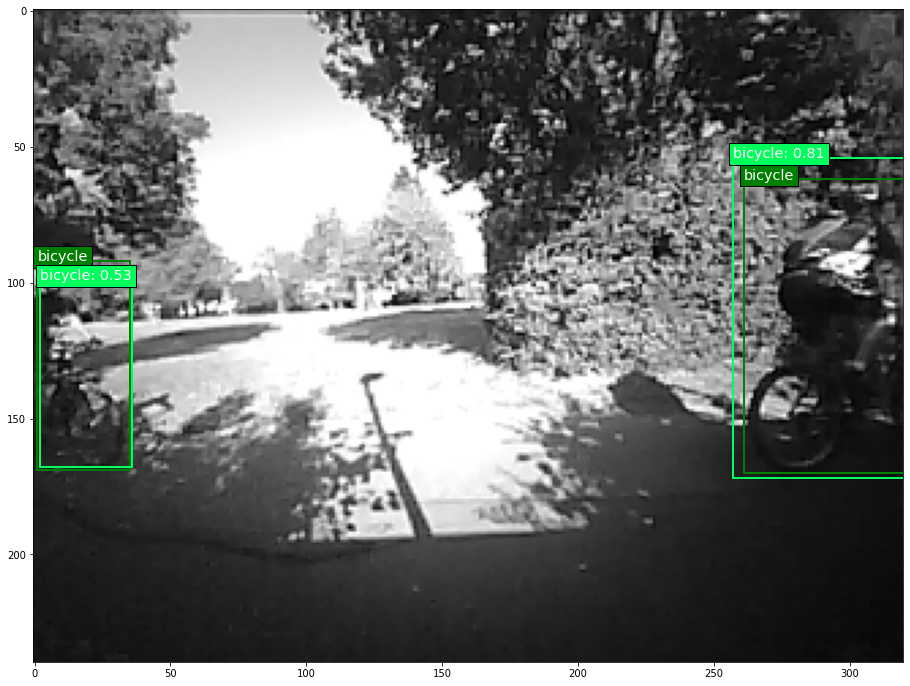

In [15]:
# 5: Draw the predicted boxes onto the image

# Set the colors for the bounding boxes
colors = plt.cm.hsv(np.linspace(0, 1, n_classes+1)).tolist()
classes = ['background',
           'aeroplane', 'bicycle', 'bird', 'boat',
           'bottle', 'bus', 'car', 'cat',
           'chair', 'cow', 'diningtable', 'dog',
           'horse', 'motorbike', 'person', 'pottedplant',
           'sheep', 'sofa', 'train', 'tvmonitor']

plt.figure(figsize=(20,12))
plt.imshow(batch_original_images[i])

current_axis = plt.gca()

for box in batch_original_labels[i]:
    xmin = box[1]
    ymin = box[2]
    xmax = box[3]
    ymax = box[4]
    label = '{}'.format(classes[int(box[0])])
    current_axis.add_patch(plt.Rectangle((xmin, ymin), xmax-xmin, ymax-ymin, color='green', fill=False, linewidth=2))  
    current_axis.text(xmin, ymin, label, size='x-large', color='white', bbox={'facecolor':'green', 'alpha':1.0})

for box in y_pred_decoded_inv[i]:
    xmin = box[2]
    ymin = box[3]
    xmax = box[4]
    ymax = box[5]
    color = colors[int(box[0])]
    label = '{}: {:.2f}'.format(classes[int(box[0])], box[1])
    current_axis.add_patch(plt.Rectangle((xmin, ymin), xmax-xmin, ymax-ymin, color=color, fill=False, linewidth=2))  
    current_axis.text(xmin, ymin, label, size='x-large', color='white', bbox={'facecolor':color, 'alpha':1.0})